In [1]:
import pandas as pd #data manpulation
import numpy as np
import matplotlib.pyplot as plt #data visualization
import seaborn as sns
import scipy

# 1) Cleaning + EDA + Standarization + Encoding 
import chardet #to detetmine dataset encoding

from sklearn.preprocessing import StandardScaler # scaling data so mean = 0 and std =  1 by ((x- u) / std)
from scipy import stats # for Box-Cox Transformation stats.boxcox(original_data)[0]
from mlxtend.preprocessing import minmax_scaling # for min_max scaling dont use it
#or
from sklearn.preprocessing import MinMaxScaler,normalize  #Tune input range to be 0 -> 1 by MinMaxScaler, same as above

#preprocessing: replace numeric and categorical
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder # label (ordinal or nominal)
from sklearn.preprocessing import OrdinalEncoder # object (no order)
from sklearn.preprocessing import OneHotEncoder # categorical 

# 2) feature enginerring
from sklearn.feature_selection import mutual_info_regression #mutal importance of feature
# a) numeric feature enginering
from sklearn.cluster import KMeans # Kmeans model for cluster feature
from IPython.display import display
from sklearn.decomposition import PCA # for loadings and adding new feature
# b) categorical feature enginering
from category_encoders import MEstimateEncoder # have m estimator


# 3) Data Modeling = train test split then model then get error
from sklearn.model_selection import train_test_split #also has cross_val_score (cv)
from sklearn.model_selection import RepeatedKFold # k fold cross validation it specify cv in corss_val_score dw
from sklearn.model_selection import cross_val_score # cv to get mean and see how much this feature affect the MAE error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBRegressor 
from xgboost import XGBClassifier
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score # accuracy of classification
#for accurace of regression use model.score or cross_val_score

#pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# 4) Model summary = features importance and effect + sharp values
import eli5
from eli5.sklearn import PermutationImportance # feature importance
# from pdpbox import pdp, get_dataset, info_plots #for pdp plots
import shap  # package used to calculate Shap values
import time


# 5) DL & images_audio visualize
import tensorflow as tf
import cv2
import IPython

C:\Users\ahmed\.conda\envs\machine_learning\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


# 1) Starting with Data
* understand features & see data
* check dtypes
* Errors -> NaN
* summary

In [2]:
data = open('train.csv', 'rb')
result = chardet.detect(data.read(10000))
print(result)

{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}


In [3]:
df = pd.read_csv('train.csv', encoding=result['encoding'])
df

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


**Notes:**

Data is 990 not 1584 which is 62.5% is training data and rest is test data (37.5%)

We must invstigate wether this split is balanced or not at visualization

In [4]:
columns = df.columns
columns # texture - shape - margin
# texture: el malms bta3 el leaf
# shape: large or small leaf
# margin: border of leafs

Index(['id', 'species', 'margin1', 'margin2', 'margin3', 'margin4', 'margin5',
       'margin6', 'margin7', 'margin8',
       ...
       'texture55', 'texture56', 'texture57', 'texture58', 'texture59',
       'texture60', 'texture61', 'texture62', 'texture63', 'texture64'],
      dtype='object', length=194)

image of  Pterocarya_Stenoptera shape:  (251, 667, 3)
image of  Quercus_Afares shape:  (377, 710, 3)


<Figure size 720x1080 with 0 Axes>

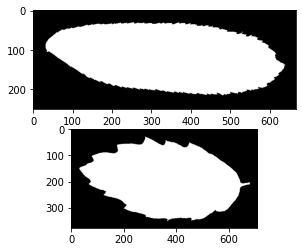

In [5]:
# show some images
import cv2
img_2 = cv2.imread('images/2.jpg') # reads img as BGR (or) plt.imread('carkyo.jpg') reads img as RGB also
img_1584 = cv2.imread('images/1584.jpg')

img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
img_1584 = cv2.cvtColor(img_1584, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,15))
fig, axs = plt.subplots(2, 1)
print('image of ', df.loc[1, 'species'], 'shape: ', img_2.shape)
axs[0].imshow(img_2) # plt.imshow() but if you want sns.histplot(ax = axs[0])
print('image of ', df.loc[989, 'species'], 'shape: ', img_1584.shape)
axs[1].imshow(img_1584)

In [6]:
# # show some audio
# import IPython
# IPython.display.Audio("audios/audio_1.wav")

In [7]:
df.loc[[1, 989], 'margin1':'margin64']

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64
1,0.005859,0.000000,0.03125,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,...,0.029297,0.009766,0.017578,0.007812,0.013672,0.019531,0.000000,0.000000,0.003906,0.000000
989,0.023438,0.019531,0.03125,0.015625,0.005859,0.019531,0.035156,0.0,0.003906,0.039062,...,0.011719,0.007812,0.013672,0.031250,0.023438,0.000000,0.003906,0.005859,0.019531,0.007812


In [8]:
df.loc[[1, 989], 'texture1':'texture64']

,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
1,0.000000,0.000000,0.007812,0.079102,0.000000,0.039062,0.000977,0.000000,0.027344,0.003906,...,0.000977,0.0,0.00000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
989,0.085938,0.005859,0.002930,0.019531,0.000977,0.000977,0.045898,0.001953,0.004883,0.060547,...,0.000000,0.0,0.00293,0.000000,0.012695,0.0,0.0,0.023438,0.025391,0.022461


In [9]:
df.loc[[1, 989], 'shape1':'shape64']

,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,...,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64
1,0.000749,0.000695,0.000720,0.000709,0.000688,0.000660,0.000624,0.000585,0.000556,0.000531,...,0.000518,0.000546,0.000574,0.000608,0.000641,0.000674,0.000703,0.000707,0.000688,0.000747
989,0.000630,0.000617,0.000582,0.000607,0.000584,0.000554,0.000529,0.000522,0.000508,0.000520,...,0.000541,0.000480,0.000420,0.000344,0.000294,0.000369,0.000449,0.000527,0.000599,0.000646


In [10]:
df.loc[:, 'margin60'].unique()

array([0.003906, 0.019531, 0.001953, 0.005859, 0.011719, 0.015625,
       0.      , 0.029297, 0.039062, 0.007812, 0.027344, 0.060547,
       0.009766, 0.03125 , 0.021484, 0.013672, 0.017578, 0.025391,
       0.066406, 0.056641, 0.041016, 0.033203, 0.076172, 0.042969,
       0.044922, 0.037109, 0.023438, 0.035156, 0.080078, 0.046875,
       0.054688, 0.050781, 0.052734, 0.072266, 0.048828, 0.089844,
       0.083984, 0.078125])

In [11]:
df.loc[:, 'margin8'].unique()

array([0.      , 0.007812, 0.001953, 0.005859, 0.03125 , 0.013672,
       0.003906, 0.015625, 0.017578])

In [12]:
# dtypes are correct
# df.info()
for col in columns:
    print(col, df[col].dtype)

id int64
species object
margin1 float64
margin2 float64
margin3 float64
margin4 float64
margin5 float64
margin6 float64
margin7 float64
margin8 float64
margin9 float64
margin10 float64
margin11 float64
margin12 float64
margin13 float64
margin14 float64
margin15 float64
margin16 float64
margin17 float64
margin18 float64
margin19 float64
margin20 float64
margin21 float64
margin22 float64
margin23 float64
margin24 float64
margin25 float64
margin26 float64
margin27 float64
margin28 float64
margin29 float64
margin30 float64
margin31 float64
margin32 float64
margin33 float64
margin34 float64
margin35 float64
margin36 float64
margin37 float64
margin38 float64
margin39 float64
margin40 float64
margin41 float64
margin42 float64
margin43 float64
margin44 float64
margin45 float64
margin46 float64
margin47 float64
margin48 float64
margin49 float64
margin50 float64
margin51 float64
margin52 float64
margin53 float64
margin54 float64
margin55 float64
margin56 float64
margin57 float64
margin58 float64

In [13]:
# Errors to NaN
for col in columns:
    print(col)
    print("Number of Uniques: ", df[col].nunique())
    print(sorted(df[col].unique()))
    print()

id
Number of Uniques:  990
[1, 2, 3, 5, 6, 8, 10, 11, 14, 15, 17, 18, 20, 21, 22, 25, 26, 27, 29, 30, 31, 32, 34, 35, 37, 38, 40, 42, 43, 45, 48, 49, 50, 54, 55, 56, 58, 60, 61, 63, 64, 66, 67, 69, 71, 72, 73, 75, 76, 78, 80, 81, 82, 83, 84, 85, 87, 88, 92, 100, 101, 103, 106, 107, 108, 109, 115, 116, 118, 120, 122, 124, 127, 129, 130, 132, 133, 134, 139, 140, 142, 143, 145, 146, 148, 149, 152, 153, 155, 160, 163, 164, 165, 166, 167, 168, 169, 171, 173, 175, 178, 179, 183, 186, 188, 189, 190, 194, 196, 198, 199, 201, 202, 203, 204, 206, 211, 212, 214, 215, 216, 217, 218, 219, 224, 225, 227, 228, 231, 233, 235, 237, 238, 239, 240, 241, 242, 243, 245, 246, 247, 248, 249, 252, 253, 256, 257, 258, 259, 260, 262, 263, 265, 267, 268, 269, 270, 273, 275, 278, 280, 282, 283, 286, 288, 289, 290, 291, 294, 298, 302, 303, 304, 306, 307, 309, 310, 311, 314, 315, 317, 319, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 333, 334, 335, 336, 338, 339, 340, 341, 342, 344, 345, 348, 349, 350, 35

Number of Uniques:  983
[0.00014818, 0.00018597, 0.00020039, 0.00020186, 0.00020792, 0.0002165, 0.00021869, 0.00021924, 0.00022597, 0.0002325, 0.00023258, 0.0002344, 0.00024489, 0.00025295, 0.00025626, 0.00025903, 0.00026148, 0.00026248, 0.00026249, 0.00026436, 0.00026644, 0.00026787, 0.0002693, 0.00027154, 0.00027462, 0.00027504, 0.0002763, 0.00027964, 0.00028514, 0.00028576, 0.00028776, 0.00029054, 0.000295, 0.00029591, 0.00029859, 0.00029969, 0.00030209, 0.0003028, 0.00030427, 0.0003044, 0.00030641, 0.00030741, 0.00030981, 0.00031148, 0.00031454, 0.00031989, 0.00032326, 0.00032498, 0.00032554, 0.00032691, 0.00032819, 0.00032927, 0.00032979, 0.00033583, 0.0003359, 0.00033652, 0.00033672, 0.000343, 0.00034345, 0.00034421, 0.00034551, 0.00034684, 0.00034775, 0.00034781, 0.00034951, 0.00035087, 0.00035165, 0.00035269, 0.00035277, 0.00035322, 0.00035391, 0.00035419, 0.0003545, 0.00035539, 0.00035569, 0.00035797, 0.00035849, 0.00035886, 0.00036078, 0.00036149, 0.00036172, 0.00036177, 0.00

Number of Uniques:  983
[6.4074e-05, 6.7663e-05, 7.2409e-05, 8.3043e-05, 8.3421e-05, 8.5964e-05, 9.1792e-05, 9.7059e-05, 0.00010358, 0.00011365, 0.0001218, 0.00012665, 0.00013378, 0.00013457, 0.0001379, 0.00013815, 0.00014044, 0.00014251, 0.00014432, 0.00014572, 0.00014614, 0.00014708, 0.00014828, 0.00014855, 0.0001525, 0.00015484, 0.0001552, 0.00015694, 0.00015811, 0.00015989, 0.00016003, 0.00016107, 0.00016139, 0.00016722, 0.00016734, 0.0001689, 0.00016891, 0.0001714, 0.00017224, 0.00017323, 0.0001768, 0.00017822, 0.00017939, 0.00018368, 0.00018516, 0.0001857, 0.00018853, 0.00019047, 0.00019075, 0.0001929, 0.0001939, 0.00019506, 0.00019577, 0.00019657, 0.00019786, 0.0001986, 0.00020433, 0.00020764, 0.00020805, 0.00021016, 0.00021019, 0.00021134, 0.00021179, 0.00021328, 0.00021484, 0.00021487, 0.00021547, 0.00021559, 0.00021738, 0.00021756, 0.00021983, 0.00022321, 0.00022642, 0.0002265, 0.00022662, 0.00022724, 0.00023336, 0.00023889, 0.00023957, 0.00024036, 0.00024044, 0.00024227, 0.0

Number of Uniques:  979
[2.1672e-05, 7.0139e-05, 7.36e-05, 7.6737e-05, 9.2568e-05, 9.9645e-05, 9.966e-05, 0.00010547, 0.00010599, 0.0001089, 0.00011059, 0.00011351, 0.00011452, 0.00011472, 0.00011911, 0.0001193, 0.00012409, 0.00012811, 0.00012821, 0.00012823, 0.00012883, 0.00013107, 0.0001313, 0.00013229, 0.00013287, 0.00013353, 0.00013767, 0.00013863, 0.00013994, 0.00014015, 0.00014047, 0.00014146, 0.00014158, 0.00014238, 0.00014445, 0.00014497, 0.00014753, 0.00014756, 0.00014878, 0.00015128, 0.00015351, 0.00015483, 0.00015518, 0.0001552, 0.00015567, 0.00016427, 0.00016605, 0.00016659, 0.00016826, 0.00017172, 0.0001758, 0.00017618, 0.00017763, 0.00017779, 0.00017855, 0.0001808, 0.00018158, 0.00018747, 0.00018927, 0.00019413, 0.00019602, 0.00019616, 0.00019719, 0.00019816, 0.00019949, 0.00020064, 0.00020198, 0.00020211, 0.00020226, 0.00020459, 0.0002053, 0.00020693, 0.00020694, 0.00020873, 0.00020874, 0.00020905, 0.00020906, 0.00020986, 0.00021015, 0.00021072, 0.00021164, 0.00021173, 0

Number of Uniques:  116
[0.0, 0.000977, 0.001953, 0.00293, 0.003906, 0.004883, 0.005859, 0.006836, 0.007812, 0.008789, 0.009766, 0.010742, 0.011719, 0.012695, 0.013672, 0.014648, 0.015625, 0.016602, 0.017578, 0.018555, 0.019531, 0.020508, 0.021484, 0.022461, 0.023438, 0.024414, 0.025391, 0.026367, 0.027344, 0.02832, 0.029297, 0.030273, 0.03125, 0.032227, 0.033203, 0.03418, 0.035156, 0.036133, 0.037109, 0.038086, 0.039062, 0.040039, 0.041016, 0.041992, 0.042969, 0.043945, 0.044922, 0.045898, 0.046875, 0.047852, 0.048828, 0.049805, 0.050781, 0.051758, 0.052734, 0.053711, 0.054688, 0.056641, 0.057617, 0.058594, 0.05957, 0.060547, 0.061523, 0.0625, 0.063477, 0.066406, 0.068359, 0.069336, 0.070312, 0.071289, 0.072266, 0.073242, 0.074219, 0.076172, 0.078125, 0.079102, 0.080078, 0.081055, 0.082031, 0.084961, 0.085938, 0.086914, 0.087891, 0.088867, 0.089844, 0.091797, 0.092773, 0.097656, 0.099609, 0.10059, 0.10156, 0.10449, 0.10547, 0.11231, 0.11426, 0.11523, 0.11719, 0.11914, 0.12402, 0.12793

In [14]:
# summary
df.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


**Notes:**

1) Data types are correct

2) No Errors to be replaced with NaNs

3) Data is scalled but not normally distbuted but has 99 specices each has 16 sample so we need to make data normalized

# 2) Cleaning
* NaN
* Dublicate
* Outliers
* inconsistency


**outliers:** solved by mathmatical transformers (log: large ranges, 1/x: small ranges, sqrt: squared large values)

then remove outliers using (Z-score / IQR)

In [15]:
# NaN
# there is no NaNs
print((sum(np.sum(df.isna())) / (df.shape[0] * df.shape[1]))* 100, '%')
df.dropna(inplace=True)
df

0.0 %


,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [16]:
# Dublicates
# there is no Dublicates

print(sum(df.duplicated()))
df.drop_duplicates()

0


,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


id


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


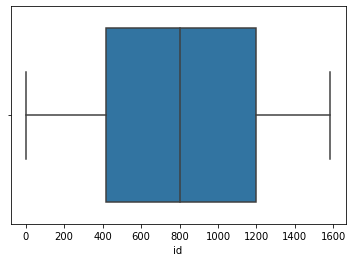

margin1


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


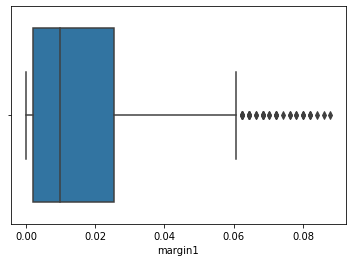

margin2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


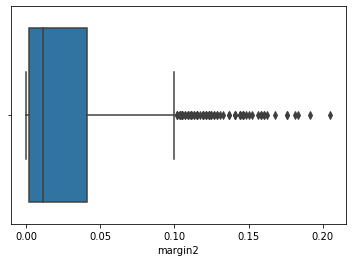

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin3


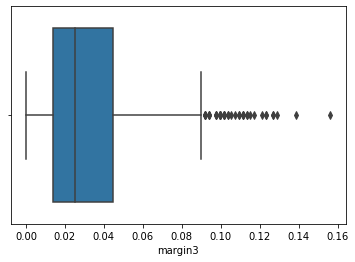

margin4


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


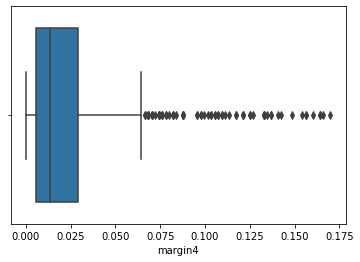

margin5


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


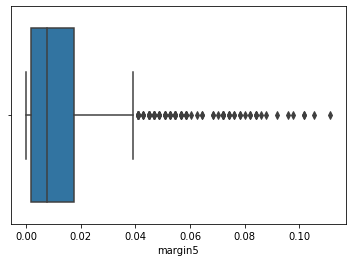

margin6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


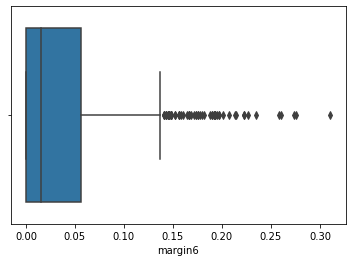

margin7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


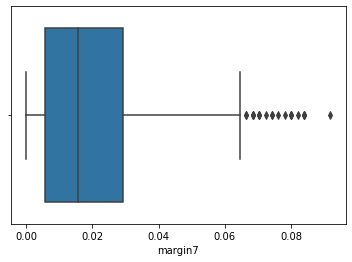

margin8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


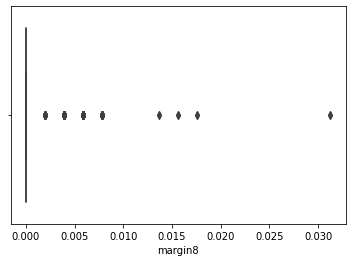

margin9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


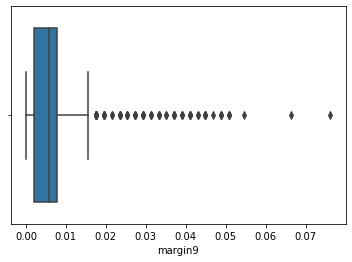

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin10


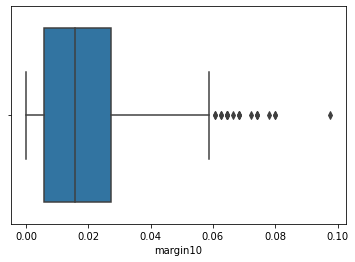

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin11


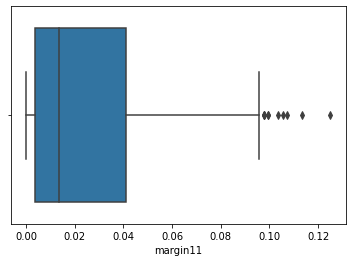

margin12


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


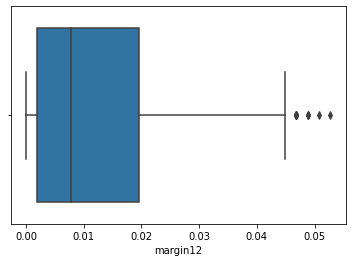

margin13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


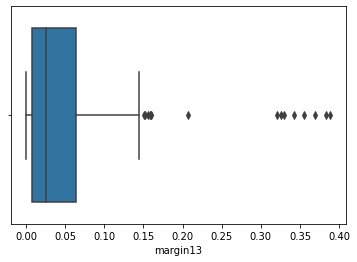

margin14


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


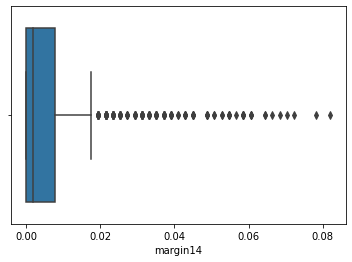

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin15


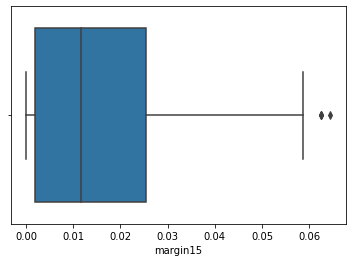

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin16


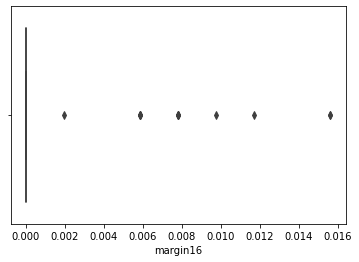

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin17


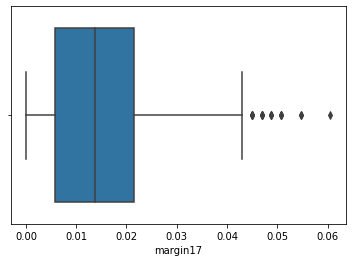

margin18


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


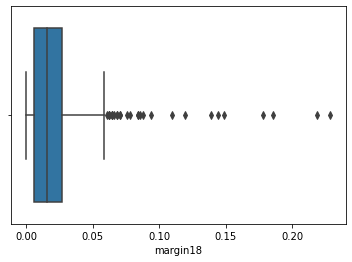

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin19


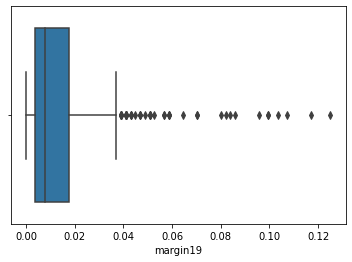

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin20


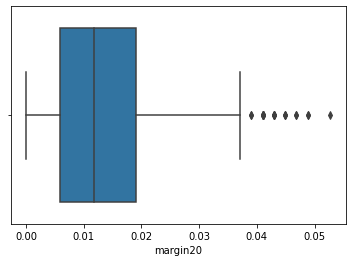

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin21


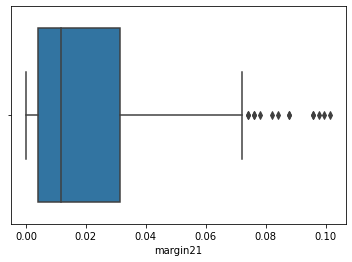

margin22


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


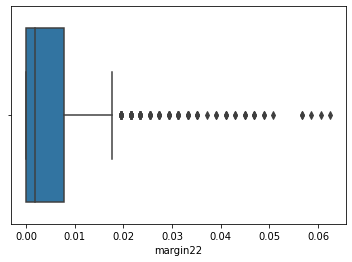

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin23


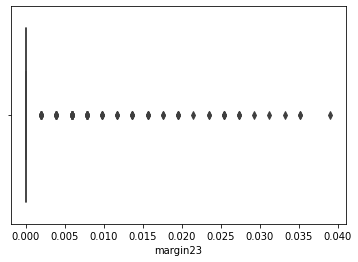

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin24


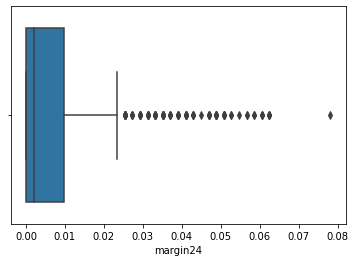

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin25


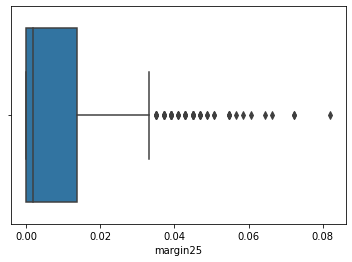

margin26


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


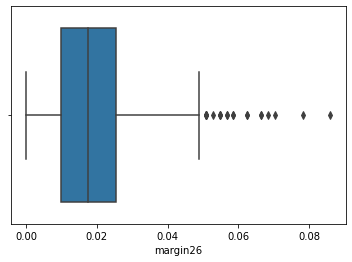

margin27


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


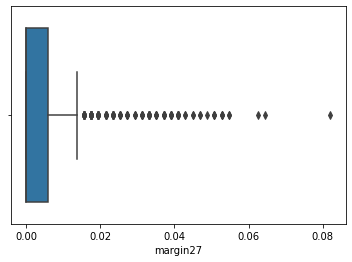

margin28


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


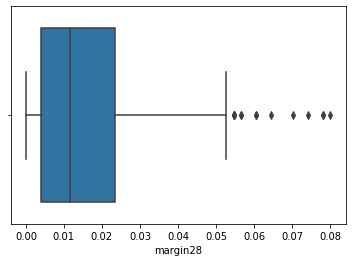

margin29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


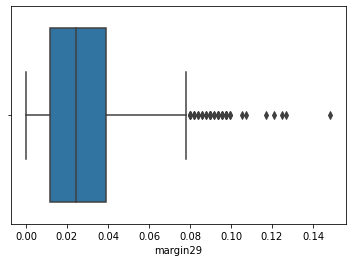

margin30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


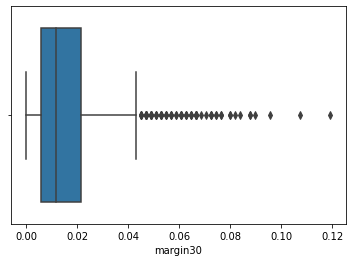

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin31


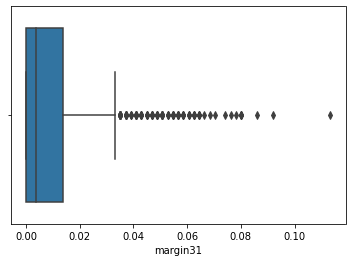

margin32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


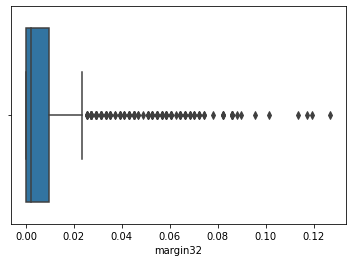

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin33


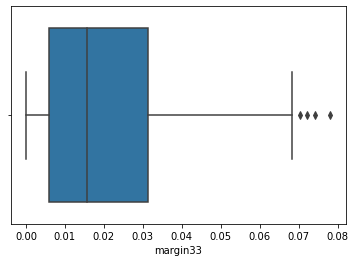

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin34


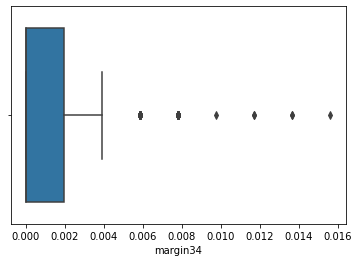

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin35


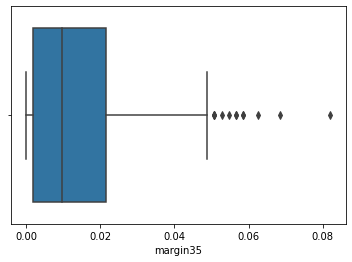

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin36


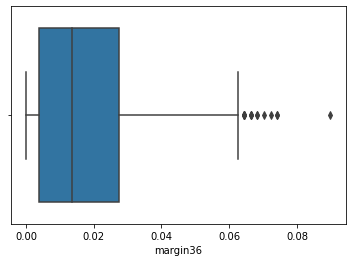

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin37


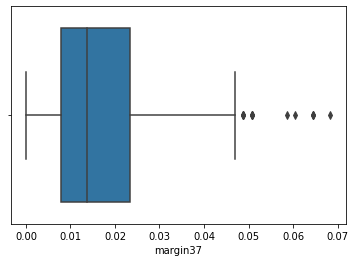

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin38


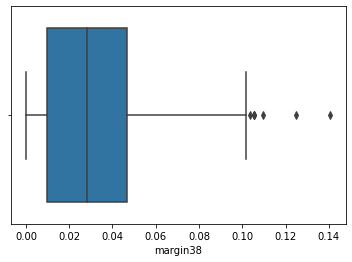

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin39


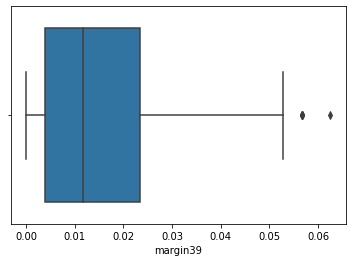

margin40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


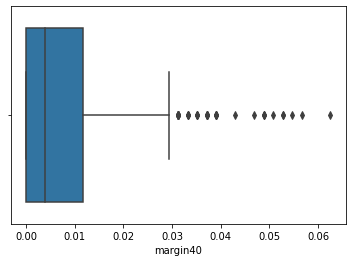

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin41


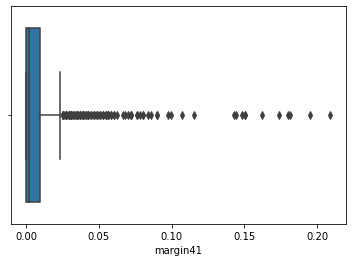

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin42


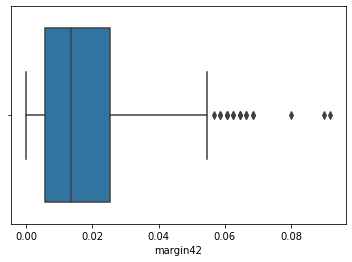

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin43


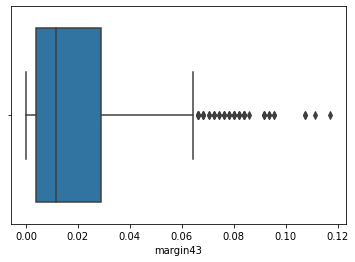

margin44


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


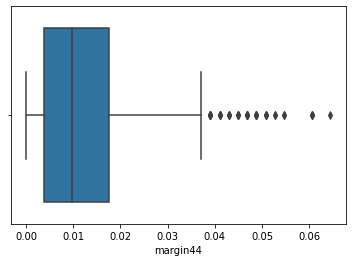

margin45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


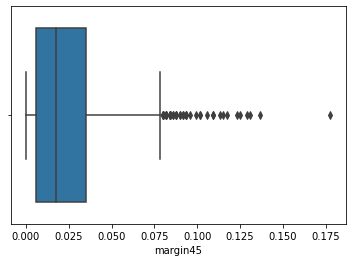

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin46


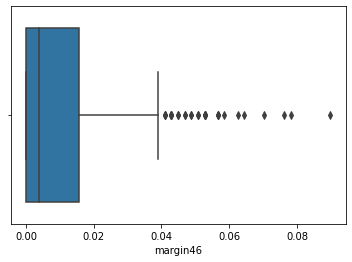

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin47


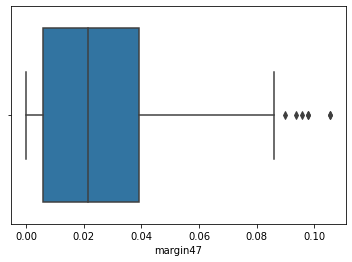

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin48


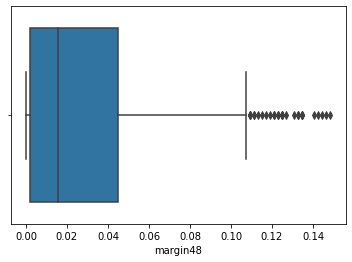

margin49


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


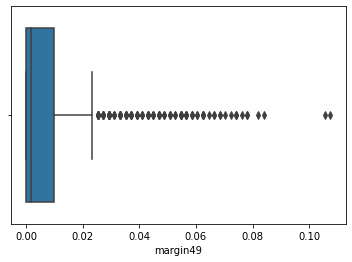

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin50


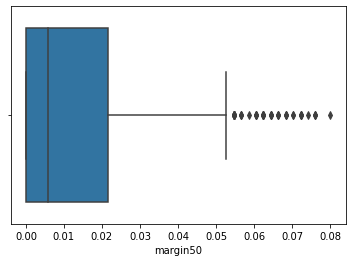

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin51


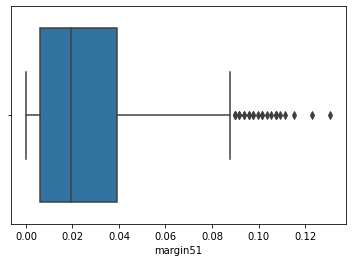

margin52


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


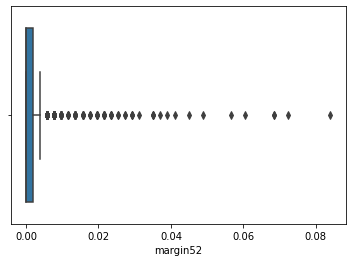

margin53


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


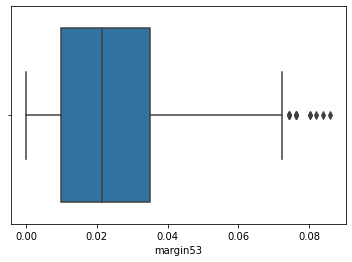

margin54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


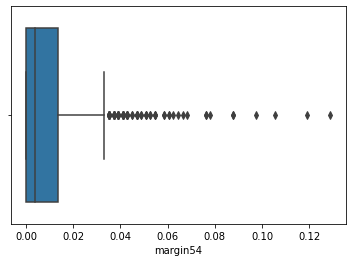

margin55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


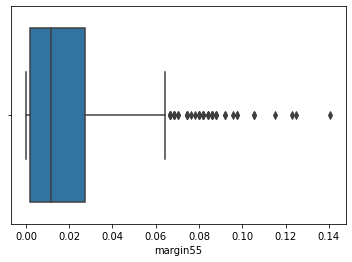

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin56


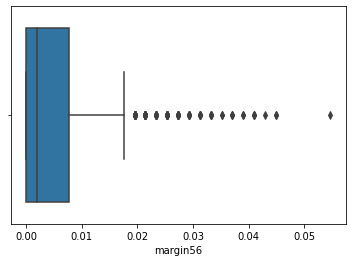

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin57


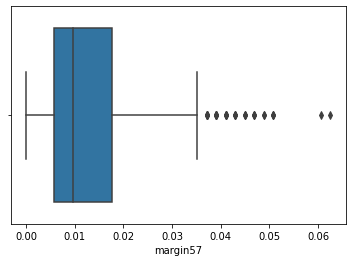

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin58


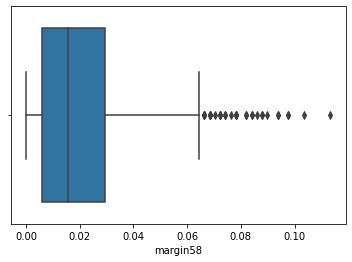

margin59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


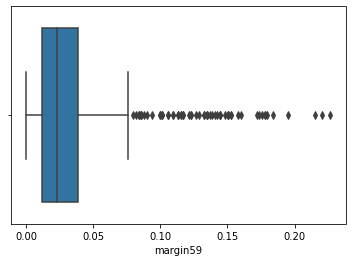

margin60


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


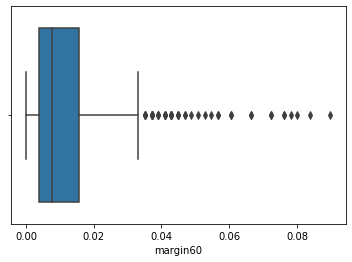

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin61


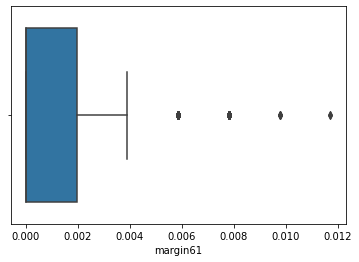

margin62


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


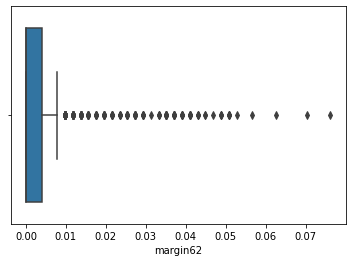

margin63


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


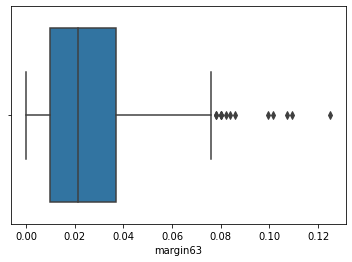

margin64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


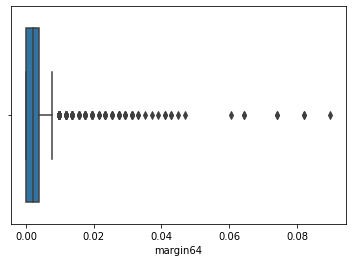

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape1


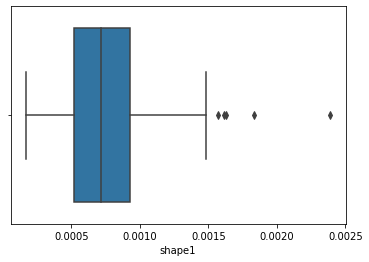

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape2


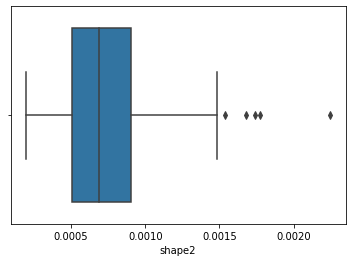

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape3


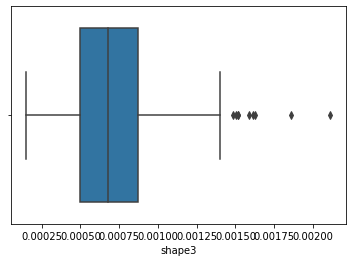

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape4


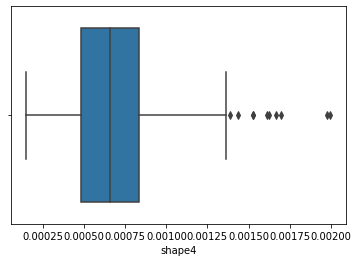

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape5


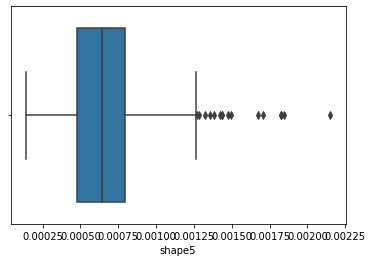

shape6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


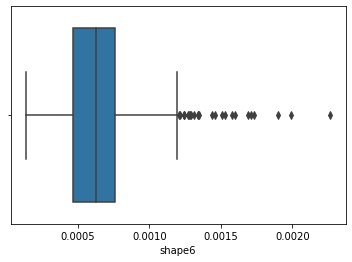

shape7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


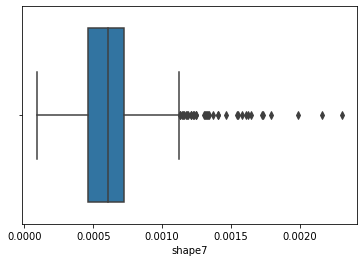

shape8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


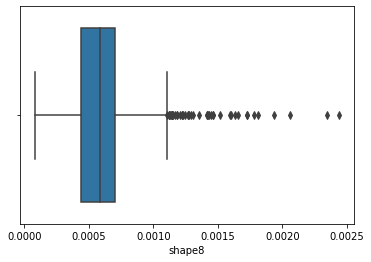

shape9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


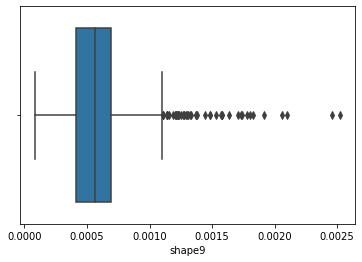

shape10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


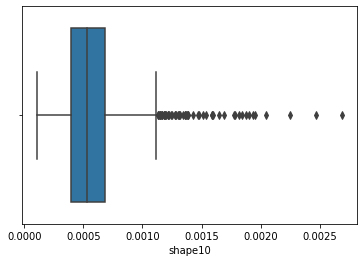

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape11


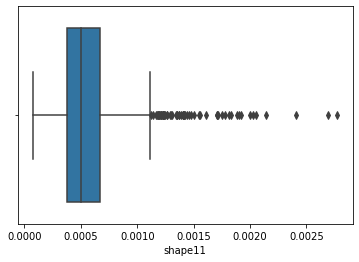

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape12


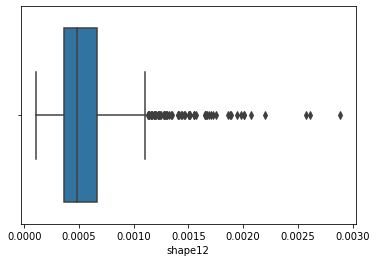

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape13


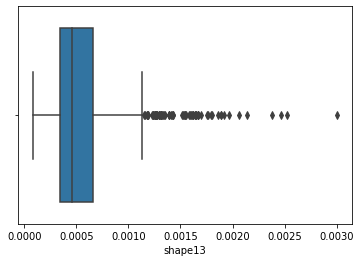

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape14


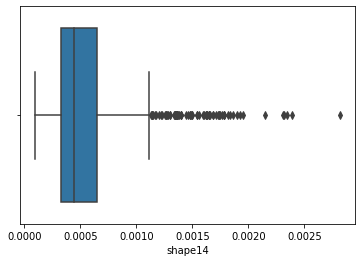

shape15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


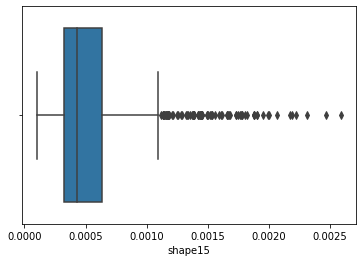

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape16


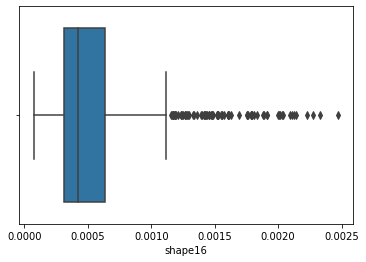

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape17


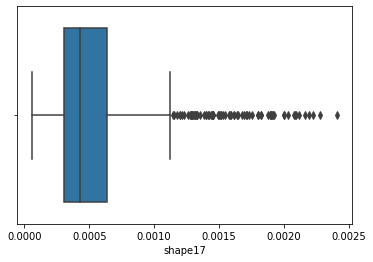

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape18


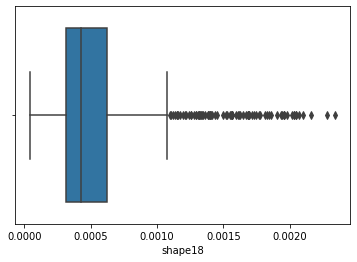

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape19


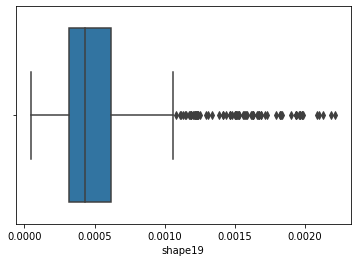

shape20


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


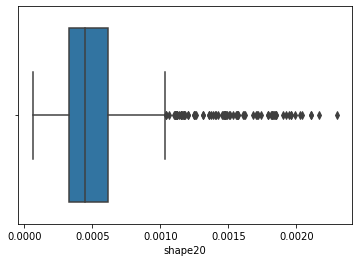

shape21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


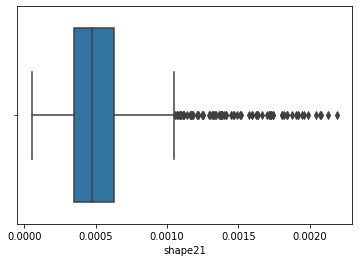

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape22


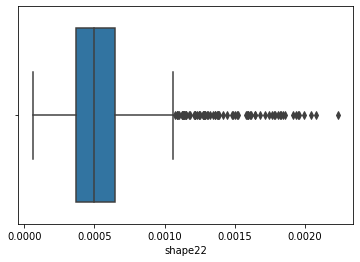

shape23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


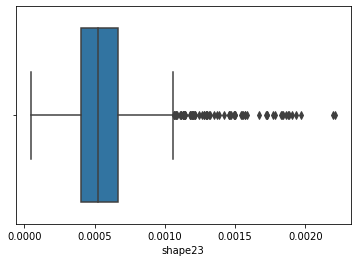

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape24


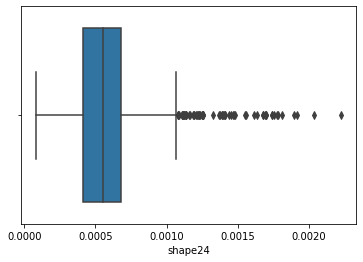

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape25


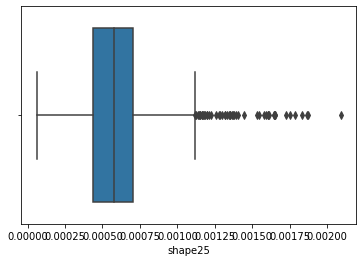

shape26


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


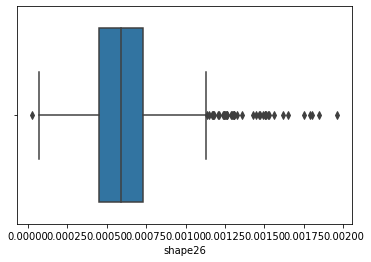

shape27


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


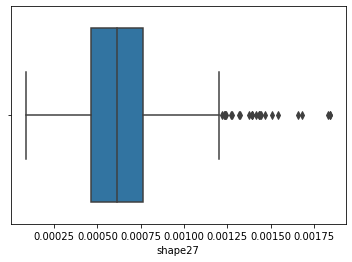

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape28


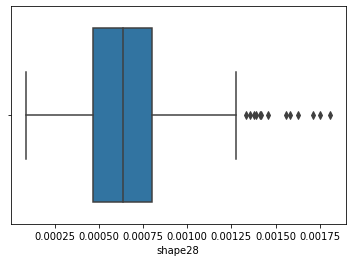

shape29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


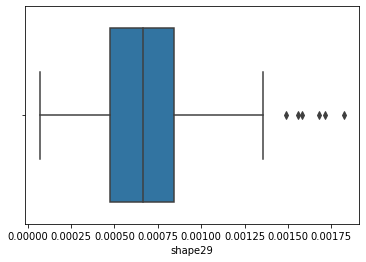

shape30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


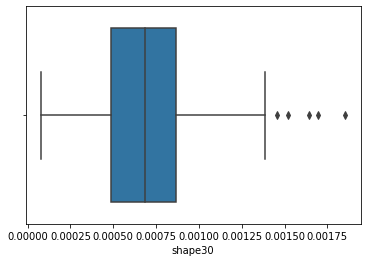

shape31


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


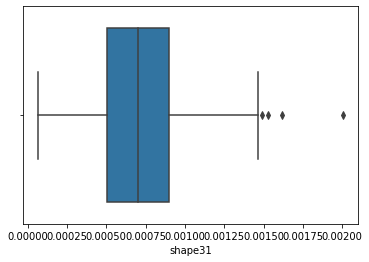

shape32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


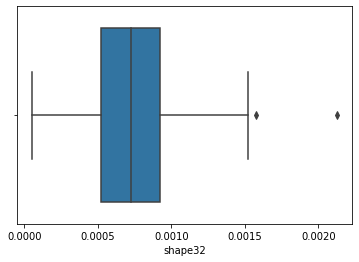

shape33


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


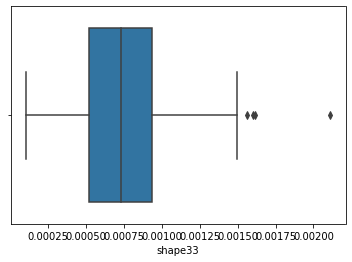

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape34


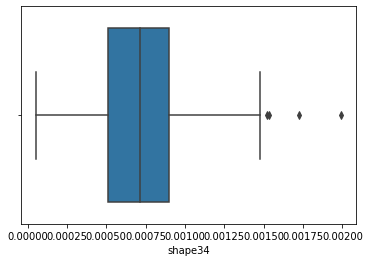

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape35


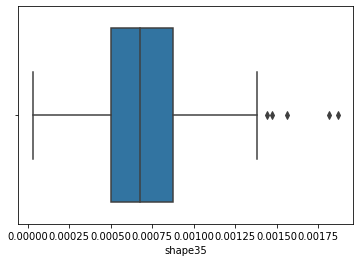

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape36


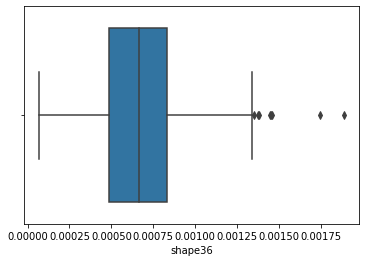

shape37


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


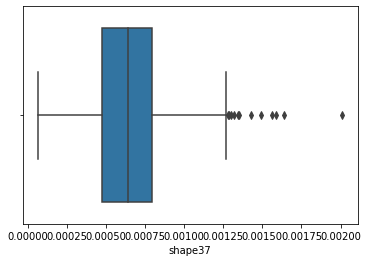

shape38


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


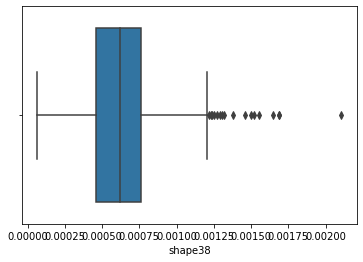

shape39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


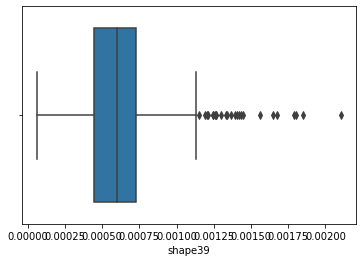

shape40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


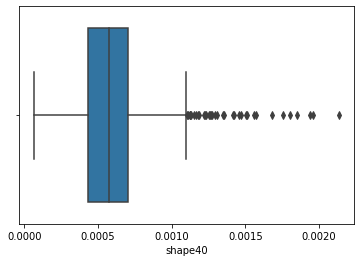

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape41


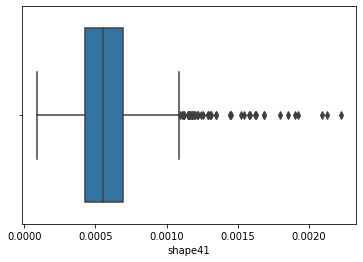

shape42


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


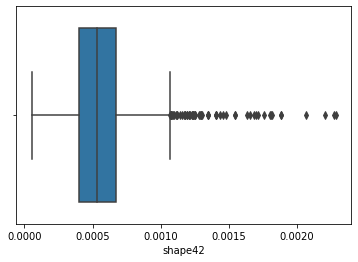

shape43


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


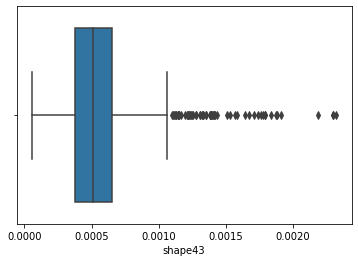

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape44


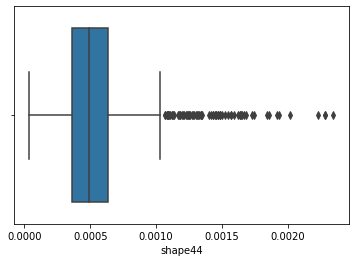

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape45


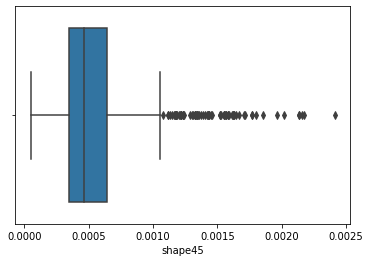

shape46


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


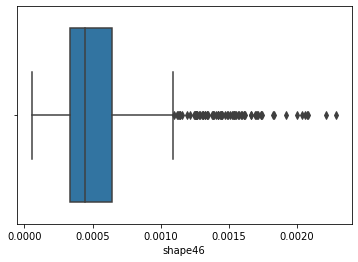

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape47


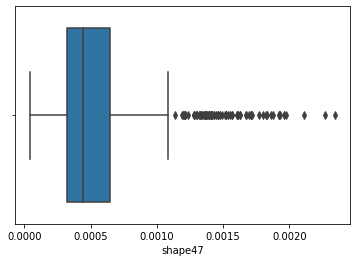

shape48


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


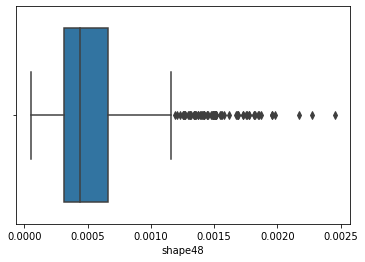

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape49


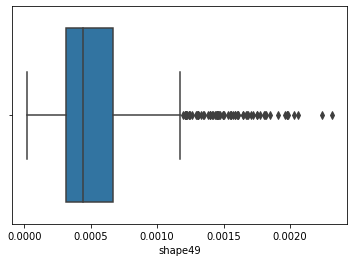

shape50


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


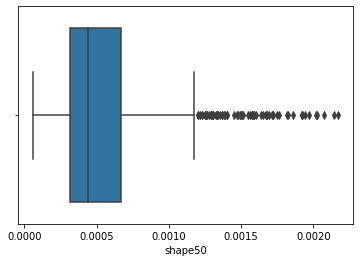

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape51


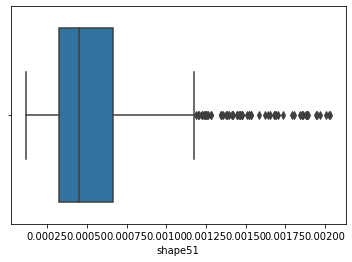

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape52


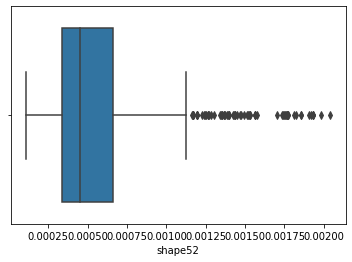

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape53


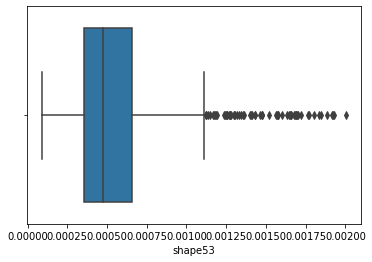

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape54


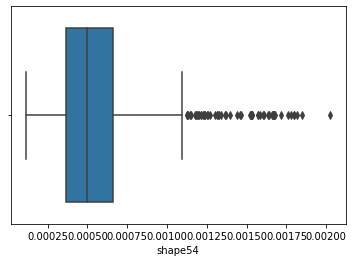

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape55


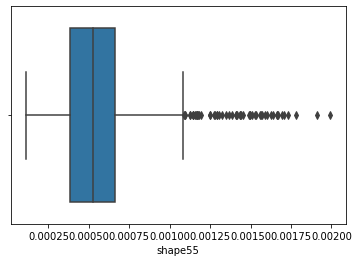

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape56


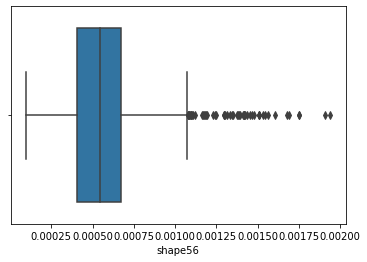

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape57


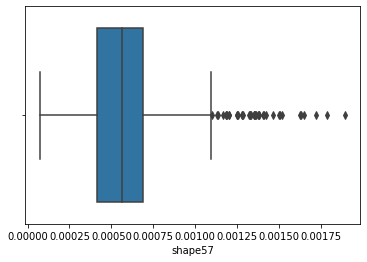

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape58


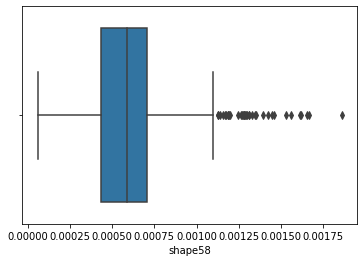

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape59


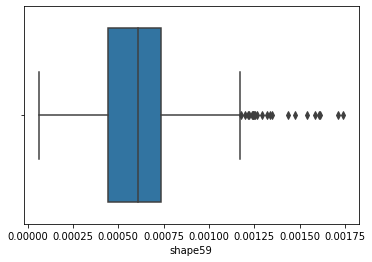

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape60


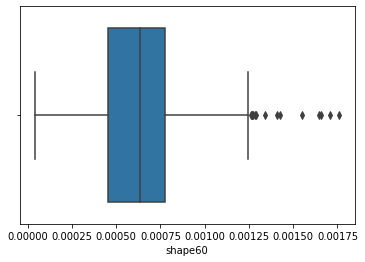

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape61


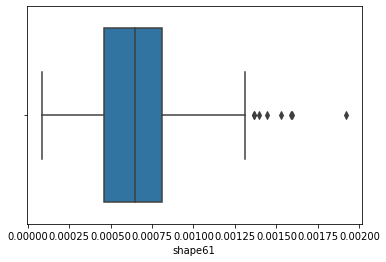

shape62


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


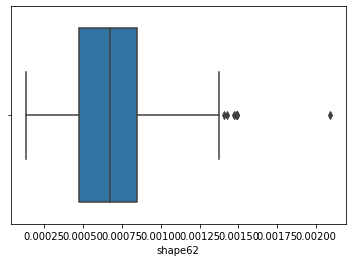

shape63


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


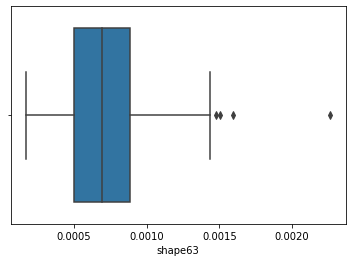

shape64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


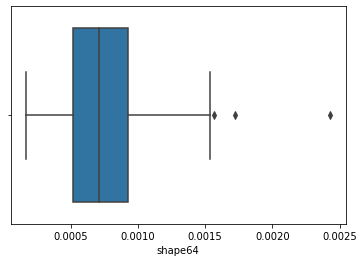

texture1


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


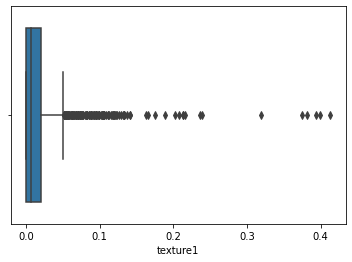

texture2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


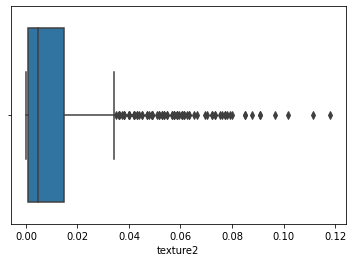

texture3


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


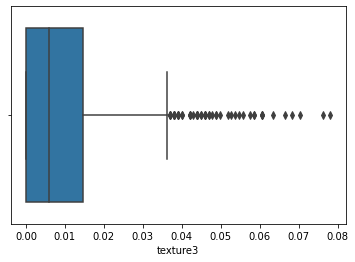

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture4


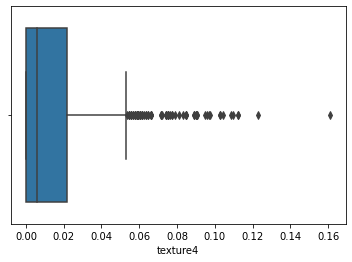

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture5


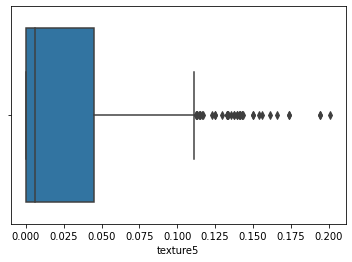

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture6


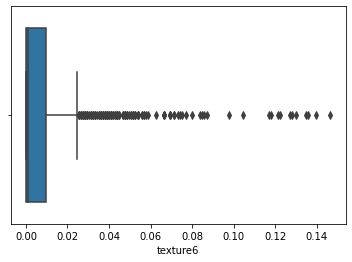

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture7


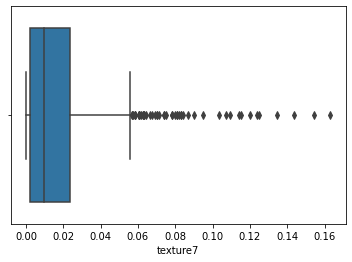

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture8


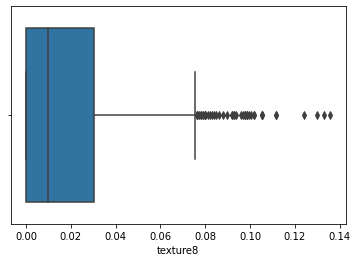

texture9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


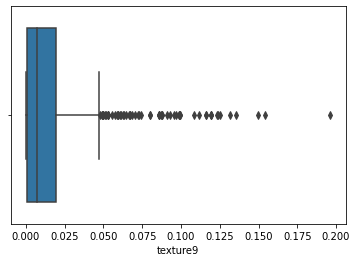

texture10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


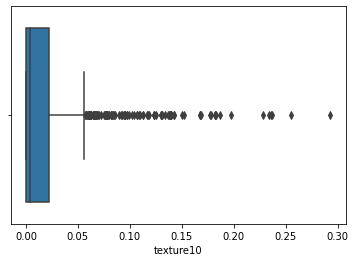

texture11


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


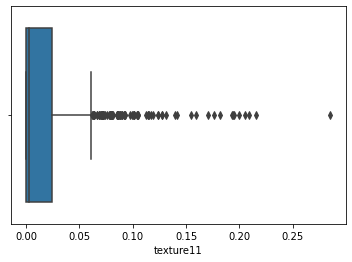

texture12


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


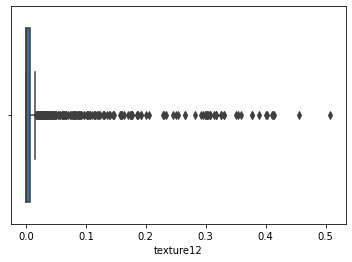

texture13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


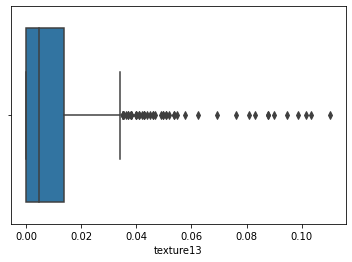

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture14


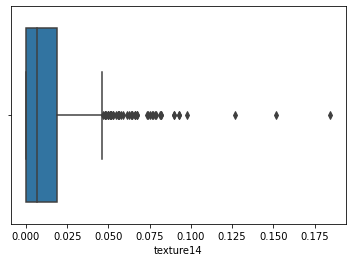

texture15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


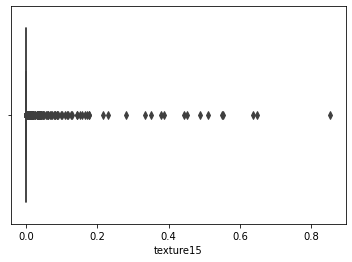

texture16


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


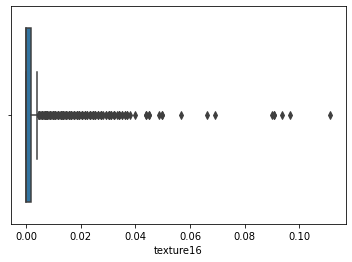

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture17


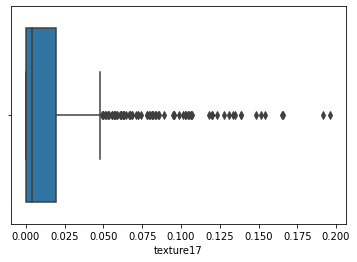

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture18


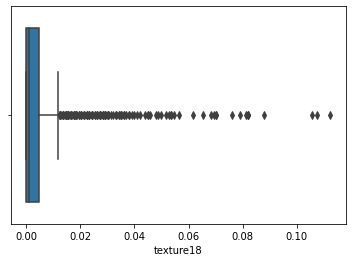

texture19


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


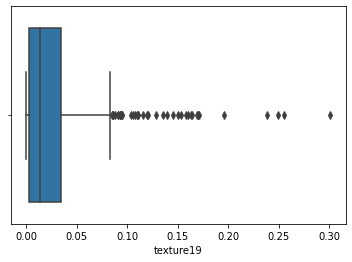

texture20


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


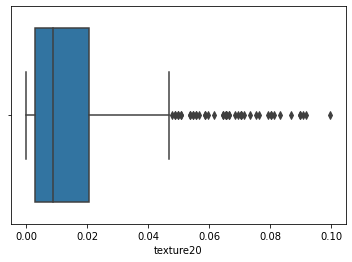

texture21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


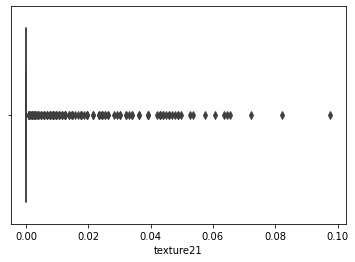

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture22


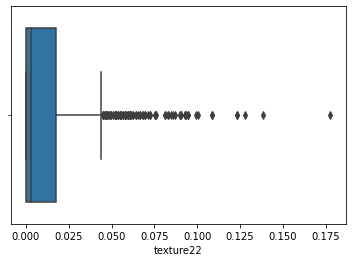

texture23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


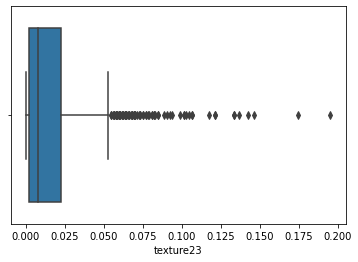

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture24


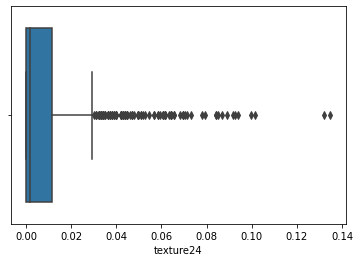

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture25


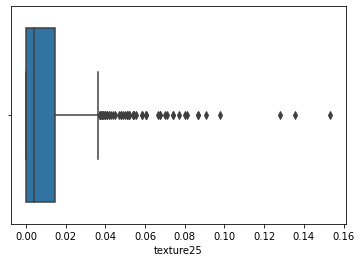

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture26


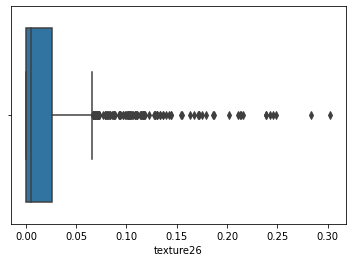

texture27


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


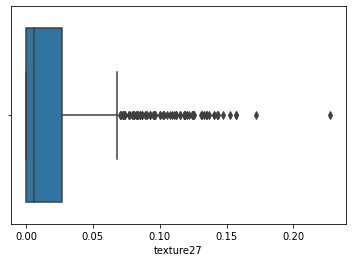

texture28


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


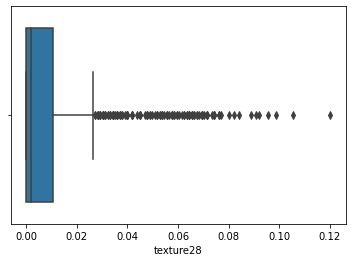

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture29


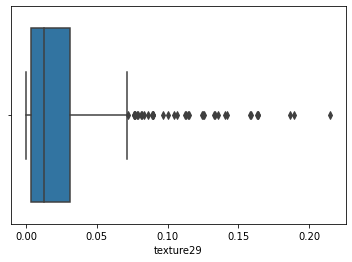

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture30


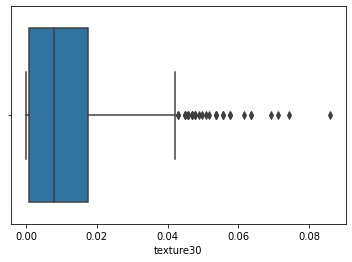

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture31


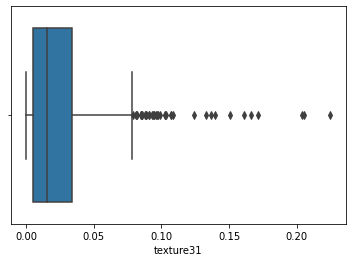

texture32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


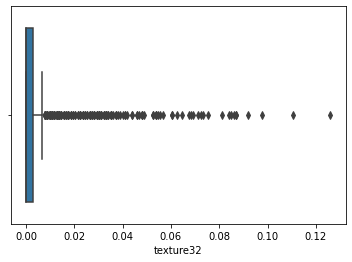

texture33


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


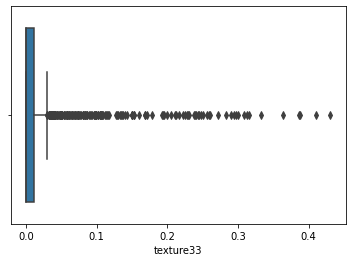

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture34


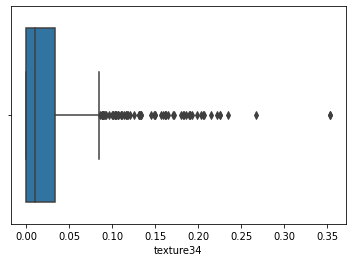

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture35


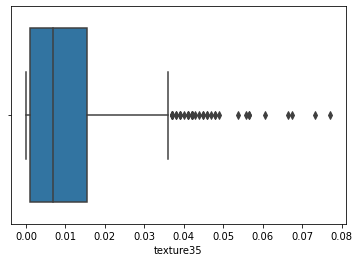

texture36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


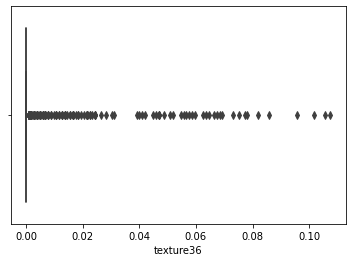

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture37


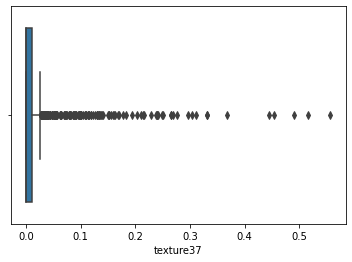

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture38


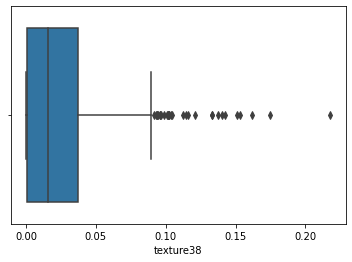

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture39


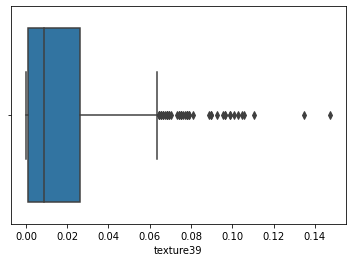

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture40


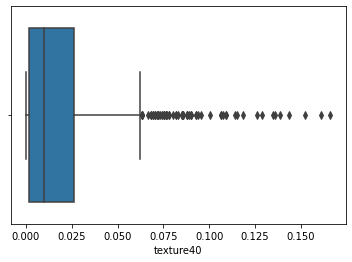

texture41


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


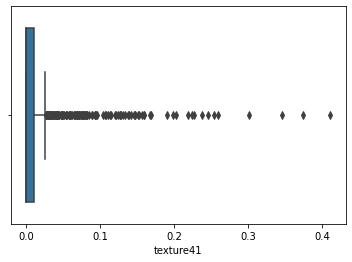

texture42


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


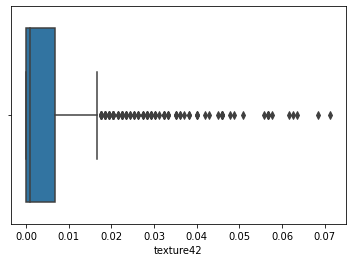

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture43


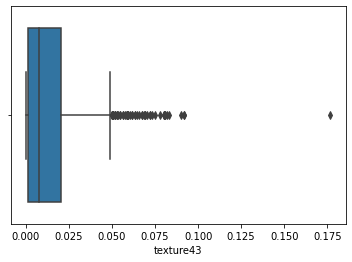

texture44


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


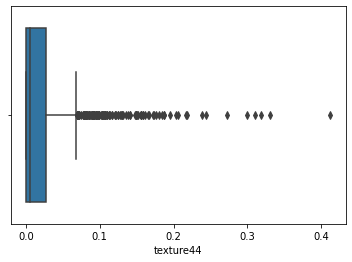

texture45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


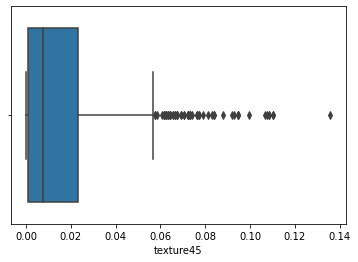

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture46


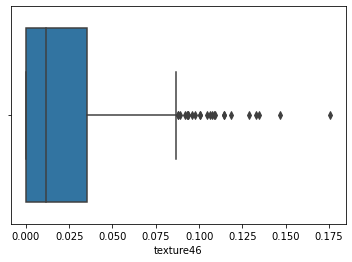

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture47


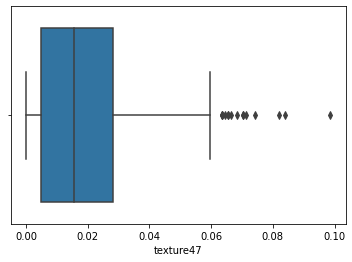

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture48


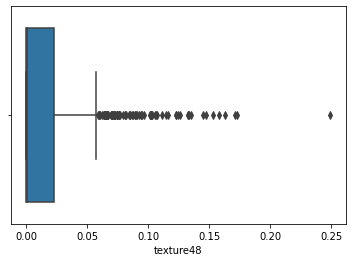

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture49


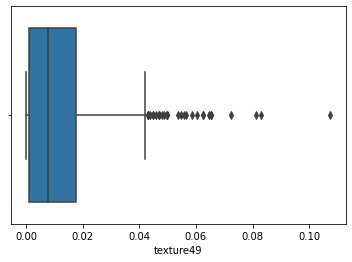

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture50


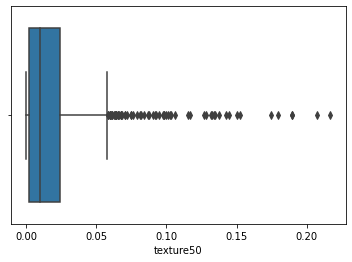

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture51


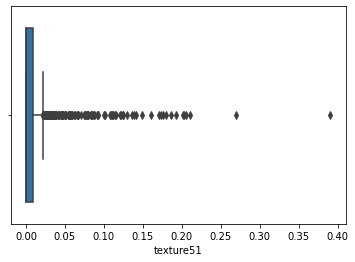

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture52


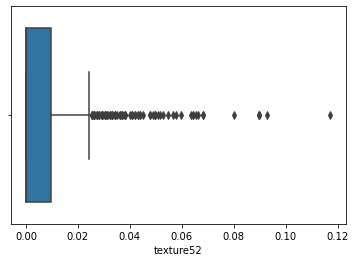

texture53


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


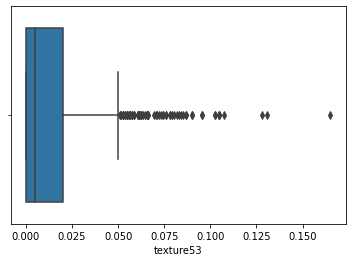

texture54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


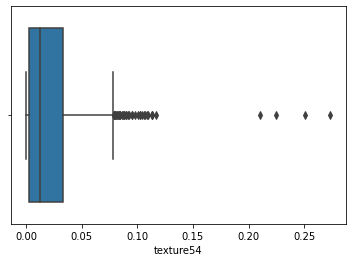

texture55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


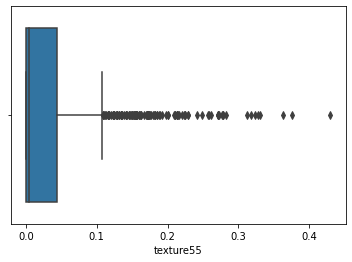

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture56


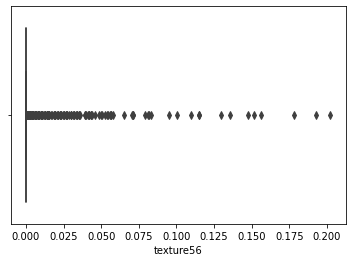

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture57


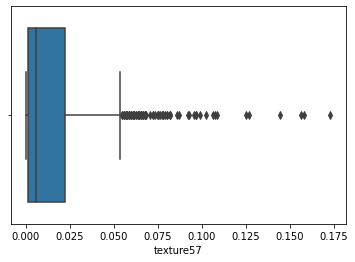

texture58


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


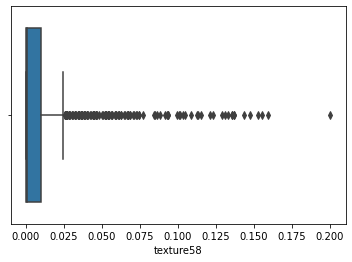

texture59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


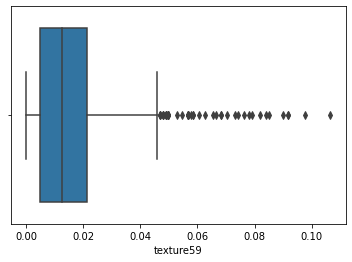

texture60


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


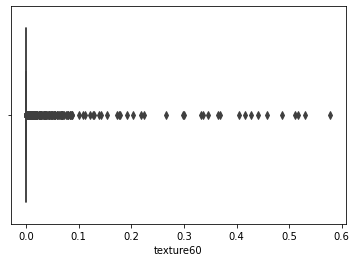

texture61


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


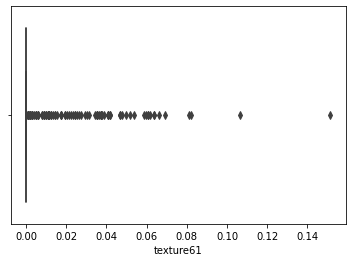

texture62


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


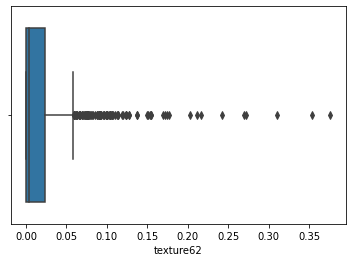

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture63


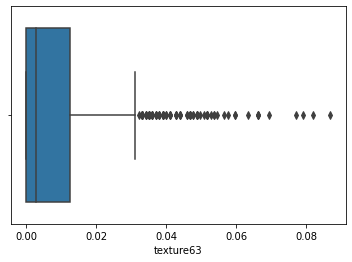

texture64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


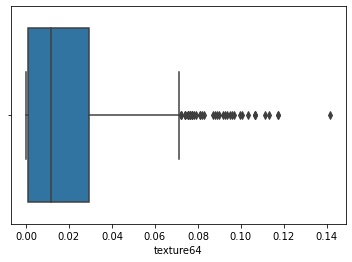

In [17]:
# outliers
# solved by mathmatical transformers (log: large ranges, 1/x: small ranges, sqrt: squared large values)
# then remove outliers using (Z-score / IQR)
for col in columns:
    if not(df[col].dtype == 'object'):
        print(col)
        sns.boxplot(df[col])
        plt.show()

margin1
 Min: 0.0 Max: 0.087891 
 mean: 0.017412358585858587 std: 0.01973900333187047 
 median: 0.009766 
 mode: 0.0


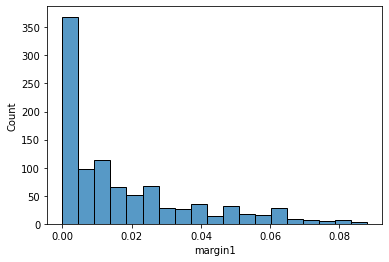

margin2
 Min: 0.0 Max: 0.20508 
 mean: 0.028539285858585856 std: 0.03885490466200282 
 median: 0.011719 
 mode: 0.0


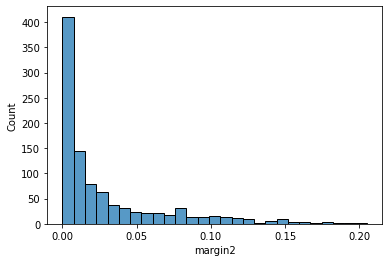

margin3
 Min: 0.0 Max: 0.15625 
 mean: 0.03198784242424243 std: 0.02584683730870975 
 median: 0.025391 
 mode: 0.015625


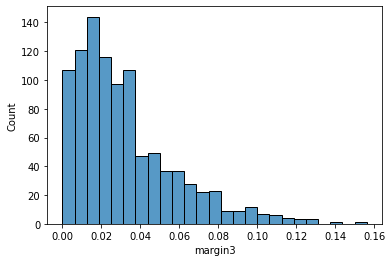

margin4
 Min: 0.0 Max: 0.16992 
 mean: 0.023279618181818184 std: 0.028411267587719915 
 median: 0.013672 
 mode: 0.003906


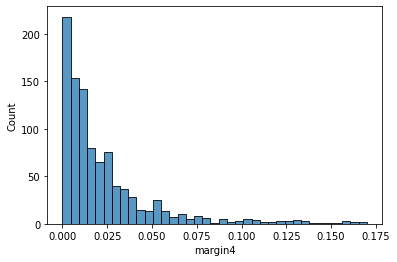

margin5
 Min: 0.0 Max: 0.11133 
 mean: 0.014263668686868687 std: 0.01838975576557838 
 median: 0.007812 
 mode: 0.0


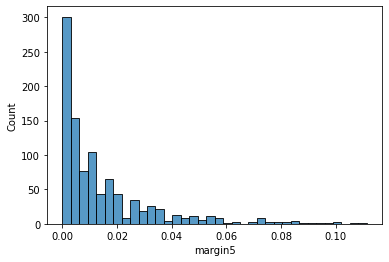

margin6
 Min: 0.0 Max: 0.31055 
 mean: 0.03857921414141414 std: 0.05202953156123841 
 median: 0.015625 
 mode: 0.0


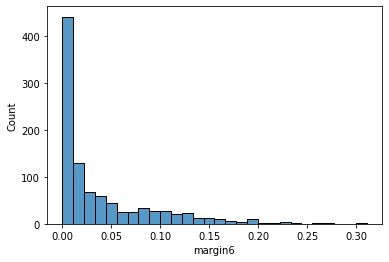

margin7
 Min: 0.0 Max: 0.091797 
 mean: 0.019201743434343437 std: 0.01751086526879564 
 median: 0.015625 
 mode: 0.0


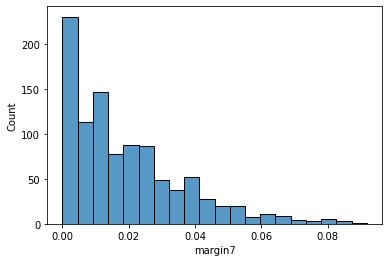

margin8
 Min: 0.0 Max: 0.03125 
 mean: 0.0010830373737373737 std: 0.0027428072176849034 
 median: 0.0 
 mode: 0.0


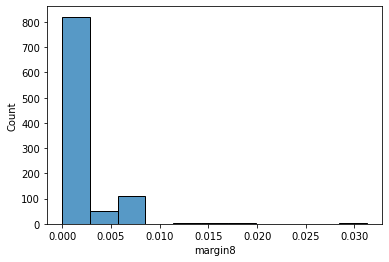

margin9
 Min: 0.0 Max: 0.076172 
 mean: 0.007167232323232323 std: 0.008932695750989329 
 median: 0.005859 
 mode: 0.005859


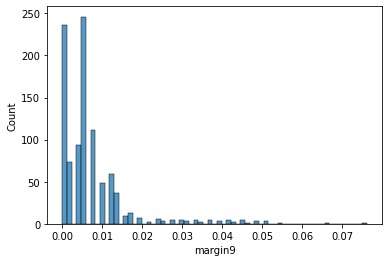

margin10
 Min: 0.0 Max: 0.097656 
 mean: 0.018639494949494947 std: 0.016071356380230602 
 median: 0.015625 
 mode: 0.0


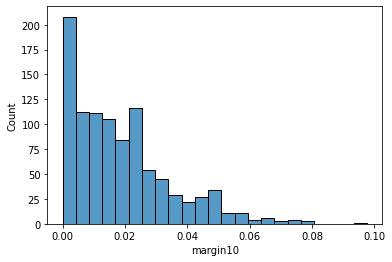

margin11
 Min: 0.0 Max: 0.125 
 mean: 0.024208851515151515 std: 0.026085549968515746 
 median: 0.013672 
 mode: 0.0


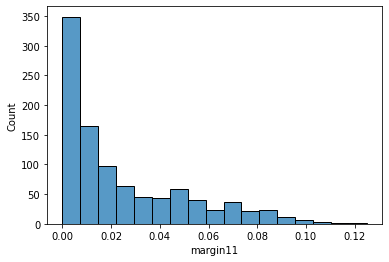

margin12
 Min: 0.0 Max: 0.052734 
 mean: 0.011975161616161616 std: 0.01173243225003493 
 median: 0.007812 
 mode: 0.001953


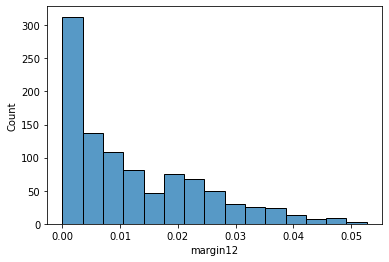

margin13
 Min: 0.0 Max: 0.38867 
 mean: 0.04125241616161616 std: 0.04634114674760711 
 median: 0.025391 
 mode: 0.0


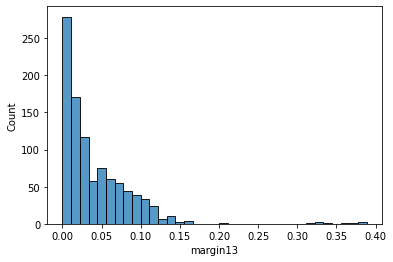

margin14
 Min: 0.0 Max: 0.082031 
 mean: 0.00805310808080808 std: 0.013273083408625555 
 median: 0.001953 
 mode: 0.0


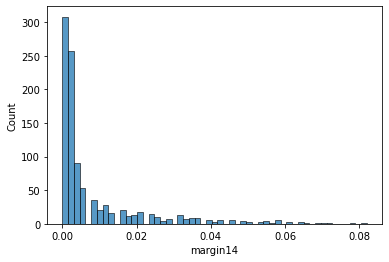

margin15
 Min: 0.0 Max: 0.064453 
 mean: 0.015609166666666669 std: 0.014276513949333028 
 median: 0.011719 
 mode: 0.0


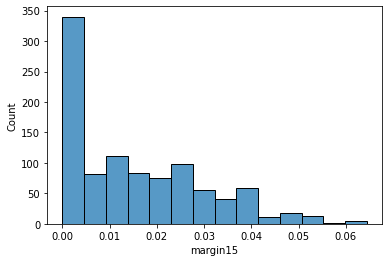

margin16
 Min: 0.0 Max: 0.015625 
 mean: 0.00011047676767676767 std: 0.0010518138846262078 
 median: 0.0 
 mode: 0.0


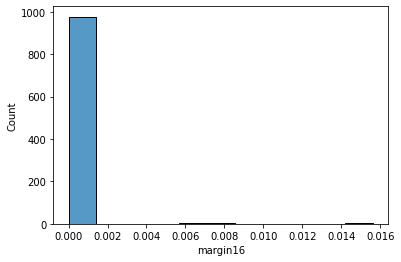

margin17
 Min: 0.0 Max: 0.060547 
 mean: 0.015127809090909092 std: 0.010821426822566232 
 median: 0.013672 
 mode: 0.003906


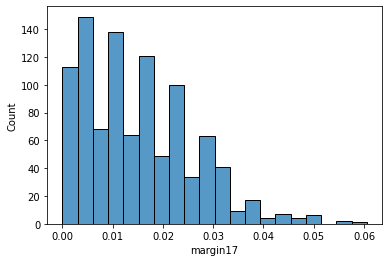

margin18
 Min: 0.0 Max: 0.22852 
 mean: 0.02010729191919192 std: 0.02128541402218167 
 median: 0.015625 
 mode: 0.001953


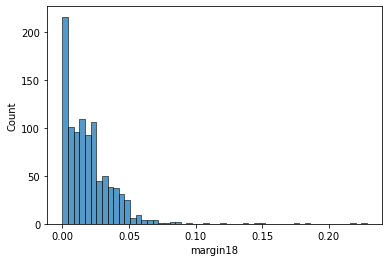

margin19
 Min: 0.0 Max: 0.125 
 mean: 0.01234407373737374 std: 0.014479049549261401 
 median: 0.007812 
 mode: 0.003906


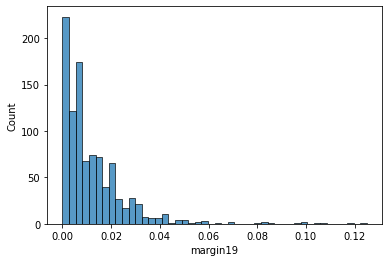

margin20
 Min: 0.0 Max: 0.052734 
 mean: 0.01313519898989899 std: 0.009672491007229382 
 median: 0.011719 
 mode: 0.007812


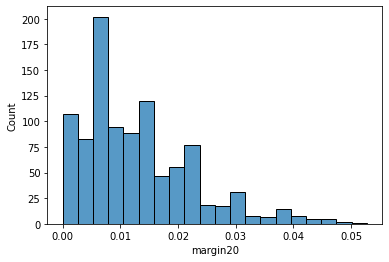

margin21
 Min: 0.0 Max: 0.10156 
 mean: 0.019130703030303033 std: 0.01946316701223879 
 median: 0.011719 
 mode: 0.0


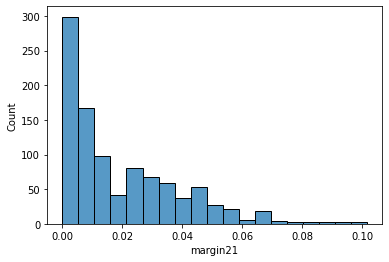

margin22
 Min: 0.0 Max: 0.0625 
 mean: 0.0061947060606060604 std: 0.010202926755971967 
 median: 0.001953 
 mode: 0.0


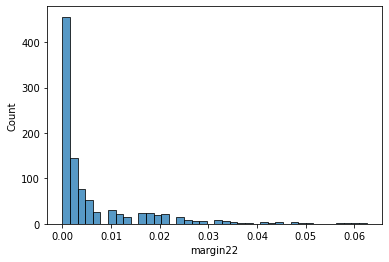

margin23
 Min: 0.0 Max: 0.039062 
 mean: 0.0009982525252525253 std: 0.004309692334619555 
 median: 0.0 
 mode: 0.0


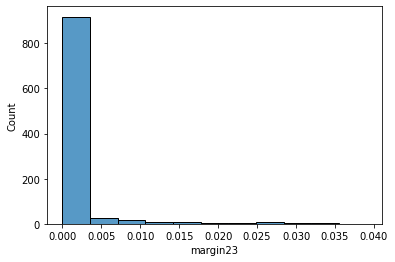

margin24
 Min: 0.0 Max: 0.078125 
 mean: 0.007646725252525252 std: 0.012864285215763301 
 median: 0.001953 
 mode: 0.0


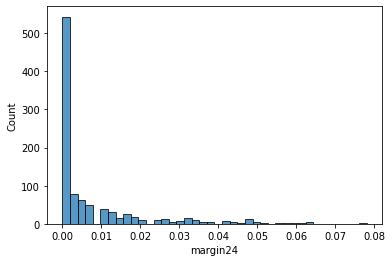

margin25
 Min: 0.0 Max: 0.082031 
 mean: 0.0088541101010101 std: 0.012724359545345712 
 median: 0.001953 
 mode: 0.0


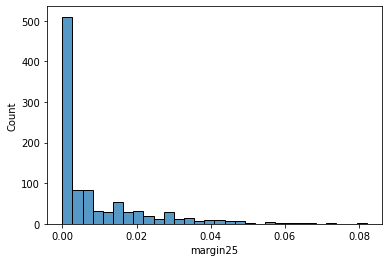

margin26
 Min: 0.0 Max: 0.085938 
 mean: 0.018718427272727278 std: 0.012313057790243177 
 median: 0.017578 
 mode: 0.011719


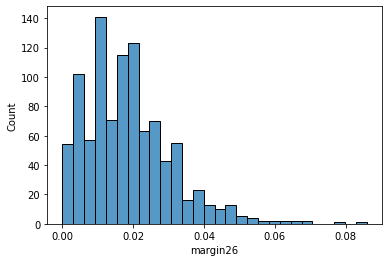

margin27
 Min: 0.0 Max: 0.082031 
 mean: 0.005628494949494949 std: 0.010856821977514442 
 median: 0.0 
 mode: 0.0


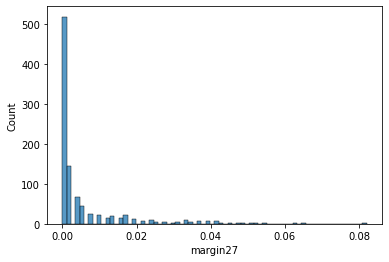

margin28
 Min: 0.0 Max: 0.080078 
 mean: 0.01553419696969697 std: 0.014100089595359303 
 median: 0.011719 
 mode: 0.001953


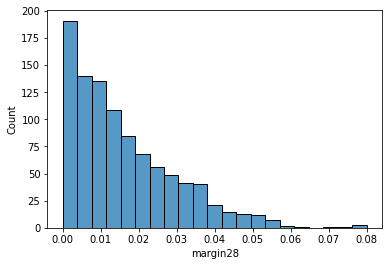

margin29
 Min: 0.0 Max: 0.14844 
 mean: 0.02826110101010101 std: 0.02285195222592137 
 median: 0.0244145 
 mode: 0.001953


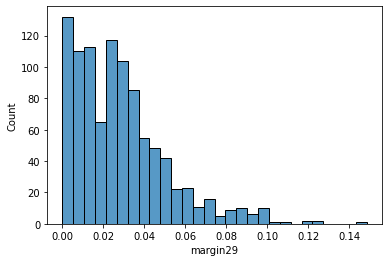

margin30
 Min: 0.0 Max: 0.11914 
 mean: 0.016500881818181816 std: 0.01656038252579267 
 median: 0.011719 
 mode: 0.003906


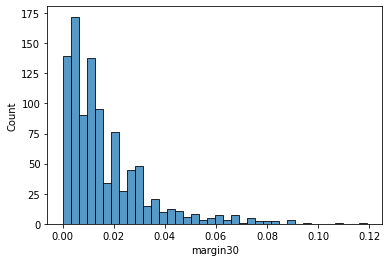

margin31
 Min: 0.0 Max: 0.11328 
 mean: 0.010842743434343435 std: 0.01656270589862539 
 median: 0.003906 
 mode: 0.0


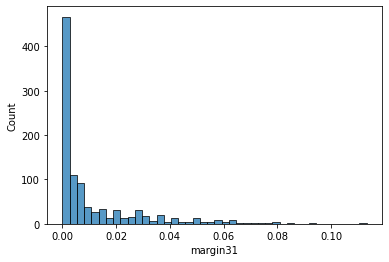

margin32
 Min: 0.0 Max: 0.12695 
 mean: 0.009690613131313131 std: 0.019290872449144705 
 median: 0.001953 
 mode: 0.0


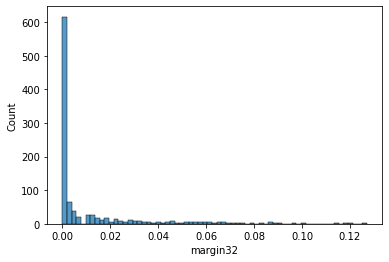

margin33
 Min: 0.0 Max: 0.078125 
 mean: 0.019501611111111112 std: 0.01600006448430123 
 median: 0.015625 
 mode: 0.003906


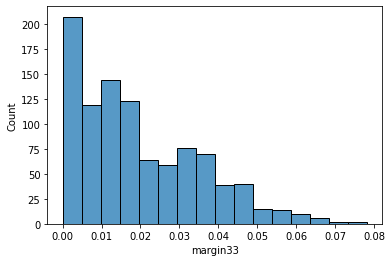

margin34
 Min: 0.0 Max: 0.015625 
 mean: 0.0010830333333333333 std: 0.00208812683435172 
 median: 0.0 
 mode: 0.0


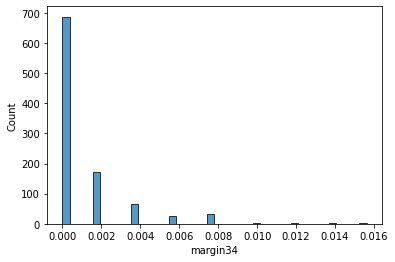

margin35
 Min: 0.0 Max: 0.082031 
 mean: 0.013166778787878789 std: 0.013217600276614148 
 median: 0.009766 
 mode: 0.0


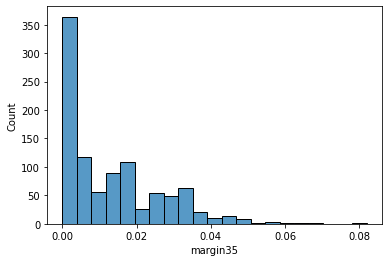

margin36
 Min: 0.0 Max: 0.089844 
 mean: 0.018041710101010102 std: 0.016463965795477715 
 median: 0.013672 
 mode: 0.0


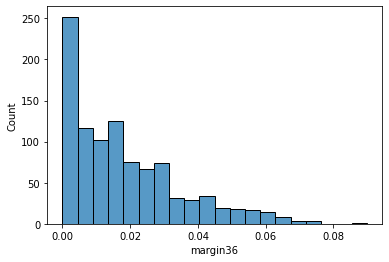

margin37
 Min: 0.0 Max: 0.068359 
 mean: 0.016268130303030304 std: 0.011483846314634769 
 median: 0.013672 
 mode: 0.009766


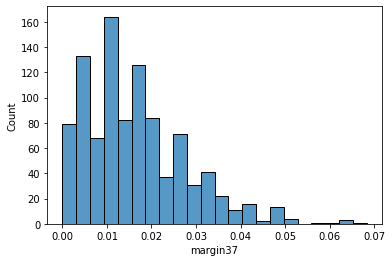

margin38
 Min: 0.0 Max: 0.14063 
 mean: 0.03106058888888889 std: 0.023270176625233053 
 median: 0.0283205 
 mode: 0.005859


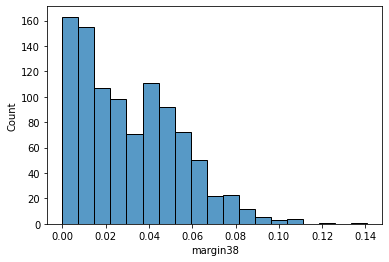

margin39
 Min: 0.0 Max: 0.0625 
 mean: 0.014845678787878788 std: 0.013241739401147474 
 median: 0.011719 
 mode: 0.0


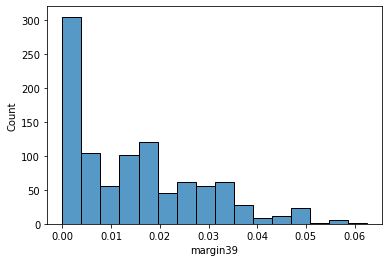

margin40
 Min: 0.0 Max: 0.0625 
 mean: 0.008163595959595961 std: 0.01019446766957996 
 median: 0.003906 
 mode: 0.0


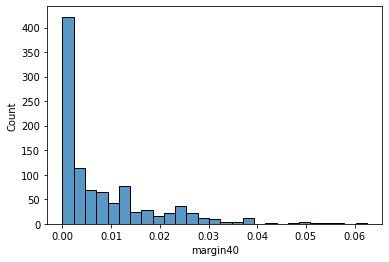

margin41
 Min: 0.0 Max: 0.20898 
 mean: 0.010884169696969696 std: 0.023445226185069116 
 median: 0.001953 
 mode: 0.0


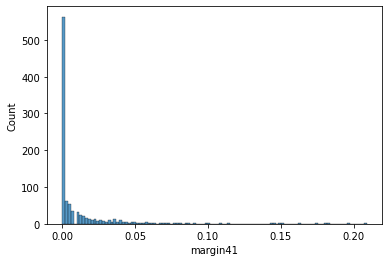

margin42
 Min: 0.0 Max: 0.091797 
 mean: 0.01749521919191919 std: 0.014471374275900702 
 median: 0.013672 
 mode: 0.001953


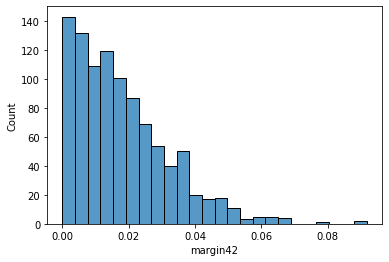

margin43
 Min: 0.0 Max: 0.11719 
 mean: 0.018858471717171716 std: 0.020935443864473855 
 median: 0.011719 
 mode: 0.0


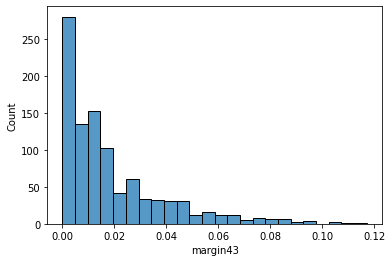

margin44
 Min: 0.0 Max: 0.064453 
 mean: 0.012679461616161616 std: 0.01168608643013649 
 median: 0.009766 
 mode: 0.001953


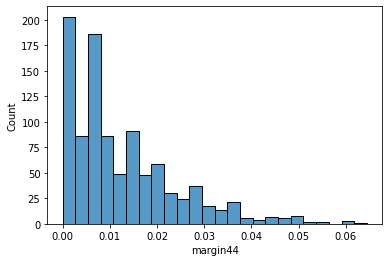

margin45
 Min: 0.0 Max: 0.17773 
 mean: 0.024688241414141412 std: 0.024317463310171955 
 median: 0.017578 
 mode: 0.005859


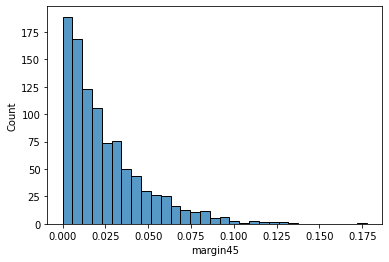

margin46
 Min: 0.0 Max: 0.089844 
 mean: 0.010057526262626263 std: 0.012889306587014359 
 median: 0.003906 
 mode: 0.0


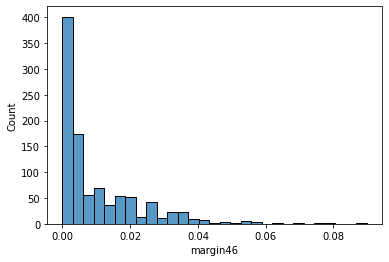

margin47
 Min: 0.0 Max: 0.10547 
 mean: 0.025319541414141417 std: 0.021454392189437628 
 median: 0.021484 
 mode: 0.0


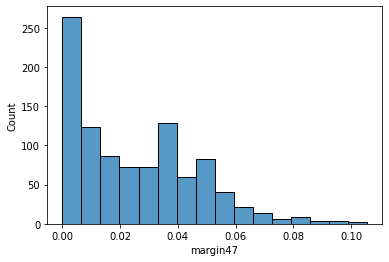

margin48
 Min: 0.0 Max: 0.14844 
 mean: 0.027002418181818182 std: 0.030128022252618403 
 median: 0.015625 
 mode: 0.0


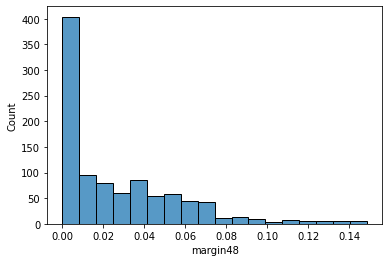

margin49
 Min: 0.0 Max: 0.10742 
 mean: 0.008560167676767675 std: 0.01597918721900921 
 median: 0.001953 
 mode: 0.0


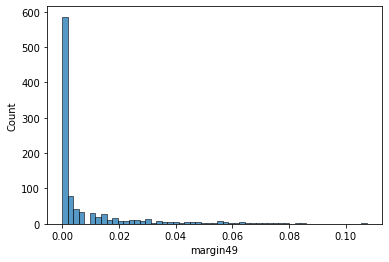

margin50
 Min: 0.0 Max: 0.080078 
 mean: 0.013981565656565657 std: 0.017611379637361646 
 median: 0.005859 
 mode: 0.0


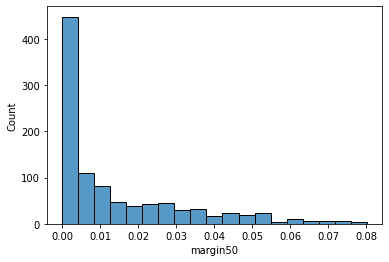

margin51
 Min: 0.0 Max: 0.13086 
 mean: 0.025656919191919193 std: 0.024887697665341227 
 median: 0.019531 
 mode: 0.0


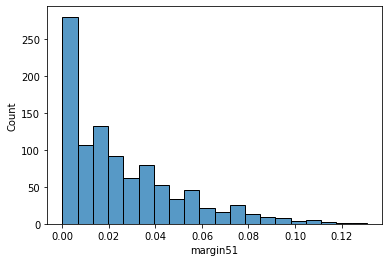

margin52
 Min: 0.0 Max: 0.083984 
 mean: 0.0027639101010101014 std: 0.007645900529233377 
 median: 0.0 
 mode: 0.0


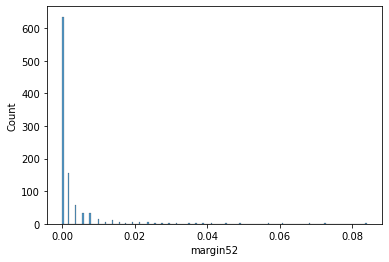

margin53
 Min: 0.0 Max: 0.085938 
 mean: 0.024001718181818184 std: 0.018211483155923795 
 median: 0.021484 
 mode: 0.011719


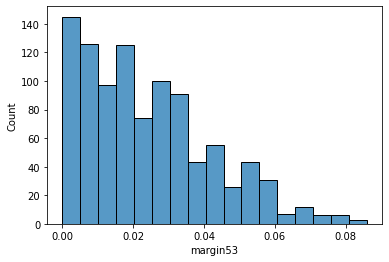

margin54
 Min: 0.0 Max: 0.12891 
 mean: 0.010002319191919191 std: 0.015545805037047264 
 median: 0.003906 
 mode: 0.0


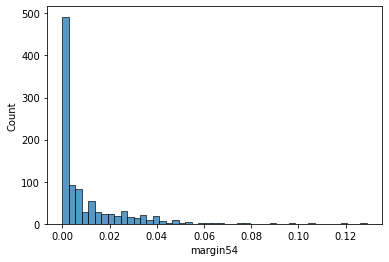

margin55
 Min: 0.0 Max: 0.14063 
 mean: 0.018191643434343437 std: 0.02183809612051818 
 median: 0.011719 
 mode: 0.0


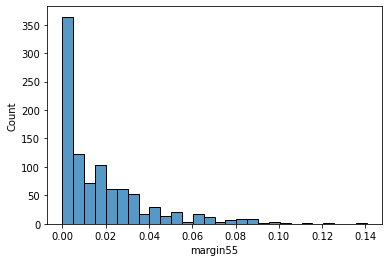

margin56
 Min: 0.0 Max: 0.054688 
 mean: 0.005959921212121213 std: 0.00883529632465394 
 median: 0.001953 
 mode: 0.0


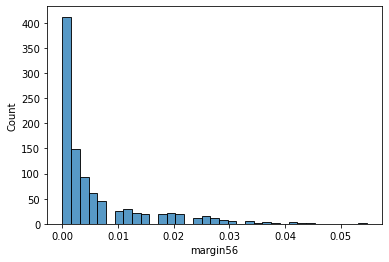

margin57
 Min: 0.0 Max: 0.0625 
 mean: 0.012559116161616164 std: 0.009851354969737868 
 median: 0.009766 
 mode: 0.007812


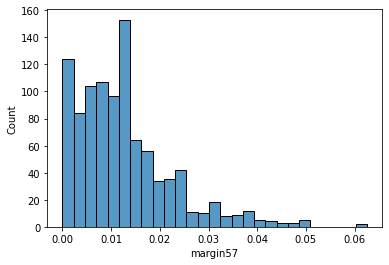

margin58
 Min: 0.0 Max: 0.11328 
 mean: 0.020190143434343433 std: 0.01884743012297102 
 median: 0.015625 
 mode: 0.001953


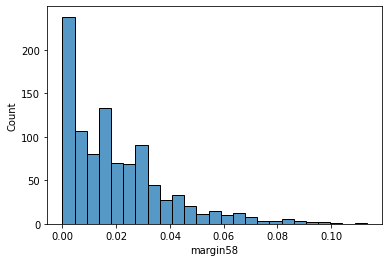

margin59
 Min: 0.0 Max: 0.22656 
 mean: 0.030950086868686867 std: 0.031911120072470114 
 median: 0.023438 
 mode: 0.017578


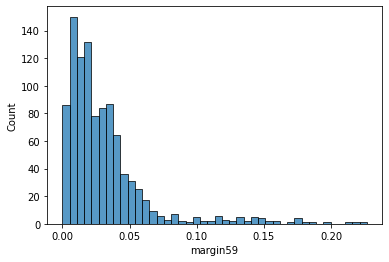

margin60
 Min: 0.0 Max: 0.089844 
 mean: 0.011850869696969697 std: 0.012466539004245688 
 median: 0.007812 
 mode: 0.0


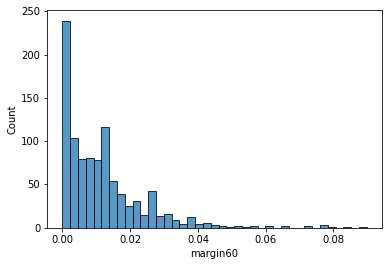

margin61
 Min: 0.0 Max: 0.011719 
 mean: 0.0013888060606060608 std: 0.0022930669063440583 
 median: 0.0 
 mode: 0.0


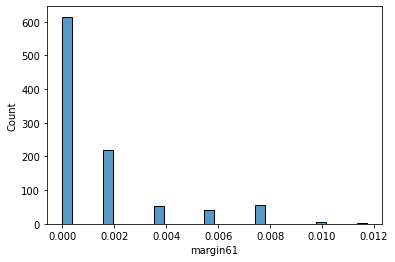

margin62
 Min: 0.0 Max: 0.076172 
 mean: 0.004983372727272728 std: 0.010346689273854234 
 median: 0.0 
 mode: 0.0


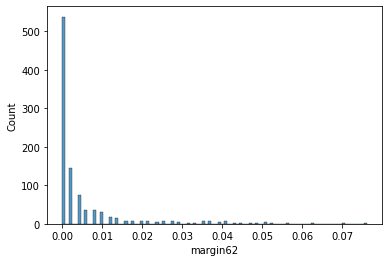

margin63
 Min: 0.0 Max: 0.125 
 mean: 0.025388619191919194 std: 0.019808663471043035 
 median: 0.021484 
 mode: 0.0


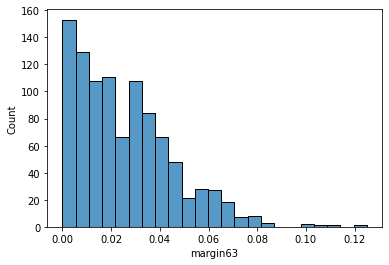

margin64
 Min: 0.0 Max: 0.089844 
 mean: 0.004373735353535354 std: 0.009251538630520589 
 median: 0.001953 
 mode: 0.0


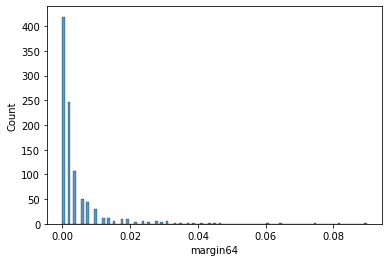

shape1
 Min: 0.00016798 Max: 0.0023897 
 mean: 0.0007393220505050505 std: 0.00027228207421879104 
 median: 0.000715945 
 mode: 0.0010156


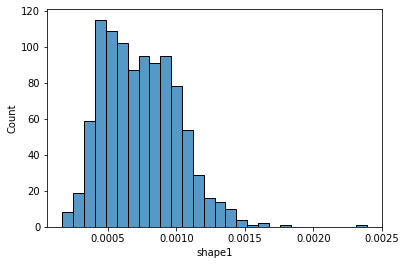

shape2
 Min: 0.0001961 Max: 0.0022466 
 mean: 0.0007182662323232323 std: 0.0002678430116981163 
 median: 0.00069132 
 mode: 0.0010192


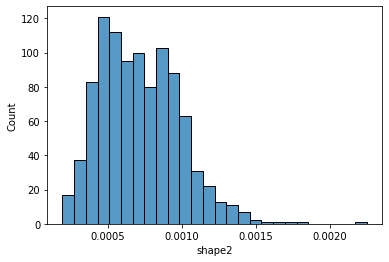

shape3
 Min: 0.00014818 Max: 0.0021123 
 mean: 0.0006936676565656566 std: 0.000259493402222738 
 median: 0.00067533 
 mode: 0.0005042


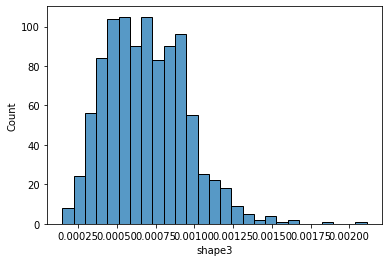

shape4
 Min: 0.00014534 Max: 0.0019977 
 mean: 0.0006707044444444444 std: 0.00025391341974069227 
 median: 0.000656445 
 mode: 0.00040021


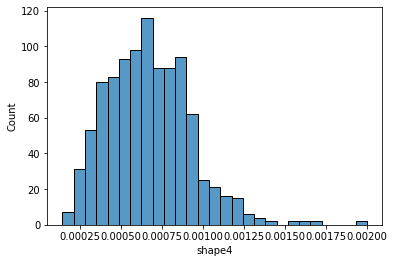

shape5
 Min: 0.00013935 Max: 0.002151 
 mean: 0.0006499233030303031 std: 0.0002514412827739555 
 median: 0.000639465 
 mode: 0.00028015


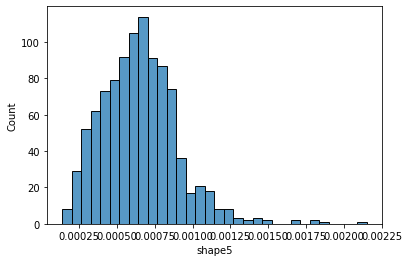

shape6
 Min: 0.00013628 Max: 0.0022666 
 mean: 0.0006321335353535354 std: 0.0002510209786934403 
 median: 0.000624255 
 mode: 0.00037438


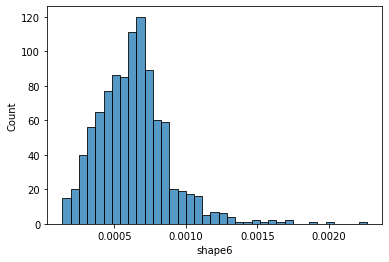

shape7
 Min: 9.2915e-05 Max: 0.0023055 
 mean: 0.0006173491161616161 std: 0.00025542301239893015 
 median: 0.000603935 
 mode: 0.00054891


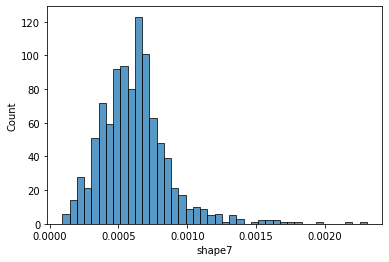

shape8
 Min: 7.9939e-05 Max: 0.0024393 
 mean: 0.0006037297616161616 std: 0.0002654504549942854 
 median: 0.0005846499999999999 
 mode: 0.00041592


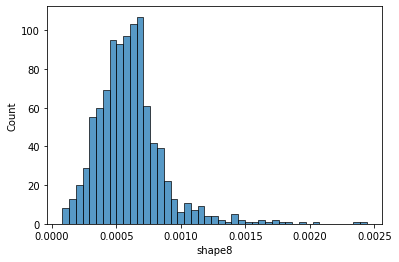

shape9
 Min: 8.7515e-05 Max: 0.0025214 
 mean: 0.0005902778535353535 std: 0.00027970830996045513 
 median: 0.000561575 
 mode: 0.00034593


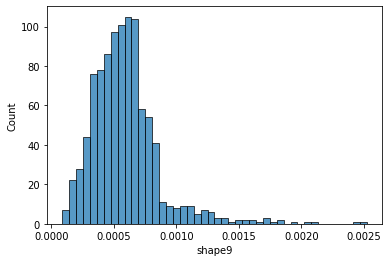

shape10
 Min: 0.00010884 Max: 0.0026874 
 mean: 0.0005781982222222222 std: 0.0002974546598049994 
 median: 0.0005322650000000001 
 mode: 0.00030874


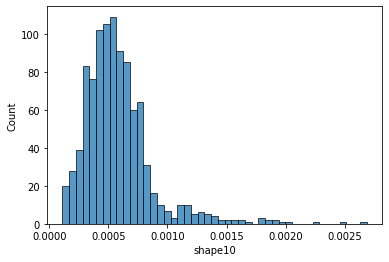

shape11
 Min: 7.5991e-05 Max: 0.0027738 
 mean: 0.0005692733313131312 std: 0.0003179332010273825 
 median: 0.00050314 
 mode: 0.0002868


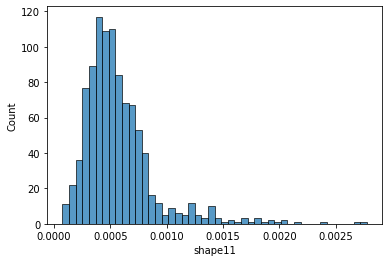

shape12
 Min: 0.00010633 Max: 0.0028893 
 mean: 0.0005617272525252525 std: 0.0003352980403494944 
 median: 0.000477355 
 mode: 0.00038909


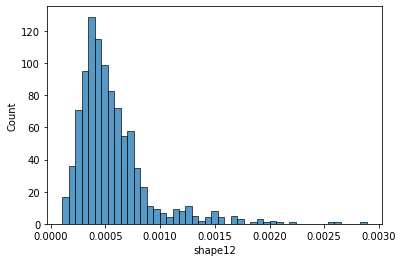

shape13
 Min: 8.0877e-05 Max: 0.0030067 
 mean: 0.0005557863404040404 std: 0.00035101098061001904 
 median: 0.000459855 
 mode: 0.00033294


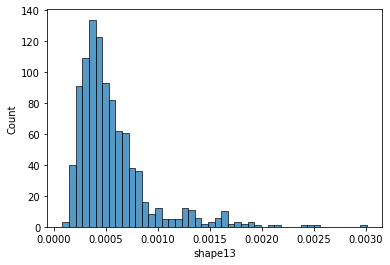

shape14
 Min: 9.6776e-05 Max: 0.0028154 
 mean: 0.0005510189595959596 std: 0.0003611998241754955 
 median: 0.00044631499999999997 
 mode: 0.00028295


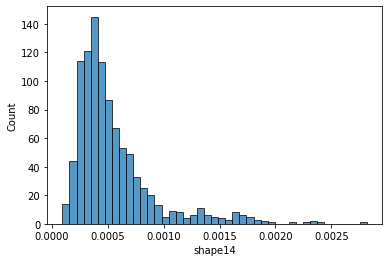

shape15
 Min: 0.00010189 Max: 0.0025914 
 mean: 0.0005458909898989899 std: 0.0003709904156385747 
 median: 0.00043374500000000003 
 mode: 0.00022965


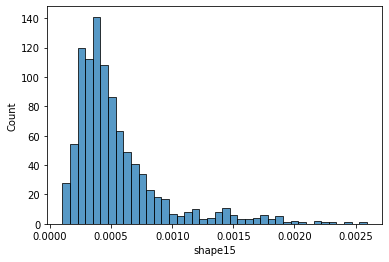

shape16
 Min: 7.3851e-05 Max: 0.0024734 
 mean: 0.0005430288333333334 std: 0.00037779127310311325 
 median: 0.00042528 
 mode: 0.00034514


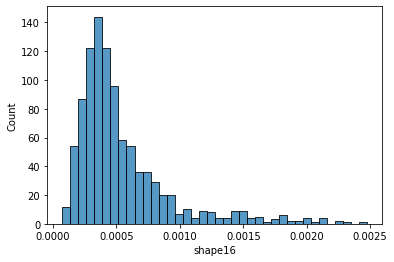

shape17
 Min: 6.2018e-05 Max: 0.0024099 
 mean: 0.0005424521555555555 std: 0.000381514788857455 
 median: 0.0004256 
 mode: 0.00027083


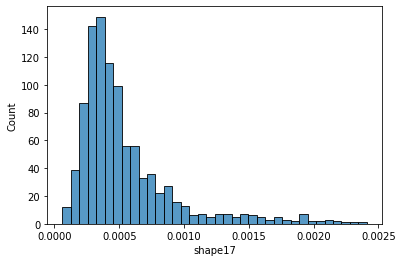

shape18
 Min: 4.4082e-05 Max: 0.0023396 
 mean: 0.0005423630383838385 std: 0.00037828447062649746 
 median: 0.00042676 
 mode: 0.00024263


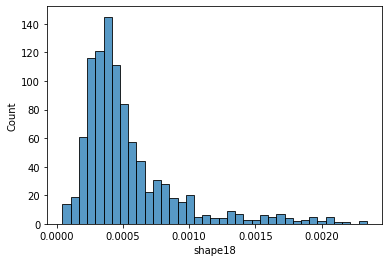

shape19
 Min: 4.7127e-05 Max: 0.0022159 
 mean: 0.000542343793939394 std: 0.0003682776128355789 
 median: 0.00043304 
 mode: 0.00020673


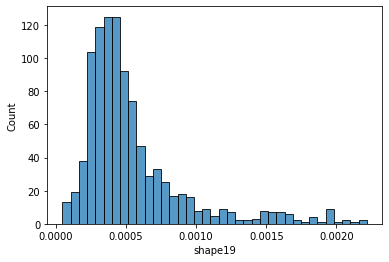

shape20
 Min: 6.1289e-05 Max: 0.0023002 
 mean: 0.000546403302020202 std: 0.00035654739456726143 
 median: 0.000447345 
 mode: 0.00024722


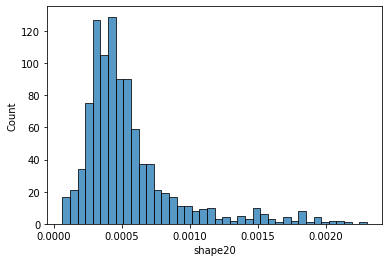

shape21
 Min: 5.6436e-05 Max: 0.0021903 
 mean: 0.0005540530777777778 std: 0.00034008585585839247 
 median: 0.000471745 
 mode: 0.00048964


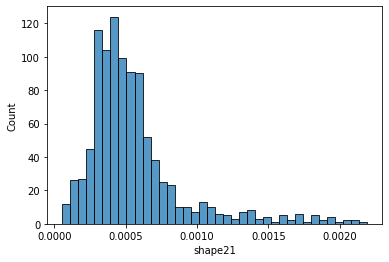

shape22
 Min: 6.4074e-05 Max: 0.0022369 
 mean: 0.000563309792929293 std: 0.00032221837583194427 
 median: 0.000495955 
 mode: 0.00032439


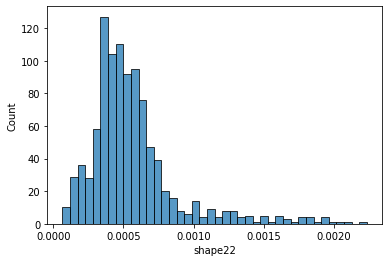

shape23
 Min: 4.6381e-05 Max: 0.0022134 
 mean: 0.000574788495959596 std: 0.00030474055753187615 
 median: 0.0005224349999999999 
 mode: 0.00041485


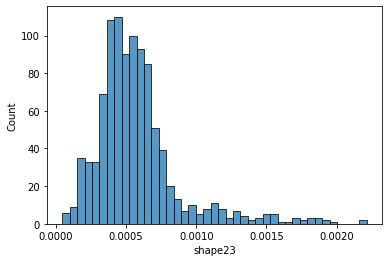

shape24
 Min: 8.4616e-05 Max: 0.002227 
 mean: 0.0005856235767676768 std: 0.000285797714797006 
 median: 0.000550555 
 mode: 0.00039444


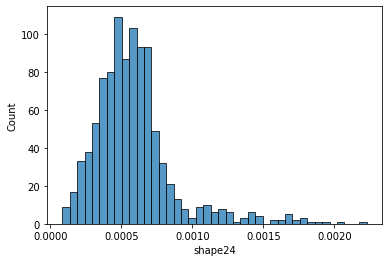

shape25
 Min: 5.9724e-05 Max: 0.0020909 
 mean: 0.0005987767757575758 std: 0.00026957811725279073 
 median: 0.0005739300000000001 
 mode: 0.00043551


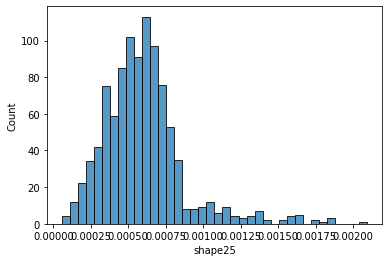

shape26
 Min: 3.117e-05 Max: 0.0019583 
 mean: 0.0006132153525252525 std: 0.00025558441991284603 
 median: 0.00059373 
 mode: 0.00050137


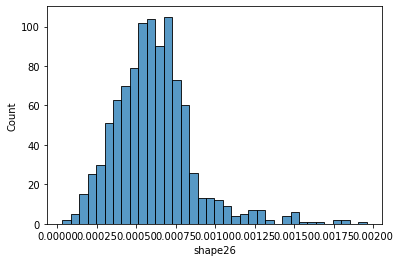

shape27
 Min: 8.7981e-05 Max: 0.0018436 
 mean: 0.0006277889404040404 std: 0.0002475607110384766 
 median: 0.000613855 
 mode: 0.00046573


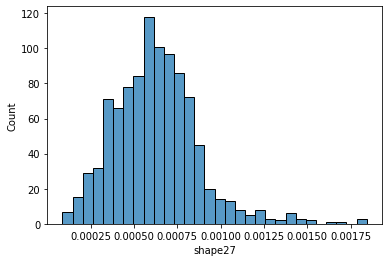

shape28
 Min: 8.6714e-05 Max: 0.0018102 
 mean: 0.0006441143373737373 std: 0.0002452071312623933 
 median: 0.0006382899999999999 
 mode: 0.00047386


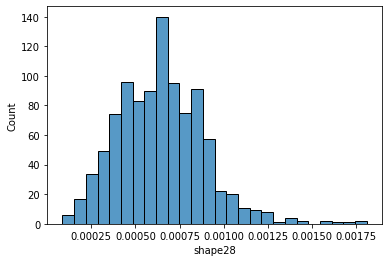

shape29
 Min: 7.0475e-05 Max: 0.0018241 
 mean: 0.000663084904040404 std: 0.000247119472399168 
 median: 0.0006632599999999999 
 mode: 0.0007003


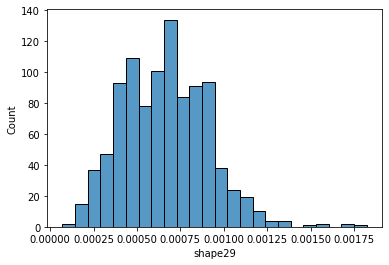

shape30
 Min: 7.8053e-05 Max: 0.0018548 
 mean: 0.0006867348212121211 std: 0.0002527690715616467 
 median: 0.000687195 
 mode: 0.00039315


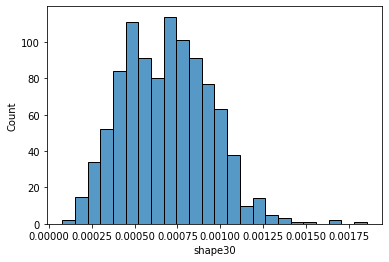

shape31
 Min: 6.7433e-05 Max: 0.0020024 
 mean: 0.0007111290636363636 std: 0.00026219500440921757 
 median: 0.0007035749999999999 
 mode: 0.0010587


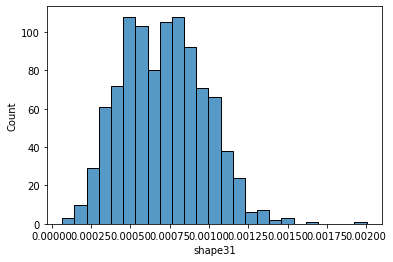

shape32
 Min: 5.3148e-05 Max: 0.0021237 
 mean: 0.0007335464777777777 std: 0.00027393051883331694 
 median: 0.000723275 
 mode: 0.00046362


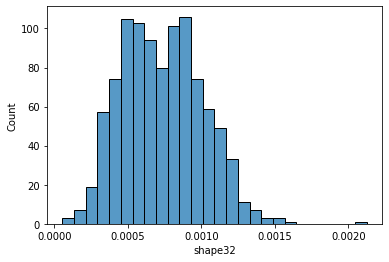

shape33
 Min: 0.0001061 Max: 0.0021106 
 mean: 0.000738735303030303 std: 0.0002772412972764518 
 median: 0.00073079 
 mode: 0.0010515


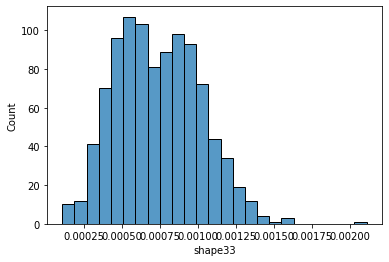

shape34
 Min: 5.456e-05 Max: 0.0019885 
 mean: 0.0007181366464646464 std: 0.00026673180022757944 
 median: 0.0007124449999999999 
 mode: 0.00036707


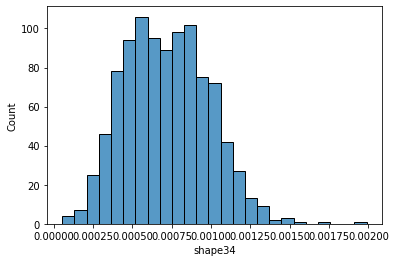

shape35
 Min: 3.3868e-05 Max: 0.0018675 
 mean: 0.0006901865131313131 std: 0.0002559177939321718 
 median: 0.00067708 
 mode: 0.00059344


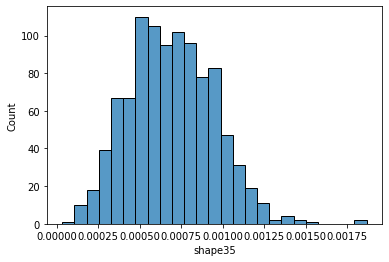

shape36
 Min: 6.9436e-05 Max: 0.0018863 
 mean: 0.0006646934232323232 std: 0.00024862146803181115 
 median: 0.000667455 
 mode: 0.00057112


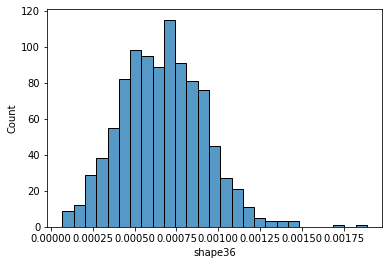

shape37
 Min: 6.6633e-05 Max: 0.0020113 
 mean: 0.0006416502060606061 std: 0.0002417073976355946 
 median: 0.00064397 
 mode: 0.00033229


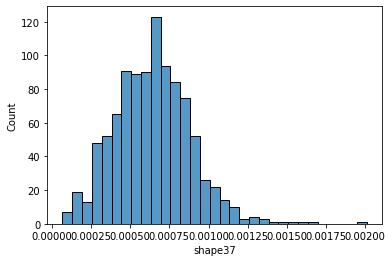

shape38
 Min: 6.4013e-05 Max: 0.0021067 
 mean: 0.000620646498989899 std: 0.00023952890034342945 
 median: 0.000621225 
 mode: 0.0003708


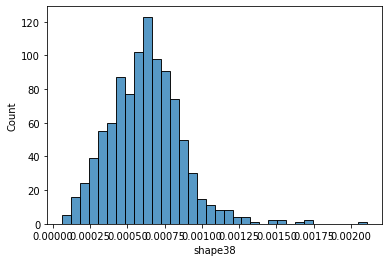

shape39
 Min: 6.2297e-05 Max: 0.0021057 
 mean: 0.0006021344141414141 std: 0.00024456017705072944 
 median: 0.0005970299999999999 
 mode: 0.00055099


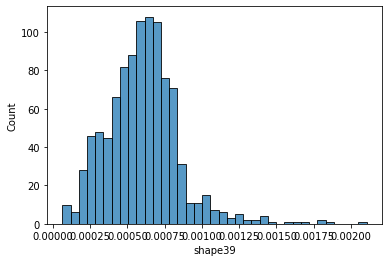

shape40
 Min: 6.8181e-05 Max: 0.002134 
 mean: 0.0005855655363636364 std: 0.0002546792808497221 
 median: 0.00057538 
 mode: 0.00021619


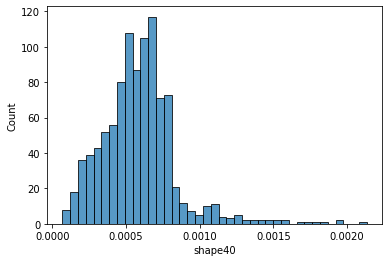

shape41
 Min: 8.6953e-05 Max: 0.0022295 
 mean: 0.0005722586191919192 std: 0.00027147372787730123 
 median: 0.00055579 
 mode: 0.00018273


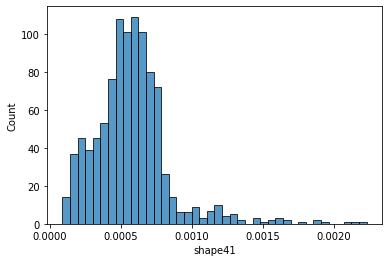

shape42
 Min: 5.1891e-05 Max: 0.0022848 
 mean: 0.0005620083 std: 0.00028912727638358645 
 median: 0.00053409 
 mode: 0.00042133


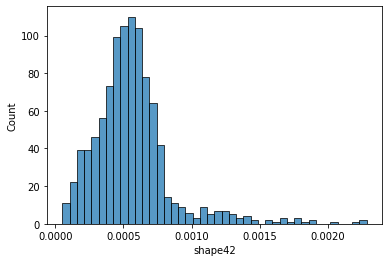

shape43
 Min: 5.6311e-05 Max: 0.002324 
 mean: 0.0005562767909090909 std: 0.00030513887567887175 
 median: 0.0005137 
 mode: 0.00035858


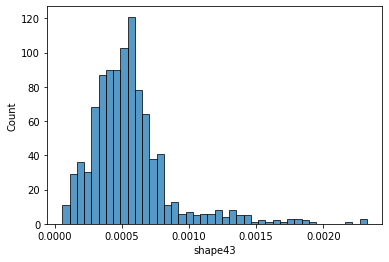

shape44
 Min: 3.5316e-05 Max: 0.0023481 
 mean: 0.0005510788393939394 std: 0.00032061099081989237 
 median: 0.00049011 
 mode: 0.00030346


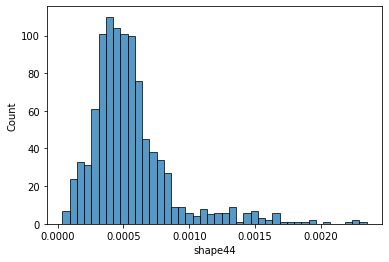

shape45
 Min: 4.828e-05 Max: 0.0024146 
 mean: 0.0005474770333333334 std: 0.00033371975221173345 
 median: 0.000463305 
 mode: 0.0003077


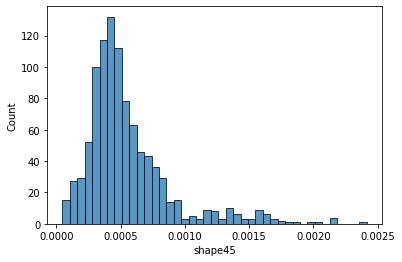

shape46
 Min: 5.5342e-05 Max: 0.0022898 
 mean: 0.0005452039898989899 std: 0.0003448859869215056 
 median: 0.000446815 
 mode: 0.00013307


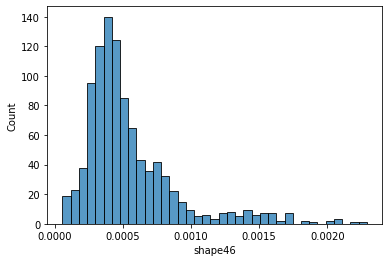

shape47
 Min: 4.3485e-05 Max: 0.0023418 
 mean: 0.000544825003030303 std: 0.0003522162055484578 
 median: 0.00044118 
 mode: 0.0010015


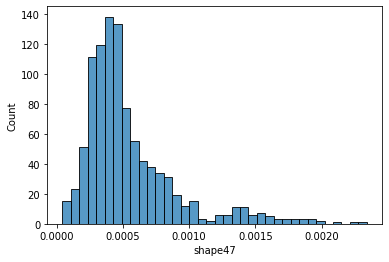

shape48
 Min: 5.1044e-05 Max: 0.0024577 
 mean: 0.0005447101434343435 std: 0.00035867484109719587 
 median: 0.00043725999999999997 
 mode: 0.00025809


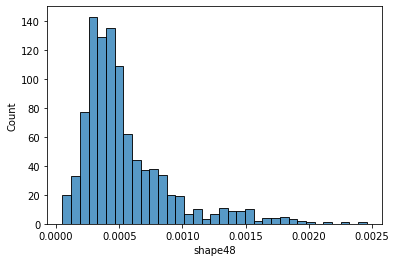

shape49
 Min: 2.1672e-05 Max: 0.0023152 
 mean: 0.000546683182828283 std: 0.0003612660066314791 
 median: 0.00044134999999999997 
 mode: 0.00017779


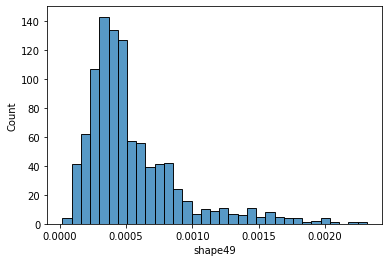

shape50
 Min: 6.2564e-05 Max: 0.002169 
 mean: 0.000547211686868687 std: 0.00035842689002212036 
 median: 0.00044251 
 mode: 0.00038471


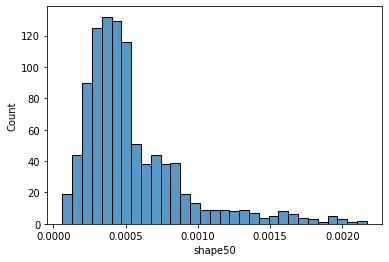

shape51
 Min: 0.00011517 Max: 0.0020331 
 mean: 0.0005463156767676769 std: 0.0003473862270602554 
 median: 0.000450045 
 mode: 0.00024006


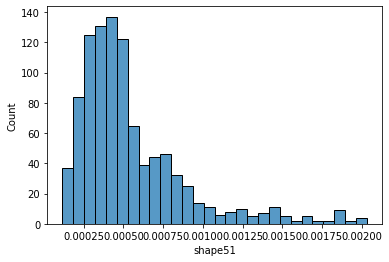

shape52
 Min: 0.00010743 Max: 0.0020411 
 mean: 0.0005473300505050505 std: 0.00033143504374727613 
 median: 0.000453765 
 mode: 0.00028749


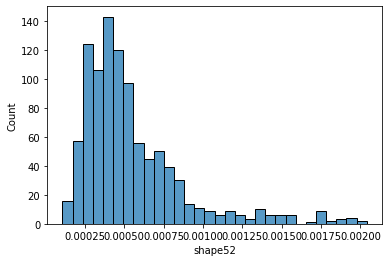

shape53
 Min: 9.0126e-05 Max: 0.0020058 
 mean: 0.0005513387434343435 std: 0.0003140804921164993 
 median: 0.000471585 
 mode: 0.00025944


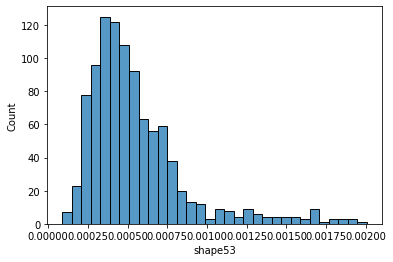

shape54
 Min: 0.0001143 Max: 0.002025 
 mean: 0.000555588606060606 std: 0.0002949164778702432 
 median: 0.0005004499999999999 
 mode: 0.00030922


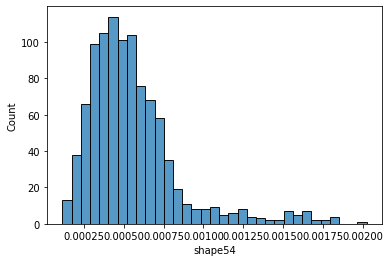

shape55
 Min: 0.00011065 Max: 0.0019925 
 mean: 0.000561953303030303 std: 0.0002784242548937568 
 median: 0.00052297 
 mode: 0.00034706


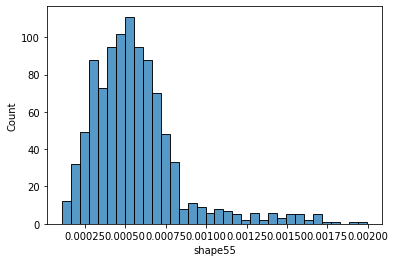

shape56
 Min: 9.5907e-05 Max: 0.0019412 
 mean: 0.0005694134515151515 std: 0.00026480346928278974 
 median: 0.000543515 
 mode: 0.00040548


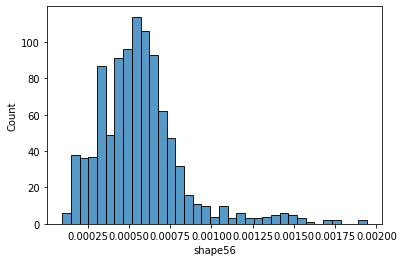

shape57
 Min: 7.6032e-05 Max: 0.0018919 
 mean: 0.000578184698989899 std: 0.0002535844445918815 
 median: 0.00056221 
 mode: 0.0003308


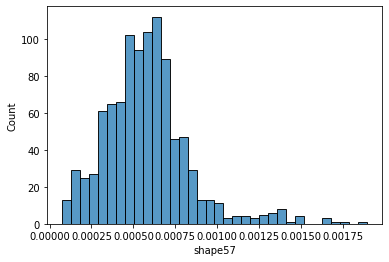

shape58
 Min: 5.9775e-05 Max: 0.0018608 
 mean: 0.0005911945252525254 std: 0.00024805598141514144 
 median: 0.0005875450000000001 
 mode: 0.00047982


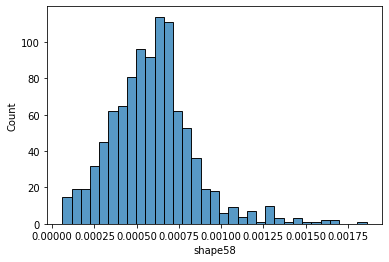

shape59
 Min: 6.3038e-05 Max: 0.0017404 
 mean: 0.0006070943363636364 std: 0.0002449985266744561 
 median: 0.0006079799999999999 
 mode: 0.00053761


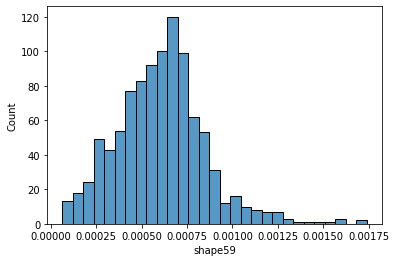

shape60
 Min: 4.1625e-05 Max: 0.0017603 
 mean: 0.000626418398989899 std: 0.0002461924570148084 
 median: 0.000632385 
 mode: 0.00017413


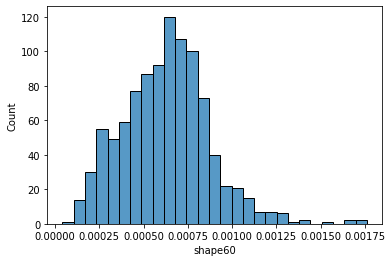

shape61
 Min: 8.6756e-05 Max: 0.0019217 
 mean: 0.0006481016929292928 std: 0.00024816766972383085 
 median: 0.000650385 
 mode: 0.00037437


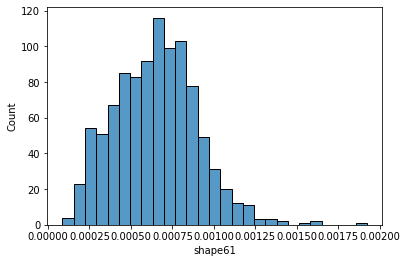

shape62
 Min: 0.00013396 Max: 0.0020901 
 mean: 0.0006745957373737373 std: 0.0002520609726556432 
 median: 0.000674155 
 mode: 0.00066493


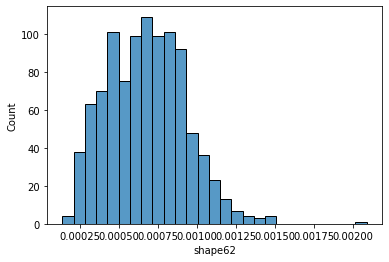

shape63
 Min: 0.00016846 Max: 0.0022627 
 mean: 0.0007038367878787879 std: 0.00025876295711580106 
 median: 0.000692845 
 mode: 0.0003985


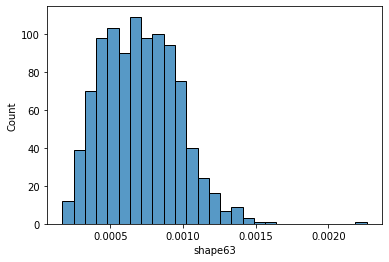

shape64
 Min: 0.0001659 Max: 0.0024313 
 mean: 0.0007322956969696969 std: 0.0002683402925860105 
 median: 0.00071125 
 mode: 0.00042579


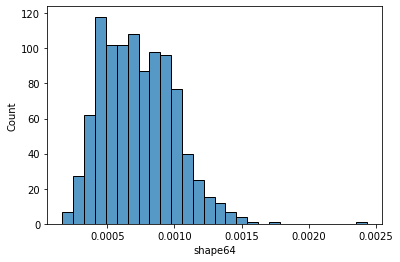

texture1
 Min: 0.0 Max: 0.41309 
 mean: 0.021944082828282828 std: 0.044042786147394035 
 median: 0.006836 
 mode: 0.0


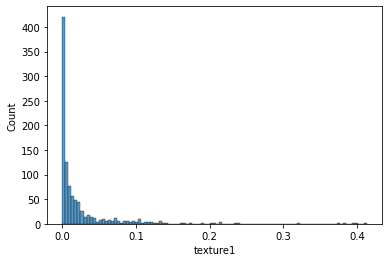

texture2
 Min: 0.0 Max: 0.11816 
 mean: 0.01168819191919192 std: 0.017103471288271613 
 median: 0.004883 
 mode: 0.0


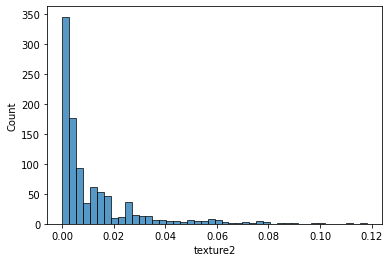

texture3
 Min: 0.0 Max: 0.078125 
 mean: 0.010314089898989898 std: 0.012937361325702728 
 median: 0.005859 
 mode: 0.0


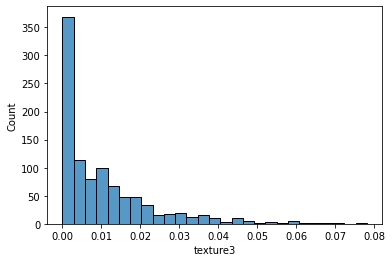

texture4
 Min: 0.0 Max: 0.16113 
 mean: 0.015390266666666666 std: 0.022029505568833815 
 median: 0.005859 
 mode: 0.0


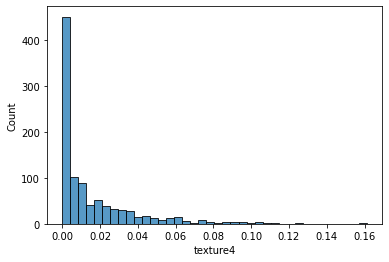

texture5
 Min: 0.0 Max: 0.20117 
 mean: 0.02694037373737374 std: 0.03803277009320124 
 median: 0.005859 
 mode: 0.0


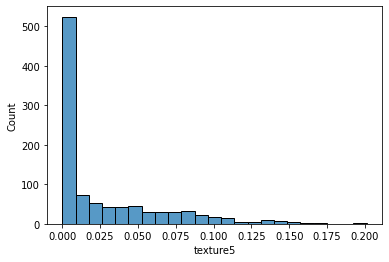

texture6
 Min: 0.0 Max: 0.14648 
 mean: 0.009880055555555557 std: 0.020438560544579043 
 median: 0.000977 
 mode: 0.0


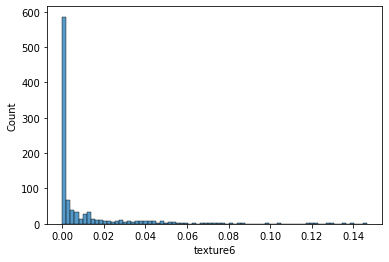

texture7
 Min: 0.0 Max: 0.16309 
 mean: 0.016712074747474746 std: 0.021361717223163854 
 median: 0.009766 
 mode: 0.0


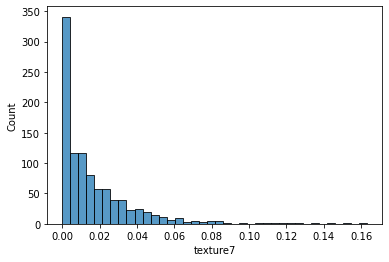

texture8
 Min: 0.0 Max: 0.13574 
 mean: 0.019561834343434344 std: 0.02471501392484312 
 median: 0.009766 
 mode: 0.0


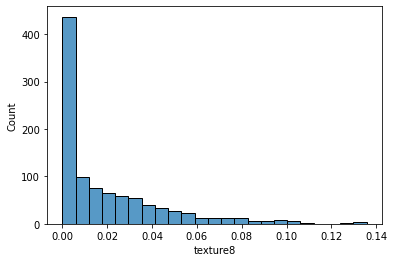

texture9
 Min: 0.0 Max: 0.19629 
 mean: 0.014921684848484848 std: 0.02251098862523395 
 median: 0.006836 
 mode: 0.0


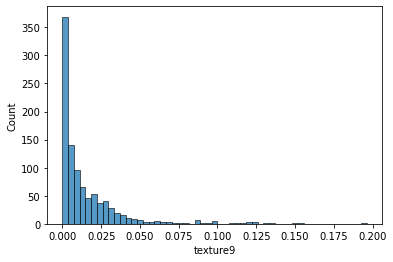

texture10
 Min: 0.0 Max: 0.29297 
 mean: 0.019961389898989896 std: 0.03743522869441205 
 median: 0.003906 
 mode: 0.0


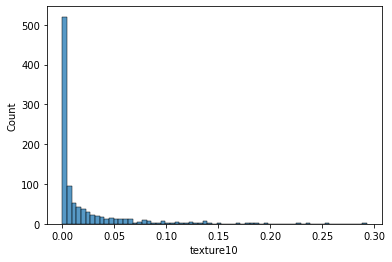

texture11
 Min: 0.0 Max: 0.28516 
 mean: 0.01879638888888889 std: 0.03341069277594726 
 median: 0.00293 
 mode: 0.0


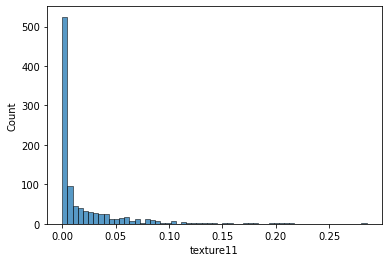

texture12
 Min: 0.0 Max: 0.50781 
 mean: 0.026540784848484846 std: 0.07250628042242145 
 median: 0.0 
 mode: 0.0


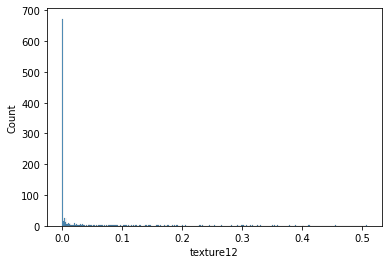

texture13
 Min: 0.0 Max: 0.11035 
 mean: 0.009813972727272727 std: 0.014276374092102584 
 median: 0.004883 
 mode: 0.0


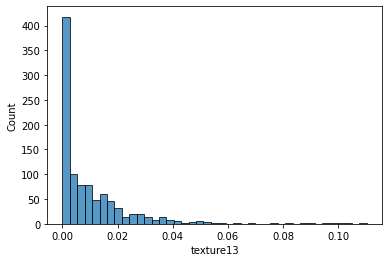

texture14
 Min: 0.0 Max: 0.18457 
 mean: 0.012795922222222223 std: 0.018220908678848135 
 median: 0.006836 
 mode: 0.0


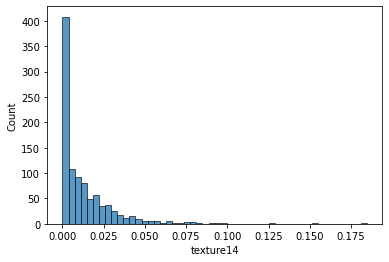

texture15
 Min: 0.0 Max: 0.85352 
 mean: 0.012030486868686869 std: 0.06388058479189296 
 median: 0.0 
 mode: 0.0


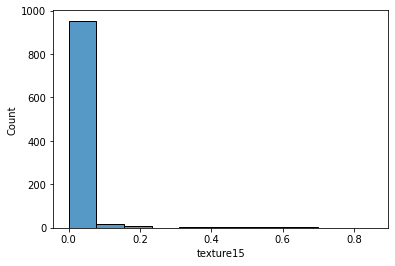

texture16
 Min: 0.0 Max: 0.11133 
 mean: 0.004544474747474748 std: 0.011537997892087022 
 median: 0.0 
 mode: 0.0


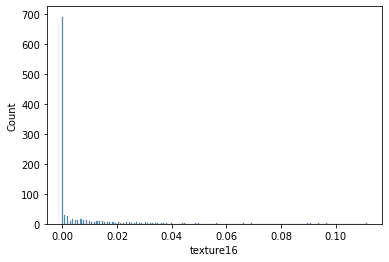

texture17
 Min: 0.0 Max: 0.19629 
 mean: 0.015098330303030304 std: 0.02645202697925844 
 median: 0.003906 
 mode: 0.0


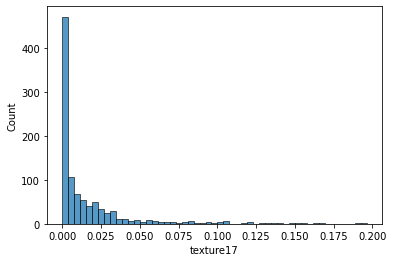

texture18
 Min: 0.0 Max: 0.11231 
 mean: 0.006175063636363637 std: 0.013688476003163093 
 median: 0.000977 
 mode: 0.0


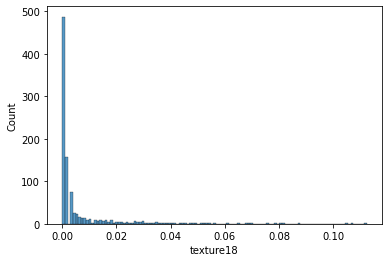

texture19
 Min: 0.0 Max: 0.30078 
 mean: 0.02445847070707071 std: 0.03238715789182591 
 median: 0.013672 
 mode: 0.0


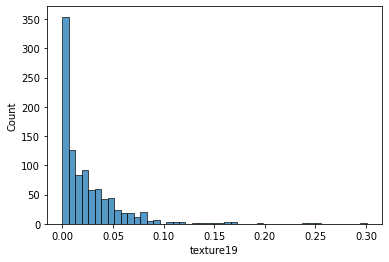

texture20
 Min: 0.0 Max: 0.099609 
 mean: 0.014515254545454544 std: 0.016404630446332606 
 median: 0.008789 
 mode: 0.0


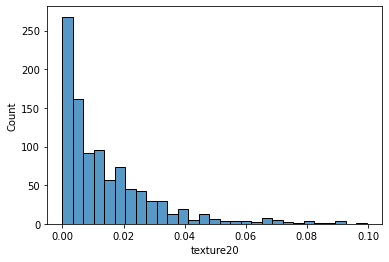

texture21
 Min: 0.0 Max: 0.097656 
 mean: 0.0028557060606060605 std: 0.010051408260320324 
 median: 0.0 
 mode: 0.0


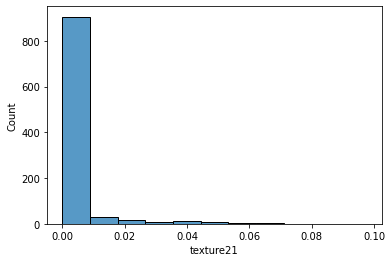

texture22
 Min: 0.0 Max: 0.17773 
 mean: 0.013170793939393941 std: 0.02162088014519168 
 median: 0.00293 
 mode: 0.0


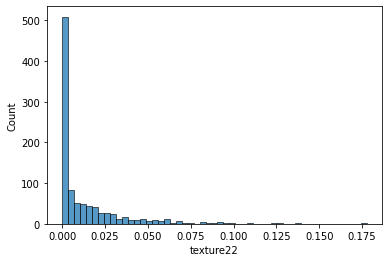

texture23
 Min: 0.0 Max: 0.19531 
 mean: 0.017050381818181817 std: 0.02397438956699172 
 median: 0.007812 
 mode: 0.0


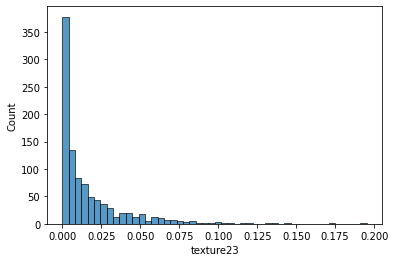

texture24
 Min: 0.0 Max: 0.13477 
 mean: 0.01016319898989899 std: 0.017872591178323904 
 median: 0.001953 
 mode: 0.0


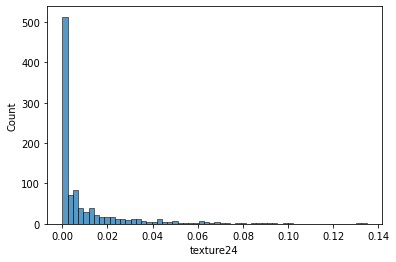

texture25
 Min: 0.0 Max: 0.15332 
 mean: 0.01043738686868687 std: 0.016252186730890163 
 median: 0.003906 
 mode: 0.0


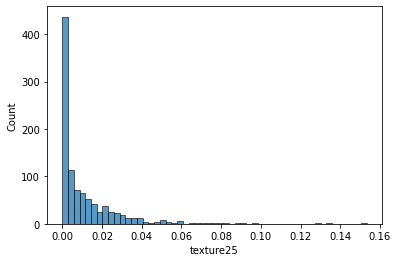

texture26
 Min: 0.0 Max: 0.30273 
 mean: 0.023273781818181818 std: 0.0417597089275745 
 median: 0.004883 
 mode: 0.0


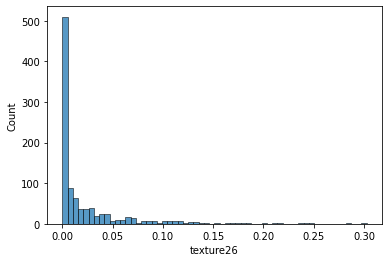

texture27
 Min: 0.0 Max: 0.22754 
 mean: 0.0203174898989899 std: 0.03153228398123428 
 median: 0.005859 
 mode: 0.0


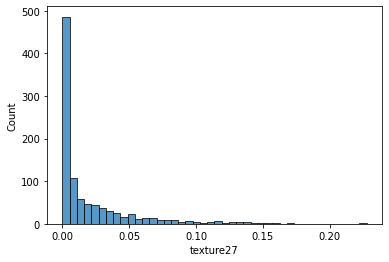

texture28
 Min: 0.0 Max: 0.12012 
 mean: 0.010097077777777777 std: 0.018187776634292028 
 median: 0.001953 
 mode: 0.0


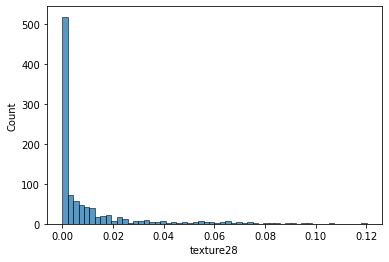

texture29
 Min: 0.0 Max: 0.21484 
 mean: 0.0217221 std: 0.02674871714061168 
 median: 0.012695 
 mode: 0.0


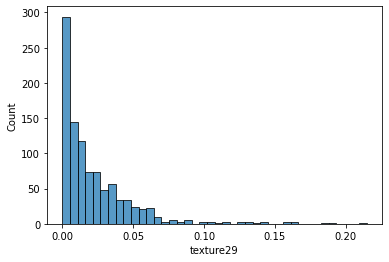

texture30
 Min: 0.0 Max: 0.085938 
 mean: 0.011675367676767677 std: 0.012933291358082412 
 median: 0.007812 
 mode: 0.0


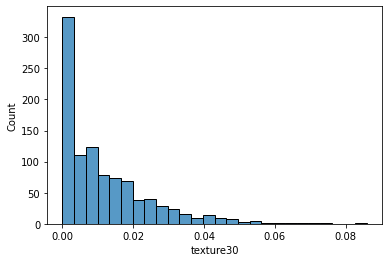

texture31
 Min: 0.0 Max: 0.22461 
 mean: 0.023895223232323234 std: 0.027224829747386516 
 median: 0.015625 
 mode: 0.0


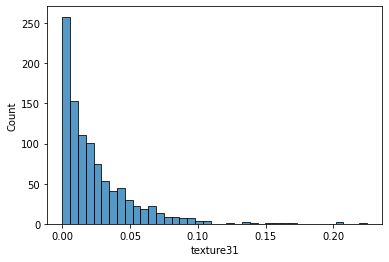

texture32
 Min: 0.0 Max: 0.12598 
 mean: 0.006047790909090909 std: 0.015113739256289166 
 median: 0.0 
 mode: 0.0


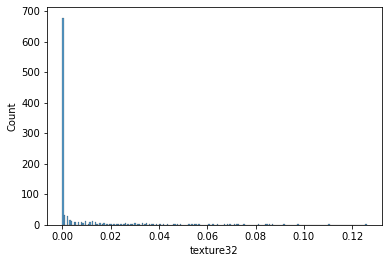

texture33
 Min: 0.0 Max: 0.43066 
 mean: 0.02324321111111111 std: 0.058630034086151216 
 median: 0.0 
 mode: 0.0


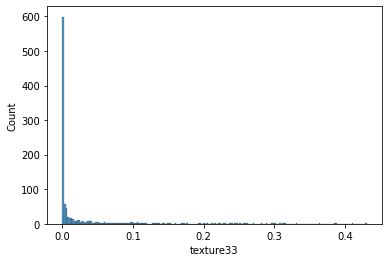

texture34
 Min: 0.0 Max: 0.35352 
 mean: 0.026518163636363636 std: 0.04226562219506997 
 median: 0.010742 
 mode: 0.0


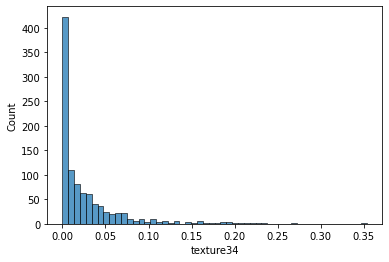

texture35
 Min: 0.0 Max: 0.077148 
 mean: 0.010514326262626264 std: 0.011852156840981844 
 median: 0.006836 
 mode: 0.0


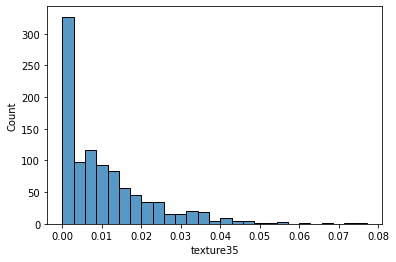

texture36
 Min: 0.0 Max: 0.10742 
 mean: 0.0033213030303030303 std: 0.01274049619232247 
 median: 0.0 
 mode: 0.0


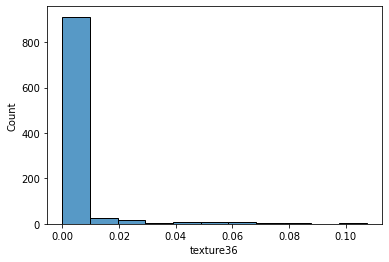

texture37
 Min: 0.0 Max: 0.55664 
 mean: 0.02112340909090909 std: 0.058368311181473016 
 median: 0.0 
 mode: 0.0


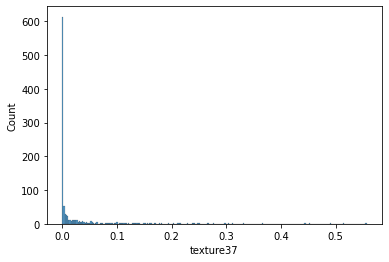

texture38
 Min: 0.0 Max: 0.21777 
 mean: 0.023964261616161615 std: 0.027909448133518054 
 median: 0.015625 
 mode: 0.0


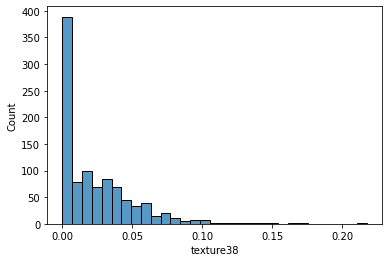

texture39
 Min: 0.0 Max: 0.14746 
 mean: 0.017060263636363638 std: 0.021795829440634937 
 median: 0.008789 
 mode: 0.0


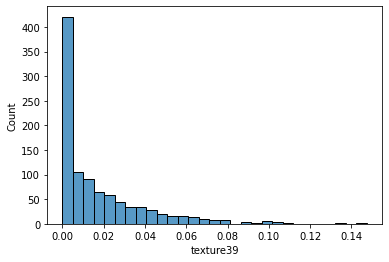

texture40
 Min: 0.0 Max: 0.16602 
 mean: 0.019187013131313133 std: 0.025500107761481088 
 median: 0.009766 
 mode: 0.0


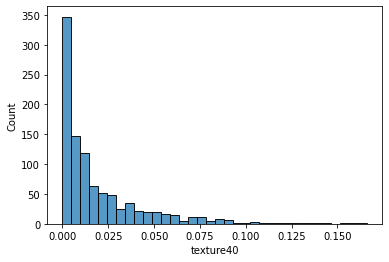

texture41
 Min: 0.0 Max: 0.41113 
 mean: 0.015579643434343437 std: 0.041011904862467204 
 median: 0.0 
 mode: 0.0


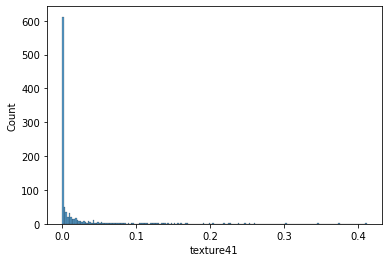

texture42
 Min: 0.0 Max: 0.071289 
 mean: 0.0058949161616161615 std: 0.010653189298162724 
 median: 0.000977 
 mode: 0.0


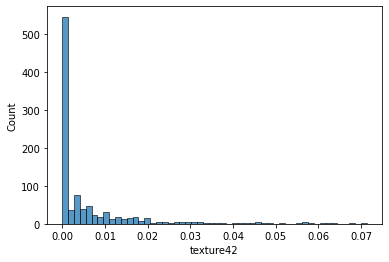

texture43
 Min: 0.0 Max: 0.17676 
 mean: 0.013875091919191918 std: 0.018022222706221183 
 median: 0.007812 
 mode: 0.0


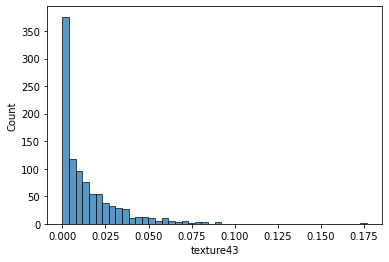

texture44
 Min: 0.0 Max: 0.41211 
 mean: 0.025263358585858587 std: 0.04643673772579703 
 median: 0.004883 
 mode: 0.0


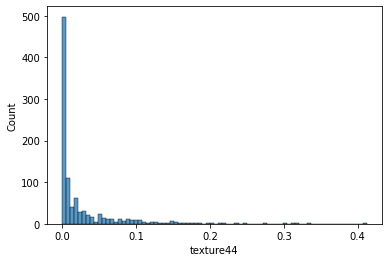

texture45
 Min: 0.0 Max: 0.13574 
 mean: 0.016226739393939395 std: 0.021086882716620615 
 median: 0.007812 
 mode: 0.0


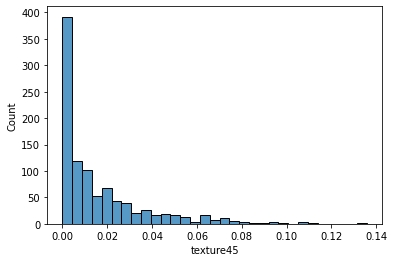

texture46
 Min: 0.0 Max: 0.17578 
 mean: 0.02175959595959596 std: 0.026323587238799528 
 median: 0.011719 
 mode: 0.0


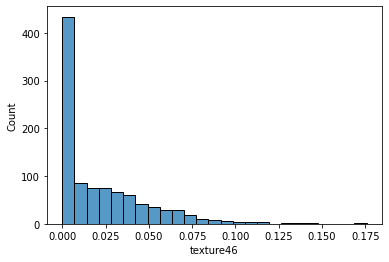

texture47
 Min: 0.0 Max: 0.098633 
 mean: 0.018595148484848483 std: 0.01600664969196069 
 median: 0.015625 
 mode: 0.0


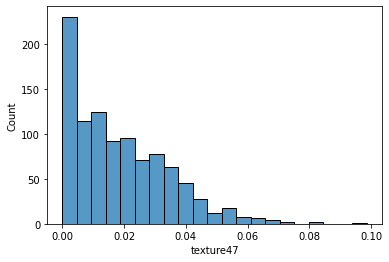

texture48
 Min: 0.0 Max: 0.24902 
 mean: 0.016763365656565655 std: 0.02984117228993604 
 median: 0.000977 
 mode: 0.0


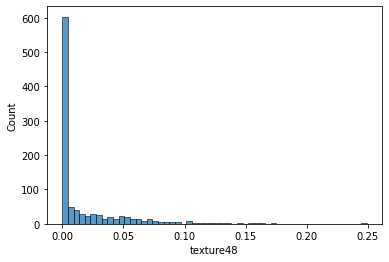

texture49
 Min: 0.0 Max: 0.10742 
 mean: 0.011680293939393939 std: 0.01316309230080755 
 median: 0.007812 
 mode: 0.0


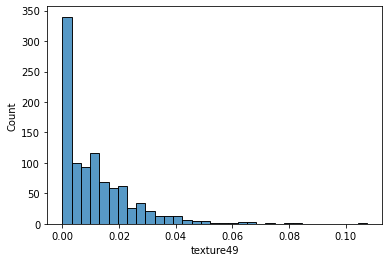

texture50
 Min: 0.0 Max: 0.2168 
 mean: 0.018985764646464644 std: 0.027361448187259895 
 median: 0.009766 
 mode: 0.0


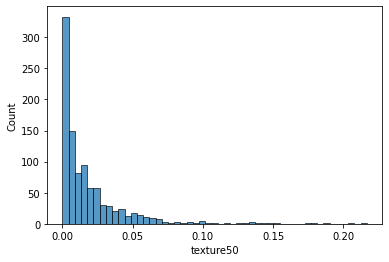

texture51
 Min: 0.0 Max: 0.39063 
 mean: 0.013239848484848485 std: 0.0334017667434629 
 median: 0.0 
 mode: 0.0


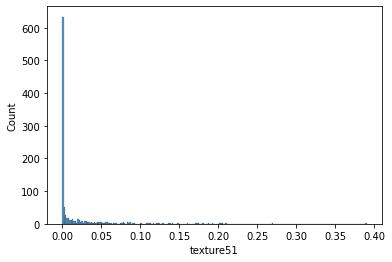

texture52
 Min: 0.0 Max: 0.11719 
 mean: 0.0072887181818181825 std: 0.013862070094496156 
 median: 0.0 
 mode: 0.0


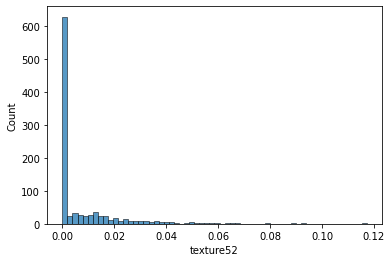

texture53
 Min: 0.0 Max: 0.16504 
 mean: 0.014468926262626263 std: 0.02165404562138728 
 median: 0.004883 
 mode: 0.0


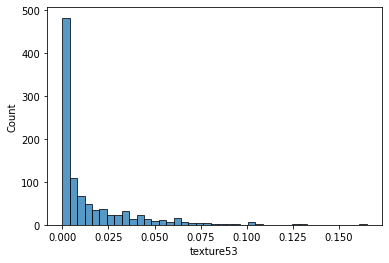

texture54
 Min: 0.0 Max: 0.27344 
 mean: 0.022091052525252525 std: 0.027335452466870244 
 median: 0.012695 
 mode: 0.0


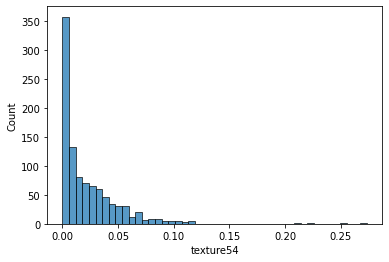

texture55
 Min: 0.0 Max: 0.42969 
 mean: 0.03650082828282829 std: 0.06340332739233345 
 median: 0.004883 
 mode: 0.0


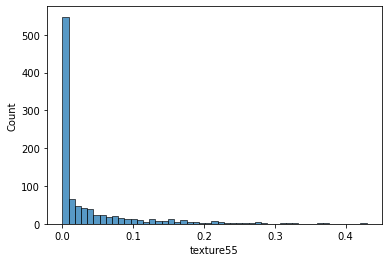

texture56
 Min: 0.0 Max: 0.20215 
 mean: 0.005023871717171717 std: 0.01932126641609831 
 median: 0.0 
 mode: 0.0


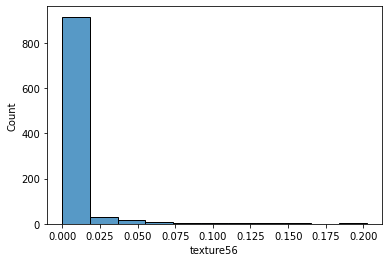

texture57
 Min: 0.0 Max: 0.17285 
 mean: 0.015943645454545456 std: 0.02321425284046214 
 median: 0.005859 
 mode: 0.0


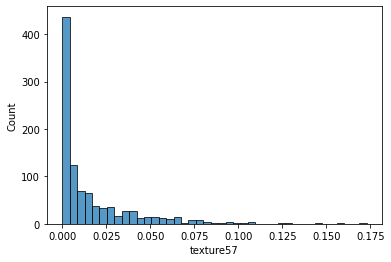

texture58
 Min: 0.0 Max: 0.2002 
 mean: 0.011585614141414142 std: 0.0250398423411928 
 median: 0.000977 
 mode: 0.0


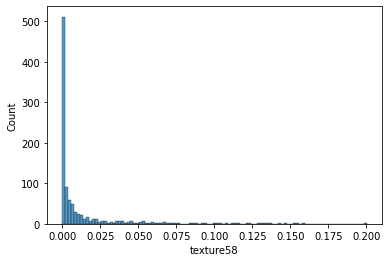

texture59
 Min: 0.0 Max: 0.10645 
 mean: 0.016108361616161616 std: 0.015334727435836174 
 median: 0.012695 
 mode: 0.0


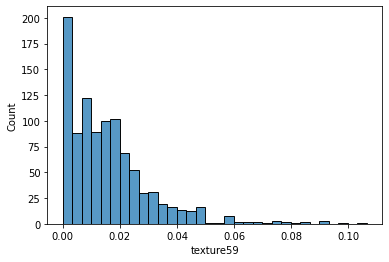

texture60
 Min: 0.0 Max: 0.57813 
 mean: 0.014017144444444444 std: 0.06015081349758268 
 median: 0.0 
 mode: 0.0


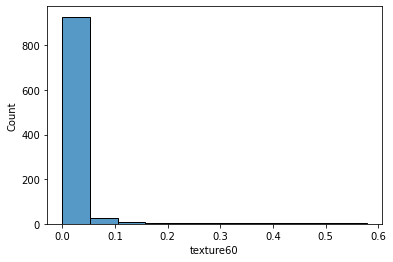

texture61
 Min: 0.0 Max: 0.15137 
 mean: 0.002688022222222222 std: 0.011414551649382985 
 median: 0.0 
 mode: 0.0


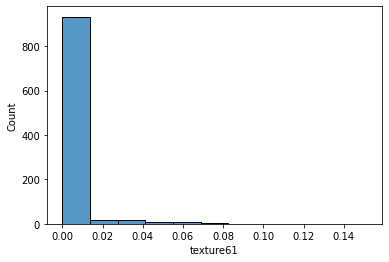

texture62
 Min: 0.0 Max: 0.37598 
 mean: 0.0202908797979798 std: 0.03903970981018421 
 median: 0.003906 
 mode: 0.0


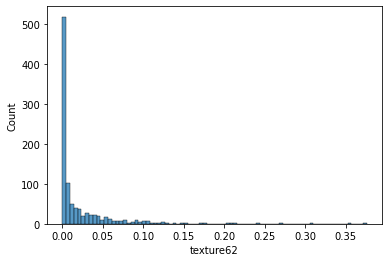

texture63
 Min: 0.0 Max: 0.086914 
 mean: 0.00898930707070707 std: 0.013791222312846546 
 median: 0.00293 
 mode: 0.0


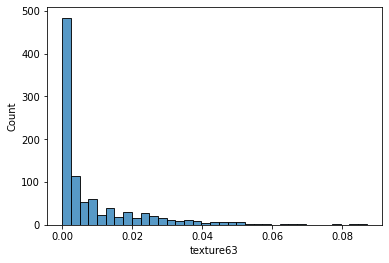

texture64
 Min: 0.0 Max: 0.1416 
 mean: 0.019419843434343435 std: 0.022767688099588283 
 median: 0.011719 
 mode: 0.0


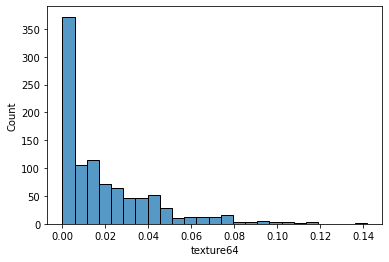

In [18]:
# All features contains outliers which makes our model overfit
outliers = columns.copy()
outliers = outliers.drop('id')
outliers = outliers.drop('species')
for col in outliers:
    print(col)
    print(' Min:', df[col].min(), 'Max:', df[col].max(), '\n mean:', df[col].mean(), 'std:', df[col].std(),'\n', 'median:', df[col].median(), '\n', 'mode:', df[col].mode()[0])
    sns.histplot(df[col])
    plt.show()

**Notes:**

No features have -ve values so we can make mathmatical transformation using log - sqrt - 1/x.

I use log1p as it's good for right/left skewed data

* margin: right-skewed (mean > median > mode)

* shape: normaly distrbuted but i will use log too 

* Texture: right-skewed (mean > median > mode)

margin1


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


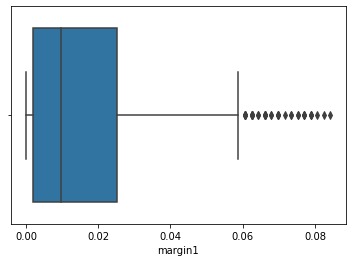

margin2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


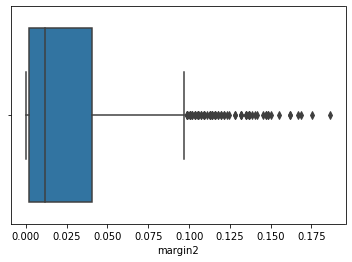

margin3


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


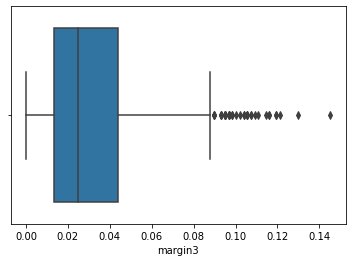

margin4


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


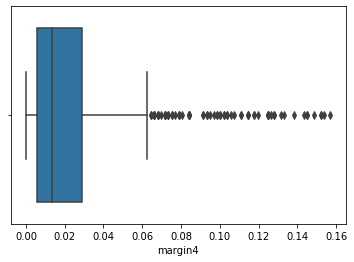

margin5


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


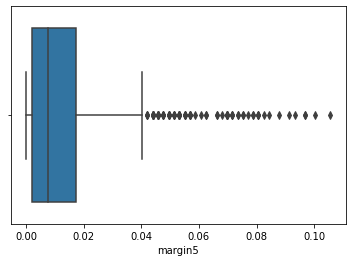

margin6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


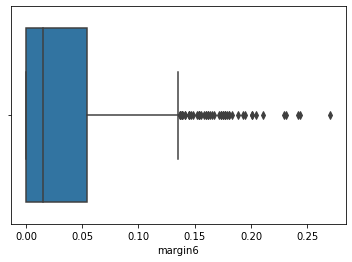

margin7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


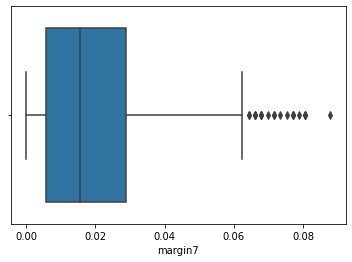

margin8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


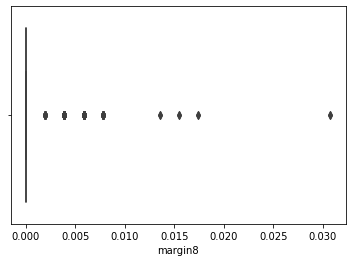

margin9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


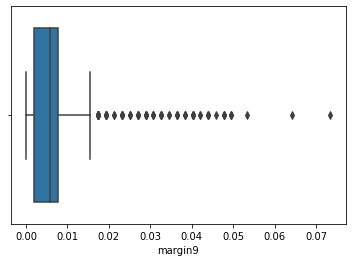

margin10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


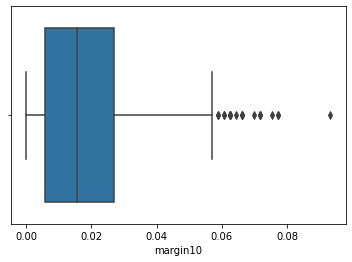

margin11


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


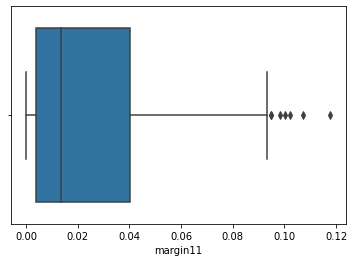

margin12


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


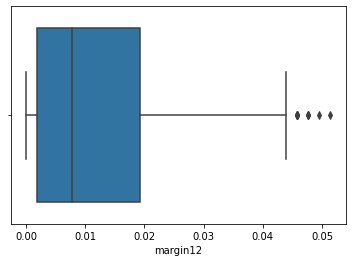

margin13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


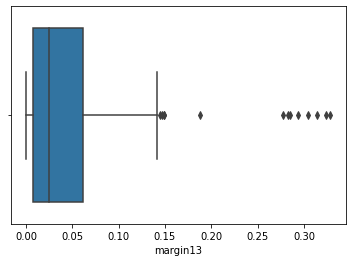

margin14


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


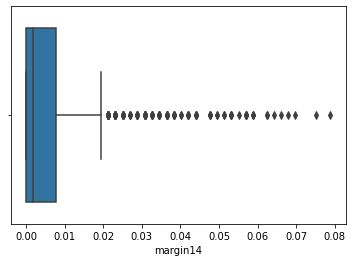

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin15


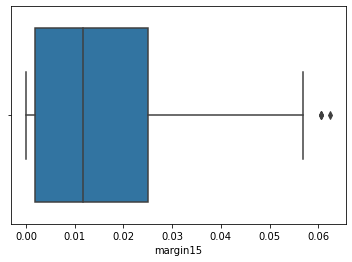

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin16


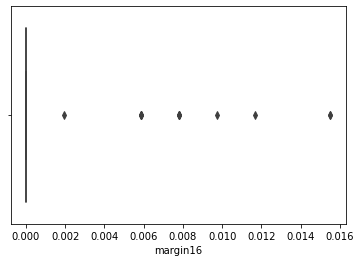

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin17


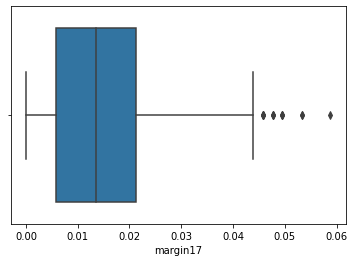

margin18


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


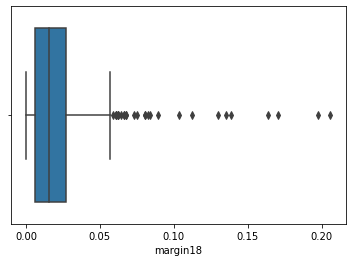

margin19


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


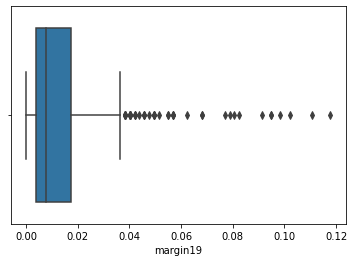

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin20


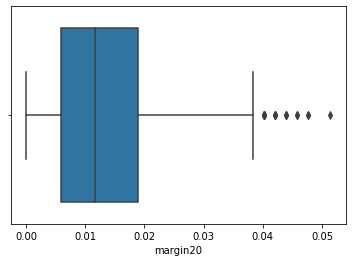

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin21


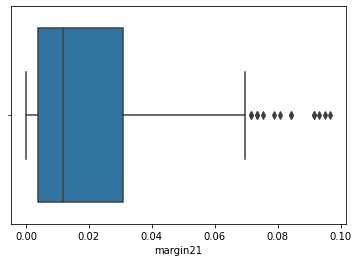

margin22


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


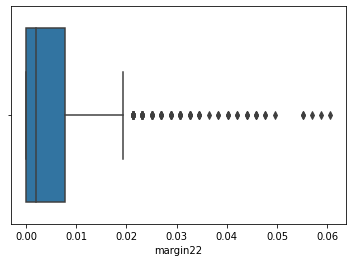

margin23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


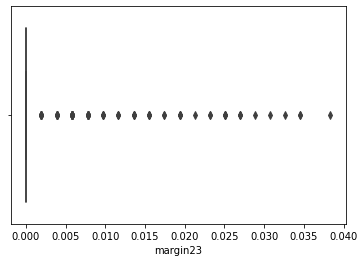

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin24


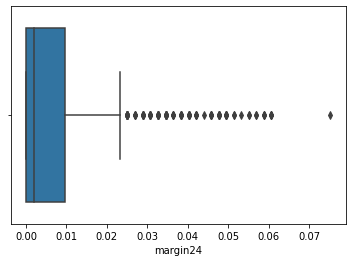

margin25


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


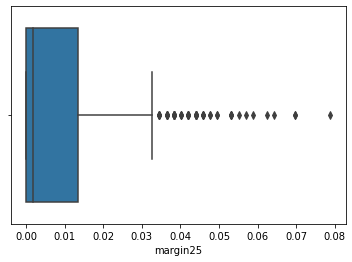

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin26


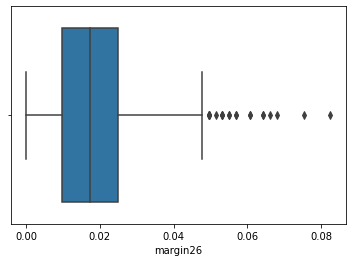

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin27


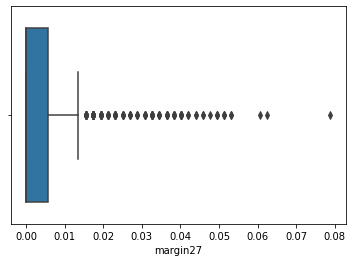

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin28


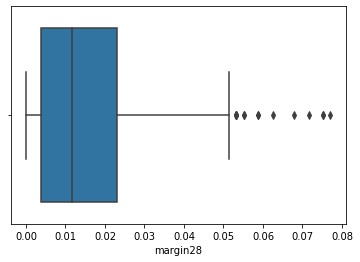

margin29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


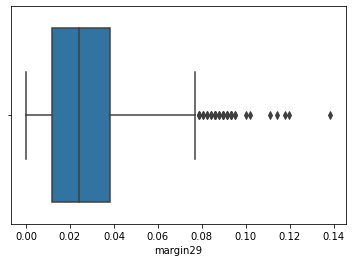

margin30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


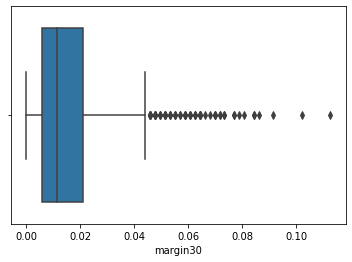

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin31


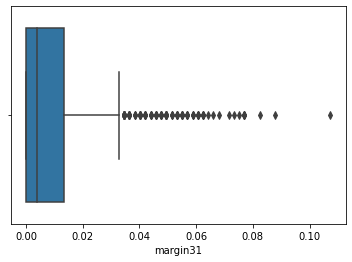

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin32


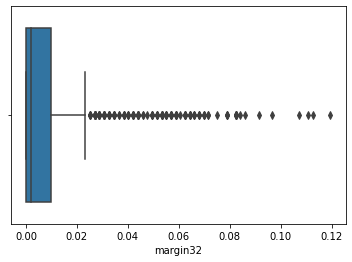

margin33


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


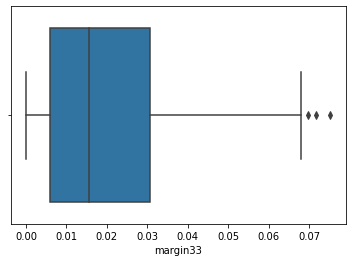

margin34


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


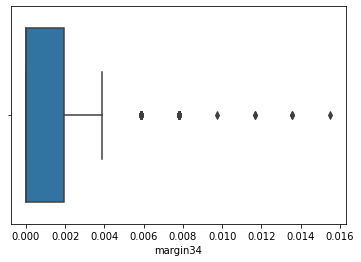

margin35


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


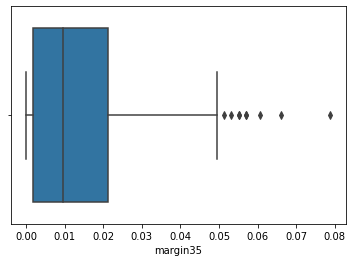

margin36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


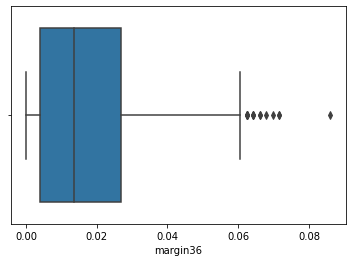

margin37


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


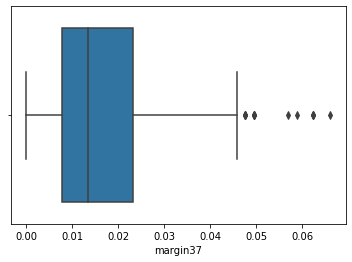

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin38


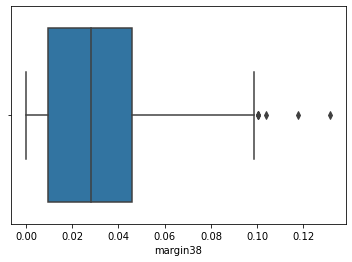

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin39


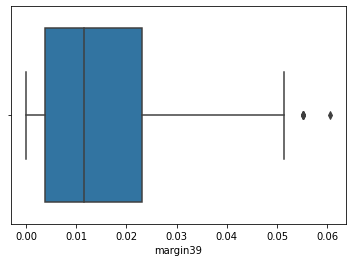

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin40


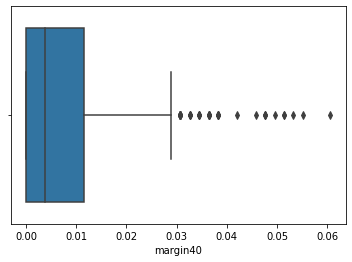

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin41


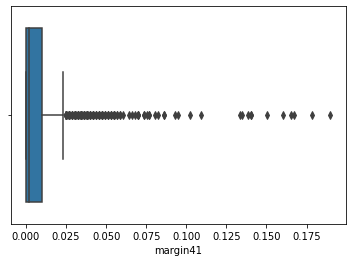

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin42


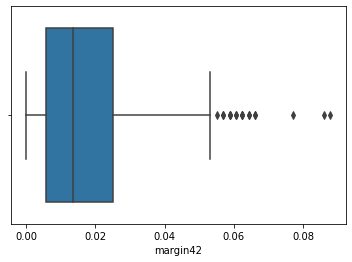

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin43


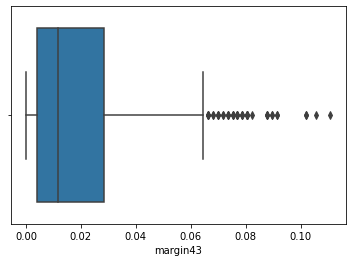

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin44


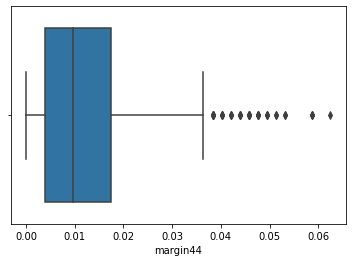

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin45


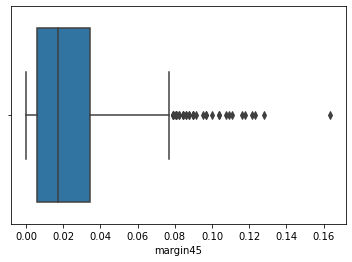

margin46


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


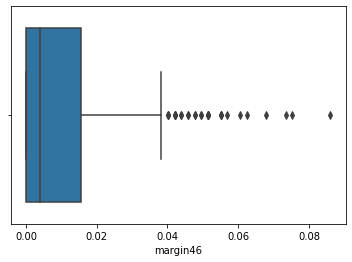

margin47


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


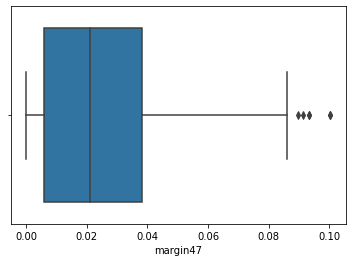

margin48


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


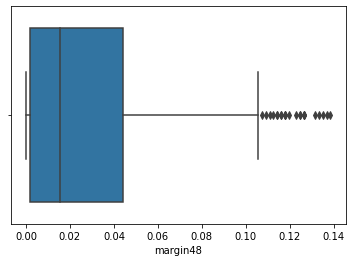

margin49


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


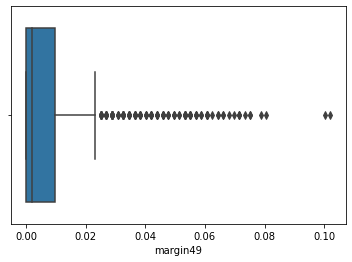

margin50


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


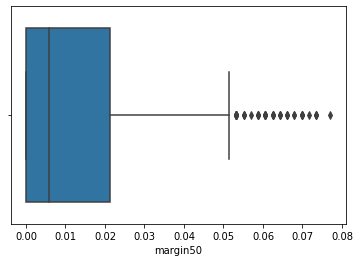

margin51


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


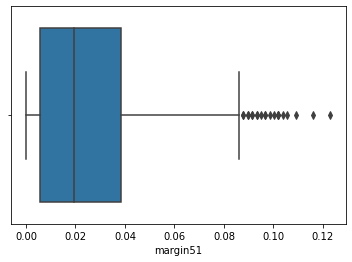

margin52


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


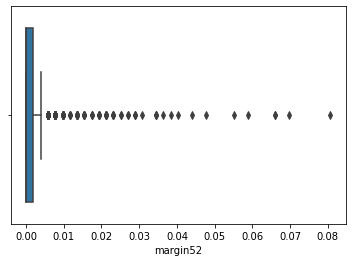

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin53


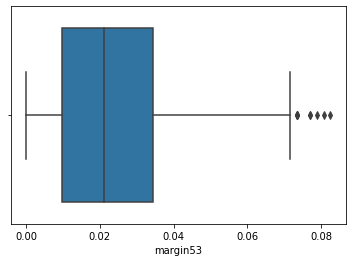

margin54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


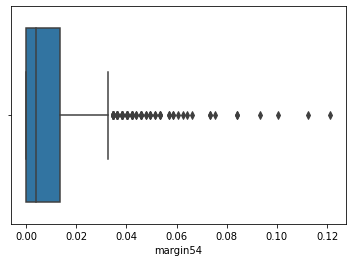

margin55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


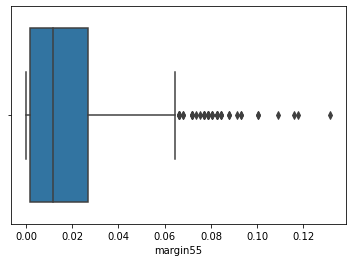

margin56


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


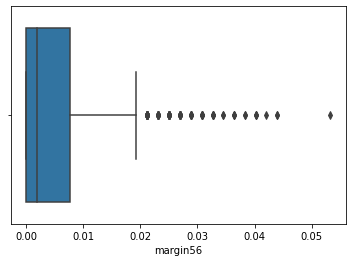

margin57


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


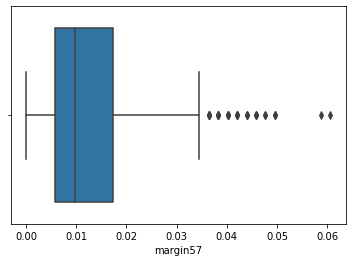

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin58


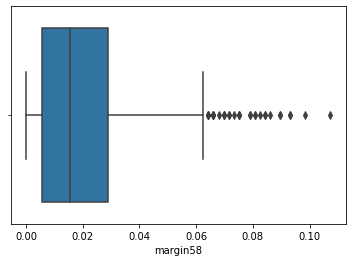

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin59


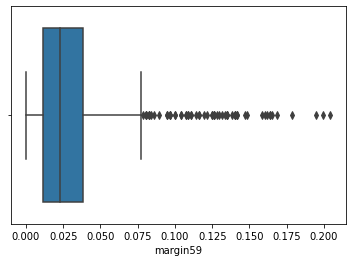

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin60


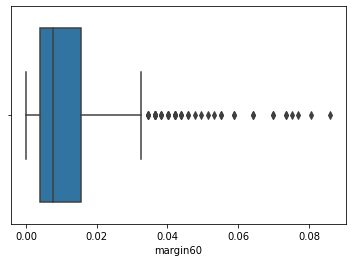

margin61


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


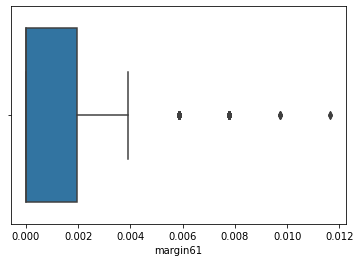

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin62


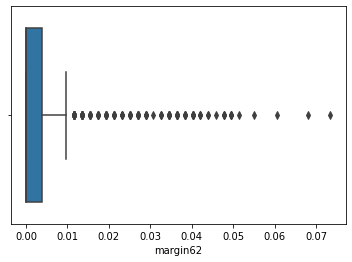

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin63


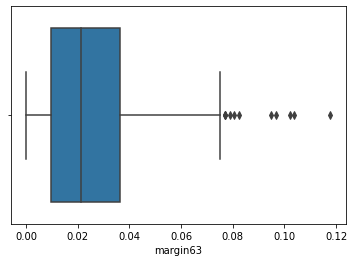

margin64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


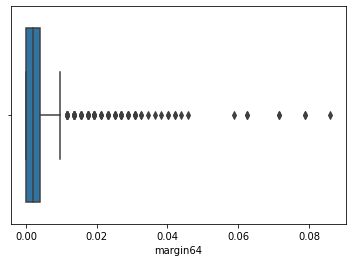

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape1


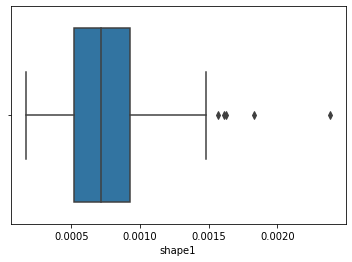

shape2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


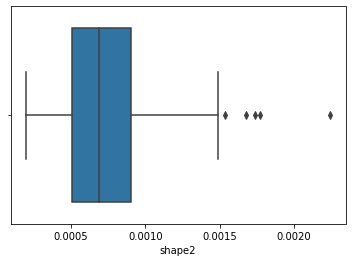

shape3


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


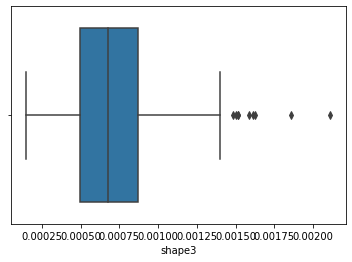

shape4


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


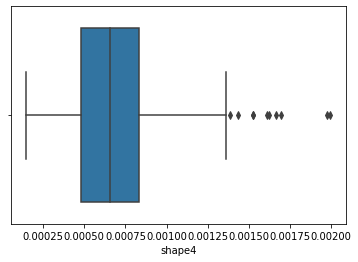

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape5


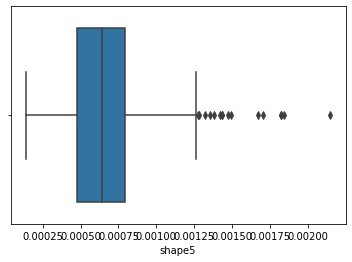

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape6


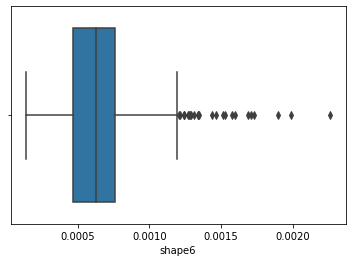

shape7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


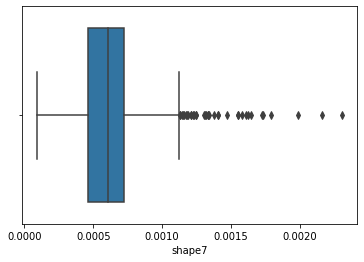

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape8


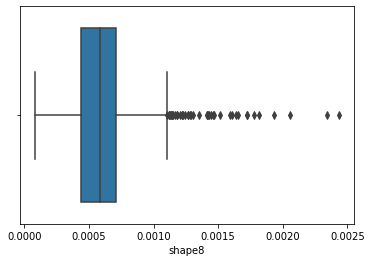

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape9


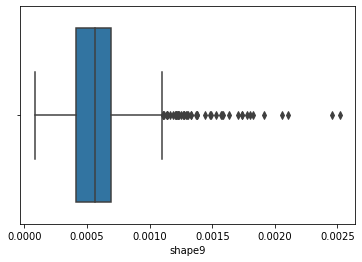

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape10


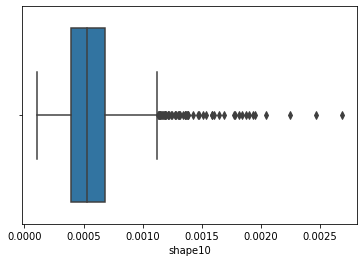

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape11


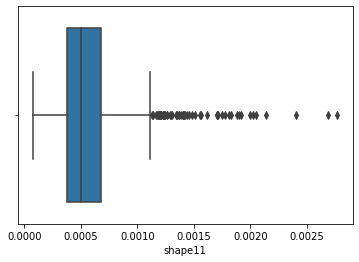

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape12


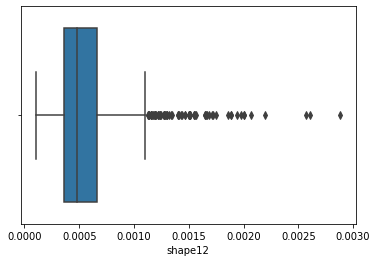

shape13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


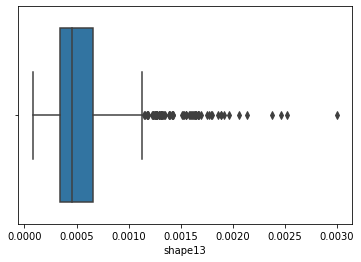

shape14

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


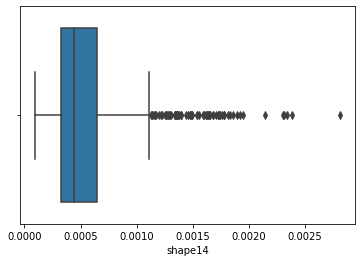

shape15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


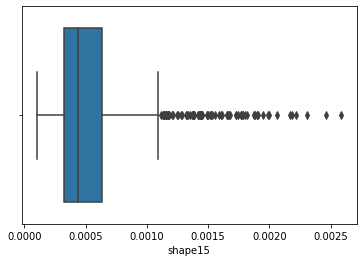

shape16


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


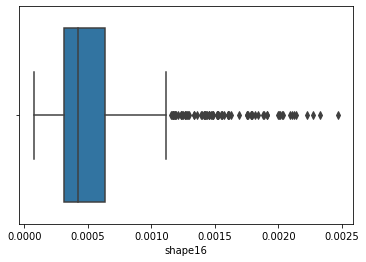

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape17


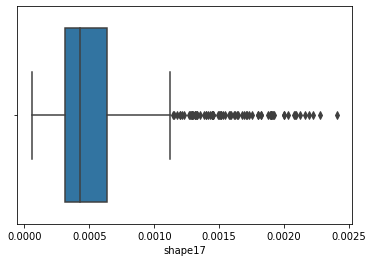

shape18


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


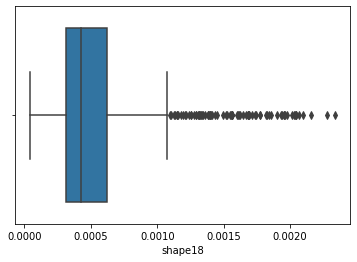

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape19


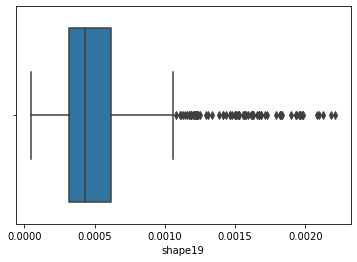

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape20


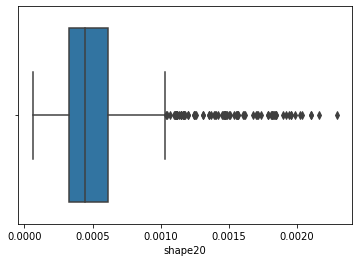

shape21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


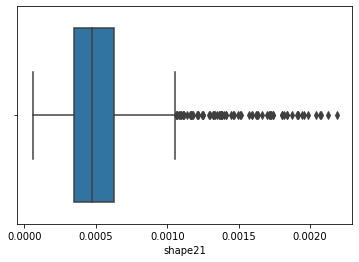

shape22


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


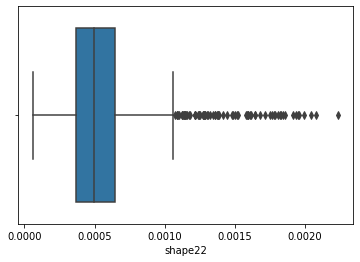

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape23


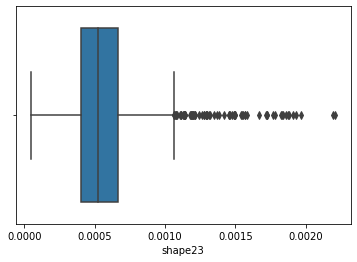

shape24


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


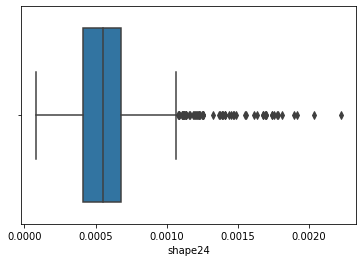

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape25


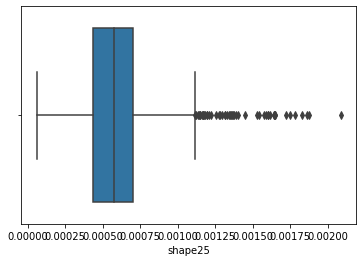

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape26


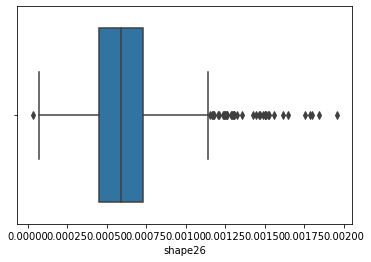

shape27


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


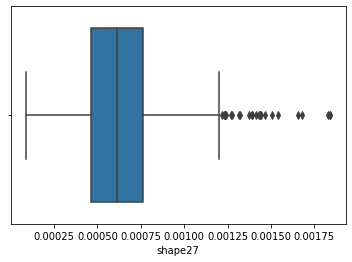

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape28


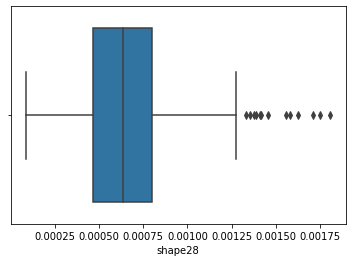

shape29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


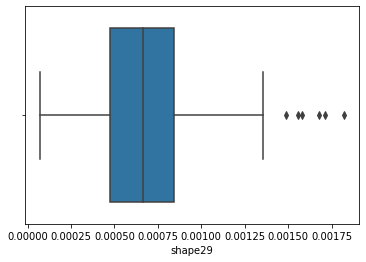

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape30


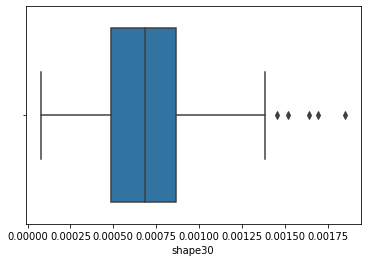

shape31


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


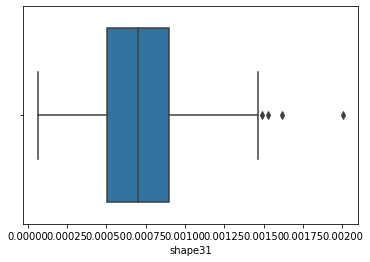

shape32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


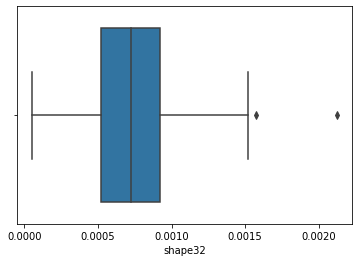

shape33


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


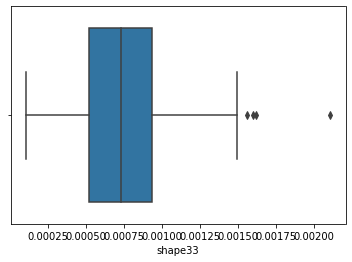

shape34


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


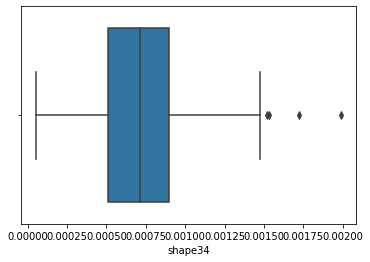

shape35


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


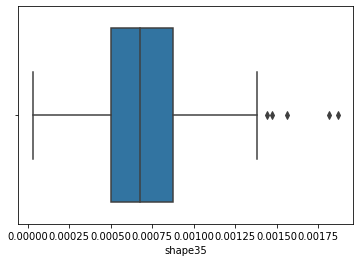

shape36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


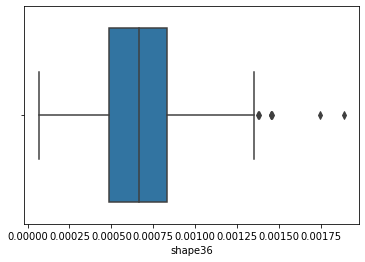

shape37


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


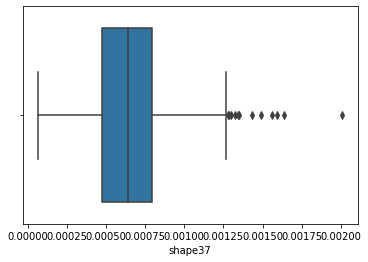

shape38


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


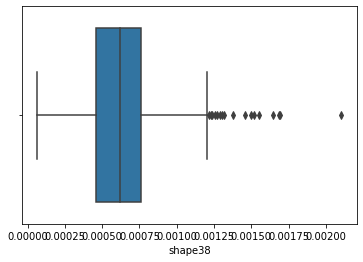

shape39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


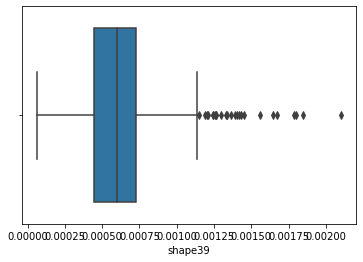

shape40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


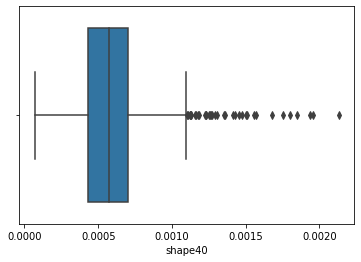

shape41


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


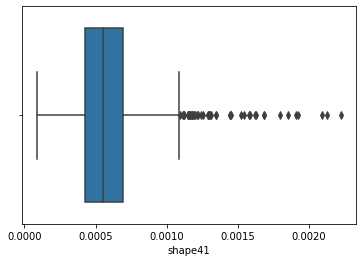

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape42


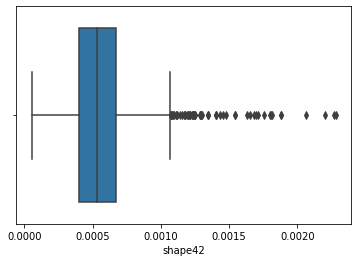

shape43


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


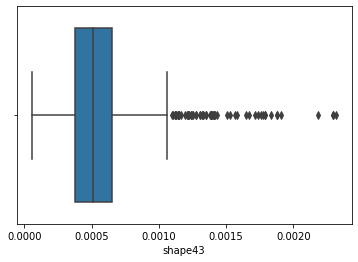

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape44


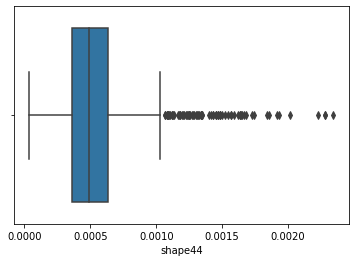

shape45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


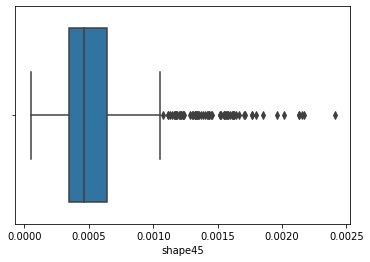

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape46


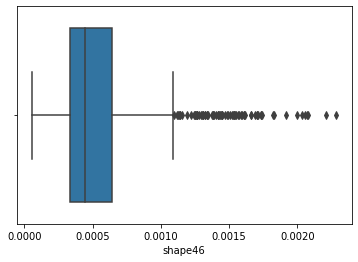

shape47


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


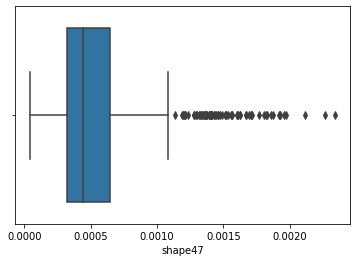

shape48


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


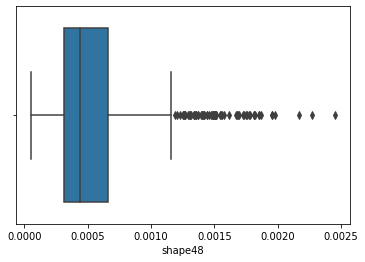

shape49


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


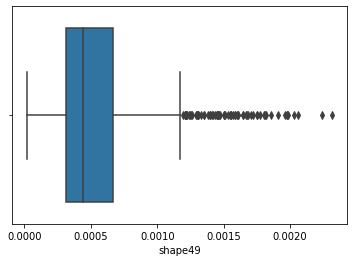

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape50


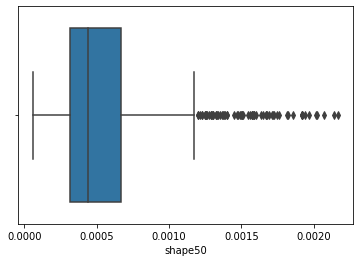

shape51


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


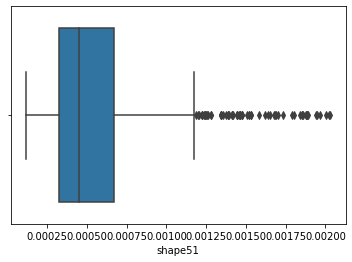

shape52


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


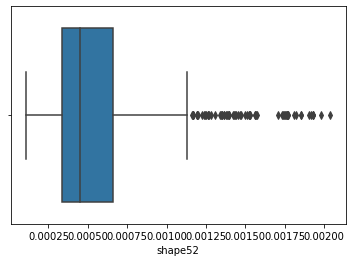

shape53


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


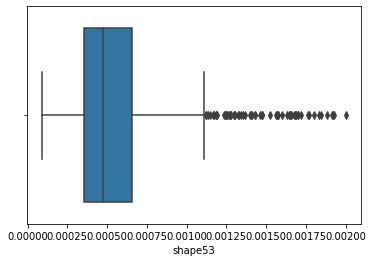

shape54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


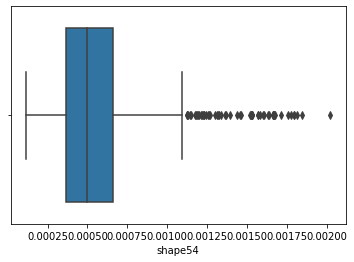

shape55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


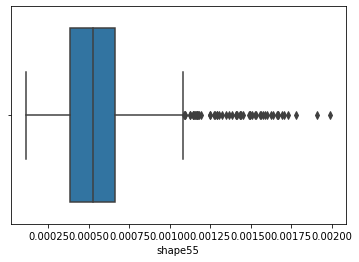

shape56


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


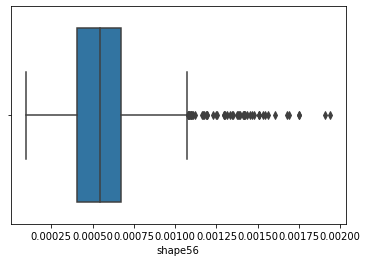

shape57


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


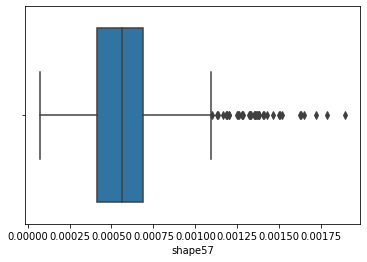

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape58


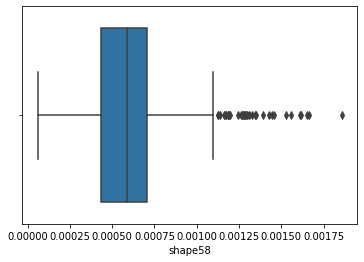

shape59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


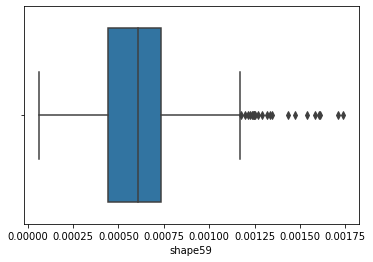

shape60


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


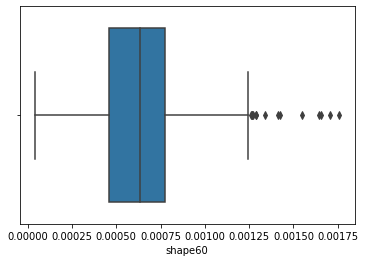

shape61


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


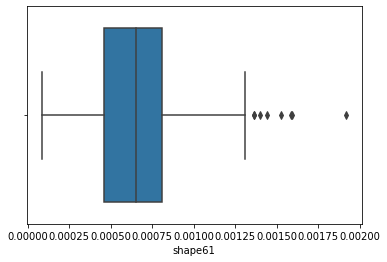

shape62


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


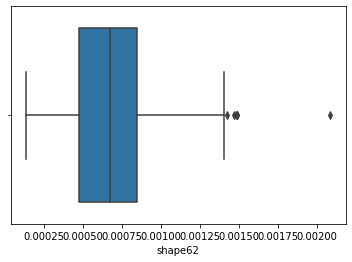

shape63


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


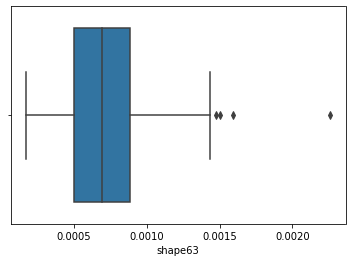

shape64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


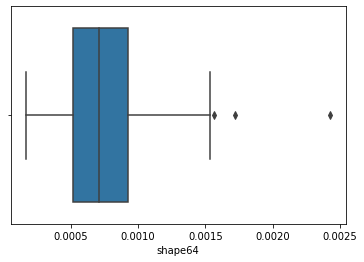

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture1


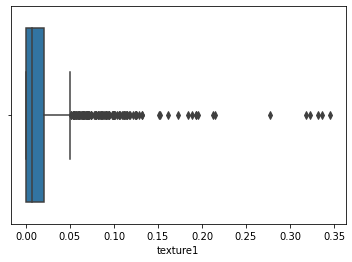

texture2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


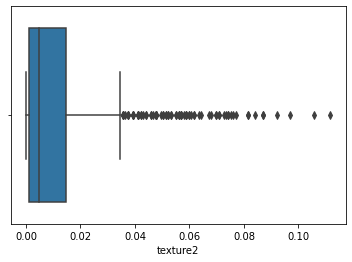

texture3


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


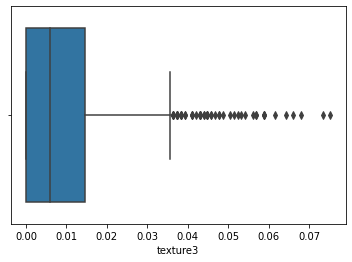

texture4


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


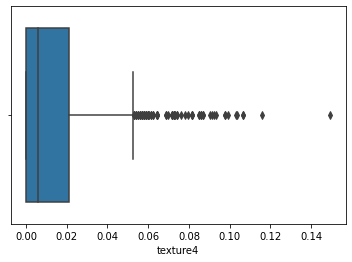

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture5


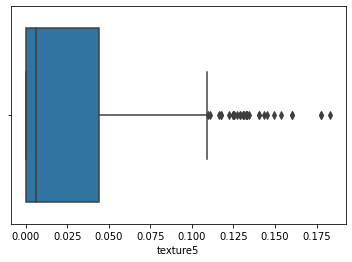

texture6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


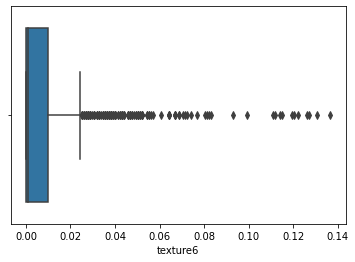

texture7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


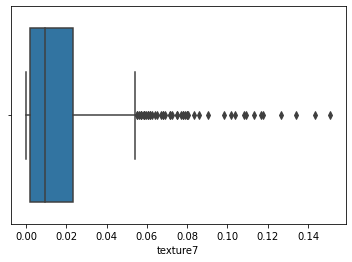

texture8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


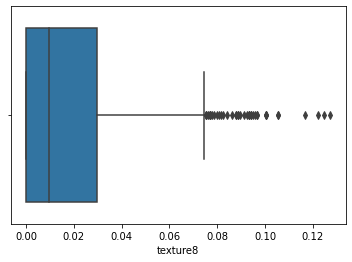

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture9


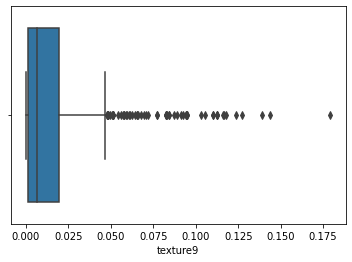

texture10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


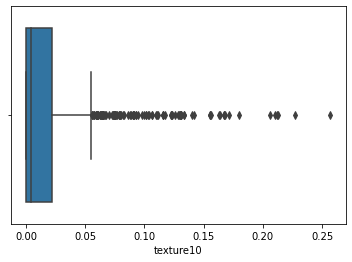

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture11


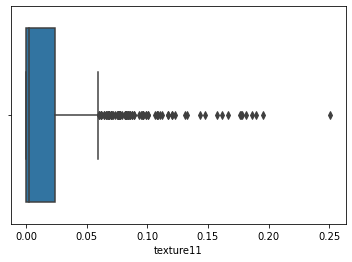

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture12


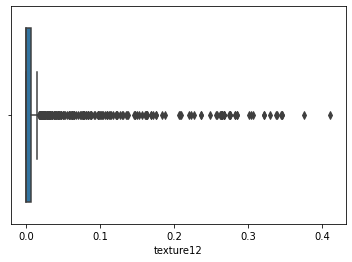

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture13


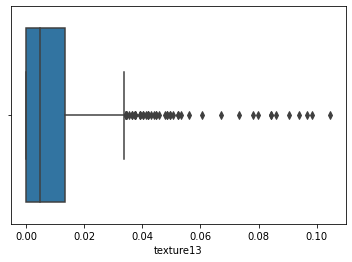

texture14


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


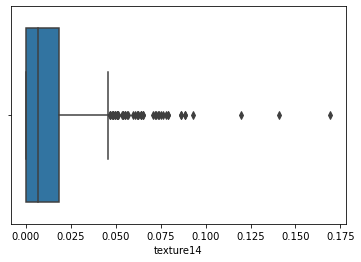

texture15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


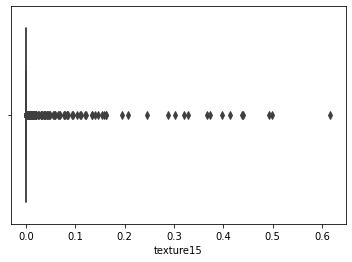

texture16


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


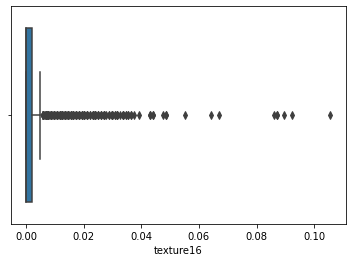

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture17


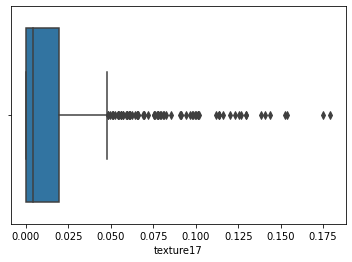

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture18


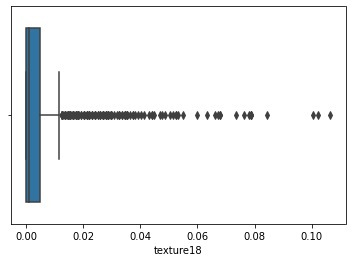

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture19


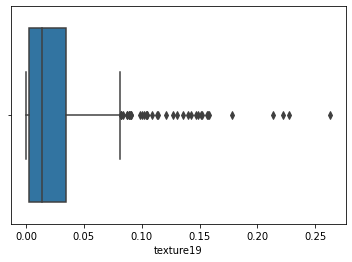

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture20


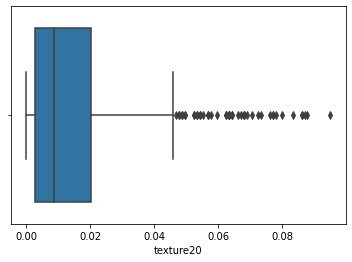

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture21


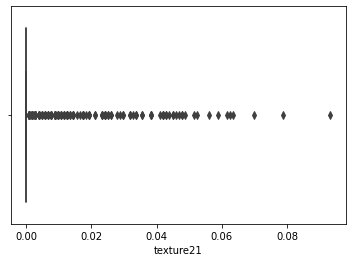

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture22


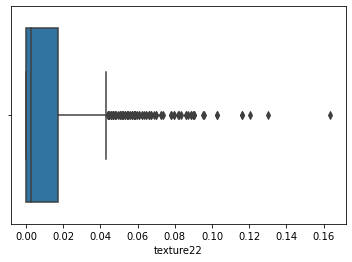

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture23


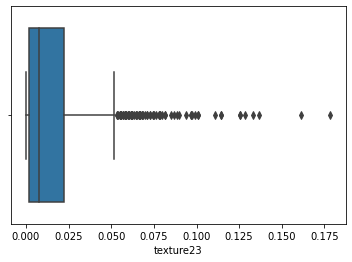

texture24


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


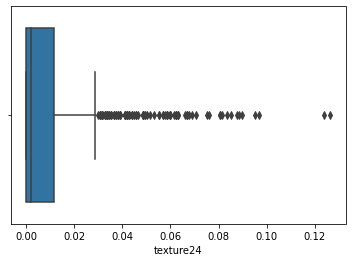

texture25


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


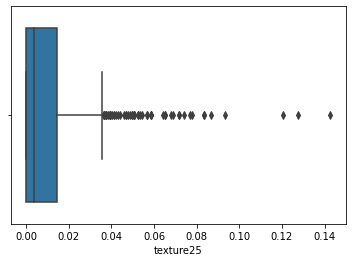

texture26


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


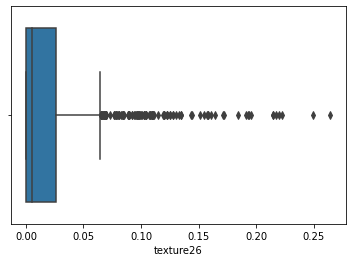

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture27


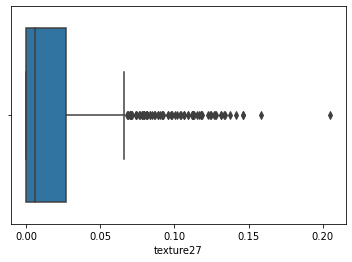

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture28


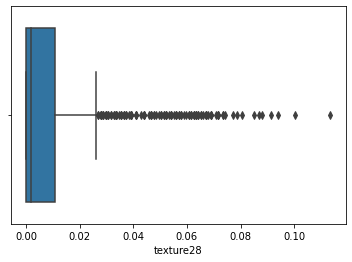

texture29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


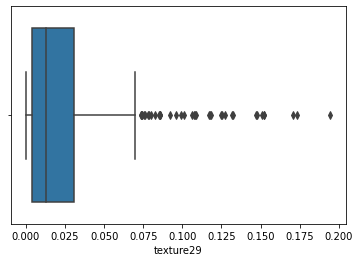

texture30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


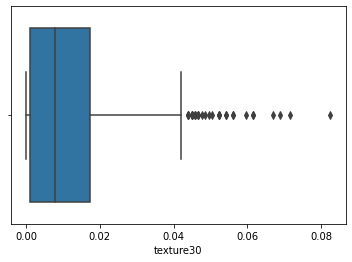

texture31


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


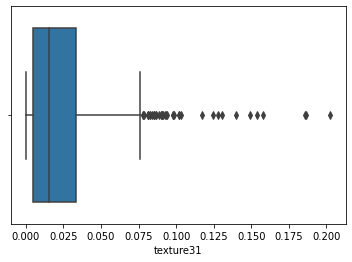

texture32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


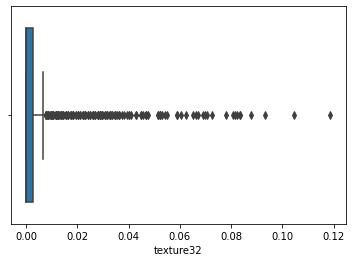

texture33


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


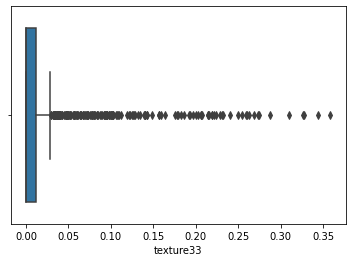

texture34


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


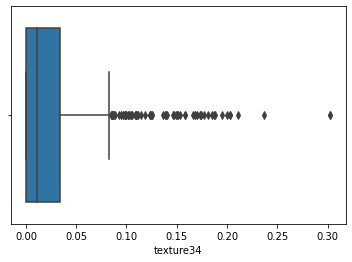

texture35


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


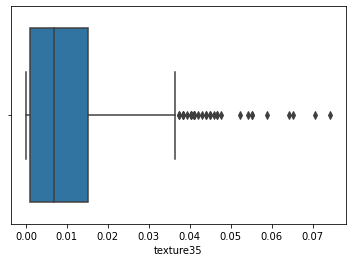

texture36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


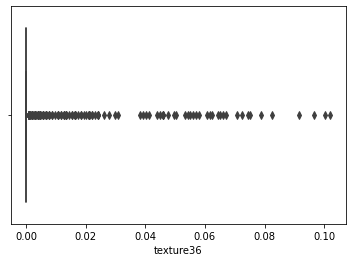

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture37


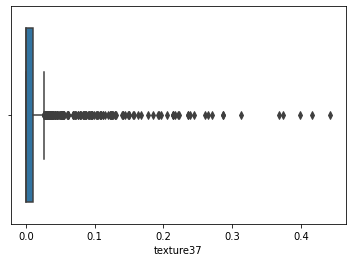

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture38


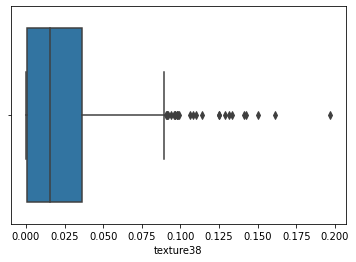

texture39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


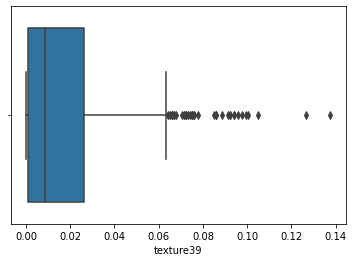

texture40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


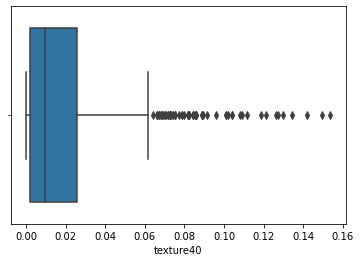

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture41


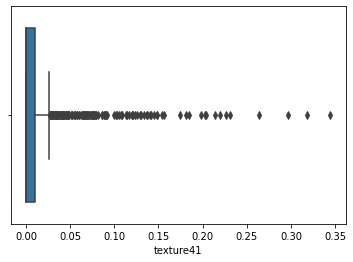

texture42


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


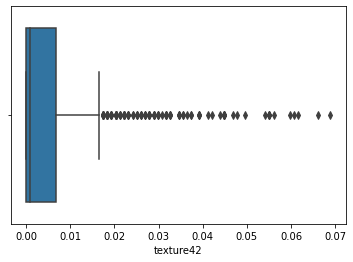

texture43


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


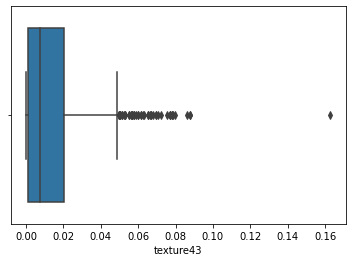

texture44


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


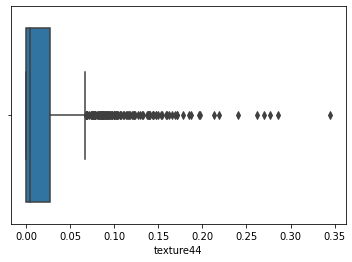

texture45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


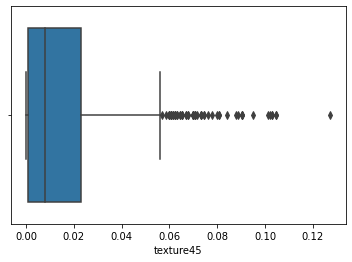

texture46


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


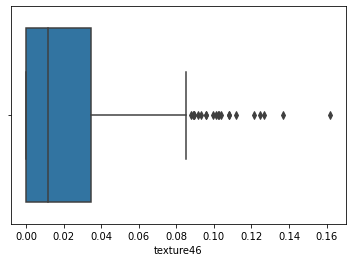

texture47


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


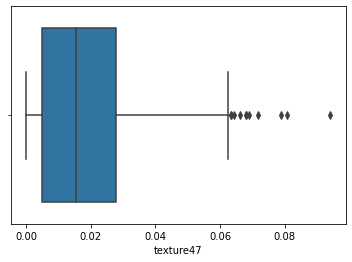

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture48


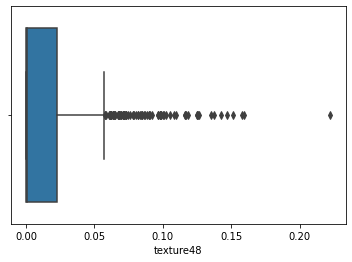

texture49


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


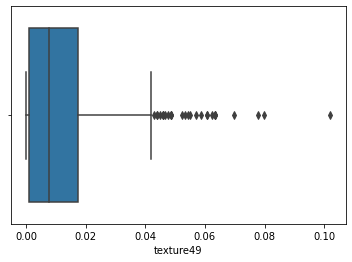

texture50


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


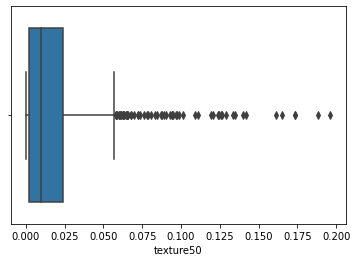

texture51


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


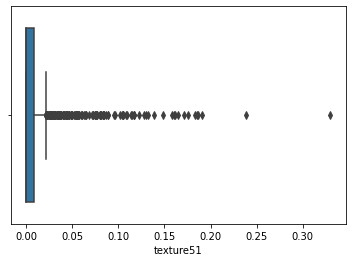

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture52


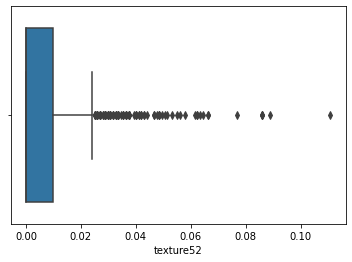

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture53


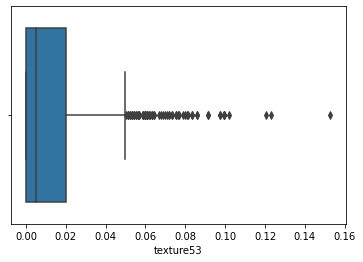

texture54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


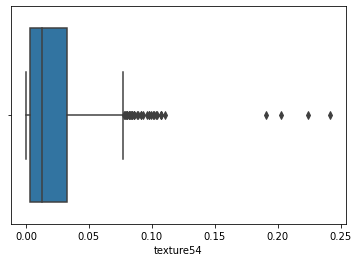

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture55


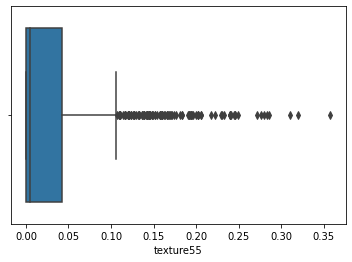

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture56


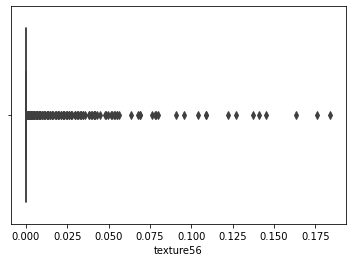

texture57


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


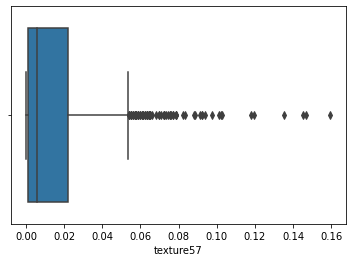

texture58


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


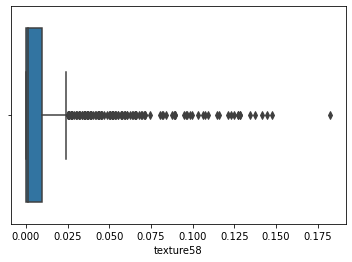

texture59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


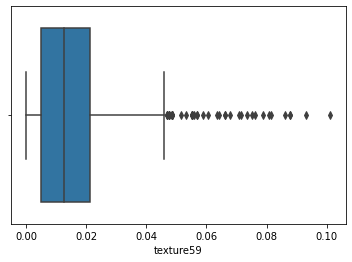

texture60


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


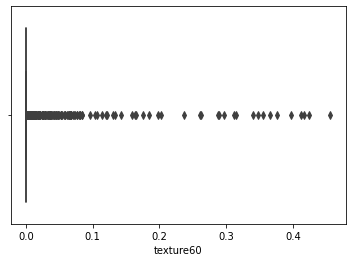

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture61


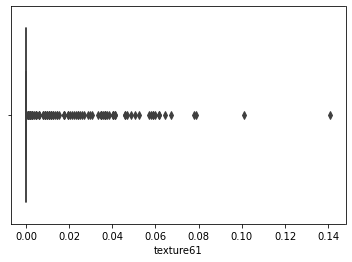

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture62


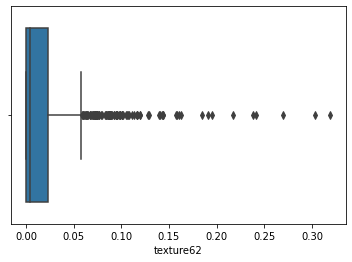

texture63


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


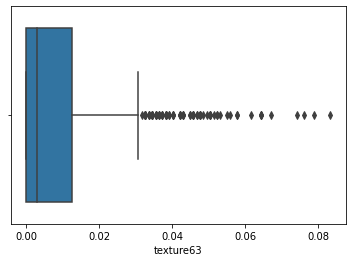

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture64


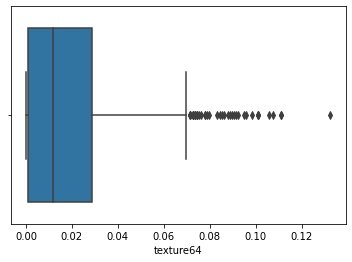

In [19]:
for col in outliers:
    print(col)
    sns.boxplot(np.log1p(df[col]))
    plt.show()

margin1
 Min: 0.0 Max: 0.08424095959148703 
 mean: 0.0170775319287887 std: 0.019165507680881204 
 median: 0.009718620842159931 
 mode: 0.0


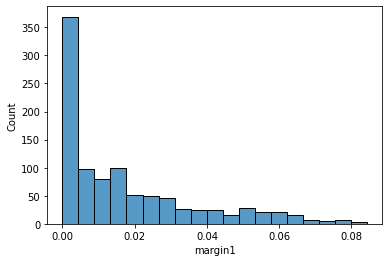

margin2
 Min: 0.0 Max: 0.18654595478039082 
 mean: 0.027455643221745107 std: 0.0366283134204066 
 median: 0.011650864324191847 
 mode: 0.0


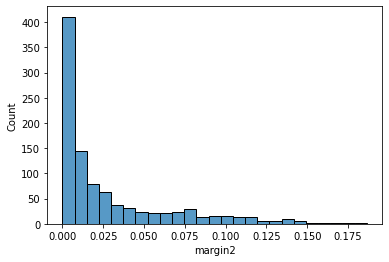

margin3
 Min: 0.0 Max: 0.1451820098444979 
 mean: 0.03118024856167316 std: 0.024645395799580274 
 median: 0.025074003266334802 
 mode: 0.015504186535965254


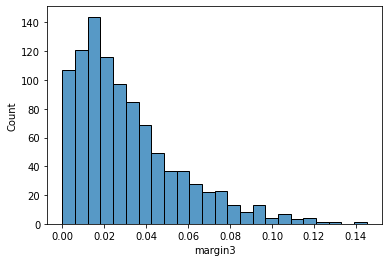

margin4
 Min: 0.0 Max: 0.15693537040353872 
 mean: 0.022644058829222404 std: 0.02688053583931556 
 median: 0.01357938144043876 
 mode: 0.003898391388388962


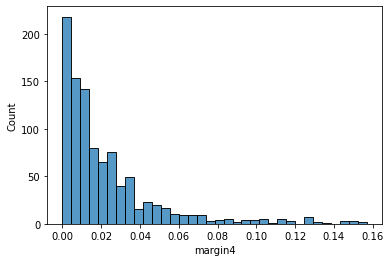

margin5
 Min: 0.0 Max: 0.10555749625587438 
 mean: 0.014002767602111305 std: 0.017793870223063373 
 median: 0.007781644317900871 
 mode: 0.0


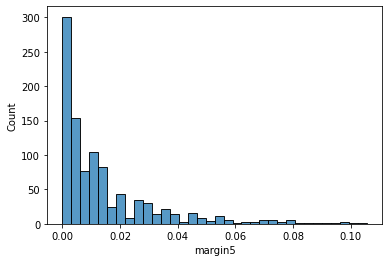

margin6
 Min: 0.0 Max: 0.2704468964300762 
 mean: 0.0366652273609751 std: 0.04814192218306078 
 median: 0.015504186535965254 
 mode: 0.0


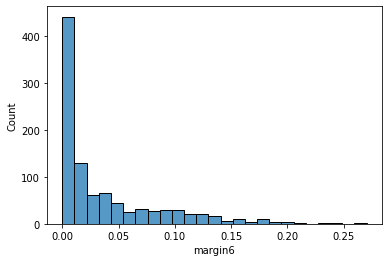

margin7
 Min: 0.0 Max: 0.08782496260574582 
 mean: 0.018874186722291623 std: 0.01701395268928943 
 median: 0.015504186535965254 
 mode: 0.0


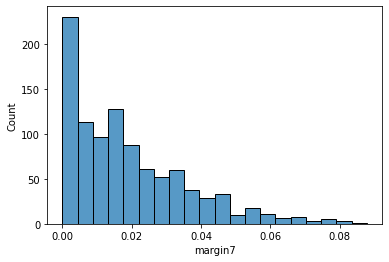

margin8
 Min: 0.0 Max: 0.030771658666753687 
 mean: 0.0010787314933269347 std: 0.002723544270092156 
 median: 0.0 
 mode: 0.0


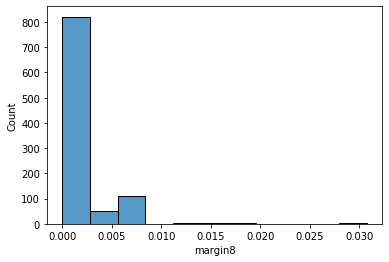

margin9
 Min: 0.0 Max: 0.07341030026585006 
 mean: 0.007103057650841712 std: 0.008754191765437343 
 median: 0.005841902808624884 
 mode: 0.005841902808624884


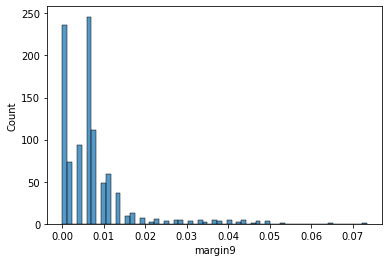

margin10
 Min: 0.0 Max: 0.09317699709615025 
 mean: 0.01834503940453127 std: 0.01563796517490408 
 median: 0.015504186535965254 
 mode: 0.0


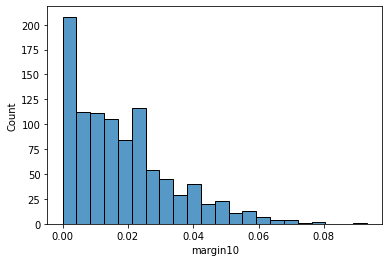

margin11
 Min: 0.0 Max: 0.11778303565638346 
 mean: 0.023602395788866404 std: 0.02511868558660009 
 median: 0.01357938144043876 
 mode: 0.0


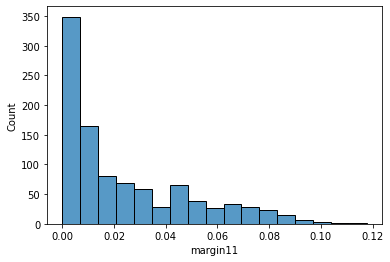

margin12
 Min: 0.0 Max: 0.051390589654212566 
 mean: 0.01183738768424085 std: 0.011529019628221011 
 median: 0.007781644317900871 
 mode: 0.0019510953749186848


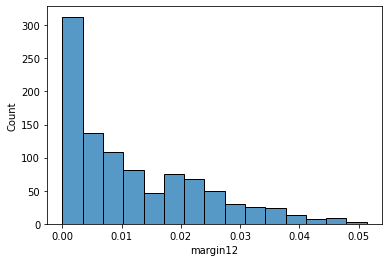

margin13
 Min: 0.0 Max: 0.3283464545518511 
 mean: 0.03950551947248691 std: 0.0421431599820691 
 median: 0.025074003266334802 
 mode: 0.0


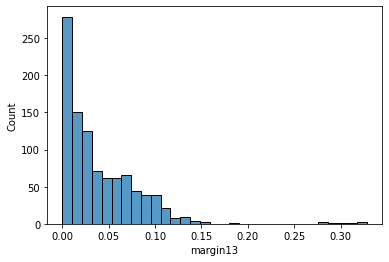

margin14
 Min: 0.0 Max: 0.07883983066081793 
 mean: 0.007936051112593157 std: 0.012962213439360479 
 median: 0.0019510953749186848 
 mode: 0.0


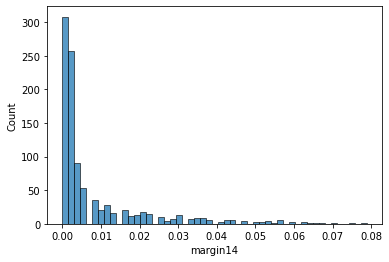

margin15
 Min: 0.0 Max: 0.06246105219253673 
 mean: 0.015390606659038146 std: 0.013981220896969706 
 median: 0.011650864324191847 
 mode: 0.0


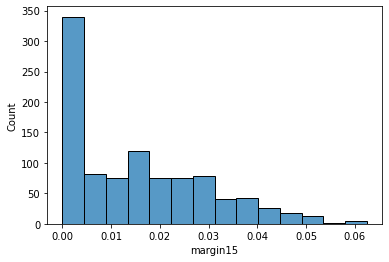

margin16
 Min: 0.0 Max: 0.015504186535965254 
 mean: 0.00010992236577707475 std: 0.0010457317425136546 
 median: 0.0 
 mode: 0.0


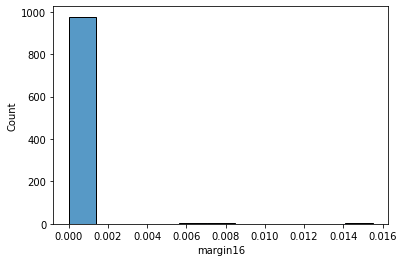

margin17
 Min: 0.0 Max: 0.05878481275814078 
 mean: 0.014958079270153881 std: 0.01061567615163235 
 median: 0.01357938144043876 
 mode: 0.003898391388388962


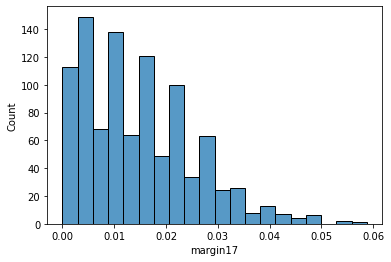

margin18
 Min: 0.0 Max: 0.20581019286285873 
 mean: 0.019700645686615458 std: 0.020127769564025018 
 median: 0.015504186535965254 
 mode: 0.0019510953749186848


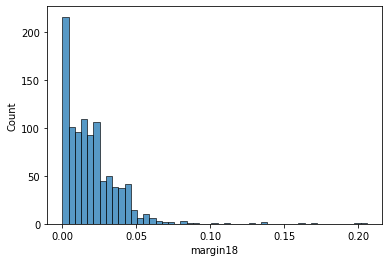

margin19
 Min: 0.0 Max: 0.11778303565638346 
 mean: 0.012169232787676197 std: 0.013998068766851866 
 median: 0.007781644317900871 
 mode: 0.003898391388388962


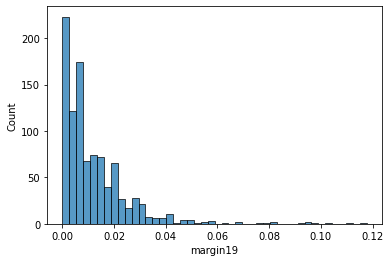

margin20
 Min: 0.0 Max: 0.051390589654212566 
 mean: 0.013004466778240393 std: 0.009497780831994374 
 median: 0.011650864324191847 
 mode: 0.007781644317900871


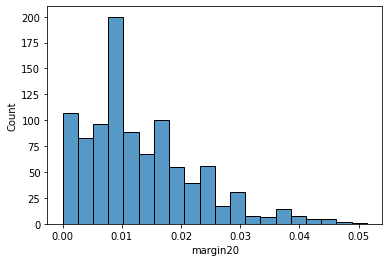

margin21
 Min: 0.0 Max: 0.09672735695242969 
 mean: 0.018770432757619412 std: 0.01889369588504662 
 median: 0.011650864324191847 
 mode: 0.0


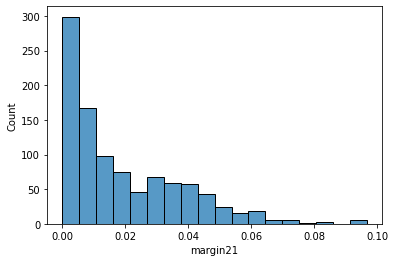

margin22
 Min: 0.0 Max: 0.06062462181643484 
 mean: 0.006125012683826483 std: 0.010025460551980735 
 median: 0.0019510953749186848 
 mode: 0.0


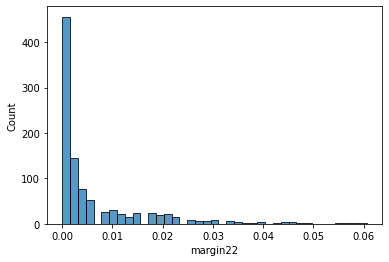

margin23
 Min: 0.0 Max: 0.0383183830990133 
 mean: 0.0009886368229811565 std: 0.00425612780268359 
 median: 0.0 
 mode: 0.0


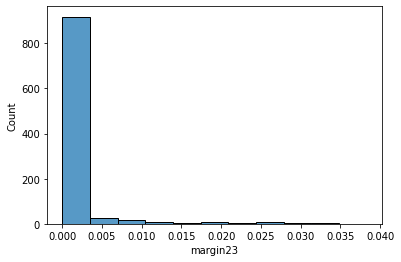

margin24
 Min: 0.0 Max: 0.07522342123758753 
 mean: 0.007537754240933019 std: 0.012586689331234234 
 median: 0.0019510953749186848 
 mode: 0.0


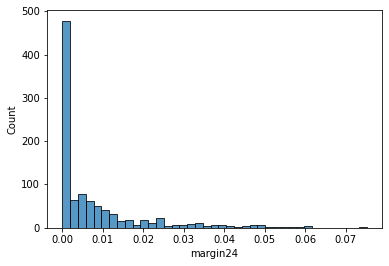

margin25
 Min: 0.0 Max: 0.07883983066081793 
 mean: 0.008736979849753898 std: 0.012458235337773621 
 median: 0.0019510953749186848 
 mode: 0.0


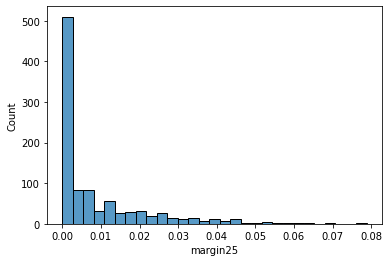

margin26
 Min: 0.0 Max: 0.08244412964262327 
 mean: 0.018473059463026523 std: 0.012007841220611786 
 median: 0.017425293873160608 
 mode: 0.011650864324191847


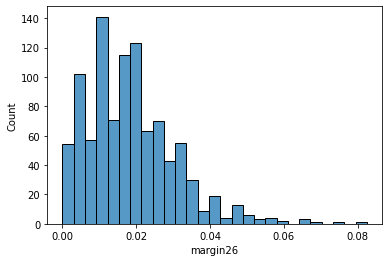

margin27
 Min: 0.0 Max: 0.07883983066081793 
 mean: 0.005555608376365019 std: 0.010641142484719632 
 median: 0.0 
 mode: 0.0


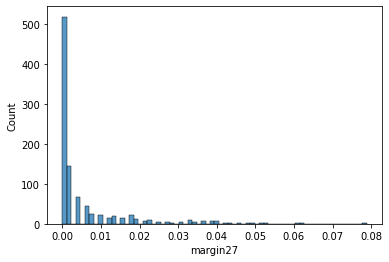

margin28
 Min: 0.0 Max: 0.07703326075045143 
 mean: 0.015319527755856205 std: 0.013771849958240595 
 median: 0.011650864324191847 
 mode: 0.0019510953749186848


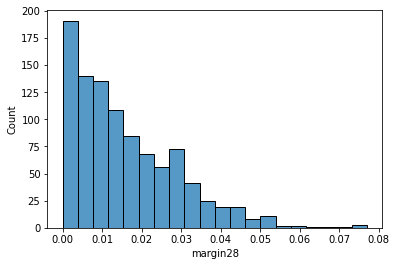

margin29
 Min: 0.0 Max: 0.13840449972749805 
 mean: 0.027626857886367047 std: 0.021925261220048342 
 median: 0.02412077554868408 
 mode: 0.0019510953749186848


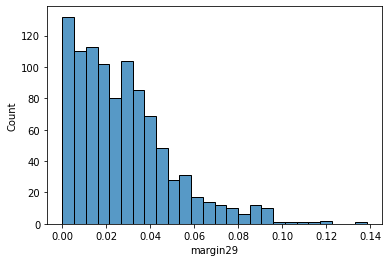

margin30
 Min: 0.0 Max: 0.11256053321085245 
 mean: 0.016236422395459027 std: 0.01603609723371821 
 median: 0.011650864324191847 
 mode: 0.003898391388388962


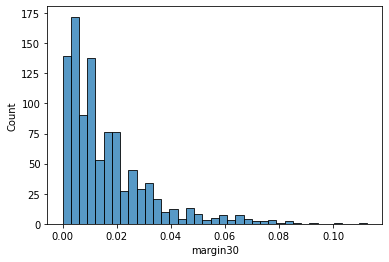

margin31
 Min: 0.0 Max: 0.10731061298144016 
 mean: 0.010653311542672603 std: 0.016107327265215937 
 median: 0.003898391388388962 
 mode: 0.0


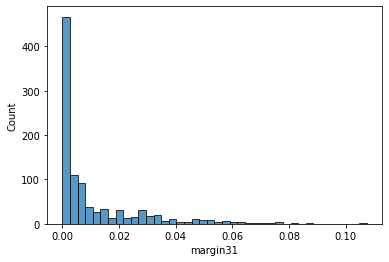

margin32
 Min: 0.0 Max: 0.11951486850114226 
 mean: 0.009467703136173762 std: 0.018627422444451376 
 median: 0.0019510953749186848 
 mode: 0.0


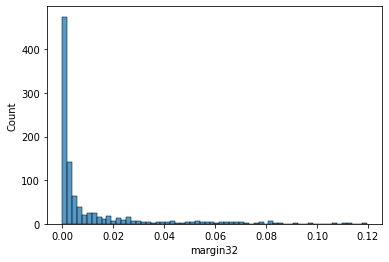

margin33
 Min: 0.0 Max: 0.07522342123758753 
 mean: 0.019191892866483547 std: 0.015595784701210945 
 median: 0.015504186535965254 
 mode: 0.003898391388388962


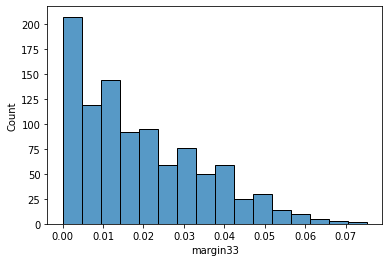

margin34
 Min: 0.0 Max: 0.015504186535965254 
 mean: 0.0010802817980704942 std: 0.0020802907780388944 
 median: 0.0 
 mode: 0.0


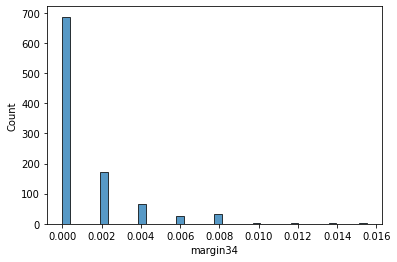

margin35
 Min: 0.0 Max: 0.07883983066081793 
 mean: 0.012996647379925667 std: 0.012952935570014649 
 median: 0.009718620842159931 
 mode: 0.0


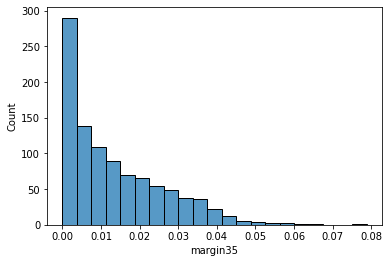

margin36
 Min: 0.0 Max: 0.08603456673245784 
 mean: 0.01775173912197358 std: 0.016034266448524827 
 median: 0.01357938144043876 
 mode: 0.0


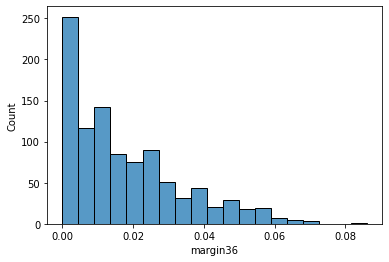

margin37
 Min: 0.0 Max: 0.06612382637692736 
 mean: 0.016073940986477287 std: 0.011233767480697689 
 median: 0.01357938144043876 
 mode: 0.009718620842159931


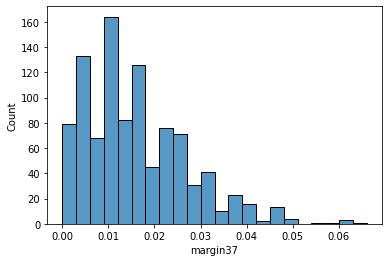

margin38
 Min: 0.0 Max: 0.13158074134075534 
 mean: 0.030336157614050827 std: 0.02239618633957439 
 median: 0.027926437994076236 
 mode: 0.005841902808624884


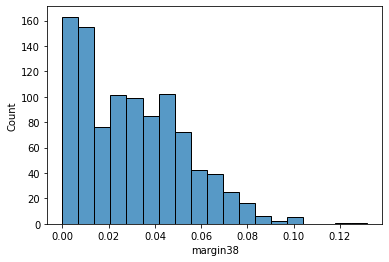

margin39
 Min: 0.0 Max: 0.06062462181643484 
 mean: 0.014652169511190766 std: 0.012973457253307534 
 median: 0.011650864324191847 
 mode: 0.0


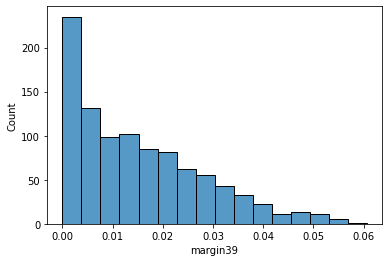

margin40
 Min: 0.0 Max: 0.06062462181643484 
 mean: 0.00807996552520262 std: 0.010025034200631566 
 median: 0.003898391388388962 
 mode: 0.0


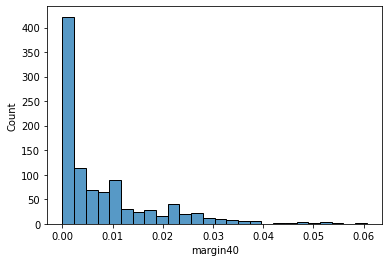

margin41
 Min: 0.0 Max: 0.1897770288986376 
 mean: 0.010572880586334281 std: 0.022141853520152216 
 median: 0.0019510953749186848 
 mode: 0.0


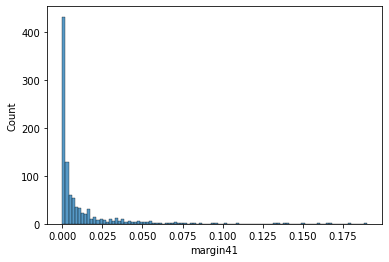

margin42
 Min: 0.0 Max: 0.08782496260574582 
 mean: 0.017244000076650105 std: 0.014106834606386473 
 median: 0.01357938144043876 
 mode: 0.0019510953749186848


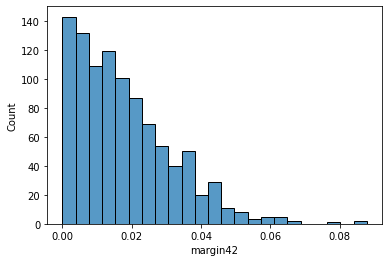

margin43
 Min: 0.0 Max: 0.11081660410002409 
 mean: 0.018476469446178177 std: 0.020218457141760564 
 median: 0.011650864324191847 
 mode: 0.0


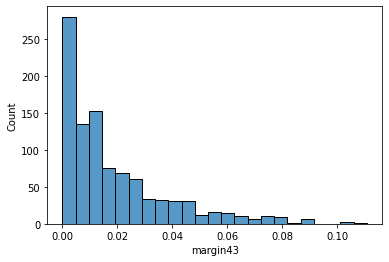

margin44
 Min: 0.0 Max: 0.06246105219253673 
 mean: 0.012533906705858695 std: 0.011452367297381362 
 median: 0.009718620842159931 
 mode: 0.0019510953749186848


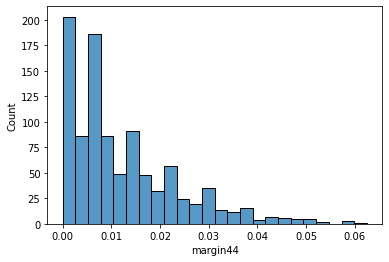

margin45
 Min: 0.0 Max: 0.16358885692124228 
 mean: 0.024114106044299685 std: 0.02328932710145729 
 median: 0.017425293873160608 
 mode: 0.005841902808624884


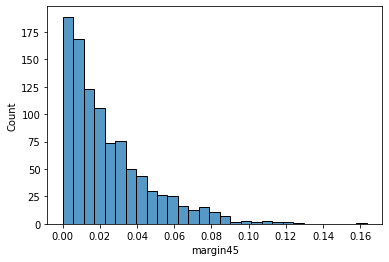

margin46
 Min: 0.0 Max: 0.08603456673245784 
 mean: 0.009927212418991447 std: 0.012612162594451838 
 median: 0.003898391388388962 
 mode: 0.0


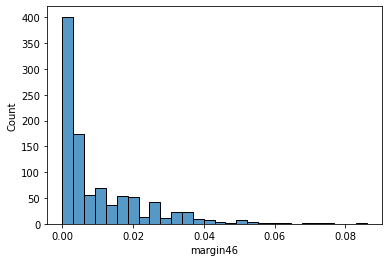

margin47
 Min: 0.0 Max: 0.10027058390508534 
 mean: 0.024787728664148835 std: 0.020773331428401893 
 median: 0.02125647191253702 
 mode: 0.0


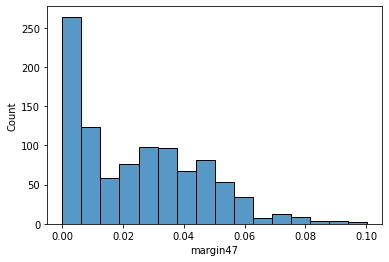

margin48
 Min: 0.0 Max: 0.13840449972749805 
 mean: 0.026225207501113776 std: 0.028784716407710312 
 median: 0.015504186535965254 
 mode: 0.0


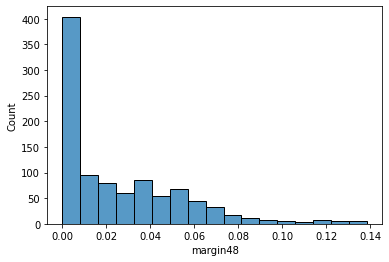

margin49
 Min: 0.0 Max: 0.10203298556511782 
 mean: 0.008401675132403379 std: 0.015528411942611429 
 median: 0.0019510953749186848 
 mode: 0.0


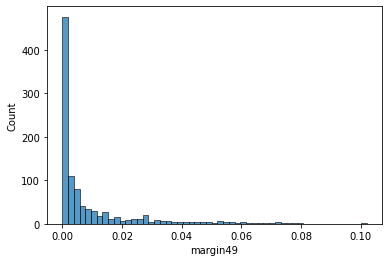

margin50
 Min: 0.0 Max: 0.07703326075045143 
 mean: 0.013736484732567418 std: 0.01715745666063082 
 median: 0.005841902808624884 
 mode: 0.0


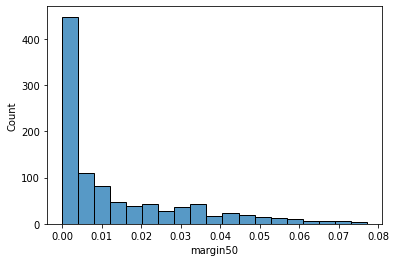

margin51
 Min: 0.0 Max: 0.1229784052103641 
 mean: 0.025044549976505546 std: 0.023934743807939838 
 median: 0.019342717632372903 
 mode: 0.0


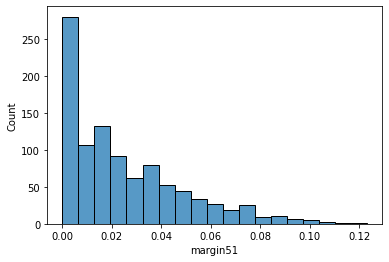

margin52
 Min: 0.0 Max: 0.08064314276092094 
 mean: 0.002731848420672955 std: 0.007468964439415861 
 median: 0.0 
 mode: 0.0


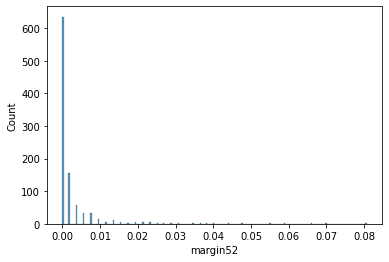

margin53
 Min: 0.0 Max: 0.08244412964262327 
 mean: 0.023561608679214214 std: 0.017667475726896663 
 median: 0.02125647191253702 
 mode: 0.011650864324191847


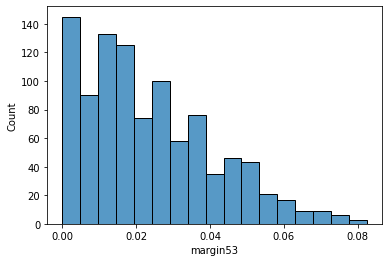

margin54
 Min: 0.0 Max: 0.12125256542666048 
 mean: 0.009837355103016988 std: 0.015093345198612008 
 median: 0.003898391388388962 
 mode: 0.0


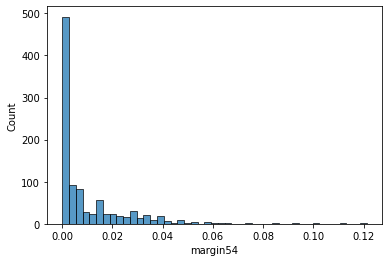

margin55
 Min: 0.0 Max: 0.13158074134075534 
 mean: 0.017804022391911062 std: 0.02105322440296131 
 median: 0.011650864324191847 
 mode: 0.0


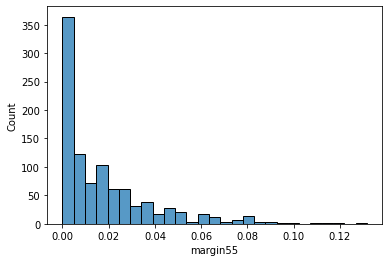

margin56
 Min: 0.0 Max: 0.05324498859277399 
 mean: 0.005904123225200945 std: 0.008710568640746463 
 median: 0.0019510953749186848 
 mode: 0.0


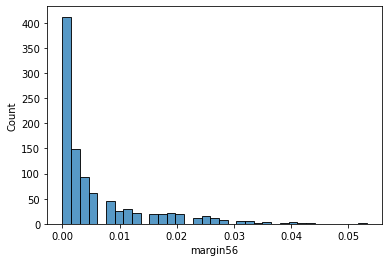

margin57
 Min: 0.0 Max: 0.06062462181643484 
 mean: 0.012434050824522824 std: 0.009663384000644192 
 median: 0.009718620842159931 
 mode: 0.007781644317900871


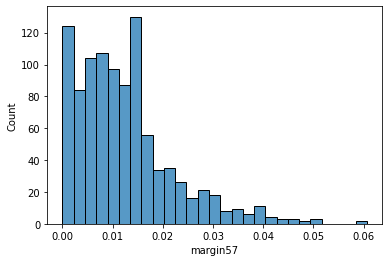

margin58
 Min: 0.0 Max: 0.10731061298144016 
 mean: 0.01982143833763588 std: 0.018239687199398173 
 median: 0.015504186535965254 
 mode: 0.0019510953749186848


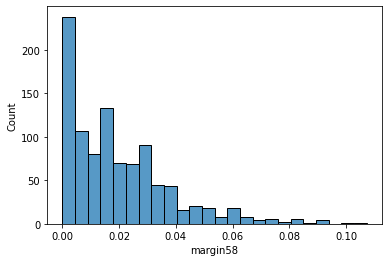

margin59
 Min: 0.0 Max: 0.20421350321005324 
 mean: 0.030026493801548246 std: 0.02977525675727919 
 median: 0.023167547831033357 
 mode: 0.017425293873160608


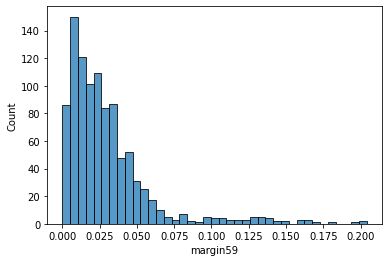

margin60
 Min: 0.0 Max: 0.08603456673245784 
 mean: 0.011706698265909662 std: 0.01215971819606257 
 median: 0.007781644317900871 
 mode: 0.0


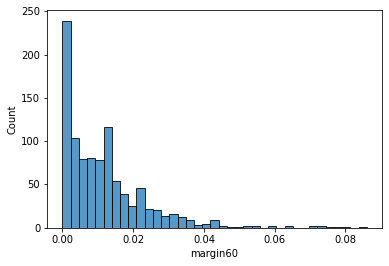

margin61
 Min: 0.0 Max: 0.011650864324191847 
 mean: 0.0013852308021910036 std: 0.0022850446213425624 
 median: 0.0 
 mode: 0.0


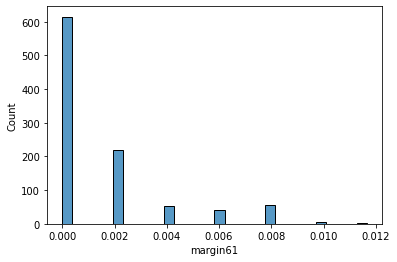

margin62
 Min: 0.0 Max: 0.07341030026585006 
 mean: 0.0049191296656758395 std: 0.010138140754361353 
 median: 0.0 
 mode: 0.0


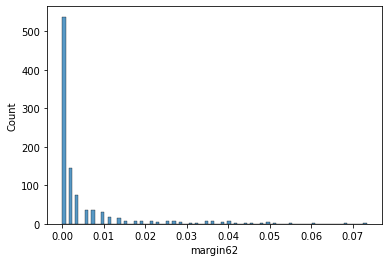

margin63
 Min: 0.0 Max: 0.11778303565638346 
 mean: 0.024887445999343748 std: 0.019149995678298608 
 median: 0.02125647191253702 
 mode: 0.0


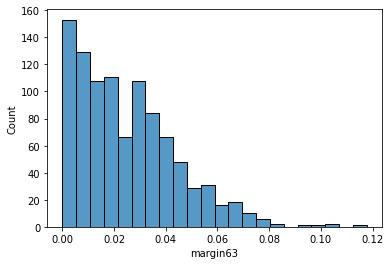

margin64
 Min: 0.0 Max: 0.08603456673245784 
 mean: 0.004323002284909967 std: 0.00901796727985329 
 median: 0.0019510953749186848 
 mode: 0.0


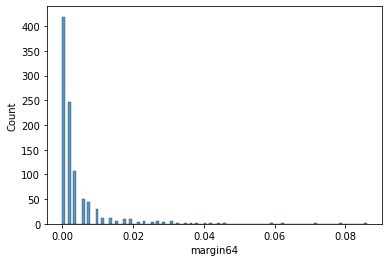

shape1
 Min: 0.00016796589293958055 Max: 0.00238684920774388 
 mean: 0.000739011914345968 std: 0.00027205672670017043 
 median: 0.0007156888294250689 
 mode: 0.001015084627232206


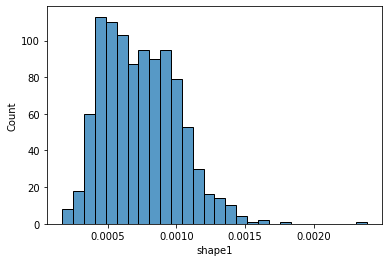

shape2
 Min: 0.00019608077490831924 Max: 0.002244080167551336 
 mean: 0.0007179726245504589 std: 0.0002676269224487731 
 median: 0.0006910811483844116 
 mode: 0.0010186809683147924


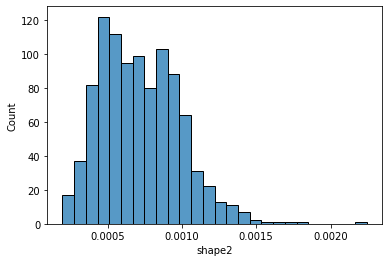

shape3
 Min: 0.00014816902242822434 Max: 0.002110072230947785 
 mean: 0.0006933935964964664 std: 0.0002592907727393496 
 median: 0.0006751020673083844 
 mode: 0.0005040729338893613


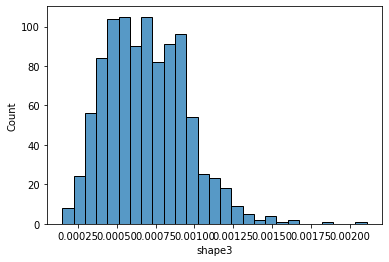

shape4
 Min: 0.00014532943916546206 Max: 0.0019957072508569635 
 mean: 0.0006704474666542003 std: 0.0002537183147991977 
 median: 0.0006562296341318685 
 mode: 0.0004001299373384896


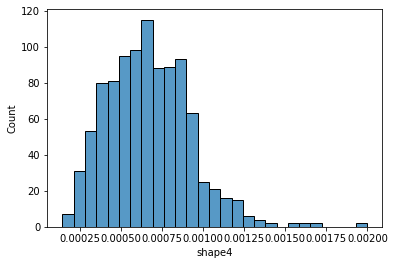

shape5
 Min: 0.00013934029169064148 Max: 0.002148689911573688 
 mean: 0.0006496806609804907 std: 0.0002512477649945927 
 median: 0.0006392606291761316 
 mode: 0.00028011076531631


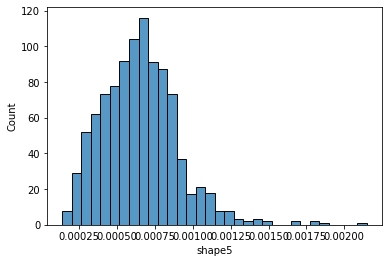

shape6
 Min: 0.00013627071472438866 Max: 0.0022640351371675635 
 mean: 0.0006319023953995159 std: 0.00025082362778954296 
 median: 0.000624060233899068 
 mode: 0.0003743099372939718


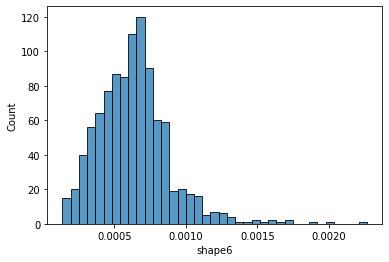

shape7
 Min: 9.291068366875338e-05 Max: 0.0023028464126561153 
 mean: 0.0006171260956842101 std: 0.00025521598614929486 
 median: 0.0006037527046495448 
 mode: 0.0005487594040125256


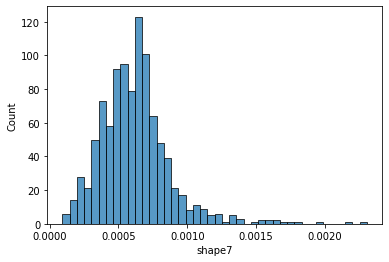

shape8
 Min: 7.993580504840585e-05 Max: 0.0024363297370160724 
 mean: 0.0006035124475386323 std: 0.000265226105255465 
 median: 0.000584479158772923 
 mode: 0.000415833529252578


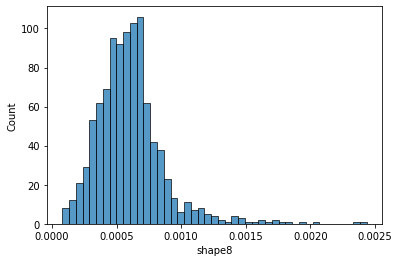

shape9
 Min: 8.751117078579501e-05 Max: 0.0025182266041675213 
 mean: 0.0005900646900660766 std: 0.0002794641414981056 
 median: 0.0005614173755275703 
 mode: 0.00034587018001283783


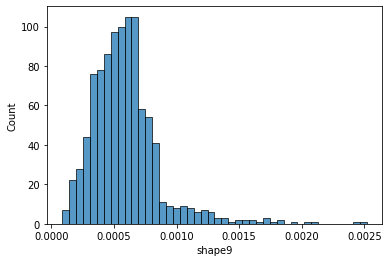

shape10
 Min: 0.00010883407735694307 Max: 0.002683795397182207 
 mean: 0.0005779870052942789 std: 0.00029718606833720537 
 median: 0.0005321233972291464 
 mode: 0.00030869234961366794


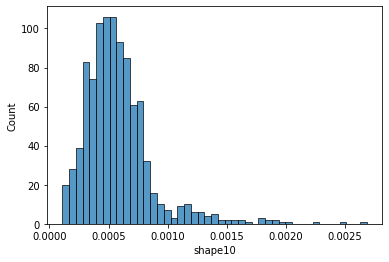

shape11
 Min: 7.598811283022452e-05 Max: 0.002769960115854855 
 mean: 0.0005690609493862568 std: 0.0003176344657628342 
 median: 0.0005030134673651386 
 mode: 0.00028675888074181425


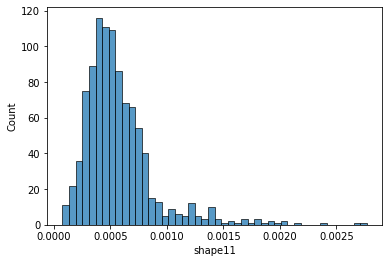

shape12
 Min: 0.0001063243473662428 Max: 0.0028851339953839504 
 mean: 0.0005615134796173809 std: 0.00033497824851825365 
 median: 0.000477241102346943 
 mode: 0.0003890143241151337


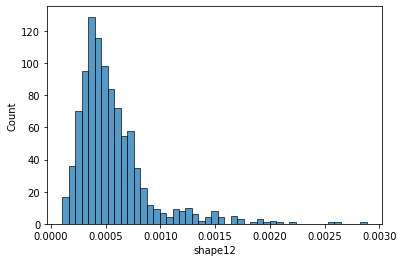

shape13
 Min: 8.087372963176603e-05 Max: 0.0030021889176072855 
 mean: 0.0005555705077629834 std: 0.0003506740785822074 
 median: 0.0004597492990893639 
 mode: 0.00033288458777715576


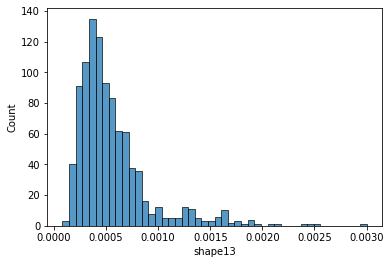

shape14
 Min: 9.677131750501165e-05 Max: 0.0028114441844826338 
 mean: 0.000550802143840817 std: 0.00036085759483398975 
 median: 0.00044621543108084417 
 mode: 0.00028290997719820655


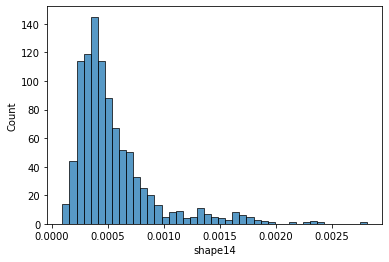

shape15
 Min: 0.00010188480956651585 Max: 0.002588048112492078 
 mean: 0.0005456734095104824 std: 0.0003706408786368849 
 median: 0.0004336509598291618 
 mode: 0.00022962363447523462


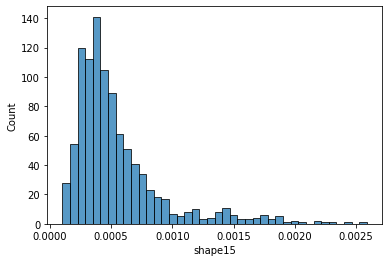

shape16
 Min: 7.384827314915244e-05 Max: 0.0024703461807278494 
 mean: 0.0005428102708036892 std: 0.0003774353244287573 
 median: 0.0004251895940833321 
 mode: 0.00034508045289119877


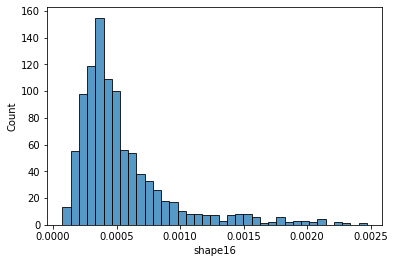

shape17
 Min: 6.201607696334619e-05 Max: 0.0024070008478386646 
 mean: 0.0005422324958265826 std: 0.0003811555527361032 
 median: 0.0004255094580086702 
 mode: 0.00027079333217589846


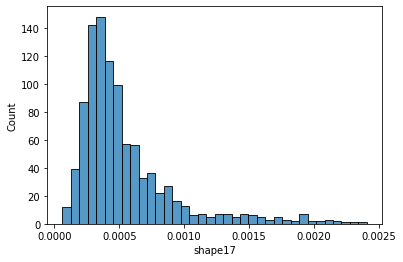

shape18
 Min: 4.408102841719077e-05 Max: 0.0023368673972217016 
 mean: 0.0005421446501800932 std: 0.0003779312852429418 
 median: 0.0004266689638168993 
 mode: 0.00024260057010183788


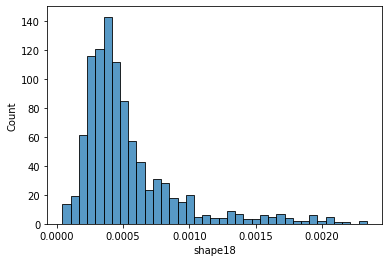

shape19
 Min: 4.7125889557823236e-05 Max: 0.0022134485144249733 
 mean: 0.0005421291406453663 std: 0.000367938366113019 
 median: 0.0004329462651810744 
 mode: 0.0002067086342981203


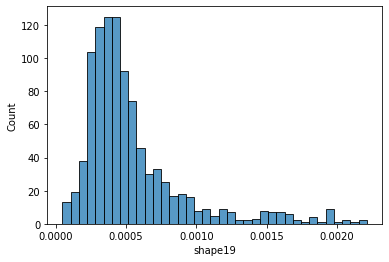

shape20
 Min: 6.128712190597678e-05 Max: 0.0022975585897191536 
 mean: 0.000546190680315641 std: 0.0003562190836262346 
 median: 0.0004472449710544965 
 mode: 0.00024718944617137457


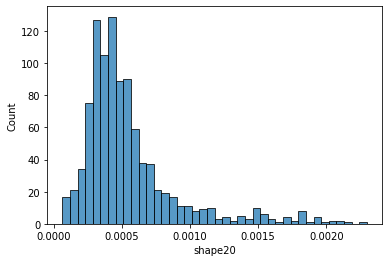

shape21
 Min: 5.6434407548866097e-05 Max: 0.0021879047898032953 
 mean: 0.0005538419674795569 std: 0.00033977712693361345 
 median: 0.00047163376330607183 
 mode: 0.0004895201654507966


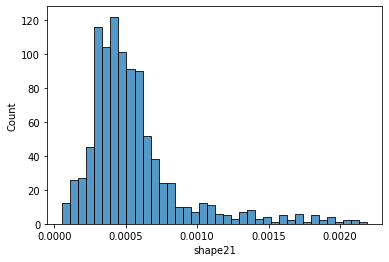

shape22
 Min: 6.407194734894257e-05 Max: 0.002234401863888496 
 mean: 0.00056309941459084 std: 0.0003219316323476029 
 median: 0.0004958320549239742 
 mode: 0.00032433739693958033


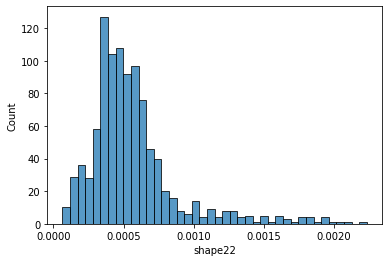

shape23
 Min: 4.637992443467657e-05 Max: 0.0022109540388153804 
 mean: 0.0005745770537663213 std: 0.00030447348540920576 
 median: 0.0005222985783455065 
 mode: 0.00041476397352998174


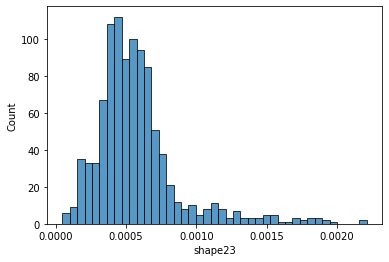

shape24
 Min: 8.461242026820565e-05 Max: 0.0022245239109853973 
 mean: 0.0005854114293158451 std: 0.0002855553394646243 
 median: 0.0005504035001669421 
 mode: 0.0003943622289931919


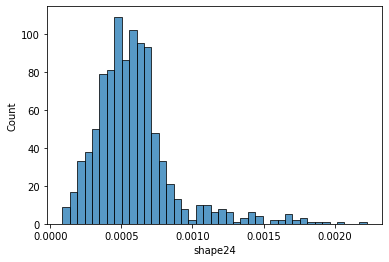

shape25
 Min: 5.972221659291978e-05 Max: 0.0020887171108673326 
 mean: 0.0005985613347966874 std: 0.0002693590053217933 
 median: 0.0005737653650911552 
 mode: 0.0004354151930452025


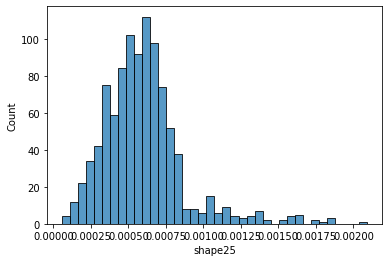

shape26
 Min: 3.1169514225644365e-05 Max: 0.0019563850302043375 
 mean: 0.000612994831167533 std: 0.0002553862015342486 
 median: 0.000593553811943764 
 mode: 0.0005012443560558653


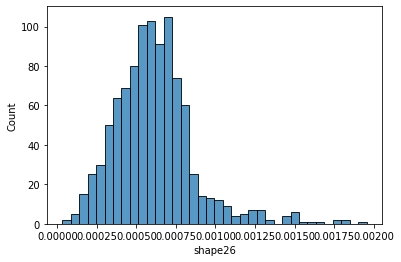

shape27
 Min: 8.797712989881474e-05 Max: 0.0018419026553495445 
 mean: 0.0006275613944299808 std: 0.0002473758555219536 
 median: 0.0006136666680850611 
 mode: 0.0004656215814447597


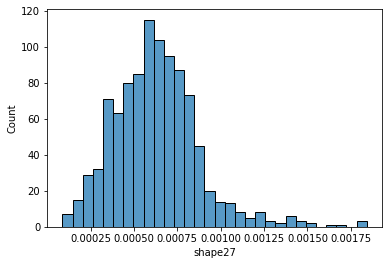

shape28
 Min: 8.671024055843124e-05 Max: 0.0018085635625351136 
 mean: 0.0006438769938633132 std: 0.0002450287996697296 
 median: 0.0006380863795720709 
 mode: 0.0004737477638049625


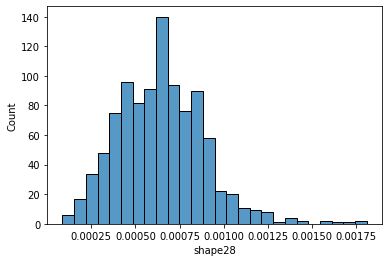

shape29
 Min: 7.0472516753858e-05 Max: 0.0018224383499653575 
 mean: 0.0006628346999761505 std: 0.0002469413782898669 
 median: 0.0006630401402964771 
 mode: 0.000700054904375302


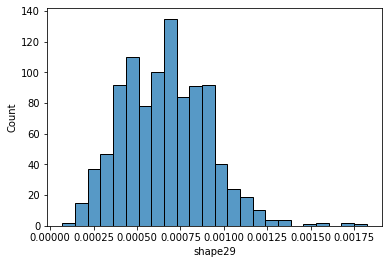

shape30
 Min: 7.80499540230929e-05 Max: 0.0018530819825378242 
 mean: 0.0006864672586071154 std: 0.0002525843279299628 
 median: 0.0006869589896241273 
 mode: 0.0003930727367887743


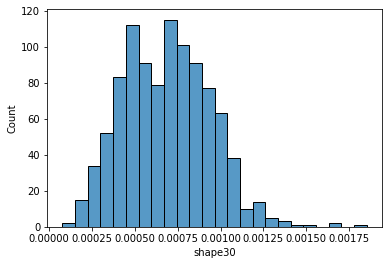

shape31
 Min: 6.743072649746098e-05 Max: 0.0020003978693853845 
 mean: 0.0007108420435435212 std: 0.00026199737340072124 
 median: 0.0007033276071305107 
 mode: 0.0010581399723876362


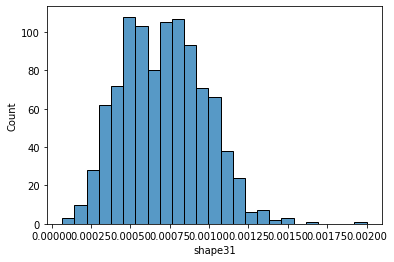

shape32
 Min: 5.314658769508857e-05 Max: 0.0021214481367793562 
 mean: 0.0007332401401783572 std: 0.00027371734235235174 
 median: 0.000723013562542008 
 mode: 0.00046351256145362325


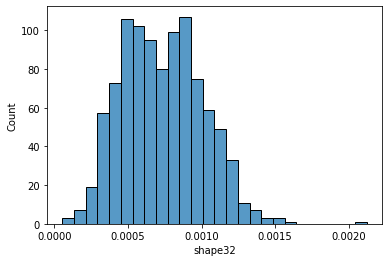

shape33
 Min: 0.00010609437179309832 Max: 0.002108375812849777 
 mean: 0.000738424238949322 std: 0.00027702351623445025 
 median: 0.000730523102959343 
 mode: 0.0010509475611007537


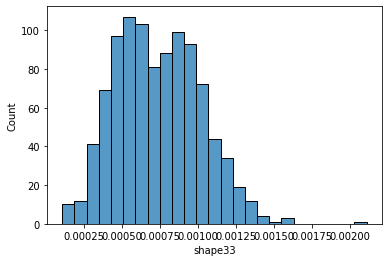

shape34
 Min: 5.455851165733574e-05 Max: 0.001986525550903077 
 mean: 0.0007178434258524504 std: 0.00026652838144593005 
 median: 0.0007121913314510659 
 mode: 0.00036700264628939695


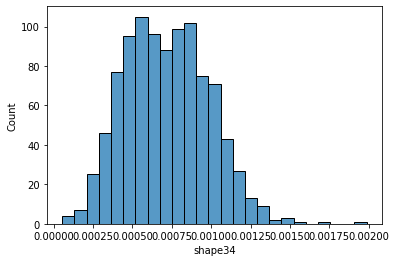

shape35
 Min: 3.386742649223701e-05 Max: 0.0018657583898425392 
 mean: 0.0006899157770877993 std: 0.0002557301137131876 
 median: 0.0006768508847055964 
 mode: 0.0005932639841163347


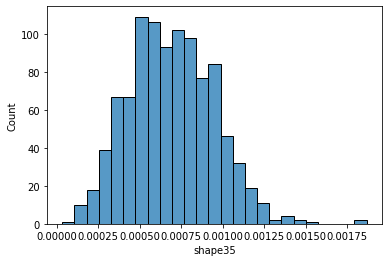

shape36
 Min: 6.943358943253814e-05 Max: 0.0018845231702267879 
 mean: 0.000664441780129628 std: 0.0002484453053735755 
 median: 0.0006672323506704127 
 mode: 0.0005709569730418177


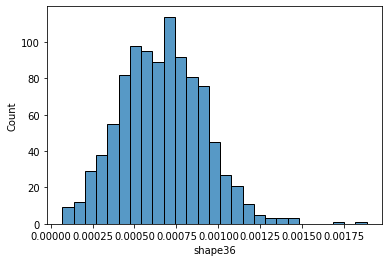

shape37
 Min: 6.663078012026645e-05 Max: 0.0020092800441929306 
 mean: 0.0006414152946344499 std: 0.00024153771042445416 
 median: 0.0006437627402880896 
 mode: 0.0003322348039050184


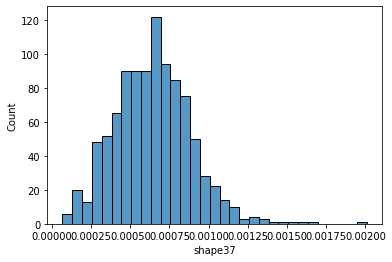

shape38
 Min: 6.401095125534589e-05 Max: 0.002104484019280283 
 mean: 0.0006204253586404618 std: 0.00023935797310166123 
 median: 0.0006210321196269475 
 mode: 0.0003707312706693657


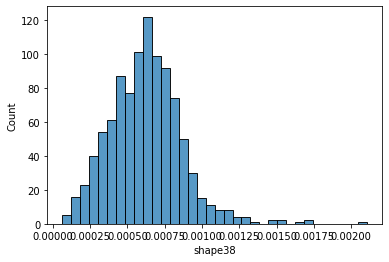

shape39
 Min: 6.229505962248155e-05 Max: 0.0021034861210535278 
 mean: 0.0006019233705454281 std: 0.00024438057104565113 
 median: 0.0005968518484938358 
 mode: 0.0005508382607452661


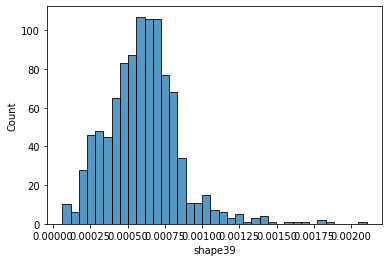

shape40
 Min: 6.817867578126394e-05 Max: 0.002131726256204908 
 mean: 0.0005853618074166318 std: 0.00025448449873429266 
 median: 0.000575214532290246 
 mode: 0.00021616663430950843


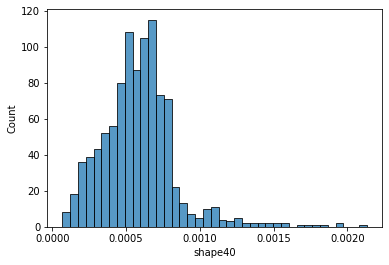

shape41
 Min: 8.694921980702666e-05 Max: 0.002227018352745547 
 mean: 0.0005720581834915082 std: 0.0002712548377545297 
 median: 0.0005556356059311792 
 mode: 0.00018271330690707163


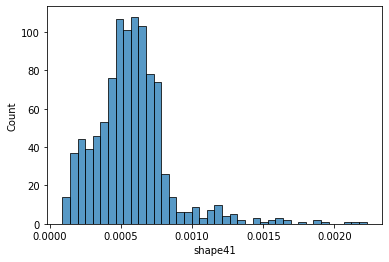

shape42
 Min: 5.1889653708632904e-05 Max: 0.0022821938134684056 
 mean: 0.000561808740025824 std: 0.00028888318495695186 
 median: 0.0005339474246878149 
 mode: 0.0004212412654390301


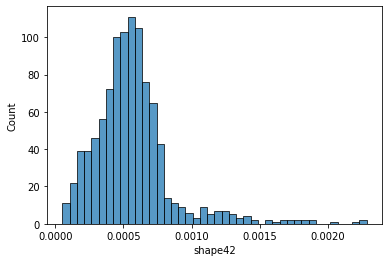

shape43
 Min: 5.630941459515637e-05 Max: 0.0023213036886769716 
 mean: 0.0005560756894988205 std: 0.00030487415416129035 
 median: 0.0005135681013019393 
 mode: 0.000358515725556361


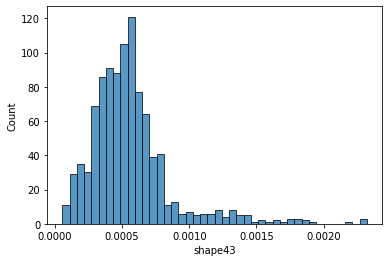

shape44
 Min: 3.5315376404753886e-05 Max: 0.002345347521083439 
 mean: 0.0005508757864182888 std: 0.000320329200391973 
 median: 0.0004899899353060968 
 mode: 0.0003034139653270858


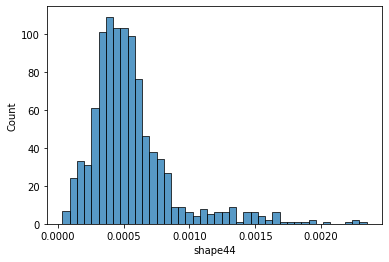

shape45
 Min: 4.827883455831153e-05 Max: 0.002411689537546924 
 mean: 0.0005472716800288207 std: 0.0003334250572185407 
 median: 0.00046319770735768603 
 mode: 0.0003076526700636987


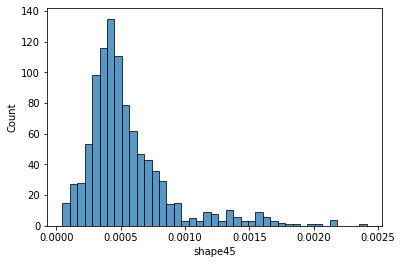

shape46
 Min: 5.534046868801498e-05 Max: 0.002287182403067426 
 mean: 0.0005449960984271873 std: 0.0003445822217397359 
 median: 0.0004467152078920152 
 mode: 0.00013306114697292284


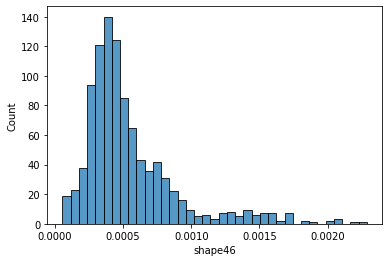

shape47
 Min: 4.348405455479586e-05 Max: 0.002339062259707083 
 mean: 0.0005446147694084119 std: 0.0003519065109475639 
 median: 0.00044108270868928545 
 mode: 0.0010009988334592824


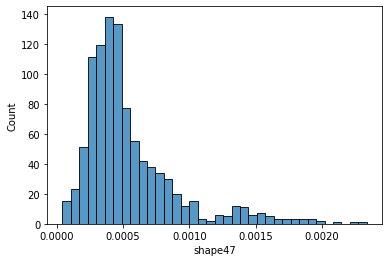

shape48
 Min: 5.1042697299361844e-05 Max: 0.0024546847946579527 
 mean: 0.0005444976822880186 std: 0.00035836031818067577 
 median: 0.0004371644295942099 
 mode: 0.0002580567005053378


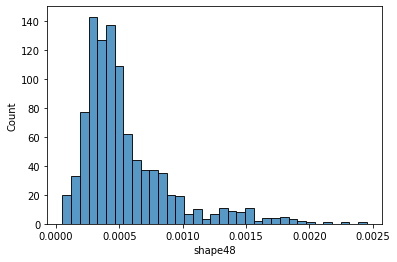

shape49
 Min: 2.167176516560088e-05 Max: 0.0023125240539177026 
 mean: 0.0005464687150237235 std: 0.00036095036067585953 
 median: 0.00044125263368169495 
 mode: 0.0001777741972309718


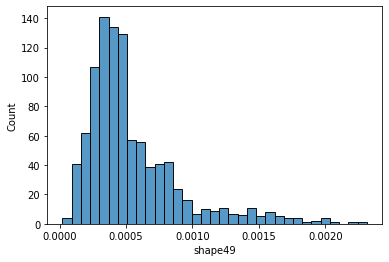

shape50
 Min: 6.256204295457864e-05 Max: 0.002166651115373963 
 mean: 0.0005469979494327169 std: 0.0003581128941121603 
 median: 0.00044241212123562553 
 mode: 0.000384636018081731


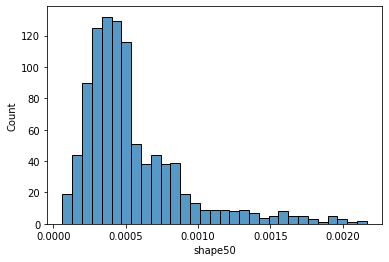

shape51
 Min: 0.00011516336844471593 Max: 0.002031036049200464 
 mean: 0.000546106314985231 std: 0.0003470835103831291 
 median: 0.00044994376009036566 
 mode: 0.00024003119020882675


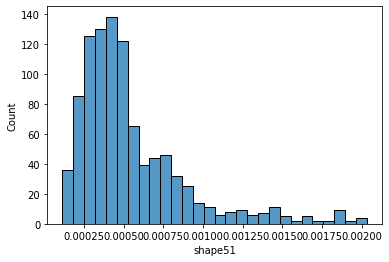

shape52
 Min: 0.00010742422981080726 Max: 0.0020390197855312273 
 mean: 0.0005471255343938423 std: 0.0003311474455811251 
 median: 0.0004536620797850985 
 mode: 0.00028744868266864003


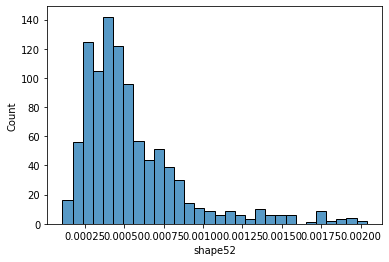

shape53
 Min: 9.012193889606753e-05 Max: 0.0020037910690738916 
 mean: 0.0005511376129180667 std: 0.00031381168104665353 
 median: 0.00047147383869703134 
 mode: 0.00025940635126295975


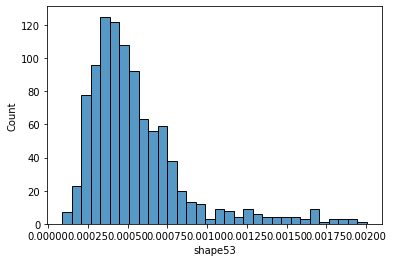

shape54
 Min: 0.0001142934682527144 Max: 0.0020229524512248923 
 mean: 0.0005553909442266936 std: 0.0002946708195236101 
 median: 0.0005003248166618934 
 mode: 0.0003091722013490787


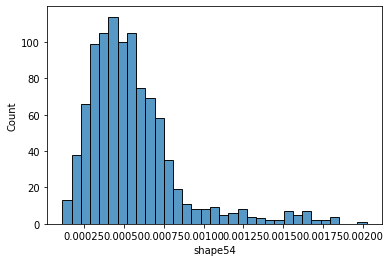

shape55
 Min: 0.00011064387874029077 Max: 0.0019905176047199597 
 mean: 0.0005617568016571615 std: 0.0002781995974485267 
 median: 0.0005228332988334397 
 mode: 0.0003469997886091074


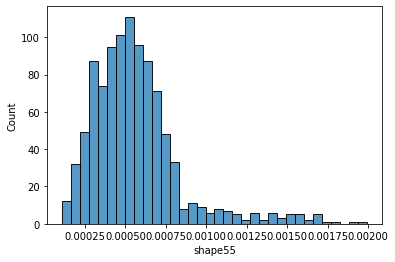

shape56
 Min: 9.59024012177101e-05 Max: 0.0019393183060493438 
 mean: 0.0005692164215770346 std: 0.00026459855017434174 
 median: 0.0005433673491537006 
 mode: 0.00040539781520024454


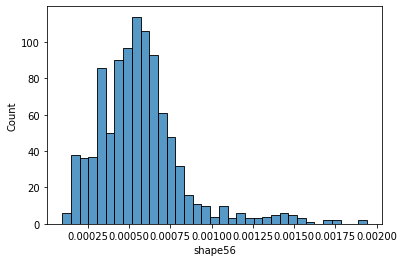

shape57
 Min: 7.60291097139899e-05 Max: 0.0018901126112138339 
 mean: 0.0005779855382961145 std: 0.0002533986569411859 
 median: 0.0005620520191666468 
 mode: 0.0003307452977433385


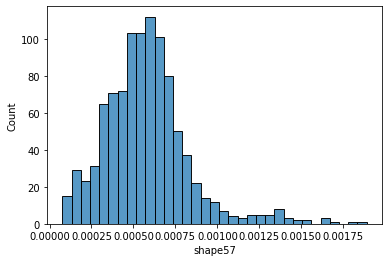

shape58
 Min: 5.977321354587734e-05 Max: 0.0018590708564079662 
 mean: 0.0005909891446450412 std: 0.00024788198487852464 
 median: 0.0005873724630143301 
 mode: 0.0004797049231930975


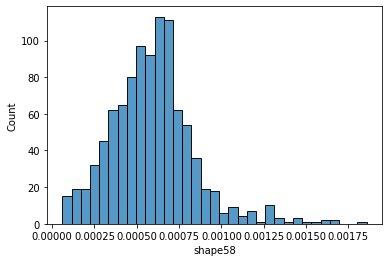

shape59
 Min: 6.303601318877396e-05 Max: 0.001738887258848809 
 mean: 0.0006068801867975844 std: 0.000244830850783959 
 median: 0.0006077952549976835 
 mode: 0.0005374655395172311


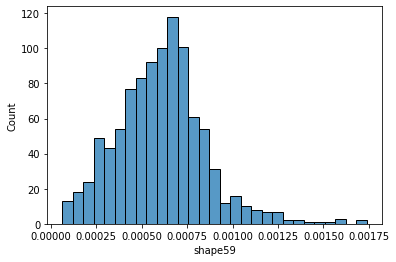

shape60
 Min: 4.162413370372714e-05 Max: 0.001758752487746063 
 mean: 0.000626192046538934 std: 0.00024602298816785975 
 median: 0.0006321851288326487 
 mode: 0.000174114841131267


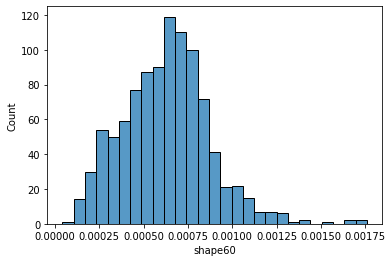

shape61
 Min: 8.675223691587717e-05 Max: 0.0019198558967192289 
 mean: 0.0006478610452251753 std: 0.0002479938854379279 
 median: 0.0006501735912978405 
 mode: 0.00037429994103632073


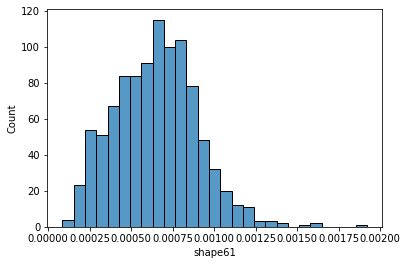

shape62
 Min: 0.00013395102816043613 Max: 0.002087918779778474 
 mean: 0.0006743366098332578 std: 0.00025187680846973967 
 median: 0.0006739278594380823 
 mode: 0.000664709031994295


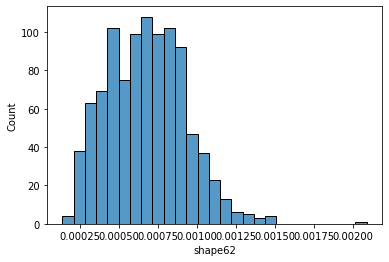

shape63
 Min: 0.0001684458122075613 Max: 0.0022601439493460584 
 mean: 0.0007035558157114614 std: 0.00025856314279630577 
 median: 0.0006926050935491167 
 mode: 0.00039842061996292965


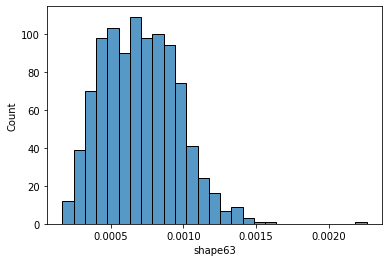

shape64
 Min: 0.00016588624011682203 Max: 0.0024283491720858046 
 mean: 0.0007319917890668625 std: 0.0002681213475969948 
 median: 0.0007109971815655447 
 mode: 0.00042569937716123646


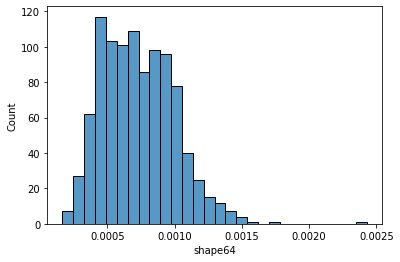

texture1
 Min: 0.0 Max: 0.3457787959415126 
 mean: 0.020879701077672657 std: 0.03958165260538557 
 median: 0.006812740493159609 
 mode: 0.0


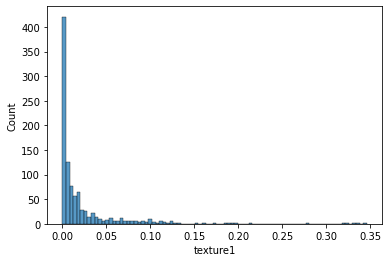

texture2
 Min: 0.0 Max: 0.11168447719451395 
 mean: 0.01148158232436953 std: 0.016556576284300947 
 median: 0.004871116823500388 
 mode: 0.0


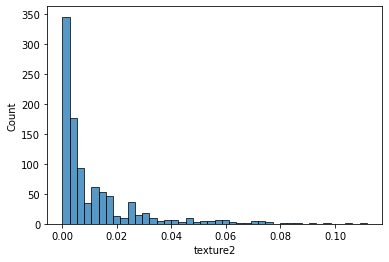

texture3
 Min: 0.0 Max: 0.07522342123758753 
 mean: 0.010180626660145443 std: 0.012656534144768972 
 median: 0.005841902808624884 
 mode: 0.0


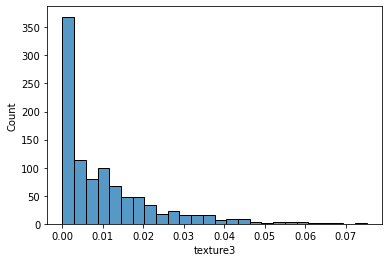

texture4
 Min: 0.0 Max: 0.1493936688848628 
 mean: 0.015044778732508915 std: 0.021221284897011573 
 median: 0.005841902808624884 
 mode: 0.0


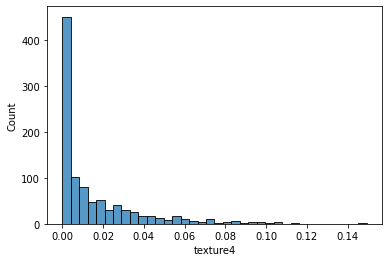

texture5
 Min: 0.0 Max: 0.183296081790182 
 mean: 0.02592370666958929 std: 0.03602298956596858 
 median: 0.005841902808624884 
 mode: 0.0


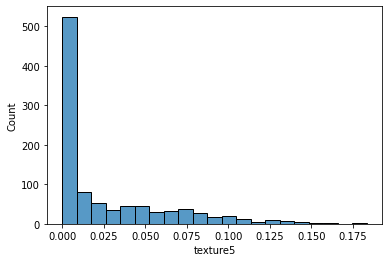

texture6
 Min: 0.0 Max: 0.13669637876767904 
 mean: 0.009635637043425896 std: 0.019594694613497433 
 median: 0.0009765230461306741 
 mode: 0.0


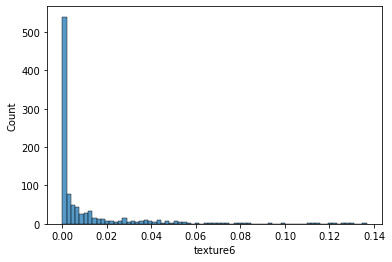

texture7
 Min: 0.0 Max: 0.1510802566128872 
 mean: 0.016360746995809177 std: 0.0204908793941954 
 median: 0.009718620842159931 
 mode: 0.0


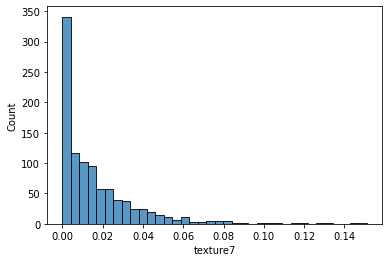

texture8
 Min: 0.0 Max: 0.1272844208640461 
 mean: 0.019086857502036772 std: 0.02378200975552482 
 median: 0.009718620842159931 
 mode: 0.0


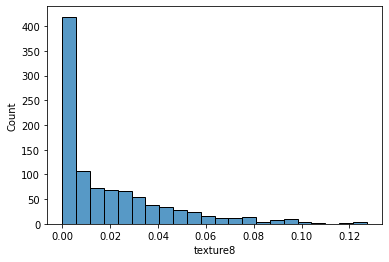

texture9
 Min: 0.0 Max: 0.17922510105253656 
 mean: 0.014576245337568952 std: 0.02146742284858935 
 median: 0.006812740493159609 
 mode: 0.0


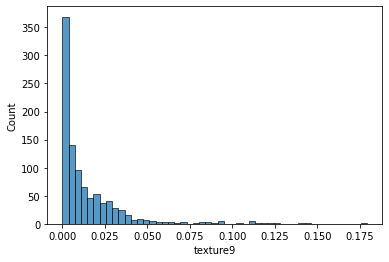

texture10
 Min: 0.0 Max: 0.25694189766440473 
 mean: 0.01913732186968827 std: 0.03484007113996561 
 median: 0.003898391388388962 
 mode: 0.0


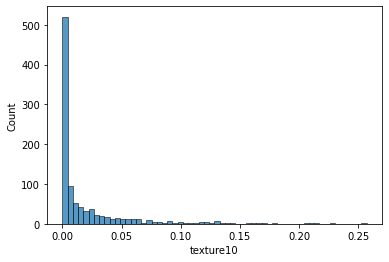

texture11
 Min: 0.0 Max: 0.25088322421468295 
 mean: 0.018116353351362913 std: 0.03134550947328033 
 median: 0.002925715916203623 
 mode: 0.0


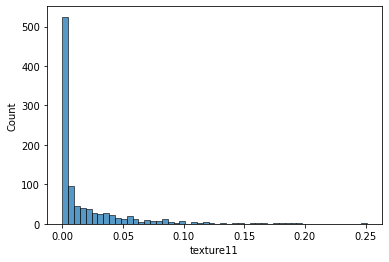

texture12
 Min: 0.0 Max: 0.4106582669528058 
 mean: 0.024043333813217004 std: 0.06329400389637195 
 median: 0.0 
 mode: 0.0


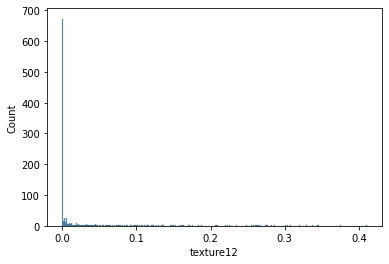

texture13
 Min: 0.0 Max: 0.10467528093813153 
 mean: 0.009668940180087866 std: 0.013856695021985187 
 median: 0.004871116823500388 
 mode: 0.0


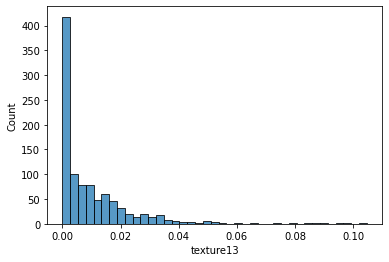

texture14
 Min: 0.0 Max: 0.16937983953582358 
 mean: 0.012558427268892263 std: 0.017545379408448428 
 median: 0.006812740493159609 
 mode: 0.0


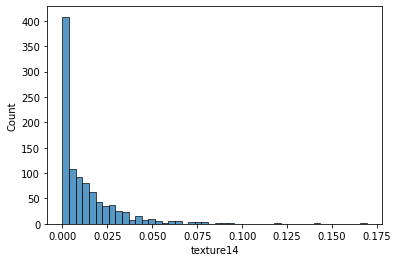

texture15
 Min: 0.0 Max: 0.617086533946981 
 mean: 0.010436421977607194 std: 0.051722276078334586 
 median: 0.0 
 mode: 0.0


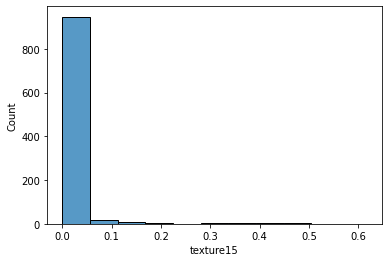

texture16
 Min: 0.0 Max: 0.10555749625587438 
 mean: 0.004470399957069875 std: 0.011209077716244574 
 median: 0.0 
 mode: 0.0


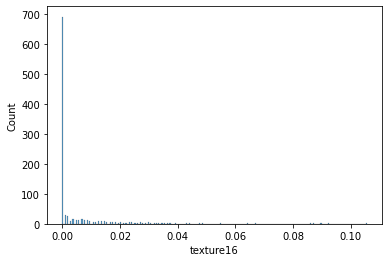

texture17
 Min: 0.0 Max: 0.17922510105253656 
 mean: 0.014663210464903646 std: 0.02508243525261559 
 median: 0.003898391388388962 
 mode: 0.0


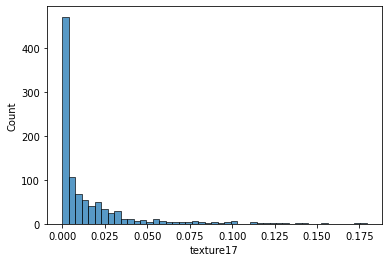

texture18
 Min: 0.0 Max: 0.1064389339557264 
 mean: 0.006066642503474684 std: 0.013271372545435336 
 median: 0.0009765230461306741 
 mode: 0.0


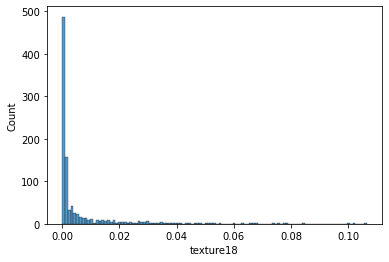

texture19
 Min: 0.0 Max: 0.26296408453945863 
 mean: 0.02369321552185877 std: 0.030275087407815173 
 median: 0.01357938144043876 
 mode: 0.0


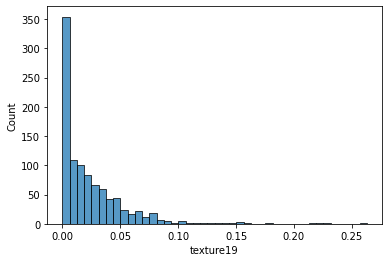

texture20
 Min: 0.0 Max: 0.09495466206992906 
 mean: 0.014282970424219155 std: 0.015923523228369627 
 median: 0.008750601564714027 
 mode: 0.0


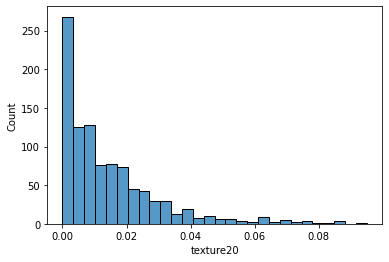

texture21
 Min: 0.0 Max: 0.09317699709615025 
 mean: 0.0028029597226325734 std: 0.009797451436502569 
 median: 0.0 
 mode: 0.0


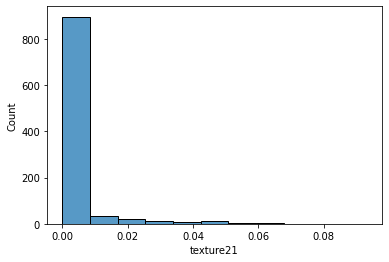

texture22
 Min: 0.0 Max: 0.16358885692124228 
 mean: 0.012865238135236783 std: 0.02078468825751121 
 median: 0.002925715916203623 
 mode: 0.0


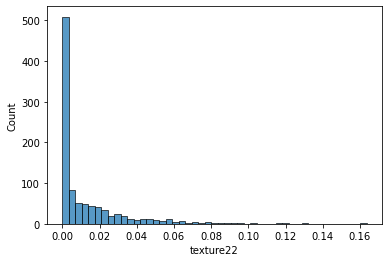

texture23
 Min: 0.0 Max: 0.17840556596736312 
 mean: 0.01663973572698162 std: 0.022895715629136306 
 median: 0.007781644317900871 
 mode: 0.0


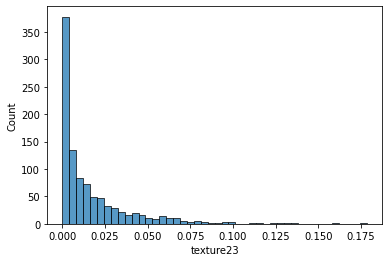

texture24
 Min: 0.0 Max: 0.12642998722665807 
 mean: 0.009960377602465254 std: 0.017282048710852017 
 median: 0.0019510953749186848 
 mode: 0.0


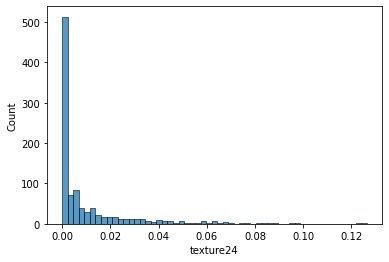

texture25
 Min: 0.0 Max: 0.14264473964105623 
 mean: 0.010258206414456706 std: 0.01569882683718384 
 median: 0.003898391388388962 
 mode: 0.0


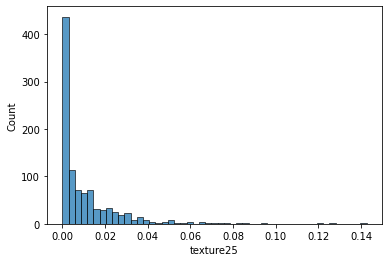

texture26
 Min: 0.0 Max: 0.26446206254963717 
 mean: 0.02223273094370791 std: 0.038687330720437396 
 median: 0.004871116823500388 
 mode: 0.0


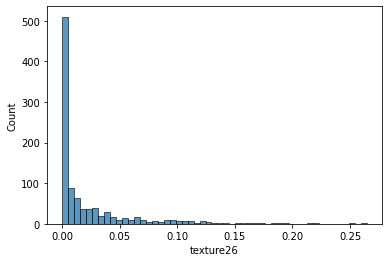

texture27
 Min: 0.0 Max: 0.20501216671365305 
 mean: 0.019657220648253763 std: 0.029910260431787492 
 median: 0.005841902808624884 
 mode: 0.0


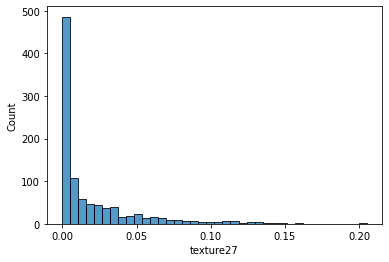

texture28
 Min: 0.0 Max: 0.11343582242476007 
 mean: 0.009889262297296808 std: 0.01760801787589901 
 median: 0.0019510953749186848 
 mode: 0.0


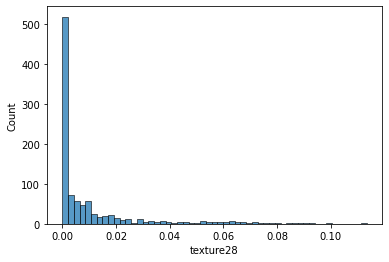

texture29
 Min: 0.0 Max: 0.19461238087818716 
 mean: 0.021161955468154654 std: 0.025334368551173766 
 median: 0.01261509404757725 
 mode: 0.0


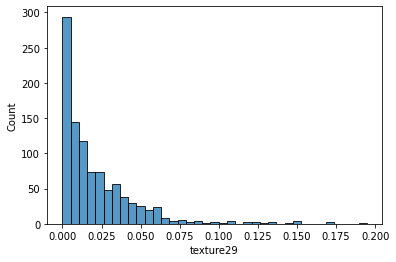

texture30
 Min: 0.0 Max: 0.08244412964262327 
 mean: 0.011527212054808153 std: 0.012653932334918877 
 median: 0.007781644317900871 
 mode: 0.0


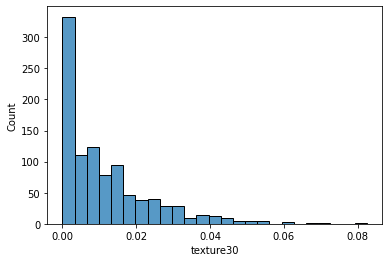

texture31
 Min: 0.0 Max: 0.20262242596010885 
 mean: 0.023274977163318344 std: 0.02580608861784989 
 median: 0.015504186535965254 
 mode: 0.0


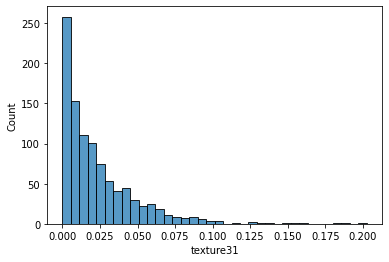

texture32
 Min: 0.0 Max: 0.11865376757040984 
 mean: 0.0059207012474146855 std: 0.014636921888637681 
 median: 0.0 
 mode: 0.0


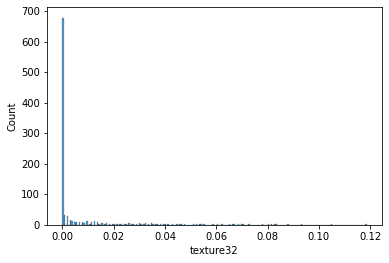

texture33
 Min: 0.0 Max: 0.35813587625723925 
 mean: 0.021528452527300398 std: 0.05224138915595881 
 median: 0.0 
 mode: 0.0


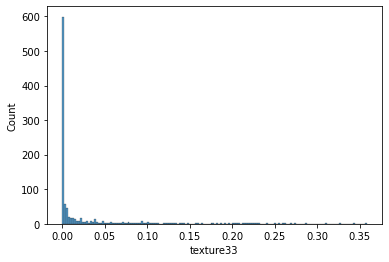

texture34
 Min: 0.0 Max: 0.3027086064684038 
 mean: 0.025387417967821263 std: 0.03892838411501544 
 median: 0.01068471459275277 
 mode: 0.0


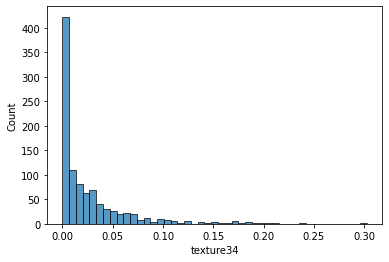

texture35
 Min: 0.0 Max: 0.07431680748896236 
 mean: 0.010391597728973348 std: 0.011616810312316856 
 median: 0.006812740493159609 
 mode: 0.0


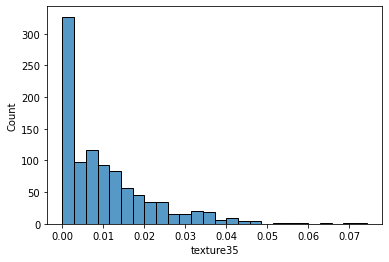

texture36
 Min: 0.0 Max: 0.10203298556511782 
 mean: 0.0032384989854755664 std: 0.012313602421342605 
 median: 0.0 
 mode: 0.0


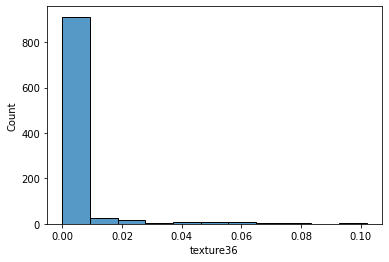

texture37
 Min: 0.0 Max: 0.4425296522449805 
 mean: 0.019503832456026854 std: 0.05100067652105742 
 median: 0.0 
 mode: 0.0


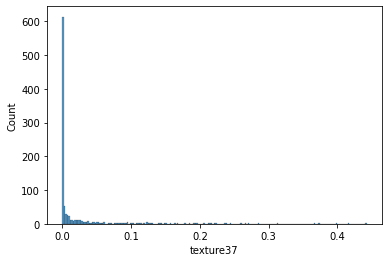

texture38
 Min: 0.0 Max: 0.1970213173019401 
 mean: 0.023322056115711438 std: 0.02662462126501613 
 median: 0.015504186535965254 
 mode: 0.0


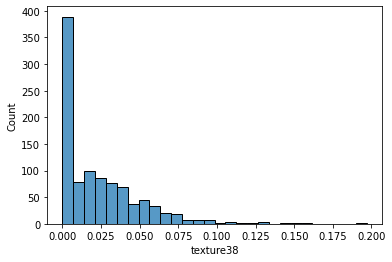

texture39
 Min: 0.0 Max: 0.1375508039571959 
 mean: 0.016692693198129122 std: 0.021029926589841097 
 median: 0.008750601564714027 
 mode: 0.0


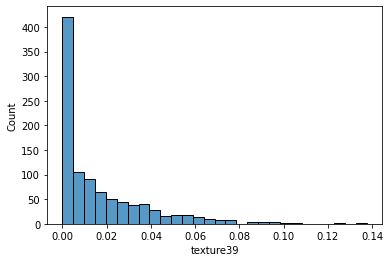

texture40
 Min: 0.0 Max: 0.15359624043985756 
 mean: 0.018703264943339477 std: 0.024378770467443533 
 median: 0.009718620842159931 
 mode: 0.0


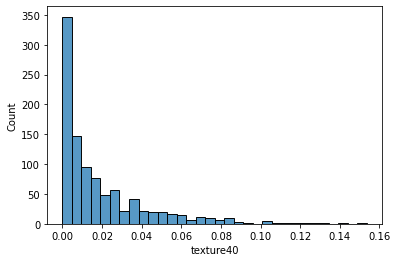

texture41
 Min: 0.0 Max: 0.34439080186550847 
 mean: 0.014731461888065879 std: 0.03714926670238725 
 median: 0.0 
 mode: 0.0


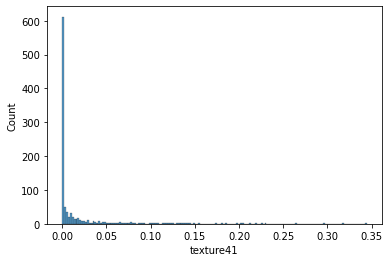

texture42
 Min: 0.0 Max: 0.06886259633484565 
 mean: 0.005822663823243621 std: 0.010437510188919653 
 median: 0.0009765230461306741 
 mode: 0.0


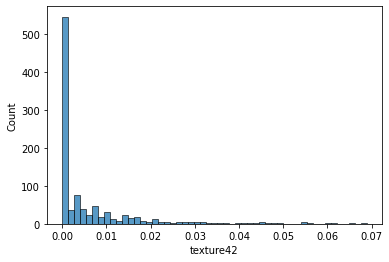

texture43
 Min: 0.0 Max: 0.1627648992447363 
 mean: 0.013625904302623976 std: 0.017437256165243893 
 median: 0.007781644317900871 
 mode: 0.0


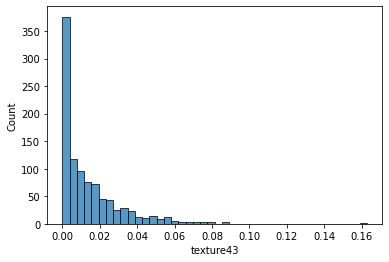

texture44
 Min: 0.0 Max: 0.34508503971943555 
 mean: 0.02400908047558914 std: 0.04249656287864874 
 median: 0.004871116823500388 
 mode: 0.0


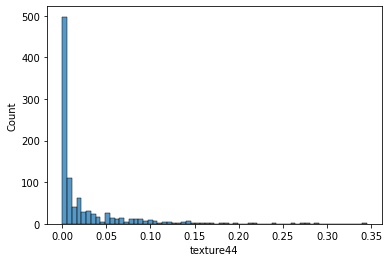

texture45
 Min: 0.0 Max: 0.1272844208640461 
 mean: 0.015886945188147303 std: 0.02035069875665633 
 median: 0.007781644317900871 
 mode: 0.0


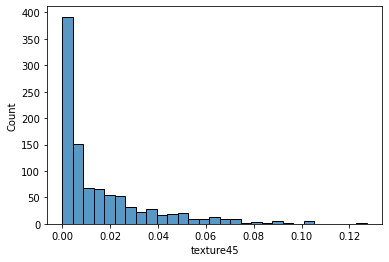

texture46
 Min: 0.0 Max: 0.16193175714582453 
 mean: 0.021202803972739225 std: 0.02529180961735723 
 median: 0.011650864324191847 
 mode: 0.0


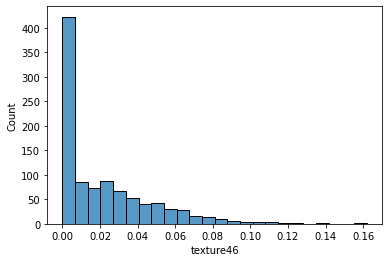

texture47
 Min: 0.0 Max: 0.09406667970571951 
 mean: 0.018302199151640063 std: 0.015602616259286 
 median: 0.015504186535965254 
 mode: 0.0


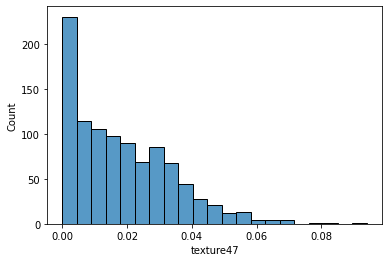

texture48
 Min: 0.0 Max: 0.22235924382548514 
 mean: 0.016213703441416635 std: 0.02834905592337847 
 median: 0.0009765230461306741 
 mode: 0.0


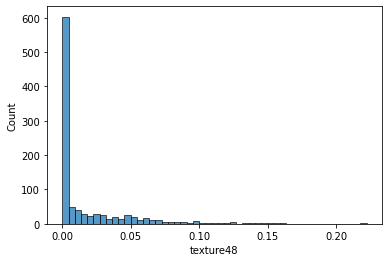

texture49
 Min: 0.0 Max: 0.10203298556511782 
 mean: 0.011529439750484755 std: 0.012850645606542314 
 median: 0.007781644317900871 
 mode: 0.0


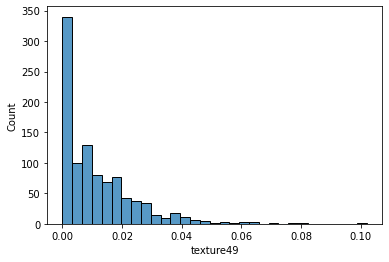

texture50
 Min: 0.0 Max: 0.19622446196294605 
 mean: 0.01846591447787342 std: 0.025829853737769397 
 median: 0.009718620842159931 
 mode: 0.0


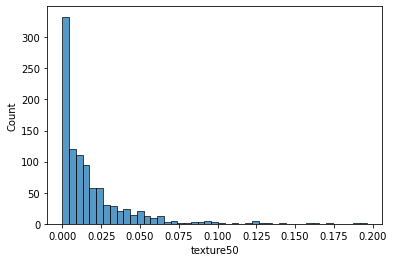

texture51
 Min: 0.0 Max: 0.3297568818716221 
 mean: 0.012656019663804445 std: 0.030873009959924244 
 median: 0.0 
 mode: 0.0


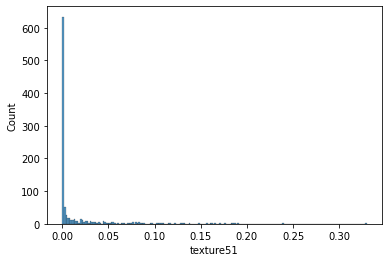

texture52
 Min: 0.0 Max: 0.11081660410002409 
 mean: 0.007170162390593493 std: 0.013491586908778375 
 median: 0.0 
 mode: 0.0


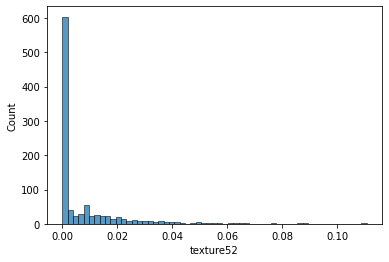

texture53
 Min: 0.0 Max: 0.15275542119218785 
 mean: 0.014144598816638442 std: 0.020857890762184993 
 median: 0.004871116823500388 
 mode: 0.0


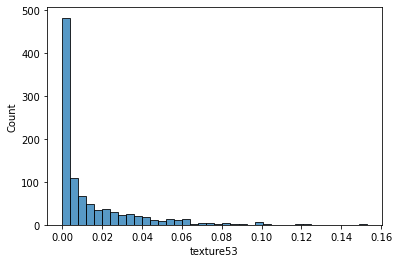

texture54
 Min: 0.0 Max: 0.24172190007540217 
 mean: 0.021510048111655446 std: 0.025810808584514025 
 median: 0.01261509404757725 
 mode: 0.0


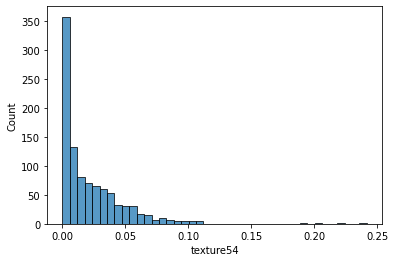

texture55
 Min: 0.0 Max: 0.35745763755415466 
 mean: 0.034139231529918546 std: 0.0572820436999094 
 median: 0.004871116823500388 
 mode: 0.0


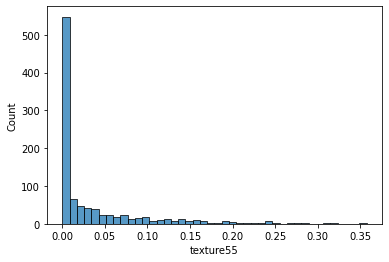

texture56
 Min: 0.0 Max: 0.18411162034045142 
 mean: 0.0048396374498414635 std: 0.018207881026336286 
 median: 0.0 
 mode: 0.0


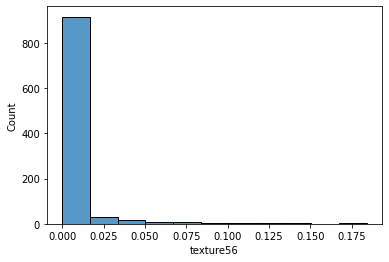

texture57
 Min: 0.0 Max: 0.15943668425649568 
 mean: 0.015565946721916826 std: 0.0222679006852937 
 median: 0.005841902808624884 
 mode: 0.0


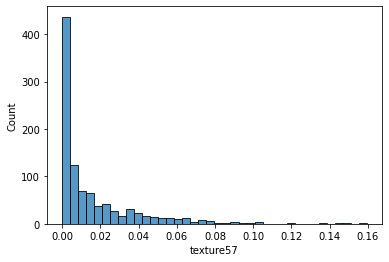

texture58
 Min: 0.0 Max: 0.1824882095732754 
 mean: 0.01122889531491796 std: 0.02378385458159647 
 median: 0.0009765230461306741 
 mode: 0.0


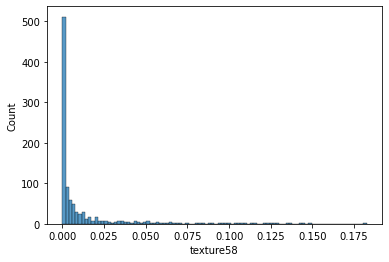

texture59
 Min: 0.0 Max: 0.10115669195973799 
 mean: 0.015868310747129653 std: 0.014885497733486085 
 median: 0.01261509404757725 
 mode: 0.0


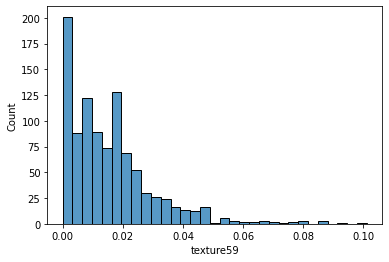

texture60
 Min: 0.0 Max: 0.4562406017934002 
 mean: 0.012492987675291648 std: 0.050778799814379195 
 median: 0.0 
 mode: 0.0


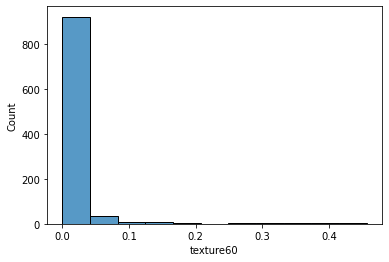

texture61
 Min: 0.0 Max: 0.14095253768302593 
 mean: 0.0026224664739692726 std: 0.011016288490594578 
 median: 0.0 
 mode: 0.0


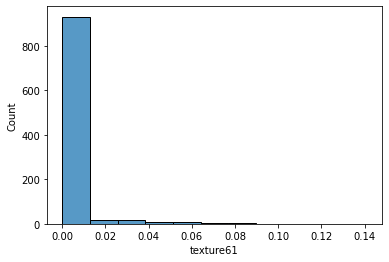

texture62
 Min: 0.0 Max: 0.3191662045217985 
 mean: 0.01941780097304923 std: 0.0358561557759389 
 median: 0.003898391388388962 
 mode: 0.0


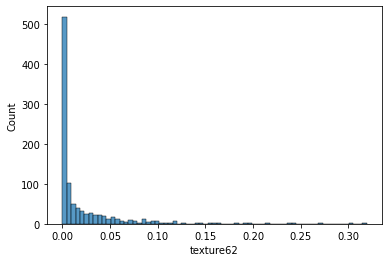

texture63
 Min: 0.0 Max: 0.08334248817384392 
 mean: 0.00885758525372536 std: 0.013475053131967304 
 median: 0.002925715916203623 
 mode: 0.0


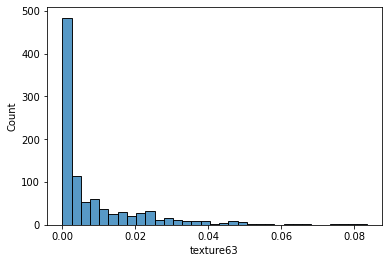

texture64
 Min: 0.0 Max: 0.13243078718048962 
 mean: 0.018990349896574978 std: 0.021943264755091958 
 median: 0.011650864324191847 
 mode: 0.0


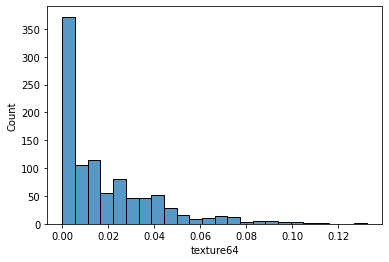

In [20]:
# log didnt remove outliers but lets see if it solved distbrutions or not 
for col in outliers:
    print(col)
    log_col = np.log1p(df[col])
    print(' Min:', log_col.min(), 'Max:', log_col.max(), '\n mean:', log_col.mean(), 'std:', log_col.std(),'\n', 'median:', log_col.median(), '\n', 'mode:', log_col.mode()[0])
    sns.histplot(log_col)
    plt.show()

**Note:**

log didnt solve problem bcz data values range is 0 -> 0.2 so log wont solve it lets try 1/(x+eps) converts small range to large number

eps = 10^-8 to be nearly 0 change for data that has (0 -> 0.2) value

margin1


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


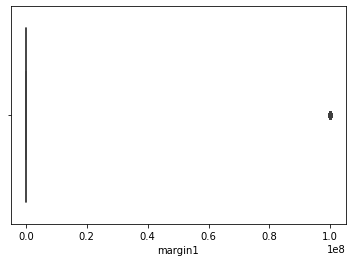

margin2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


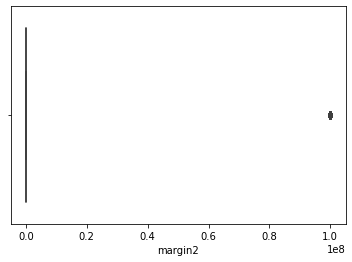

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin3


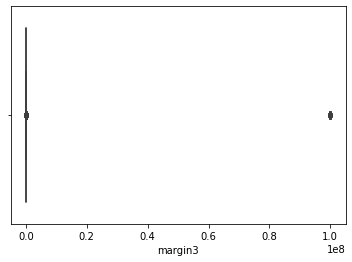

margin4


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


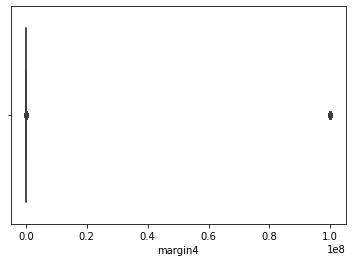

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin5


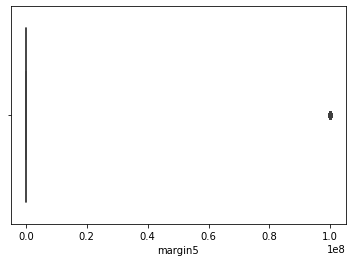

margin6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


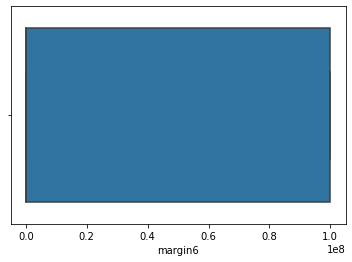

margin7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


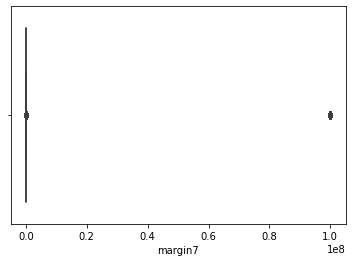

margin8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


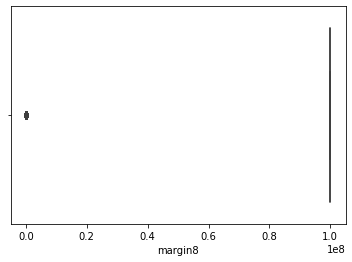

margin9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


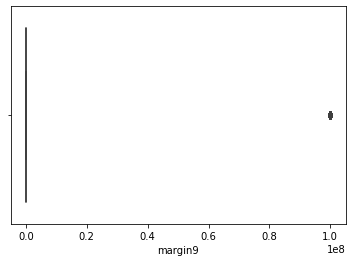

margin10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


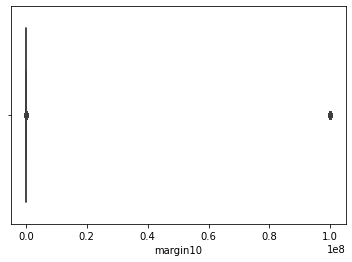

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin11


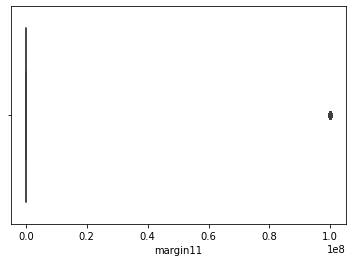

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin12


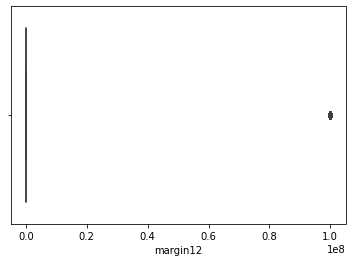

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin13


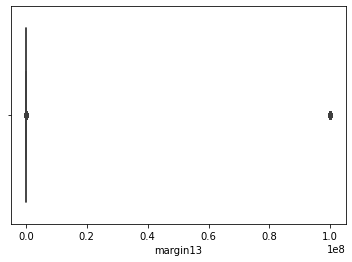

margin14


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


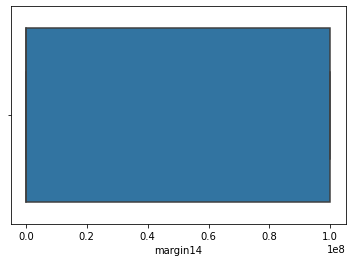

margin15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


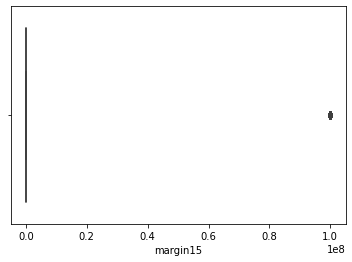

margin16


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


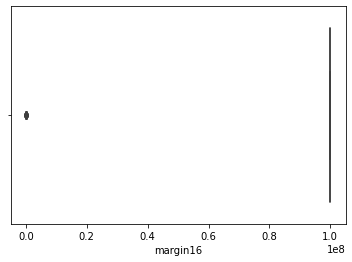

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin17


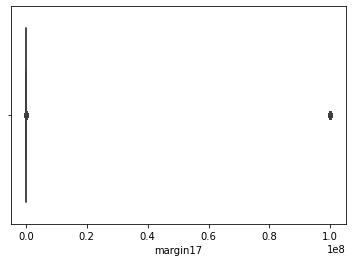

margin18


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


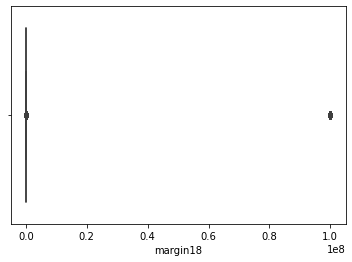

margin19


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


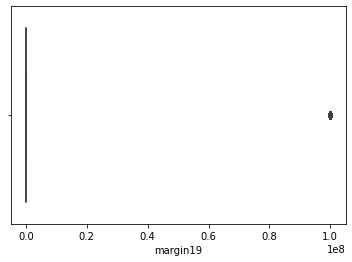

margin20


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


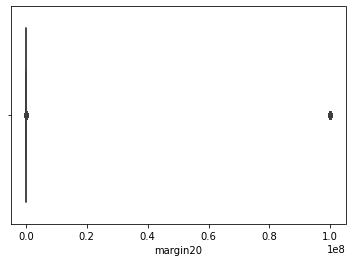

margin21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


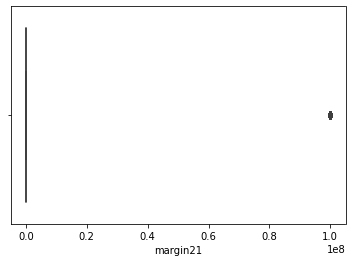

margin22


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


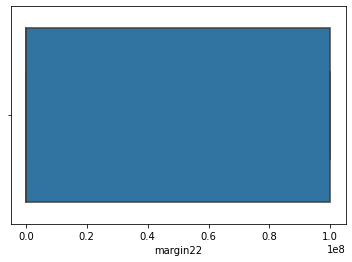

margin23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


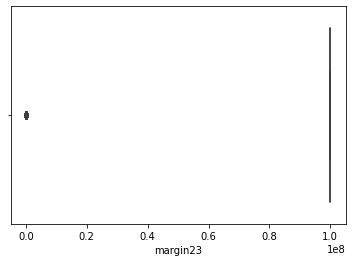

margin24


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


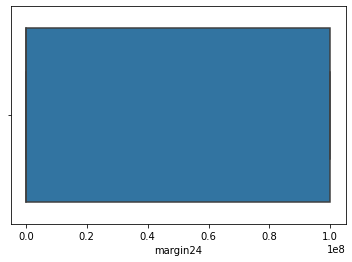

margin25


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


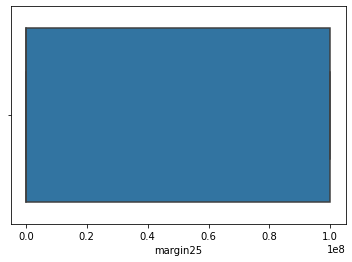

margin26


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


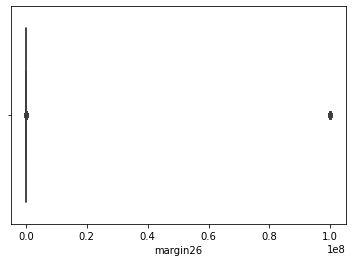

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin27


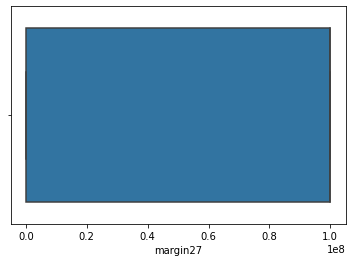

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin28


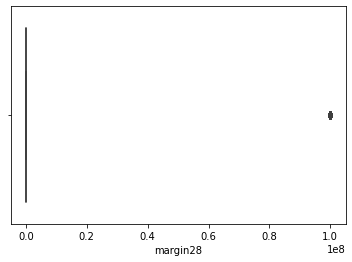

margin29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


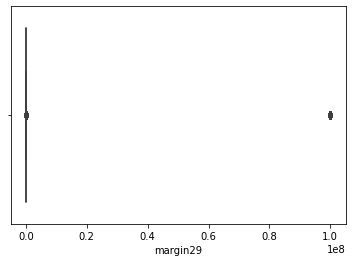

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin30


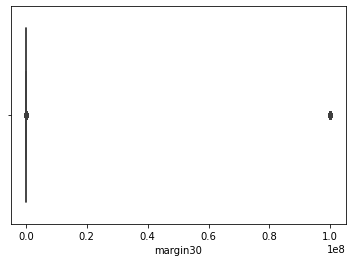

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin31


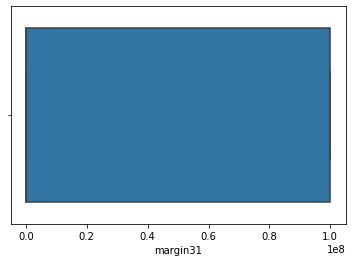

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin32


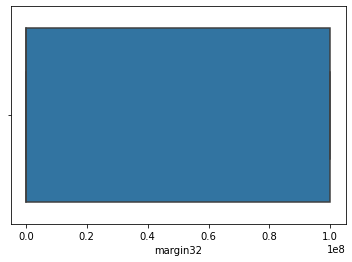

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin33


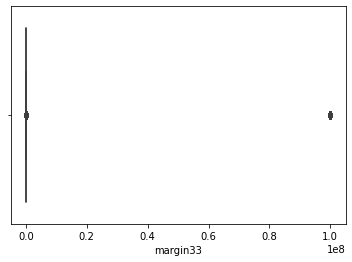

margin34


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


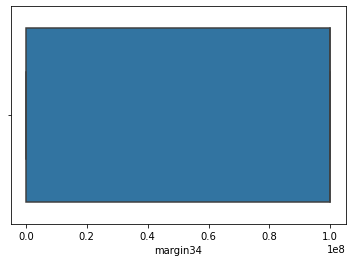

margin35


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


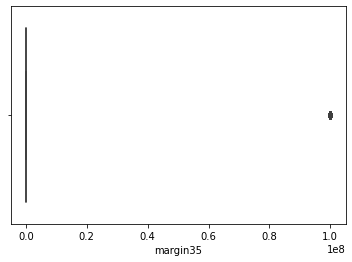

margin36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


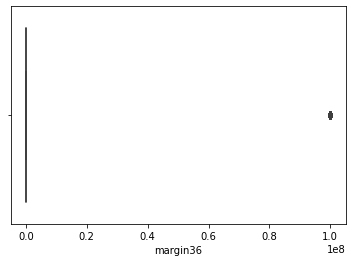

margin37


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


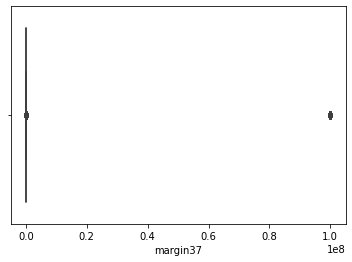

margin38


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


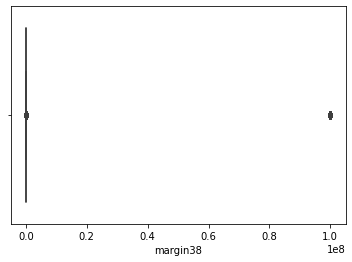

margin39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


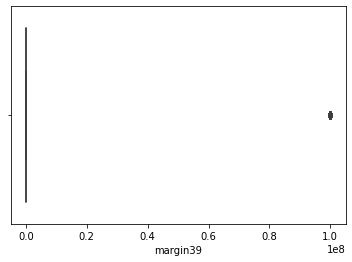

margin40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


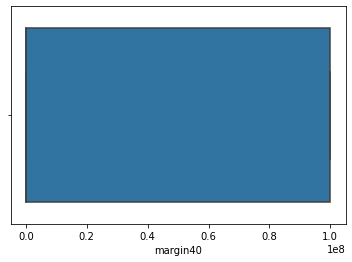

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin41


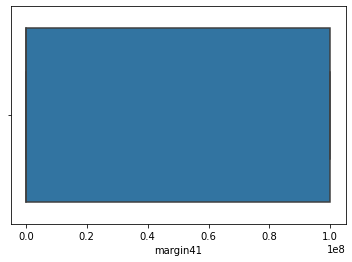

margin42


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


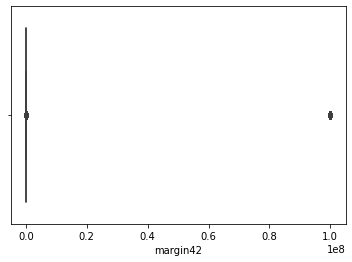

margin43


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


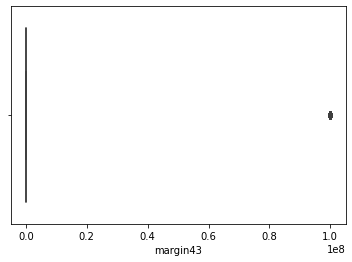

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin44


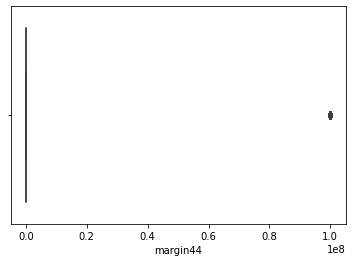

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin45


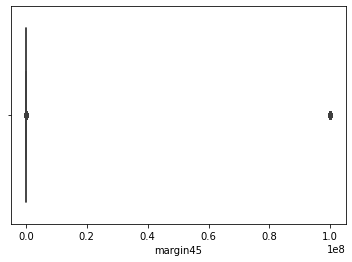

margin46


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


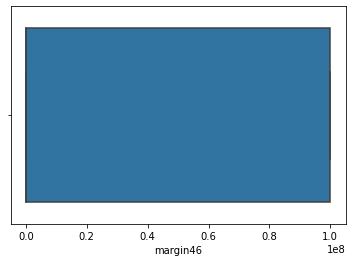

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin47


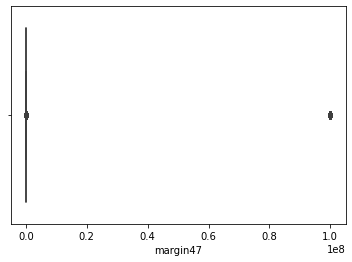

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin48


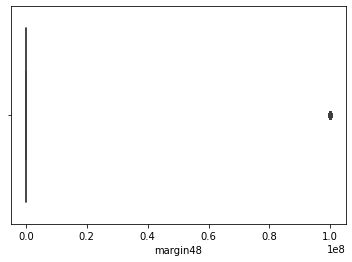

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin49


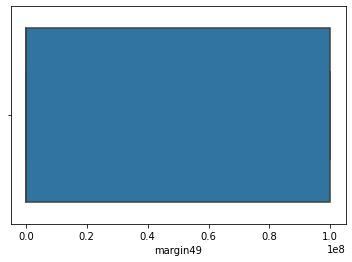

margin50


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


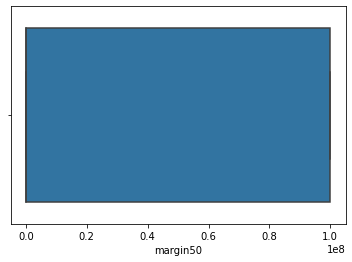

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin51


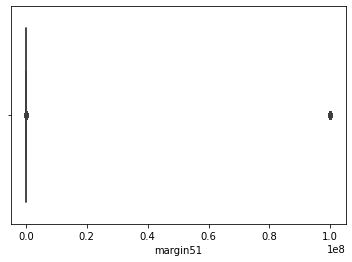

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin52


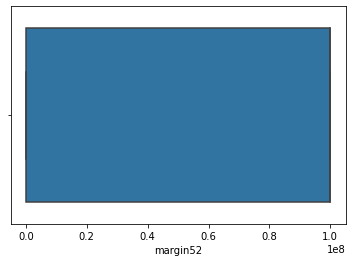

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin53


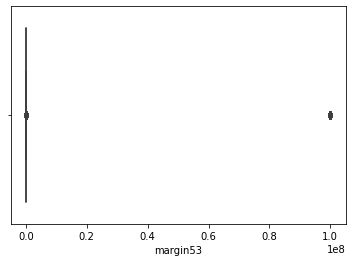

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin54


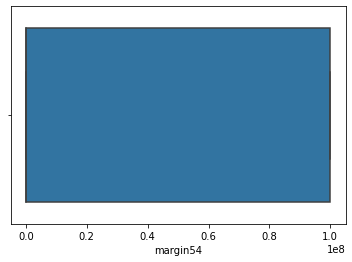

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin55


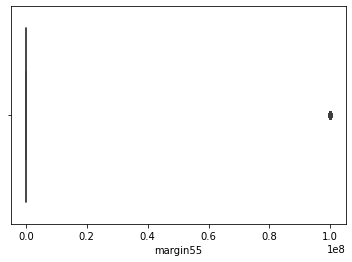

margin56


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


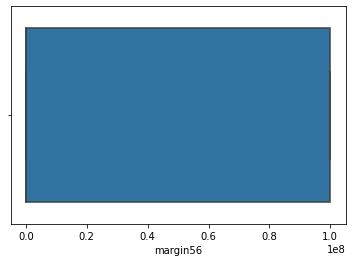

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin57


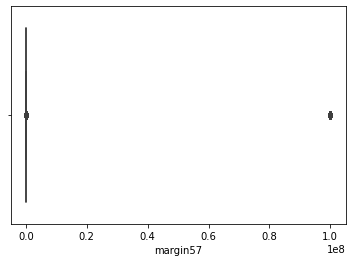

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin58


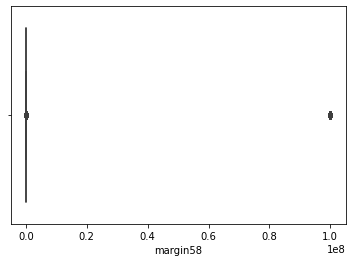

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin59


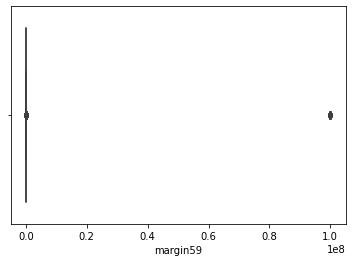

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin60


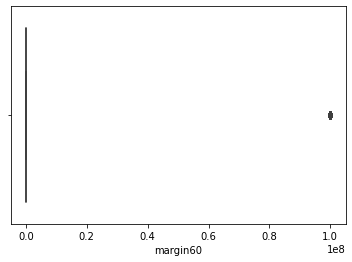

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin61


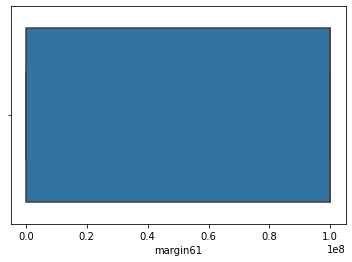

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin62


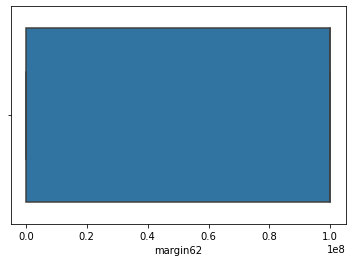

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin63


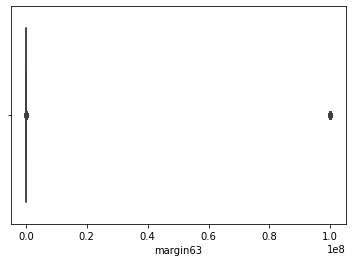

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


margin64


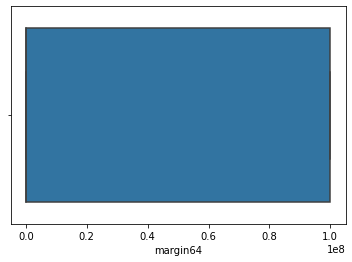

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape1


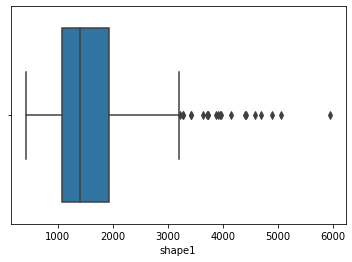

shape2


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


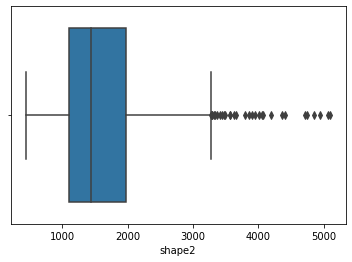

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape3


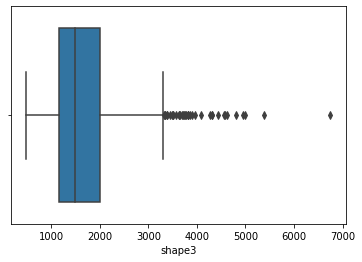

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape4


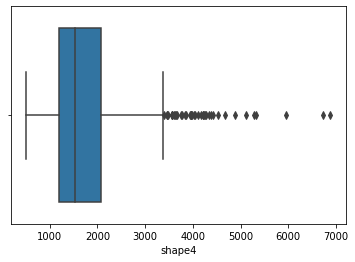

shape5


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


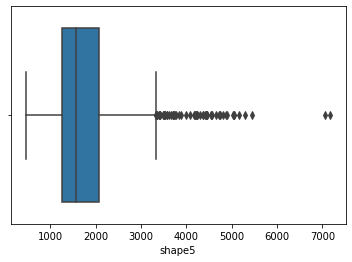

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape6


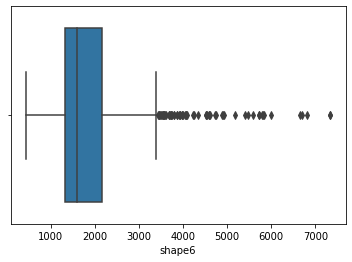

shape7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


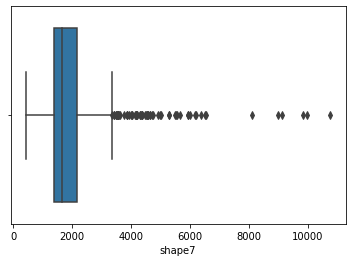

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape8


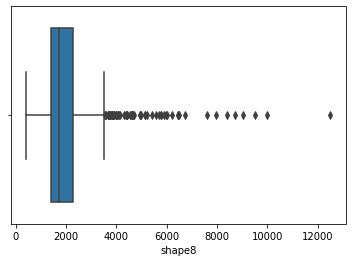

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape9


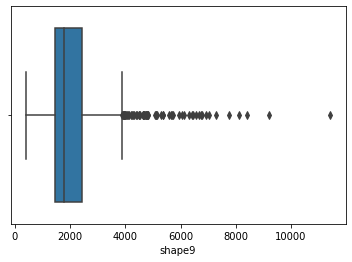

shape10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


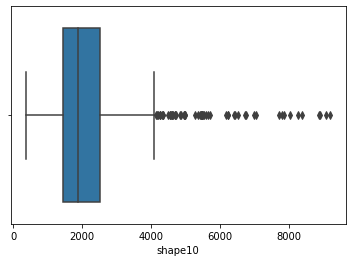

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape11


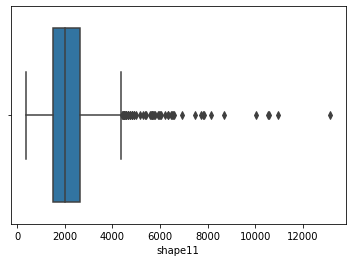

shape12


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


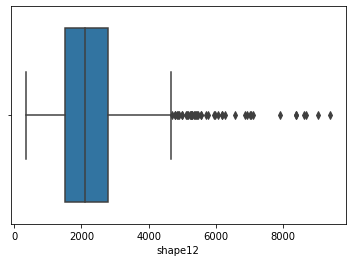

shape13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


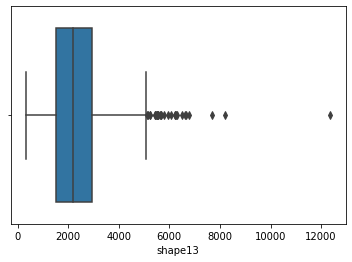

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape14


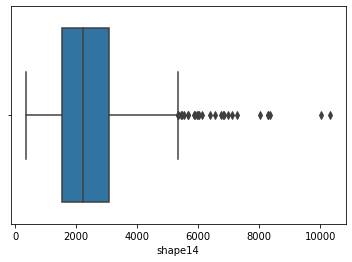

shape15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


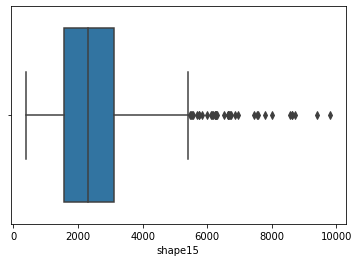

shape16


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


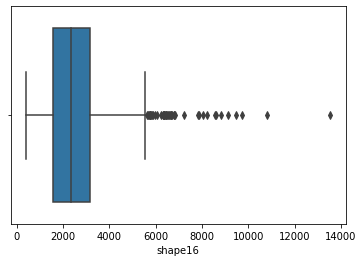

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape17


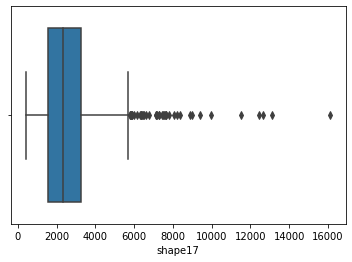

shape18


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


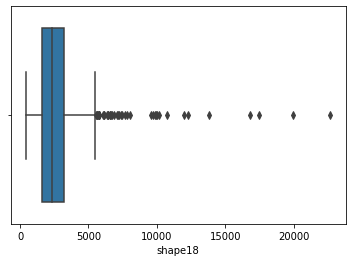

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape19


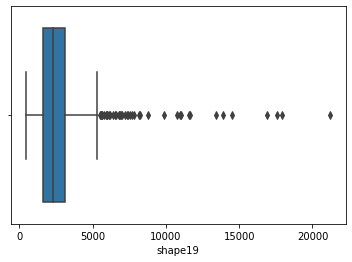

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape20


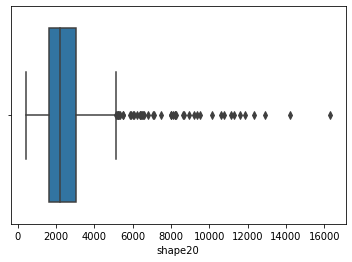

shape21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


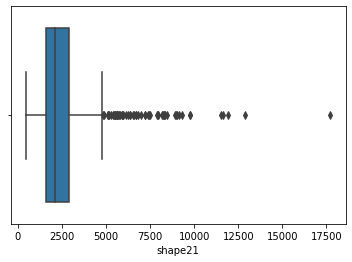

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape22


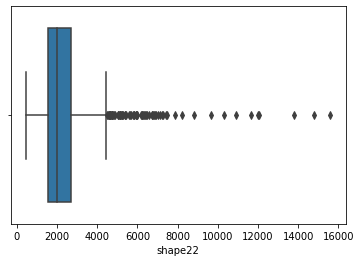

shape23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


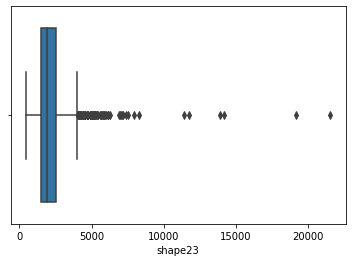

shape24


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


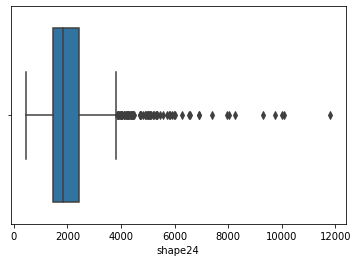

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape25


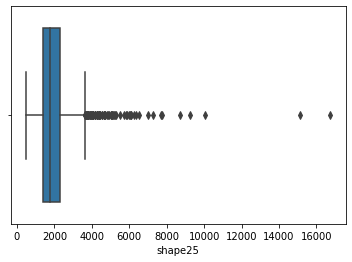

shape26


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


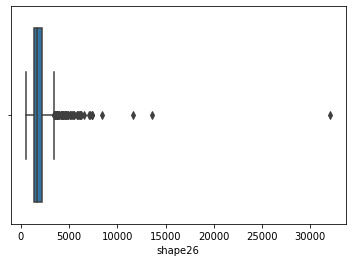

shape27


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


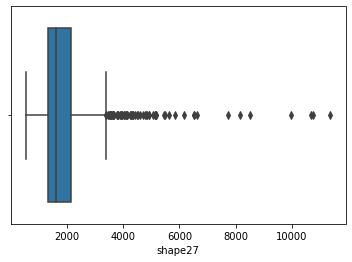

shape28


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


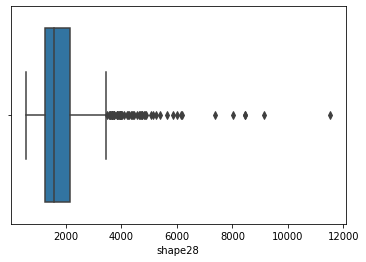

shape29


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


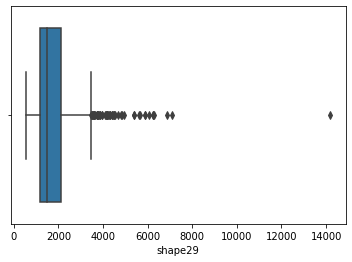

shape30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


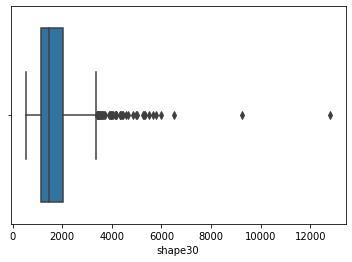

shape31


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


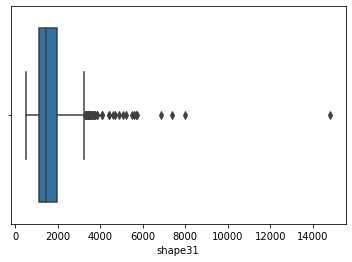

shape32


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


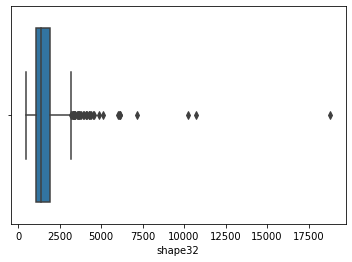

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape33


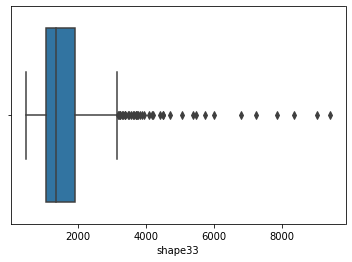

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape34


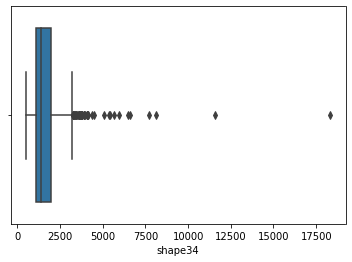

shape35


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


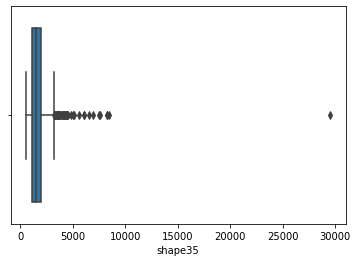

shape36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


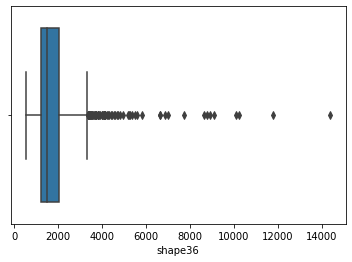

shape37


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


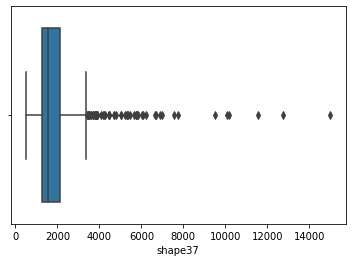

shape38


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


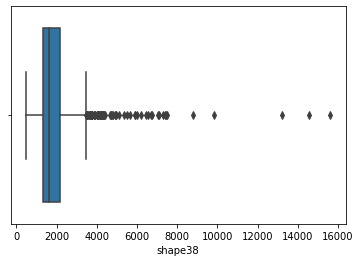

shape39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


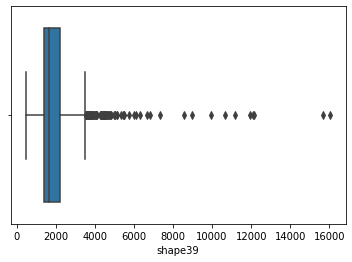

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape40


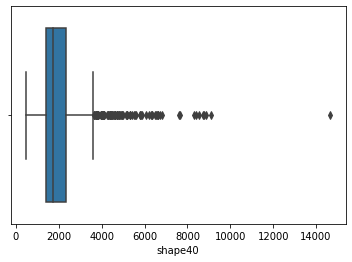

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape41


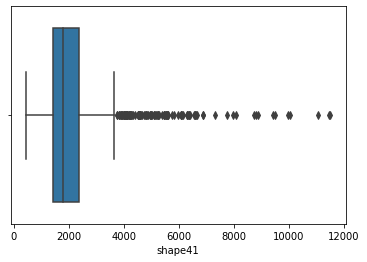

shape42


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


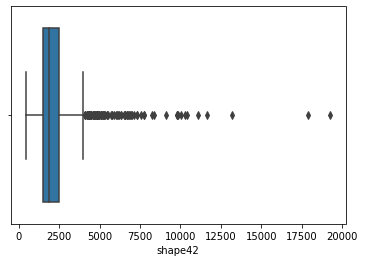

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape43


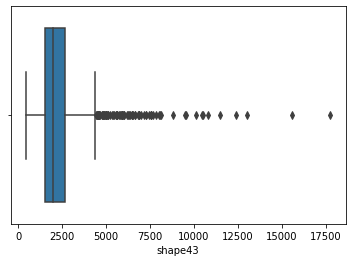

shape44


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


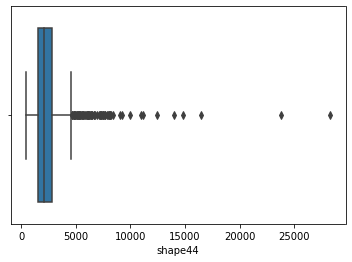

shape45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


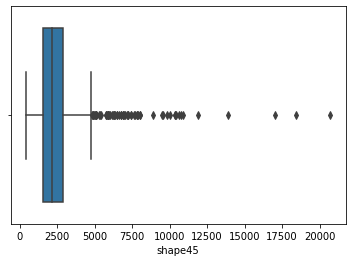

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape46


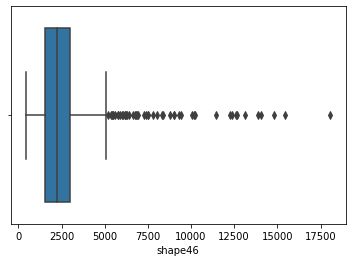

shape47


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


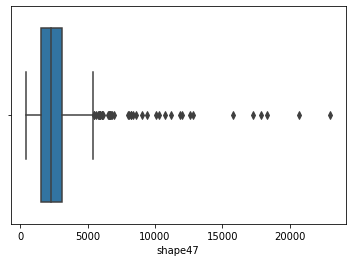

shape48


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


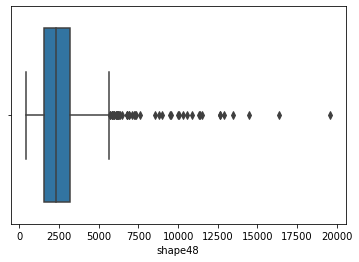

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape49


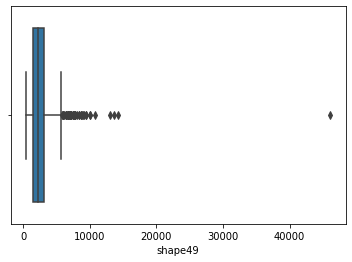

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape50


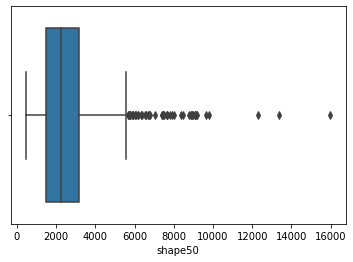

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape51


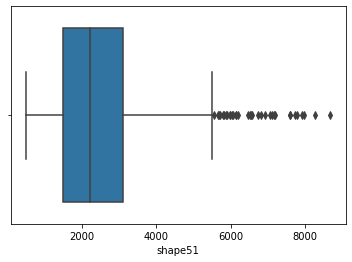

shape52


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


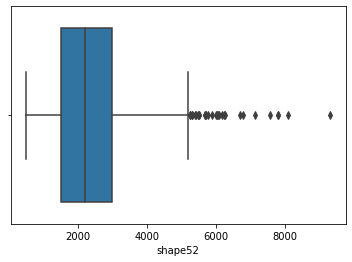

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape53


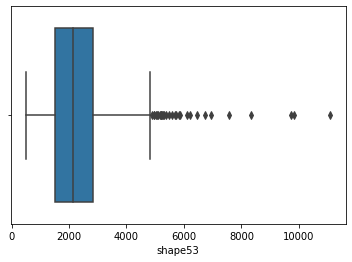

shape54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


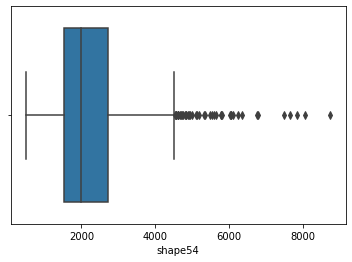

shape55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


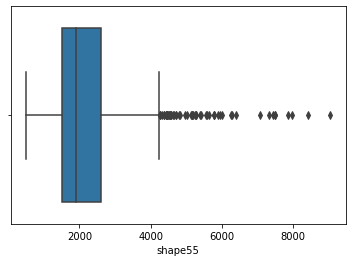

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape56


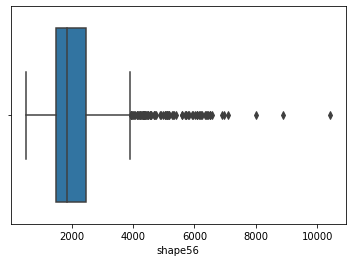

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape57


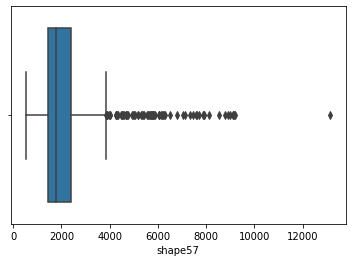

shape58


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


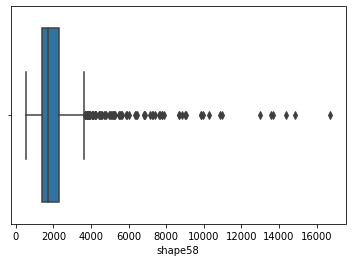

shape59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


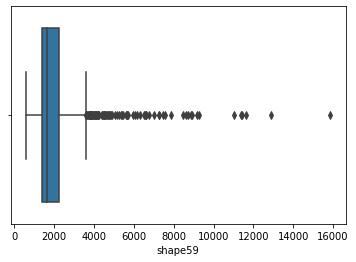

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape60


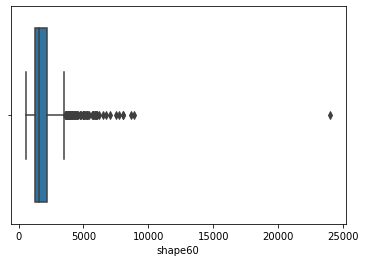

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape61


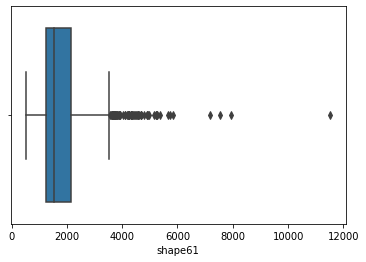

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape62


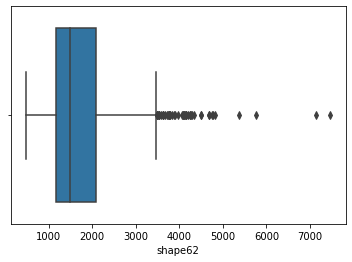

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


shape63


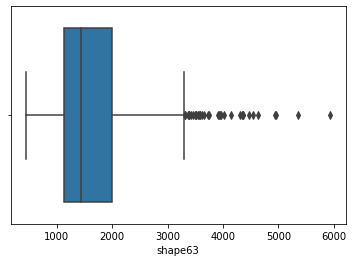

shape64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


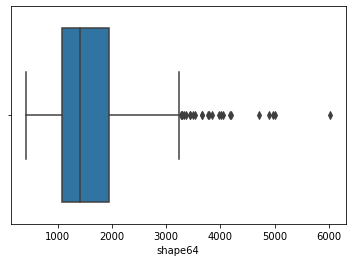

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture1


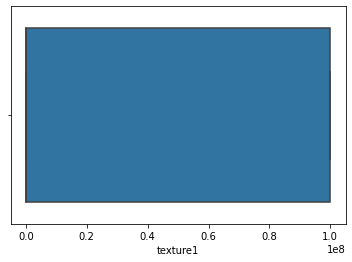

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture2


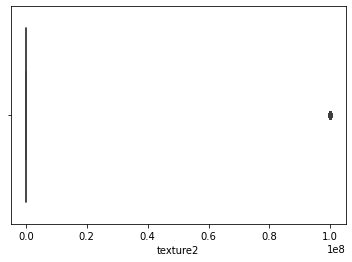

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture3


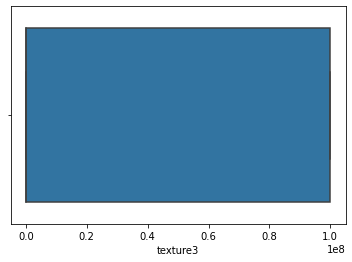

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture4


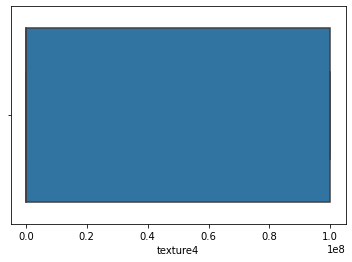

texture5


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


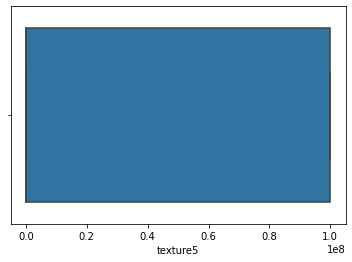

texture6


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


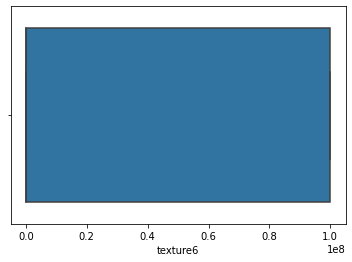

texture7


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


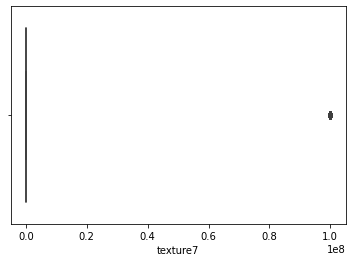

texture8


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


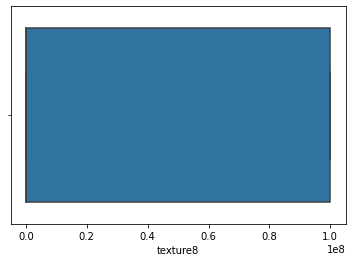

texture9


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


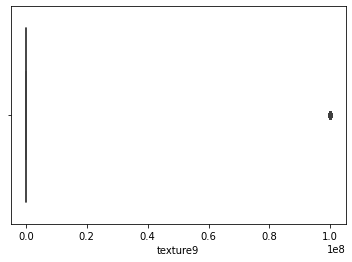

texture10


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


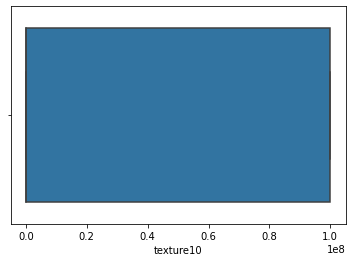

texture11


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


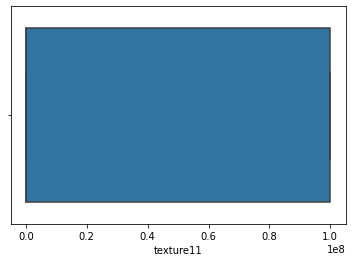

texture12


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


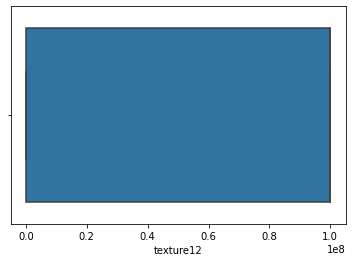

texture13


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


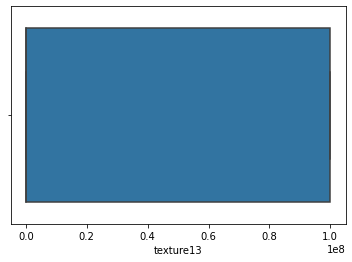

texture14


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


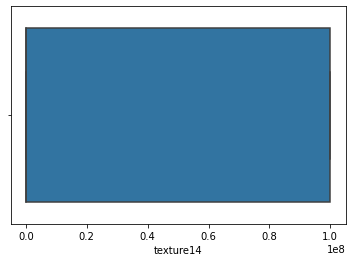

texture15


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


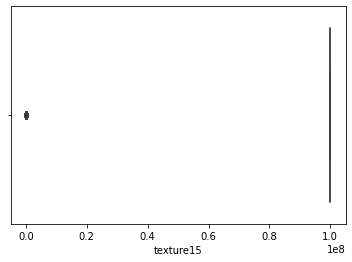

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture16


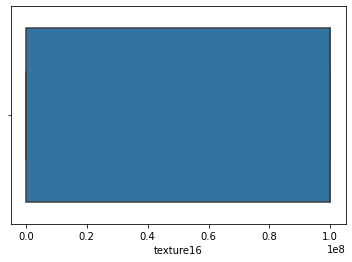

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture17


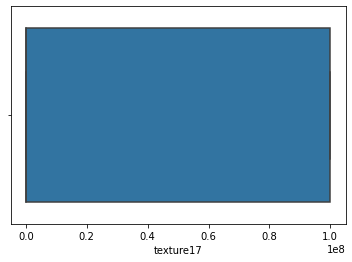

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture18


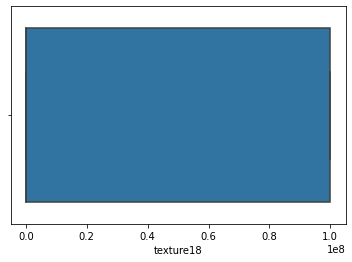

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture19


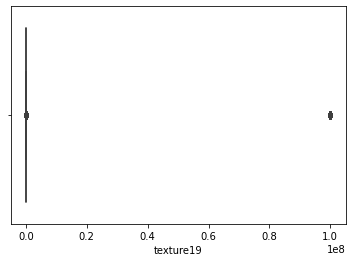

texture20


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


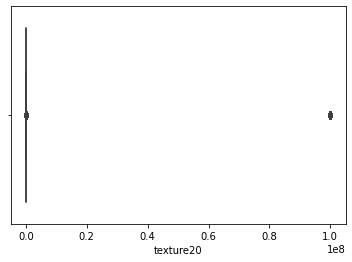

texture21


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


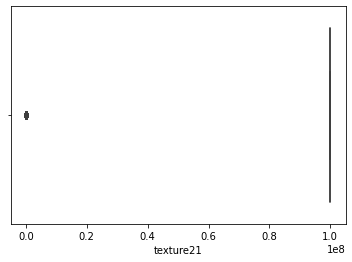

texture22


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


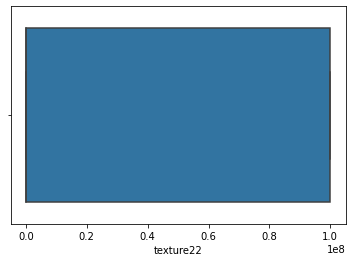

texture23


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


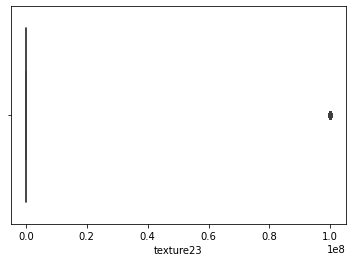

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture24


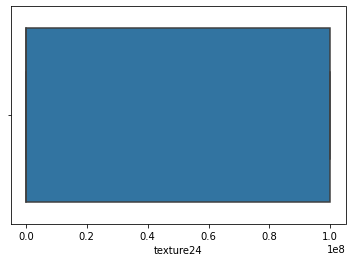

texture25


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


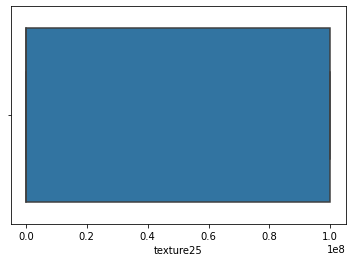

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture26


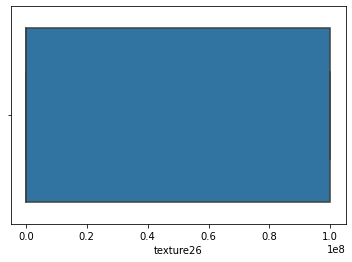

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture27


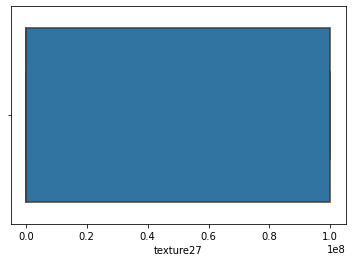

texture28


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


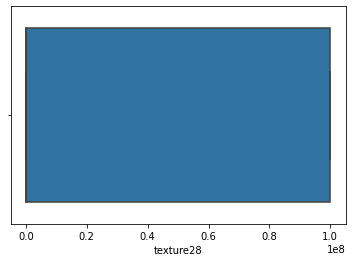

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture29


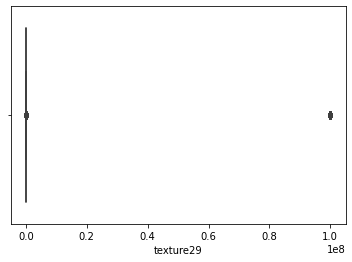

texture30


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


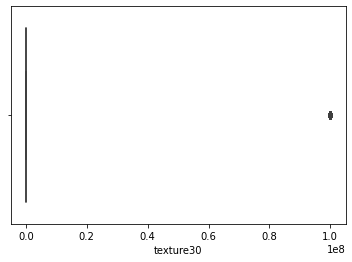

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture31


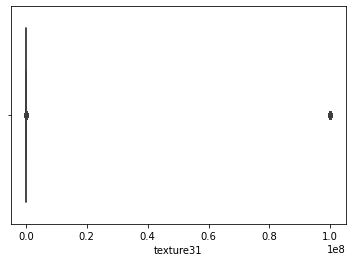

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture32


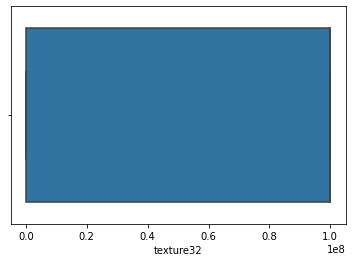

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture33


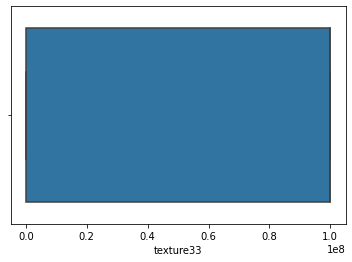

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture34


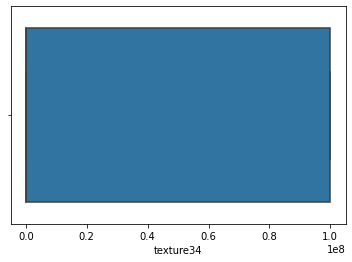

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture35


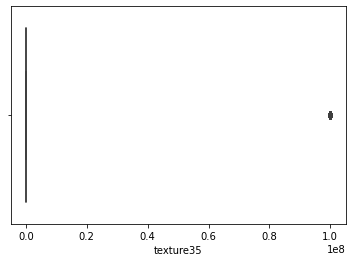

texture36


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


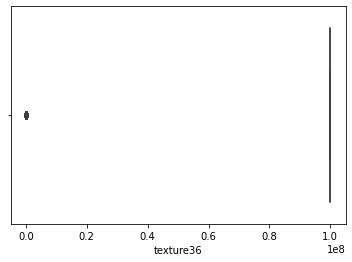

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture37


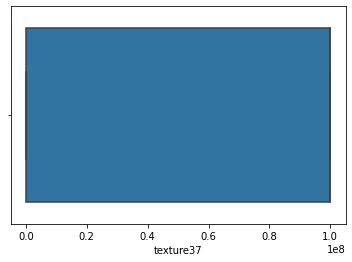

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture38


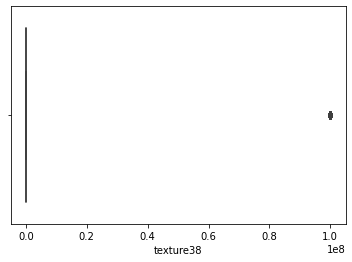

texture39


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


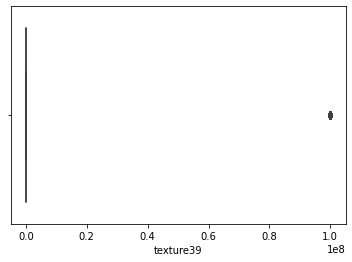

texture40


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


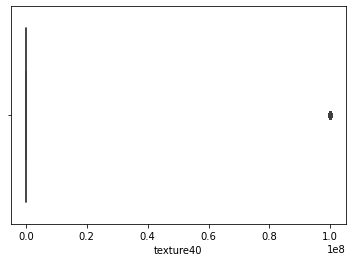

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture41


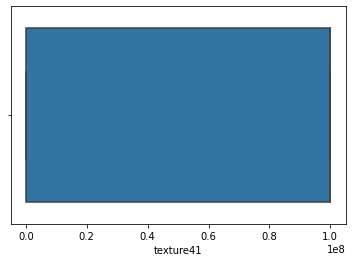

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture42


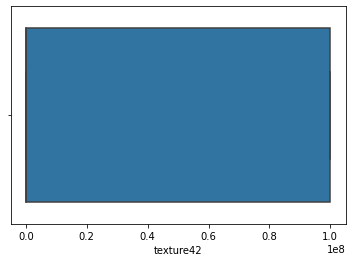

texture43


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


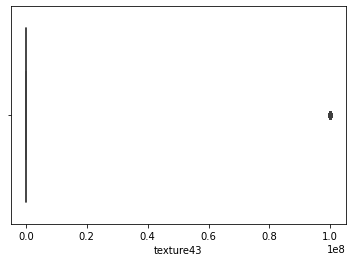

texture44


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


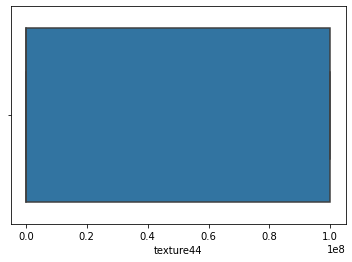

texture45


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


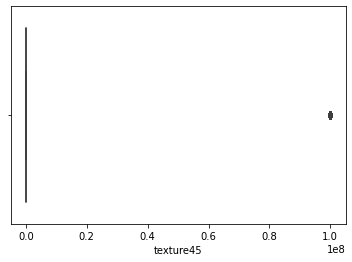

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture46


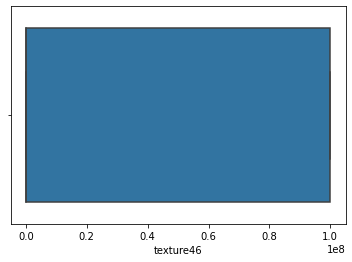

texture47


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


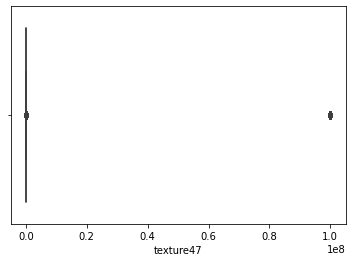

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture48


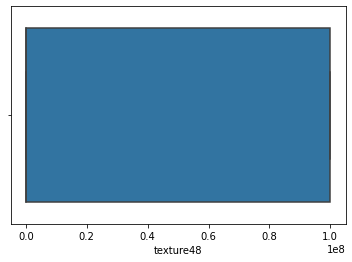

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture49


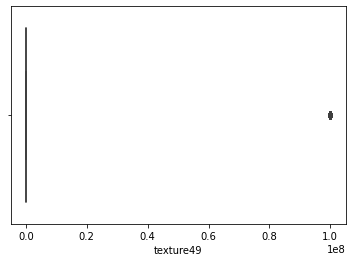

texture50


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


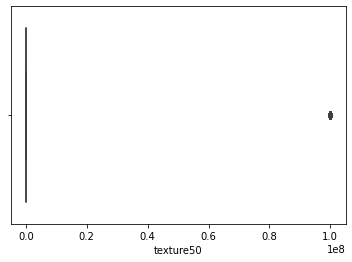

texture51


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


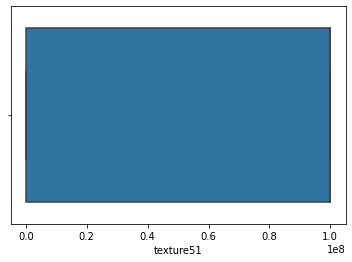

texture52


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


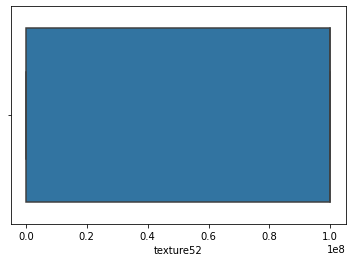

texture53


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


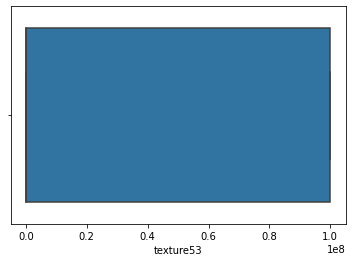

texture54


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


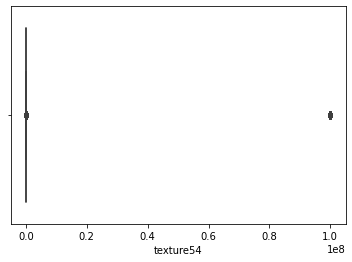

texture55


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


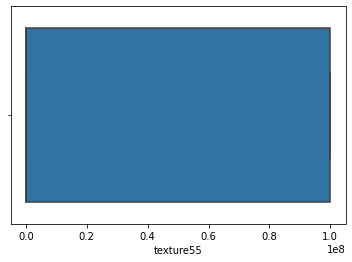

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture56


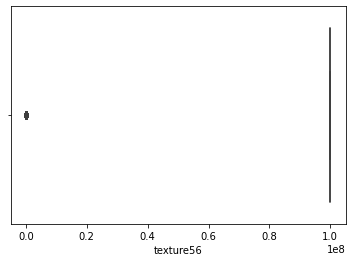

texture57


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


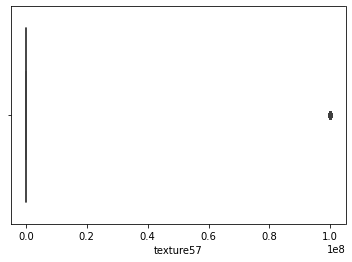

texture58


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


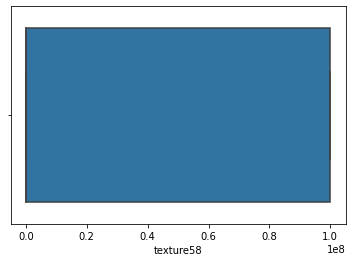

texture59


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


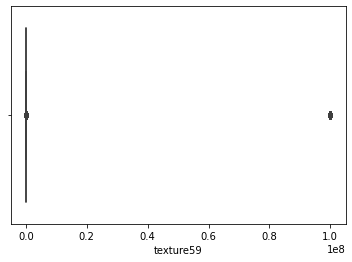

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture60


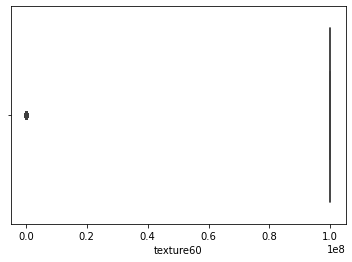

texture61


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


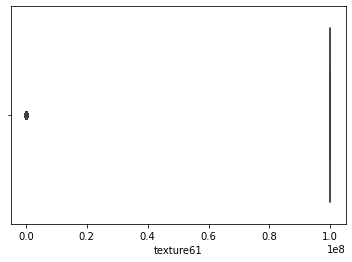

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture62


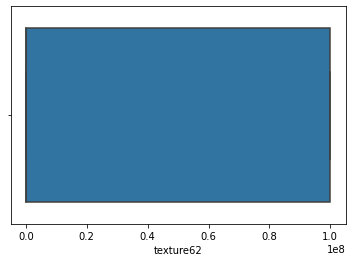

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture63


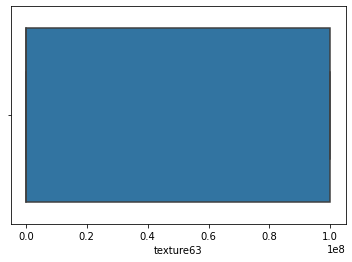

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


texture64


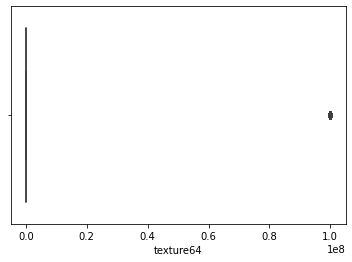

In [21]:
eps = 10 ** -8
for col in outliers:
    print(col)
    sns.boxplot(1 / (df[col] + eps))
    plt.show()

margin1
 Min: 5.322234699905796 Max: 10.0 
 mean: 8.72385858538141 std: 1.2470881228103123 
 median: 9.110289160577956 
 mode: 10.0


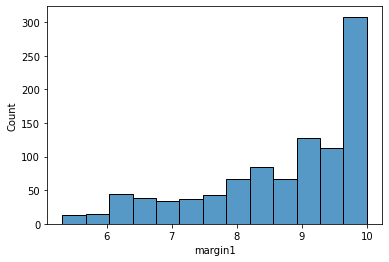

margin2
 Min: 3.277828766225252 Max: 10.0 
 mean: 8.307463653792354 std: 1.8059101445827832 
 median: 8.951028920774442 
 mode: 10.0


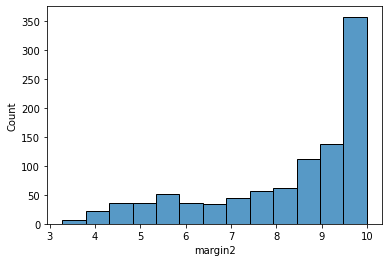

margin3
 Min: 3.9024390243902443 Max: 10.0 
 mean: 7.82492094043503 std: 1.302164610334243 
 median: 7.97505403099106 
 mode: 8.648648648648647


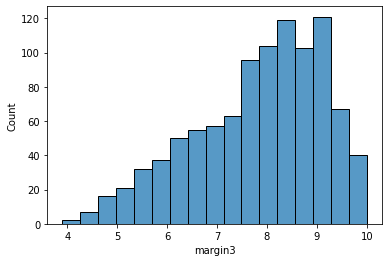

margin4
 Min: 3.7048014226437465 Max: 10.0 
 mean: 8.416801228610995 std: 1.3786473889240205 
 median: 8.797241185164332 
 mode: 9.624083306065096


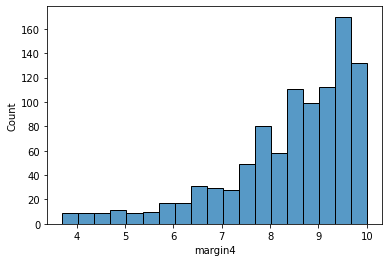

margin5
 Min: 4.731935834950078 Max: 10.0 
 mean: 8.929836995435329 std: 1.1296014145224496 
 median: 9.275405335213149 
 mode: 10.0


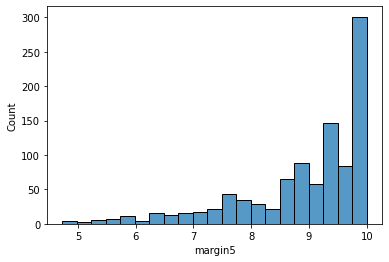

margin6
 Min: 2.4357569114602367 Max: 10.0 
 mean: 7.963087064607017 std: 2.09419217060046 
 median: 8.648648648648647 
 mode: 10.0


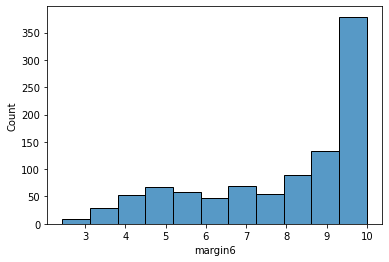

margin7
 Min: 5.213845889143209 Max: 10.0 
 mean: 8.550694849658166 std: 1.1165179728799408 
 median: 8.648648648648647 
 mode: 10.0


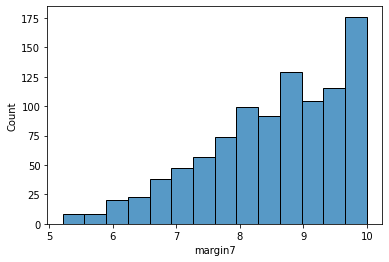

margin8
 Min: 7.619047619047619 Max: 10.0 
 mean: 9.89941538544806 std: 0.2429326946382566 
 median: 10.0 
 mode: 10.0


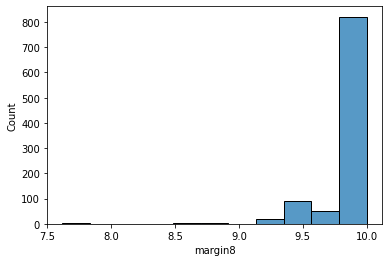

margin9
 Min: 5.676270917058329 Max: 10.0 
 mean: 9.38443142235736 std: 0.6464784679308131 
 median: 9.44652792865982 
 mode: 9.44652792865982


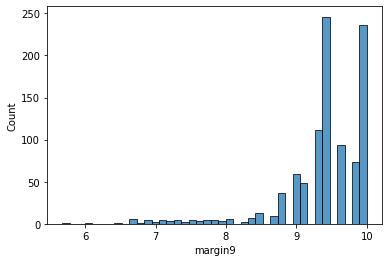

margin10
 Min: 5.059294936657627 Max: 10.0 
 mean: 8.568101622413119 std: 1.041983751899657 
 median: 8.648648648648647 
 mode: 10.0


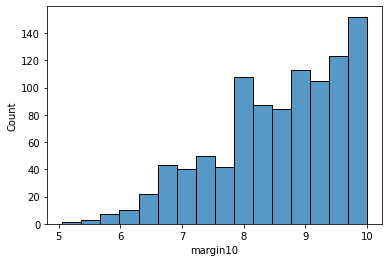

margin11
 Min: 4.444444444444445 Max: 10.0 
 mean: 8.35757055341372 std: 1.4852499823005623 
 median: 8.797241185164332 
 mode: 10.0


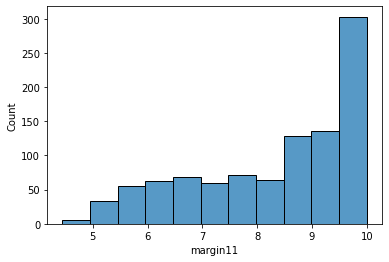

margin12
 Min: 6.5473306532926525 Max: 10.0 
 mean: 9.021177948829695 std: 0.8704367109782684 
 median: 9.275405335213149 
 mode: 9.808441144448912


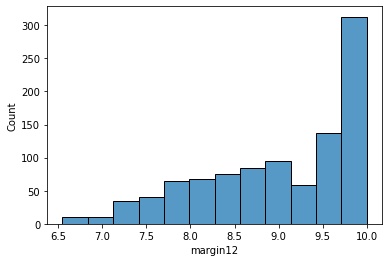

margin13
 Min: 2.0463707614545603 Max: 10.0 
 mean: 7.615360770775994 std: 1.8017032027275035 
 median: 7.97505403099106 
 mode: 10.0


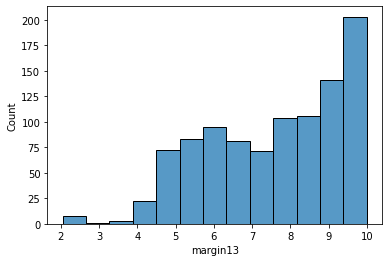

margin14
 Min: 5.493569776576517 Max: 10.0 
 mean: 9.365511708199188 std: 0.9123895511176148 
 median: 9.808441144448912 
 mode: 10.0


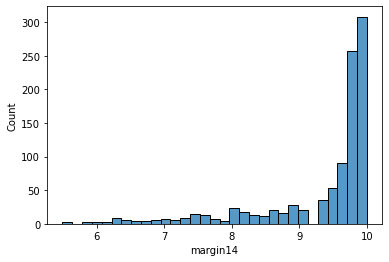

margin15
 Min: 6.080764716970806 Max: 10.0 
 mean: 8.773316573876087 std: 1.0081794191548887 
 median: 8.951028920774442 
 mode: 10.0


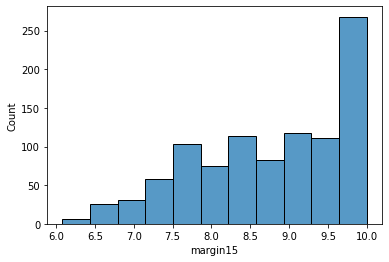

margin16
 Min: 8.648648648648647 Max: 10.0 
 mean: 9.989954332907667 std: 0.09436333531650717 
 median: 10.0 
 mode: 10.0


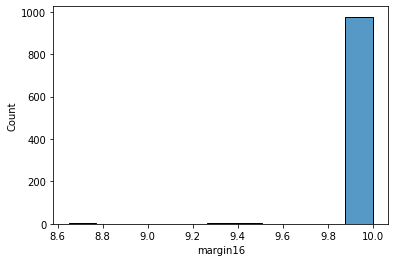

margin17
 Min: 6.228705612686627 Max: 10.0 
 mean: 8.75881379141136 std: 0.7806023343906784 
 median: 8.797241185164332 
 mode: 9.624083306065096


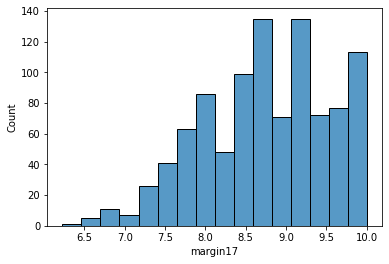

margin18
 Min: 3.043954705953975 Max: 10.0 
 mean: 8.511598733421247 std: 1.1201286466125928 
 median: 8.648648648648647 
 mode: 9.808441144448912


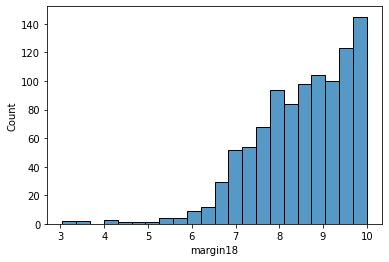

margin19
 Min: 4.444444444444445 Max: 10.0 
 mean: 9.014174084685653 std: 0.9032023501944549 
 median: 9.275405335213149 
 mode: 9.624083306065096


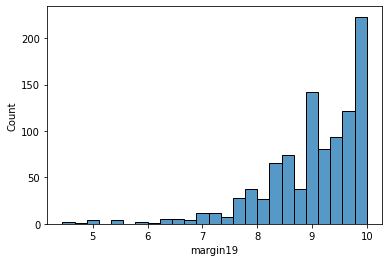

margin20
 Min: 6.5473306532926525 Max: 10.0 
 mean: 8.899016923723055 std: 0.707012578233025 
 median: 8.951028920774442 
 mode: 9.275405335213149


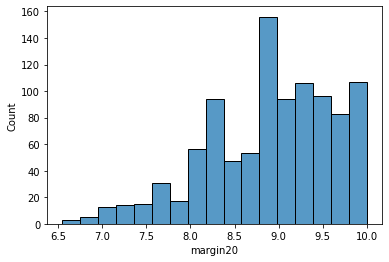

margin21
 Min: 4.961301845604286 Max: 10.0 
 mean: 8.592270294209017 std: 1.2314953020178423 
 median: 8.951028920774442 
 mode: 10.0


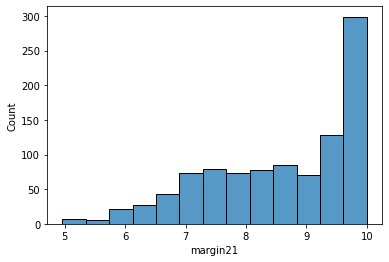

margin22
 Min: 6.153846153846153 Max: 10.0 
 mean: 9.489498034089154 std: 0.7645931612680467 
 median: 9.808441144448912 
 mode: 10.0


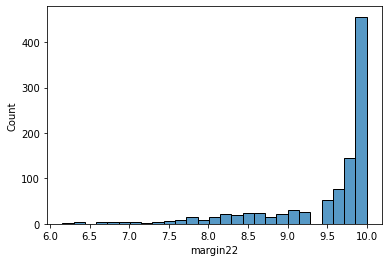

margin23
 Min: 7.191037091369316 Max: 10.0 
 mean: 9.915895128078192 std: 0.3466625779108365 
 median: 10.0 
 mode: 10.0


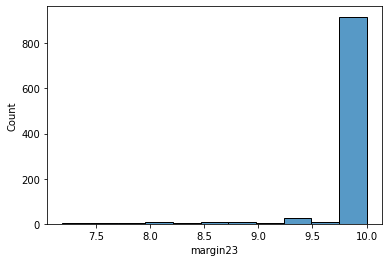

margin24
 Min: 5.614035087719298 Max: 10.0 
 mean: 9.396831640446285 std: 0.9058276266382258 
 median: 9.808441144448912 
 mode: 10.0


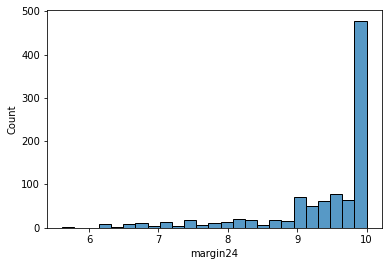

margin25
 Min: 5.493569776576517 Max: 10.0 
 mean: 9.29141754010617 std: 0.9062289226901887 
 median: 9.808441144448912 
 mode: 10.0


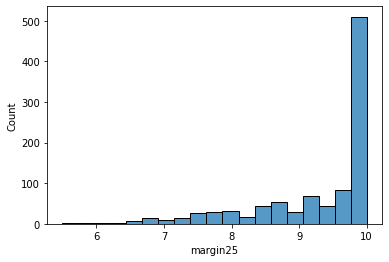

margin26
 Min: 5.378136798287602 Max: 10.0 
 mean: 8.507098751174988 std: 0.8179821954075034 
 median: 8.504992430556737 
 mode: 8.797241185164332


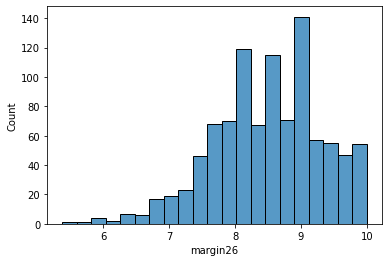

margin27
 Min: 5.493569776576517 Max: 10.0 
 mean: 9.547130252503045 std: 0.7857304208507141 
 median: 10.0 
 mode: 10.0


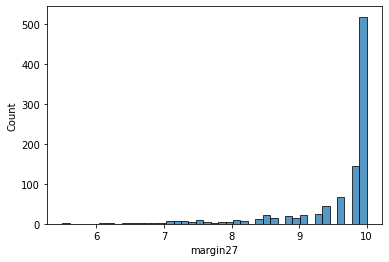

margin28
 Min: 5.553149190906162 Max: 10.0 
 mean: 8.77158791750929 std: 0.9624083180711448 
 median: 8.951028920774442 
 mode: 9.808441144448912


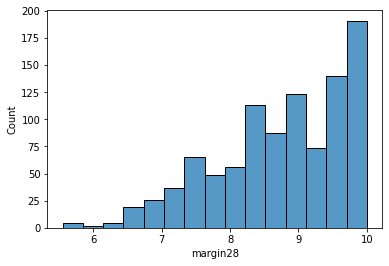

margin29
 Min: 4.0251167283851235 Max: 10.0 
 mean: 8.014172531497994 std: 1.2537481062754405 
 median: 8.038143519327413 
 mode: 9.808441144448912


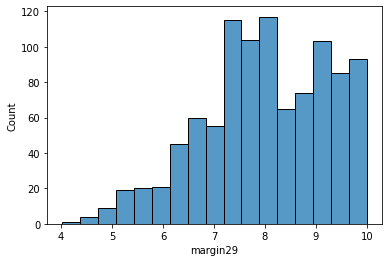

margin30
 Min: 4.563292872136533 Max: 10.0 
 mean: 8.725864142056327 std: 1.0208713558393219 
 median: 8.951028920774442 
 mode: 9.624083306065096


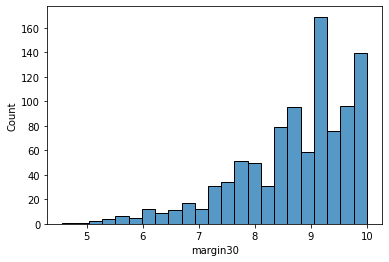

margin31
 Min: 4.68867216804201 Max: 10.0 
 mean: 9.181086401255676 std: 1.081974470740718 
 median: 9.624083306065096 
 mode: 10.0


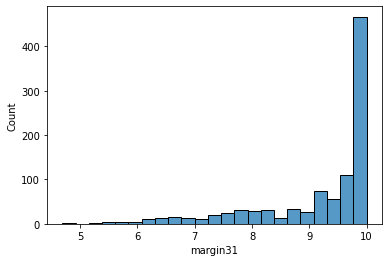

margin32
 Min: 4.406256884776382 Max: 10.0 
 mean: 9.317119518184255 std: 1.1619629845169555 
 median: 9.808441144448912 
 mode: 10.0


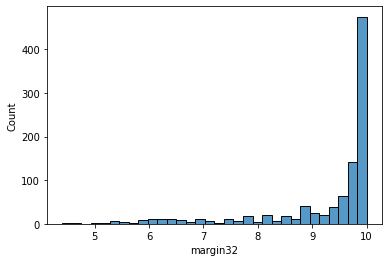

margin33
 Min: 5.614035087719298 Max: 10.0 
 mean: 8.507713665321125 std: 1.0534133772787397 
 median: 8.648648648648647 
 mode: 9.624083306065096


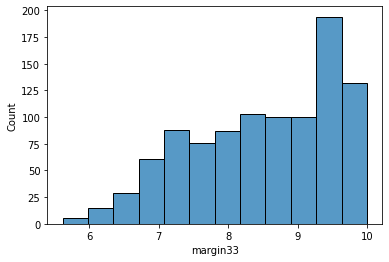

margin34
 Min: 8.648648648648647 Max: 10.0 
 mean: 9.89686779159241 std: 0.19447310737181536 
 median: 10.0 
 mode: 10.0


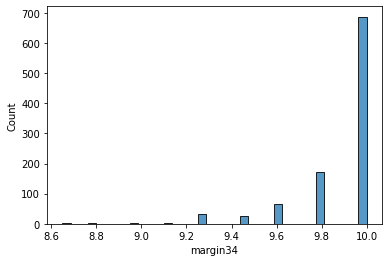

margin35
 Min: 5.493569776576517 Max: 10.0 
 mean: 8.946102567191323 std: 0.9468940900593392 
 median: 9.110289160577956 
 mode: 10.0


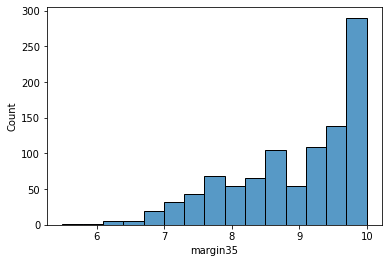

margin36
 Min: 5.267482775331325 Max: 10.0 
 mean: 8.620087000938325 std: 1.0776405456982834 
 median: 8.797241185164332 
 mode: 10.0


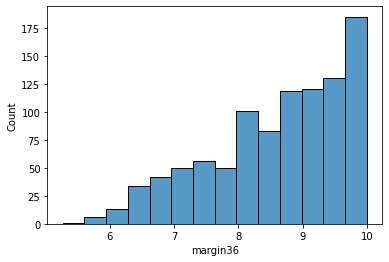

margin37
 Min: 5.939688403946328 Max: 10.0 
 mean: 8.678583934172028 std: 0.7947759103949094 
 median: 8.797241185164332 
 mode: 9.110289160577956


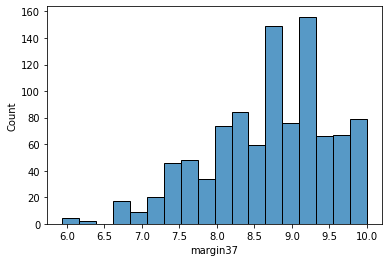

margin38
 Min: 4.155757802435274 Max: 10.0 
 mean: 7.857917465477562 std: 1.3086250776075252 
 median: 7.793438407733739 
 mode: 9.44652792865982


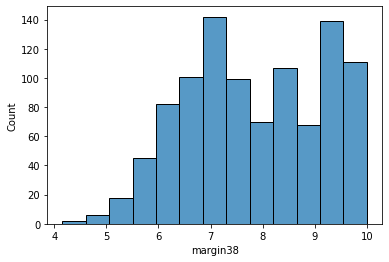

margin39
 Min: 6.153846153846153 Max: 10.0 
 mean: 8.814888594194622 std: 0.9405190488389571 
 median: 8.951028920774442 
 mode: 10.0


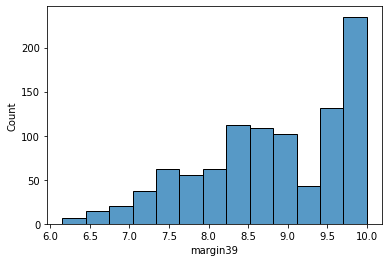

margin40
 Min: 6.153846153846153 Max: 10.0 
 mean: 9.317288746900225 std: 0.7703759751325225 
 median: 9.624083306065096 
 mode: 10.0


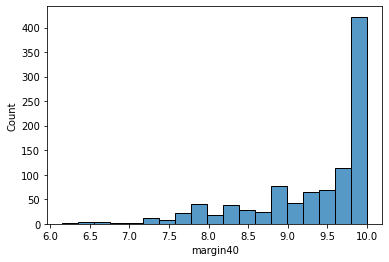

margin41
 Min: 3.2364554340086733 Max: 10.0 
 mean: 9.25822851061248 std: 1.1982602878952024 
 median: 9.808441144448912 
 mode: 10.0


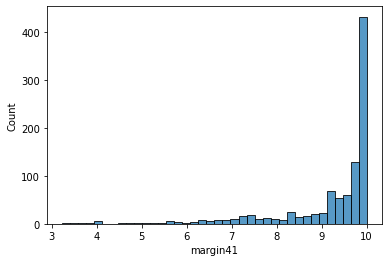

margin42
 Min: 5.213845889143209 Max: 10.0 
 mean: 8.627953597467403 std: 0.9623154214669727 
 median: 8.797241185164332 
 mode: 9.808441144448912


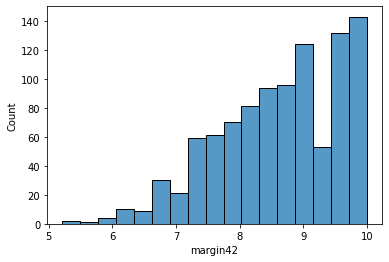

margin43
 Min: 4.60426354804549 Max: 10.0 
 mean: 8.62864982185345 std: 1.2466848712245073 
 median: 8.951028920774442 
 mode: 10.0


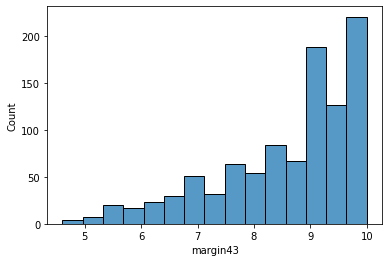

margin44
 Min: 6.080764716970806 Max: 10.0 
 mean: 8.96053235808897 std: 0.8347484784351439 
 median: 9.110289160577956 
 mode: 9.808441144448912


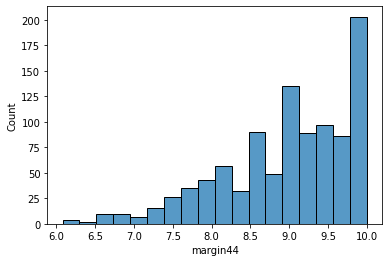

margin45
 Min: 3.6006193065207213 Max: 10.0 
 mean: 8.270678773304466 std: 1.3221496482179198 
 median: 8.504992430556737 
 mode: 9.44652792865982


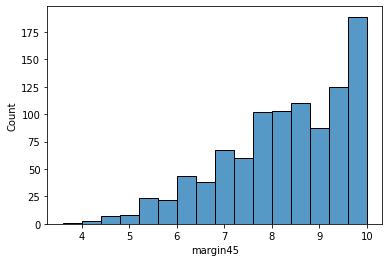

margin46
 Min: 5.267482775331325 Max: 10.0 
 mean: 9.191749756747733 std: 0.9127297783240753 
 median: 9.624083306065096 
 mode: 10.0


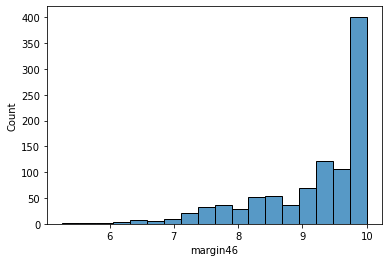

margin47
 Min: 4.866890543631674 Max: 10.0 
 mean: 8.199664807789945 std: 1.305992987833531 
 median: 8.231536663264297 
 mode: 10.0


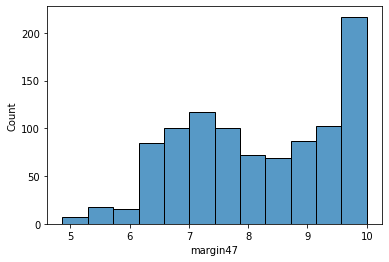

margin48
 Min: 4.0251167283851235 Max: 10.0 
 mean: 8.24434807092688 std: 1.6081439846716152 
 median: 8.648648648648647 
 mode: 10.0


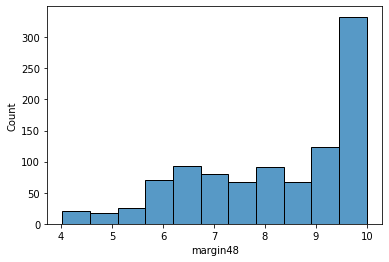

margin49
 Min: 4.821135859608524 Max: 10.0 
 mean: 9.361780509768105 std: 1.0364859507003334 
 median: 9.808441144448912 
 mode: 10.0


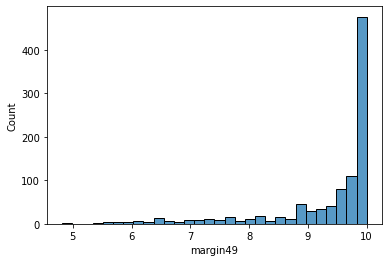

margin50
 Min: 5.553149190906162 Max: 10.0 
 mean: 8.951308576325932 std: 1.1650264080762416 
 median: 9.44652792865982 
 mode: 10.0


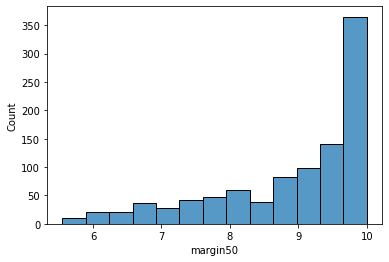

margin51
 Min: 4.331629559040111 Max: 10.0 
 mean: 8.230270952147553 std: 1.4042539240006866 
 median: 8.3660305694757 
 mode: 10.0


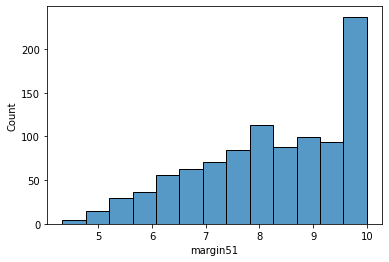

margin52
 Min: 5.43525523958605 Max: 10.0 
 mean: 9.770414306202237 std: 0.5382034801236442 
 median: 10.0 
 mode: 10.0


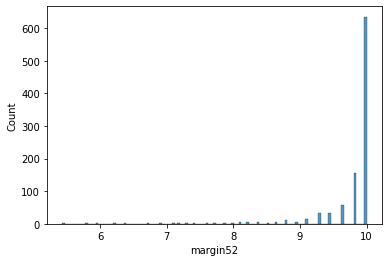

margin53
 Min: 5.378136798287602 Max: 10.0 
 mean: 8.227379178870702 std: 1.1244611584502686 
 median: 8.231536663264297 
 mode: 8.951028920774442


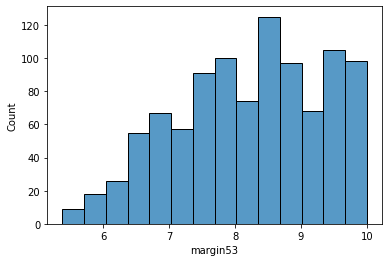

margin54
 Min: 4.36852911624656 Max: 10.0 
 mean: 9.231309554133729 std: 1.0177280189468245 
 median: 9.624083306065096 
 mode: 10.0


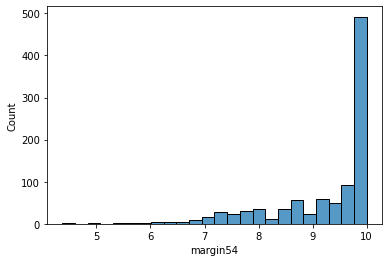

margin55
 Min: 4.155757802435274 Max: 10.0 
 mean: 8.693561946969568 std: 1.2906426914109548 
 median: 8.951028920774442 
 mode: 10.0


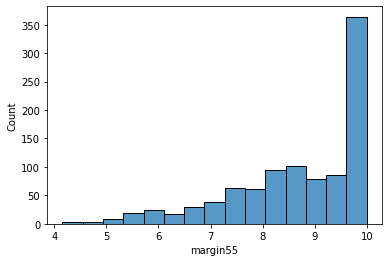

margin56
 Min: 6.46462556888705 Max: 10.0 
 mean: 9.494930032205364 std: 0.6922754315600783 
 median: 9.808441144448912 
 mode: 10.0


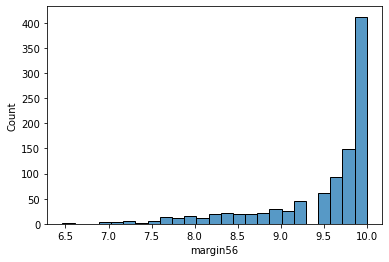

margin57
 Min: 6.153846153846153 Max: 10.0 
 mean: 8.945985796451398 std: 0.711708184701385 
 median: 9.110289160577956 
 mode: 9.275405335213149


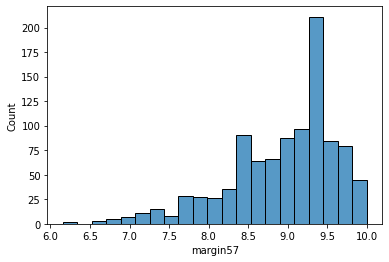

margin58
 Min: 4.68867216804201 Max: 10.0 
 mean: 8.49683763884717 std: 1.149008538540385 
 median: 8.648648648648647 
 mode: 9.808441144448912


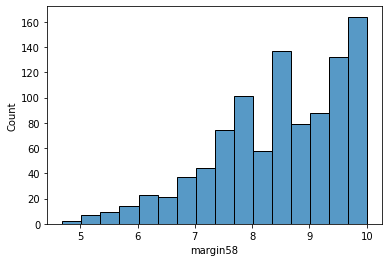

margin59
 Min: 3.0622243998040175 Max: 10.0 
 mean: 7.949922187937927 std: 1.3606924055525333 
 median: 8.101233007663765 
 mode: 8.504992430556737


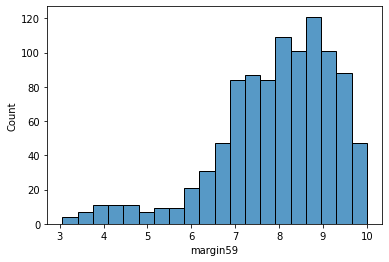

margin60
 Min: 5.267482775331325 Max: 10.0 
 mean: 9.033550677235407 std: 0.8496306737989567 
 median: 9.275405335213149 
 mode: 10.0


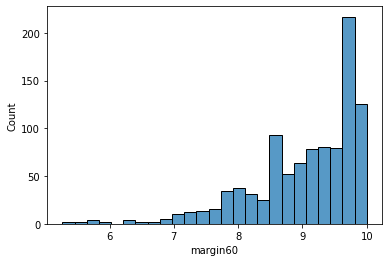

margin61
 Min: 8.951028920774442 Max: 10.0 
 mean: 9.867863988829976 std: 0.21438429100008907 
 median: 10.0 
 mode: 10.0


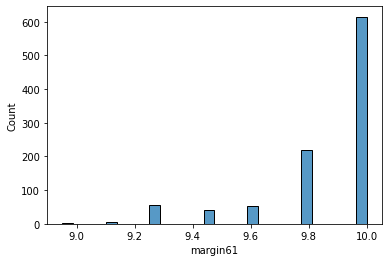

margin62
 Min: 5.676270917058329 Max: 10.0 
 mean: 9.598061369537758 std: 0.7450411620373989 
 median: 10.0 
 mode: 10.0


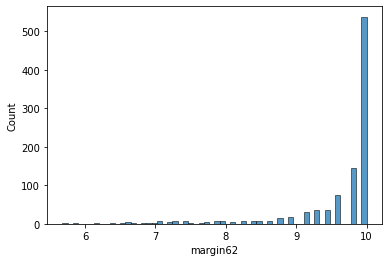

margin63
 Min: 4.444444444444445 Max: 10.0 
 mean: 8.158531380197322 std: 1.1819967958895767 
 median: 8.231536663264297 
 mode: 10.0


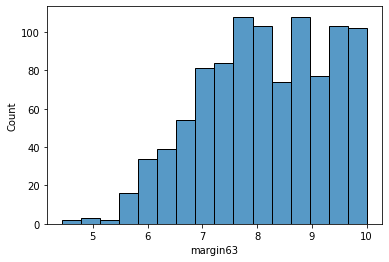

margin64
 Min: 5.267482775331325 Max: 10.0 
 mean: 9.636107441612063 std: 0.6344868631363308 
 median: 9.808441144448912 
 mode: 10.0


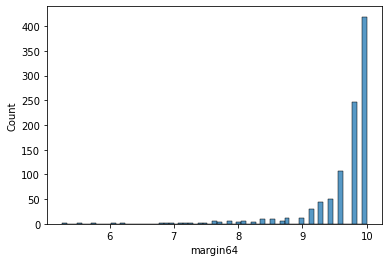

shape1
 Min: 9.76660738335985 Max: 9.9832301699605 
 mean: 9.926682698500814 std: 0.02678359220922466 
 median: 9.928914441818993 
 mode: 9.899461073339166


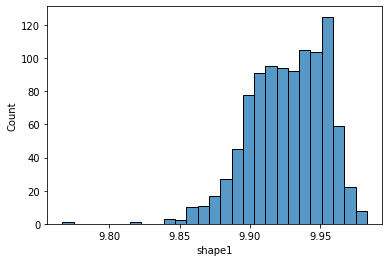

shape2
 Min: 9.780276312366377 Max: 9.980428379946924 
 mean: 9.928755626640688 std: 0.02635779949409653 
 median: 9.931342642086182 
 mode: 9.899108288325387


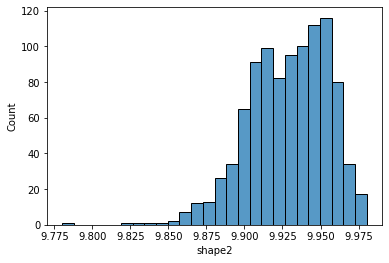

shape3
 Min: 9.793139514044832 Max: 9.985203924824194 
 mean: 9.931176869265883 std: 0.025549267785010446 
 median: 9.93292001129022 
 mode: 9.88443123005816


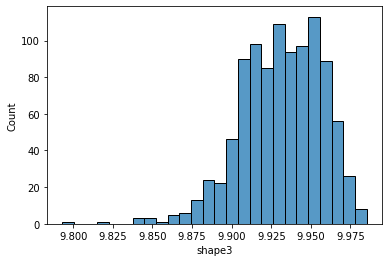

shape4
 Min: 9.804142642432133 Max: 9.985487093058948 
 mean: 9.93343940959745 std: 0.025006142740659473 
 median: 9.934783609918634 
 mode: 9.918272443240454


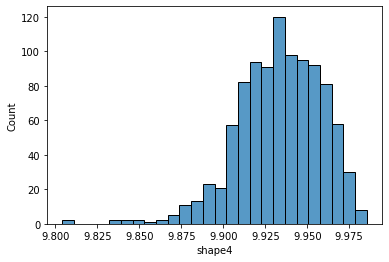

shape5
 Min: 9.789429374161779 Max: 9.986084391400583 
 mean: 9.935489139652756 std: 0.02476223138097573 
 median: 9.936459817625337 
 mode: 9.939050759030398


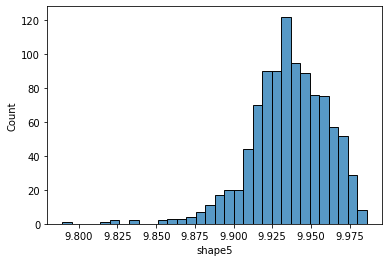

shape6
 Min: 9.778363610406526 Max: 9.986390546962598 
 mean: 9.937245310920453 std: 0.02471290673483488 
 median: 9.937961776710818 
 mode: 9.927550720353008


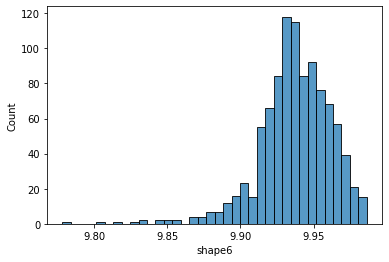

shape7
 Min: 9.774645546915854 Max: 9.990717125183135 
 mean: 9.938707609384986 std: 0.02513434954525711 
 median: 9.939969047932369 
 mode: 9.92944434730138


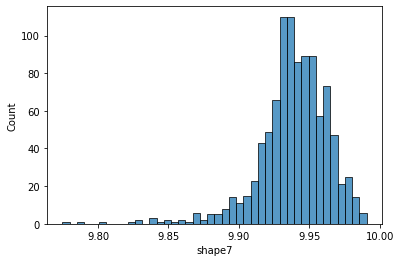

shape8
 Min: 9.761878497803089 Max: 9.992012485139504 
 mean: 9.940058130971247 std: 0.02610341662627156 
 median: 9.941874828814914 
 mode: 9.93704089628929


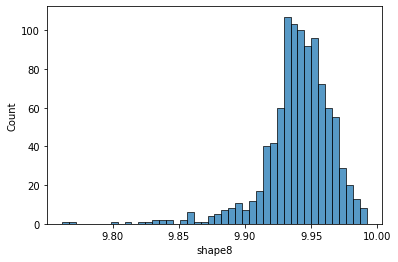

shape9
 Min: 9.754061103340375 Max: 9.991256152178421 
 mean: 9.941394961107996 std: 0.02749052167476475 
 median: 9.94415610582635 
 mode: 9.91551092297641


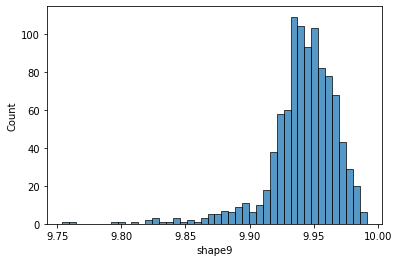

shape10
 Min: 9.738293110936686 Max: 9.989127833266272 
 mean: 9.94259888884854 std: 0.029217460963312715 
 median: 9.947055306075733 
 mode: 9.882350615917503


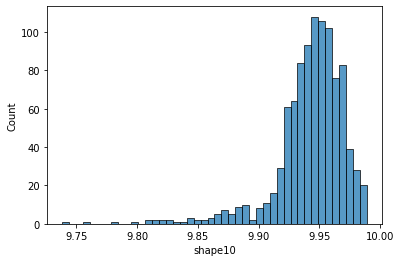

shape11
 Min: 9.730106311141556 Max: 9.992406670247211 
 mean: 9.943493456778238 std: 0.03120654822405048 
 median: 9.94993788282504 
 mode: 9.95239768188753


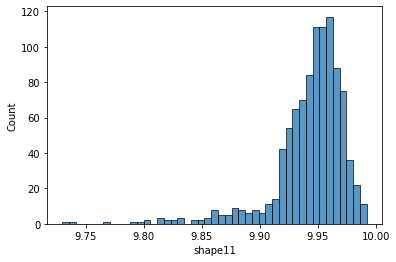

shape12
 Min: 9.71918362745203 Max: 9.989378294059925 
 mean: 9.944250638927157 std: 0.03290177340738246 
 median: 9.952491285225436 
 mode: 9.914766716445405


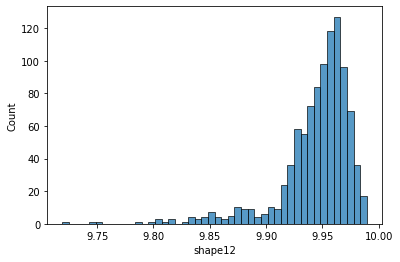

shape13
 Min: 9.708106365896587 Max: 9.991918835803167 
 mean: 9.944848650871137 std: 0.034439435022687065 
 median: 9.954224998639663 
 mode: 9.870528280544102


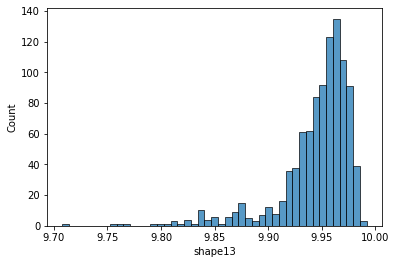

shape14
 Min: 9.726169425980933 Max: 9.990331756539291 
 mean: 9.945327265364146 std: 0.03544743922199698 
 median: 9.955566811992004 
 mode: 9.82929463998734


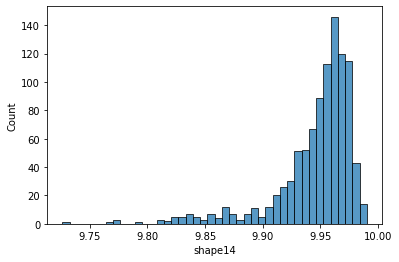

shape15
 Min: 9.747405727965502 Max: 9.989821371005084 
 mean: 9.945841493354212 std: 0.03641195806563461 
 median: 9.95681282222486 
 mode: 9.942801054095996


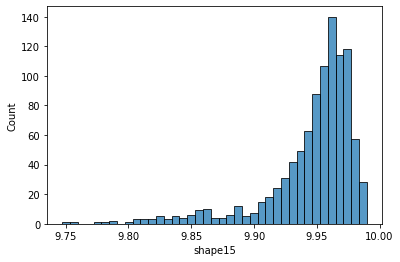

shape16
 Min: 9.758630044479835 Max: 9.992620349945362 
 mean: 9.946129587283316 std: 0.037079399148839225 
 median: 9.957652097177878 
 mode: 9.92645489567792


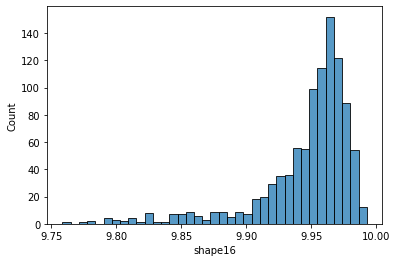

shape17
 Min: 9.764680953696859 Max: 9.993802043848445 
 mean: 9.946189393599166 std: 0.03744524179489044 
 median: 9.9576203677154 
 mode: 9.894377519974274


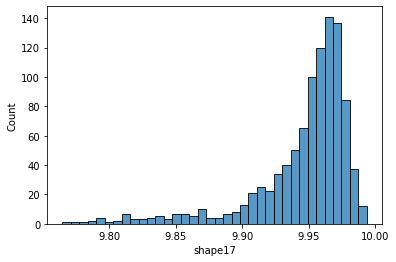

shape18
 Min: 9.771388592490101 Max: 9.99559374236649 
 mean: 9.946195837727211 std: 0.03713392286244118 
 median: 9.957505350234365 
 mode: 9.9597456958212


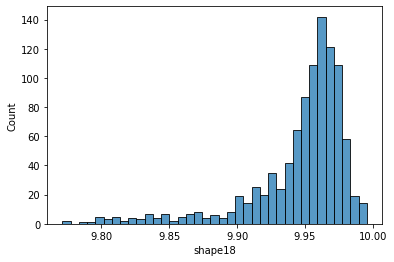

shape19
 Min: 9.783213766155756 Max: 9.995289519907953 
 mean: 9.946190487321589 std: 0.036160422569905294 
 median: 9.956882715204683 
 mode: 9.849431737035932


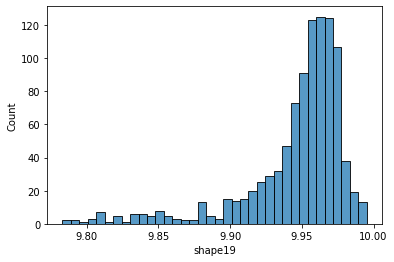

shape20
 Min: 9.775151954737135 Max: 9.993874854040707 
 mean: 9.945780621576535 std: 0.03500891547267874 
 median: 9.955464726323028 
 mode: 9.886317238079325


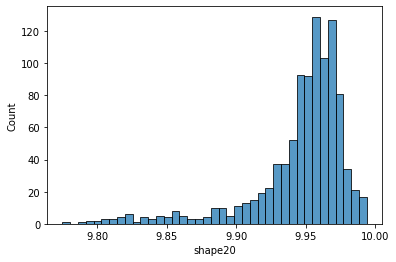

shape21
 Min: 9.785664588517696 Max: 9.99435958322561 
 mean: 9.94501282632041 std: 0.03340113313139367 
 median: 9.953046998444346 
 mode: 9.943591002601343


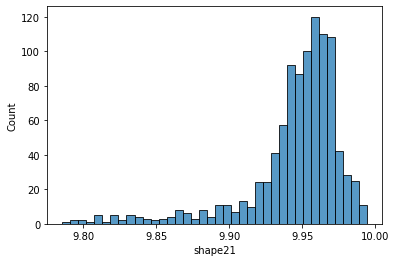

shape22
 Min: 9.781204242303904 Max: 9.993596702848617 
 mean: 9.944085891867875 std: 0.031657475984739974 
 median: 9.950649257560832 
 mode: 9.92491602528551


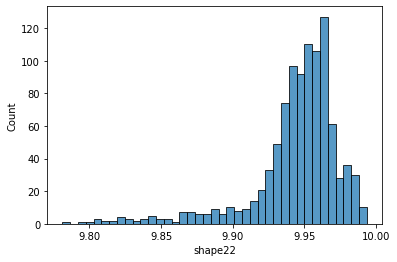

shape23
 Min: 9.783453050187157 Max: 9.995364050199877 
 mean: 9.942940293938944 std: 0.029948295878873463 
 median: 9.94802801981884 
 mode: 9.888086635459864


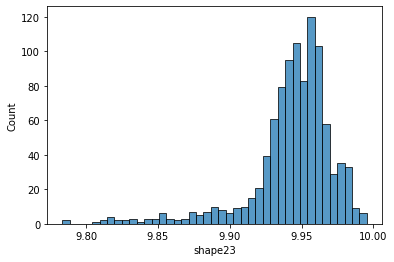

shape24
 Min: 9.782151486397916 Max: 9.991545553814184 
 mean: 9.941858366928543 std: 0.028102354818816535 
 median: 9.94524595121759 
 mode: 9.9121230816077


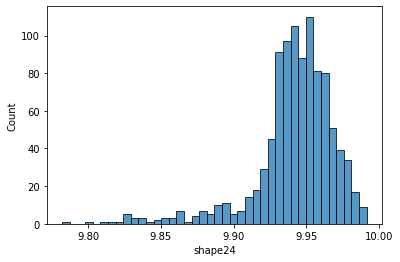

shape25
 Min: 9.795192323703679 Max: 9.994031164827119 
 mean: 9.940549731571075 std: 0.02652589603357659 
 median: 9.942934516082218 
 mode: 9.87004116794171


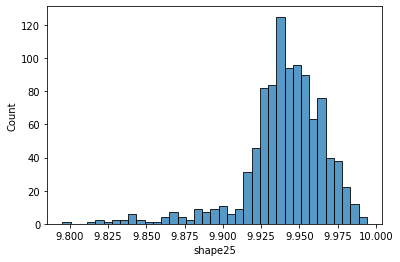

shape26
 Min: 9.807931281710268 Max: 9.996883971266156 
 mean: 9.939116072465561 std: 0.025167387893579984 
 median: 9.940977434942731 
 mode: 9.888018193953476


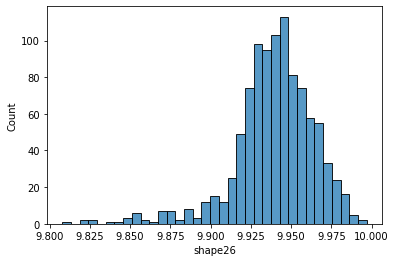

shape27
 Min: 9.818977333872722 Max: 9.99120963385204 
 mean: 9.937672710941753 std: 0.024391110368158914 
 median: 9.9389890189632 
 mode: 9.888477747958524


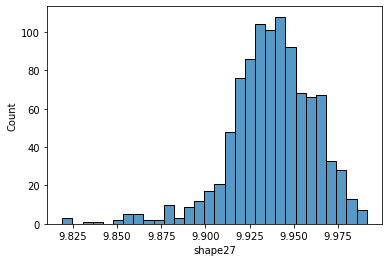

shape28
 Min: 9.822198561637242 Max: 9.991336112803143 
 mean: 9.936059617688992 std: 0.0241684000419845 
 median: 9.936575830147966 
 mode: 9.899902089968329


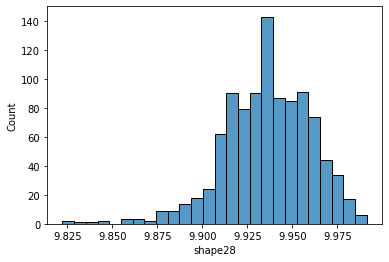

shape29
 Min: 9.820857734072778 Max: 9.992957463227789 
 mean: 9.934188035790536 std: 0.024359978335427822 
 median: 9.934111015280935 
 mode: 9.930457009562037


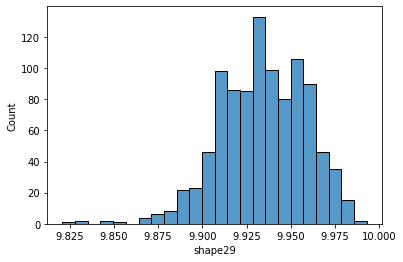

shape30
 Min: 9.8178976346721 Max: 9.992200787519318 
 mean: 9.931857382217409 std: 0.02491177897702099 
 median: 9.931749513945618 
 mode: 9.92400790189205


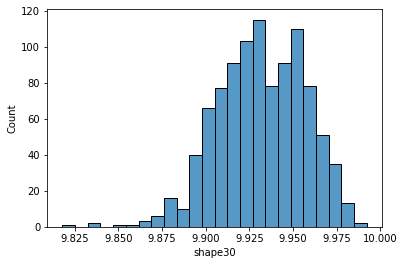

shape31
 Min: 9.803690893547602 Max: 9.993261244145234 
 mean: 9.929456403196287 std: 0.025829016299679656 
 median: 9.930134059315858 
 mode: 9.89523910361008


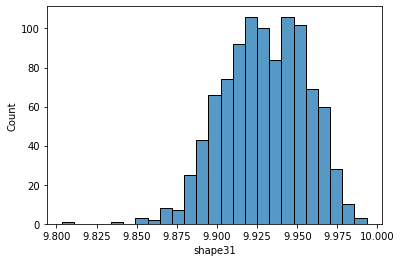

shape32
 Min: 9.792046312462238 Max: 9.994688023209424 
 mean: 9.927252796231556 std: 0.026972024617127482 
 median: 9.928191870541117 
 mode: 9.88834085506461


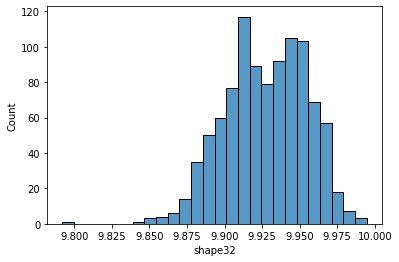

shape33
 Min: 9.793302556247832 Max: 9.989401245278758 
 mean: 9.926743236692765 std: 0.027294055524632554 
 median: 9.927451179625336 
 mode: 9.895944147291232


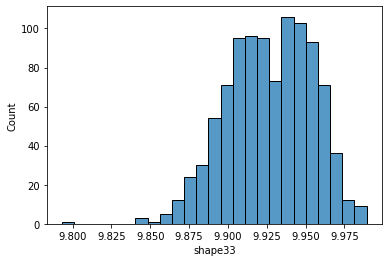

shape34
 Min: 9.805027037362054 Max: 9.994546975170348 
 mean: 9.928767882022019 std: 0.026271327152783262 
 median: 9.929259487414685 
 mode: 9.893330114703268


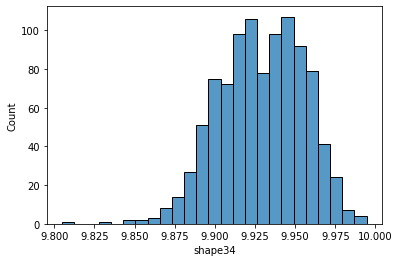

shape35
 Min: 9.816673620143815 Max: 9.996614346653073 
 mean: 9.931518478012471 std: 0.025220888373322106 
 median: 9.932747354302283 
 mode: 9.888184410683985


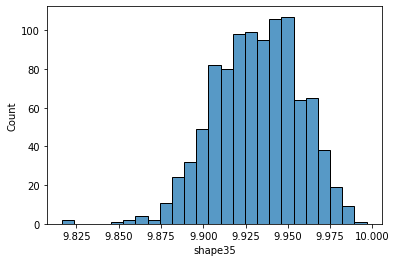

shape36
 Min: 9.814862253315706 Max: 9.99306121801266 
 mean: 9.93403004056578 std: 0.024513940884914223 
 median: 9.93369704300966 
 mode: 9.893653122585329


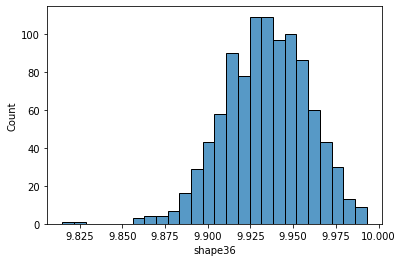

shape37
 Min: 9.802835568216462 Max: 9.993341137000183 
 mean: 9.936301255752406 std: 0.02383540619360832 
 median: 9.936015043933526 
 mode: 9.89940227409069


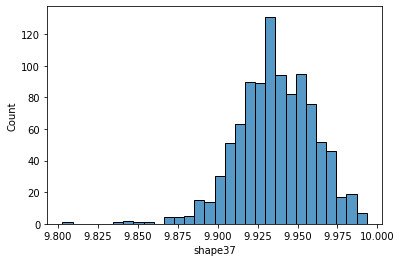

shape38
 Min: 9.793676614756915 Max: 9.993602795042808 
 mean: 9.938374335365591 std: 0.023615317089138402 
 median: 9.938261037867532 
 mode: 9.898392995897115


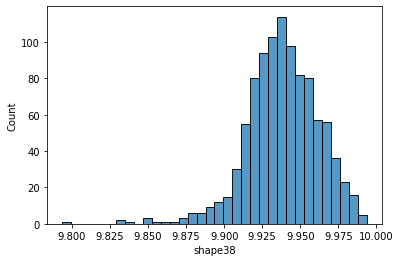

shape39
 Min: 9.79377253179793 Max: 9.993774178500018 
 mean: 9.940205484446086 std: 0.024101574942216042 
 median: 9.940651329368372 
 mode: 9.921373118039536


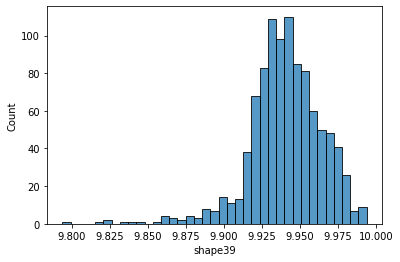

shape40
 Min: 9.791058805099183 Max: 9.993186545481425 
 mean: 9.941847783557069 std: 0.0250838710743439 
 median: 9.942791168384534 
 mode: 9.931403793994876


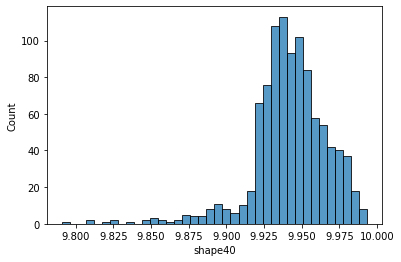

shape41
 Min: 9.781912266028886 Max: 9.991312254255556 
 mean: 9.943171795341415 std: 0.02671625883359759 
 median: 9.944728195186226 
 mode: 9.885447435121808


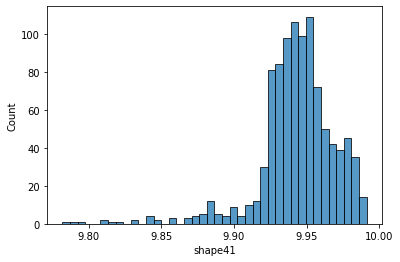

shape42
 Min: 9.776623701664372 Max: 9.99481359127935 
 mean: 9.94419492006745 std: 0.028432324945092454 
 median: 9.946874736740803 
 mode: 9.920765819628373


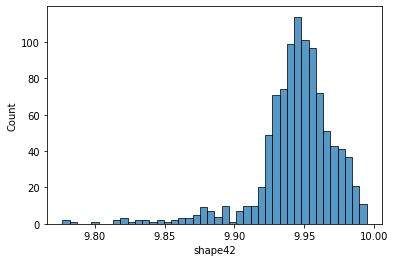

shape43
 Min: 9.772878308119306 Max: 9.994372069144143 
 mean: 9.944770973306168 std: 0.029993044879157174 
 median: 9.948892539070444 
 mode: 9.940834143345635


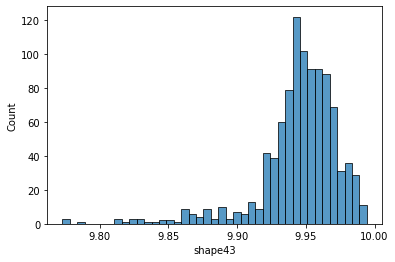

shape44
 Min: 9.770577079594052 Max: 9.996469646779543 
 mean: 9.945294496386772 std: 0.03150665691985162 
 median: 9.951228036303359 
 mode: 9.940076250324916


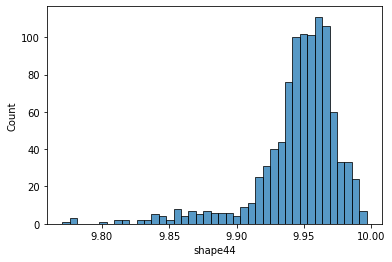

shape45
 Min: 9.764232833990466 Max: 9.995174329833556 
 mean: 9.945659121614753 std: 0.03279204231892177 
 median: 9.953883161655565 
 mode: 9.935519472177514


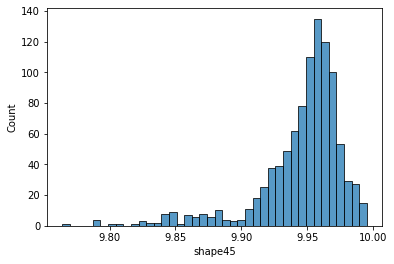

shape46
 Min: 9.776145813170032 Max: 9.994468861042922 
 mean: 9.945891367768505 std: 0.03389068312986447 
 median: 9.95551725559525 
 mode: 9.875324034069868


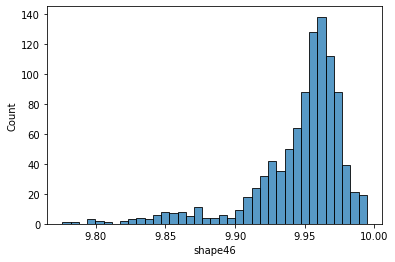

shape47
 Min: 9.771178540928535 Max: 9.995653390123305 
 mean: 9.945933849713901 std: 0.03461201066750364 
 median: 9.956075784909231 
 mode: 9.900843056786284


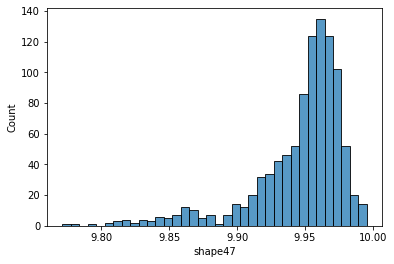

shape48
 Min: 9.760125398091114 Max: 9.994898204160668 
 mean: 9.945949700603997 std: 0.0352484066507523 
 median: 9.95646436414034 
 mode: 9.942755579029296


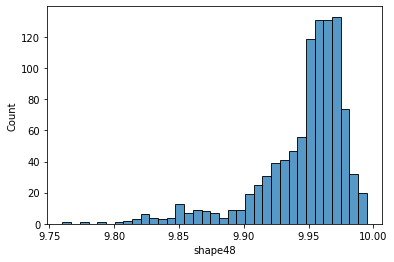

shape49
 Min: 9.773718860931709 Max: 9.997833269573817 
 mean: 9.945756359445218 std: 0.035505245862376876 
 median: 9.956058934002723 
 mode: 9.900960690215772


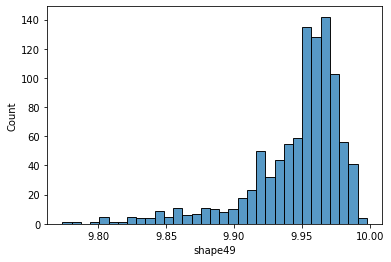

shape50
 Min: 9.787704685374232 Max: 9.993747511806713 
 mean: 9.94570208073716 std: 0.035224550758866616 
 median: 9.955943952590241 
 mode: 9.945180177823799


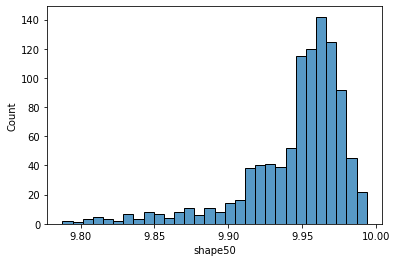

shape51
 Min: 9.800741132044404 Max: 9.988496248870176 
 mean: 9.945783112724142 std: 0.03414254588665212 
 median: 9.955197133126664 
 mode: 9.878894630721978


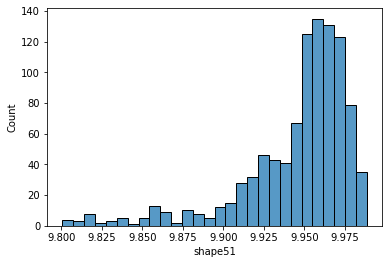

shape52
 Min: 9.799972756075737 Max: 9.989268528819489 
 mean: 9.945672208672395 std: 0.032577097047633466 
 median: 9.95482847260213 
 mode: 9.946907387130452


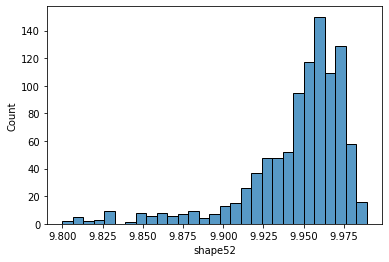

shape53
 Min: 9.803364122432253 Max: 9.990995515381806 
 mean: 9.945264786166096 std: 0.030878487989179717 
 median: 9.953062848651397 
 mode: 9.920208784682165


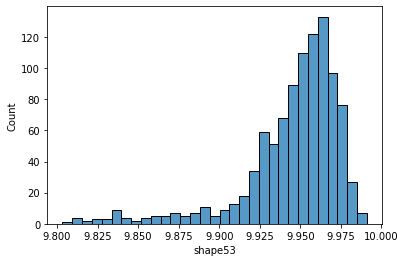

shape54
 Min: 9.8015192354815 Max: 9.988583049574336 
 mean: 9.944833100751998 std: 0.029007487523347402 
 median: 9.950204203066644 
 mode: 9.931748034333259


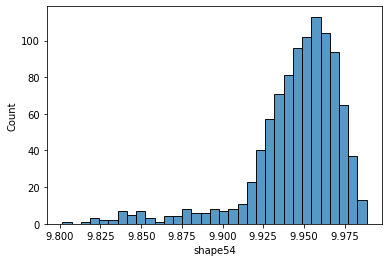

shape55
 Min: 9.804642498222908 Max: 9.988947229890126 
 mean: 9.944194479406372 std: 0.02739947312546568 
 median: 9.947975074780022 
 mode: 9.908748354652335


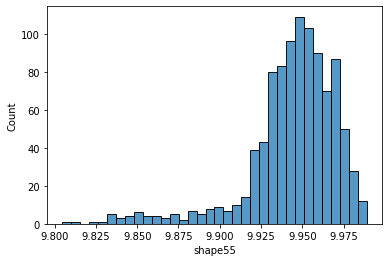

shape56
 Min: 9.8095765009633 Max: 9.990418489339428 
 mean: 9.943449640029845 std: 0.02607611380509317 
 median: 9.945942311775939 
 mode: 9.851488806245843


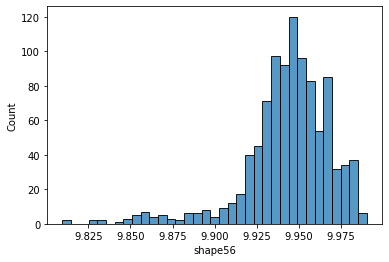

shape57
 Min: 9.814322826446459 Max: 9.992402576473054 
 mean: 9.942576852220721 std: 0.024991689013345187 
 median: 9.944093312986638 
 mode: 9.929971852501787


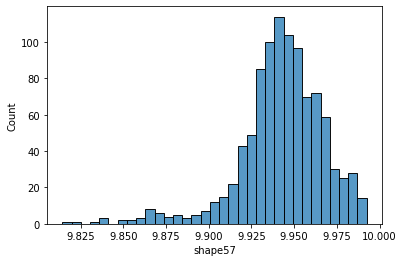

shape58
 Min: 9.817319322055196 Max: 9.99402607091611 
 mean: 9.94128826532729 std: 0.024461917982566177 
 median: 9.941588692717374 
 mode: 9.873334985471386


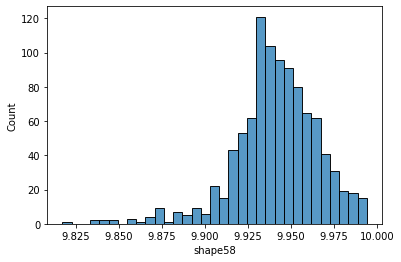

shape59
 Min: 9.828937177365136 Max: 9.993700171286024 
 mean: 9.939715700972489 std: 0.024168476799965546 
 median: 9.939569406002839 
 mode: 9.92520366517921


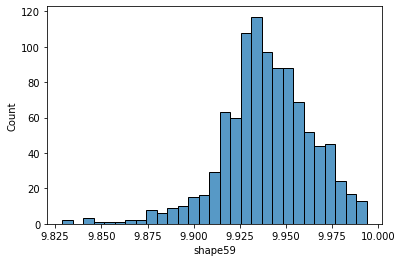

shape60
 Min: 9.82701505400436 Max: 9.995839231919712 
 mean: 9.937807470698486 std: 0.024284273106958954 
 median: 9.937158897768555 
 mode: 9.934889713286037


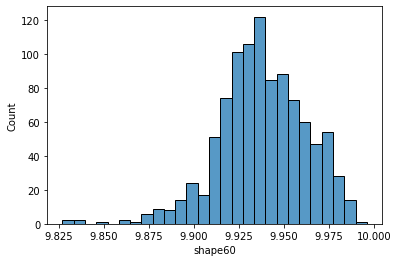

shape61
 Min: 9.811453301897437 Max: 9.991331920079416 
 mean: 9.935667443958065 std: 0.024473240248856415 
 median: 9.93538176736696 
 mode: 9.920371164734906


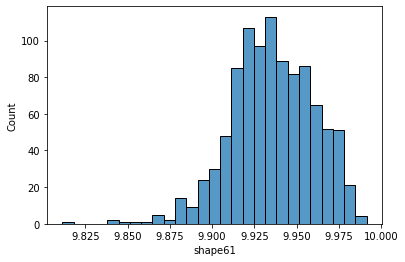

shape62
 Min: 9.795269080939288 Max: 9.98662192127426 
 mean: 9.933054590865813 std: 0.024842182592545586 
 median: 9.93303594186111 
 mode: 9.898392995897115


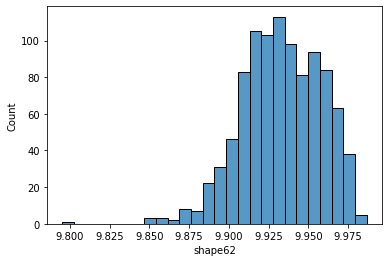

shape63
 Min: 9.77873652856809 Max: 9.983182331045121 
 mean: 9.930173654803141 std: 0.02548171464443982 
 median: 9.931192231498521 
 mode: 9.887636894332802


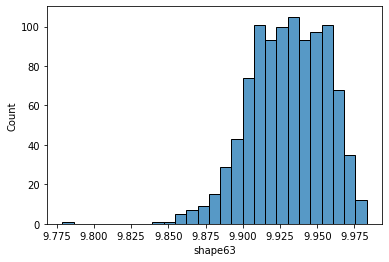

shape64
 Min: 9.762640911518256 Max: 9.983437477225284 
 mean: 9.927373049307004 std: 0.026402004499005146 
 median: 9.929377303973208 
 mode: 9.89339862976429


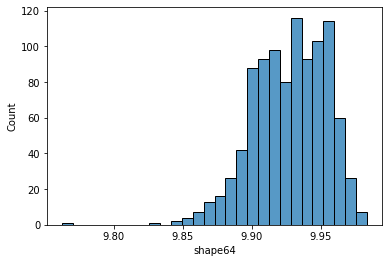

texture1
 Min: 1.9489758132101578 Max: 10.0 
 mean: 8.731587503051347 std: 1.6395533540943816 
 median: 9.360140776517278 
 mode: 10.0


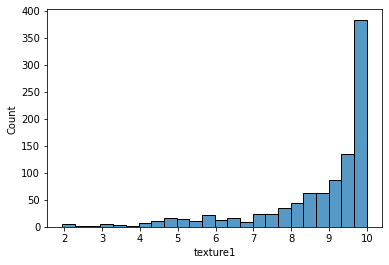

texture2
 Min: 4.583791712504583 Max: 10.0 
 mean: 9.11267356316645 std: 1.060936921130156 
 median: 9.534433606971577 
 mode: 10.0


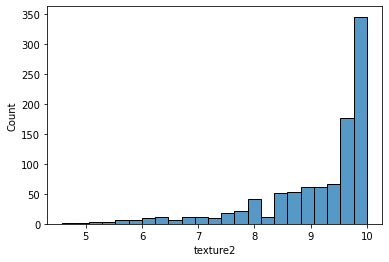

texture3
 Min: 5.614035087719298 Max: 10.0 
 mean: 9.170655775204509 std: 0.9117185601441938 
 median: 9.44652792865982 
 mode: 10.0


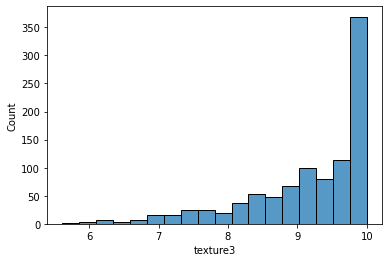

texture4
 Min: 3.8295102056446986 Max: 10.0 
 mean: 8.908142031516359 std: 1.2987249543714903 
 median: 9.44652792865982 
 mode: 10.0


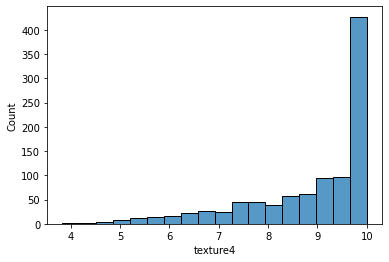

texture5
 Min: 3.3203838363714846 Max: 10.0 
 mean: 8.42119586088083 std: 1.872505185241031 
 median: 9.44652792865982 
 mode: 10.0


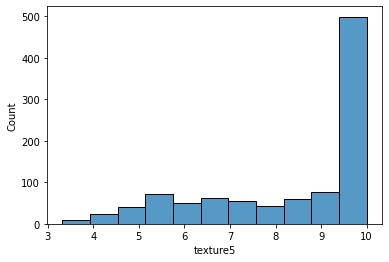

texture6
 Min: 4.057124310288867 Max: 10.0 
 mean: 9.311070376450298 std: 1.1667255747299148 
 median: 9.903245293482673 
 mode: 10.0


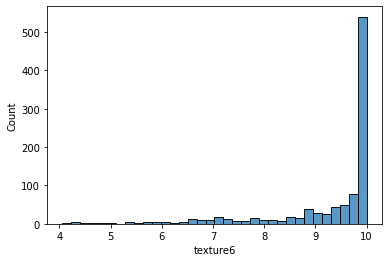

texture7
 Min: 3.8009806530084753 Max: 10.0 
 mean: 8.784173959203576 std: 1.2229709194352123 
 median: 9.110289160577956 
 mode: 10.0


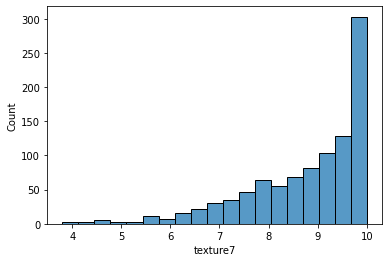

texture8
 Min: 4.241961482989734 Max: 10.0 
 mean: 8.6520819157517 std: 1.4282204094837736 
 median: 9.110289160577956 
 mode: 10.0


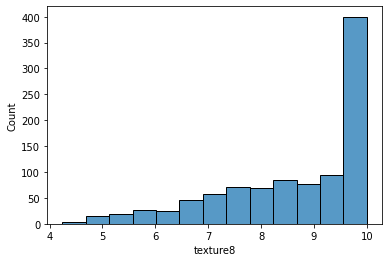

texture9
 Min: 3.3750717202740557 Max: 10.0 
 mean: 8.931256544171417 std: 1.2222005201709467 
 median: 9.360140776517278 
 mode: 10.0


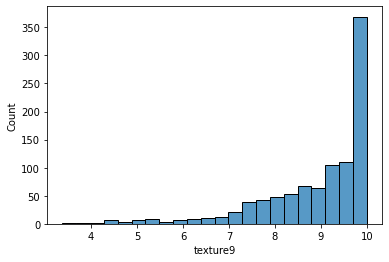

texture10
 Min: 2.544723515790009 Max: 10.0 
 mean: 8.822729458175049 std: 1.6533444787306288 
 median: 9.624083306065096 
 mode: 10.0


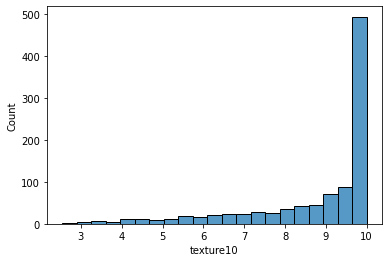

texture11
 Min: 2.596323605774223 Max: 10.0 
 mean: 8.841562499576074 std: 1.5918122162875483 
 median: 9.71534052268532 
 mode: 10.0


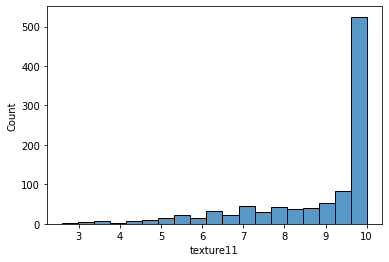

texture12
 Min: 1.6452509830374624 Max: 10.0 
 mean: 8.98880678145178 std: 2.056545094909604 
 median: 10.0 
 mode: 10.0


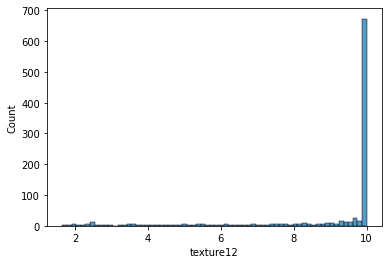

texture13
 Min: 4.753981459472308 Max: 10.0 
 mean: 9.224645490276394 std: 0.9339035997015767 
 median: 9.534433606971577 
 mode: 10.0


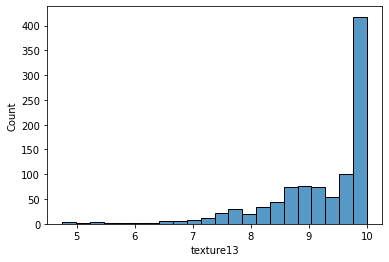

texture14
 Min: 3.51407386583266 Max: 10.0 
 mean: 9.038467404645424 std: 1.1094411295635964 
 median: 9.360140776517278 
 mode: 10.0


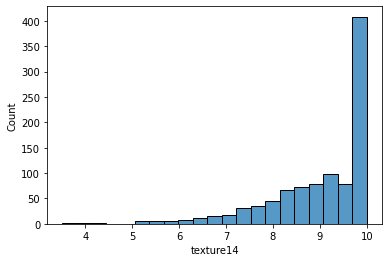

texture15
 Min: 1.0487457001426295 Max: 10.0 
 mean: 9.601526005152731 std: 1.3692480989246725 
 median: 10.0 
 mode: 10.0


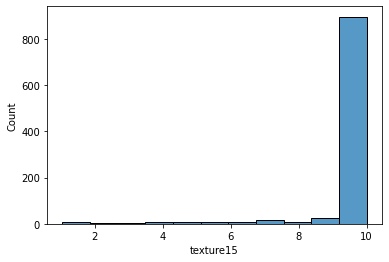

texture16
 Min: 4.731935834950078 Max: 10.0 
 mean: 9.648107817384465 std: 0.7687964708881867 
 median: 10.0 
 mode: 10.0


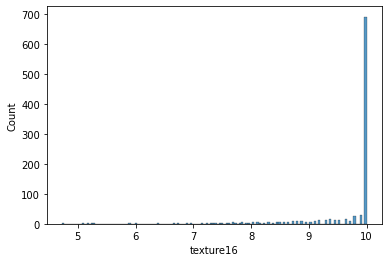

texture17
 Min: 3.3750717202740557 Max: 10.0 
 mean: 8.986562633237856 std: 1.3548016023746452 
 median: 9.624083306065096 
 mode: 10.0


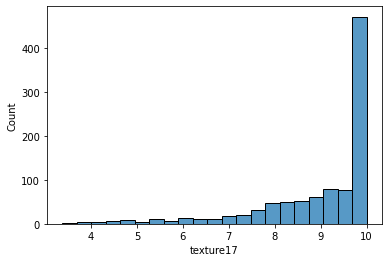

texture18
 Min: 4.710093730865244 Max: 10.0 
 mean: 9.529166794922709 std: 0.8780397505201747 
 median: 9.903245293482673 
 mode: 10.0


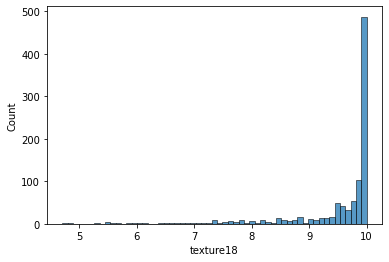

texture19
 Min: 2.4951344877488895 Max: 10.0 
 mean: 8.404321880920529 std: 1.5215651275474373 
 median: 8.797241185164332 
 mode: 10.0


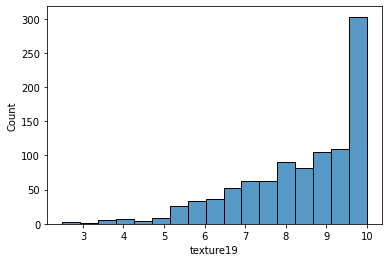

texture20
 Min: 5.009794147558477 Max: 10.0 
 mean: 8.879587260335919 std: 1.0468330972460622 
 median: 9.192105819522194 
 mode: 10.0


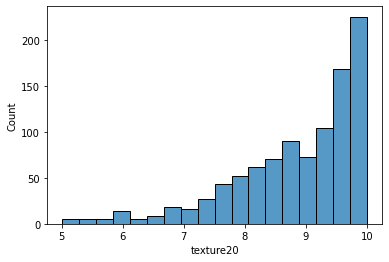

texture21
 Min: 5.059294936657627 Max: 10.0 
 mean: 9.787962790423471 std: 0.6797873613255847 
 median: 10.0 
 mode: 10.0


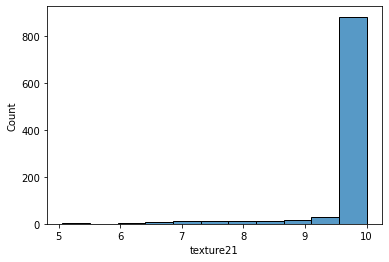

texture22
 Min: 3.6006193065207213 Max: 10.0 
 mean: 9.07070462046434 std: 1.263984911586109 
 median: 9.71534052268532 
 mode: 10.0


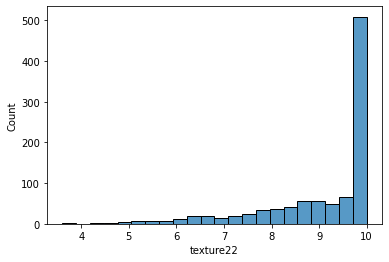

texture23
 Min: 3.3862720530967456 Max: 10.0 
 mean: 8.801781599757264 std: 1.308548208303549 
 median: 9.275405335213149 
 mode: 10.0


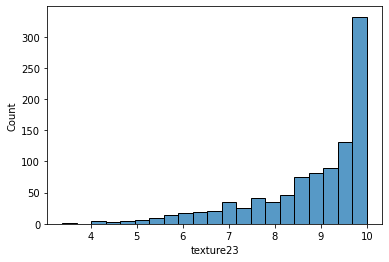

texture24
 Min: 4.259488009541253 Max: 10.0 
 mean: 9.252783925629359 std: 1.1049755093127198 
 median: 9.808441144448912 
 mode: 10.0


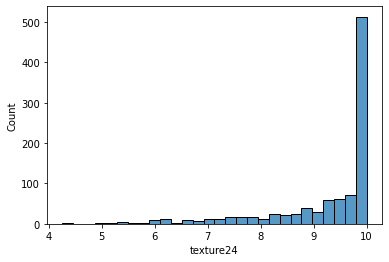

texture25
 Min: 3.9475761882204328 Max: 10.0 
 mean: 9.199998232751259 std: 1.0173911583326218 
 median: 9.624083306065096 
 mode: 10.0


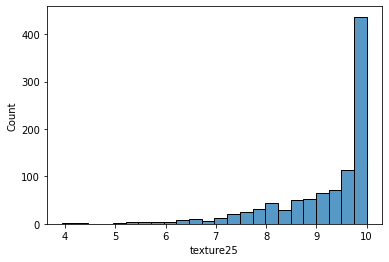

texture26
 Min: 2.483053162168202 Max: 10.0 
 mean: 8.676374821355084 std: 1.7693813019321993 
 median: 9.534433606971577 
 mode: 10.0


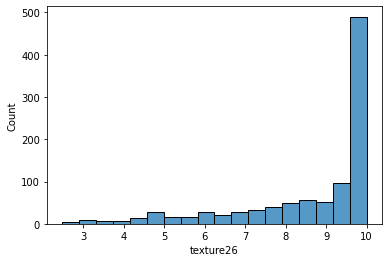

texture27
 Min: 3.0530622214080725 Max: 10.0 
 mean: 8.714064490925688 std: 1.5934846438864319 
 median: 9.44652792865982 
 mode: 10.0


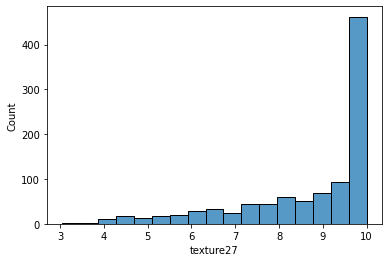

texture28
 Min: 4.54297655824096 Max: 10.0 
 mean: 9.265624948991716 std: 1.1251736983389096 
 median: 9.808441144448912 
 mode: 10.0


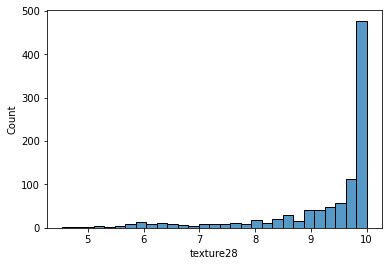

texture29
 Min: 3.176216490916021 Max: 10.0 
 mean: 8.500560745516006 std: 1.3648121957428838 
 median: 8.87350814144372 
 mode: 10.0


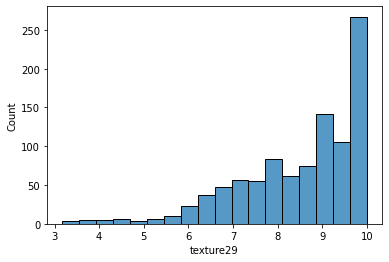

texture30
 Min: 5.378136798287602 Max: 10.0 
 mean: 9.05888204489779 std: 0.91231765824014 
 median: 9.275405335213149 
 mode: 10.0


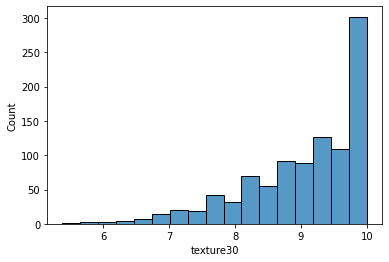

texture31
 Min: 3.0806198207079265 Max: 10.0 
 mean: 8.363151237676908 std: 1.3928669988329756 
 median: 8.648648648648647 
 mode: 10.0


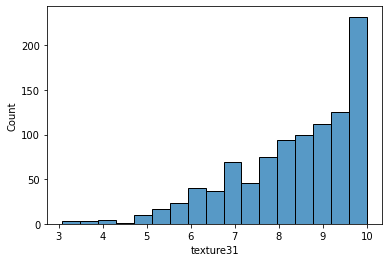

texture32
 Min: 4.425170369059209 Max: 10.0 
 mean: 9.562913752591292 std: 0.9536402893576038 
 median: 10.0 
 mode: 10.0


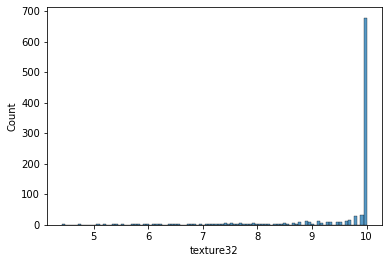

texture33
 Min: 1.88444578449478 Max: 10.0 
 mean: 8.951573021743101 std: 1.9071187371287475 
 median: 10.0 
 mode: 10.0


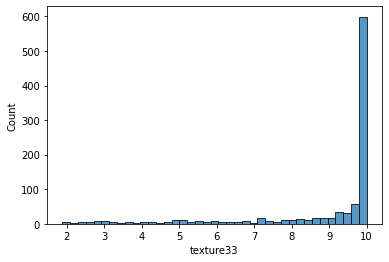

texture34
 Min: 2.204974422296701 Max: 10.0 
 mean: 8.446852124634322 std: 1.7550045727847974 
 median: 9.02999765220061 
 mode: 10.0


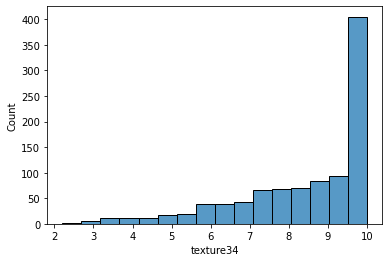

texture35
 Min: 5.644997403301194 Max: 10.0 
 mean: 9.139467578586961 std: 0.8567758453044093 
 median: 9.360140776517278 
 mode: 10.0


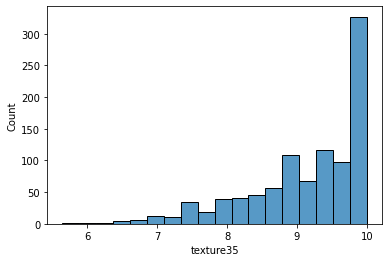

texture36
 Min: 4.821135859608524 Max: 10.0 
 mean: 9.772623415577538 std: 0.7746644165923865 
 median: 10.0 
 mode: 10.0


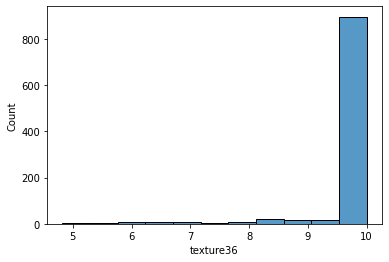

texture37
 Min: 1.5229044834307992 Max: 10.0 
 mean: 9.033965144042437 std: 1.8072310353880658 
 median: 10.0 
 mode: 10.0


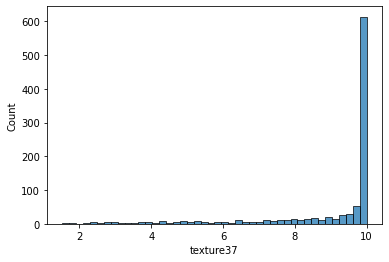

texture38
 Min: 3.146930169619536 Max: 10.0 
 mean: 8.393821780474509 std: 1.5101538141884456 
 median: 8.648648648648647 
 mode: 10.0


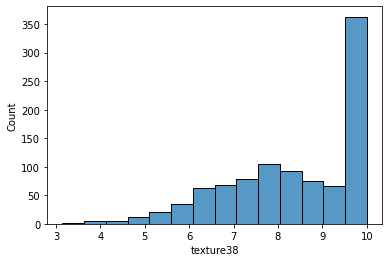

texture39
 Min: 4.041057140547967 Max: 10.0 
 mean: 8.779750084308004 std: 1.3036096323748674 
 median: 9.192105819522194 
 mode: 10.0


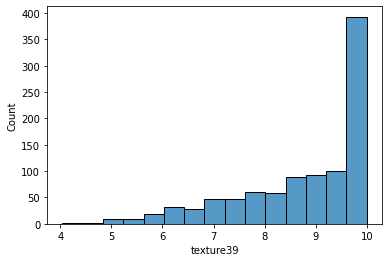

texture40
 Min: 3.75911585595068 Max: 10.0 
 mean: 8.677772502902485 std: 1.38831298461373 
 median: 9.110289160577956 
 mode: 10.0


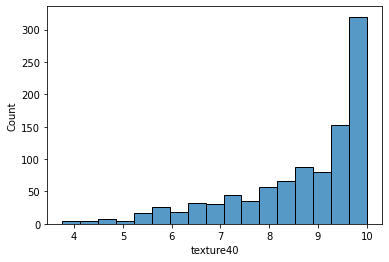

texture41
 Min: 1.956449435564338 Max: 10.0 
 mean: 9.159214596761847 std: 1.559030128587445 
 median: 10.0 
 mode: 10.0


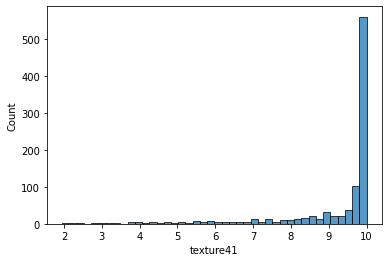

texture42
 Min: 5.838086508765886 Max: 10.0 
 mean: 9.51985034765977 std: 0.7694475412700433 
 median: 9.903245293482673 
 mode: 10.0


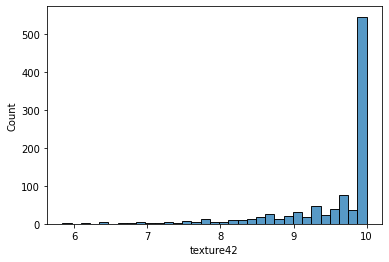

texture43
 Min: 3.6132389073565543 Max: 10.0 
 mean: 8.956203469896934 std: 1.1318472693037467 
 median: 9.275405335213149 
 mode: 10.0


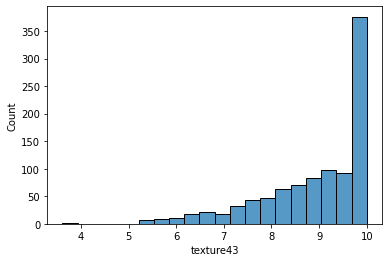

texture44
 Min: 1.9527054734334421 Max: 10.0 
 mean: 8.617743651090013 std: 1.8452634043162428 
 median: 9.534433606971577 
 mode: 10.0


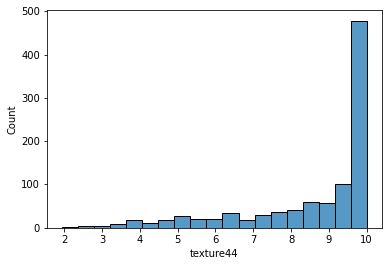

texture45
 Min: 4.241961482989734 Max: 10.0 
 mean: 8.82718801383141 std: 1.2579498061203993 
 median: 9.275405335213149 
 mode: 10.0


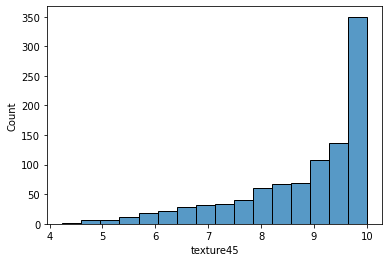

texture46
 Min: 3.6260787584306327 Max: 10.0 
 mean: 8.530147643510913 std: 1.5072329417436794 
 median: 8.951028920774442 
 mode: 10.0


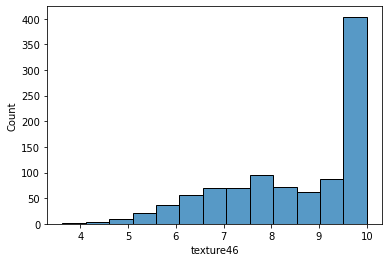

texture47
 Min: 5.03441019367376 Max: 10.0 
 mean: 8.57404407775061 std: 1.0662155923085253 
 median: 8.648648648648647 
 mode: 10.0


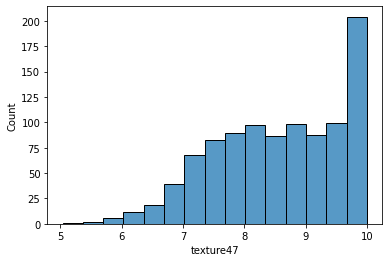

texture48
 Min: 2.865165320038966 Max: 10.0 
 mean: 8.948727806511766 std: 1.5618321451075343 
 median: 9.903245293482673 
 mode: 10.0


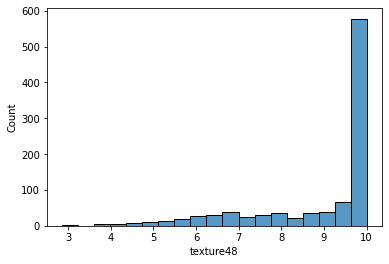

texture49
 Min: 4.821135859608524 Max: 10.0 
 mean: 9.059613749834476 std: 0.9098905101535621 
 median: 9.275405335213149 
 mode: 10.0


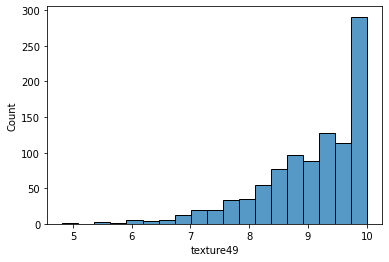

texture50
 Min: 3.156565656565657 Max: 10.0 
 mean: 8.701478623782293 std: 1.3634054047286595 
 median: 9.110289160577956 
 mode: 10.0


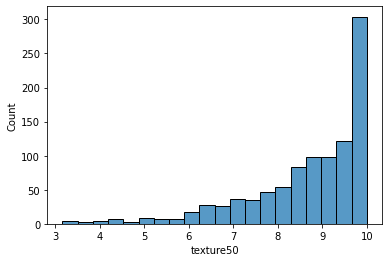

texture51
 Min: 2.0381957890874998 Max: 10.0 
 mean: 9.233987451459281 std: 1.4667186659943316 
 median: 10.0 
 mode: 10.0


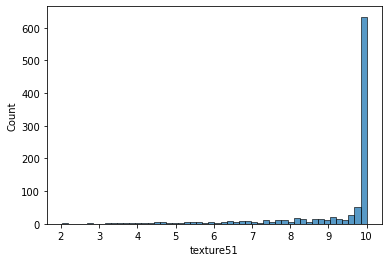

texture52
 Min: 4.60426354804549 Max: 10.0 
 mean: 9.438831254202762 std: 0.9331427264252523 
 median: 10.0 
 mode: 10.0


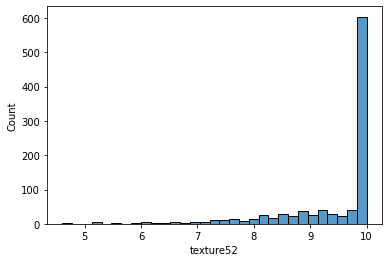

texture53
 Min: 3.7730153939028073 Max: 10.0 
 mean: 8.972071792213132 std: 1.2796062956143213 
 median: 9.534433606971577 
 mode: 10.0


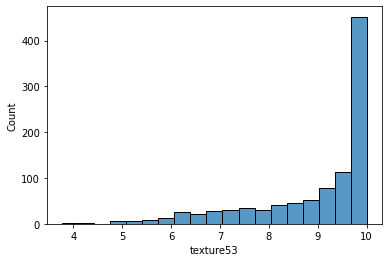

texture54
 Min: 2.677806341045416 Max: 10.0 
 mean: 8.488567104976333 std: 1.4127995250254193 
 median: 8.87350814144372 
 mode: 10.0


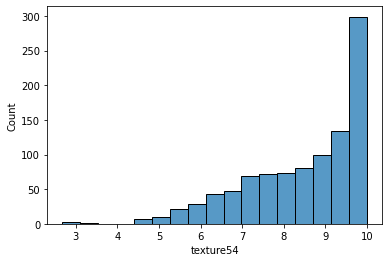

texture55
 Min: 1.8878966942928883 Max: 10.0 
 mean: 8.286602905480324 std: 2.225166113134511 
 median: 9.534433606971577 
 mode: 10.0


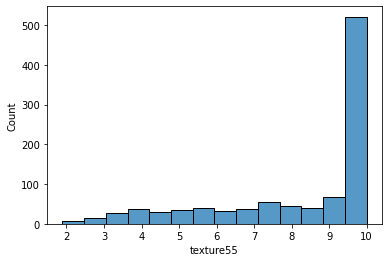

texture56
 Min: 3.309614429918914 Max: 10.0 
 mean: 9.688963332682919 std: 0.9512097412396584 
 median: 10.0 
 mode: 10.0


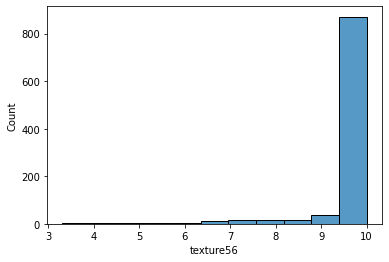

texture57
 Min: 3.6650174088326914 Max: 10.0 
 mean: 8.881475377255361 std: 1.321416283843695 
 median: 9.44652792865982 
 mode: 10.0


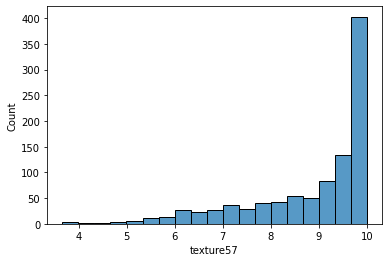

texture58
 Min: 3.331112591605596 Max: 10.0 
 mean: 9.24236975204989 std: 1.29663782191209 
 median: 9.903245293482673 
 mode: 10.0


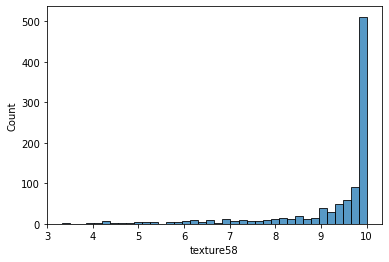

texture59
 Min: 4.843787842092516 Max: 10.0 
 mean: 8.739478068829348 std: 0.9805718986409305 
 median: 8.87350814144372 
 mode: 10.0


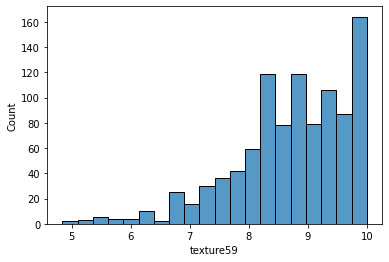

texture60
 Min: 1.4746435049326825 Max: 10.0 
 mean: 9.476051031337374 std: 1.5033806106638339 
 median: 10.0 
 mode: 10.0


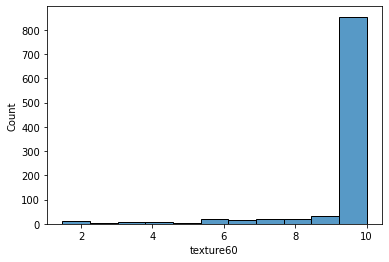

texture61
 Min: 3.978199466921272 Max: 10.0 
 mean: 9.814538439778694 std: 0.7031628903789403 
 median: 10.0 
 mode: 10.0


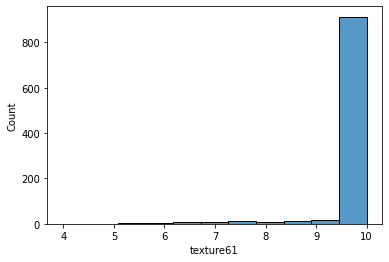

texture62
 Min: 2.100928610445817 Max: 10.0 
 mean: 8.805997133716591 std: 1.6514990710980375 
 median: 9.624083306065096 
 mode: 10.0


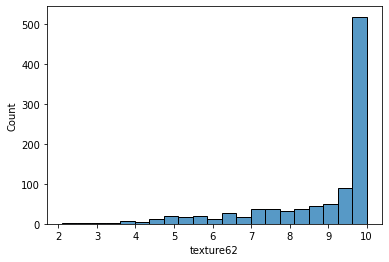

texture63
 Min: 5.350054035545758 Max: 10.0 
 mean: 9.295005871071876 std: 0.9589137735876421 
 median: 9.71534052268532 
 mode: 10.0


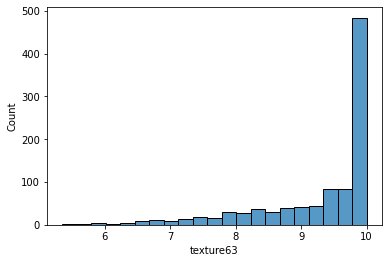

texture64
 Min: 4.139072847682119 Max: 10.0 
 mean: 8.623138387112402 std: 1.3395550801540643 
 median: 8.951028920774442 
 mode: 10.0


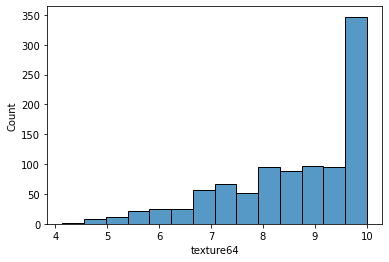

In [22]:
# 1/x didnt remove outliers but lets see if it solved distbrutions or not 
eps = 10 ** -1 # for visualization only
for col in outliers:
    print(col)
    log_col = 1 / (df[col] + eps)
    print(' Min:', log_col.min(), 'Max:', log_col.max(), '\n mean:', log_col.mean(), 'std:', log_col.std(),'\n', 'median:', log_col.median(), '\n', 'mode:', log_col.mode()[0])
    sns.histplot(log_col)
    plt.show()

**Notes:**

Data is left skewed even after 1/x and has outliers so we won't change data distbution (as it's scalled) we will remove outliers using IQR only.

### Very Important
**I won't remove outliers as they are not so away from most of points (not obviouse outlier) also no mathmatical transformer solved them (Experiment 3)**

In [23]:
# target and item_visability are outliers
def remove_outlier(col):
    sorted(col) #sort column then get Q1, Q3 at 25% and 75% of sorted col
    Q1, Q3 = col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

In [24]:
outliers_IQR = outliers
outliers_treatment = []
for col in outliers_IQR:
    low_item_visability, high_item_visability = remove_outlier(df[col]) #lower and upper range
    outliers_treatment.append((col, low_item_visability, high_item_visability))
    # I won't remove outliers as they seem no so far (obviouse outlier) (Experiment 1&2)
    # (Experiment 3&4)
#     df[col] = np.where(df[col] < low_item_visability, low_item_visability, df[col])
#     df[col] = np.where(df[col] > high_item_visability, high_item_visability, df[col])
#     print(low_item_visability, high_item_visability)
#     sns.boxplot(x=df[col])
#     plt.show()

In [25]:
# for col in outliers: #distrbution
#     data = df[col]
#     fig, axes = plt.subplots(1, 2, figsize=(14,6))
#     sns.histplot(x = data, kde=True, ax=axes[0])
#     sns.boxplot(x = data, ax=axes[1])
#     print(' Min:', data.min(), 'Max:', data.max(), '\n mean:', data.mean(), 'std:', data.std(),'\n', 'median:', data.median(), '\n', 'mode:', data.mode()[0])
#     plt.show()

**Notes:** 
No outliers + 

margin8, 16, 23

texture61,60,56,36, 21, 15

this columns have only 1 value so won't affect model training better remove them

In [26]:
# (Experiment 3&4)
# IQR_remove_cols = ['margin8', 'margin16', 'margin23', 'texture15', 'texture21', 'texture36', 'texture56', 'texture60', 'texture61']
# df.drop(IQR_remove_cols, axis=1, inplace=True)
# df

# Not (Experiment 1&2)
IQR_remove_cols = []

# 3) Visualize Data

* Univariate analysis

* Bivariate analysis

* Multivariate analysis

 Min: 0.0 Max: 0.087891 
 mean: 0.017412358585858587 std: 0.01973900333187047 
 median: 0.009766 
 mode: 0.0


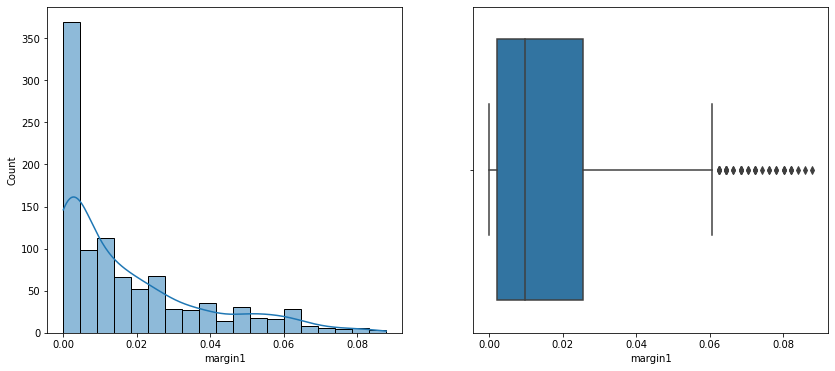

 Min: 0.0 Max: 0.20508 
 mean: 0.028539285858585856 std: 0.03885490466200282 
 median: 0.011719 
 mode: 0.0


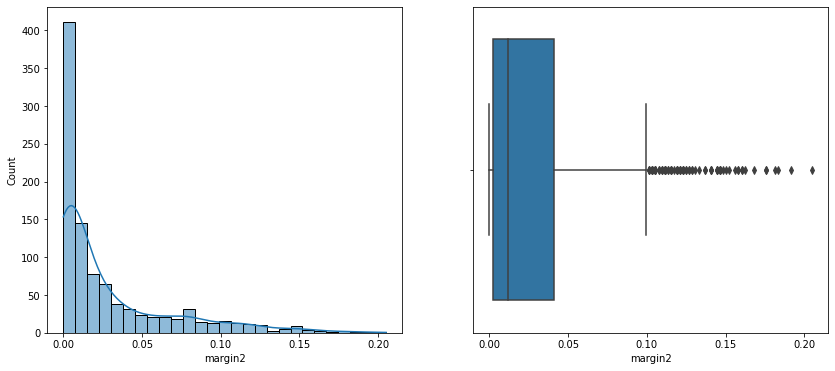

 Min: 0.0 Max: 0.15625 
 mean: 0.03198784242424243 std: 0.02584683730870975 
 median: 0.025391 
 mode: 0.015625


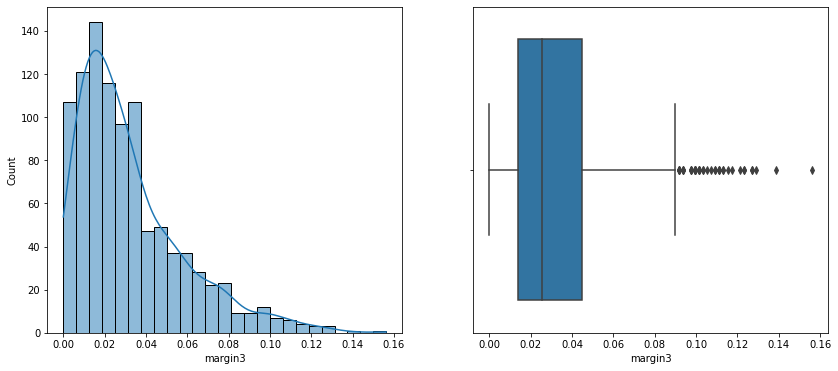

 Min: 0.0 Max: 0.16992 
 mean: 0.023279618181818184 std: 0.028411267587719915 
 median: 0.013672 
 mode: 0.003906


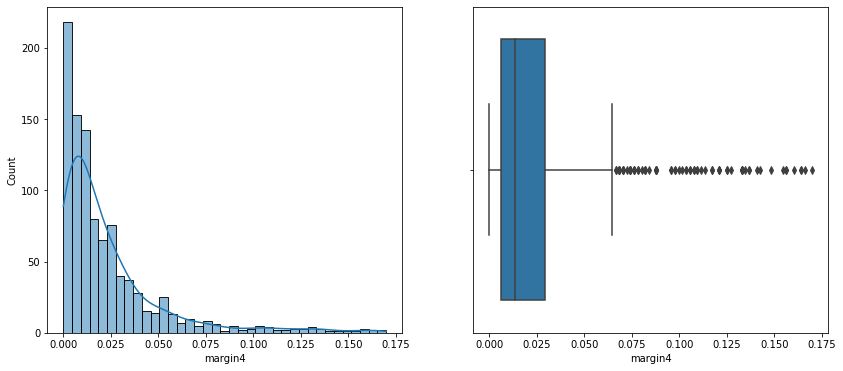

 Min: 0.0 Max: 0.11133 
 mean: 0.014263668686868687 std: 0.01838975576557838 
 median: 0.007812 
 mode: 0.0


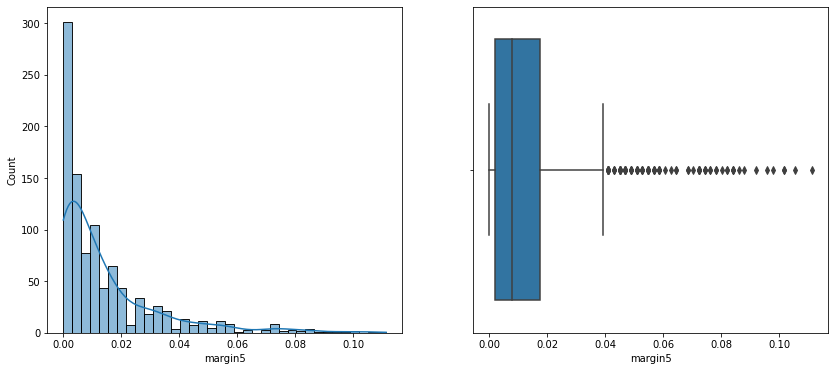

 Min: 0.0 Max: 0.31055 
 mean: 0.03857921414141414 std: 0.05202953156123841 
 median: 0.015625 
 mode: 0.0


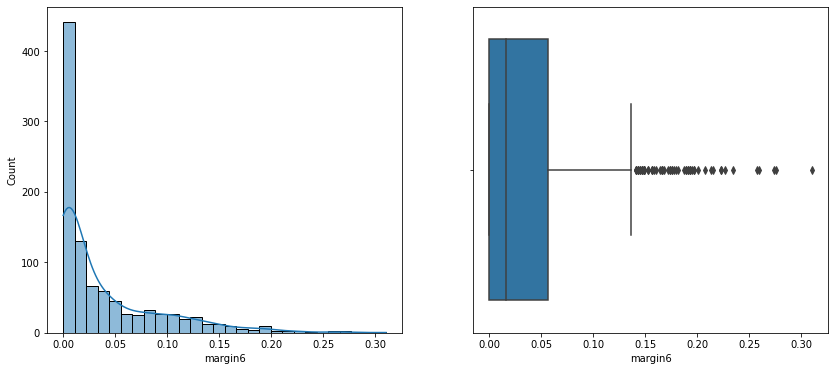

 Min: 0.0 Max: 0.091797 
 mean: 0.019201743434343437 std: 0.01751086526879564 
 median: 0.015625 
 mode: 0.0


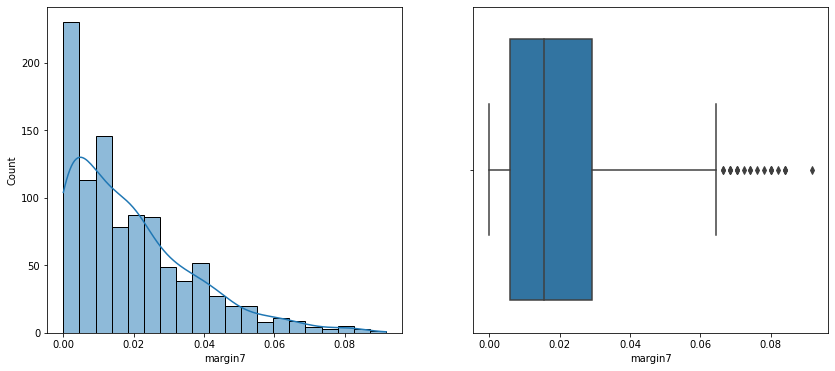

 Min: 0.0 Max: 0.03125 
 mean: 0.0010830373737373737 std: 0.0027428072176849034 
 median: 0.0 
 mode: 0.0


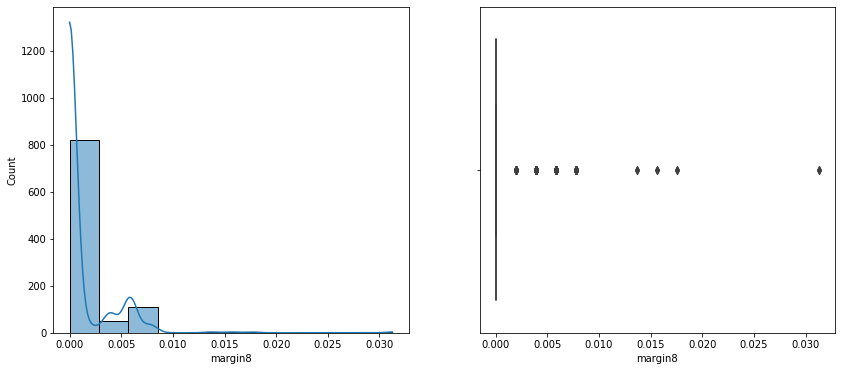

 Min: 0.0 Max: 0.076172 
 mean: 0.007167232323232323 std: 0.008932695750989329 
 median: 0.005859 
 mode: 0.005859


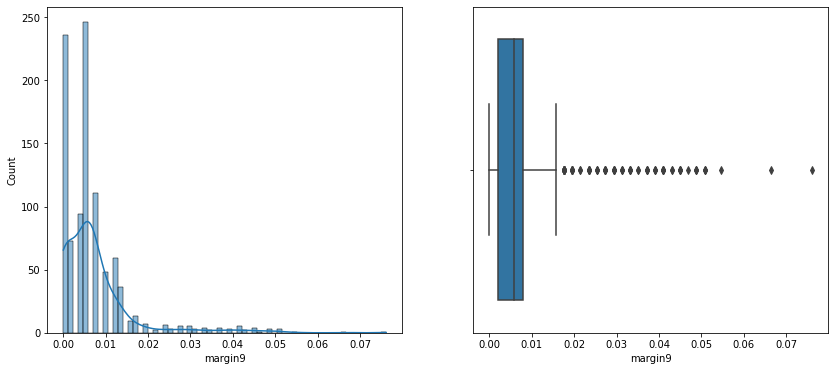

 Min: 0.0 Max: 0.097656 
 mean: 0.018639494949494947 std: 0.016071356380230602 
 median: 0.015625 
 mode: 0.0


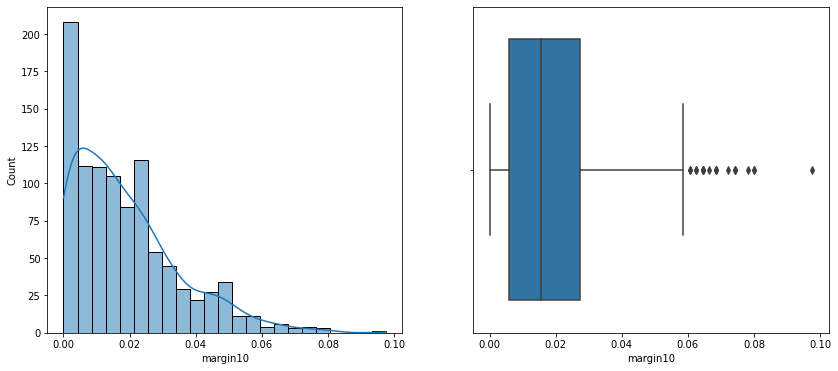

 Min: 0.0 Max: 0.125 
 mean: 0.024208851515151515 std: 0.026085549968515746 
 median: 0.013672 
 mode: 0.0


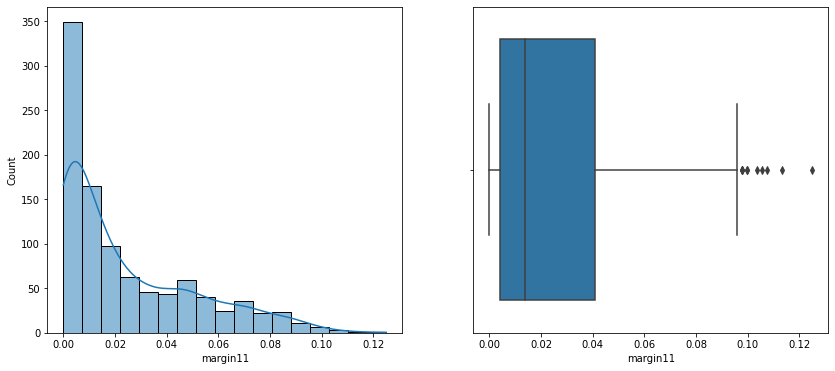

 Min: 0.0 Max: 0.052734 
 mean: 0.011975161616161616 std: 0.01173243225003493 
 median: 0.007812 
 mode: 0.001953


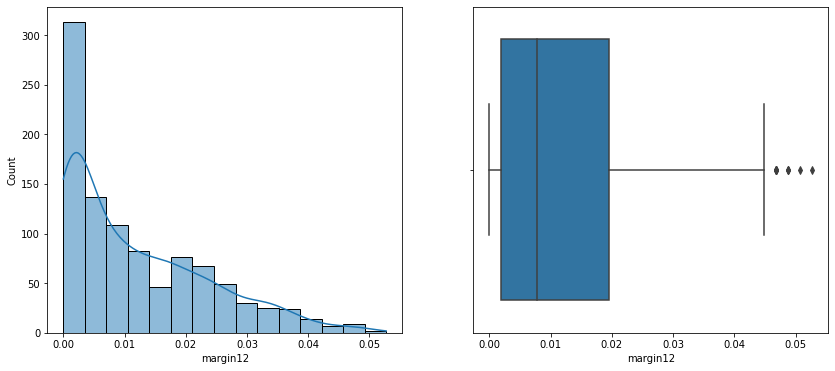

 Min: 0.0 Max: 0.38867 
 mean: 0.04125241616161616 std: 0.04634114674760711 
 median: 0.025391 
 mode: 0.0


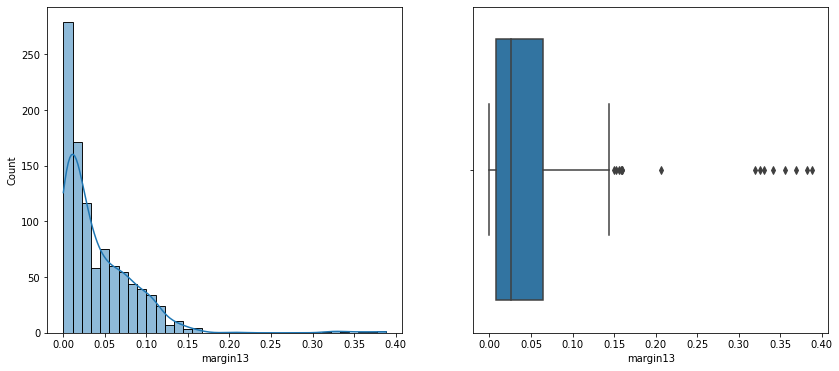

 Min: 0.0 Max: 0.082031 
 mean: 0.00805310808080808 std: 0.013273083408625555 
 median: 0.001953 
 mode: 0.0


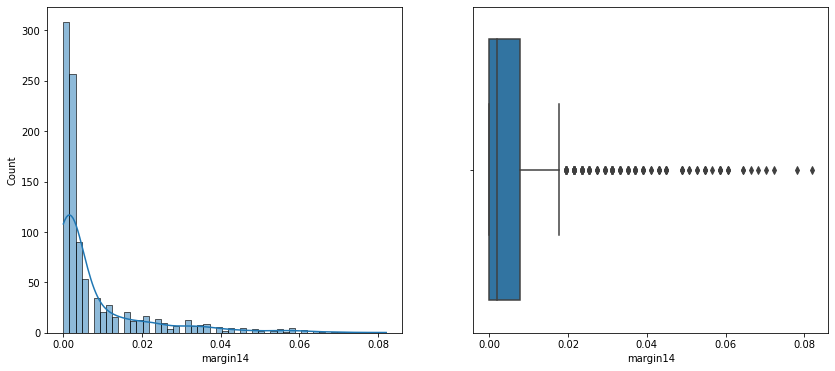

 Min: 0.0 Max: 0.064453 
 mean: 0.015609166666666669 std: 0.014276513949333028 
 median: 0.011719 
 mode: 0.0


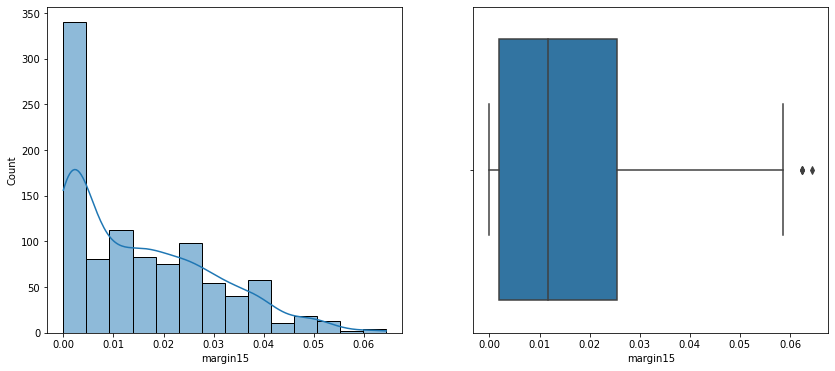

 Min: 0.0 Max: 0.015625 
 mean: 0.00011047676767676767 std: 0.0010518138846262078 
 median: 0.0 
 mode: 0.0


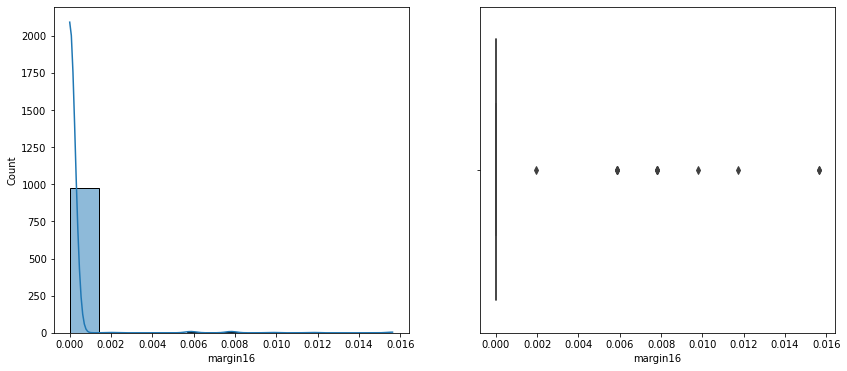

 Min: 0.0 Max: 0.060547 
 mean: 0.015127809090909092 std: 0.010821426822566232 
 median: 0.013672 
 mode: 0.003906


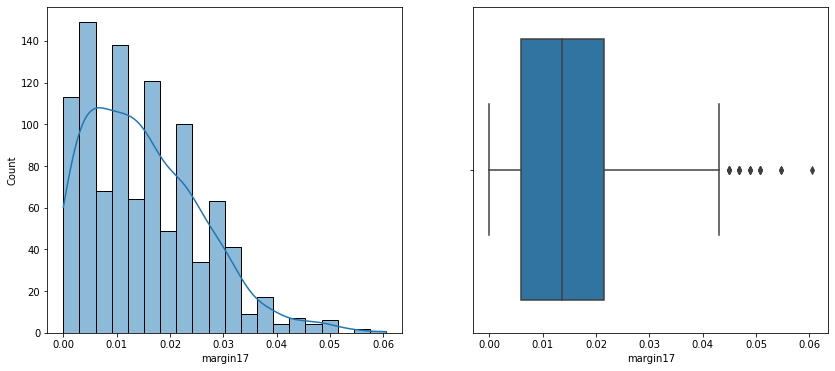

 Min: 0.0 Max: 0.22852 
 mean: 0.02010729191919192 std: 0.02128541402218167 
 median: 0.015625 
 mode: 0.001953


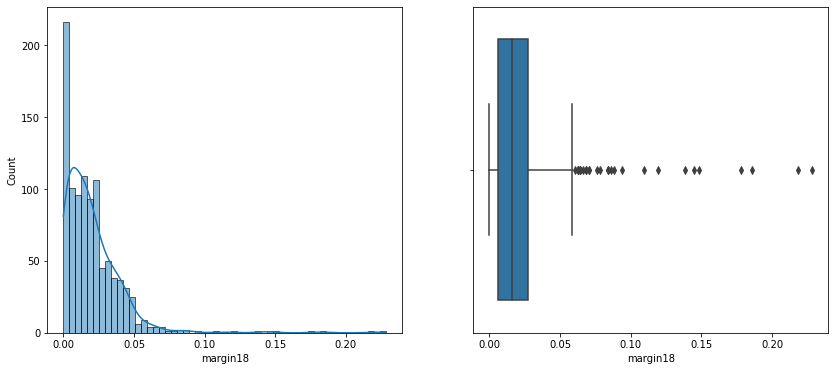

 Min: 0.0 Max: 0.125 
 mean: 0.01234407373737374 std: 0.014479049549261401 
 median: 0.007812 
 mode: 0.003906


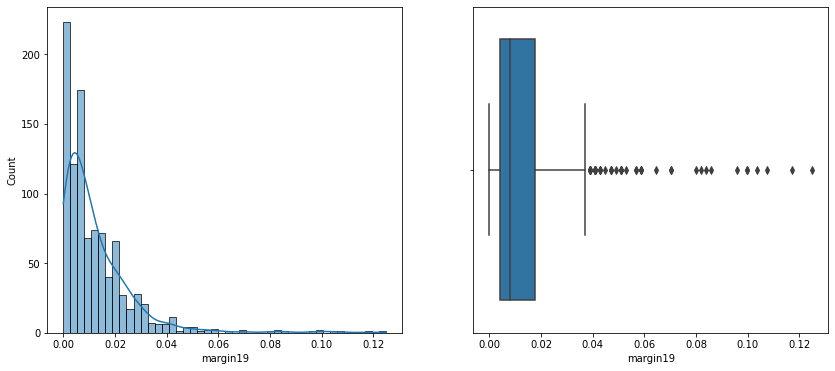

 Min: 0.0 Max: 0.052734 
 mean: 0.01313519898989899 std: 0.009672491007229382 
 median: 0.011719 
 mode: 0.007812


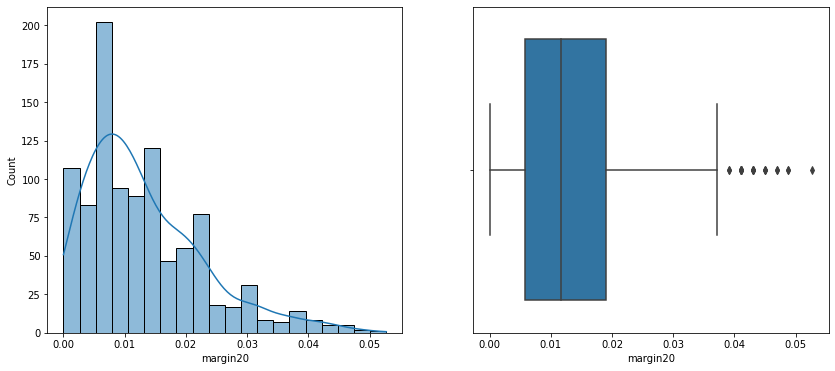

 Min: 0.0 Max: 0.10156 
 mean: 0.019130703030303033 std: 0.01946316701223879 
 median: 0.011719 
 mode: 0.0


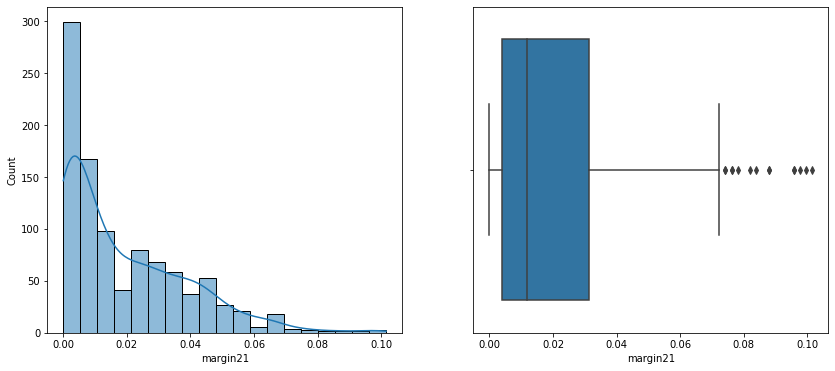

 Min: 0.0 Max: 0.0625 
 mean: 0.0061947060606060604 std: 0.010202926755971967 
 median: 0.001953 
 mode: 0.0


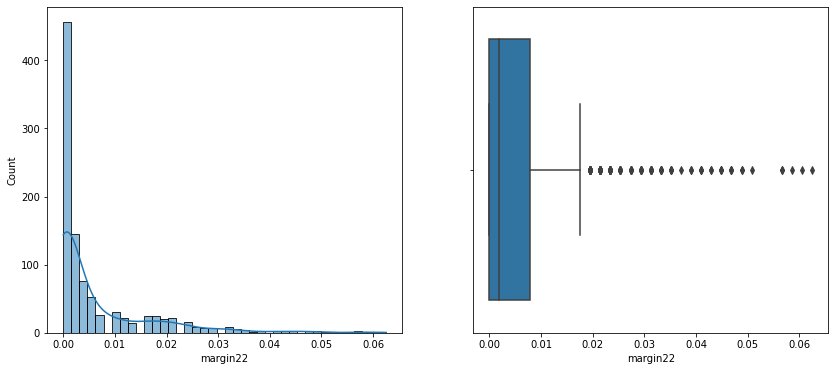

 Min: 0.0 Max: 0.039062 
 mean: 0.0009982525252525253 std: 0.004309692334619555 
 median: 0.0 
 mode: 0.0


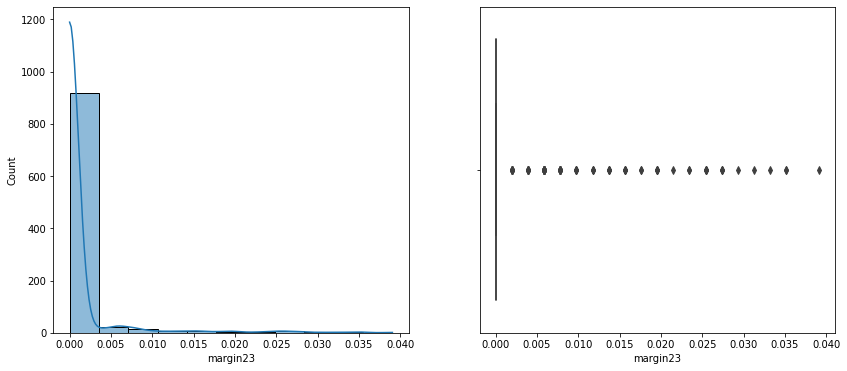

 Min: 0.0 Max: 0.078125 
 mean: 0.007646725252525252 std: 0.012864285215763301 
 median: 0.001953 
 mode: 0.0


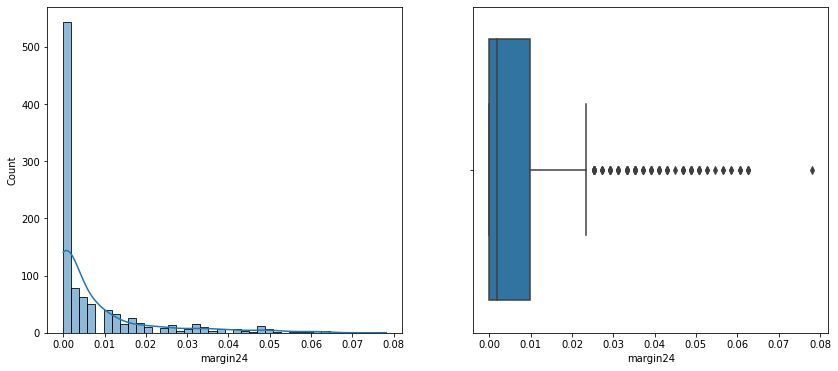

 Min: 0.0 Max: 0.082031 
 mean: 0.0088541101010101 std: 0.012724359545345712 
 median: 0.001953 
 mode: 0.0


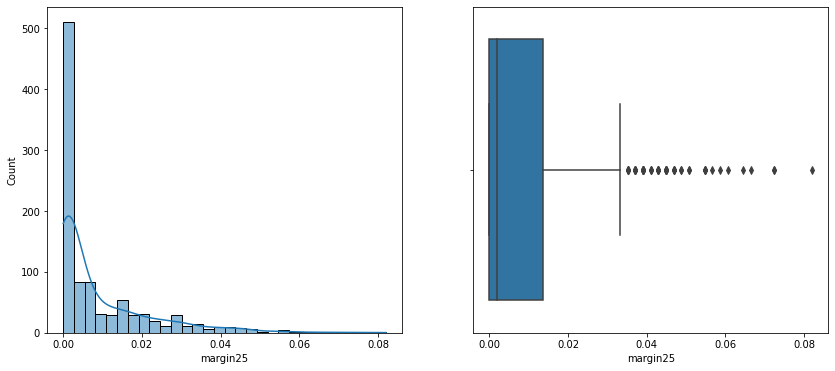

 Min: 0.0 Max: 0.085938 
 mean: 0.018718427272727278 std: 0.012313057790243177 
 median: 0.017578 
 mode: 0.011719


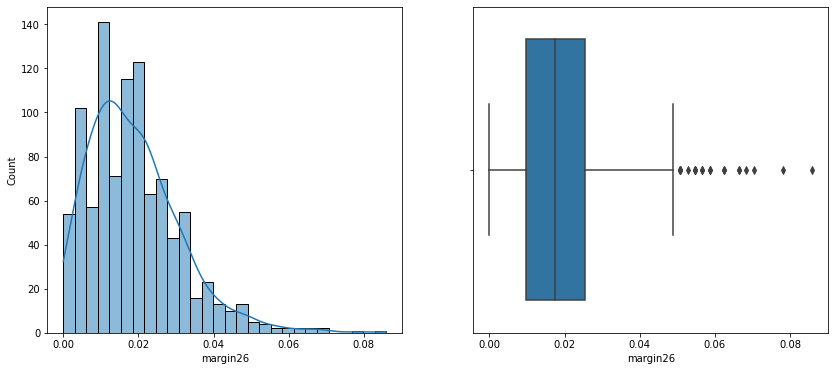

 Min: 0.0 Max: 0.082031 
 mean: 0.005628494949494949 std: 0.010856821977514442 
 median: 0.0 
 mode: 0.0


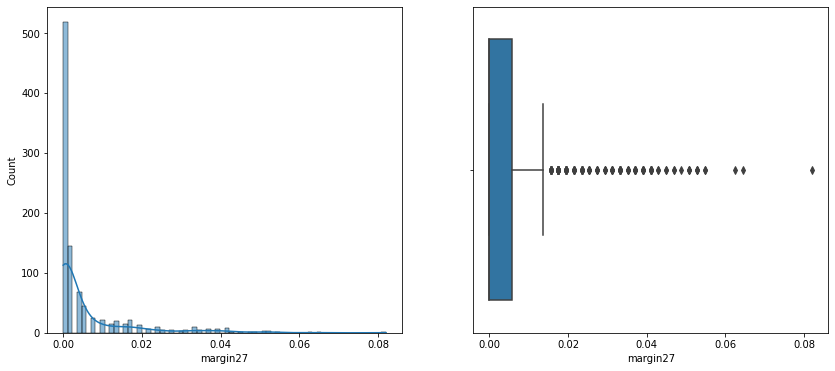

 Min: 0.0 Max: 0.080078 
 mean: 0.01553419696969697 std: 0.014100089595359303 
 median: 0.011719 
 mode: 0.001953


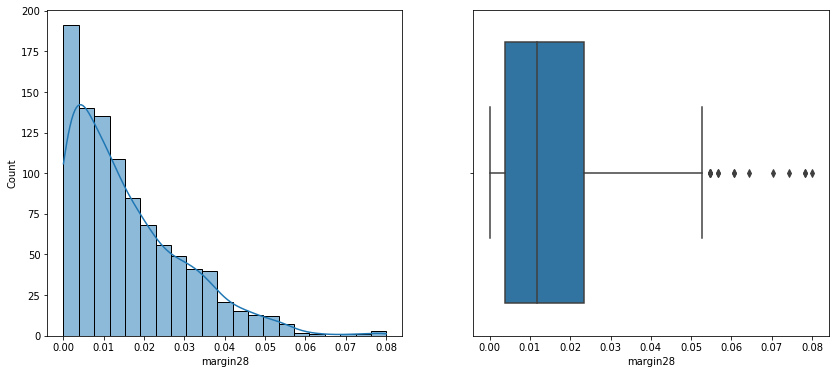

 Min: 0.0 Max: 0.14844 
 mean: 0.02826110101010101 std: 0.02285195222592137 
 median: 0.0244145 
 mode: 0.001953


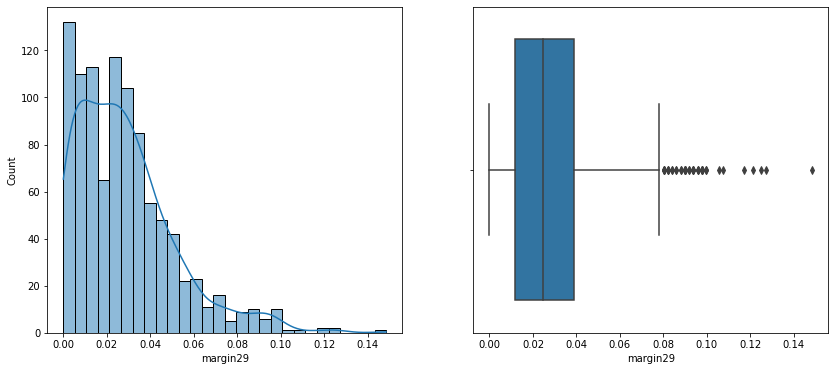

 Min: 0.0 Max: 0.11914 
 mean: 0.016500881818181816 std: 0.01656038252579267 
 median: 0.011719 
 mode: 0.003906


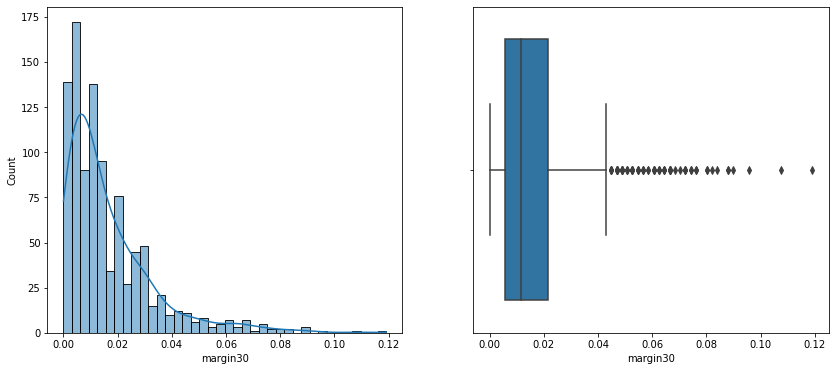

 Min: 0.0 Max: 0.11328 
 mean: 0.010842743434343435 std: 0.01656270589862539 
 median: 0.003906 
 mode: 0.0


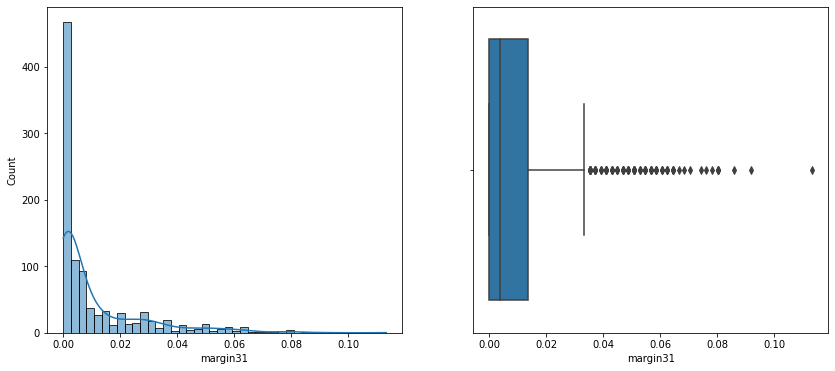

 Min: 0.0 Max: 0.12695 
 mean: 0.009690613131313131 std: 0.019290872449144705 
 median: 0.001953 
 mode: 0.0


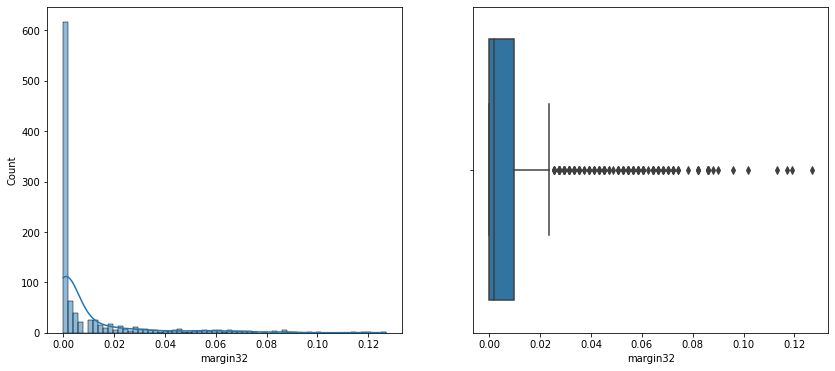

 Min: 0.0 Max: 0.078125 
 mean: 0.019501611111111112 std: 0.01600006448430123 
 median: 0.015625 
 mode: 0.003906


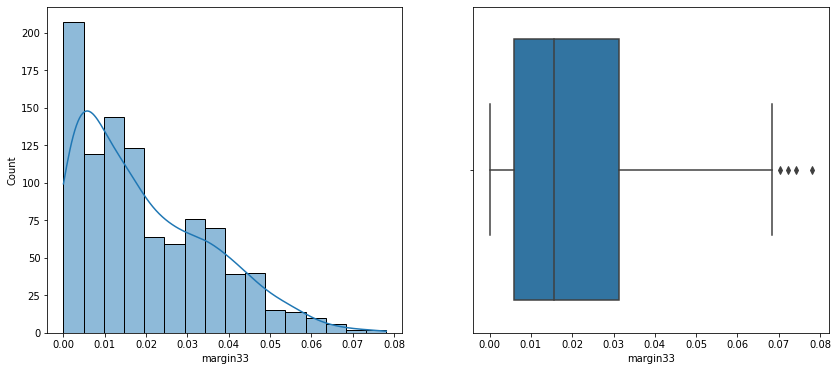

 Min: 0.0 Max: 0.015625 
 mean: 0.0010830333333333333 std: 0.00208812683435172 
 median: 0.0 
 mode: 0.0


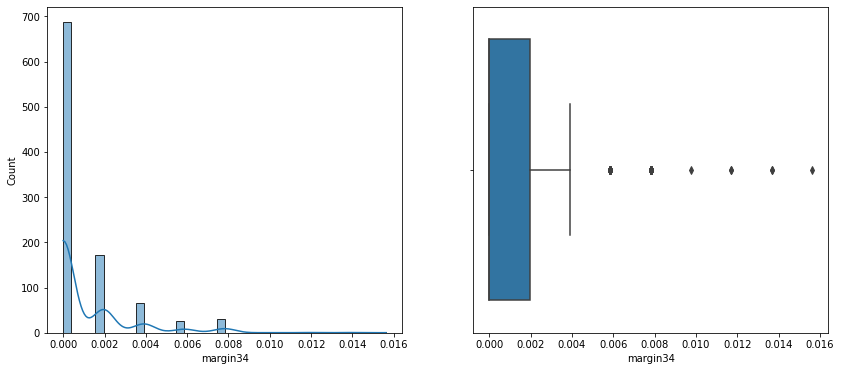

 Min: 0.0 Max: 0.082031 
 mean: 0.013166778787878789 std: 0.013217600276614148 
 median: 0.009766 
 mode: 0.0


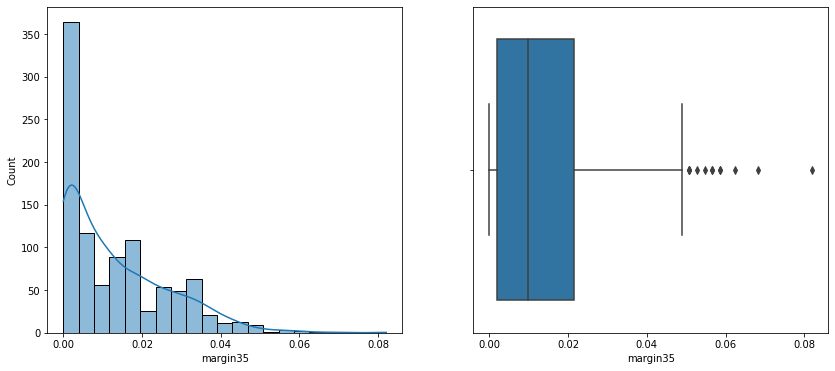

 Min: 0.0 Max: 0.089844 
 mean: 0.018041710101010102 std: 0.016463965795477715 
 median: 0.013672 
 mode: 0.0


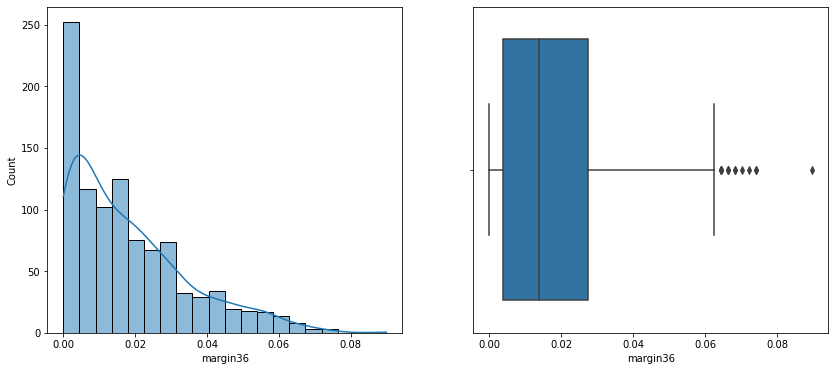

 Min: 0.0 Max: 0.068359 
 mean: 0.016268130303030304 std: 0.011483846314634769 
 median: 0.013672 
 mode: 0.009766


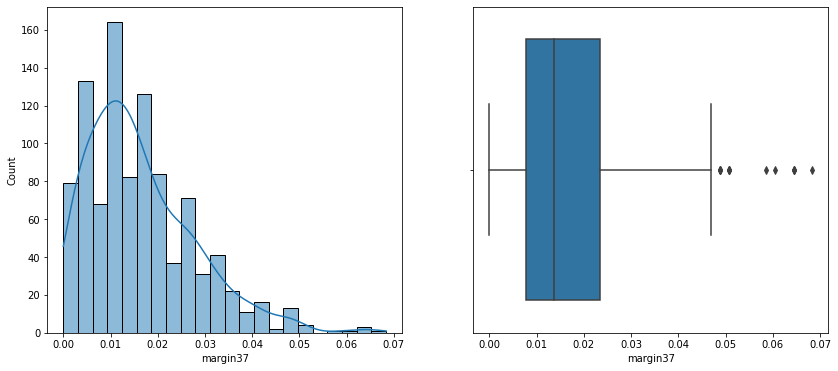

 Min: 0.0 Max: 0.14063 
 mean: 0.03106058888888889 std: 0.023270176625233053 
 median: 0.0283205 
 mode: 0.005859


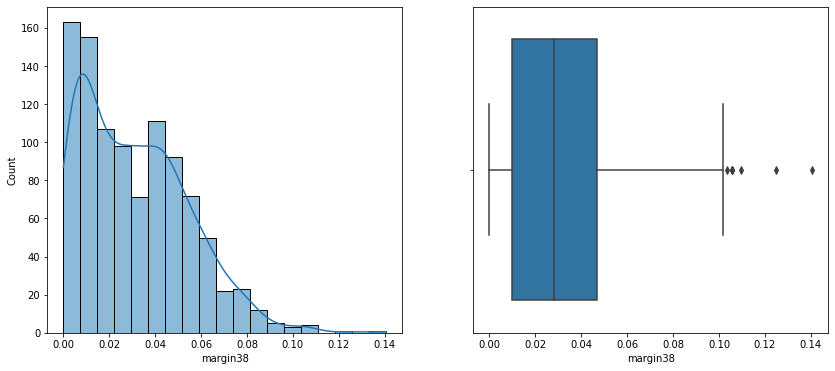

 Min: 0.0 Max: 0.0625 
 mean: 0.014845678787878788 std: 0.013241739401147474 
 median: 0.011719 
 mode: 0.0


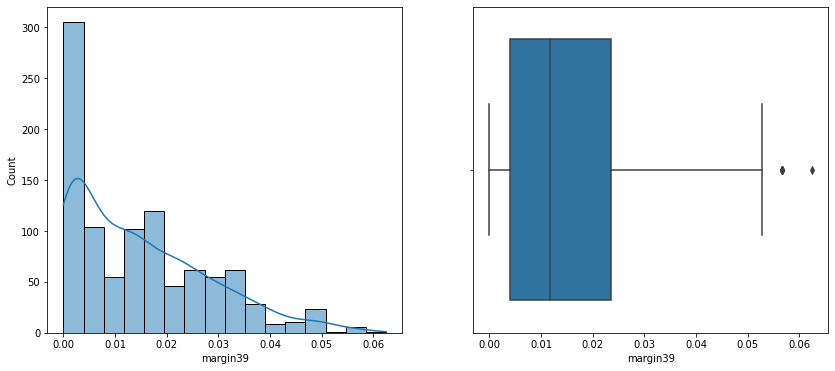

 Min: 0.0 Max: 0.0625 
 mean: 0.008163595959595961 std: 0.01019446766957996 
 median: 0.003906 
 mode: 0.0


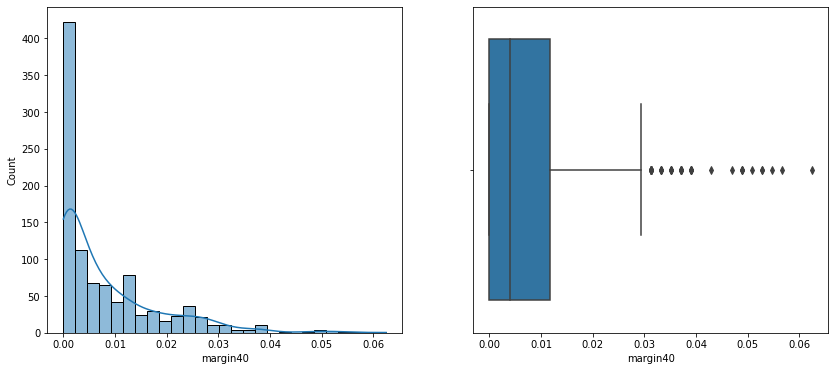

 Min: 0.0 Max: 0.20898 
 mean: 0.010884169696969696 std: 0.023445226185069116 
 median: 0.001953 
 mode: 0.0


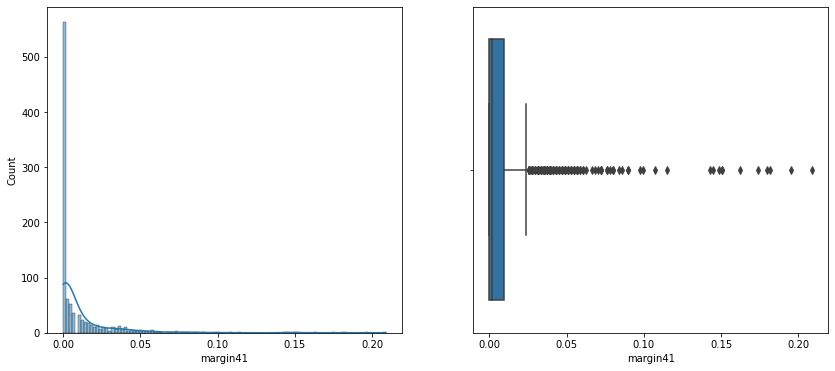

 Min: 0.0 Max: 0.091797 
 mean: 0.01749521919191919 std: 0.014471374275900702 
 median: 0.013672 
 mode: 0.001953


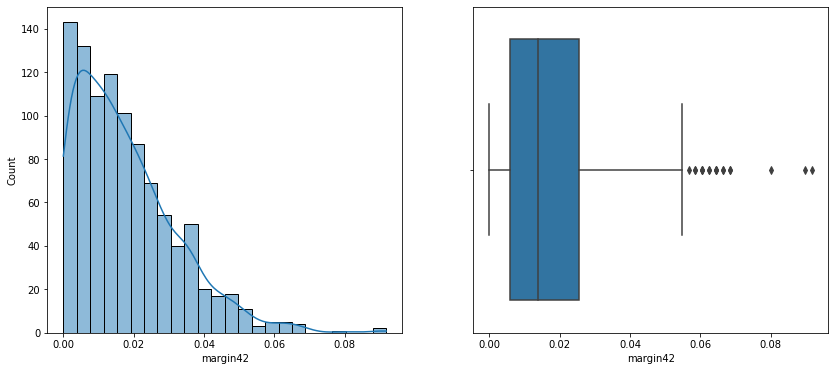

 Min: 0.0 Max: 0.11719 
 mean: 0.018858471717171716 std: 0.020935443864473855 
 median: 0.011719 
 mode: 0.0


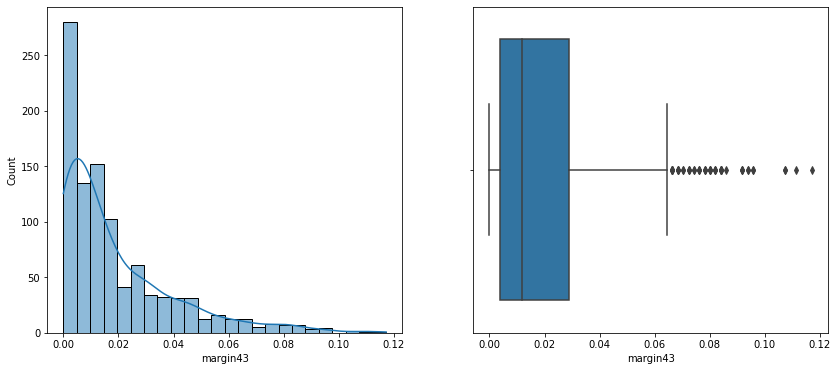

 Min: 0.0 Max: 0.064453 
 mean: 0.012679461616161616 std: 0.01168608643013649 
 median: 0.009766 
 mode: 0.001953


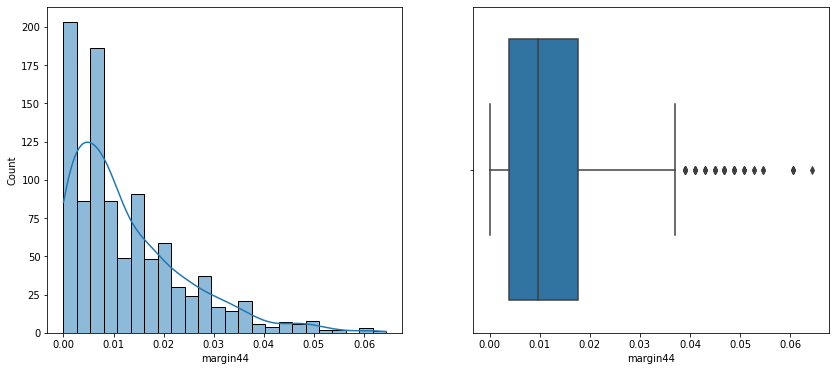

 Min: 0.0 Max: 0.17773 
 mean: 0.024688241414141412 std: 0.024317463310171955 
 median: 0.017578 
 mode: 0.005859


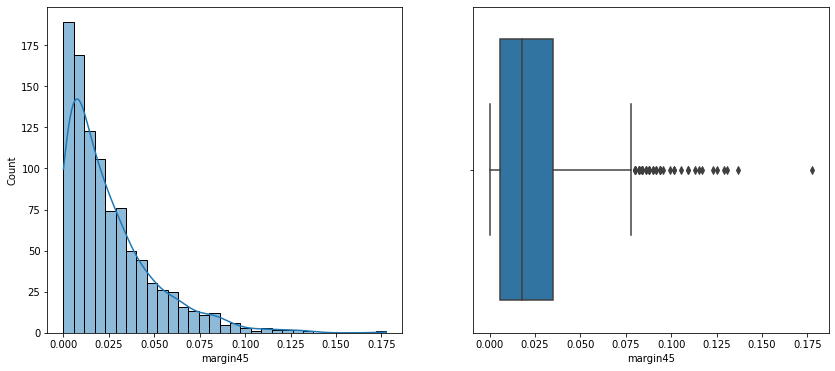

 Min: 0.0 Max: 0.089844 
 mean: 0.010057526262626263 std: 0.012889306587014359 
 median: 0.003906 
 mode: 0.0


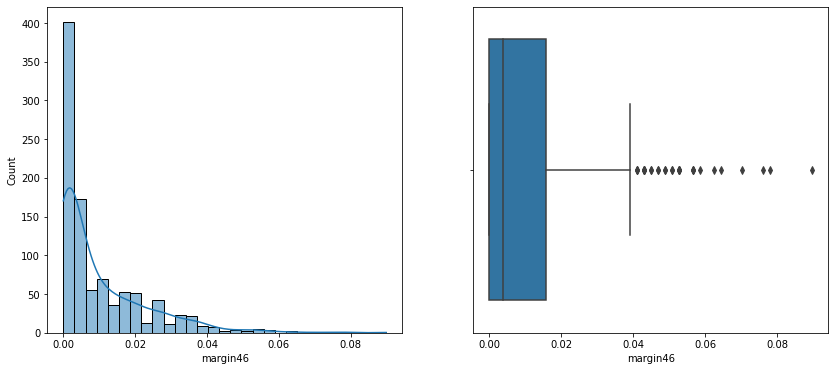

 Min: 0.0 Max: 0.10547 
 mean: 0.025319541414141417 std: 0.021454392189437628 
 median: 0.021484 
 mode: 0.0


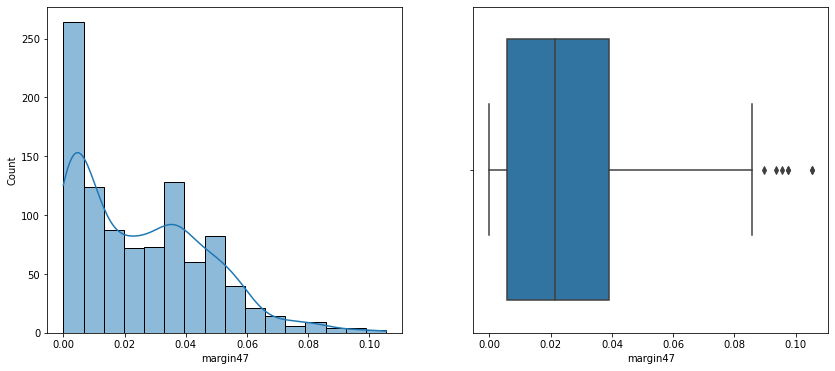

 Min: 0.0 Max: 0.14844 
 mean: 0.027002418181818182 std: 0.030128022252618403 
 median: 0.015625 
 mode: 0.0


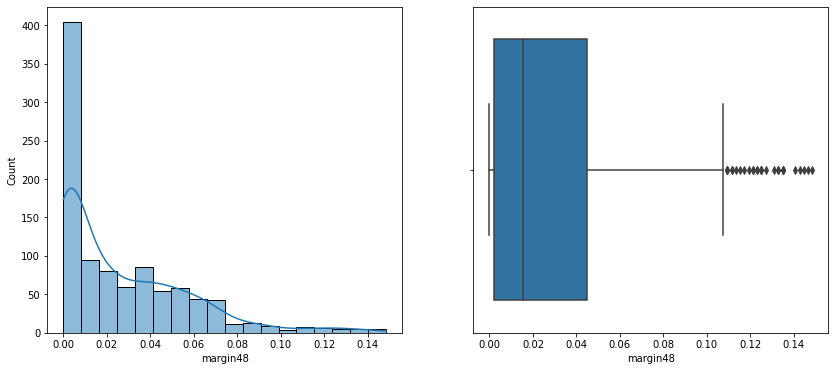

 Min: 0.0 Max: 0.10742 
 mean: 0.008560167676767675 std: 0.01597918721900921 
 median: 0.001953 
 mode: 0.0


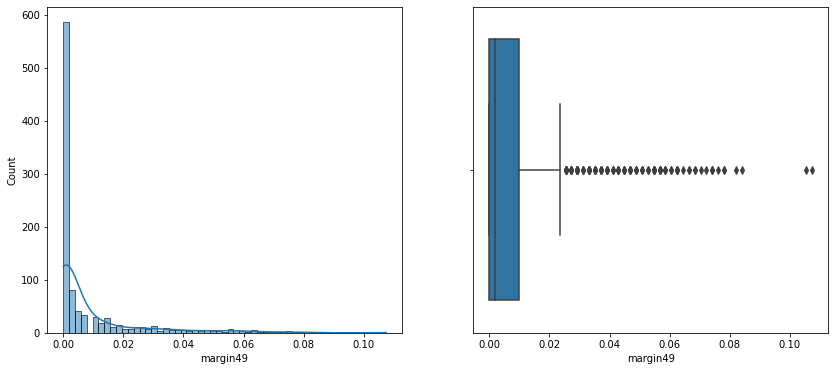

 Min: 0.0 Max: 0.080078 
 mean: 0.013981565656565657 std: 0.017611379637361646 
 median: 0.005859 
 mode: 0.0


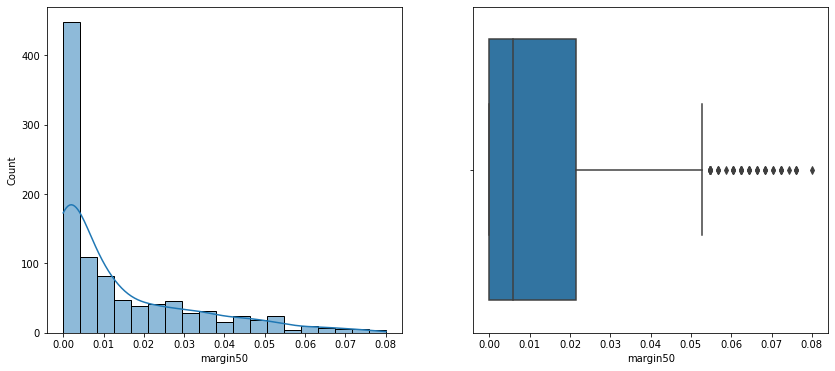

 Min: 0.0 Max: 0.13086 
 mean: 0.025656919191919193 std: 0.024887697665341227 
 median: 0.019531 
 mode: 0.0


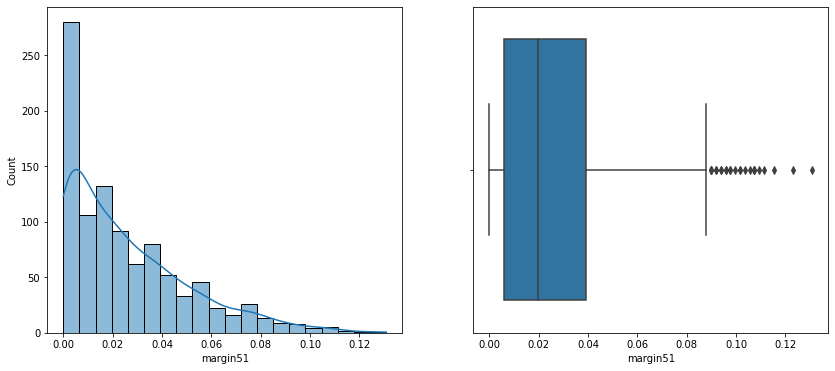

 Min: 0.0 Max: 0.083984 
 mean: 0.0027639101010101014 std: 0.007645900529233377 
 median: 0.0 
 mode: 0.0


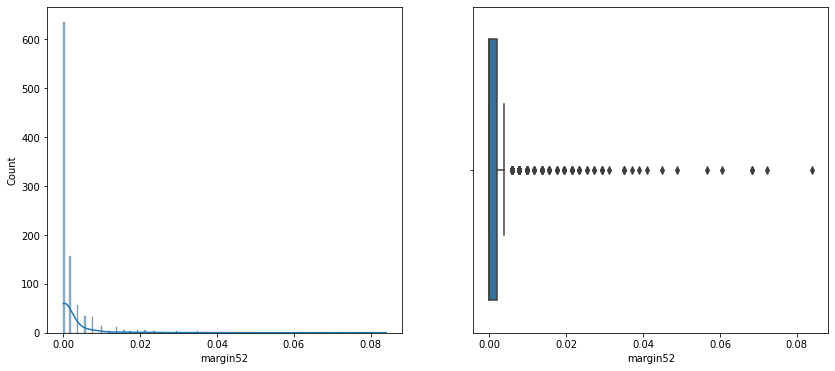

 Min: 0.0 Max: 0.085938 
 mean: 0.024001718181818184 std: 0.018211483155923795 
 median: 0.021484 
 mode: 0.011719


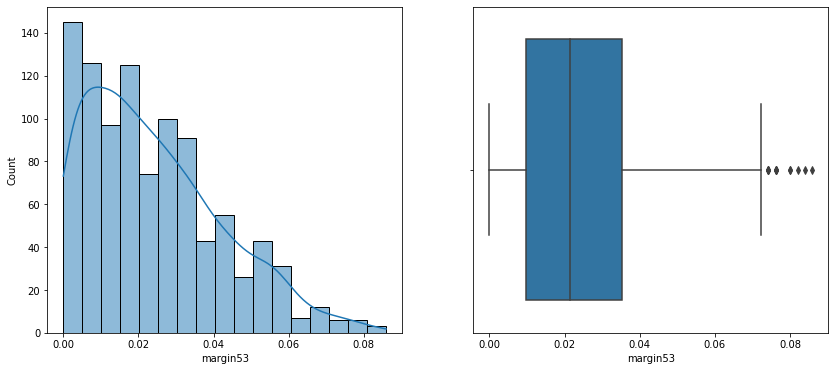

 Min: 0.0 Max: 0.12891 
 mean: 0.010002319191919191 std: 0.015545805037047264 
 median: 0.003906 
 mode: 0.0


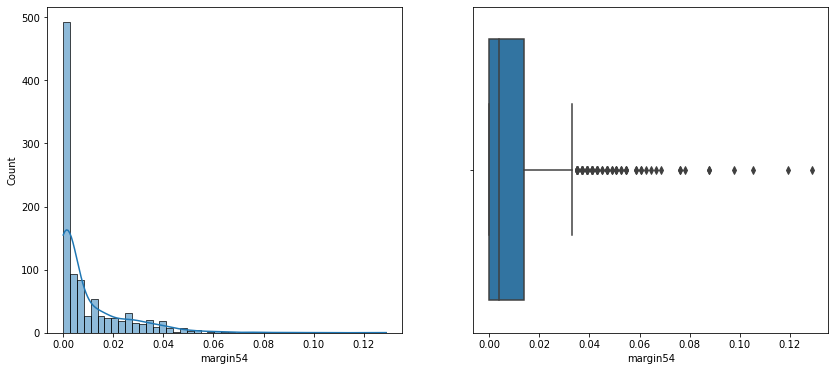

 Min: 0.0 Max: 0.14063 
 mean: 0.018191643434343437 std: 0.02183809612051818 
 median: 0.011719 
 mode: 0.0


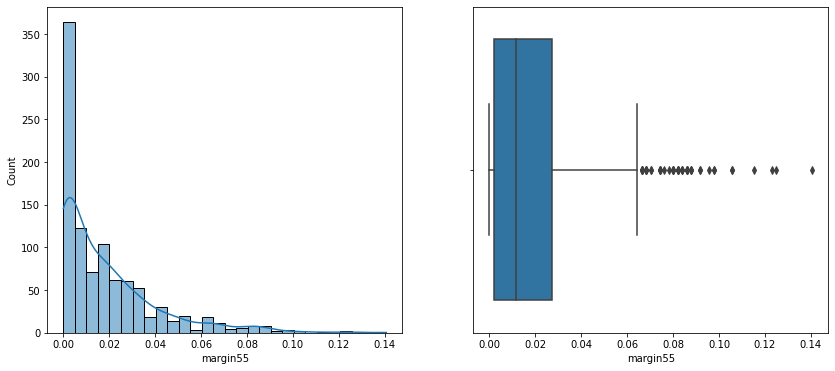

 Min: 0.0 Max: 0.054688 
 mean: 0.005959921212121213 std: 0.00883529632465394 
 median: 0.001953 
 mode: 0.0


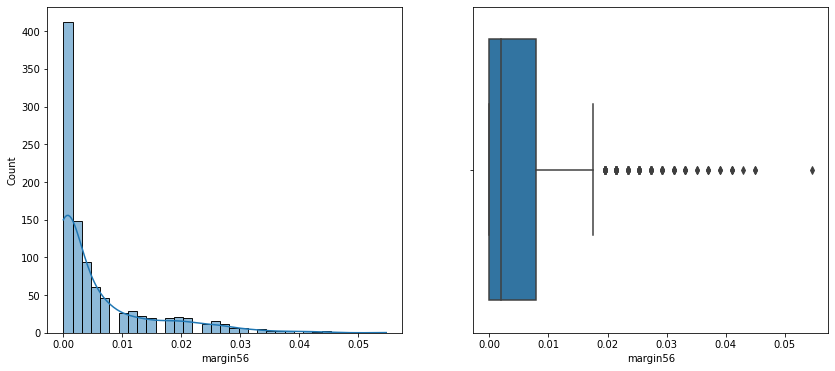

 Min: 0.0 Max: 0.0625 
 mean: 0.012559116161616164 std: 0.009851354969737868 
 median: 0.009766 
 mode: 0.007812


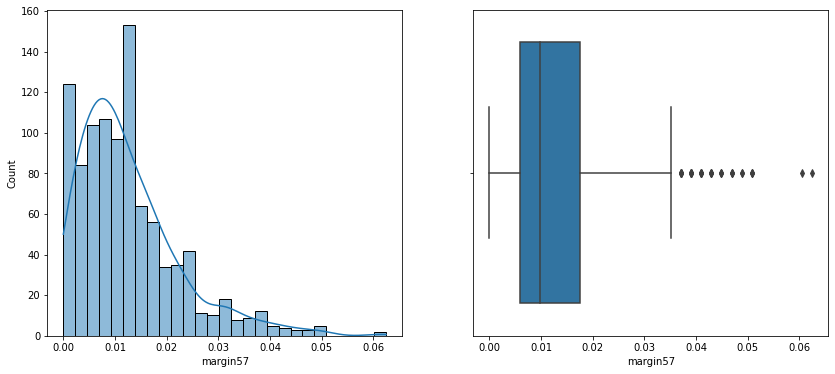

 Min: 0.0 Max: 0.11328 
 mean: 0.020190143434343433 std: 0.01884743012297102 
 median: 0.015625 
 mode: 0.001953


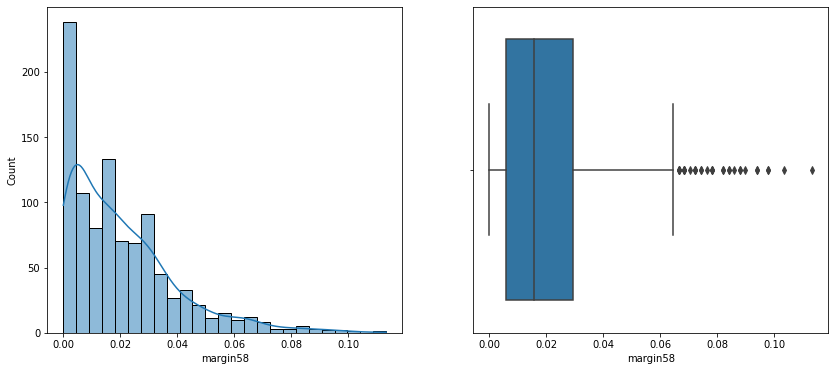

 Min: 0.0 Max: 0.22656 
 mean: 0.030950086868686867 std: 0.031911120072470114 
 median: 0.023438 
 mode: 0.017578


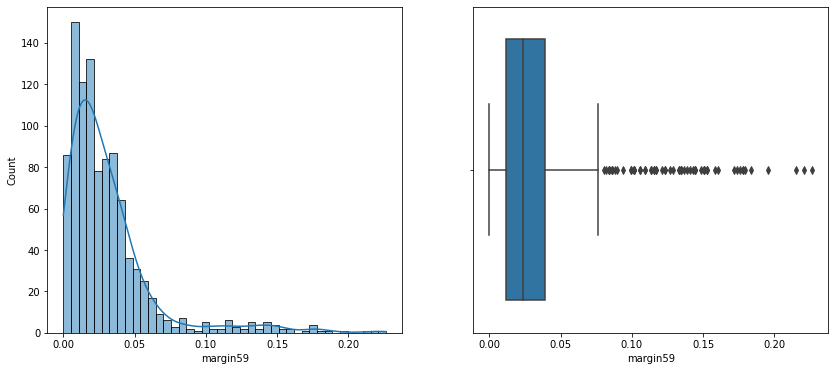

 Min: 0.0 Max: 0.089844 
 mean: 0.011850869696969697 std: 0.012466539004245688 
 median: 0.007812 
 mode: 0.0


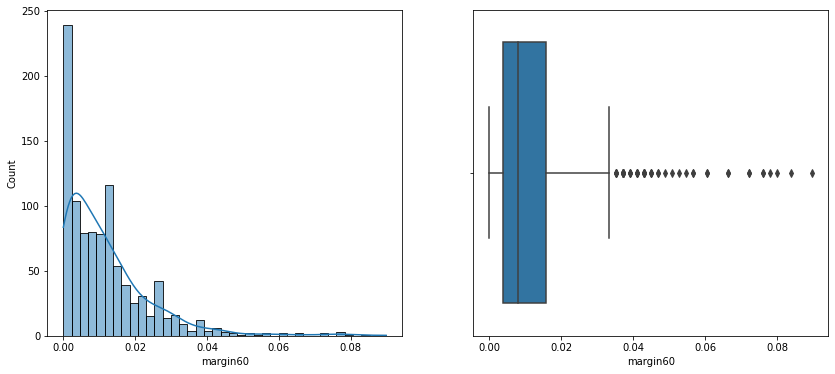

 Min: 0.0 Max: 0.011719 
 mean: 0.0013888060606060608 std: 0.0022930669063440583 
 median: 0.0 
 mode: 0.0


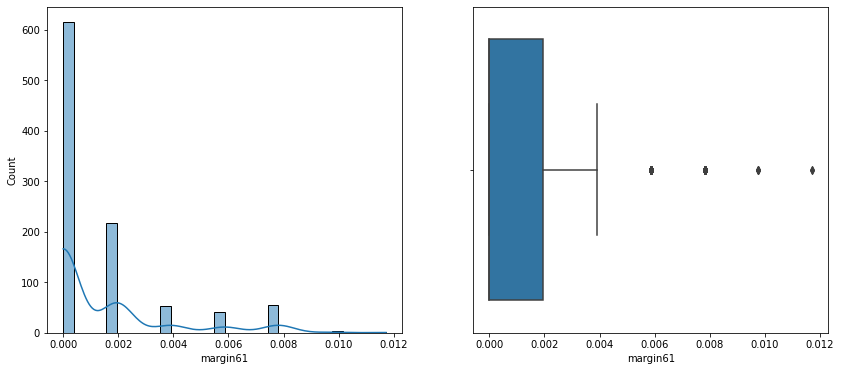

 Min: 0.0 Max: 0.076172 
 mean: 0.004983372727272728 std: 0.010346689273854234 
 median: 0.0 
 mode: 0.0


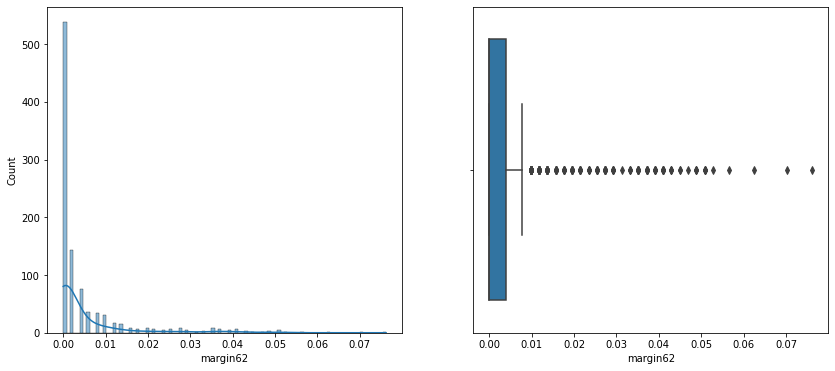

 Min: 0.0 Max: 0.125 
 mean: 0.025388619191919194 std: 0.019808663471043035 
 median: 0.021484 
 mode: 0.0


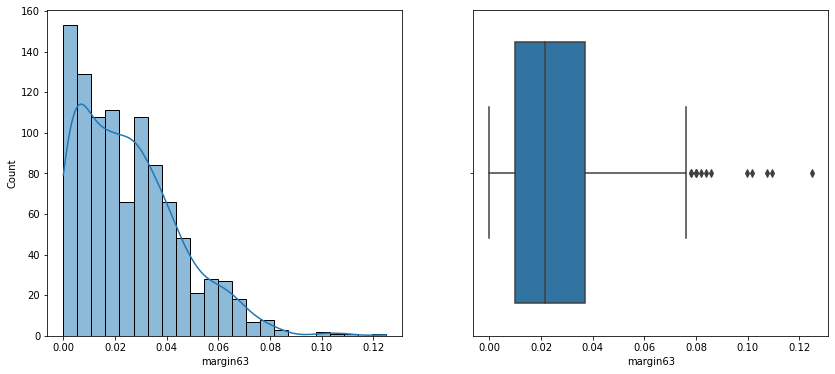

 Min: 0.0 Max: 0.089844 
 mean: 0.004373735353535354 std: 0.009251538630520589 
 median: 0.001953 
 mode: 0.0


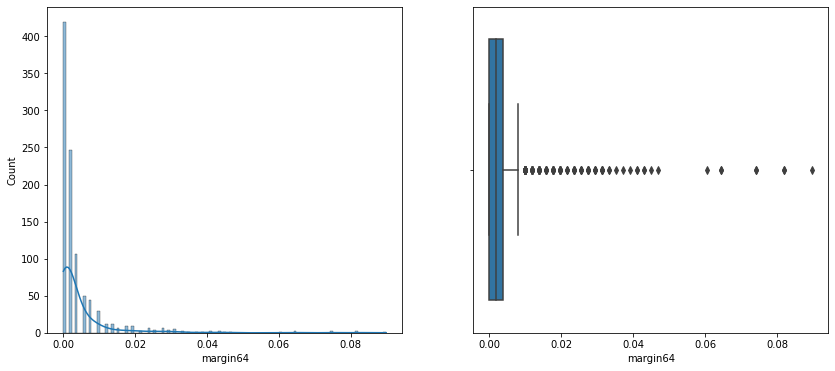

 Min: 0.00016798 Max: 0.0023897 
 mean: 0.0007393220505050505 std: 0.00027228207421879104 
 median: 0.000715945 
 mode: 0.0010156


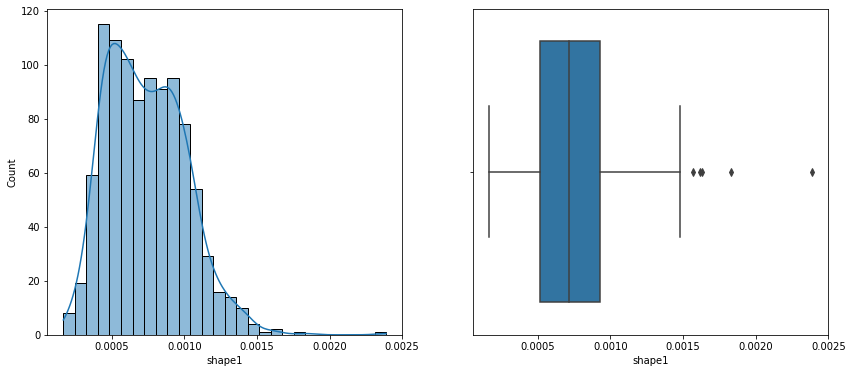

 Min: 0.0001961 Max: 0.0022466 
 mean: 0.0007182662323232323 std: 0.0002678430116981163 
 median: 0.00069132 
 mode: 0.0010192


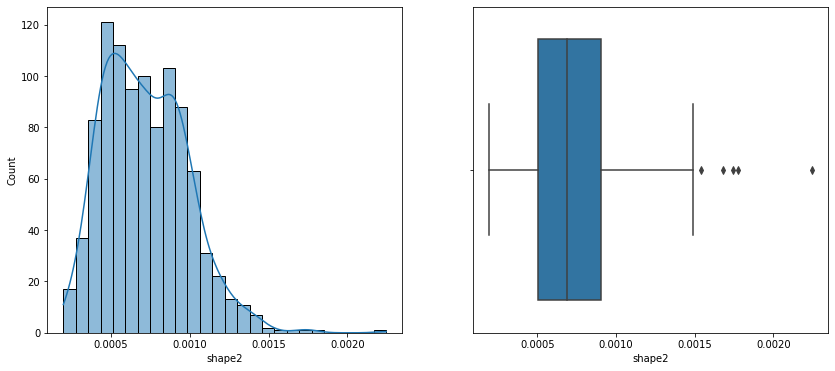

 Min: 0.00014818 Max: 0.0021123 
 mean: 0.0006936676565656566 std: 0.000259493402222738 
 median: 0.00067533 
 mode: 0.0005042


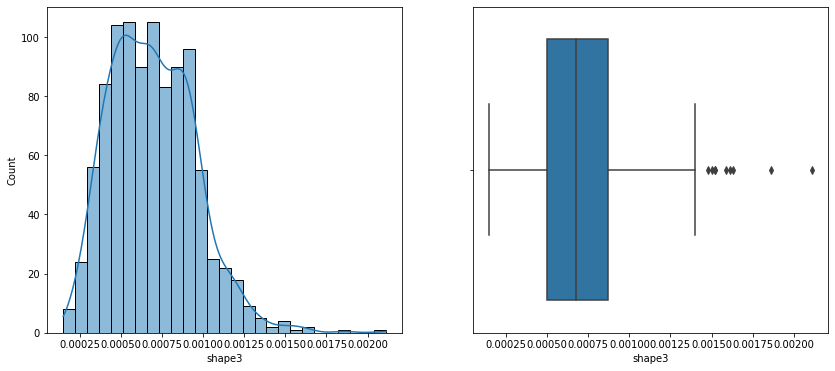

 Min: 0.00014534 Max: 0.0019977 
 mean: 0.0006707044444444444 std: 0.00025391341974069227 
 median: 0.000656445 
 mode: 0.00040021


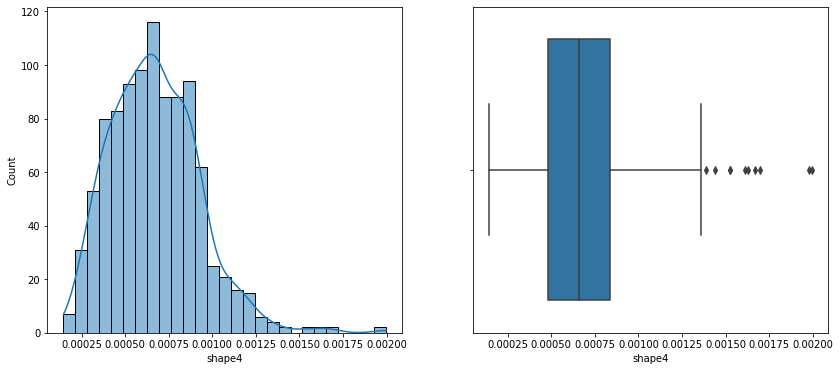

 Min: 0.00013935 Max: 0.002151 
 mean: 0.0006499233030303031 std: 0.0002514412827739555 
 median: 0.000639465 
 mode: 0.00028015


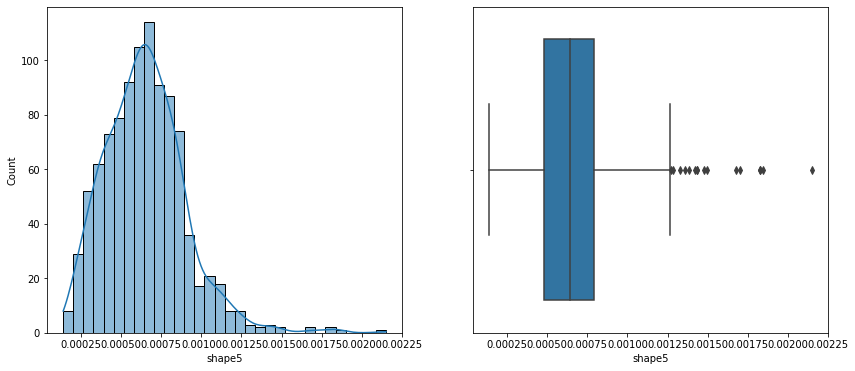

 Min: 0.00013628 Max: 0.0022666 
 mean: 0.0006321335353535354 std: 0.0002510209786934403 
 median: 0.000624255 
 mode: 0.00037438


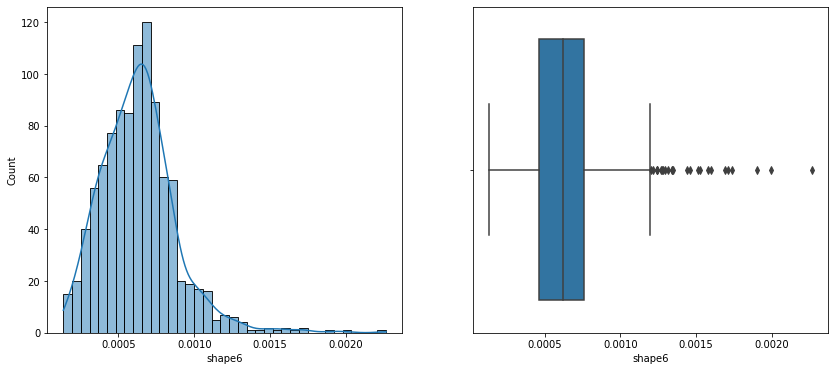

 Min: 9.2915e-05 Max: 0.0023055 
 mean: 0.0006173491161616161 std: 0.00025542301239893015 
 median: 0.000603935 
 mode: 0.00054891


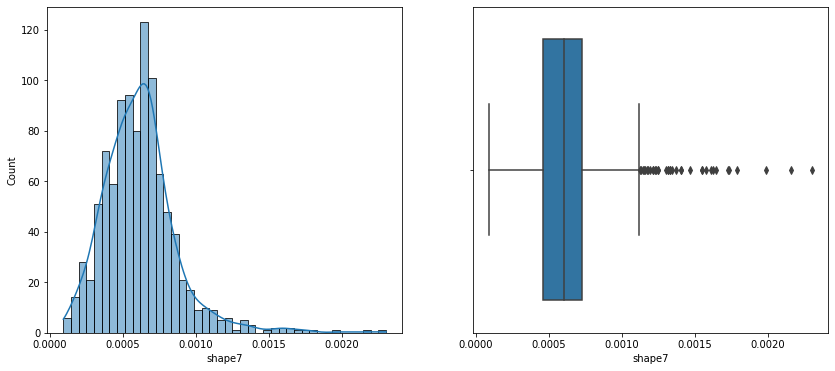

 Min: 7.9939e-05 Max: 0.0024393 
 mean: 0.0006037297616161616 std: 0.0002654504549942854 
 median: 0.0005846499999999999 
 mode: 0.00041592


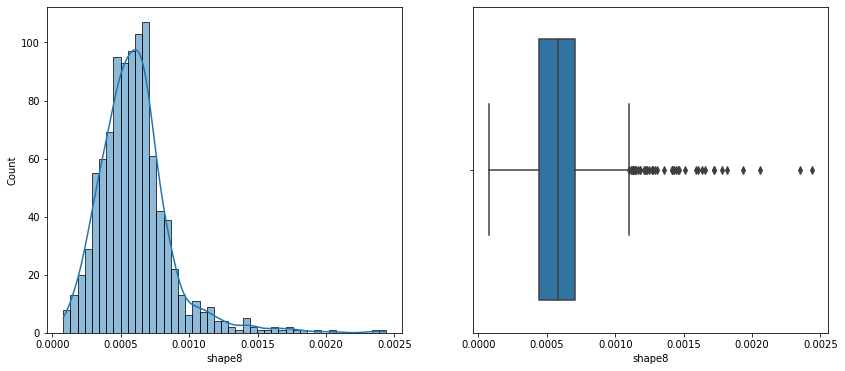

 Min: 8.7515e-05 Max: 0.0025214 
 mean: 0.0005902778535353535 std: 0.00027970830996045513 
 median: 0.000561575 
 mode: 0.00034593


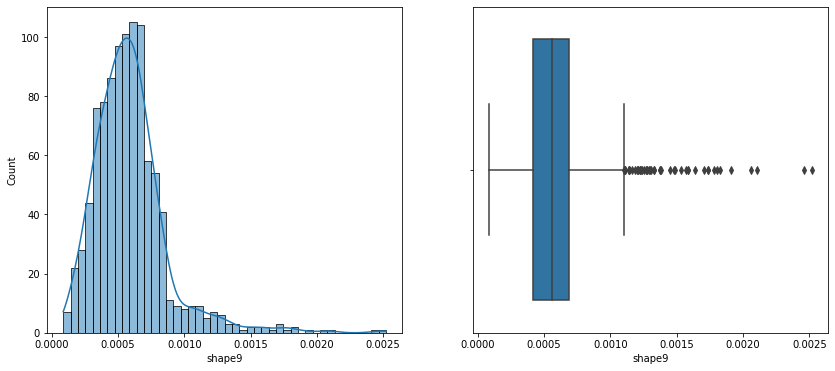

 Min: 0.00010884 Max: 0.0026874 
 mean: 0.0005781982222222222 std: 0.0002974546598049994 
 median: 0.0005322650000000001 
 mode: 0.00030874


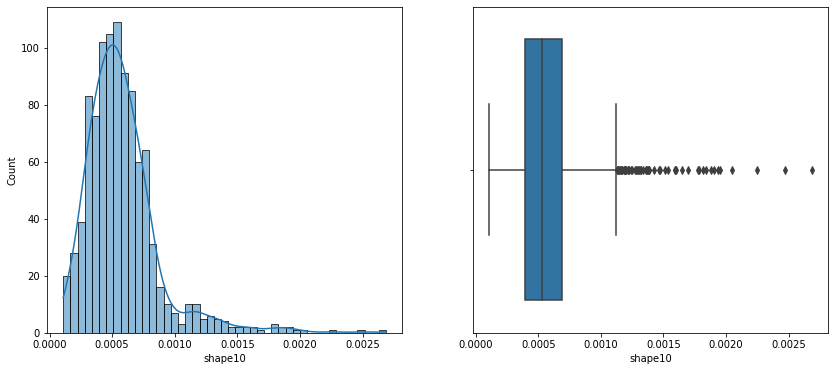

 Min: 7.5991e-05 Max: 0.0027738 
 mean: 0.0005692733313131312 std: 0.0003179332010273825 
 median: 0.00050314 
 mode: 0.0002868


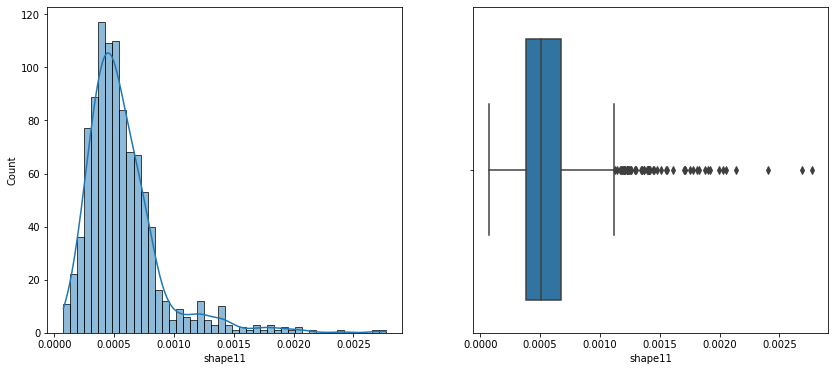

 Min: 0.00010633 Max: 0.0028893 
 mean: 0.0005617272525252525 std: 0.0003352980403494944 
 median: 0.000477355 
 mode: 0.00038909


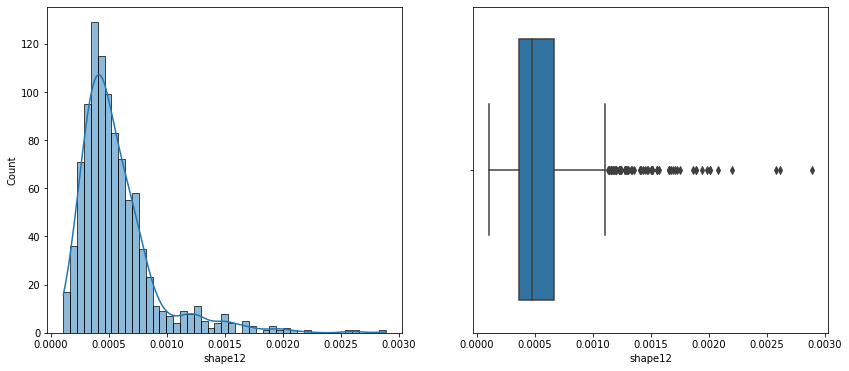

 Min: 8.0877e-05 Max: 0.0030067 
 mean: 0.0005557863404040404 std: 0.00035101098061001904 
 median: 0.000459855 
 mode: 0.00033294


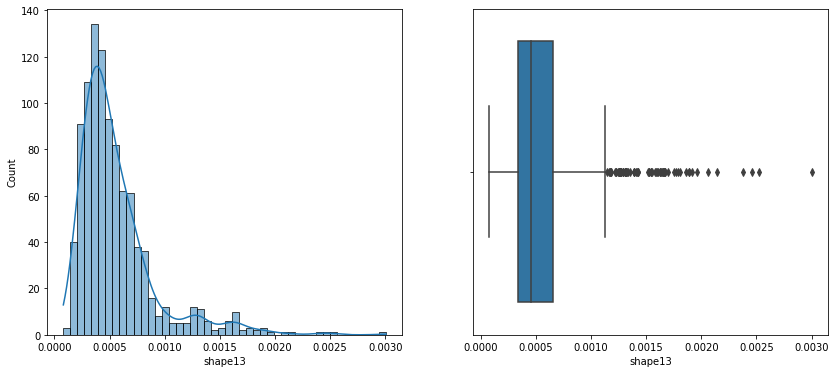

 Min: 9.6776e-05 Max: 0.0028154 
 mean: 0.0005510189595959596 std: 0.0003611998241754955 
 median: 0.00044631499999999997 
 mode: 0.00028295


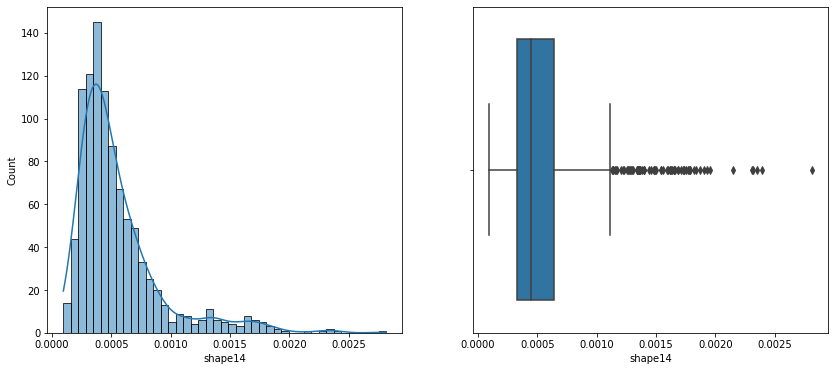

 Min: 0.00010189 Max: 0.0025914 
 mean: 0.0005458909898989899 std: 0.0003709904156385747 
 median: 0.00043374500000000003 
 mode: 0.00022965


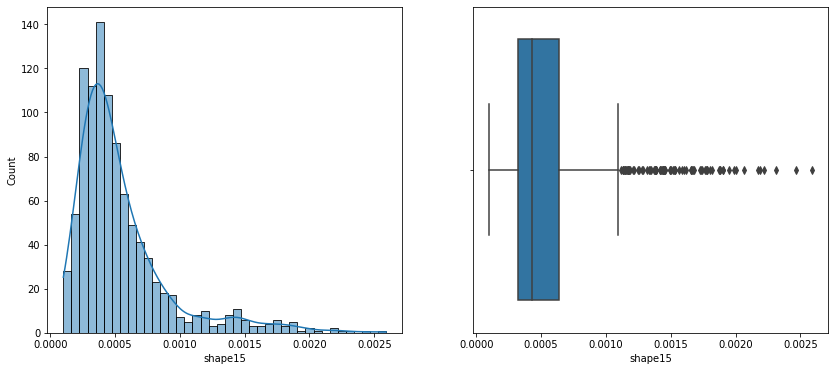

 Min: 7.3851e-05 Max: 0.0024734 
 mean: 0.0005430288333333334 std: 0.00037779127310311325 
 median: 0.00042528 
 mode: 0.00034514


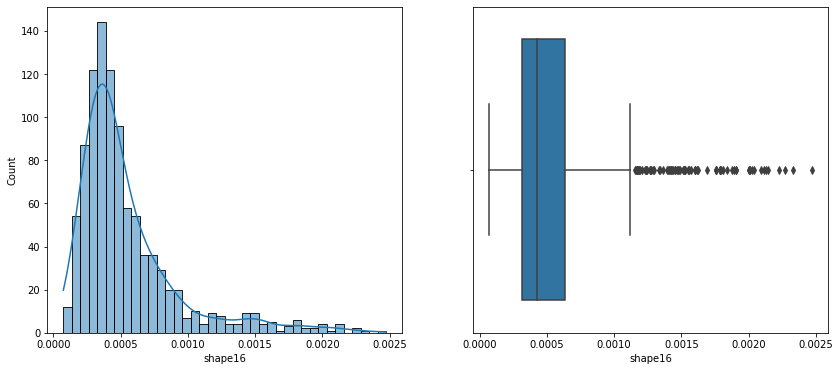

 Min: 6.2018e-05 Max: 0.0024099 
 mean: 0.0005424521555555555 std: 0.000381514788857455 
 median: 0.0004256 
 mode: 0.00027083


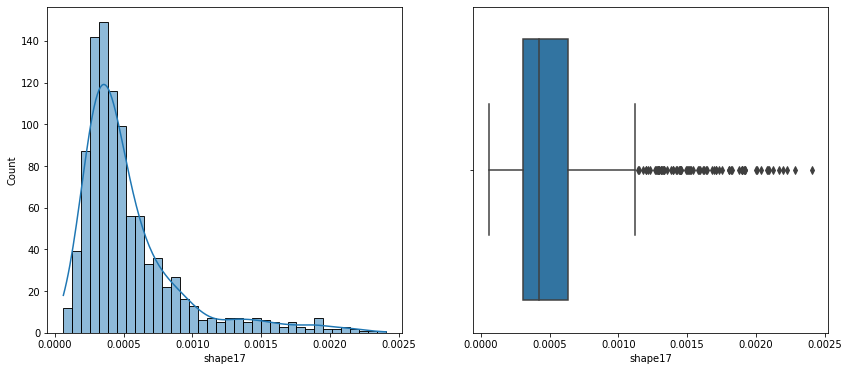

 Min: 4.4082e-05 Max: 0.0023396 
 mean: 0.0005423630383838385 std: 0.00037828447062649746 
 median: 0.00042676 
 mode: 0.00024263


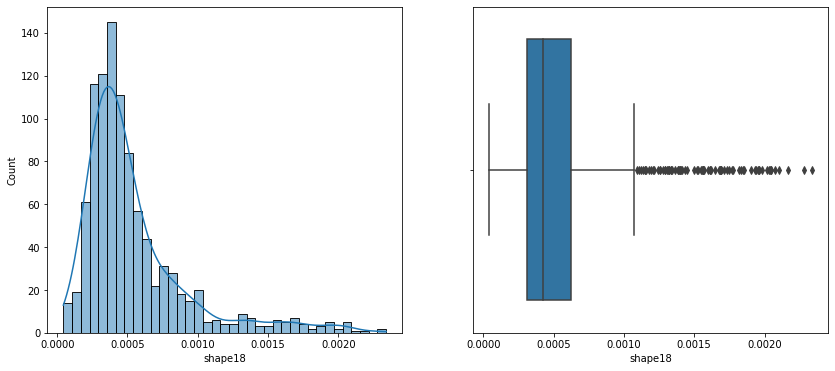

 Min: 4.7127e-05 Max: 0.0022159 
 mean: 0.000542343793939394 std: 0.0003682776128355789 
 median: 0.00043304 
 mode: 0.00020673


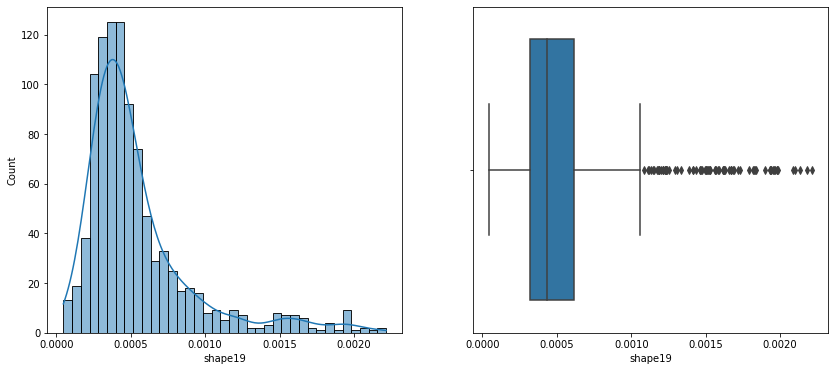

 Min: 6.1289e-05 Max: 0.0023002 
 mean: 0.000546403302020202 std: 0.00035654739456726143 
 median: 0.000447345 
 mode: 0.00024722


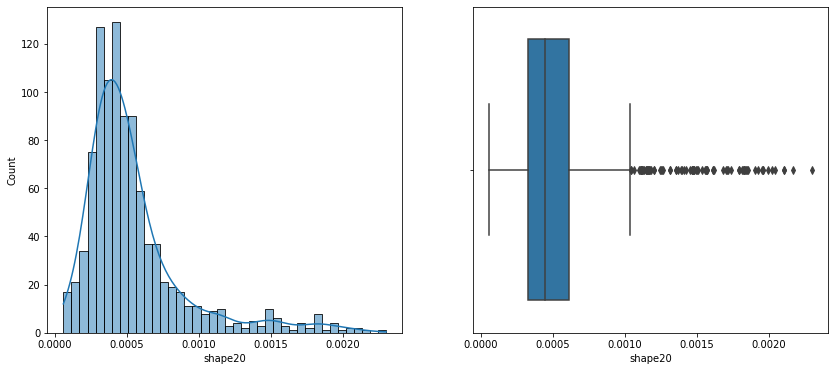

 Min: 5.6436e-05 Max: 0.0021903 
 mean: 0.0005540530777777778 std: 0.00034008585585839247 
 median: 0.000471745 
 mode: 0.00048964


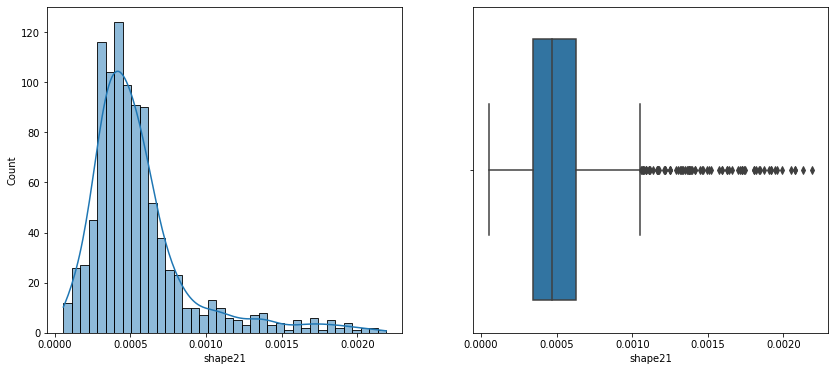

 Min: 6.4074e-05 Max: 0.0022369 
 mean: 0.000563309792929293 std: 0.00032221837583194427 
 median: 0.000495955 
 mode: 0.00032439


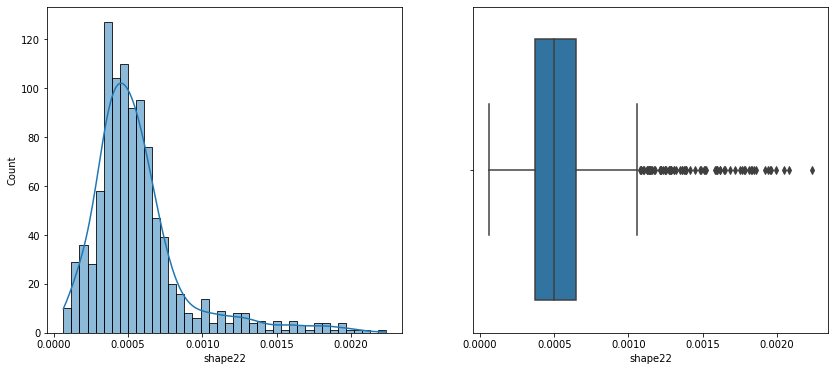

 Min: 4.6381e-05 Max: 0.0022134 
 mean: 0.000574788495959596 std: 0.00030474055753187615 
 median: 0.0005224349999999999 
 mode: 0.00041485


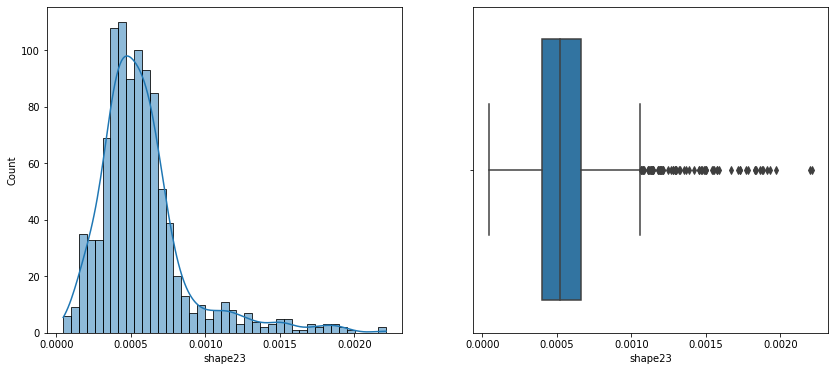

 Min: 8.4616e-05 Max: 0.002227 
 mean: 0.0005856235767676768 std: 0.000285797714797006 
 median: 0.000550555 
 mode: 0.00039444


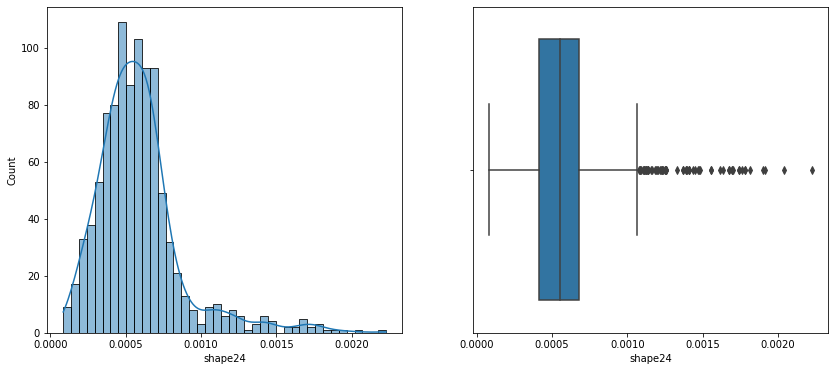

 Min: 5.9724e-05 Max: 0.0020909 
 mean: 0.0005987767757575758 std: 0.00026957811725279073 
 median: 0.0005739300000000001 
 mode: 0.00043551


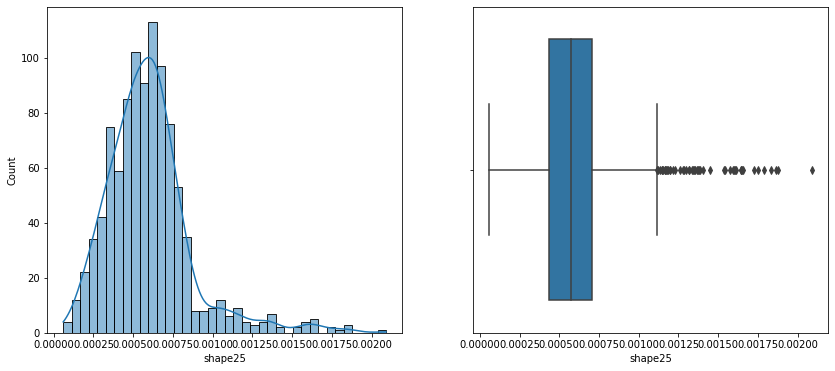

 Min: 3.117e-05 Max: 0.0019583 
 mean: 0.0006132153525252525 std: 0.00025558441991284603 
 median: 0.00059373 
 mode: 0.00050137


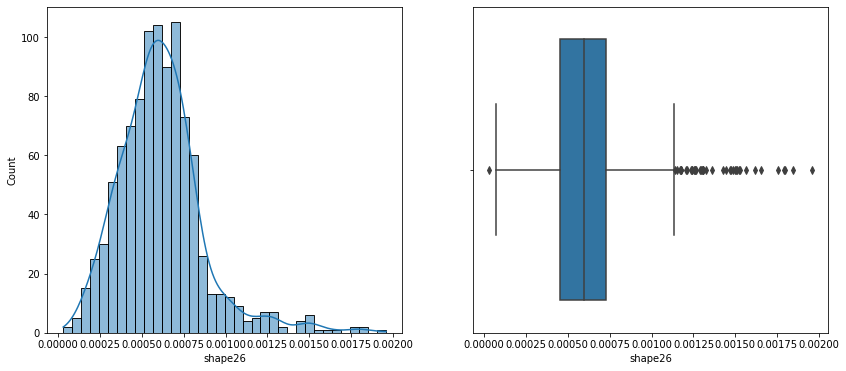

 Min: 8.7981e-05 Max: 0.0018436 
 mean: 0.0006277889404040404 std: 0.0002475607110384766 
 median: 0.000613855 
 mode: 0.00046573


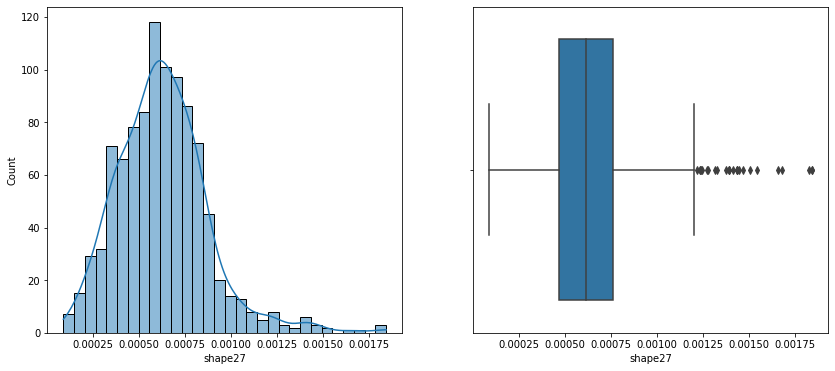

 Min: 8.6714e-05 Max: 0.0018102 
 mean: 0.0006441143373737373 std: 0.0002452071312623933 
 median: 0.0006382899999999999 
 mode: 0.00047386


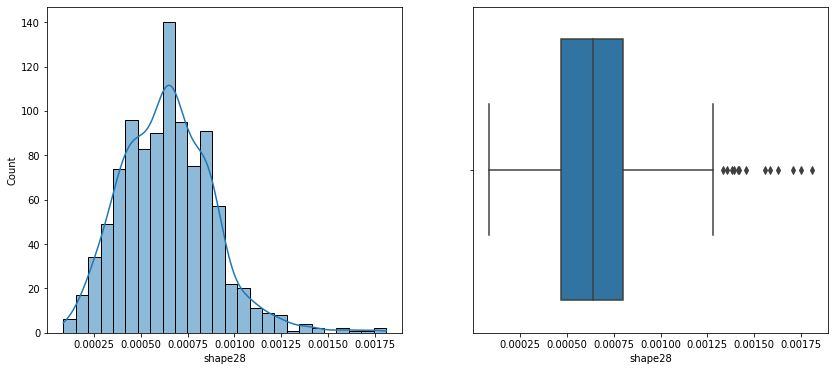

 Min: 7.0475e-05 Max: 0.0018241 
 mean: 0.000663084904040404 std: 0.000247119472399168 
 median: 0.0006632599999999999 
 mode: 0.0007003


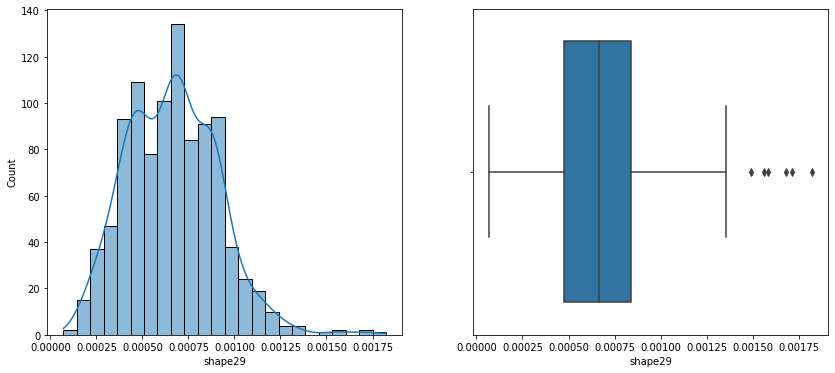

 Min: 7.8053e-05 Max: 0.0018548 
 mean: 0.0006867348212121211 std: 0.0002527690715616467 
 median: 0.000687195 
 mode: 0.00039315


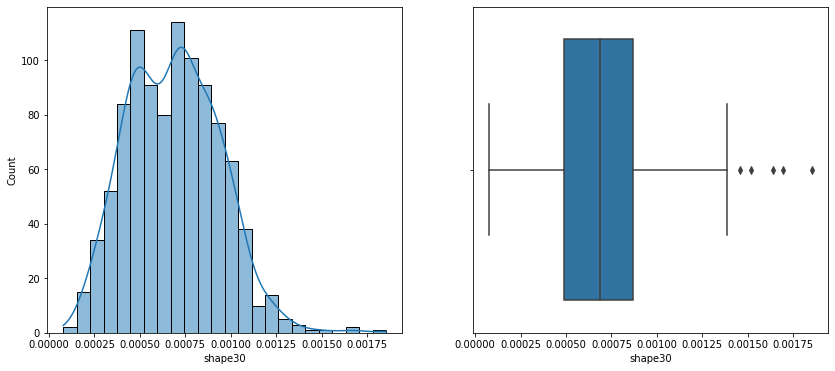

 Min: 6.7433e-05 Max: 0.0020024 
 mean: 0.0007111290636363636 std: 0.00026219500440921757 
 median: 0.0007035749999999999 
 mode: 0.0010587


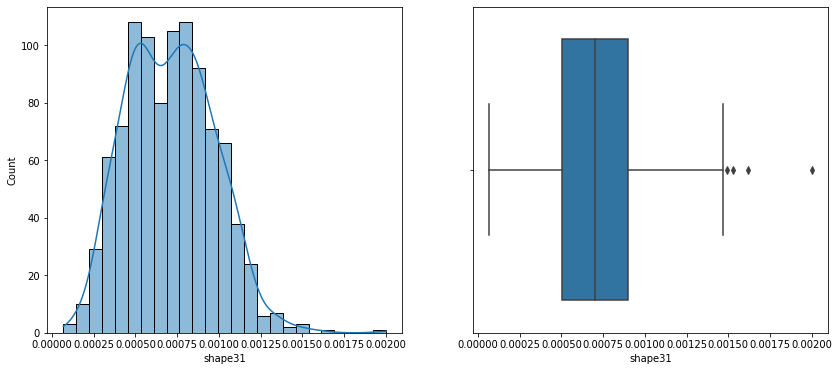

 Min: 5.3148e-05 Max: 0.0021237 
 mean: 0.0007335464777777777 std: 0.00027393051883331694 
 median: 0.000723275 
 mode: 0.00046362


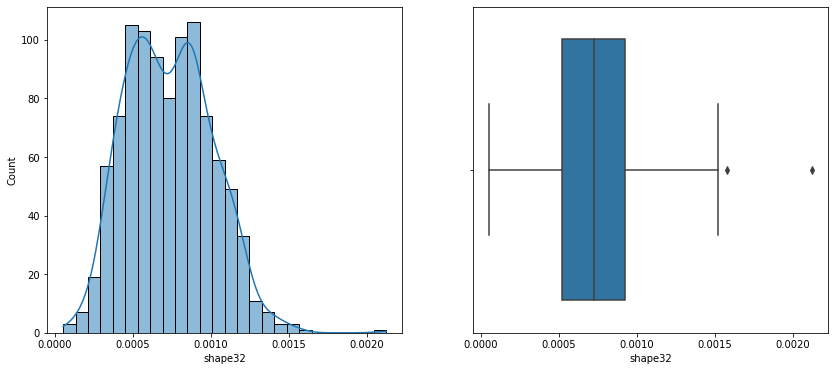

 Min: 0.0001061 Max: 0.0021106 
 mean: 0.000738735303030303 std: 0.0002772412972764518 
 median: 0.00073079 
 mode: 0.0010515


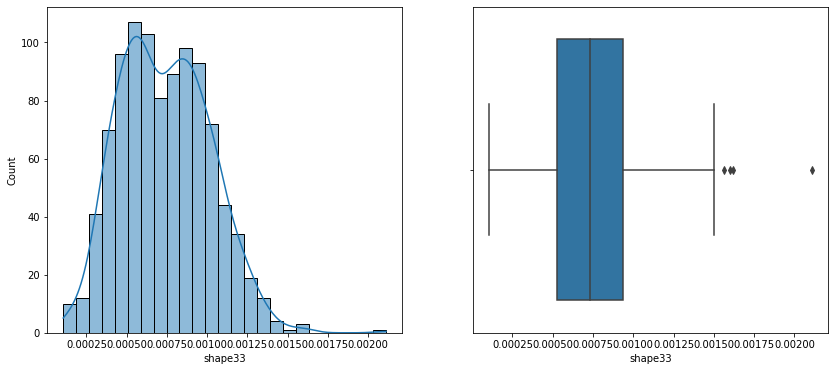

 Min: 5.456e-05 Max: 0.0019885 
 mean: 0.0007181366464646464 std: 0.00026673180022757944 
 median: 0.0007124449999999999 
 mode: 0.00036707


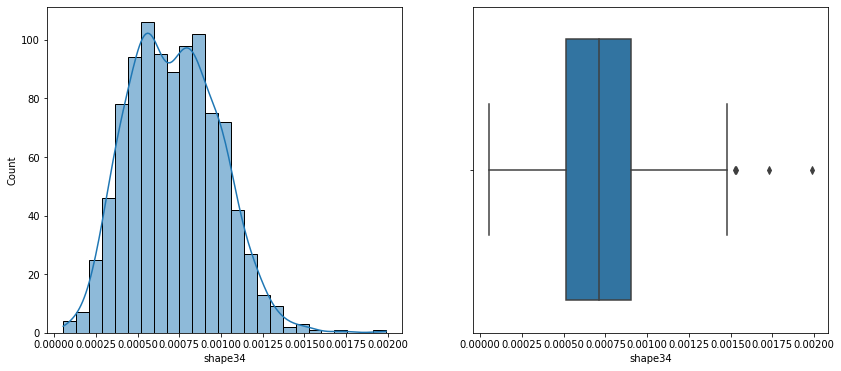

 Min: 3.3868e-05 Max: 0.0018675 
 mean: 0.0006901865131313131 std: 0.0002559177939321718 
 median: 0.00067708 
 mode: 0.00059344


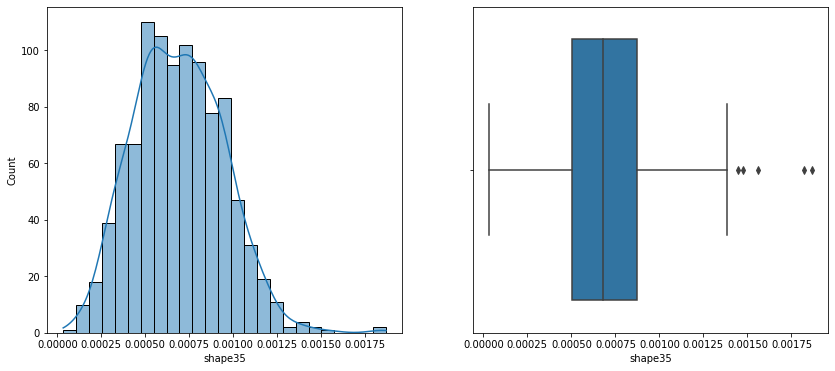

 Min: 6.9436e-05 Max: 0.0018863 
 mean: 0.0006646934232323232 std: 0.00024862146803181115 
 median: 0.000667455 
 mode: 0.00057112


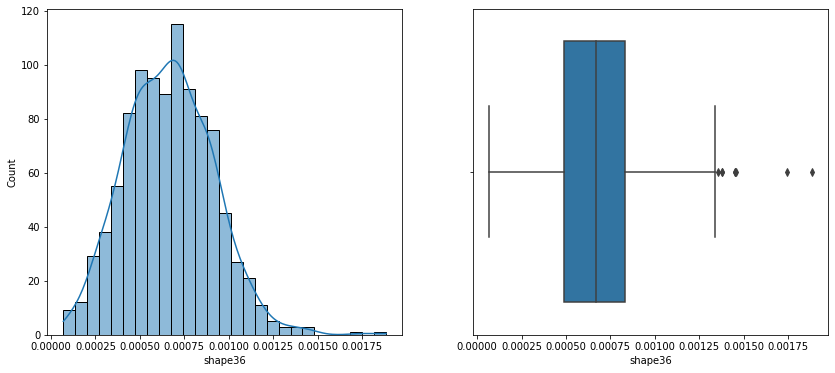

 Min: 6.6633e-05 Max: 0.0020113 
 mean: 0.0006416502060606061 std: 0.0002417073976355946 
 median: 0.00064397 
 mode: 0.00033229


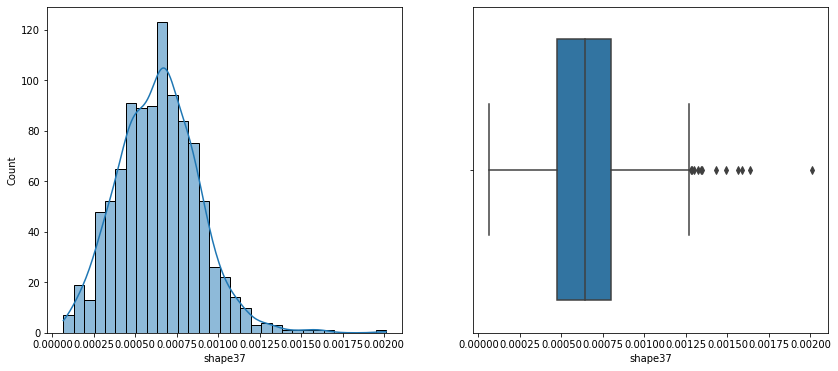

 Min: 6.4013e-05 Max: 0.0021067 
 mean: 0.000620646498989899 std: 0.00023952890034342945 
 median: 0.000621225 
 mode: 0.0003708


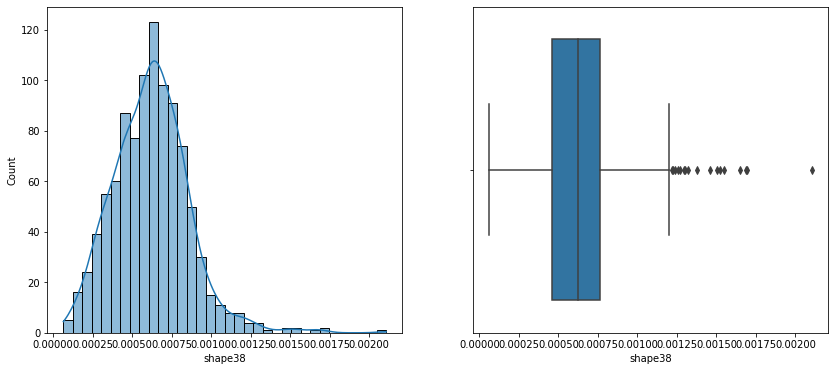

 Min: 6.2297e-05 Max: 0.0021057 
 mean: 0.0006021344141414141 std: 0.00024456017705072944 
 median: 0.0005970299999999999 
 mode: 0.00055099


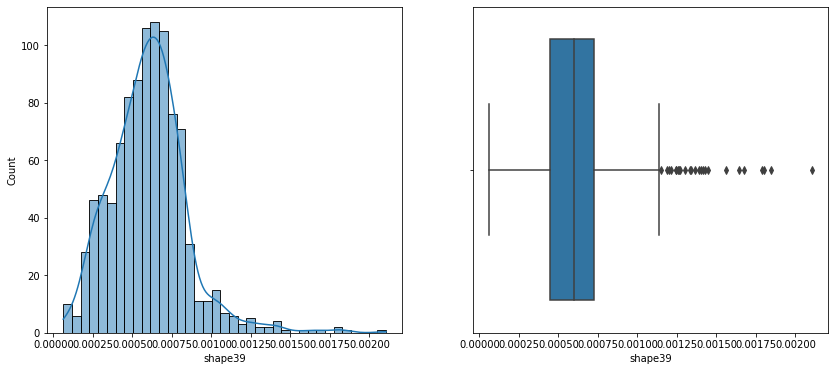

 Min: 6.8181e-05 Max: 0.002134 
 mean: 0.0005855655363636364 std: 0.0002546792808497221 
 median: 0.00057538 
 mode: 0.00021619


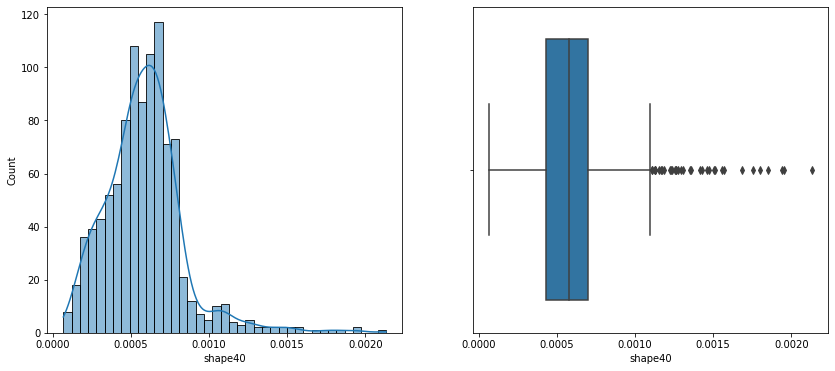

 Min: 8.6953e-05 Max: 0.0022295 
 mean: 0.0005722586191919192 std: 0.00027147372787730123 
 median: 0.00055579 
 mode: 0.00018273


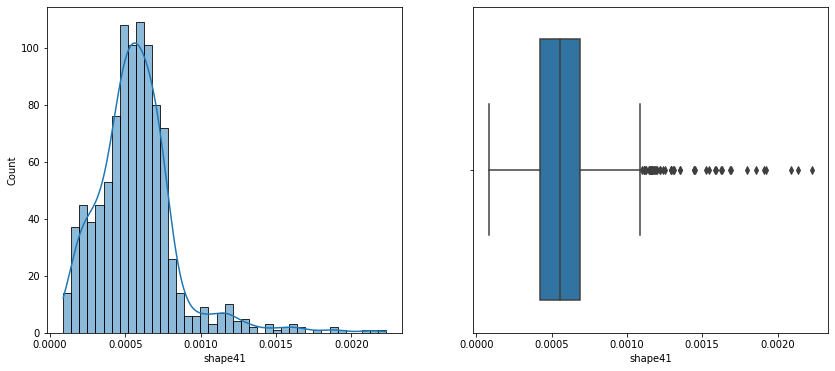

 Min: 5.1891e-05 Max: 0.0022848 
 mean: 0.0005620083 std: 0.00028912727638358645 
 median: 0.00053409 
 mode: 0.00042133


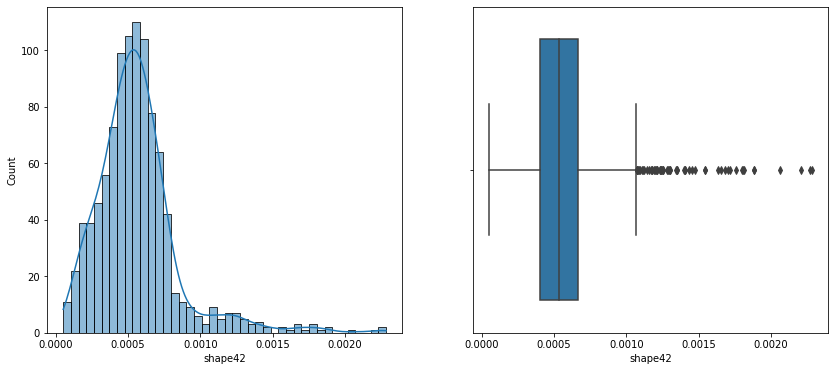

 Min: 5.6311e-05 Max: 0.002324 
 mean: 0.0005562767909090909 std: 0.00030513887567887175 
 median: 0.0005137 
 mode: 0.00035858


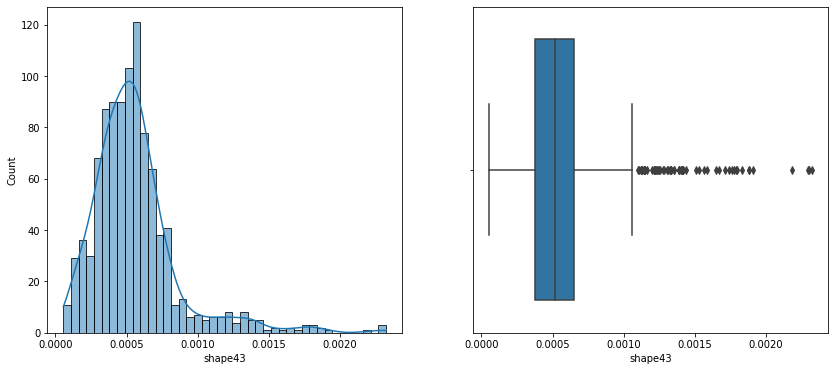

 Min: 3.5316e-05 Max: 0.0023481 
 mean: 0.0005510788393939394 std: 0.00032061099081989237 
 median: 0.00049011 
 mode: 0.00030346


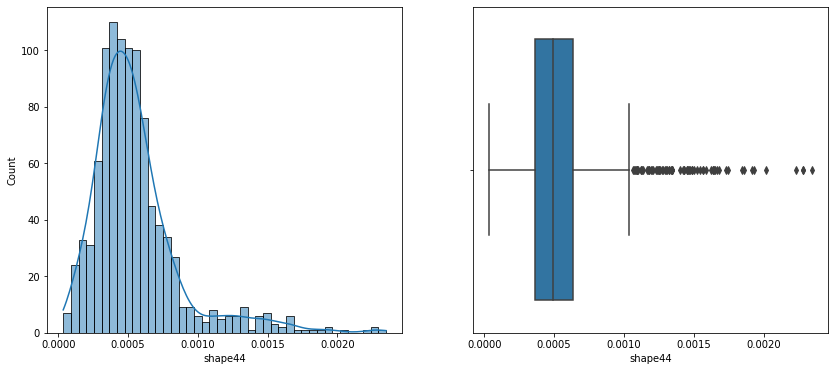

 Min: 4.828e-05 Max: 0.0024146 
 mean: 0.0005474770333333334 std: 0.00033371975221173345 
 median: 0.000463305 
 mode: 0.0003077


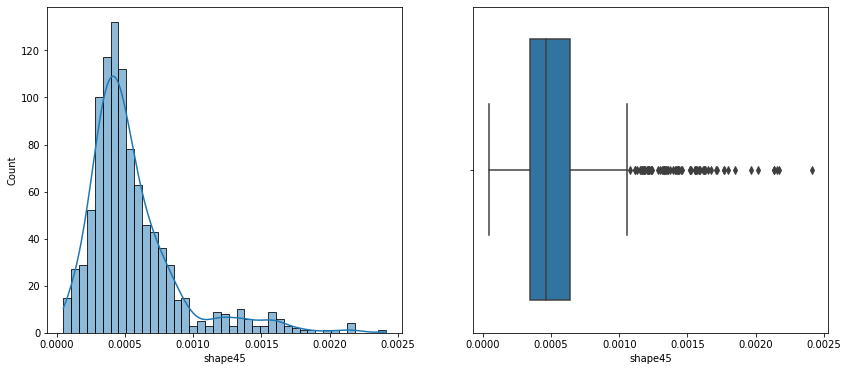

 Min: 5.5342e-05 Max: 0.0022898 
 mean: 0.0005452039898989899 std: 0.0003448859869215056 
 median: 0.000446815 
 mode: 0.00013307


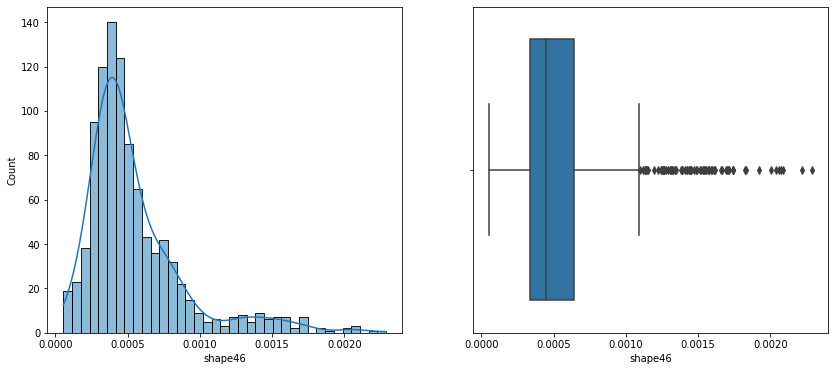

 Min: 4.3485e-05 Max: 0.0023418 
 mean: 0.000544825003030303 std: 0.0003522162055484578 
 median: 0.00044118 
 mode: 0.0010015


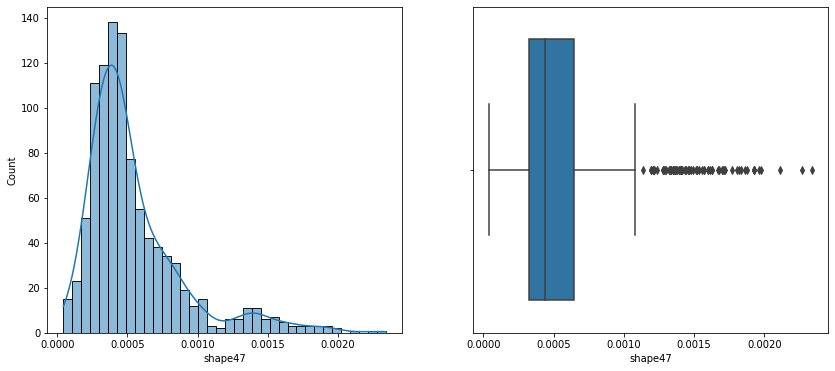

 Min: 5.1044e-05 Max: 0.0024577 
 mean: 0.0005447101434343435 std: 0.00035867484109719587 
 median: 0.00043725999999999997 
 mode: 0.00025809


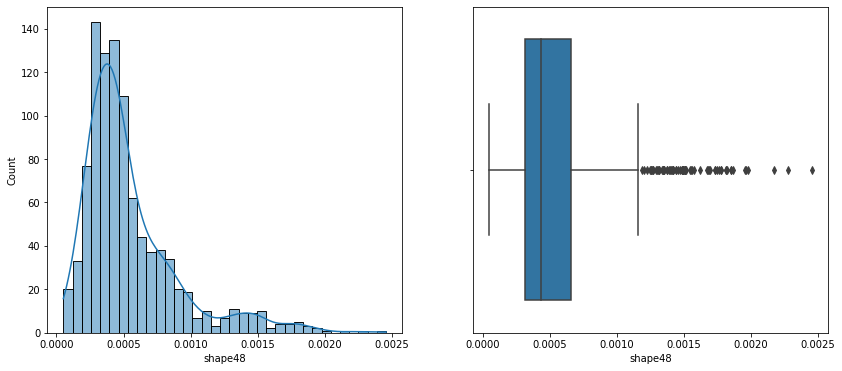

 Min: 2.1672e-05 Max: 0.0023152 
 mean: 0.000546683182828283 std: 0.0003612660066314791 
 median: 0.00044134999999999997 
 mode: 0.00017779


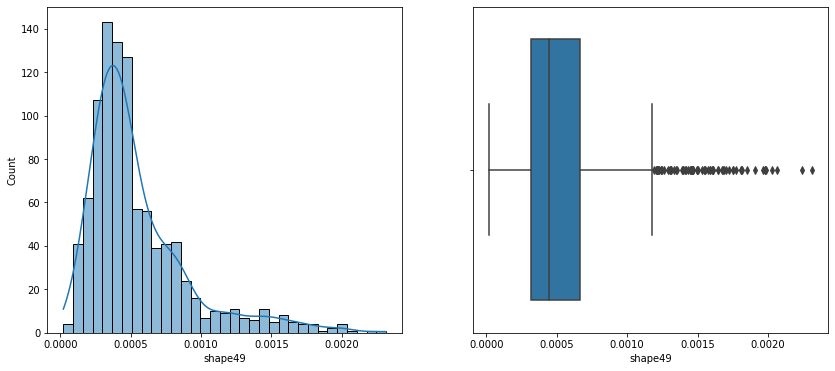

 Min: 6.2564e-05 Max: 0.002169 
 mean: 0.000547211686868687 std: 0.00035842689002212036 
 median: 0.00044251 
 mode: 0.00038471


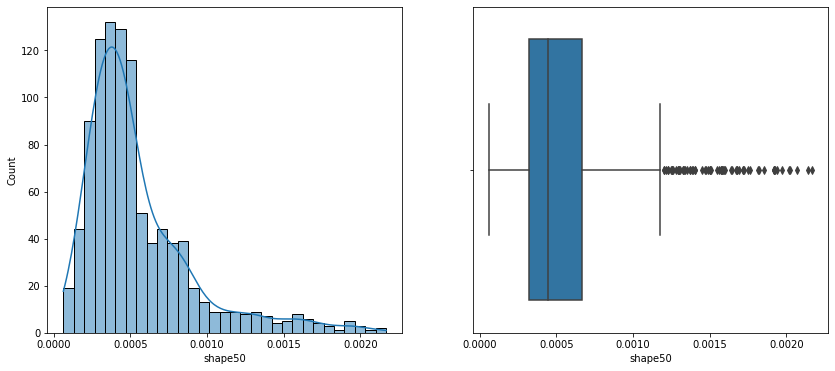

 Min: 0.00011517 Max: 0.0020331 
 mean: 0.0005463156767676769 std: 0.0003473862270602554 
 median: 0.000450045 
 mode: 0.00024006


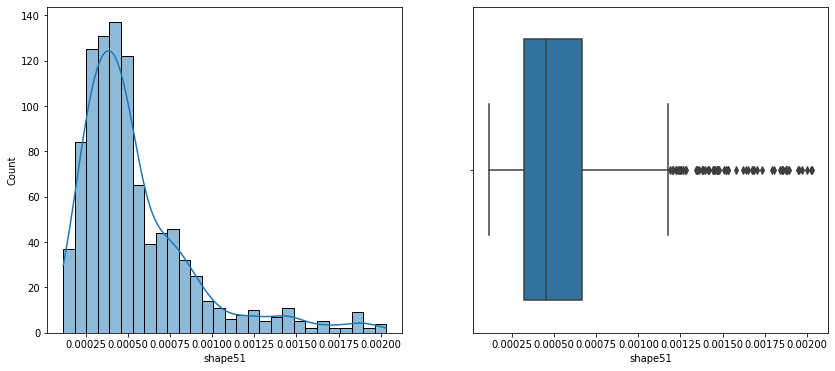

 Min: 0.00010743 Max: 0.0020411 
 mean: 0.0005473300505050505 std: 0.00033143504374727613 
 median: 0.000453765 
 mode: 0.00028749


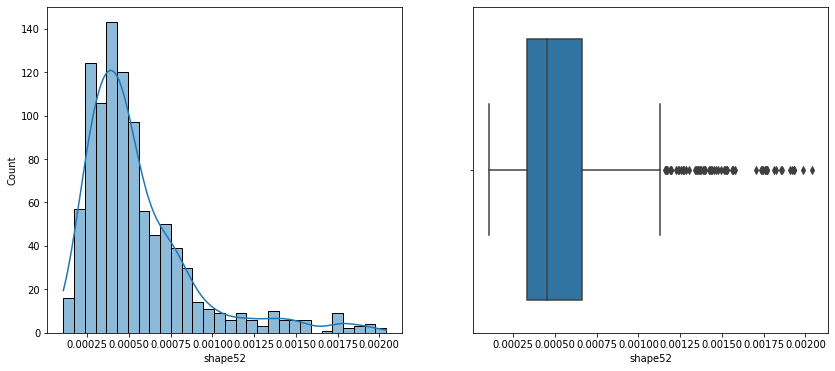

 Min: 9.0126e-05 Max: 0.0020058 
 mean: 0.0005513387434343435 std: 0.0003140804921164993 
 median: 0.000471585 
 mode: 0.00025944


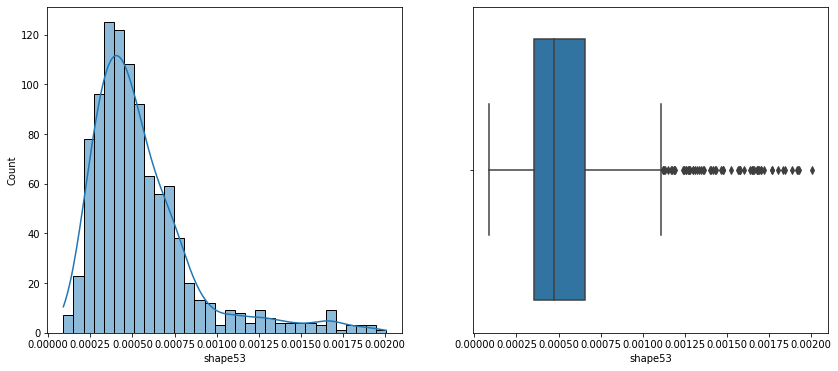

 Min: 0.0001143 Max: 0.002025 
 mean: 0.000555588606060606 std: 0.0002949164778702432 
 median: 0.0005004499999999999 
 mode: 0.00030922


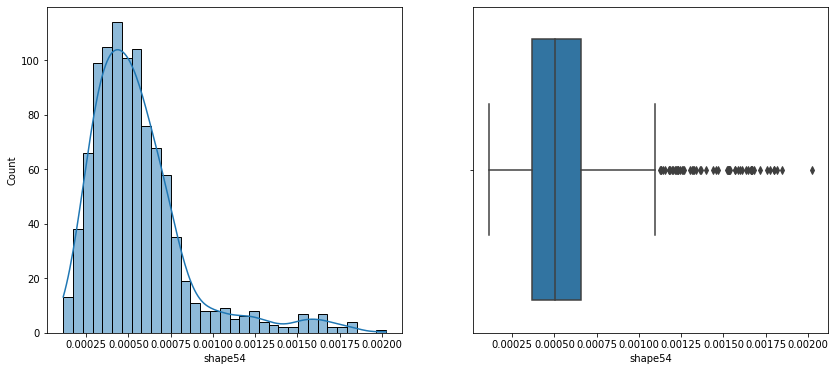

 Min: 0.00011065 Max: 0.0019925 
 mean: 0.000561953303030303 std: 0.0002784242548937568 
 median: 0.00052297 
 mode: 0.00034706


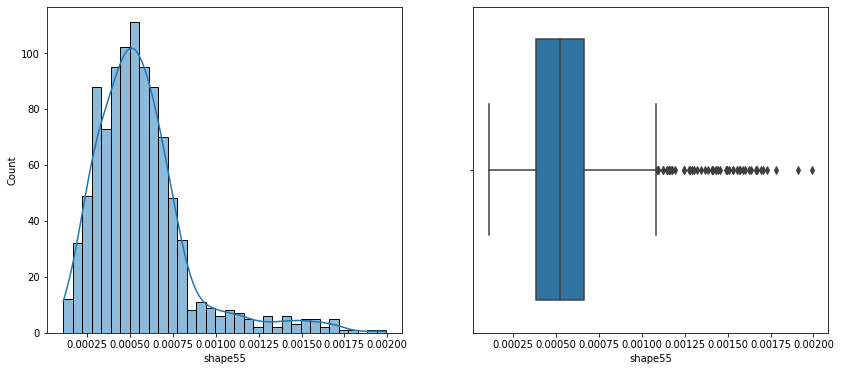

 Min: 9.5907e-05 Max: 0.0019412 
 mean: 0.0005694134515151515 std: 0.00026480346928278974 
 median: 0.000543515 
 mode: 0.00040548


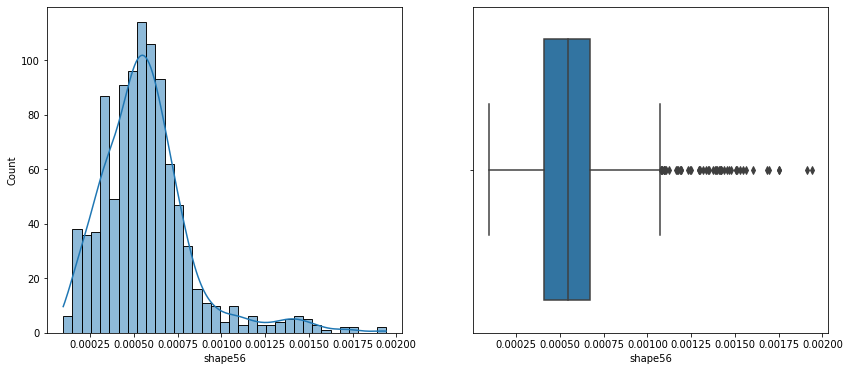

 Min: 7.6032e-05 Max: 0.0018919 
 mean: 0.000578184698989899 std: 0.0002535844445918815 
 median: 0.00056221 
 mode: 0.0003308


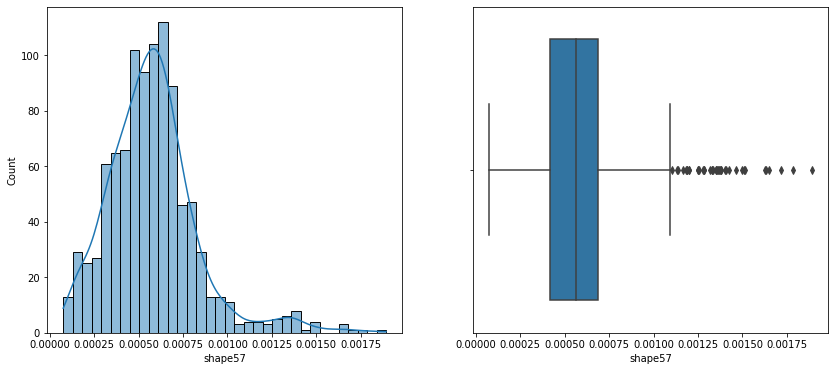

 Min: 5.9775e-05 Max: 0.0018608 
 mean: 0.0005911945252525254 std: 0.00024805598141514144 
 median: 0.0005875450000000001 
 mode: 0.00047982


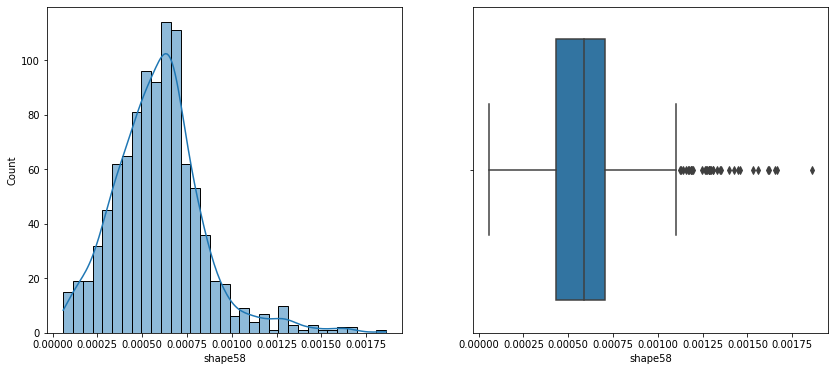

 Min: 6.3038e-05 Max: 0.0017404 
 mean: 0.0006070943363636364 std: 0.0002449985266744561 
 median: 0.0006079799999999999 
 mode: 0.00053761


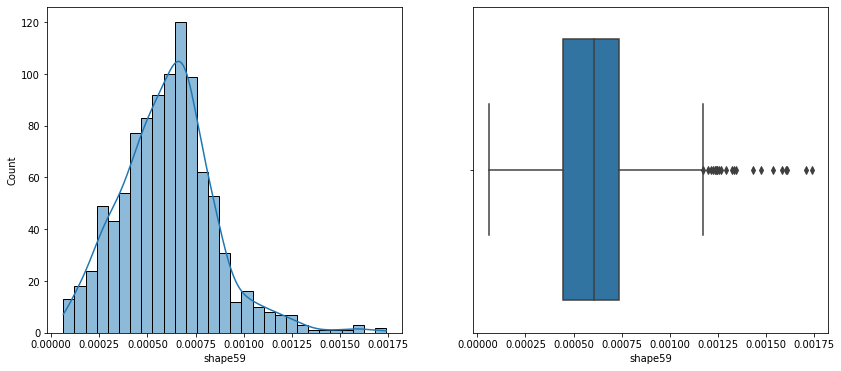

 Min: 4.1625e-05 Max: 0.0017603 
 mean: 0.000626418398989899 std: 0.0002461924570148084 
 median: 0.000632385 
 mode: 0.00017413


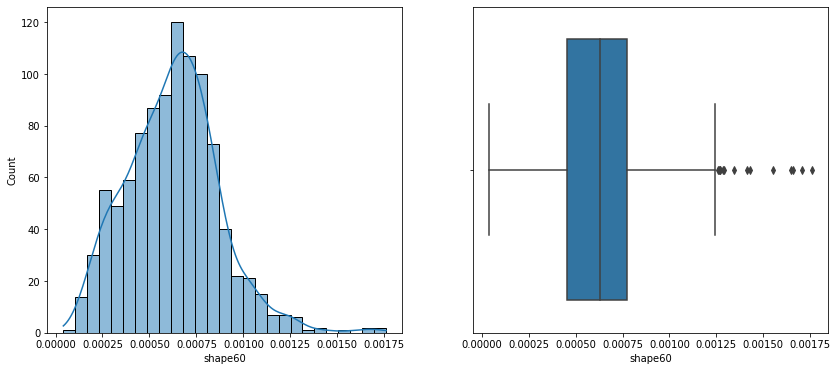

 Min: 8.6756e-05 Max: 0.0019217 
 mean: 0.0006481016929292928 std: 0.00024816766972383085 
 median: 0.000650385 
 mode: 0.00037437


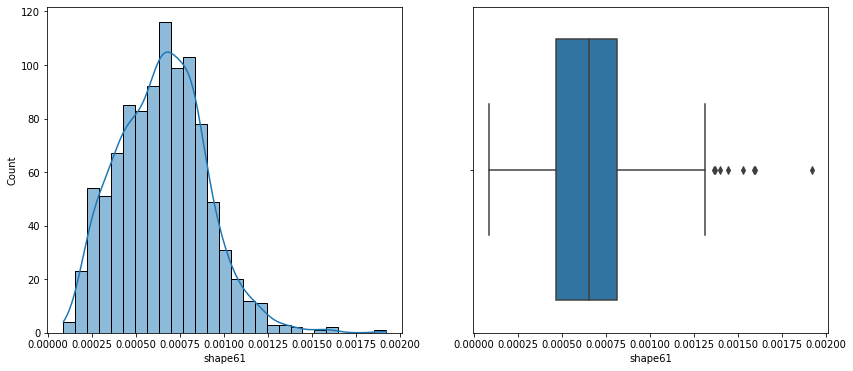

 Min: 0.00013396 Max: 0.0020901 
 mean: 0.0006745957373737373 std: 0.0002520609726556432 
 median: 0.000674155 
 mode: 0.00066493


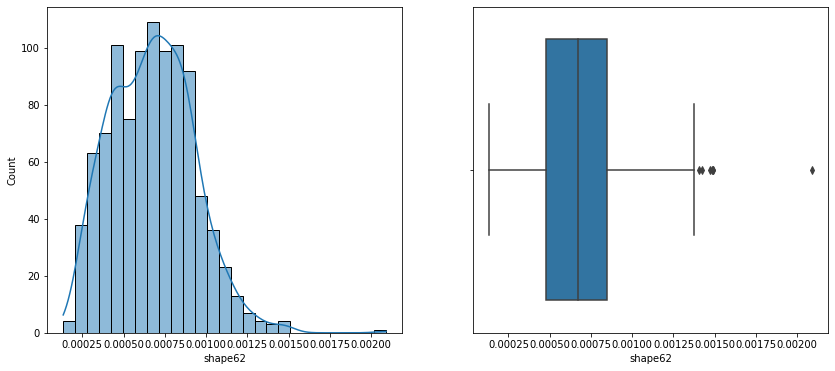

 Min: 0.00016846 Max: 0.0022627 
 mean: 0.0007038367878787879 std: 0.00025876295711580106 
 median: 0.000692845 
 mode: 0.0003985


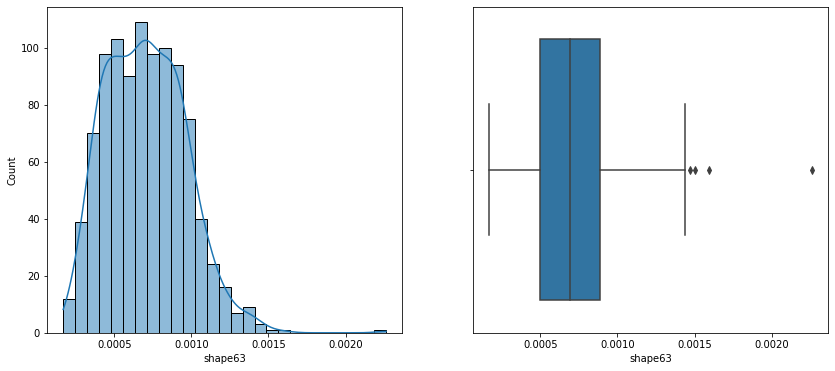

 Min: 0.0001659 Max: 0.0024313 
 mean: 0.0007322956969696969 std: 0.0002683402925860105 
 median: 0.00071125 
 mode: 0.00042579


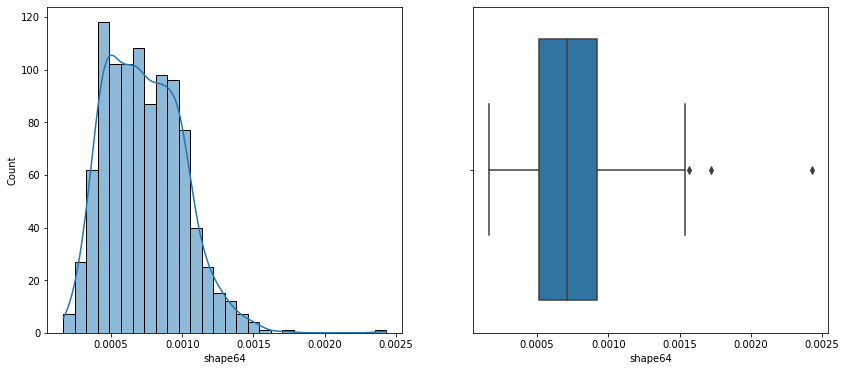

 Min: 0.0 Max: 0.41309 
 mean: 0.021944082828282828 std: 0.044042786147394035 
 median: 0.006836 
 mode: 0.0


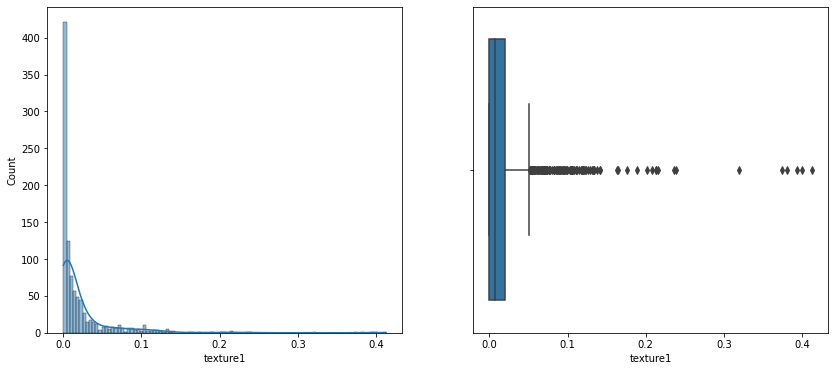

 Min: 0.0 Max: 0.11816 
 mean: 0.01168819191919192 std: 0.017103471288271613 
 median: 0.004883 
 mode: 0.0


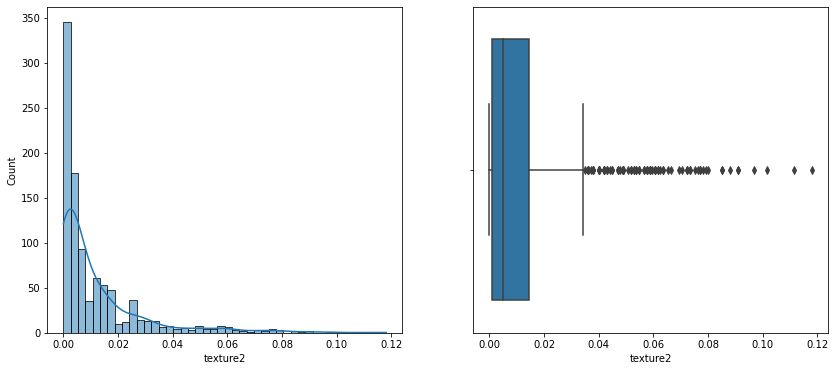

 Min: 0.0 Max: 0.078125 
 mean: 0.010314089898989898 std: 0.012937361325702728 
 median: 0.005859 
 mode: 0.0


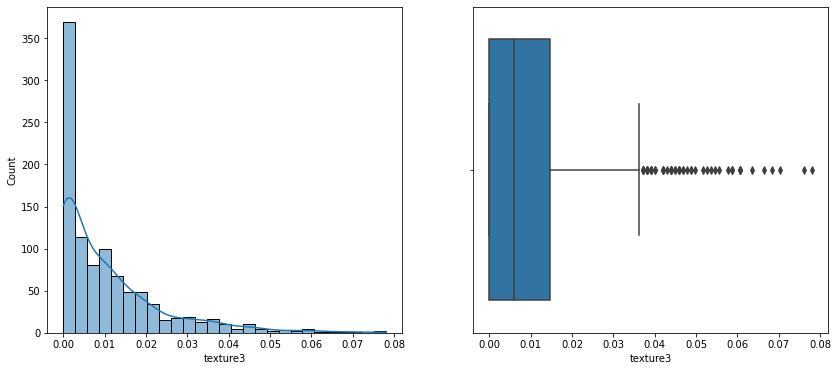

 Min: 0.0 Max: 0.16113 
 mean: 0.015390266666666666 std: 0.022029505568833815 
 median: 0.005859 
 mode: 0.0


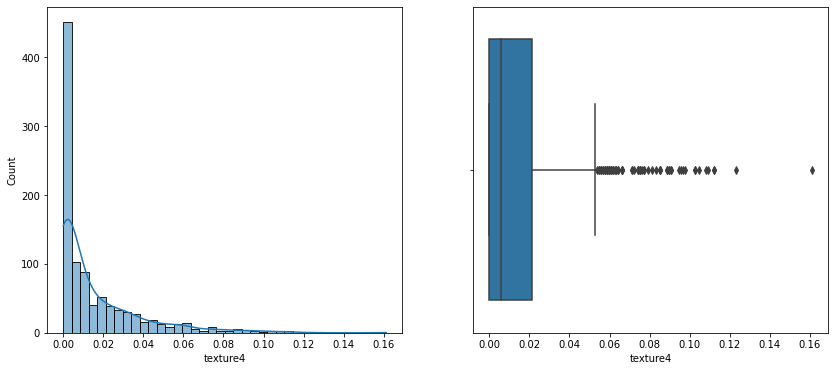

 Min: 0.0 Max: 0.20117 
 mean: 0.02694037373737374 std: 0.03803277009320124 
 median: 0.005859 
 mode: 0.0


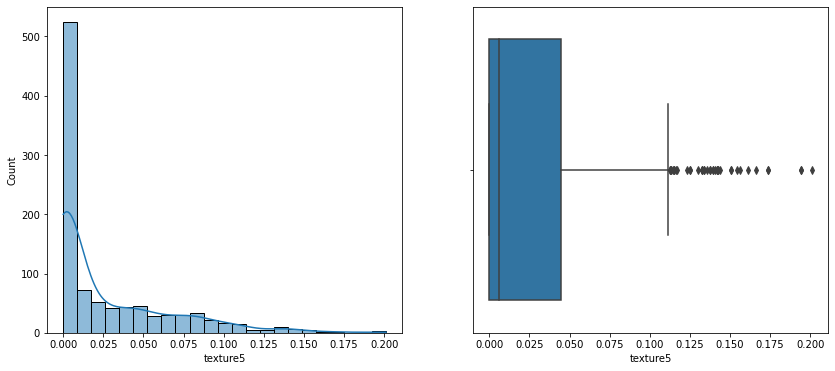

 Min: 0.0 Max: 0.14648 
 mean: 0.009880055555555557 std: 0.020438560544579043 
 median: 0.000977 
 mode: 0.0


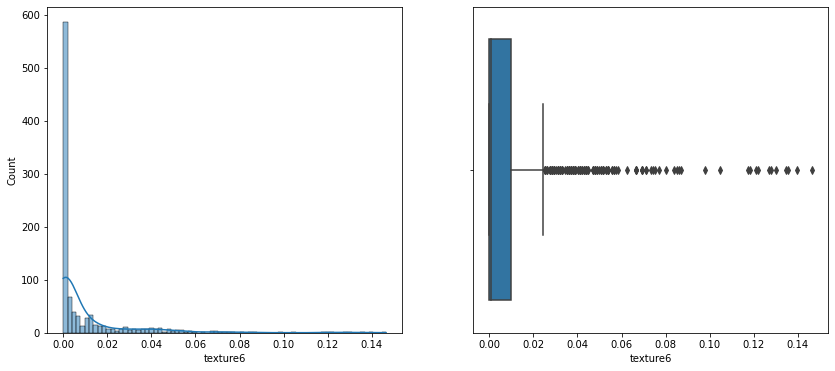

 Min: 0.0 Max: 0.16309 
 mean: 0.016712074747474746 std: 0.021361717223163854 
 median: 0.009766 
 mode: 0.0


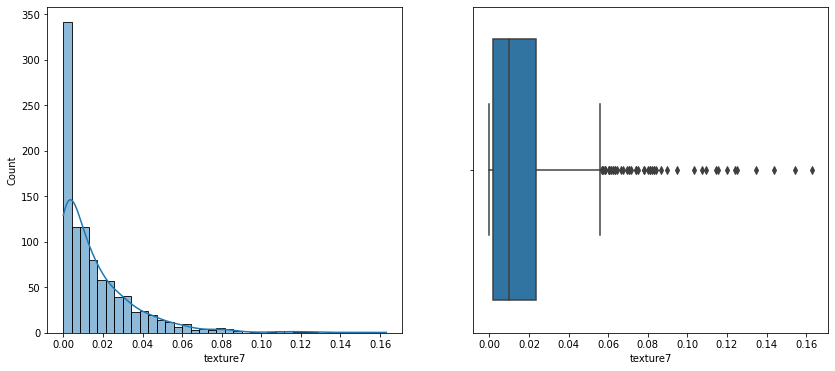

 Min: 0.0 Max: 0.13574 
 mean: 0.019561834343434344 std: 0.02471501392484312 
 median: 0.009766 
 mode: 0.0


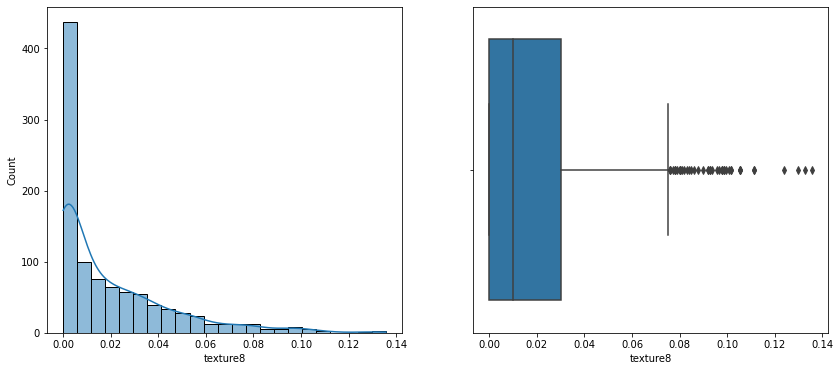

 Min: 0.0 Max: 0.19629 
 mean: 0.014921684848484848 std: 0.02251098862523395 
 median: 0.006836 
 mode: 0.0


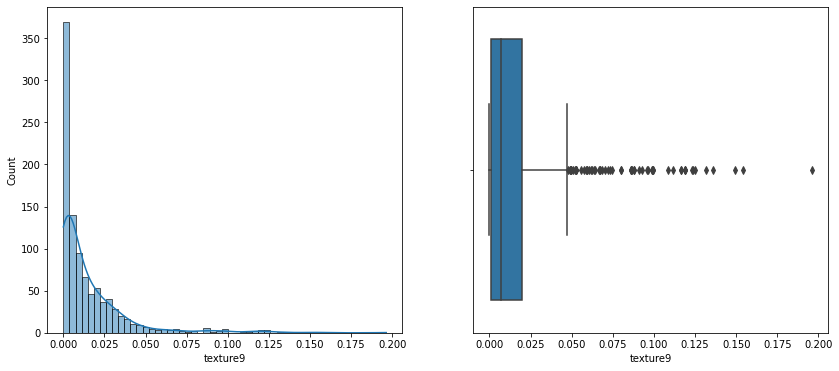

 Min: 0.0 Max: 0.29297 
 mean: 0.019961389898989896 std: 0.03743522869441205 
 median: 0.003906 
 mode: 0.0


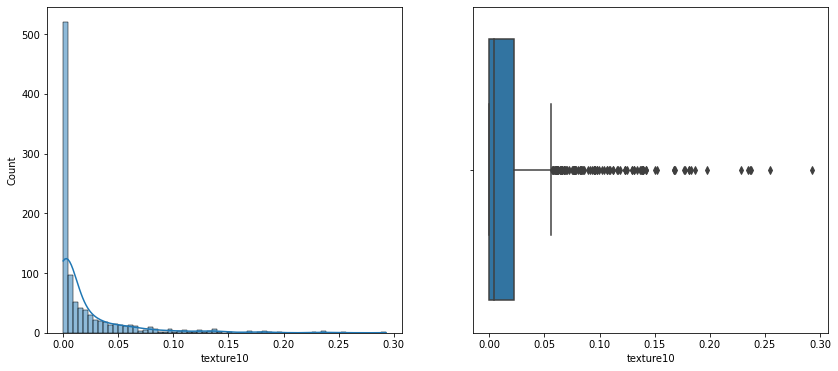

 Min: 0.0 Max: 0.28516 
 mean: 0.01879638888888889 std: 0.03341069277594726 
 median: 0.00293 
 mode: 0.0


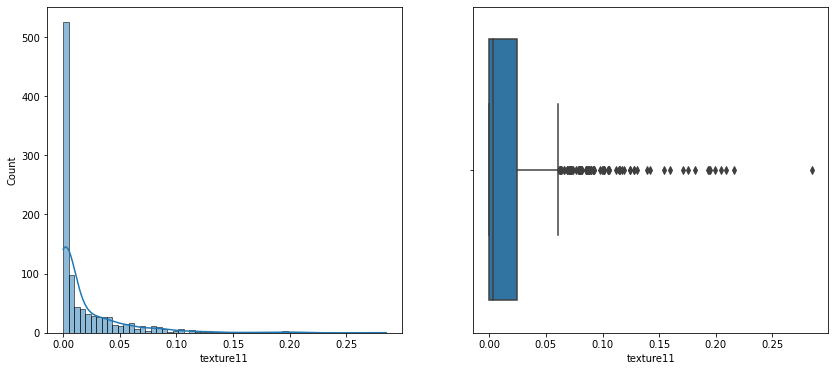

 Min: 0.0 Max: 0.50781 
 mean: 0.026540784848484846 std: 0.07250628042242145 
 median: 0.0 
 mode: 0.0


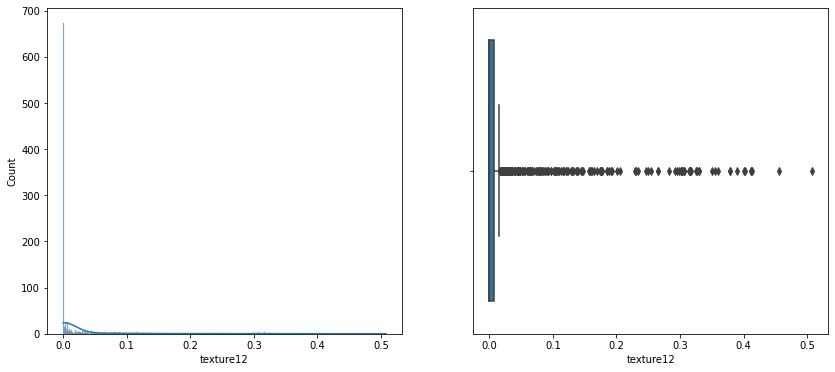

 Min: 0.0 Max: 0.11035 
 mean: 0.009813972727272727 std: 0.014276374092102584 
 median: 0.004883 
 mode: 0.0


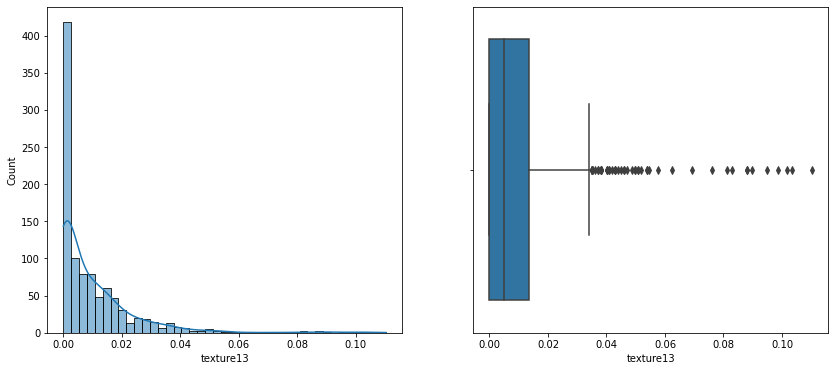

 Min: 0.0 Max: 0.18457 
 mean: 0.012795922222222223 std: 0.018220908678848135 
 median: 0.006836 
 mode: 0.0


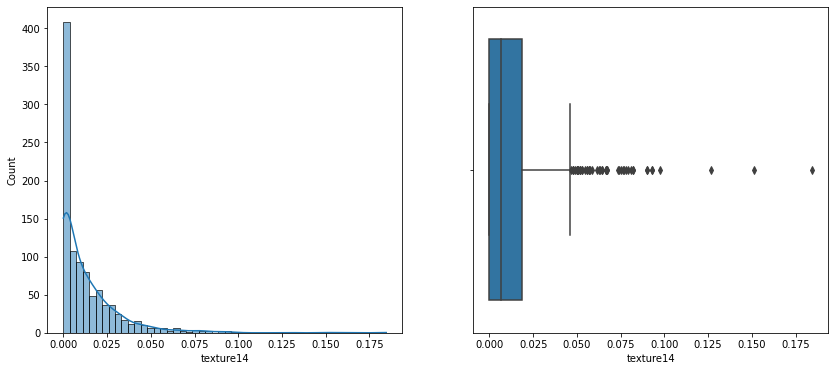

 Min: 0.0 Max: 0.85352 
 mean: 0.012030486868686869 std: 0.06388058479189296 
 median: 0.0 
 mode: 0.0


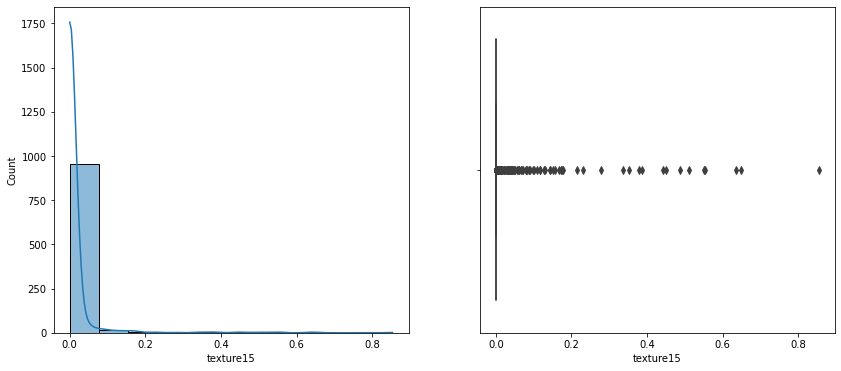

 Min: 0.0 Max: 0.11133 
 mean: 0.004544474747474748 std: 0.011537997892087022 
 median: 0.0 
 mode: 0.0


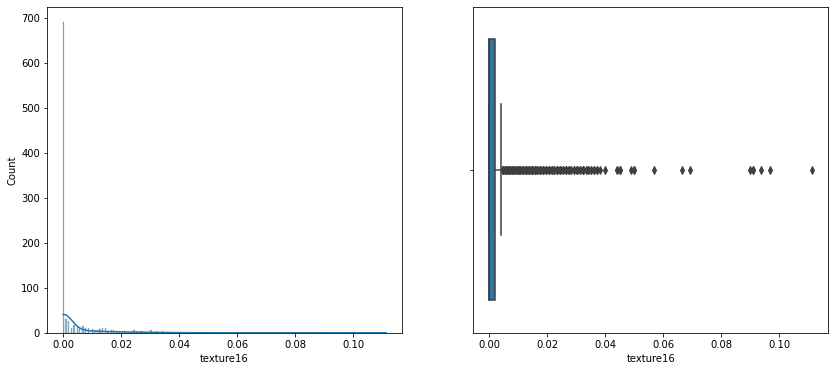

 Min: 0.0 Max: 0.19629 
 mean: 0.015098330303030304 std: 0.02645202697925844 
 median: 0.003906 
 mode: 0.0


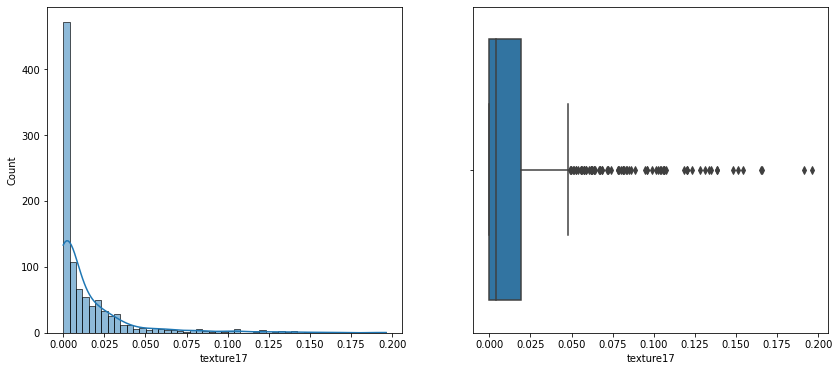

 Min: 0.0 Max: 0.11231 
 mean: 0.006175063636363637 std: 0.013688476003163093 
 median: 0.000977 
 mode: 0.0


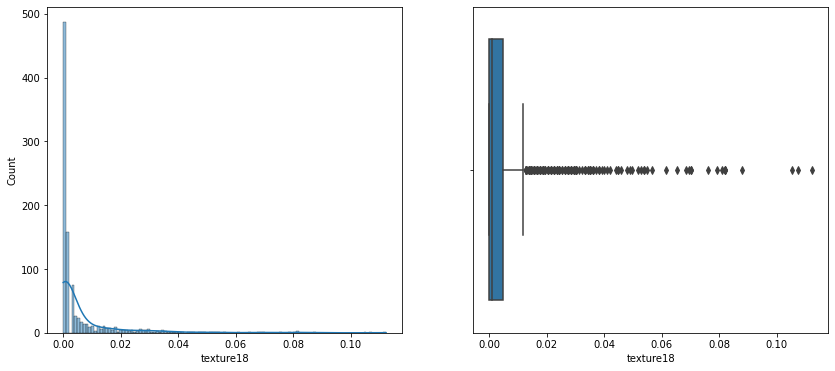

 Min: 0.0 Max: 0.30078 
 mean: 0.02445847070707071 std: 0.03238715789182591 
 median: 0.013672 
 mode: 0.0


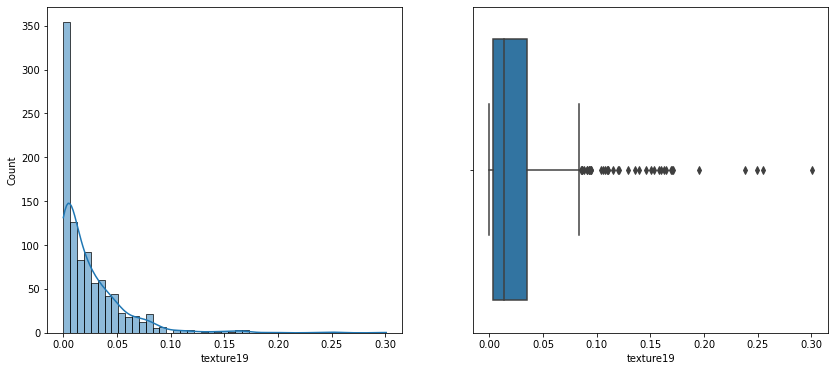

 Min: 0.0 Max: 0.099609 
 mean: 0.014515254545454544 std: 0.016404630446332606 
 median: 0.008789 
 mode: 0.0


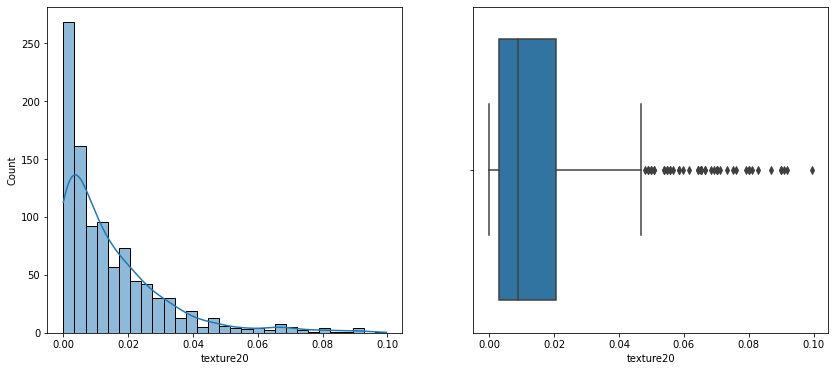

 Min: 0.0 Max: 0.097656 
 mean: 0.0028557060606060605 std: 0.010051408260320324 
 median: 0.0 
 mode: 0.0


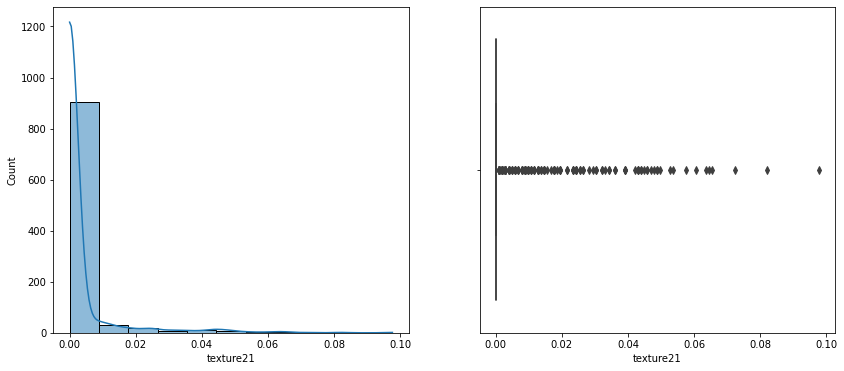

 Min: 0.0 Max: 0.17773 
 mean: 0.013170793939393941 std: 0.02162088014519168 
 median: 0.00293 
 mode: 0.0


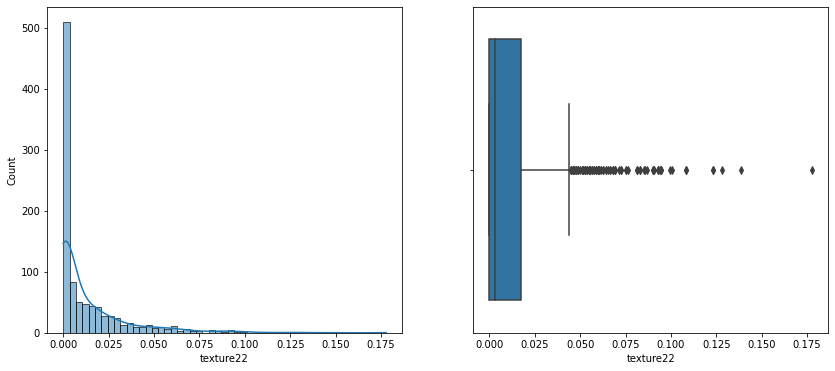

 Min: 0.0 Max: 0.19531 
 mean: 0.017050381818181817 std: 0.02397438956699172 
 median: 0.007812 
 mode: 0.0


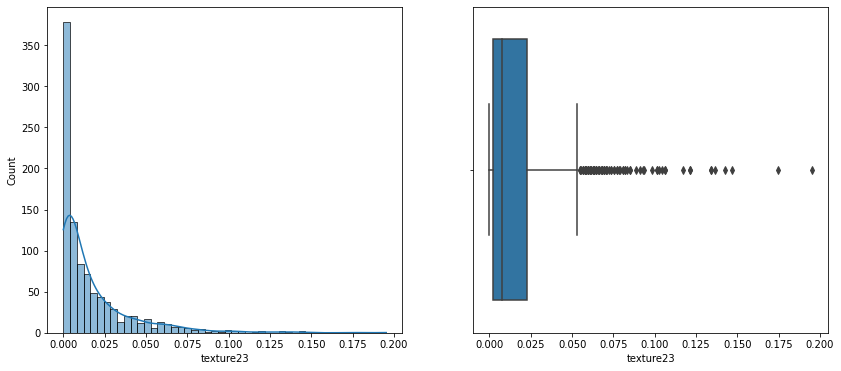

 Min: 0.0 Max: 0.13477 
 mean: 0.01016319898989899 std: 0.017872591178323904 
 median: 0.001953 
 mode: 0.0


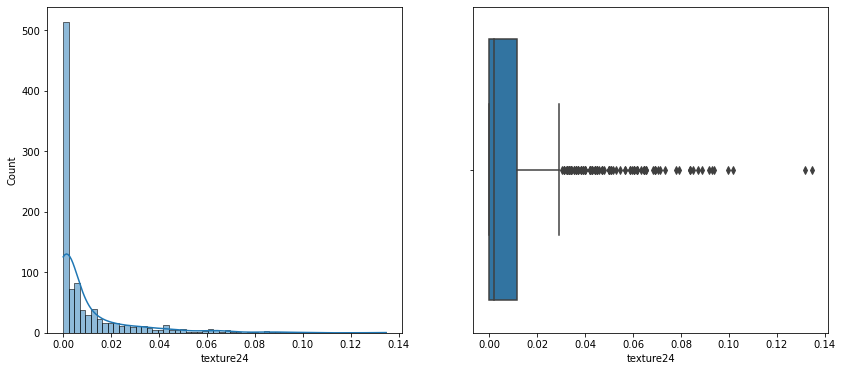

 Min: 0.0 Max: 0.15332 
 mean: 0.01043738686868687 std: 0.016252186730890163 
 median: 0.003906 
 mode: 0.0


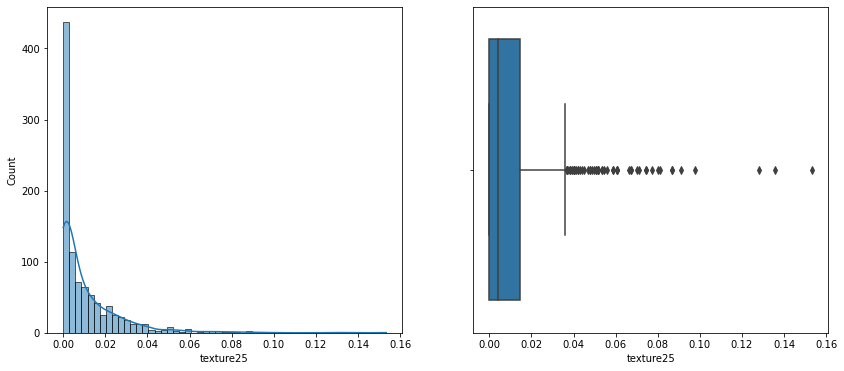

 Min: 0.0 Max: 0.30273 
 mean: 0.023273781818181818 std: 0.0417597089275745 
 median: 0.004883 
 mode: 0.0


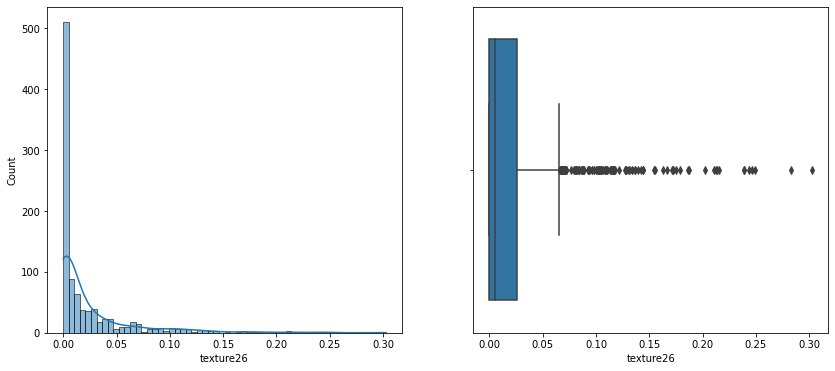

 Min: 0.0 Max: 0.22754 
 mean: 0.0203174898989899 std: 0.03153228398123428 
 median: 0.005859 
 mode: 0.0


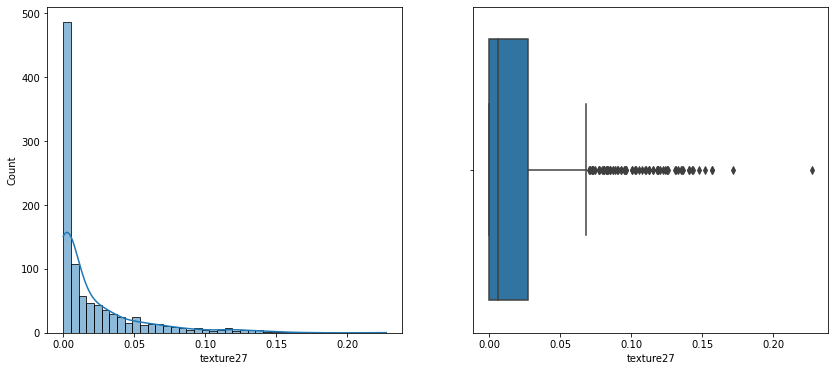

 Min: 0.0 Max: 0.12012 
 mean: 0.010097077777777777 std: 0.018187776634292028 
 median: 0.001953 
 mode: 0.0


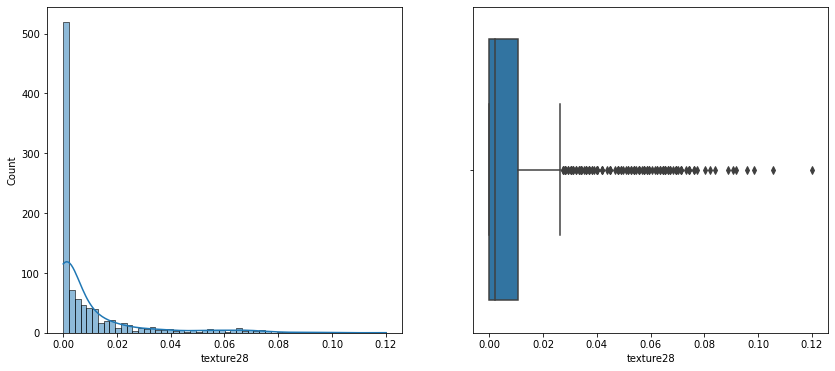

 Min: 0.0 Max: 0.21484 
 mean: 0.0217221 std: 0.02674871714061168 
 median: 0.012695 
 mode: 0.0


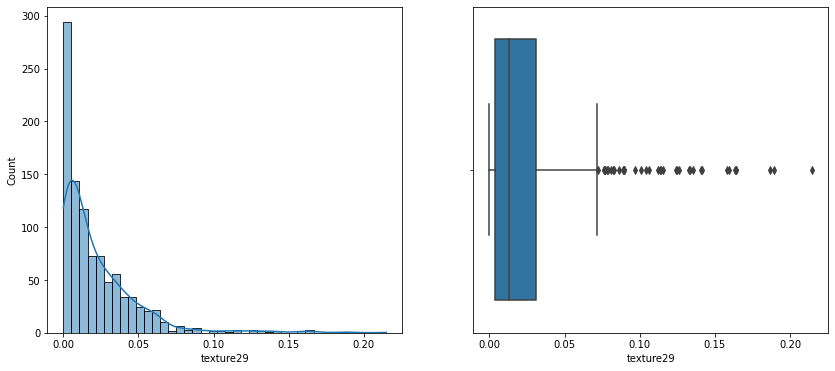

 Min: 0.0 Max: 0.085938 
 mean: 0.011675367676767677 std: 0.012933291358082412 
 median: 0.007812 
 mode: 0.0


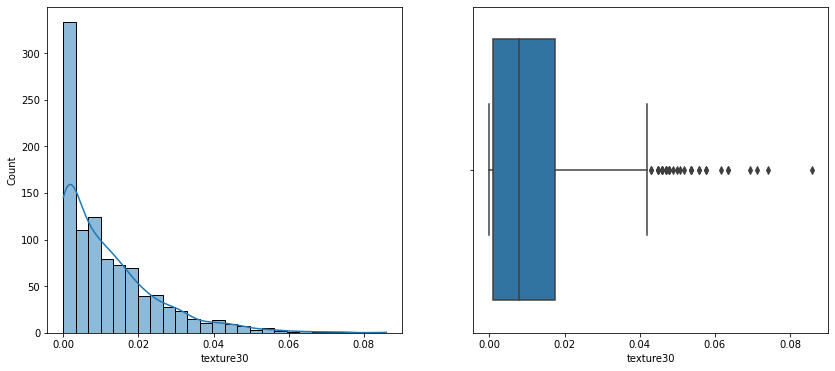

 Min: 0.0 Max: 0.22461 
 mean: 0.023895223232323234 std: 0.027224829747386516 
 median: 0.015625 
 mode: 0.0


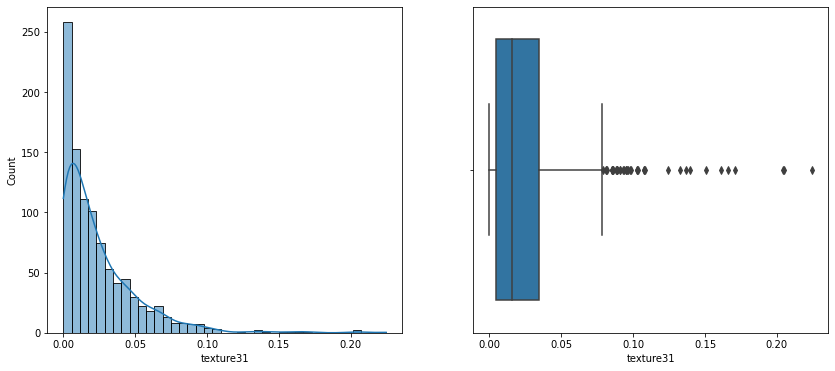

 Min: 0.0 Max: 0.12598 
 mean: 0.006047790909090909 std: 0.015113739256289166 
 median: 0.0 
 mode: 0.0


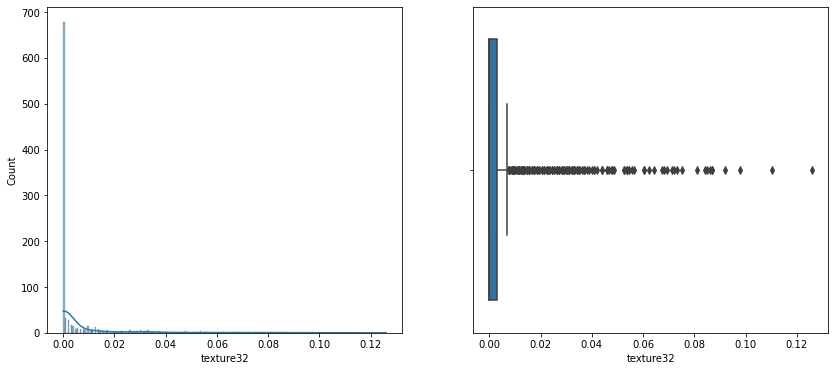

 Min: 0.0 Max: 0.43066 
 mean: 0.02324321111111111 std: 0.058630034086151216 
 median: 0.0 
 mode: 0.0


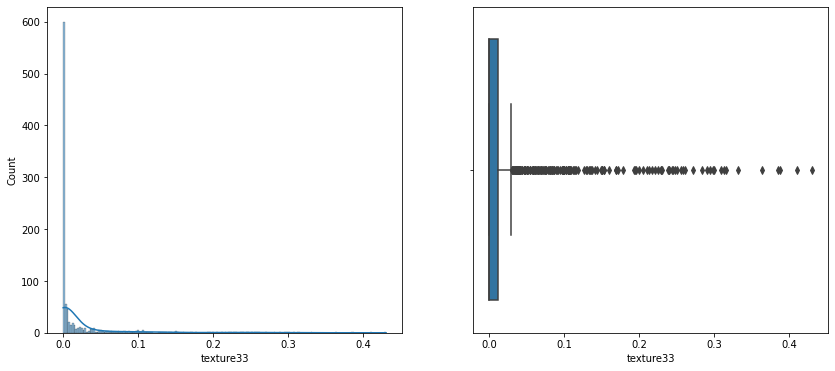

 Min: 0.0 Max: 0.35352 
 mean: 0.026518163636363636 std: 0.04226562219506997 
 median: 0.010742 
 mode: 0.0


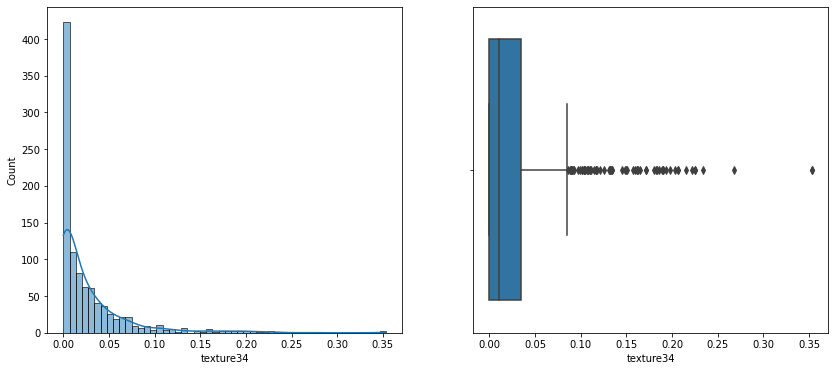

 Min: 0.0 Max: 0.077148 
 mean: 0.010514326262626264 std: 0.011852156840981844 
 median: 0.006836 
 mode: 0.0


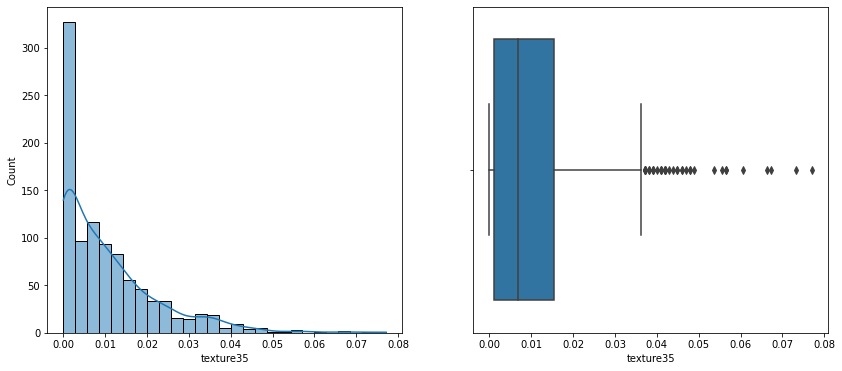

 Min: 0.0 Max: 0.10742 
 mean: 0.0033213030303030303 std: 0.01274049619232247 
 median: 0.0 
 mode: 0.0


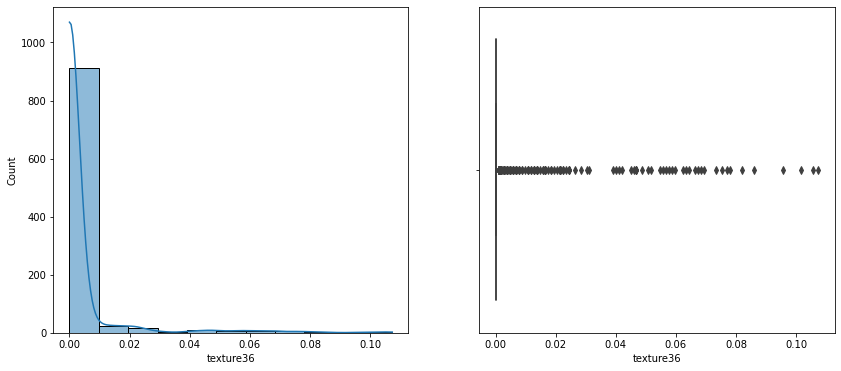

 Min: 0.0 Max: 0.55664 
 mean: 0.02112340909090909 std: 0.058368311181473016 
 median: 0.0 
 mode: 0.0


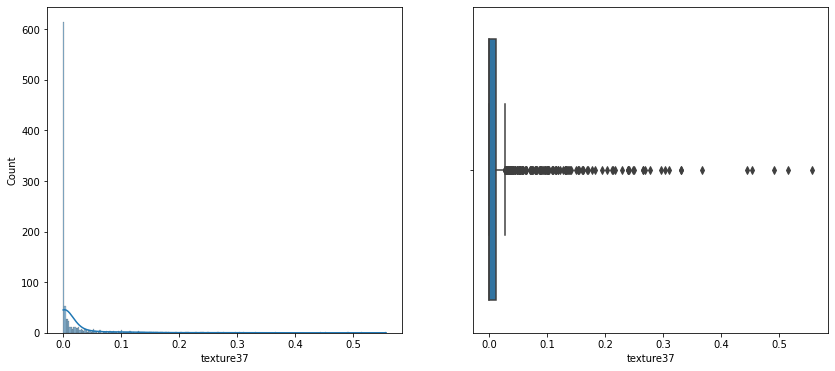

 Min: 0.0 Max: 0.21777 
 mean: 0.023964261616161615 std: 0.027909448133518054 
 median: 0.015625 
 mode: 0.0


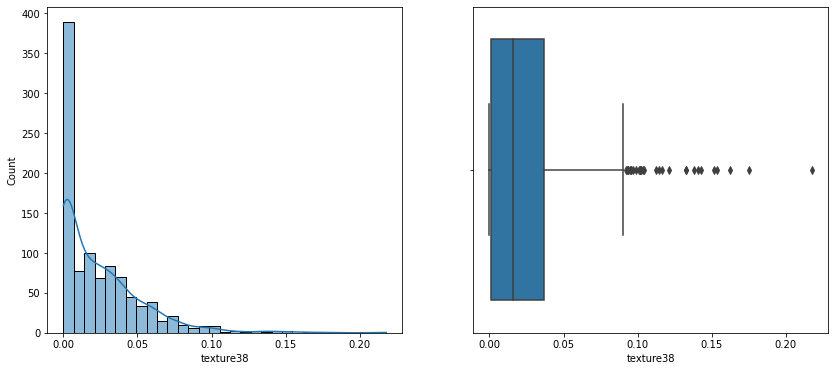

 Min: 0.0 Max: 0.14746 
 mean: 0.017060263636363638 std: 0.021795829440634937 
 median: 0.008789 
 mode: 0.0


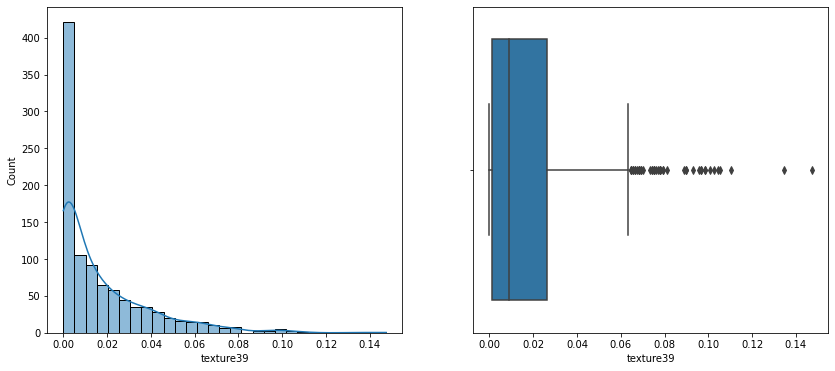

 Min: 0.0 Max: 0.16602 
 mean: 0.019187013131313133 std: 0.025500107761481088 
 median: 0.009766 
 mode: 0.0


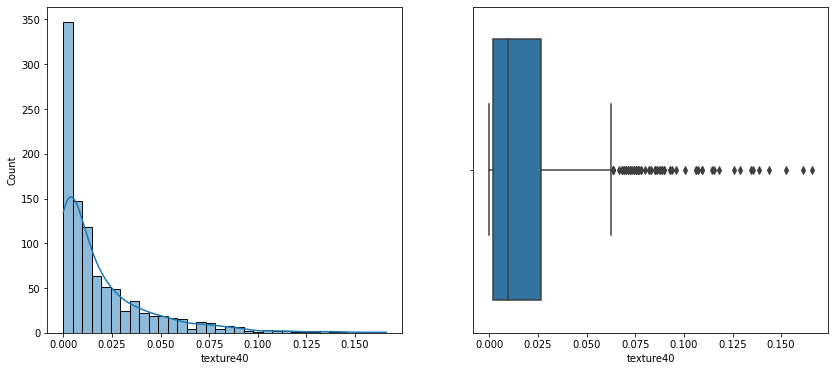

 Min: 0.0 Max: 0.41113 
 mean: 0.015579643434343437 std: 0.041011904862467204 
 median: 0.0 
 mode: 0.0


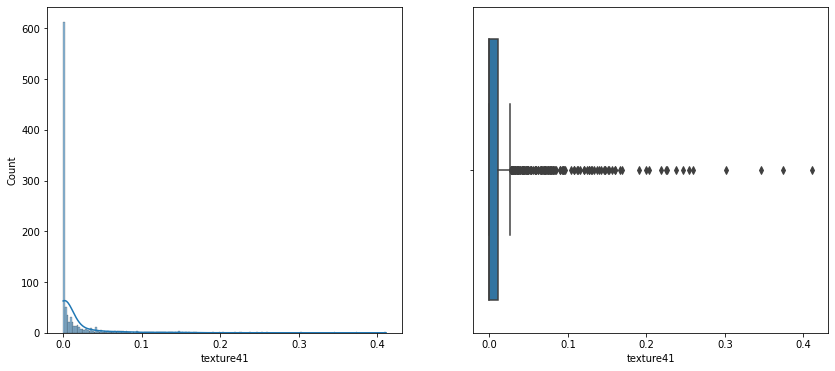

 Min: 0.0 Max: 0.071289 
 mean: 0.0058949161616161615 std: 0.010653189298162724 
 median: 0.000977 
 mode: 0.0


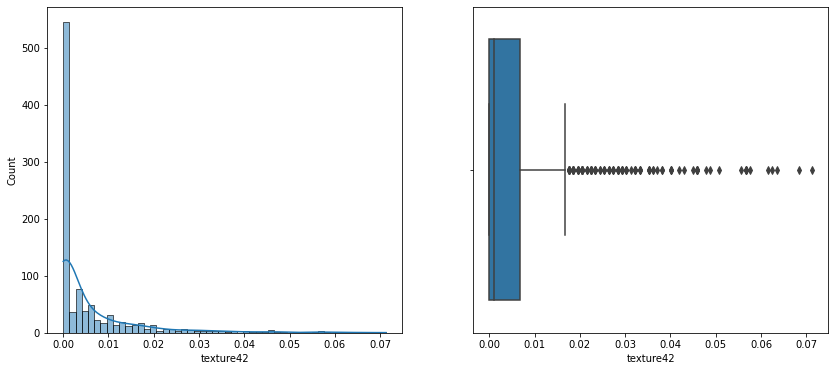

 Min: 0.0 Max: 0.17676 
 mean: 0.013875091919191918 std: 0.018022222706221183 
 median: 0.007812 
 mode: 0.0


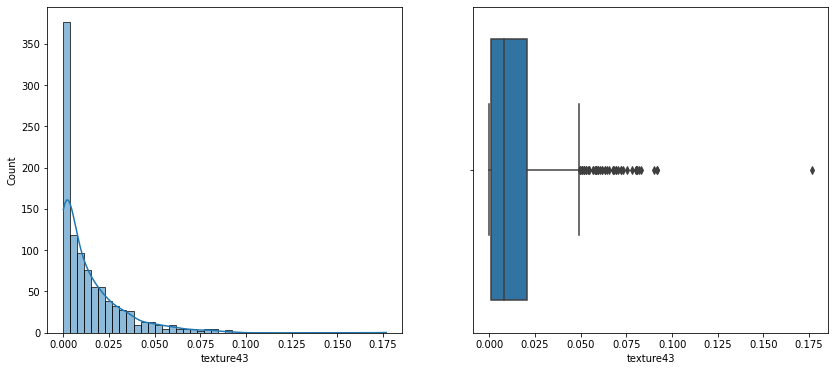

 Min: 0.0 Max: 0.41211 
 mean: 0.025263358585858587 std: 0.04643673772579703 
 median: 0.004883 
 mode: 0.0


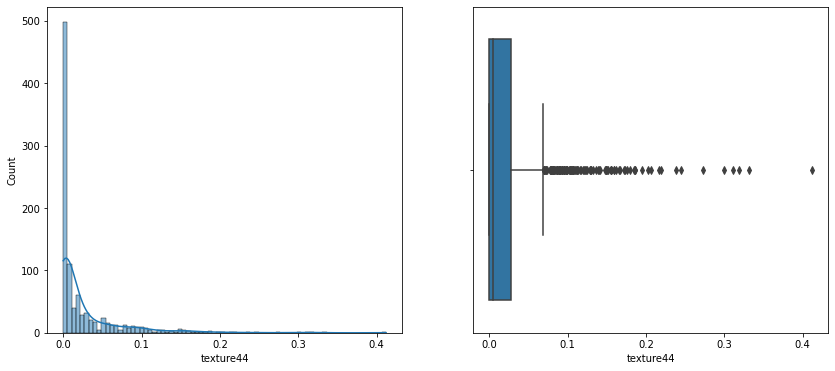

 Min: 0.0 Max: 0.13574 
 mean: 0.016226739393939395 std: 0.021086882716620615 
 median: 0.007812 
 mode: 0.0


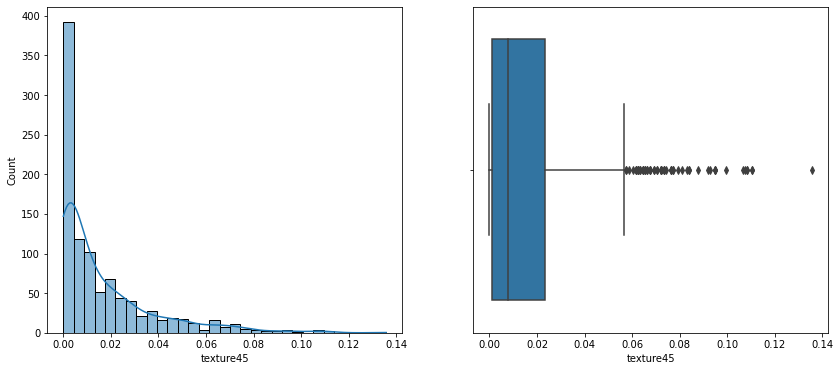

 Min: 0.0 Max: 0.17578 
 mean: 0.02175959595959596 std: 0.026323587238799528 
 median: 0.011719 
 mode: 0.0


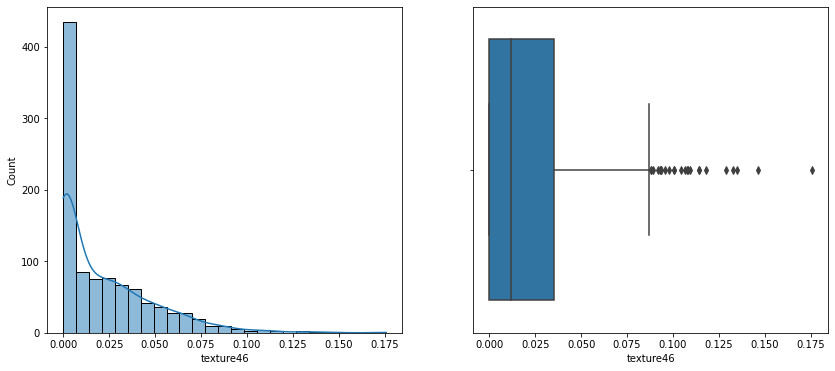

 Min: 0.0 Max: 0.098633 
 mean: 0.018595148484848483 std: 0.01600664969196069 
 median: 0.015625 
 mode: 0.0


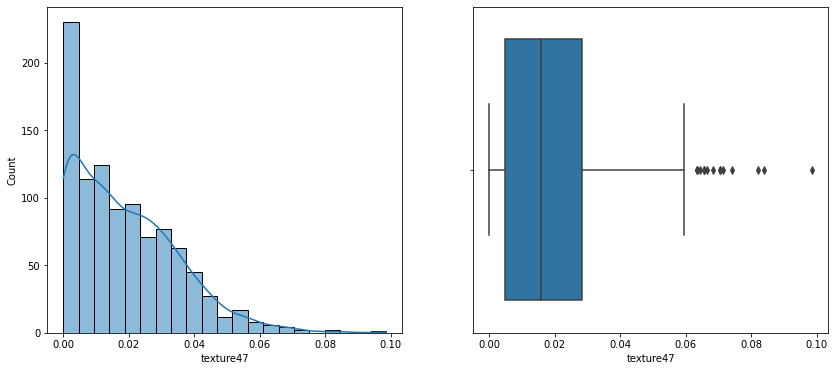

 Min: 0.0 Max: 0.24902 
 mean: 0.016763365656565655 std: 0.02984117228993604 
 median: 0.000977 
 mode: 0.0


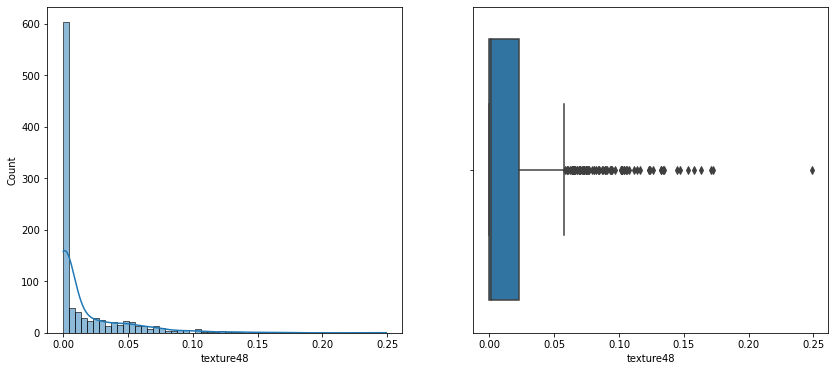

 Min: 0.0 Max: 0.10742 
 mean: 0.011680293939393939 std: 0.01316309230080755 
 median: 0.007812 
 mode: 0.0


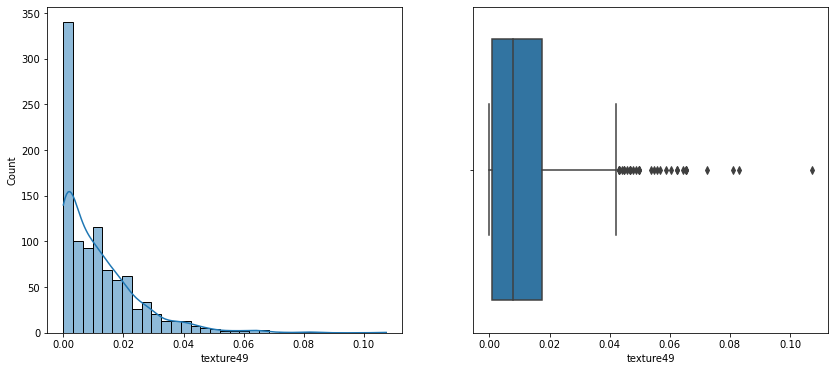

 Min: 0.0 Max: 0.2168 
 mean: 0.018985764646464644 std: 0.027361448187259895 
 median: 0.009766 
 mode: 0.0


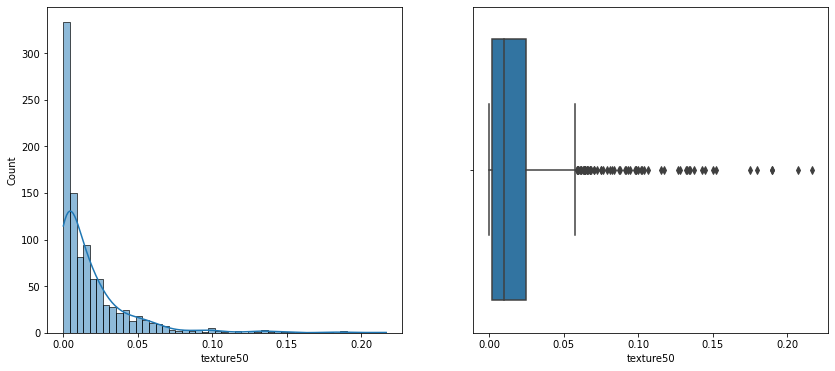

 Min: 0.0 Max: 0.39063 
 mean: 0.013239848484848485 std: 0.0334017667434629 
 median: 0.0 
 mode: 0.0


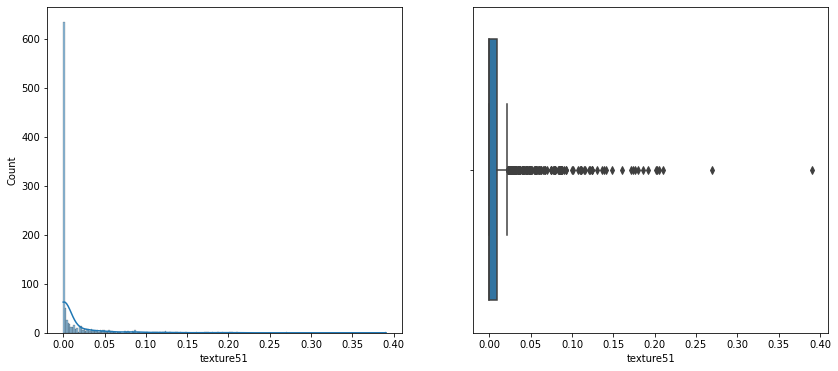

 Min: 0.0 Max: 0.11719 
 mean: 0.0072887181818181825 std: 0.013862070094496156 
 median: 0.0 
 mode: 0.0


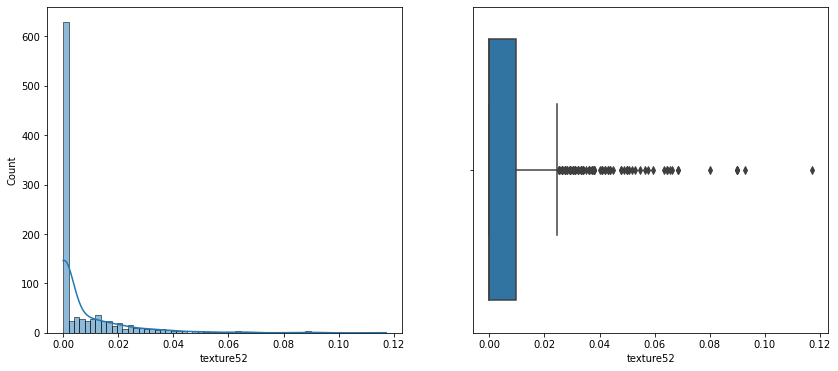

 Min: 0.0 Max: 0.16504 
 mean: 0.014468926262626263 std: 0.02165404562138728 
 median: 0.004883 
 mode: 0.0


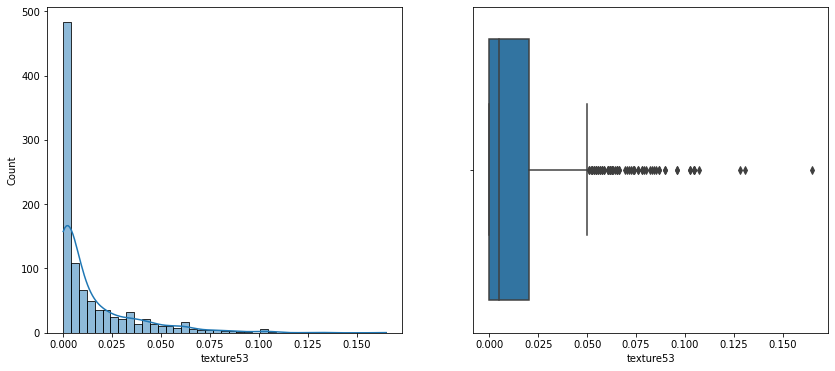

 Min: 0.0 Max: 0.27344 
 mean: 0.022091052525252525 std: 0.027335452466870244 
 median: 0.012695 
 mode: 0.0


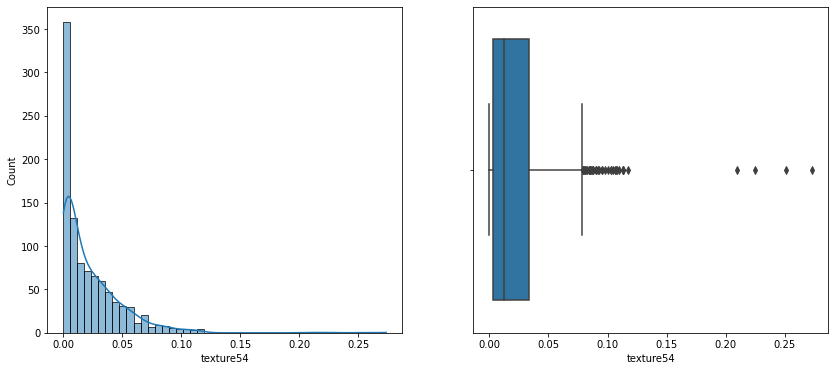

 Min: 0.0 Max: 0.42969 
 mean: 0.03650082828282829 std: 0.06340332739233345 
 median: 0.004883 
 mode: 0.0


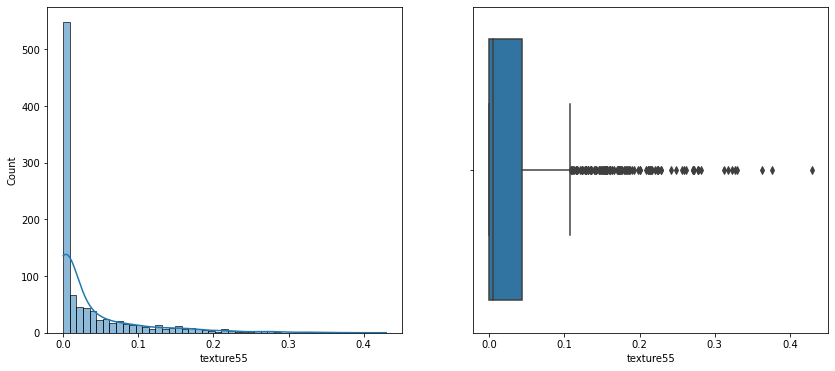

 Min: 0.0 Max: 0.20215 
 mean: 0.005023871717171717 std: 0.01932126641609831 
 median: 0.0 
 mode: 0.0


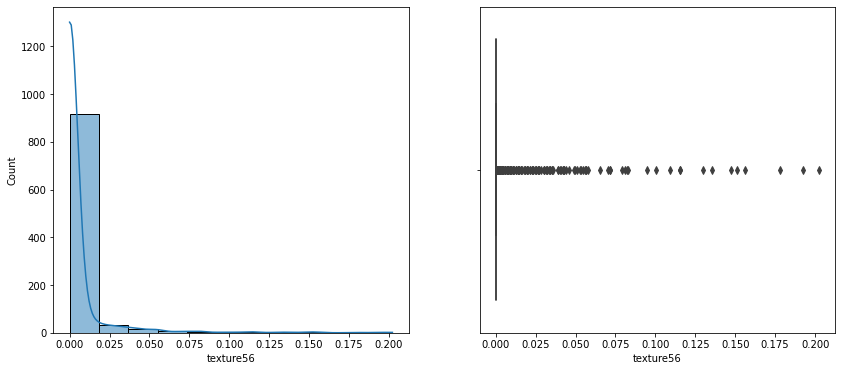

 Min: 0.0 Max: 0.17285 
 mean: 0.015943645454545456 std: 0.02321425284046214 
 median: 0.005859 
 mode: 0.0


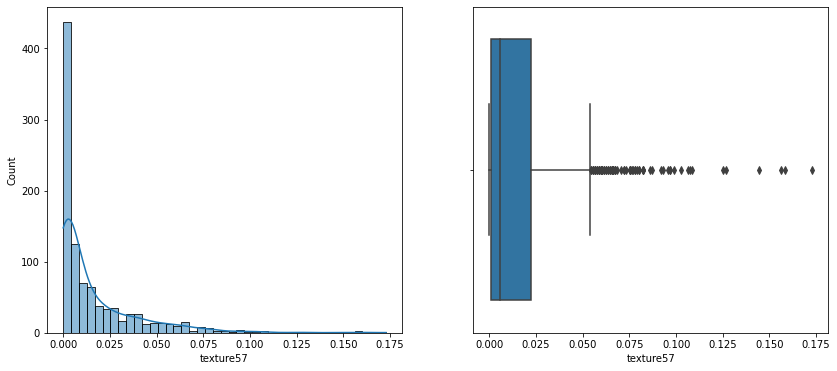

 Min: 0.0 Max: 0.2002 
 mean: 0.011585614141414142 std: 0.0250398423411928 
 median: 0.000977 
 mode: 0.0


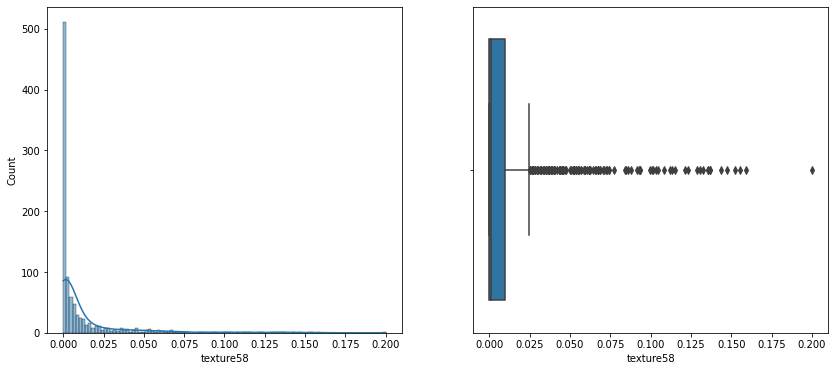

 Min: 0.0 Max: 0.10645 
 mean: 0.016108361616161616 std: 0.015334727435836174 
 median: 0.012695 
 mode: 0.0


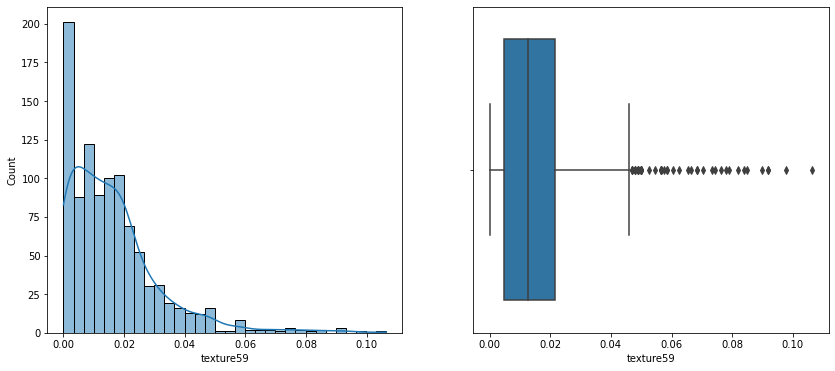

 Min: 0.0 Max: 0.57813 
 mean: 0.014017144444444444 std: 0.06015081349758268 
 median: 0.0 
 mode: 0.0


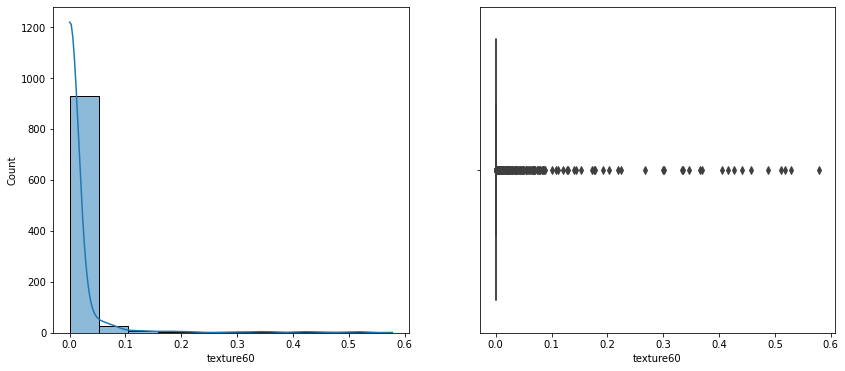

 Min: 0.0 Max: 0.15137 
 mean: 0.002688022222222222 std: 0.011414551649382985 
 median: 0.0 
 mode: 0.0


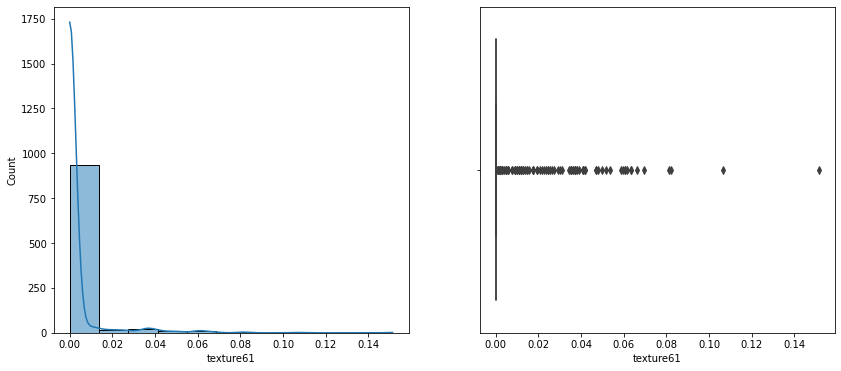

 Min: 0.0 Max: 0.37598 
 mean: 0.0202908797979798 std: 0.03903970981018421 
 median: 0.003906 
 mode: 0.0


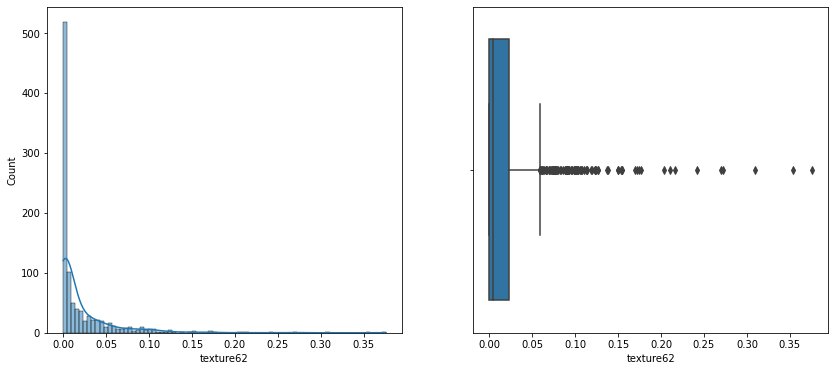

 Min: 0.0 Max: 0.086914 
 mean: 0.00898930707070707 std: 0.013791222312846546 
 median: 0.00293 
 mode: 0.0


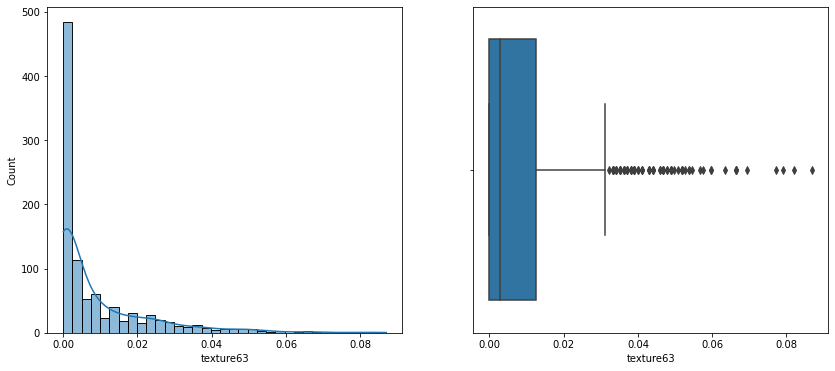

 Min: 0.0 Max: 0.1416 
 mean: 0.019419843434343435 std: 0.022767688099588283 
 median: 0.011719 
 mode: 0.0


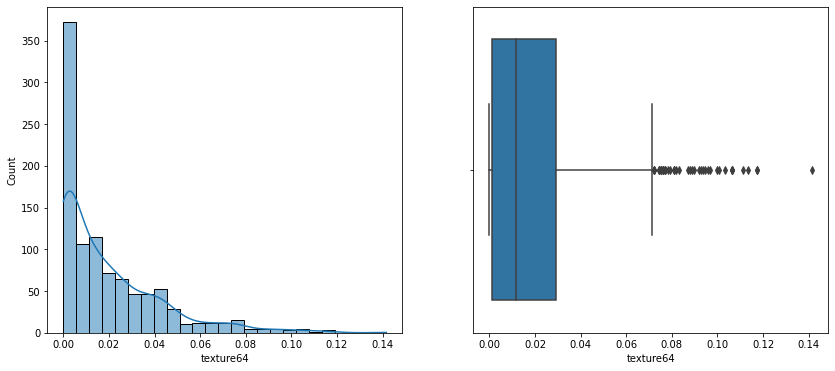

In [27]:
# Univariate analysis => {number -> histogram, cat -> pie chart/groupby}
columns = df.columns
columns = columns.drop('id')
columns = columns.drop('species')
for col in columns: #distrbution
    data = df[col]
    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    sns.histplot(x = data, kde=True, ax=axes[0])
    sns.boxplot(x = data, ax=axes[1])
    print(' Min:', data.min(), 'Max:', data.max(), '\n mean:', data.mean(), 'std:', data.std(),'\n', 'median:', data.median(), '\n', 'mode:', data.mode()[0])
    plt.show()

In [28]:
plt.rcParams['font.size'] = 13
catgorical_feat = []
numeric_feat = []
for col in df.columns:
    if df[col].dtype == 'object':
        catgorical_feat.append(col)
    else:
        numeric_feat.append(col)
catgorical_feat

['species']

In [29]:
for col in catgorical_feat:
    print(df[col].nunique())

99


In [30]:
# alot uniques so cant use pie chart to visualize them but we can use groupby
df.groupby('species').count()

# for col in catgorical_feat:
#     plt.figure(figsize=(6, 6))
#     plt.title(col)
#     plt.pie(df[col].value_counts(),
#            labels=df[col].unique(),
#             shadow=True,
#             autopct='%.3f')
#     plt.show()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
species,,,,,,,,,,,,,,,,,,,,,
Acer_Capillipes,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Acer_Circinatum,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Acer_Mono,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Acer_Opalus,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Acer_Palmatum,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tilia_Tomentosa,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Ulmus_Bergmanniana,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
Viburnum_Tinus,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10


In [31]:
new_df = df.groupby('species').count() # all categorical class is balanced
for col in new_df.columns:
    print(col)
    print(new_df[col].unique())
    break

id
[10]


**Notes:**
classes are balanced in training and also in testing ^^.

In [32]:
# Bivariate analysis => heatmap + {num vs num -> scatterplot, num vs cat -> swarmplot, cat vs cat -> barplot}
plt.figure(figsize= (16, 16))
corr_matrix = df.corr()
# sns.heatmap(corr_matrix, annot=True) # as it will be so big so i dont visualize it

<Figure size 1152x1152 with 0 Axes>

In [33]:
corr_matrix # cause we cant visualize it so we will use it as df and continue

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
id,1.000000,-0.011673,-0.027565,-0.059533,0.001639,-0.002419,-0.051818,0.061214,-0.039509,-0.070954,...,-0.040292,-0.005132,-0.043101,0.063337,-0.007915,-0.000823,0.026319,0.032873,0.024299,0.035396
margin1,-0.011673,1.000000,0.806390,-0.182829,-0.297807,-0.475874,0.767718,0.066273,-0.094137,-0.181496,...,0.137158,-0.047771,0.126227,-0.024139,-0.168201,0.035072,-0.007581,-0.033159,-0.075171,0.030414
margin2,-0.027565,0.806390,1.000000,-0.204640,-0.315953,-0.444312,0.825762,-0.083273,-0.086428,-0.120276,...,0.154407,-0.021096,0.123834,-0.063654,-0.157842,0.081069,-0.007057,-0.037405,-0.098957,-0.029532
margin3,-0.059533,-0.182829,-0.204640,1.000000,0.120042,-0.185007,-0.163976,0.095449,0.024350,-0.000042,...,0.047347,-0.027618,0.007261,-0.021390,0.033505,-0.019850,0.084957,-0.081999,-0.148193,0.061780
margin4,0.001639,-0.297807,-0.315953,0.120042,1.000000,0.029480,-0.261437,-0.268271,-0.047693,0.227543,...,-0.071974,-0.009537,-0.050529,-0.044318,0.088857,-0.052317,0.320644,-0.073886,0.050970,0.014343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
texture60,-0.000823,0.035072,0.081069,-0.019850,-0.052317,0.006542,0.066262,-0.034094,0.048647,-0.028292,...,-0.129365,0.004412,-0.155187,0.240704,-0.183369,1.000000,-0.051838,0.265879,-0.089679,-0.190194
texture61,0.026319,-0.007581,-0.007057,0.084957,0.320644,-0.109229,-0.050498,-0.163375,-0.079283,0.088517,...,-0.002235,0.053707,-0.072814,-0.084638,-0.023539,-0.051838,1.000000,-0.063582,-0.068065,0.036374
texture62,0.032873,-0.033159,-0.037405,-0.081999,-0.073886,0.151675,-0.031555,0.015391,-0.048843,-0.031954,...,-0.217239,0.171577,-0.283316,0.563088,-0.128010,0.265879,-0.063582,1.000000,-0.058189,-0.245527
texture63,0.024299,-0.075171,-0.098957,-0.148193,0.050970,0.022299,-0.132087,-0.001364,0.027758,-0.119494,...,-0.207887,0.002057,-0.064724,-0.059866,0.156568,-0.089679,-0.068065,-0.058189,1.000000,0.029305


In [34]:
for col in corr_matrix.columns:
    corr_matrix[col] = corr_matrix[col].map(lambda p: abs(p) > 0.9)
np.sum(np.sum(corr_matrix)) # so there are columns corrleated

1083

In [35]:
corr_matrix.iloc[list(corr_matrix['id']), :].index

Index(['id'], dtype='object')

In [36]:
dicto = {}
for col in corr_matrix.columns:
    dicto[str(col)] = corr_matrix.iloc[list(corr_matrix[col]), :].index
dicto # dicto says no corr betwen texture, margin, id and whole data but there is high corr in shapes and each other

{'id': Index(['id'], dtype='object'),
 'margin1': Index(['margin1'], dtype='object'),
 'margin2': Index(['margin2'], dtype='object'),
 'margin3': Index(['margin3'], dtype='object'),
 'margin4': Index(['margin4'], dtype='object'),
 'margin5': Index(['margin5'], dtype='object'),
 'margin6': Index(['margin6'], dtype='object'),
 'margin7': Index(['margin7'], dtype='object'),
 'margin8': Index(['margin8'], dtype='object'),
 'margin9': Index(['margin9'], dtype='object'),
 'margin10': Index(['margin10'], dtype='object'),
 'margin11': Index(['margin11'], dtype='object'),
 'margin12': Index(['margin12'], dtype='object'),
 'margin13': Index(['margin13'], dtype='object'),
 'margin14': Index(['margin14'], dtype='object'),
 'margin15': Index(['margin15'], dtype='object'),
 'margin16': Index(['margin16'], dtype='object'),
 'margin17': Index(['margin17'], dtype='object'),
 'margin18': Index(['margin18'], dtype='object'),
 'margin19': Index(['margin19'], dtype='object'),
 'margin20': Index(['margin20'

In [37]:
# after invstigate we will remove all shape columns except shape64
columns_removed = df.loc[[0, 1], 'shape1':'shape63'].columns
columns_removed

Index(['shape1', 'shape2', 'shape3', 'shape4', 'shape5', 'shape6', 'shape7',
       'shape8', 'shape9', 'shape10', 'shape11', 'shape12', 'shape13',
       'shape14', 'shape15', 'shape16', 'shape17', 'shape18', 'shape19',
       'shape20', 'shape21', 'shape22', 'shape23', 'shape24', 'shape25',
       'shape26', 'shape27', 'shape28', 'shape29', 'shape30', 'shape31',
       'shape32', 'shape33', 'shape34', 'shape35', 'shape36', 'shape37',
       'shape38', 'shape39', 'shape40', 'shape41', 'shape42', 'shape43',
       'shape44', 'shape45', 'shape46', 'shape47', 'shape48', 'shape49',
       'shape50', 'shape51', 'shape52', 'shape53', 'shape54', 'shape55',
       'shape56', 'shape57', 'shape58', 'shape59', 'shape60', 'shape61',
       'shape62', 'shape63'],
      dtype='object')

In [38]:
# remove or not depend on Experiment (remove is Experiment 1)
# df = df.drop(list(columns_removed), axis=1)
# df
# # (Experiment 2)
columns_removed = []

In [39]:
# target is class so:

# no numeric vs numeric
# no cat vs cat
# numeric vs categorical by swarm plot

# I ran it once and all catergories (species) have whole range in each feature
# for col in numeric_feat: #each independant numeric vs label
#     sns.swarmplot(x = df['species'], y = df[col])
#     plt.show()

In [40]:
# Multivariate analysis but we cant do it as alot of features so large number 185 feature

# sns.pairplot(data=df)
# plt.show()

In [41]:
cleaned_df = df
cleaned_df.to_csv('cleaned_df.csv', index=False)

**Notes:**

Data now have 

* correct dtypes & checked errors & balanced classes.

* No NaNs, dublicates, Outliers but bad distrbutions.. mathmatical transformers couldn't solve it yet at preprocessing will be solved using standard Scaller

* know distrbution of each variable + No correlation between independant variables (features) as we removed high corr features >0.9

* 4) remove columns shape1:shape63 from test data

**Experiments Notes:**

* I won't remove columns as it represent some features in Data and Try again

# 4) Encoding

* Encode class using one-hot Encoded not label_encoder + standardScaller the features to build model

In [42]:
file = open('cleaned_df.csv', 'rb')
encoder = chardet.detect(file.read(10000))
print(encoder)

{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}


In [43]:
df = pd.read_csv('cleaned_df.csv', encoding=encoder['encoding'])

In [44]:
catgorical_feat = []
numeric_feat = []
for col in df.columns:
    if df[col].dtype == 'object':
        catgorical_feat.append(col)
    else:
        numeric_feat.append(col)
print(numeric_feat)
print(catgorical_feat)

['id', 'margin1', 'margin2', 'margin3', 'margin4', 'margin5', 'margin6', 'margin7', 'margin8', 'margin9', 'margin10', 'margin11', 'margin12', 'margin13', 'margin14', 'margin15', 'margin16', 'margin17', 'margin18', 'margin19', 'margin20', 'margin21', 'margin22', 'margin23', 'margin24', 'margin25', 'margin26', 'margin27', 'margin28', 'margin29', 'margin30', 'margin31', 'margin32', 'margin33', 'margin34', 'margin35', 'margin36', 'margin37', 'margin38', 'margin39', 'margin40', 'margin41', 'margin42', 'margin43', 'margin44', 'margin45', 'margin46', 'margin47', 'margin48', 'margin49', 'margin50', 'margin51', 'margin52', 'margin53', 'margin54', 'margin55', 'margin56', 'margin57', 'margin58', 'margin59', 'margin60', 'margin61', 'margin62', 'margin63', 'margin64', 'shape1', 'shape2', 'shape3', 'shape4', 'shape5', 'shape6', 'shape7', 'shape8', 'shape9', 'shape10', 'shape11', 'shape12', 'shape13', 'shape14', 'shape15', 'shape16', 'shape17', 'shape18', 'shape19', 'shape20', 'shape21', 'shape22', '

In [45]:
y = df['species']
X = df.drop(['species'], axis=1)
y

0                Acer_Opalus
1      Pterocarya_Stenoptera
2       Quercus_Hartwissiana
3            Tilia_Tomentosa
4         Quercus_Variabilis
               ...          
985     Magnolia_Salicifolia
986              Acer_Pictum
987       Alnus_Maximowiczii
988            Quercus_Rubra
989           Quercus_Afares
Name: species, Length: 990, dtype: object

In [46]:
# one hot Encoding for target
label_encoder = LabelEncoder()
y_transformed = label_encoder.fit_transform(y)
y_transformed

array([ 3, 49, 65, 94, 84, 40, 54, 78, 53, 89, 98, 16, 74, 50, 58, 31, 43,
        4, 75, 44, 83, 84, 13, 66, 15,  6, 73, 22, 73, 31, 36, 27, 94, 88,
       12, 28, 21, 25, 20, 60, 84, 65, 69, 58, 23, 76, 18, 52, 54,  9, 48,
       47, 64, 81, 83, 36, 58, 21, 81, 20, 62, 88, 34, 92, 79, 82, 20, 32,
        4, 84, 36, 35, 72, 60, 71, 72, 52, 50, 54, 11, 51, 18, 47,  5,  8,
       37, 97, 20, 33,  1, 59,  1, 56,  1,  9, 57, 20, 79, 29, 16, 32, 54,
       93, 10, 46, 59, 84, 76, 15, 10, 15,  0, 69,  4, 51, 51, 94, 36, 39,
       62,  2, 24, 26, 35, 25, 87,  0, 55, 34, 38,  1, 45,  7, 93, 56, 38,
       21, 51, 75, 81, 74, 33, 20, 37,  9, 40, 60, 31, 83, 50, 71, 67, 30,
       66,  1, 43, 61, 23, 65, 84, 87, 46, 57, 16,  2, 28, 12, 96, 44, 76,
       29, 75, 41, 87, 67, 61, 30,  5, 12, 62,  3, 83, 81,  6, 85,  4, 37,
       57, 84, 39, 71, 61,  6, 76, 14, 31, 98, 40, 17, 51, 16, 42, 63, 86,
       37, 69, 86, 71, 80, 78, 14, 35, 25,  5, 39,  8,  9, 26, 44, 60, 13,
       14, 77, 13, 80, 87

In [47]:
label_encoder.inverse_transform([3])

array(['Acer_Opalus'], dtype=object)

In [48]:
l = max(y_transformed) # 0 -> 98
l

98

In [49]:
def one_hot_encoding(l, index):
    arr = np.eye(l+1)
    return arr[index]

In [50]:
y_train = []
for element in y_transformed:
    y_train.append(one_hot_encoding(l, element))
y_train = np.array(y_train)
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [51]:
y_train[0] # correct transformation

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [52]:
len(y_train[0])

99

In [53]:
from sklearn.preprocessing import StandardScaler
# Note: I make standardscaller as features are not in same range
X_train = X
std_scale = StandardScaler()
X_train, X_testo, y_train, y_testo = train_test_split(X_train, y_train, test_size=0.2, random_state=5)
train_id = X_train['id']
test_id = X_testo['id']
X_train = X_train.drop(['id'], axis=1)
X_testo = X_testo.drop(['id'], axis=1)
coulmns = X_train.columns
X_train = std_scale.fit_transform(X_train)
X_testo = std_scale.transform(X_testo)
X_train = pd.DataFrame(X_train, columns=coulmns)
X_testo = pd.DataFrame(X_testo, columns=coulmns)
X_train

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,2.854525,1.586746,0.218083,-0.691682,-0.672543,0.570630,-0.762831,-0.3854,-0.159605,0.054335,...,-0.577094,0.24751,-0.679444,-0.194787,-1.048654,0.934145,-0.243443,-0.270289,-0.639985,-0.841118
1,-0.785701,-0.723921,-0.397723,-0.762490,0.275416,-0.726885,-0.426160,-0.3854,-0.159605,-1.158168,...,0.284127,-0.26617,-0.140800,-0.382747,-0.482085,-0.232070,0.012749,0.160176,-0.295398,-0.100820
2,-0.886811,-0.723921,1.141811,2.353285,-0.356575,-0.726885,-1.099444,-0.3854,-0.159605,-1.158168,...,-0.389187,-0.26617,-0.140800,-0.382747,0.210381,-0.232070,-0.243443,0.312126,-0.571039,0.160438
3,2.247812,1.184892,-1.090500,-0.691682,-0.777866,1.089643,1.593633,-0.3854,-0.369190,2.600647,...,1.912559,-0.26617,1.475175,-0.457924,-0.356188,-0.232070,-0.243443,-0.523522,-0.226523,-0.449209
4,1.236658,0.682581,-1.090500,0.441320,-0.777866,-0.430308,-0.875035,-0.3854,-0.159605,0.296885,...,0.487683,-0.26617,-0.265077,-0.457924,-0.607982,-0.214912,4.282141,-0.498188,-0.295398,-0.231471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
787,-0.684591,-0.573235,-0.628635,-0.762490,-0.040553,-0.319099,-0.089547,-0.3854,-0.159605,-0.066909,...,-0.577094,-0.26617,0.356433,-0.457924,0.965828,-0.232070,-0.243443,-0.523522,0.807238,-0.841118
788,3.360076,3.093757,-0.859548,-0.762490,-0.777866,2.053436,-1.099444,-0.3854,0.469257,0.054335,...,2.006520,-0.26617,2.511052,-0.457924,-0.796860,-0.232070,-0.243443,-0.523522,-0.639985,-0.579860
789,-0.785701,-0.723921,-0.936558,-0.691682,1.118053,-0.726885,-0.426160,-0.3854,-0.159605,-0.915680,...,-0.577094,3.43216,-0.679444,2.173410,0.147465,0.522547,-0.243443,1.856779,-0.571039,-0.666946
790,-0.178988,-0.472752,-0.474694,0.441320,-0.356575,-0.578606,0.247123,-0.3854,0.049980,0.175579,...,-0.577094,-0.26617,-0.637991,-0.420317,-0.230291,-0.214912,-0.243443,-0.422239,2.943564,0.291089


In [54]:
X_train.shape, y_train.shape

((792, 192), (792, 99))

In [55]:
X_train.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,...,7.920000e+02,792.000000,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02
mean,-3.812887e-17,3.925031e-17,-1.278439e-16,-2.018587e-17,1.009294e-16,-5.607187e-17,-1.435440e-16,4.485750e-17,4.261462e-17,-3.925031e-17,...,-7.177199e-17,0.000000,6.280049e-17,-3.140025e-17,4.934325e-17,-1.570012e-17,-6.055762e-17,-3.140025e-17,-1.076580e-16,5.158612e-17
std,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,...,1.000632e+00,1.000632,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00,1.000632e+00
min,-8.868113e-01,-7.239207e-01,-1.244441e+00,-8.332983e-01,-7.778663e-01,-7.268848e-01,-1.099444e+00,-3.853998e-01,-7.883604e-01,-1.158168e+00,...,-5.770935e-01,-0.266170,-6.794444e-01,-4.579240e-01,-1.048654e+00,-2.320705e-01,-2.434426e-01,-5.235216e-01,-6.399849e-01,-8.411178e-01
25%,-7.857011e-01,-6.736922e-01,-7.056062e-01,-6.208739e-01,-6.725434e-01,-7.268848e-01,-7.628310e-01,-3.853998e-01,-5.787754e-01,-7.944356e-01,...,-5.770935e-01,-0.266170,-6.379906e-01,-4.579240e-01,-7.338789e-01,-2.320705e-01,-2.434426e-01,-5.235216e-01,-6.399849e-01,-7.975525e-01
50%,-3.812085e-01,-4.727523e-01,-2.437419e-01,-3.376052e-01,-3.565749e-01,-4.673781e-01,-2.017516e-01,-3.853998e-01,-1.596055e-01,-1.881531e-01,...,-5.144634e-01,-0.266170,-4.308491e-01,-4.203165e-01,-2.302906e-01,-2.320705e-01,-2.434426e-01,-4.222389e-01,-4.332187e-01,-3.185573e-01
75%,4.277249e-01,2.807015e-01,5.260055e-01,2.288961e-01,1.964239e-01,3.111419e-01,5.837364e-01,-3.853998e-01,4.997950e-02,5.393734e-01,...,1.001370e-01,-0.266170,2.735676e-01,-8.200273e-02,3.362784e-01,-2.320705e-01,-2.434426e-01,8.422693e-02,2.558846e-01,4.652612e-01
max,3.562348e+00,4.550462e+00,4.913617e+00,5.327335e+00,5.226020e+00,5.167630e+00,4.174506e+00,1.092029e+01,7.385991e+00,4.904409e+00,...,5.451499e+00,10.366687,6.654518e+00,7.248347e+00,5.813478e+00,9.920992e+00,1.299195e+01,8.643271e+00,5.493422e+00,5.472951e+00


In [56]:
# mean = 0 & std = 1 so this is best data 
X_train.to_csv('Encoded_data_X_train.csv', index=False)
X_train

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,2.854525,1.586746,0.218083,-0.691682,-0.672543,0.570630,-0.762831,-0.3854,-0.159605,0.054335,...,-0.577094,0.24751,-0.679444,-0.194787,-1.048654,0.934145,-0.243443,-0.270289,-0.639985,-0.841118
1,-0.785701,-0.723921,-0.397723,-0.762490,0.275416,-0.726885,-0.426160,-0.3854,-0.159605,-1.158168,...,0.284127,-0.26617,-0.140800,-0.382747,-0.482085,-0.232070,0.012749,0.160176,-0.295398,-0.100820
2,-0.886811,-0.723921,1.141811,2.353285,-0.356575,-0.726885,-1.099444,-0.3854,-0.159605,-1.158168,...,-0.389187,-0.26617,-0.140800,-0.382747,0.210381,-0.232070,-0.243443,0.312126,-0.571039,0.160438
3,2.247812,1.184892,-1.090500,-0.691682,-0.777866,1.089643,1.593633,-0.3854,-0.369190,2.600647,...,1.912559,-0.26617,1.475175,-0.457924,-0.356188,-0.232070,-0.243443,-0.523522,-0.226523,-0.449209
4,1.236658,0.682581,-1.090500,0.441320,-0.777866,-0.430308,-0.875035,-0.3854,-0.159605,0.296885,...,0.487683,-0.26617,-0.265077,-0.457924,-0.607982,-0.214912,4.282141,-0.498188,-0.295398,-0.231471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
787,-0.684591,-0.573235,-0.628635,-0.762490,-0.040553,-0.319099,-0.089547,-0.3854,-0.159605,-0.066909,...,-0.577094,-0.26617,0.356433,-0.457924,0.965828,-0.232070,-0.243443,-0.523522,0.807238,-0.841118
788,3.360076,3.093757,-0.859548,-0.762490,-0.777866,2.053436,-1.099444,-0.3854,0.469257,0.054335,...,2.006520,-0.26617,2.511052,-0.457924,-0.796860,-0.232070,-0.243443,-0.523522,-0.639985,-0.579860
789,-0.785701,-0.723921,-0.936558,-0.691682,1.118053,-0.726885,-0.426160,-0.3854,-0.159605,-0.915680,...,-0.577094,3.43216,-0.679444,2.173410,0.147465,0.522547,-0.243443,1.856779,-0.571039,-0.666946
790,-0.178988,-0.472752,-0.474694,0.441320,-0.356575,-0.578606,0.247123,-0.3854,0.049980,0.175579,...,-0.577094,-0.26617,-0.637991,-0.420317,-0.230291,-0.214912,-0.243443,-0.422239,2.943564,0.291089


In [57]:
# same distrbution as before so lets build our model now

# df = X_train
# columns = df.columns
# columns = columns.drop('id')
# # columns = columns.drop('species')
# for col in columns: #distrbution
#     data = df[col]
#     fig, axes = plt.subplots(1, 2, figsize=(14,6))
#     sns.histplot(x = data, kde=True, ax=axes[0])
#     sns.boxplot(x = data, ax=axes[1])
#     print(' Min:', data.min(), 'Max:', data.max(), '\n mean:', data.mean(), 'std:', data.std(),'\n', 'median:', data.median(), '\n', 'mode:', data.mode()[0])
#     plt.show()

**Notes:**

* We will drop shape1:shape63 from test data and make 'Experiment 1' and won't drop and make 'Experiment 2'

* we will not use label_encoder object as test_data dont have labels 'xD' but same IQR in test data b4 apply them to model NN arch

# 5) Modeling
* build NN arch

In [58]:
import tensorflow as tf 
# prepare data
file = open('Encoded_data_X_train.csv', 'rb')
encoder = chardet.detect(file.read(10000))
X_train = pd.read_csv('Encoded_data_X_train.csv', encoding=encoder['encoding'])
l = len(X_train.columns)
l

192

In [59]:
# Tensor Board
# at terminal write (tensorboard --logdir=./Graph/)
import tensorboard as tb
tb_call_back = tf.keras.callbacks.TensorBoard(log_dir='./Graph', histogram_freq=1, write_graph=True, write_images=True)
# new directory(folder) Graph have 2 folders (train - valid) each have (histogram_freq=1 so data after each epoch of training)
# write_graph = True, so visualize graphs. write_images = True so weights are stored.

In [60]:
def leafs_classifier_model(hidden_units = 512, args = {}):
    my_input = tf.keras.Input(shape=(l,))
    x = tf.keras.layers.Dense(hidden_units, activation='tanh', kernel_initializer= 'he_normal', bias_initializer= 'zeros', **args)(my_input)
    x = tf.keras.layers.Dense(99, activation='softmax', kernel_initializer= 'he_normal', bias_initializer= 'zeros', **args)(x)
    model = tf.keras.Model(inputs= my_input, outputs=[x])
    return model

In [89]:
def training(X_train, y_train, hidden_units = 512, learning_rate = 0.001, epochs = 500, opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999), args = {}):
    model = leafs_classifier_model(hidden_units, args)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy']) # accuracy
    history = model.fit(X_train, y_train, validation_split=0.1, epochs=epochs, batch_size=32, verbose=1, callbacks=[tb_call_back])
    return model, history
model, history = training(X_train, y_train)

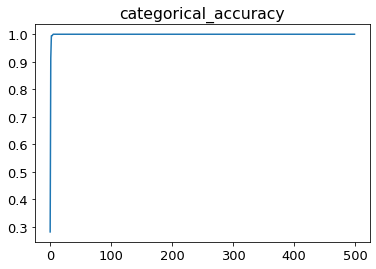

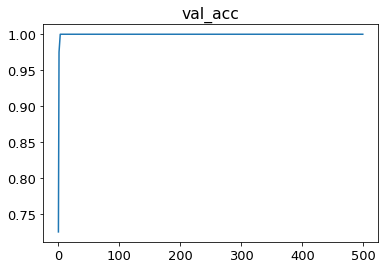

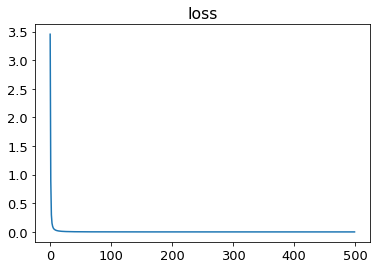

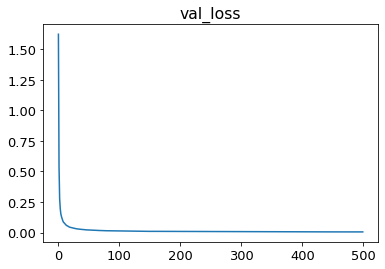

In [62]:
def plotting_history(history, metric):
    
    plt.plot(history.history[metric])
    plt.title(metric)
    plt.show()

    try:
        plt.plot(history.history['val_'+metric])
        plt.title('val_acc')
        plt.show()
    except:
        pass

    try:
        plt.plot(history.history['lr'])
        plt.title('lr')
        plt.show()
    except:
        pass

    plt.plot(history.history['loss'])
    plt.title('loss')
    plt.show()

    try:
        plt.plot(history.history['val_loss'])
        plt.title('val_loss')
        plt.show()
    except:
        pass
plotting_history(history, 'categorical_accuracy')

In [63]:
y_preds = model.predict(X_train)
y_preds

25/25 [==============================] - 0s 2ms/step


array([[6.1609281e-12, 2.6584426e-09, 6.6991368e-09, ..., 7.3662441e-08,
        4.2482581e-10, 3.8336705e-11],
       [3.3507885e-10, 1.0443243e-08, 4.4470039e-11, ..., 7.1051975e-10,
        1.2301232e-11, 5.4737626e-10],
       [1.2399128e-12, 2.7699000e-12, 1.8931448e-13, ..., 1.1619301e-12,
        2.6728014e-11, 8.4809954e-12],
       ...,
       [3.3616011e-08, 5.4913926e-08, 6.2215960e-10, ..., 9.2522079e-09,
        9.6292972e-08, 7.1280115e-09],
       [2.7747996e-07, 2.1125814e-09, 5.6380276e-07, ..., 1.4236452e-06,
        3.5239267e-09, 2.1406144e-04],
       [2.2374680e-10, 9.8805443e-12, 9.3677732e-10, ..., 7.7245704e-10,
        3.1885782e-11, 3.0418129e-12]], dtype=float32)

In [64]:
np.argmax(y_preds[0]) # predicted it correctly

57

In [65]:
class_names = sorted(df['species'].unique())
class_names

['Acer_Capillipes',
 'Acer_Circinatum',
 'Acer_Mono',
 'Acer_Opalus',
 'Acer_Palmatum',
 'Acer_Pictum',
 'Acer_Platanoids',
 'Acer_Rubrum',
 'Acer_Rufinerve',
 'Acer_Saccharinum',
 'Alnus_Cordata',
 'Alnus_Maximowiczii',
 'Alnus_Rubra',
 'Alnus_Sieboldiana',
 'Alnus_Viridis',
 'Arundinaria_Simonii',
 'Betula_Austrosinensis',
 'Betula_Pendula',
 'Callicarpa_Bodinieri',
 'Castanea_Sativa',
 'Celtis_Koraiensis',
 'Cercis_Siliquastrum',
 'Cornus_Chinensis',
 'Cornus_Controversa',
 'Cornus_Macrophylla',
 'Cotinus_Coggygria',
 'Crataegus_Monogyna',
 'Cytisus_Battandieri',
 'Eucalyptus_Glaucescens',
 'Eucalyptus_Neglecta',
 'Eucalyptus_Urnigera',
 'Fagus_Sylvatica',
 'Ginkgo_Biloba',
 'Ilex_Aquifolium',
 'Ilex_Cornuta',
 'Liquidambar_Styraciflua',
 'Liriodendron_Tulipifera',
 'Lithocarpus_Cleistocarpus',
 'Lithocarpus_Edulis',
 'Magnolia_Heptapeta',
 'Magnolia_Salicifolia',
 'Morus_Nigra',
 'Olea_Europaea',
 'Phildelphus',
 'Populus_Adenopoda',
 'Populus_Grandidentata',
 'Populus_Nigra',
 'Pr

In [66]:
def evaluation(model, data, class_names, id_col, label_encoder):
    y_preds = model.predict(data) # predictions are correct by your one_hot just put this array in dataframe
    data_frame = pd.DataFrame(y_preds, columns=class_names)
    predictions = []
    for y_pred in y_preds:
        idx = np.argmax(y_pred)
        label = str(label_encoder.inverse_transform([idx]))
        predictions.append(label)
    data_frame['id'] = id_col
    return data_frame, predictions

In [67]:
model.evaluate(X_train, y_train)

25/25 [==============================] - 0s 3ms/step - loss: 5.1505e-04 - categorical_accuracy: 1.0000


[0.0005150453071109951, 1.0]

In [82]:
model.evaluate(X_testo, y_testo)

7/7 [==============================] - 0s 3ms/step - loss: 0.1088 - categorical_accuracy: 0.9697


[0.10875600576400757, 0.9696969985961914]

## Next few cells of notebook is for Kaggle submission and screen shot for result on kaggle

## After them will see hyperparameters cells

In [69]:
file = open('test.csv', 'rb')
encoder = chardet.detect(file.read(10000))
X_test = pd.read_csv('test.csv', encoding=encoder['encoding'])

X_test

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,4,0.019531,0.009766,0.078125,0.011719,0.003906,0.015625,0.005859,0.000000,0.005859,...,0.006836,0.000000,0.015625,0.000977,0.015625,0.0,0.0,0.000000,0.003906,0.053711
1,7,0.007812,0.005859,0.064453,0.009766,0.003906,0.013672,0.007812,0.000000,0.033203,...,0.000000,0.000000,0.006836,0.001953,0.013672,0.0,0.0,0.000977,0.037109,0.044922
2,9,0.000000,0.000000,0.001953,0.021484,0.041016,0.000000,0.023438,0.000000,0.011719,...,0.128910,0.000000,0.000977,0.000000,0.000000,0.0,0.0,0.015625,0.000000,0.000000
3,12,0.000000,0.000000,0.009766,0.011719,0.017578,0.000000,0.003906,0.000000,0.003906,...,0.012695,0.015625,0.002930,0.036133,0.013672,0.0,0.0,0.089844,0.000000,0.008789
4,13,0.001953,0.000000,0.015625,0.009766,0.039062,0.000000,0.009766,0.000000,0.005859,...,0.000000,0.042969,0.016602,0.010742,0.041016,0.0,0.0,0.007812,0.009766,0.007812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,1576,0.000000,0.000000,0.003906,0.015625,0.041016,0.000000,0.017578,0.000000,0.005859,...,0.098633,0.000000,0.004883,0.000000,0.003906,0.0,0.0,0.018555,0.000000,0.000977
590,1577,0.000000,0.003906,0.003906,0.005859,0.017578,0.000000,0.017578,0.005859,0.000000,...,0.012695,0.004883,0.004883,0.002930,0.009766,0.0,0.0,0.090820,0.000000,0.016602
591,1579,0.017578,0.029297,0.015625,0.013672,0.003906,0.015625,0.025391,0.000000,0.000000,...,0.073242,0.000000,0.028320,0.000000,0.001953,0.0,0.0,0.000000,0.042969,0.006836
592,1580,0.013672,0.009766,0.060547,0.025391,0.035156,0.025391,0.039062,0.000000,0.003906,...,0.003906,0.000000,0.000977,0.000000,0.011719,0.0,0.0,0.000000,0.011719,0.018555


In [70]:
# preprocessing Test Data (dont removeo utliers is Experiment 1&2)
# X_test remove outliers with same IQR (Experiment 3&4)
# for (col, low_item_visability, high_item_visability) in outliers_treatment:
#     # outliers_treatment
#     X_test[col] = np.where(X_test[col] < low_item_visability, low_item_visability, X_test[col])
#     X_test[col] = np.where(X_test[col] > high_item_visability, high_item_visability, X_test[col])
#     print(low_item_visability, high_item_visability)
#     sns.boxplot(x=X_test[col])
#     plt.show()

In [71]:
IQR_remove_cols

[]

In [72]:
test_id = X_test['id']
X_test.drop('id', axis=1, inplace=True)
X_test.drop(IQR_remove_cols, axis=1, inplace=True) # outliers detected remove
X_test.drop(columns_removed, axis=1, inplace=True) # corr detected remove
X_test = std_scale.transform(X_test)
X_test

array([[ 0.12434251, -0.47275232,  1.83458801, ..., -0.52352165,
        -0.36434363,  1.55390286],
       [-0.48237047, -0.57323511,  1.29575298, ..., -0.49818799,
         1.97874845,  1.16199363],
       [-0.88681128, -0.72392073, -1.16747039, ..., -0.11836457,
        -0.63998492, -0.84111779],
       ...,
       [ 0.02323231,  0.02955879, -0.62863535, ..., -0.52352165,
         2.39228095, -0.53629455],
       [-0.1789881 , -0.47275232,  1.14181137, ..., -0.52352165,
         0.18700951, -0.01373405],
       [-0.88681128,  2.29004879, -1.2444412 , ..., -0.11836457,
        -0.63998492, -0.05729933]])

In [73]:
data_frame, predictions = evaluation(model, X_train, class_names, train_id, label_encoder)
data_frame

25/25 [==============================] - 0s 2ms/step


,Acer_Capillipes,Acer_Circinatum,Acer_Mono,Acer_Opalus,Acer_Palmatum,Acer_Pictum,Acer_Platanoids,Acer_Rubrum,Acer_Rufinerve,Acer_Saccharinum,...,Salix_Intergra,Sorbus_Aria,Tilia_Oliveri,Tilia_Platyphyllos,Tilia_Tomentosa,Ulmus_Bergmanniana,Viburnum_Tinus,Viburnum_x_Rhytidophylloides,Zelkova_Serrata,id
0,6.160928e-12,2.658443e-09,6.699137e-09,1.690644e-09,3.909001e-10,4.071744e-12,1.338467e-08,1.476679e-10,2.590115e-11,2.020730e-11,...,4.523015e-10,3.321685e-11,1.902460e-12,3.015780e-12,1.241538e-10,1.999642e-08,7.366244e-08,4.248258e-10,3.833671e-11,1.0
1,3.350789e-10,1.044324e-08,4.447004e-11,1.751770e-10,1.875212e-12,5.743955e-13,2.108683e-09,4.580734e-11,2.366090e-09,9.449302e-10,...,1.733836e-10,5.512102e-12,8.842420e-15,5.851784e-13,7.275625e-09,1.857790e-08,7.105198e-10,1.230123e-11,5.473763e-10,2.0
2,1.239913e-12,2.769900e-12,1.893145e-13,4.096957e-13,2.452244e-09,8.740250e-09,1.462081e-09,7.860672e-11,4.417645e-11,5.262926e-09,...,5.193649e-13,1.791579e-10,4.511661e-08,7.298582e-07,6.699642e-13,1.370343e-11,1.161930e-12,2.672801e-11,8.480995e-12,3.0
3,2.350768e-11,8.379600e-09,1.880421e-09,7.563879e-11,5.585850e-09,1.674916e-09,2.860978e-13,4.113607e-12,3.900595e-12,7.665723e-10,...,4.352524e-12,2.199622e-12,7.127320e-12,3.980148e-11,1.093682e-10,1.693788e-12,1.482378e-08,3.770536e-07,1.330186e-07,NaN
4,2.198675e-11,9.622079e-12,7.219334e-11,7.285839e-12,2.276506e-10,1.633468e-07,7.167997e-13,1.045810e-12,7.742227e-12,8.370314e-10,...,1.039184e-09,2.466021e-13,1.805509e-12,4.512731e-11,4.425023e-12,3.539369e-11,6.864407e-11,6.610791e-09,4.437828e-12,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
787,1.465143e-09,8.495747e-11,1.145193e-12,5.286834e-11,1.131749e-09,1.132549e-08,2.086041e-13,1.412785e-11,2.883343e-10,5.504643e-08,...,2.718225e-13,1.974248e-09,5.991636e-11,1.120563e-09,5.848206e-12,4.819824e-12,2.979783e-13,1.633855e-09,1.039734e-10,1263.0
788,1.074536e-09,1.077652e-09,5.058356e-09,4.296065e-10,4.982404e-09,3.156111e-10,4.734478e-10,3.929063e-11,4.324890e-10,4.663862e-09,...,1.941388e-10,1.140123e-11,5.087424e-12,2.940165e-13,3.247977e-11,1.542649e-10,9.049129e-09,2.285789e-09,2.194751e-10,1265.0
789,3.361601e-08,5.491393e-08,6.221596e-10,1.287703e-10,5.020868e-09,3.760661e-11,5.796442e-07,5.748600e-08,6.432662e-05,8.758562e-09,...,1.991598e-09,7.172667e-06,1.383924e-10,6.650887e-08,2.942175e-08,4.782524e-05,9.252208e-09,9.629297e-08,7.128012e-09,1268.0
790,2.774800e-07,2.112581e-09,5.638028e-07,6.550857e-07,4.758617e-08,1.284772e-08,1.406957e-07,8.942268e-07,3.730425e-08,6.222737e-09,...,1.501217e-08,1.859188e-06,5.738593e-06,5.952185e-07,1.414209e-08,4.905635e-09,1.423645e-06,3.523927e-09,2.140614e-04,1269.0


In [74]:
df_y_ypreds = pd.DataFrame(predictions, columns=['y_preds'])
df_y_ypreds['y'] = y
print('train predictions')
df_y_ypreds

train predictions


,y_preds,y
0,['Quercus_Chrysolepis'],Acer_Opalus
1,['Prunus_Avium'],Pterocarya_Stenoptera
2,['Quercus_Shumardii'],Quercus_Hartwissiana
3,['Cercis_Siliquastrum'],Tilia_Tomentosa
4,['Quercus_Phellos'],Quercus_Variabilis
...,...,...
787,['Quercus_Pontica'],Cytisus_Battandieri
788,['Magnolia_Heptapeta'],Zelkova_Serrata
789,['Alnus_Viridis'],Quercus_Phellos
790,['Quercus_x_Hispanica'],Sorbus_Aria


In [75]:
data_frame, predictions = evaluation(model, X_test, class_names, test_id, label_encoder)
data_frame.to_csv('predictions_of_test.csv', index=False)
data_frame

19/19 [==============================] - 0s 3ms/step


,Acer_Capillipes,Acer_Circinatum,Acer_Mono,Acer_Opalus,Acer_Palmatum,Acer_Pictum,Acer_Platanoids,Acer_Rubrum,Acer_Rufinerve,Acer_Saccharinum,...,Salix_Intergra,Sorbus_Aria,Tilia_Oliveri,Tilia_Platyphyllos,Tilia_Tomentosa,Ulmus_Bergmanniana,Viburnum_Tinus,Viburnum_x_Rhytidophylloides,Zelkova_Serrata,id
0,1.497959e-09,7.969724e-10,1.407552e-12,7.780798e-07,2.210443e-09,1.833899e-09,1.937971e-12,1.783605e-10,8.343474e-10,1.143838e-08,...,1.310880e-07,1.728885e-09,1.056479e-10,7.729017e-10,4.949713e-10,1.878888e-11,1.632374e-13,1.322075e-07,2.436001e-12,4
1,2.515514e-10,1.095454e-10,6.239263e-09,3.993138e-08,2.507355e-11,3.777155e-11,3.257652e-07,3.232425e-10,5.410475e-10,1.271782e-10,...,1.211869e-08,8.248616e-11,1.195217e-12,3.802907e-13,1.100862e-07,6.669653e-09,1.431663e-07,1.652461e-10,6.901346e-10,7
2,9.561415e-08,9.994982e-01,1.982397e-08,2.845717e-10,4.151664e-04,1.662626e-07,3.827558e-09,7.862376e-07,2.323849e-06,6.132424e-07,...,3.379400e-09,1.950595e-08,1.294747e-08,2.714098e-09,6.281754e-09,4.934634e-08,2.118051e-10,4.624471e-08,1.073555e-05,9
3,4.147451e-07,8.460281e-04,9.712634e-08,3.822161e-08,1.939296e-07,1.238528e-08,8.667859e-06,6.504150e-07,1.974195e-05,3.368586e-05,...,1.109898e-07,9.802638e-08,2.219586e-08,2.883728e-07,1.099110e-05,1.348259e-03,8.919720e-08,2.322388e-07,5.802509e-05,12
4,3.139426e-08,1.257355e-08,3.233697e-10,2.484076e-10,2.901650e-09,3.783479e-11,1.227149e-07,6.401764e-09,5.523328e-06,3.386691e-08,...,5.765270e-10,1.479966e-06,4.294677e-10,5.347247e-07,1.085731e-07,2.740834e-05,8.417199e-07,1.108007e-07,4.542681e-10,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,7.552848e-08,9.999713e-01,5.233920e-08,8.297034e-11,4.067370e-06,2.934618e-09,5.545351e-10,1.664741e-07,3.052023e-07,3.995885e-08,...,4.691886e-09,8.660039e-09,7.320061e-09,3.646823e-10,1.928369e-09,1.231235e-07,2.414272e-10,7.460907e-09,8.027545e-06,1576
590,2.100013e-07,4.910267e-08,8.873446e-10,6.099756e-07,3.095360e-09,1.466892e-10,1.297622e-08,1.620530e-05,8.394552e-05,1.329734e-10,...,7.954035e-09,9.279432e-06,2.305864e-09,3.852785e-05,3.937766e-05,6.926912e-08,6.014046e-10,1.581805e-09,5.646033e-06,1577
591,1.382680e-07,3.864031e-09,2.643891e-09,1.234973e-10,3.186928e-07,1.228418e-07,5.107323e-10,1.264350e-08,8.366717e-09,5.407425e-08,...,3.511325e-11,2.049857e-08,1.560142e-08,1.833114e-08,1.054774e-11,9.624197e-12,7.168208e-09,2.430446e-09,6.183149e-07,1579
592,6.808099e-10,2.218836e-10,4.501023e-07,1.294481e-09,9.258746e-09,4.962148e-09,1.668077e-08,2.472138e-07,6.826706e-10,9.541309e-12,...,3.943650e-08,3.832892e-10,9.617591e-08,7.863938e-10,3.968966e-09,8.634002e-09,5.785899e-10,5.848019e-10,3.914151e-10,1580


### Experiment 1 (remove corr cols)

Train_Accuracy = 100%

Test_Accuracy = 92.9%

Kaggle_loss = 0.060

### Experiment 2 (won't remove corr cols)

Train_Accuracy = 100%

Test_Accuracy = 96.96%

Kaggle_loss = 0.029

### Experiment 3 (remove outliers & corr cols)

Train_Accuracy = 100%

Test_Accuracy = 92.9%

Kaggle_loss = 0.079

### Experiment 4 (remove outliers & not corr cols)

Train_Accuracy = 100%

Test_Accuracy = 97.97%

Kaggle_loss = 0.035

**Notes:**
 So best Test Accuracy & Kaggle loss based on Experiments is Not removing outliers + Not removing corr columns !! but correct is remove corr columns mabye its based on dataset

---

Experiment 4

Experiment 3

Experiment 2

Experiment 1
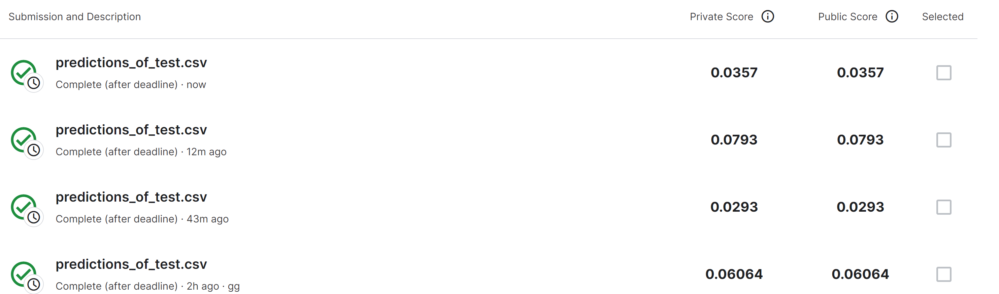

# Baseline Test accuracy = 96.96% so lets change some hyperparameters

* 1) Hidden size
* 2) Optimizer
* 3) Regularization
* 4) Learning rate, Learning rate scheduler

In [85]:
# hidden size
my_dictionary = {}
hidden_units = [64, 128, 256]

for i in range(len(hidden_units)):
    model_hidden, history = training(X_train, y_train, hidden_units=hidden_units[i])
    result = model.evaluate(X_testo, y_testo)
    my_dictionary['model_'+ str(i)] = model_hidden
    my_dictionary['model_acc_'+ str(i)] = result[1]
my_dictionary

Epoch 1/500
23/23 [==============================] - 1s 21ms/step - loss: 4.4559 - categorical_accuracy: 0.0688 - val_loss: 3.9798 - val_categorical_accuracy: 0.1875
Epoch 2/500
23/23 [==============================] - 0s 12ms/step - loss: 3.4961 - categorical_accuracy: 0.2781 - val_loss: 3.2888 - val_categorical_accuracy: 0.2625
Epoch 3/500
23/23 [==============================] - 0s 13ms/step - loss: 2.8412 - categorical_accuracy: 0.4354 - val_loss: 2.7671 - val_categorical_accuracy: 0.4375
Epoch 4/500
23/23 [==============================] - 0s 12ms/step - loss: 2.3324 - categorical_accuracy: 0.5955 - val_loss: 2.3322 - val_categorical_accuracy: 0.5750
Epoch 5/500
23/23 [==============================] - 0s 9ms/step - loss: 1.9232 - categorical_accuracy: 0.7205 - val_loss: 1.9860 - val_categorical_accuracy: 0.6500
Epoch 6/500
23/23 [==============================] - 0s 15ms/step - loss: 1.5883 - categorical_accuracy: 0.8230 - val_loss: 1.6865 - val_categorical_accuracy: 0.7625
Epoch

23/23 [==============================] - 0s 22ms/step - loss: 0.0100 - categorical_accuracy: 1.0000 - val_loss: 0.0612 - val_categorical_accuracy: 1.0000
Epoch 100/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0098 - categorical_accuracy: 1.0000 - val_loss: 0.0612 - val_categorical_accuracy: 1.0000
Epoch 101/500
23/23 [==============================] - 0s 21ms/step - loss: 0.0096 - categorical_accuracy: 1.0000 - val_loss: 0.0600 - val_categorical_accuracy: 1.0000
Epoch 102/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0094 - categorical_accuracy: 1.0000 - val_loss: 0.0595 - val_categorical_accuracy: 1.0000
Epoch 103/500
23/23 [==============================] - 0s 8ms/step - loss: 0.0092 - categorical_accuracy: 1.0000 - val_loss: 0.0597 - val_categorical_accuracy: 1.0000
Epoch 104/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0090 - categorical_accuracy: 1.0000 - val_loss: 0.0585 - val_categorical_accuracy: 1.0000
Epoch 1

Epoch 148/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0041 - categorical_accuracy: 1.0000 - val_loss: 0.0401 - val_categorical_accuracy: 1.0000
Epoch 149/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0040 - categorical_accuracy: 1.0000 - val_loss: 0.0399 - val_categorical_accuracy: 1.0000
Epoch 150/500
23/23 [==============================] - 0s 8ms/step - loss: 0.0040 - categorical_accuracy: 1.0000 - val_loss: 0.0391 - val_categorical_accuracy: 1.0000
Epoch 151/500
23/23 [==============================] - 0s 8ms/step - loss: 0.0039 - categorical_accuracy: 1.0000 - val_loss: 0.0390 - val_categorical_accuracy: 1.0000
Epoch 152/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0038 - categorical_accuracy: 1.0000 - val_loss: 0.0389 - val_categorical_accuracy: 1.0000
Epoch 153/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0038 - categorical_accuracy: 1.0000 - val_loss: 0.0385 - val_categorical_accuracy: 1

Epoch 197/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0020 - categorical_accuracy: 1.0000 - val_loss: 0.0292 - val_categorical_accuracy: 1.0000
Epoch 198/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0019 - categorical_accuracy: 1.0000 - val_loss: 0.0291 - val_categorical_accuracy: 1.0000
Epoch 199/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0019 - categorical_accuracy: 1.0000 - val_loss: 0.0289 - val_categorical_accuracy: 1.0000
Epoch 200/500
23/23 [==============================] - 0s 7ms/step - loss: 0.0019 - categorical_accuracy: 1.0000 - val_loss: 0.0288 - val_categorical_accuracy: 1.0000
Epoch 201/500
23/23 [==============================] - 0s 7ms/step - loss: 0.0019 - categorical_accuracy: 1.0000 - val_loss: 0.0281 - val_categorical_accuracy: 1.0000
Epoch 202/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0018 - categorical_accuracy: 1.0000 - val_loss: 0.0280 - val_categorical_accuracy: 1.

Epoch 246/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0010 - categorical_accuracy: 1.0000 - val_loss: 0.0226 - val_categorical_accuracy: 1.0000
Epoch 247/500
23/23 [==============================] - 0s 10ms/step - loss: 9.9660e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0226 - val_categorical_accuracy: 1.0000
Epoch 248/500
23/23 [==============================] - 0s 13ms/step - loss: 9.8328e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0224 - val_categorical_accuracy: 1.0000
Epoch 249/500
23/23 [==============================] - 0s 10ms/step - loss: 9.7135e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0222 - val_categorical_accuracy: 1.0000
Epoch 250/500
23/23 [==============================] - 0s 16ms/step - loss: 9.5873e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0221 - val_categorical_accuracy: 1.0000
Epoch 251/500
23/23 [==============================] - 1s 23ms/step - loss: 9.4611e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0220 - val_c

Epoch 294/500
23/23 [==============================] - 0s 13ms/step - loss: 5.4814e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0180 - val_categorical_accuracy: 1.0000
Epoch 295/500
23/23 [==============================] - 0s 11ms/step - loss: 5.4146e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0180 - val_categorical_accuracy: 1.0000
Epoch 296/500
23/23 [==============================] - 0s 14ms/step - loss: 5.3433e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0179 - val_categorical_accuracy: 1.0000
Epoch 297/500
23/23 [==============================] - 0s 11ms/step - loss: 5.2765e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0179 - val_categorical_accuracy: 1.0000
Epoch 298/500
23/23 [==============================] - 0s 15ms/step - loss: 5.2096e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0177 - val_categorical_accuracy: 1.0000
Epoch 299/500
23/23 [==============================] - 0s 10ms/step - loss: 5.1520e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0177 - v

Epoch 342/500
23/23 [==============================] - 0s 8ms/step - loss: 3.0321e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0147 - val_categorical_accuracy: 1.0000
Epoch 343/500
23/23 [==============================] - 0s 15ms/step - loss: 2.9961e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0147 - val_categorical_accuracy: 1.0000
Epoch 344/500
23/23 [==============================] - 0s 11ms/step - loss: 2.9589e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0146 - val_categorical_accuracy: 1.0000
Epoch 345/500
23/23 [==============================] - 0s 8ms/step - loss: 2.9235e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - val_categorical_accuracy: 1.0000
Epoch 346/500
23/23 [==============================] - 0s 11ms/step - loss: 2.8874e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0144 - val_categorical_accuracy: 1.0000
Epoch 347/500
23/23 [==============================] - 0s 9ms/step - loss: 2.8533e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - val_

Epoch 390/500
23/23 [==============================] - 0s 15ms/step - loss: 1.6980e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0123 - val_categorical_accuracy: 1.0000
Epoch 391/500
23/23 [==============================] - 0s 15ms/step - loss: 1.6771e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0122 - val_categorical_accuracy: 1.0000
Epoch 392/500
23/23 [==============================] - 0s 9ms/step - loss: 1.6585e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 1.0000
Epoch 393/500
23/23 [==============================] - 0s 11ms/step - loss: 1.6378e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 1.0000
Epoch 394/500
23/23 [==============================] - 0s 16ms/step - loss: 1.6183e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0119 - val_categorical_accuracy: 1.0000
Epoch 395/500
23/23 [==============================] - 0s 11ms/step - loss: 1.5995e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - va

Epoch 438/500
23/23 [==============================] - 0s 11ms/step - loss: 9.5720e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0103 - val_categorical_accuracy: 1.0000
Epoch 439/500
23/23 [==============================] - 0s 10ms/step - loss: 9.4589e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 440/500
23/23 [==============================] - 0s 13ms/step - loss: 9.3528e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 441/500
23/23 [==============================] - 0s 12ms/step - loss: 9.2407e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 442/500
23/23 [==============================] - 0s 14ms/step - loss: 9.1346e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 443/500
23/23 [==============================] - 0s 12ms/step - loss: 9.0218e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - v

Epoch 486/500
23/23 [==============================] - 0s 19ms/step - loss: 5.4237e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 487/500
23/23 [==============================] - 0s 13ms/step - loss: 5.3606e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0088 - val_categorical_accuracy: 1.0000
Epoch 488/500
23/23 [==============================] - 0s 15ms/step - loss: 5.2968e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 489/500
23/23 [==============================] - 0s 10ms/step - loss: 5.2342e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 490/500
23/23 [==============================] - 0s 13ms/step - loss: 5.1752e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0086 - val_categorical_accuracy: 1.0000
Epoch 491/500
23/23 [==============================] - 0s 15ms/step - loss: 5.1146e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - v

23/23 [==============================] - 0s 13ms/step - loss: 0.0018 - categorical_accuracy: 1.0000 - val_loss: 0.0243 - val_categorical_accuracy: 1.0000
Epoch 84/500
23/23 [==============================] - 0s 8ms/step - loss: 0.0018 - categorical_accuracy: 1.0000 - val_loss: 0.0241 - val_categorical_accuracy: 1.0000
Epoch 85/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0018 - categorical_accuracy: 1.0000 - val_loss: 0.0239 - val_categorical_accuracy: 1.0000
Epoch 86/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0017 - categorical_accuracy: 1.0000 - val_loss: 0.0238 - val_categorical_accuracy: 1.0000
Epoch 87/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0017 - categorical_accuracy: 1.0000 - val_loss: 0.0233 - val_categorical_accuracy: 1.0000
Epoch 88/500
23/23 [==============================] - 0s 12ms/step - loss: 0.0017 - categorical_accuracy: 1.0000 - val_loss: 0.0230 - val_categorical_accuracy: 1.0000
Epoch 89/500

Epoch 132/500
23/23 [==============================] - 0s 8ms/step - loss: 8.0891e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0169 - val_categorical_accuracy: 1.0000
Epoch 133/500
23/23 [==============================] - 0s 8ms/step - loss: 7.9600e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0166 - val_categorical_accuracy: 1.0000
Epoch 134/500
23/23 [==============================] - 0s 9ms/step - loss: 7.8411e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0165 - val_categorical_accuracy: 1.0000
Epoch 135/500
23/23 [==============================] - 0s 8ms/step - loss: 7.7222e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0166 - val_categorical_accuracy: 1.0000
Epoch 136/500
23/23 [==============================] - 0s 6ms/step - loss: 7.6096e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0164 - val_categorical_accuracy: 1.0000
Epoch 137/500
23/23 [==============================] - 0s 9ms/step - loss: 7.4960e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0163 - val_cat

Epoch 180/500
23/23 [==============================] - 0s 16ms/step - loss: 4.0715e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0130 - val_categorical_accuracy: 1.0000
Epoch 181/500
23/23 [==============================] - 0s 14ms/step - loss: 4.0196e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0130 - val_categorical_accuracy: 1.0000
Epoch 182/500
23/23 [==============================] - 0s 9ms/step - loss: 3.9647e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0129 - val_categorical_accuracy: 1.0000
Epoch 183/500
23/23 [==============================] - 0s 9ms/step - loss: 3.9114e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0127 - val_categorical_accuracy: 1.0000
Epoch 184/500
23/23 [==============================] - 0s 13ms/step - loss: 3.8570e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0126 - val_categorical_accuracy: 1.0000
Epoch 185/500
23/23 [==============================] - 0s 13ms/step - loss: 3.8062e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0126 - val

Epoch 228/500
23/23 [==============================] - 0s 18ms/step - loss: 2.1672e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 229/500
23/23 [==============================] - 0s 20ms/step - loss: 2.1397e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0101 - val_categorical_accuracy: 1.0000
Epoch 230/500
23/23 [==============================] - 0s 17ms/step - loss: 2.1123e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0101 - val_categorical_accuracy: 1.0000
Epoch 231/500
23/23 [==============================] - 0s 9ms/step - loss: 2.0863e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0100 - val_categorical_accuracy: 1.0000
Epoch 232/500
23/23 [==============================] - 0s 21ms/step - loss: 2.0598e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0099 - val_categorical_accuracy: 1.0000
Epoch 233/500
23/23 [==============================] - 0s 15ms/step - loss: 2.0347e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0099 - va

Epoch 276/500
23/23 [==============================] - 0s 16ms/step - loss: 1.1844e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 277/500
23/23 [==============================] - 0s 19ms/step - loss: 1.1700e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0080 - val_categorical_accuracy: 1.0000
Epoch 278/500
23/23 [==============================] - 0s 16ms/step - loss: 1.1555e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0080 - val_categorical_accuracy: 1.0000
Epoch 279/500
23/23 [==============================] - 0s 11ms/step - loss: 1.1421e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0080 - val_categorical_accuracy: 1.0000
Epoch 280/500
23/23 [==============================] - 0s 13ms/step - loss: 1.1279e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0080 - val_categorical_accuracy: 1.0000
Epoch 281/500
23/23 [==============================] - 0s 8ms/step - loss: 1.1134e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0079 - va

Epoch 324/500
23/23 [==============================] - 0s 10ms/step - loss: 6.5896e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0067 - val_categorical_accuracy: 1.0000
Epoch 325/500
23/23 [==============================] - 0s 10ms/step - loss: 6.5085e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0067 - val_categorical_accuracy: 1.0000
Epoch 326/500
23/23 [==============================] - 0s 9ms/step - loss: 6.4350e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0066 - val_categorical_accuracy: 1.0000
Epoch 327/500
23/23 [==============================] - 0s 15ms/step - loss: 6.3523e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0066 - val_categorical_accuracy: 1.0000
Epoch 328/500
23/23 [==============================] - 0s 11ms/step - loss: 6.2796e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0066 - val_categorical_accuracy: 1.0000
Epoch 329/500
23/23 [==============================] - 0s 16ms/step - loss: 6.2016e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0066 - va

Epoch 372/500
23/23 [==============================] - 0s 16ms/step - loss: 3.6918e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0055 - val_categorical_accuracy: 1.0000
Epoch 373/500
23/23 [==============================] - 0s 14ms/step - loss: 3.6483e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0056 - val_categorical_accuracy: 1.0000
Epoch 374/500
23/23 [==============================] - 0s 10ms/step - loss: 3.6044e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0056 - val_categorical_accuracy: 1.0000
Epoch 375/500
23/23 [==============================] - 1s 25ms/step - loss: 3.5603e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0055 - val_categorical_accuracy: 1.0000
Epoch 376/500
23/23 [==============================] - 0s 17ms/step - loss: 3.5182e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0055 - val_categorical_accuracy: 1.0000
Epoch 377/500
23/23 [==============================] - 0s 16ms/step - loss: 3.4770e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0055 - v

Epoch 420/500
23/23 [==============================] - 0s 18ms/step - loss: 2.0806e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0046 - val_categorical_accuracy: 1.0000
Epoch 421/500
23/23 [==============================] - 0s 11ms/step - loss: 2.0558e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0046 - val_categorical_accuracy: 1.0000
Epoch 422/500
23/23 [==============================] - 0s 17ms/step - loss: 2.0306e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0046 - val_categorical_accuracy: 1.0000
Epoch 423/500
23/23 [==============================] - 0s 20ms/step - loss: 2.0060e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0046 - val_categorical_accuracy: 1.0000
Epoch 424/500
23/23 [==============================] - 0s 9ms/step - loss: 1.9832e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0046 - val_categorical_accuracy: 1.0000
Epoch 425/500
23/23 [==============================] - 0s 14ms/step - loss: 1.9600e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0045 - va

Epoch 468/500
23/23 [==============================] - 0s 8ms/step - loss: 1.1777e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 469/500
23/23 [==============================] - 0s 8ms/step - loss: 1.1635e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 470/500
23/23 [==============================] - 0s 22ms/step - loss: 1.1494e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 471/500
23/23 [==============================] - 0s 15ms/step - loss: 1.1364e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 472/500
23/23 [==============================] - 0s 13ms/step - loss: 1.1225e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 473/500
23/23 [==============================] - 0s 9ms/step - loss: 1.1090e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_

23/23 [==============================] - 0s 13ms/step - loss: 0.0012 - categorical_accuracy: 1.0000 - val_loss: 0.0162 - val_categorical_accuracy: 1.0000
Epoch 65/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0011 - categorical_accuracy: 1.0000 - val_loss: 0.0160 - val_categorical_accuracy: 1.0000
Epoch 66/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0011 - categorical_accuracy: 1.0000 - val_loss: 0.0159 - val_categorical_accuracy: 1.0000
Epoch 67/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0011 - categorical_accuracy: 1.0000 - val_loss: 0.0159 - val_categorical_accuracy: 1.0000
Epoch 68/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0011 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 1.0000
Epoch 69/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0010 - categorical_accuracy: 1.0000 - val_loss: 0.0155 - val_categorical_accuracy: 1.0000
Epoch 70/50

Epoch 160/500
23/23 [==============================] - 0s 17ms/step - loss: 2.4859e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0092 - val_categorical_accuracy: 1.0000
Epoch 161/500
23/23 [==============================] - 0s 14ms/step - loss: 2.4531e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0091 - val_categorical_accuracy: 1.0000
Epoch 162/500
23/23 [==============================] - 0s 16ms/step - loss: 2.4204e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0091 - val_categorical_accuracy: 1.0000
Epoch 163/500
23/23 [==============================] - 0s 20ms/step - loss: 2.3873e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0090 - val_categorical_accuracy: 1.0000
Epoch 164/500
23/23 [==============================] - 0s 19ms/step - loss: 2.3544e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0090 - val_categorical_accuracy: 1.0000
Epoch 165/500
23/23 [==============================] - 0s 15ms/step - loss: 2.3225e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - v

Epoch 255/500
23/23 [==============================] - 0s 13ms/step - loss: 7.3090e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_categorical_accuracy: 1.0000
Epoch 256/500
23/23 [==============================] - 0s 14ms/step - loss: 7.2188e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_categorical_accuracy: 1.0000
Epoch 257/500
23/23 [==============================] - 0s 22ms/step - loss: 7.1293e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_categorical_accuracy: 1.0000
Epoch 258/500
23/23 [==============================] - 1s 23ms/step - loss: 7.0462e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_categorical_accuracy: 1.0000
Epoch 259/500
23/23 [==============================] - 0s 16ms/step - loss: 6.9588e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_categorical_accuracy: 1.0000
Epoch 260/500
23/23 [==============================] - 0s 10ms/step - loss: 6.8745e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - v

Epoch 303/500
23/23 [==============================] - 0s 12ms/step - loss: 4.0526e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - val_categorical_accuracy: 1.0000
Epoch 304/500
23/23 [==============================] - 0s 17ms/step - loss: 4.0060e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - val_categorical_accuracy: 1.0000
Epoch 305/500
23/23 [==============================] - 0s 12ms/step - loss: 3.9568e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0052 - val_categorical_accuracy: 1.0000
Epoch 306/500
23/23 [==============================] - 0s 17ms/step - loss: 3.9100e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0052 - val_categorical_accuracy: 1.0000
Epoch 307/500
23/23 [==============================] - 0s 19ms/step - loss: 3.8630e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0052 - val_categorical_accuracy: 1.0000
Epoch 308/500
23/23 [==============================] - 0s 19ms/step - loss: 3.8169e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0052 - v

Epoch 398/500
23/23 [==============================] - 0s 17ms/step - loss: 1.2940e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 399/500
23/23 [==============================] - 0s 20ms/step - loss: 1.2795e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 400/500
23/23 [==============================] - 0s 12ms/step - loss: 1.2647e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 401/500
23/23 [==============================] - 0s 12ms/step - loss: 1.2502e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 402/500
23/23 [==============================] - 0s 15ms/step - loss: 1.2347e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - val_categorical_accuracy: 1.0000
Epoch 403/500
23/23 [==============================] - 1s 23ms/step - loss: 1.2208e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0038 - v

Epoch 446/500
23/23 [==============================] - 0s 16ms/step - loss: 7.3246e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - val_categorical_accuracy: 1.0000
Epoch 447/500
23/23 [==============================] - 0s 16ms/step - loss: 7.2401e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - val_categorical_accuracy: 1.0000
Epoch 448/500
23/23 [==============================] - 0s 14ms/step - loss: 7.1550e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - val_categorical_accuracy: 1.0000
Epoch 449/500
23/23 [==============================] - 0s 20ms/step - loss: 7.0723e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - val_categorical_accuracy: 1.0000
Epoch 450/500
23/23 [==============================] - 0s 14ms/step - loss: 6.9871e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - val_categorical_accuracy: 1.0000
Epoch 451/500
23/23 [==============================] - 1s 23ms/step - loss: 6.9066e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0033 - v

{'model_0': <keras.engine.functional.Functional at 0x22635b7c100>,
 'model_acc_0': 0.9696969985961914,
 'model_1': <keras.engine.functional.Functional at 0x226355aed00>,
 'model_acc_1': 0.9696969985961914,
 'model_2': <keras.engine.functional.Functional at 0x22643456ee0>,
 'model_acc_2': 0.9696969985961914}

In [86]:
# Optimizer
my_dictionary = {}
sgd_opt = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD")
adam_opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
rms_opt = tf.keras.optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop")
optimizers = [sgd_opt, adam_opt, rms_opt]

for i in range(len(optimizers)):
    model_hidden, history = training(X_train, y_train, opt = optimizers[i])
    result = model.evaluate(X_testo, y_testo)
    my_dictionary['model_'+ str(i)] = model_hidden
    my_dictionary['model_acc_'+ str(i)] = result[1]
my_dictionary

Epoch 1/500
23/23 [==============================] - 1s 39ms/step - loss: 4.8533 - categorical_accuracy: 0.0239 - val_loss: 4.5304 - val_categorical_accuracy: 0.0125
Epoch 2/500
23/23 [==============================] - 1s 22ms/step - loss: 4.2272 - categorical_accuracy: 0.0744 - val_loss: 4.0389 - val_categorical_accuracy: 0.0750
Epoch 3/500
23/23 [==============================] - 1s 27ms/step - loss: 3.6800 - categorical_accuracy: 0.1699 - val_loss: 3.5935 - val_categorical_accuracy: 0.1500
Epoch 4/500
23/23 [==============================] - 1s 27ms/step - loss: 3.1923 - categorical_accuracy: 0.2935 - val_loss: 3.1896 - val_categorical_accuracy: 0.2500
Epoch 5/500
23/23 [==============================] - 1s 24ms/step - loss: 2.7719 - categorical_accuracy: 0.4452 - val_loss: 2.8373 - val_categorical_accuracy: 0.4250
Epoch 6/500
23/23 [==============================] - 1s 24ms/step - loss: 2.4060 - categorical_accuracy: 0.5857 - val_loss: 2.5175 - val_categorical_accuracy: 0.5125
Epoc

23/23 [==============================] - 0s 12ms/step - loss: 0.0647 - categorical_accuracy: 1.0000 - val_loss: 0.1567 - val_categorical_accuracy: 0.9875
Epoch 100/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0640 - categorical_accuracy: 1.0000 - val_loss: 0.1555 - val_categorical_accuracy: 0.9875
Epoch 101/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0632 - categorical_accuracy: 1.0000 - val_loss: 0.1547 - val_categorical_accuracy: 0.9875
Epoch 102/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0625 - categorical_accuracy: 1.0000 - val_loss: 0.1543 - val_categorical_accuracy: 0.9875
Epoch 103/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0617 - categorical_accuracy: 1.0000 - val_loss: 0.1532 - val_categorical_accuracy: 0.9875
Epoch 104/500
23/23 [==============================] - 0s 20ms/step - loss: 0.0610 - categorical_accuracy: 1.0000 - val_loss: 0.1519 - val_categorical_accuracy: 0.9875
Epoch 

Epoch 148/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0409 - categorical_accuracy: 1.0000 - val_loss: 0.1191 - val_categorical_accuracy: 0.9875
Epoch 149/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0406 - categorical_accuracy: 1.0000 - val_loss: 0.1183 - val_categorical_accuracy: 0.9875
Epoch 150/500
23/23 [==============================] - 1s 24ms/step - loss: 0.0403 - categorical_accuracy: 1.0000 - val_loss: 0.1179 - val_categorical_accuracy: 0.9875
Epoch 151/500
23/23 [==============================] - 0s 22ms/step - loss: 0.0400 - categorical_accuracy: 1.0000 - val_loss: 0.1174 - val_categorical_accuracy: 0.9875
Epoch 152/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0397 - categorical_accuracy: 1.0000 - val_loss: 0.1169 - val_categorical_accuracy: 0.9875
Epoch 153/500
23/23 [==============================] - 0s 20ms/step - loss: 0.0394 - categorical_accuracy: 1.0000 - val_loss: 0.1164 - val_categorical_accuracy:

Epoch 197/500
23/23 [==============================] - 0s 21ms/step - loss: 0.0299 - categorical_accuracy: 1.0000 - val_loss: 0.0985 - val_categorical_accuracy: 0.9875
Epoch 198/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0297 - categorical_accuracy: 1.0000 - val_loss: 0.0981 - val_categorical_accuracy: 0.9875
Epoch 199/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0295 - categorical_accuracy: 1.0000 - val_loss: 0.0979 - val_categorical_accuracy: 0.9875
Epoch 200/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0294 - categorical_accuracy: 1.0000 - val_loss: 0.0976 - val_categorical_accuracy: 0.9875
Epoch 201/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0292 - categorical_accuracy: 1.0000 - val_loss: 0.0974 - val_categorical_accuracy: 0.9875
Epoch 202/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0291 - categorical_accuracy: 1.0000 - val_loss: 0.0971 - val_categorical_accuracy:

Epoch 246/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0235 - categorical_accuracy: 1.0000 - val_loss: 0.0864 - val_categorical_accuracy: 0.9875
Epoch 247/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0234 - categorical_accuracy: 1.0000 - val_loss: 0.0861 - val_categorical_accuracy: 0.9875
Epoch 248/500
23/23 [==============================] - 0s 21ms/step - loss: 0.0233 - categorical_accuracy: 1.0000 - val_loss: 0.0859 - val_categorical_accuracy: 0.9875
Epoch 249/500
23/23 [==============================] - 1s 26ms/step - loss: 0.0232 - categorical_accuracy: 1.0000 - val_loss: 0.0857 - val_categorical_accuracy: 0.9875
Epoch 250/500
23/23 [==============================] - 1s 23ms/step - loss: 0.0231 - categorical_accuracy: 1.0000 - val_loss: 0.0856 - val_categorical_accuracy: 0.9875
Epoch 251/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0230 - categorical_accuracy: 1.0000 - val_loss: 0.0854 - val_categorical_accuracy:

Epoch 295/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0194 - categorical_accuracy: 1.0000 - val_loss: 0.0776 - val_categorical_accuracy: 0.9875
Epoch 296/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0193 - categorical_accuracy: 1.0000 - val_loss: 0.0774 - val_categorical_accuracy: 0.9875
Epoch 297/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0192 - categorical_accuracy: 1.0000 - val_loss: 0.0773 - val_categorical_accuracy: 0.9875
Epoch 298/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0192 - categorical_accuracy: 1.0000 - val_loss: 0.0772 - val_categorical_accuracy: 0.9875
Epoch 299/500
23/23 [==============================] - 1s 23ms/step - loss: 0.0191 - categorical_accuracy: 1.0000 - val_loss: 0.0770 - val_categorical_accuracy: 0.9875
Epoch 300/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0190 - categorical_accuracy: 1.0000 - val_loss: 0.0769 - val_categorical_accuracy:

Epoch 344/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0165 - categorical_accuracy: 1.0000 - val_loss: 0.0714 - val_categorical_accuracy: 0.9875
Epoch 345/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0164 - categorical_accuracy: 1.0000 - val_loss: 0.0713 - val_categorical_accuracy: 0.9875
Epoch 346/500
23/23 [==============================] - 0s 12ms/step - loss: 0.0164 - categorical_accuracy: 1.0000 - val_loss: 0.0712 - val_categorical_accuracy: 0.9875
Epoch 347/500
23/23 [==============================] - 0s 20ms/step - loss: 0.0163 - categorical_accuracy: 1.0000 - val_loss: 0.0711 - val_categorical_accuracy: 0.9875
Epoch 348/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0163 - categorical_accuracy: 1.0000 - val_loss: 0.0710 - val_categorical_accuracy: 0.9875
Epoch 349/500
23/23 [==============================] - 0s 12ms/step - loss: 0.0162 - categorical_accuracy: 1.0000 - val_loss: 0.0709 - val_categorical_accuracy:

Epoch 393/500
23/23 [==============================] - 0s 18ms/step - loss: 0.0143 - categorical_accuracy: 1.0000 - val_loss: 0.0664 - val_categorical_accuracy: 0.9875
Epoch 394/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0143 - categorical_accuracy: 1.0000 - val_loss: 0.0663 - val_categorical_accuracy: 0.9875
Epoch 395/500
23/23 [==============================] - 0s 19ms/step - loss: 0.0143 - categorical_accuracy: 1.0000 - val_loss: 0.0663 - val_categorical_accuracy: 0.9875
Epoch 396/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0142 - categorical_accuracy: 1.0000 - val_loss: 0.0661 - val_categorical_accuracy: 0.9875
Epoch 397/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0142 - categorical_accuracy: 1.0000 - val_loss: 0.0660 - val_categorical_accuracy: 0.9875
Epoch 398/500
23/23 [==============================] - 1s 26ms/step - loss: 0.0142 - categorical_accuracy: 1.0000 - val_loss: 0.0660 - val_categorical_accuracy:

Epoch 442/500
23/23 [==============================] - 0s 14ms/step - loss: 0.0127 - categorical_accuracy: 1.0000 - val_loss: 0.0625 - val_categorical_accuracy: 0.9875
Epoch 443/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0127 - categorical_accuracy: 1.0000 - val_loss: 0.0624 - val_categorical_accuracy: 0.9875
Epoch 444/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0126 - categorical_accuracy: 1.0000 - val_loss: 0.0624 - val_categorical_accuracy: 0.9875
Epoch 445/500
23/23 [==============================] - 1s 23ms/step - loss: 0.0126 - categorical_accuracy: 1.0000 - val_loss: 0.0623 - val_categorical_accuracy: 0.9875
Epoch 446/500
23/23 [==============================] - 0s 16ms/step - loss: 0.0126 - categorical_accuracy: 1.0000 - val_loss: 0.0622 - val_categorical_accuracy: 0.9875
Epoch 447/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0125 - categorical_accuracy: 1.0000 - val_loss: 0.0621 - val_categorical_accuracy:

Epoch 491/500
23/23 [==============================] - 0s 21ms/step - loss: 0.0114 - categorical_accuracy: 1.0000 - val_loss: 0.0593 - val_categorical_accuracy: 0.9875
Epoch 492/500
23/23 [==============================] - 1s 24ms/step - loss: 0.0114 - categorical_accuracy: 1.0000 - val_loss: 0.0592 - val_categorical_accuracy: 0.9875
Epoch 493/500
23/23 [==============================] - 0s 20ms/step - loss: 0.0113 - categorical_accuracy: 1.0000 - val_loss: 0.0592 - val_categorical_accuracy: 0.9875
Epoch 494/500
23/23 [==============================] - 0s 20ms/step - loss: 0.0113 - categorical_accuracy: 1.0000 - val_loss: 0.0591 - val_categorical_accuracy: 0.9875
Epoch 495/500
23/23 [==============================] - 0s 17ms/step - loss: 0.0113 - categorical_accuracy: 1.0000 - val_loss: 0.0591 - val_categorical_accuracy: 0.9875
Epoch 496/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0113 - categorical_accuracy: 1.0000 - val_loss: 0.0590 - val_categorical_accuracy:

Epoch 88/500
23/23 [==============================] - 1s 23ms/step - loss: 8.2242e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0192 - val_categorical_accuracy: 0.9875
Epoch 89/500
23/23 [==============================] - 0s 16ms/step - loss: 8.0557e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0190 - val_categorical_accuracy: 0.9875
Epoch 90/500
23/23 [==============================] - 0s 21ms/step - loss: 7.8869e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0189 - val_categorical_accuracy: 0.9875
Epoch 91/500
23/23 [==============================] - 0s 15ms/step - loss: 7.7169e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0185 - val_categorical_accuracy: 0.9875
Epoch 92/500
23/23 [==============================] - 0s 16ms/step - loss: 7.5589e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0182 - val_categorical_accuracy: 0.9875
Epoch 93/500
23/23 [==============================] - 0s 16ms/step - loss: 7.4000e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0181 - val_cat

Epoch 136/500
23/23 [==============================] - 0s 21ms/step - loss: 3.3356e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0157 - val_categorical_accuracy: 0.9875
Epoch 137/500
23/23 [==============================] - 0s 17ms/step - loss: 3.2822e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0157 - val_categorical_accuracy: 0.9875
Epoch 138/500
23/23 [==============================] - 1s 22ms/step - loss: 3.2290e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0155 - val_categorical_accuracy: 0.9875
Epoch 139/500
23/23 [==============================] - 0s 20ms/step - loss: 3.1760e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0154 - val_categorical_accuracy: 0.9875
Epoch 140/500
23/23 [==============================] - 1s 25ms/step - loss: 3.1258e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0157 - val_categorical_accuracy: 0.9875
Epoch 141/500
23/23 [==============================] - 1s 25ms/step - loss: 3.0756e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0158 - v

Epoch 231/500
23/23 [==============================] - 0s 18ms/step - loss: 8.4442e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0133 - val_categorical_accuracy: 0.9875
Epoch 232/500
23/23 [==============================] - 0s 18ms/step - loss: 8.3385e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - val_categorical_accuracy: 0.9875
Epoch 233/500
23/23 [==============================] - 0s 17ms/step - loss: 8.2271e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - val_categorical_accuracy: 0.9875
Epoch 234/500
23/23 [==============================] - 0s 15ms/step - loss: 8.1193e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0131 - val_categorical_accuracy: 0.9875
Epoch 235/500
23/23 [==============================] - 0s 21ms/step - loss: 8.0161e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0133 - val_categorical_accuracy: 0.9875
Epoch 236/500
23/23 [==============================] - 0s 18ms/step - loss: 7.9152e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - v

Epoch 326/500
23/23 [==============================] - 0s 16ms/step - loss: 2.5479e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 0.9875
Epoch 327/500
23/23 [==============================] - 0s 19ms/step - loss: 2.5180e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 0.9875
Epoch 328/500
23/23 [==============================] - 0s 20ms/step - loss: 2.4864e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 0.9875
Epoch 329/500
23/23 [==============================] - 0s 17ms/step - loss: 2.4569e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 0.9875
Epoch 330/500
23/23 [==============================] - 1s 24ms/step - loss: 2.4265e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 0.9875
Epoch 331/500
23/23 [==============================] - 0s 20ms/step - loss: 2.3976e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - v

Epoch 421/500
23/23 [==============================] - 0s 12ms/step - loss: 8.0920e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0114 - val_categorical_accuracy: 0.9875
Epoch 422/500
23/23 [==============================] - 0s 10ms/step - loss: 7.9932e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0114 - val_categorical_accuracy: 0.9875
Epoch 423/500
23/23 [==============================] - 0s 10ms/step - loss: 7.8996e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0115 - val_categorical_accuracy: 0.9875
Epoch 424/500
23/23 [==============================] - 0s 10ms/step - loss: 7.8035e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0115 - val_categorical_accuracy: 0.9875
Epoch 425/500
23/23 [==============================] - 0s 10ms/step - loss: 7.7171e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0114 - val_categorical_accuracy: 0.9875
Epoch 426/500
23/23 [==============================] - 0s 11ms/step - loss: 7.6334e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0113 - v

Epoch 469/500
23/23 [==============================] - 0s 21ms/step - loss: 4.5703e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 0.9875
Epoch 470/500
23/23 [==============================] - 0s 19ms/step - loss: 4.5134e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 0.9875
Epoch 471/500
23/23 [==============================] - 1s 35ms/step - loss: 4.4591e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 0.9875
Epoch 472/500
23/23 [==============================] - 0s 17ms/step - loss: 4.4094e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0110 - val_categorical_accuracy: 0.9875
Epoch 473/500
23/23 [==============================] - 0s 15ms/step - loss: 4.3530e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0110 - val_categorical_accuracy: 0.9875
Epoch 474/500
23/23 [==============================] - 0s 22ms/step - loss: 4.3071e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0110 - v

Epoch 64/500
23/23 [==============================] - 0s 20ms/step - loss: 8.4552e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0167 - val_categorical_accuracy: 0.9875
Epoch 65/500
23/23 [==============================] - 0s 17ms/step - loss: 8.2208e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0167 - val_categorical_accuracy: 0.9875
Epoch 66/500
23/23 [==============================] - 0s 21ms/step - loss: 8.0533e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0169 - val_categorical_accuracy: 0.9875
Epoch 67/500
23/23 [==============================] - 0s 20ms/step - loss: 7.7687e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0169 - val_categorical_accuracy: 0.9875
Epoch 68/500
23/23 [==============================] - 1s 23ms/step - loss: 7.4673e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0169 - val_categorical_accuracy: 0.9875
Epoch 69/500
23/23 [==============================] - 0s 18ms/step - loss: 7.5008e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0178 - val_cat

Epoch 112/500
23/23 [==============================] - 0s 17ms/step - loss: 3.5160e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0137 - val_categorical_accuracy: 0.9875
Epoch 113/500
23/23 [==============================] - 0s 18ms/step - loss: 3.5662e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0137 - val_categorical_accuracy: 0.9875
Epoch 114/500
23/23 [==============================] - 0s 20ms/step - loss: 3.4490e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0137 - val_categorical_accuracy: 0.9875
Epoch 115/500
23/23 [==============================] - 0s 21ms/step - loss: 3.5495e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0137 - val_categorical_accuracy: 0.9875
Epoch 116/500
23/23 [==============================] - 0s 22ms/step - loss: 3.3653e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0136 - val_categorical_accuracy: 0.9875
Epoch 117/500
23/23 [==============================] - 0s 21ms/step - loss: 3.5495e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0136 - v

Epoch 207/500
23/23 [==============================] - 0s 15ms/step - loss: 2.2268e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0146 - val_categorical_accuracy: 0.9875
Epoch 208/500
23/23 [==============================] - 0s 16ms/step - loss: 2.1933e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0146 - val_categorical_accuracy: 0.9875
Epoch 209/500
23/23 [==============================] - 0s 19ms/step - loss: 2.2603e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0146 - val_categorical_accuracy: 0.9875
Epoch 210/500
23/23 [==============================] - 1s 27ms/step - loss: 2.3440e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0146 - val_categorical_accuracy: 0.9875
Epoch 211/500
23/23 [==============================] - 1s 24ms/step - loss: 2.1933e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - val_categorical_accuracy: 0.9875
Epoch 212/500
23/23 [==============================] - 1s 22ms/step - loss: 2.3607e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - v

Epoch 302/500
23/23 [==============================] - 1s 25ms/step - loss: 2.3105e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0150 - val_categorical_accuracy: 0.9875
Epoch 303/500
23/23 [==============================] - 0s 20ms/step - loss: 2.2938e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0151 - val_categorical_accuracy: 0.9875
Epoch 304/500
23/23 [==============================] - 0s 17ms/step - loss: 2.1263e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0149 - val_categorical_accuracy: 0.9875
Epoch 305/500
23/23 [==============================] - 0s 16ms/step - loss: 2.2770e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0150 - val_categorical_accuracy: 0.9875
Epoch 306/500
23/23 [==============================] - 0s 18ms/step - loss: 2.4110e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0150 - val_categorical_accuracy: 0.9875
Epoch 307/500
23/23 [==============================] - 0s 21ms/step - loss: 2.2603e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0151 - v

Epoch 397/500
23/23 [==============================] - 0s 17ms/step - loss: 2.3440e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 0.9875
Epoch 398/500
23/23 [==============================] - 0s 18ms/step - loss: 2.2938e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 0.9875
Epoch 399/500
23/23 [==============================] - 0s 16ms/step - loss: 2.3607e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 0.9875
Epoch 400/500
23/23 [==============================] - 0s 17ms/step - loss: 2.3105e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 0.9875
Epoch 401/500
23/23 [==============================] - 0s 17ms/step - loss: 2.2603e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 0.9875
Epoch 402/500
23/23 [==============================] - 0s 16ms/step - loss: 2.1598e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - v

Epoch 492/500
23/23 [==============================] - 0s 16ms/step - loss: 2.3105e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0162 - val_categorical_accuracy: 0.9875
Epoch 493/500
23/23 [==============================] - 0s 14ms/step - loss: 2.2603e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0161 - val_categorical_accuracy: 0.9875
Epoch 494/500
23/23 [==============================] - 1s 23ms/step - loss: 2.3105e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0162 - val_categorical_accuracy: 0.9875
Epoch 495/500
23/23 [==============================] - 0s 15ms/step - loss: 2.2938e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0161 - val_categorical_accuracy: 0.9875
Epoch 496/500
23/23 [==============================] - 0s 17ms/step - loss: 2.2435e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0162 - val_categorical_accuracy: 0.9875
Epoch 497/500
23/23 [==============================] - 0s 15ms/step - loss: 2.4612e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0161 - v

{'model_0': <keras.engine.functional.Functional at 0x226354e2040>,
 'model_acc_0': 0.9696969985961914,
 'model_1': <keras.engine.functional.Functional at 0x226449b6460>,
 'model_acc_1': 0.9696969985961914,
 'model_2': <keras.engine.functional.Functional at 0x22645cf6790>,
 'model_acc_2': 0.9696969985961914}

In [90]:
# Regularizer
my_dictionary = {}
weight_decay = [1e-4, 3e-4, 1e-5]

for i in range(len(weight_decay)):
    args_dict = {'kernel_regularizer': tf.keras.regularizers.l2(weight_decay[i])}
    model_hidden, history = training(X_train, y_train, args=args_dict) # lambda
    result = model.evaluate(X_testo, y_testo)
    my_dictionary['model_'+ str(i)] = model_hidden
    my_dictionary['model_acc_'+ str(i)] = result[1]
my_dictionary

Epoch 1/500
23/23 [==============================] - 1s 16ms/step - loss: 3.6515 - categorical_accuracy: 0.2978 - val_loss: 2.0737 - val_categorical_accuracy: 0.6500
Epoch 2/500
23/23 [==============================] - 0s 13ms/step - loss: 1.0662 - categorical_accuracy: 0.9101 - val_loss: 0.7961 - val_categorical_accuracy: 0.9500
Epoch 3/500
23/23 [==============================] - 0s 12ms/step - loss: 0.4386 - categorical_accuracy: 0.9888 - val_loss: 0.4506 - val_categorical_accuracy: 0.9875
Epoch 4/500
23/23 [==============================] - 0s 11ms/step - loss: 0.2827 - categorical_accuracy: 0.9986 - val_loss: 0.3734 - val_categorical_accuracy: 0.9750
Epoch 5/500
23/23 [==============================] - 0s 12ms/step - loss: 0.2279 - categorical_accuracy: 1.0000 - val_loss: 0.3234 - val_categorical_accuracy: 0.9875
Epoch 6/500
23/23 [==============================] - 0s 12ms/step - loss: 0.1999 - categorical_accuracy: 1.0000 - val_loss: 0.2940 - val_categorical_accuracy: 0.9875
Epoc

23/23 [==============================] - 0s 11ms/step - loss: 0.0627 - categorical_accuracy: 1.0000 - val_loss: 0.0914 - val_categorical_accuracy: 1.0000
Epoch 100/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0619 - categorical_accuracy: 1.0000 - val_loss: 0.0913 - val_categorical_accuracy: 1.0000
Epoch 101/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0611 - categorical_accuracy: 1.0000 - val_loss: 0.0908 - val_categorical_accuracy: 1.0000
Epoch 102/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0604 - categorical_accuracy: 1.0000 - val_loss: 0.0896 - val_categorical_accuracy: 1.0000
Epoch 103/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0597 - categorical_accuracy: 1.0000 - val_loss: 0.0887 - val_categorical_accuracy: 1.0000
Epoch 104/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0590 - categorical_accuracy: 1.0000 - val_loss: 0.0873 - val_categorical_accuracy: 1.0000
Epoch 

Epoch 148/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0376 - categorical_accuracy: 1.0000 - val_loss: 0.0629 - val_categorical_accuracy: 1.0000
Epoch 149/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0374 - categorical_accuracy: 1.0000 - val_loss: 0.0619 - val_categorical_accuracy: 1.0000
Epoch 150/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0370 - categorical_accuracy: 1.0000 - val_loss: 0.0628 - val_categorical_accuracy: 1.0000
Epoch 151/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0368 - categorical_accuracy: 1.0000 - val_loss: 0.0611 - val_categorical_accuracy: 1.0000
Epoch 152/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0365 - categorical_accuracy: 1.0000 - val_loss: 0.0612 - val_categorical_accuracy: 1.0000
Epoch 153/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0362 - categorical_accuracy: 1.0000 - val_loss: 0.0614 - val_categorical_accuracy:

Epoch 197/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0309 - categorical_accuracy: 1.0000 - val_loss: 0.0521 - val_categorical_accuracy: 1.0000
Epoch 198/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0308 - categorical_accuracy: 1.0000 - val_loss: 0.0517 - val_categorical_accuracy: 1.0000
Epoch 199/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0307 - categorical_accuracy: 1.0000 - val_loss: 0.0509 - val_categorical_accuracy: 1.0000
Epoch 200/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0306 - categorical_accuracy: 1.0000 - val_loss: 0.0524 - val_categorical_accuracy: 1.0000
Epoch 201/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0304 - categorical_accuracy: 1.0000 - val_loss: 0.0504 - val_categorical_accuracy: 1.0000
Epoch 202/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0303 - categorical_accuracy: 1.0000 - val_loss: 0.0509 - val_categorical_accuracy: 

Epoch 246/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0276 - categorical_accuracy: 1.0000 - val_loss: 0.0473 - val_categorical_accuracy: 1.0000
Epoch 247/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0276 - categorical_accuracy: 1.0000 - val_loss: 0.0477 - val_categorical_accuracy: 1.0000
Epoch 248/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0275 - categorical_accuracy: 1.0000 - val_loss: 0.0488 - val_categorical_accuracy: 1.0000
Epoch 249/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0275 - categorical_accuracy: 1.0000 - val_loss: 0.0472 - val_categorical_accuracy: 1.0000
Epoch 250/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0275 - categorical_accuracy: 1.0000 - val_loss: 0.0478 - val_categorical_accuracy: 1.0000
Epoch 251/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0274 - categorical_accuracy: 1.0000 - val_loss: 0.0476 - val_categorical_accuracy: 1.000

Epoch 295/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0467 - val_categorical_accuracy: 1.0000
Epoch 296/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0460 - val_categorical_accuracy: 1.0000
Epoch 297/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0456 - val_categorical_accuracy: 1.0000
Epoch 298/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0268 - categorical_accuracy: 1.0000 - val_loss: 0.0474 - val_categorical_accuracy: 1.0000
Epoch 299/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0266 - categorical_accuracy: 1.0000 - val_loss: 0.0471 - val_categorical_accuracy: 1.0000
Epoch 300/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0465 - val_categorical_accuracy: 1

Epoch 344/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0320 - categorical_accuracy: 1.0000 - val_loss: 0.0548 - val_categorical_accuracy: 1.0000
Epoch 345/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0316 - categorical_accuracy: 1.0000 - val_loss: 0.0501 - val_categorical_accuracy: 1.0000
Epoch 346/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0313 - categorical_accuracy: 1.0000 - val_loss: 0.0506 - val_categorical_accuracy: 1.0000
Epoch 347/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0310 - categorical_accuracy: 1.0000 - val_loss: 0.0510 - val_categorical_accuracy: 1.0000
Epoch 348/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0308 - categorical_accuracy: 1.0000 - val_loss: 0.0521 - val_categorical_accuracy: 1.0000
Epoch 349/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0305 - categorical_accuracy: 1.0000 - val_loss: 0.0513 - val_categorical_accuracy: 1.

Epoch 393/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0448 - val_categorical_accuracy: 1.0000
Epoch 394/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0457 - val_categorical_accuracy: 1.0000
Epoch 395/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0266 - categorical_accuracy: 1.0000 - val_loss: 0.0447 - val_categorical_accuracy: 1.0000
Epoch 396/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0265 - categorical_accuracy: 1.0000 - val_loss: 0.0455 - val_categorical_accuracy: 1.0000
Epoch 397/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0266 - categorical_accuracy: 1.0000 - val_loss: 0.0446 - val_categorical_accuracy: 1.0000
Epoch 398/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0267 - categorical_accuracy: 1.0000 - val_loss: 0.0466 - val_categorical_accuracy: 1

Epoch 442/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0265 - categorical_accuracy: 1.0000 - val_loss: 0.0424 - val_categorical_accuracy: 1.0000
Epoch 443/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0265 - categorical_accuracy: 1.0000 - val_loss: 0.0484 - val_categorical_accuracy: 1.0000
Epoch 444/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0264 - categorical_accuracy: 1.0000 - val_loss: 0.0443 - val_categorical_accuracy: 1.0000
Epoch 445/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0264 - categorical_accuracy: 1.0000 - val_loss: 0.0461 - val_categorical_accuracy: 1.0000
Epoch 446/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0264 - categorical_accuracy: 1.0000 - val_loss: 0.0414 - val_categorical_accuracy: 1.0000
Epoch 447/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0264 - categorical_accuracy: 1.0000 - val_loss: 0.0445 - val_categorical_accuracy: 1.0

Epoch 491/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0286 - categorical_accuracy: 1.0000 - val_loss: 0.0435 - val_categorical_accuracy: 1.0000
Epoch 492/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0283 - categorical_accuracy: 1.0000 - val_loss: 0.0431 - val_categorical_accuracy: 1.0000
Epoch 493/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0280 - categorical_accuracy: 1.0000 - val_loss: 0.0439 - val_categorical_accuracy: 1.0000
Epoch 494/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0278 - categorical_accuracy: 1.0000 - val_loss: 0.0440 - val_categorical_accuracy: 1.0000
Epoch 495/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0276 - categorical_accuracy: 1.0000 - val_loss: 0.0445 - val_categorical_accuracy: 1.0000
Epoch 496/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0274 - categorical_accuracy: 1.0000 - val_loss: 0.0445 - val_categorical_accuracy: 1.

23/23 [==============================] - 0s 10ms/step - loss: 0.0779 - categorical_accuracy: 1.0000 - val_loss: 0.1100 - val_categorical_accuracy: 1.0000
Epoch 89/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0777 - categorical_accuracy: 1.0000 - val_loss: 0.1068 - val_categorical_accuracy: 1.0000
Epoch 90/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0774 - categorical_accuracy: 1.0000 - val_loss: 0.1148 - val_categorical_accuracy: 0.9875
Epoch 91/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0771 - categorical_accuracy: 1.0000 - val_loss: 0.1081 - val_categorical_accuracy: 1.0000
Epoch 92/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0770 - categorical_accuracy: 1.0000 - val_loss: 0.1136 - val_categorical_accuracy: 0.9875
Epoch 93/500
23/23 [==============================] - 0s 13ms/step - loss: 0.0768 - categorical_accuracy: 1.0000 - val_loss: 0.1251 - val_categorical_accuracy: 0.9875
Epoch 94/500

23/23 [==============================] - 0s 9ms/step - loss: 0.0680 - categorical_accuracy: 1.0000 - val_loss: 0.0963 - val_categorical_accuracy: 1.0000
Epoch 187/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0678 - categorical_accuracy: 1.0000 - val_loss: 0.0959 - val_categorical_accuracy: 1.0000
Epoch 188/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0682 - categorical_accuracy: 1.0000 - val_loss: 0.1314 - val_categorical_accuracy: 0.9875
Epoch 189/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0699 - categorical_accuracy: 0.9986 - val_loss: 0.1510 - val_categorical_accuracy: 0.9875
Epoch 190/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0691 - categorical_accuracy: 1.0000 - val_loss: 0.0973 - val_categorical_accuracy: 1.0000
Epoch 191/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0685 - categorical_accuracy: 1.0000 - val_loss: 0.0953 - val_categorical_accuracy: 1.0000
Epoch 192/5

23/23 [==============================] - 0s 9ms/step - loss: 0.0840 - categorical_accuracy: 0.9986 - val_loss: 0.2477 - val_categorical_accuracy: 0.9875
Epoch 236/500
23/23 [==============================] - 0s 9ms/step - loss: 0.1368 - categorical_accuracy: 0.9874 - val_loss: 0.1803 - val_categorical_accuracy: 0.9875
Epoch 237/500
23/23 [==============================] - 0s 11ms/step - loss: 0.1120 - categorical_accuracy: 0.9944 - val_loss: 0.1131 - val_categorical_accuracy: 1.0000
Epoch 238/500
23/23 [==============================] - 0s 15ms/step - loss: 0.0911 - categorical_accuracy: 1.0000 - val_loss: 0.1107 - val_categorical_accuracy: 1.0000
Epoch 239/500
23/23 [==============================] - 0s 12ms/step - loss: 0.0866 - categorical_accuracy: 1.0000 - val_loss: 0.1089 - val_categorical_accuracy: 1.0000
Epoch 240/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0843 - categorical_accuracy: 0.9986 - val_loss: 0.1011 - val_categorical_accuracy: 1.0000
Epoch 24

Epoch 284/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0807 - categorical_accuracy: 0.9972 - val_loss: 0.0993 - val_categorical_accuracy: 1.0000
Epoch 285/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0713 - categorical_accuracy: 1.0000 - val_loss: 0.0975 - val_categorical_accuracy: 1.0000
Epoch 286/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0699 - categorical_accuracy: 1.0000 - val_loss: 0.0936 - val_categorical_accuracy: 1.0000
Epoch 287/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0688 - categorical_accuracy: 1.0000 - val_loss: 0.0954 - val_categorical_accuracy: 1.0000
Epoch 288/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0680 - categorical_accuracy: 1.0000 - val_loss: 0.0950 - val_categorical_accuracy: 1.0000
Epoch 289/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0679 - categorical_accuracy: 1.0000 - val_loss: 0.0952 - val_categorical_accuracy: 1.00

Epoch 333/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0667 - categorical_accuracy: 1.0000 - val_loss: 0.0961 - val_categorical_accuracy: 1.0000
Epoch 334/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0666 - categorical_accuracy: 1.0000 - val_loss: 0.0917 - val_categorical_accuracy: 1.0000
Epoch 335/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0684 - categorical_accuracy: 1.0000 - val_loss: 0.2257 - val_categorical_accuracy: 0.9625
Epoch 336/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0693 - categorical_accuracy: 1.0000 - val_loss: 0.1004 - val_categorical_accuracy: 1.0000
Epoch 337/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0683 - categorical_accuracy: 1.0000 - val_loss: 0.0942 - val_categorical_accuracy: 1.0000
Epoch 338/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0673 - categorical_accuracy: 1.0000 - val_loss: 0.0993 - val_categorical_accuracy: 1.0

Epoch 382/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0670 - categorical_accuracy: 1.0000 - val_loss: 0.0954 - val_categorical_accuracy: 1.0000
Epoch 383/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0670 - categorical_accuracy: 1.0000 - val_loss: 0.1126 - val_categorical_accuracy: 0.9875
Epoch 384/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0700 - categorical_accuracy: 0.9986 - val_loss: 0.0976 - val_categorical_accuracy: 1.0000
Epoch 385/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0681 - categorical_accuracy: 1.0000 - val_loss: 0.0898 - val_categorical_accuracy: 1.0000
Epoch 386/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0679 - categorical_accuracy: 1.0000 - val_loss: 0.1025 - val_categorical_accuracy: 1.0000
Epoch 387/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0720 - categorical_accuracy: 0.9986 - val_loss: 0.1066 - val_categorical_accuracy: 1.0

Epoch 431/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0666 - categorical_accuracy: 1.0000 - val_loss: 0.0918 - val_categorical_accuracy: 1.0000
Epoch 432/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0671 - categorical_accuracy: 1.0000 - val_loss: 0.1028 - val_categorical_accuracy: 1.0000
Epoch 433/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0677 - categorical_accuracy: 1.0000 - val_loss: 0.0996 - val_categorical_accuracy: 0.9875
Epoch 434/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0672 - categorical_accuracy: 1.0000 - val_loss: 0.0976 - val_categorical_accuracy: 1.0000
Epoch 435/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0670 - categorical_accuracy: 1.0000 - val_loss: 0.1233 - val_categorical_accuracy: 0.9875
Epoch 436/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0669 - categorical_accuracy: 1.0000 - val_loss: 0.1016 - val_categorical_accuracy: 1.000

Epoch 480/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0680 - categorical_accuracy: 1.0000 - val_loss: 0.0991 - val_categorical_accuracy: 1.0000
Epoch 481/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0679 - categorical_accuracy: 1.0000 - val_loss: 0.0994 - val_categorical_accuracy: 1.0000
Epoch 482/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0672 - categorical_accuracy: 1.0000 - val_loss: 0.0963 - val_categorical_accuracy: 1.0000
Epoch 483/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0669 - categorical_accuracy: 1.0000 - val_loss: 0.0944 - val_categorical_accuracy: 1.0000
Epoch 484/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0669 - categorical_accuracy: 1.0000 - val_loss: 0.0946 - val_categorical_accuracy: 1.0000
Epoch 485/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0671 - categorical_accuracy: 1.0000 - val_loss: 0.0985 - val_categorical_accuracy: 1.0

23/23 [==============================] - 0s 11ms/step - loss: 0.0136 - categorical_accuracy: 1.0000 - val_loss: 0.0257 - val_categorical_accuracy: 1.0000
Epoch 78/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0136 - categorical_accuracy: 1.0000 - val_loss: 0.0255 - val_categorical_accuracy: 1.0000
Epoch 79/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0136 - categorical_accuracy: 1.0000 - val_loss: 0.0255 - val_categorical_accuracy: 1.0000
Epoch 80/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0135 - categorical_accuracy: 1.0000 - val_loss: 0.0254 - val_categorical_accuracy: 1.0000
Epoch 81/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0135 - categorical_accuracy: 1.0000 - val_loss: 0.0254 - val_categorical_accuracy: 1.0000
Epoch 82/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0135 - categorical_accuracy: 1.0000 - val_loss: 0.0253 - val_categorical_accuracy: 1.0000
Epoch 83/500
23

Epoch 175/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0091 - categorical_accuracy: 1.0000 - val_loss: 0.0188 - val_categorical_accuracy: 1.0000
Epoch 176/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0090 - categorical_accuracy: 1.0000 - val_loss: 0.0190 - val_categorical_accuracy: 1.0000
Epoch 177/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0090 - categorical_accuracy: 1.0000 - val_loss: 0.0189 - val_categorical_accuracy: 1.0000
Epoch 178/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0089 - categorical_accuracy: 1.0000 - val_loss: 0.0187 - val_categorical_accuracy: 1.0000
Epoch 179/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0089 - categorical_accuracy: 1.0000 - val_loss: 0.0186 - val_categorical_accuracy: 1.0000
Epoch 180/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0088 - categorical_accuracy: 1.0000 - val_loss: 0.0187 - val_categorical_accuracy: 1.

Epoch 224/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0066 - categorical_accuracy: 1.0000 - val_loss: 0.0160 - val_categorical_accuracy: 1.0000
Epoch 225/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0066 - categorical_accuracy: 1.0000 - val_loss: 0.0160 - val_categorical_accuracy: 1.0000
Epoch 226/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0065 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 1.0000
Epoch 227/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0065 - categorical_accuracy: 1.0000 - val_loss: 0.0156 - val_categorical_accuracy: 1.0000
Epoch 228/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0065 - categorical_accuracy: 1.0000 - val_loss: 0.0163 - val_categorical_accuracy: 1.0000
Epoch 229/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0064 - categorical_accuracy: 1.0000 - val_loss: 0.0160 - val_categorical_accuracy: 1.00

Epoch 273/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0125 - val_categorical_accuracy: 1.0000
Epoch 274/500
23/23 [==============================] - 0s 12ms/step - loss: 0.0048 - categorical_accuracy: 1.0000 - val_loss: 0.0136 - val_categorical_accuracy: 1.0000
Epoch 275/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0048 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - val_categorical_accuracy: 1.0000
Epoch 276/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0048 - categorical_accuracy: 1.0000 - val_loss: 0.0134 - val_categorical_accuracy: 1.0000
Epoch 277/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0048 - categorical_accuracy: 1.0000 - val_loss: 0.0134 - val_categorical_accuracy: 1.0000
Epoch 278/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0047 - categorical_accuracy: 1.0000 - val_loss: 0.0134 - val_categorical_accuracy: 1

Epoch 322/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0040 - categorical_accuracy: 1.0000 - val_loss: 0.0125 - val_categorical_accuracy: 1.0000
Epoch 323/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0040 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 1.0000
Epoch 324/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0040 - categorical_accuracy: 1.0000 - val_loss: 0.0126 - val_categorical_accuracy: 1.0000
Epoch 325/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0039 - categorical_accuracy: 1.0000 - val_loss: 0.0124 - val_categorical_accuracy: 1.0000
Epoch 326/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0039 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 1.0000
Epoch 327/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0039 - categorical_accuracy: 1.0000 - val_loss: 0.0125 - val_categorical_accuracy: 1.

Epoch 371/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0060 - categorical_accuracy: 1.0000 - val_loss: 0.0105 - val_categorical_accuracy: 1.0000
Epoch 372/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0060 - categorical_accuracy: 1.0000 - val_loss: 0.0110 - val_categorical_accuracy: 1.0000
Epoch 373/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0060 - categorical_accuracy: 1.0000 - val_loss: 0.0107 - val_categorical_accuracy: 1.0000
Epoch 374/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0059 - categorical_accuracy: 1.0000 - val_loss: 0.0108 - val_categorical_accuracy: 1.0000
Epoch 375/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0059 - categorical_accuracy: 1.0000 - val_loss: 0.0109 - val_categorical_accuracy: 1.0000
Epoch 376/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0059 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 1.0

Epoch 420/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0050 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 1.0000
Epoch 421/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0111 - val_categorical_accuracy: 1.0000
Epoch 422/500
23/23 [==============================] - 0s 11ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0108 - val_categorical_accuracy: 1.0000
Epoch 423/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0110 - val_categorical_accuracy: 1.0000
Epoch 424/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0109 - val_categorical_accuracy: 1.0000
Epoch 425/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0049 - categorical_accuracy: 1.0000 - val_loss: 0.0108 - val_categorical_accuracy: 1.0

Epoch 469/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0104 - val_categorical_accuracy: 1.0000
Epoch 470/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0116 - val_categorical_accuracy: 1.0000
Epoch 471/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0112 - val_categorical_accuracy: 1.0000
Epoch 472/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0116 - val_categorical_accuracy: 1.0000
Epoch 473/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0117 - val_categorical_accuracy: 1.0000
Epoch 474/500
23/23 [==============================] - 0s 9ms/step - loss: 0.0042 - categorical_accuracy: 1.0000 - val_loss: 0.0112 - val_categorical_accuracy: 1.0

{'model_0': <keras.engine.functional.Functional at 0x22647f7de80>,
 'model_acc_0': 0.9696969985961914,
 'model_1': <keras.engine.functional.Functional at 0x2264815cee0>,
 'model_acc_1': 0.9696969985961914,
 'model_2': <keras.engine.functional.Functional at 0x2264a3e8850>,
 'model_acc_2': 0.9696969985961914}

In [94]:
# Learning_rate (I increased epochs if learning rate decrease as it iwll be smaller steps)
my_dictionary = {}
adam_opt_1 = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
adam_opt_2 = tf.keras.optimizers.Adam(learning_rate=0.003, beta_1=0.9, beta_2=0.999)
adam_opt_3 = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)
Learning_rate = [(adam_opt_1, 500), (adam_opt_2, 700), (adam_opt_3, 1000)]

for i in range(len(Learning_rate)):
    model_hidden, history = training(X_train, y_train, opt = Learning_rate[i][0], epochs=Learning_rate[i][1])
    result = model.evaluate(X_testo, y_testo)
    my_dictionary['model_'+ str(i)] = model_hidden
    my_dictionary['model_acc_'+ str(i)] = result[1]
my_dictionary

Epoch 1/500
23/23 [==============================] - 1s 16ms/step - loss: 3.5058 - categorical_accuracy: 0.2753 - val_loss: 1.7457 - val_categorical_accuracy: 0.7000
Epoch 2/500
23/23 [==============================] - 0s 11ms/step - loss: 0.9008 - categorical_accuracy: 0.9059 - val_loss: 0.6093 - val_categorical_accuracy: 0.9875
Epoch 3/500
23/23 [==============================] - 0s 11ms/step - loss: 0.3053 - categorical_accuracy: 0.9846 - val_loss: 0.3044 - val_categorical_accuracy: 0.9875
Epoch 4/500
23/23 [==============================] - 0s 10ms/step - loss: 0.1564 - categorical_accuracy: 0.9972 - val_loss: 0.2164 - val_categorical_accuracy: 1.0000
Epoch 5/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0988 - categorical_accuracy: 0.9972 - val_loss: 0.1668 - val_categorical_accuracy: 1.0000
Epoch 6/500
23/23 [==============================] - 0s 10ms/step - loss: 0.0707 - categorical_accuracy: 1.0000 - val_loss: 0.1381 - val_categorical_accuracy: 1.0000
Epoc

Epoch 99/500
23/23 [==============================] - 0s 11ms/step - loss: 6.6203e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 100/500
23/23 [==============================] - 0s 12ms/step - loss: 6.4843e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0101 - val_categorical_accuracy: 1.0000
Epoch 101/500
23/23 [==============================] - 0s 8ms/step - loss: 6.3610e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0100 - val_categorical_accuracy: 1.0000
Epoch 102/500
23/23 [==============================] - 0s 8ms/step - loss: 6.2345e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0100 - val_categorical_accuracy: 1.0000
Epoch 103/500
23/23 [==============================] - 0s 9ms/step - loss: 6.1153e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0098 - val_categorical_accuracy: 1.0000
Epoch 104/500
23/23 [==============================] - 0s 10ms/step - loss: 5.9921e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0098 - val_c

Epoch 147/500
23/23 [==============================] - 0s 14ms/step - loss: 2.8322e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0068 - val_categorical_accuracy: 1.0000
Epoch 148/500
23/23 [==============================] - 0s 12ms/step - loss: 2.7873e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0068 - val_categorical_accuracy: 1.0000
Epoch 149/500
23/23 [==============================] - 0s 20ms/step - loss: 2.7423e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0068 - val_categorical_accuracy: 1.0000
Epoch 150/500
23/23 [==============================] - 0s 10ms/step - loss: 2.6988e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0067 - val_categorical_accuracy: 1.0000
Epoch 151/500
23/23 [==============================] - 0s 10ms/step - loss: 2.6582e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0067 - val_categorical_accuracy: 1.0000
Epoch 152/500
23/23 [==============================] - 0s 12ms/step - loss: 2.6151e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0066 - v

Epoch 195/500
23/23 [==============================] - 0s 9ms/step - loss: 1.3914e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0051 - val_categorical_accuracy: 1.0000
Epoch 196/500
23/23 [==============================] - 0s 13ms/step - loss: 1.3712e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0051 - val_categorical_accuracy: 1.0000
Epoch 197/500
23/23 [==============================] - 0s 12ms/step - loss: 1.3523e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0050 - val_categorical_accuracy: 1.0000
Epoch 198/500
23/23 [==============================] - 0s 11ms/step - loss: 1.3341e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0050 - val_categorical_accuracy: 1.0000
Epoch 199/500
23/23 [==============================] - 0s 9ms/step - loss: 1.3158e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0050 - val_categorical_accuracy: 1.0000
Epoch 200/500
23/23 [==============================] - 0s 8ms/step - loss: 1.2968e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0050 - val_

Epoch 243/500
23/23 [==============================] - 0s 8ms/step - loss: 7.3074e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0040 - val_categorical_accuracy: 1.0000
Epoch 244/500
23/23 [==============================] - 0s 8ms/step - loss: 7.2094e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0040 - val_categorical_accuracy: 1.0000
Epoch 245/500
23/23 [==============================] - 0s 8ms/step - loss: 7.1220e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 246/500
23/23 [==============================] - 0s 8ms/step - loss: 7.0269e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 247/500
23/23 [==============================] - 0s 8ms/step - loss: 6.9351e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_categorical_accuracy: 1.0000
Epoch 248/500
23/23 [==============================] - 0s 8ms/step - loss: 6.8458e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0039 - val_cat

Epoch 291/500
23/23 [==============================] - 0s 8ms/step - loss: 3.9669e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_categorical_accuracy: 1.0000
Epoch 292/500
23/23 [==============================] - 0s 8ms/step - loss: 3.9185e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_categorical_accuracy: 1.0000
Epoch 293/500
23/23 [==============================] - 0s 9ms/step - loss: 3.8725e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_categorical_accuracy: 1.0000
Epoch 294/500
23/23 [==============================] - 0s 9ms/step - loss: 3.8203e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_categorical_accuracy: 1.0000
Epoch 295/500
23/23 [==============================] - 0s 8ms/step - loss: 3.7751e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_categorical_accuracy: 1.0000
Epoch 296/500
23/23 [==============================] - 0s 8ms/step - loss: 3.7258e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0031 - val_cat

Epoch 339/500
23/23 [==============================] - 0s 11ms/step - loss: 2.1956e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0026 - val_categorical_accuracy: 1.0000
Epoch 340/500
23/23 [==============================] - 0s 11ms/step - loss: 2.1696e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0025 - val_categorical_accuracy: 1.0000
Epoch 341/500
23/23 [==============================] - 0s 8ms/step - loss: 2.1435e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0025 - val_categorical_accuracy: 1.0000
Epoch 342/500
23/23 [==============================] - 0s 8ms/step - loss: 2.1180e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0025 - val_categorical_accuracy: 1.0000
Epoch 343/500
23/23 [==============================] - 0s 8ms/step - loss: 2.0911e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0025 - val_categorical_accuracy: 1.0000
Epoch 344/500
23/23 [==============================] - 0s 8ms/step - loss: 2.0660e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0025 - val_c

Epoch 387/500
23/23 [==============================] - 0s 13ms/step - loss: 1.2279e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0021 - val_categorical_accuracy: 1.0000
Epoch 388/500
23/23 [==============================] - 0s 22ms/step - loss: 1.2125e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0021 - val_categorical_accuracy: 1.0000
Epoch 389/500
23/23 [==============================] - 0s 11ms/step - loss: 1.1979e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0020 - val_categorical_accuracy: 1.0000
Epoch 390/500
23/23 [==============================] - 0s 18ms/step - loss: 1.1836e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0020 - val_categorical_accuracy: 1.0000
Epoch 391/500
23/23 [==============================] - 0s 13ms/step - loss: 1.1700e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0020 - val_categorical_accuracy: 1.0000
Epoch 392/500
23/23 [==============================] - 0s 21ms/step - loss: 1.1553e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0020 - v

Epoch 435/500
23/23 [==============================] - 0s 9ms/step - loss: 6.9061e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_categorical_accuracy: 1.0000
Epoch 436/500
23/23 [==============================] - 0s 8ms/step - loss: 6.8291e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_categorical_accuracy: 1.0000
Epoch 437/500
23/23 [==============================] - 0s 10ms/step - loss: 6.7494e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_categorical_accuracy: 1.0000
Epoch 438/500
23/23 [==============================] - 0s 10ms/step - loss: 6.6643e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_categorical_accuracy: 1.0000
Epoch 439/500
23/23 [==============================] - 0s 8ms/step - loss: 6.5886e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_categorical_accuracy: 1.0000
Epoch 440/500
23/23 [==============================] - 0s 11ms/step - loss: 6.5089e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0017 - val_

Epoch 483/500
23/23 [==============================] - 0s 8ms/step - loss: 3.9128e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0015 - val_categorical_accuracy: 1.0000
Epoch 484/500
23/23 [==============================] - 0s 9ms/step - loss: 3.8661e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0015 - val_categorical_accuracy: 1.0000
Epoch 485/500
23/23 [==============================] - 0s 10ms/step - loss: 3.8144e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0015 - val_categorical_accuracy: 1.0000
Epoch 486/500
23/23 [==============================] - 0s 12ms/step - loss: 3.7696e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0015 - val_categorical_accuracy: 1.0000
Epoch 487/500
23/23 [==============================] - 0s 10ms/step - loss: 3.7288e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0015 - val_categorical_accuracy: 1.0000
Epoch 488/500
23/23 [==============================] - 0s 10ms/step - loss: 3.6839e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0014 - val

23/23 [==============================] - 0s 22ms/step - loss: 0.0010 - categorical_accuracy: 1.0000 - val_loss: 0.0221 - val_categorical_accuracy: 0.9875
Epoch 32/700
23/23 [==============================] - 0s 18ms/step - loss: 9.7380e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0213 - val_categorical_accuracy: 0.9875
Epoch 33/700
23/23 [==============================] - 0s 15ms/step - loss: 9.3074e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0211 - val_categorical_accuracy: 0.9875
Epoch 34/700
23/23 [==============================] - 0s 14ms/step - loss: 8.8855e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0210 - val_categorical_accuracy: 0.9875
Epoch 35/700
23/23 [==============================] - 0s 13ms/step - loss: 8.5029e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0207 - val_categorical_accuracy: 0.9875
Epoch 36/700
23/23 [==============================] - 0s 13ms/step - loss: 8.1279e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0204 - val_categorical_accuracy

23/23 [==============================] - 0s 13ms/step - loss: 2.1790e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0149 - val_categorical_accuracy: 0.9875
Epoch 80/700
23/23 [==============================] - 0s 14ms/step - loss: 2.1290e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0148 - val_categorical_accuracy: 0.9875
Epoch 81/700
23/23 [==============================] - 0s 11ms/step - loss: 2.0806e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0148 - val_categorical_accuracy: 0.9875
Epoch 82/700
23/23 [==============================] - 0s 14ms/step - loss: 2.0361e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0147 - val_categorical_accuracy: 0.9875
Epoch 83/700
23/23 [==============================] - 0s 9ms/step - loss: 1.9895e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - val_categorical_accuracy: 0.9875
Epoch 84/700
23/23 [==============================] - 0s 14ms/step - loss: 1.9476e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0145 - val_categorical_accur

Epoch 127/700
23/23 [==============================] - 0s 10ms/step - loss: 8.4705e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0122 - val_categorical_accuracy: 1.0000
Epoch 128/700
23/23 [==============================] - 0s 9ms/step - loss: 8.3250e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0122 - val_categorical_accuracy: 1.0000
Epoch 129/700
23/23 [==============================] - 0s 14ms/step - loss: 8.1856e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0120 - val_categorical_accuracy: 1.0000
Epoch 130/700
23/23 [==============================] - 0s 12ms/step - loss: 8.0471e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 1.0000
Epoch 131/700
23/23 [==============================] - 0s 13ms/step - loss: 7.9151e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - val_categorical_accuracy: 1.0000
Epoch 132/700
23/23 [==============================] - 0s 11ms/step - loss: 7.7824e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0121 - va

Epoch 175/700
23/23 [==============================] - 0s 11ms/step - loss: 3.9883e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0105 - val_categorical_accuracy: 1.0000
Epoch 176/700
23/23 [==============================] - 0s 10ms/step - loss: 3.9308e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0106 - val_categorical_accuracy: 1.0000
Epoch 177/700
23/23 [==============================] - 0s 10ms/step - loss: 3.8757e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0105 - val_categorical_accuracy: 1.0000
Epoch 178/700
23/23 [==============================] - 0s 14ms/step - loss: 3.8201e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0106 - val_categorical_accuracy: 1.0000
Epoch 179/700
23/23 [==============================] - 0s 11ms/step - loss: 3.7643e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0105 - val_categorical_accuracy: 1.0000
Epoch 180/700
23/23 [==============================] - 0s 13ms/step - loss: 3.7111e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0104 - v

Epoch 223/700
23/23 [==============================] - 0s 11ms/step - loss: 2.0503e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0101 - val_categorical_accuracy: 1.0000
Epoch 224/700
23/23 [==============================] - 0s 12ms/step - loss: 2.0218e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0099 - val_categorical_accuracy: 1.0000
Epoch 225/700
23/23 [==============================] - 0s 13ms/step - loss: 1.9952e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0100 - val_categorical_accuracy: 1.0000
Epoch 226/700
23/23 [==============================] - 0s 12ms/step - loss: 1.9677e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0100 - val_categorical_accuracy: 1.0000
Epoch 227/700
23/23 [==============================] - 0s 13ms/step - loss: 1.9426e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0099 - val_categorical_accuracy: 1.0000
Epoch 228/700
23/23 [==============================] - 0s 14ms/step - loss: 1.9174e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0099 - v

Epoch 271/700
23/23 [==============================] - 0s 9ms/step - loss: 1.1002e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0088 - val_categorical_accuracy: 1.0000
Epoch 272/700
23/23 [==============================] - 0s 9ms/step - loss: 1.0871e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0088 - val_categorical_accuracy: 1.0000
Epoch 273/700
23/23 [==============================] - 0s 9ms/step - loss: 1.0738e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 274/700
23/23 [==============================] - 0s 9ms/step - loss: 1.0597e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 275/700
23/23 [==============================] - 1s 25ms/step - loss: 1.0471e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0087 - val_categorical_accuracy: 1.0000
Epoch 276/700
23/23 [==============================] - 0s 9ms/step - loss: 1.0336e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_ca

Epoch 319/700
23/23 [==============================] - 0s 8ms/step - loss: 6.0458e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 320/700
23/23 [==============================] - 0s 9ms/step - loss: 5.9733e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 321/700
23/23 [==============================] - 0s 8ms/step - loss: 5.9028e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 322/700
23/23 [==============================] - 0s 9ms/step - loss: 5.8300e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 323/700
23/23 [==============================] - 0s 8ms/step - loss: 5.7602e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0081 - val_categorical_accuracy: 1.0000
Epoch 324/700
23/23 [==============================] - 0s 9ms/step - loss: 5.6885e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0080 - val_cat

Epoch 367/700
23/23 [==============================] - 1s 24ms/step - loss: 3.3700e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0076 - val_categorical_accuracy: 1.0000
Epoch 368/700
23/23 [==============================] - 0s 19ms/step - loss: 3.3275e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0076 - val_categorical_accuracy: 1.0000
Epoch 369/700
23/23 [==============================] - 1s 26ms/step - loss: 3.2871e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0076 - val_categorical_accuracy: 1.0000
Epoch 370/700
23/23 [==============================] - 0s 17ms/step - loss: 3.2495e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0075 - val_categorical_accuracy: 1.0000
Epoch 371/700
23/23 [==============================] - 0s 12ms/step - loss: 3.2096e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0075 - val_categorical_accuracy: 1.0000
Epoch 372/700
23/23 [==============================] - 0s 10ms/step - loss: 3.1689e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0075 - v

Epoch 415/700
23/23 [==============================] - 0s 12ms/step - loss: 1.8904e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0071 - val_categorical_accuracy: 1.0000
Epoch 416/700
23/23 [==============================] - 0s 14ms/step - loss: 1.8657e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0071 - val_categorical_accuracy: 1.0000
Epoch 417/700
23/23 [==============================] - 0s 15ms/step - loss: 1.8412e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0071 - val_categorical_accuracy: 1.0000
Epoch 418/700
23/23 [==============================] - 0s 13ms/step - loss: 1.8201e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0070 - val_categorical_accuracy: 1.0000
Epoch 419/700
23/23 [==============================] - 0s 10ms/step - loss: 1.7960e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0071 - val_categorical_accuracy: 1.0000
Epoch 420/700
23/23 [==============================] - 0s 8ms/step - loss: 1.7731e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0070 - va

Epoch 510/700
23/23 [==============================] - 0s 14ms/step - loss: 6.0777e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0060 - val_categorical_accuracy: 1.0000
Epoch 511/700
23/23 [==============================] - 0s 13ms/step - loss: 6.0140e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0060 - val_categorical_accuracy: 1.0000
Epoch 512/700
23/23 [==============================] - 0s 14ms/step - loss: 5.9454e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0060 - val_categorical_accuracy: 1.0000
Epoch 513/700
23/23 [==============================] - 0s 9ms/step - loss: 5.8734e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0060 - val_categorical_accuracy: 1.0000
Epoch 514/700
23/23 [==============================] - 0s 8ms/step - loss: 5.8081e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0060 - val_categorical_accuracy: 1.0000
Epoch 515/700
23/23 [==============================] - 0s 8ms/step - loss: 5.7127e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0061 - val_

Epoch 558/700
23/23 [==============================] - 0s 14ms/step - loss: 3.4005e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0058 - val_categorical_accuracy: 1.0000
Epoch 559/700
23/23 [==============================] - 0s 12ms/step - loss: 3.3720e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0057 - val_categorical_accuracy: 1.0000
Epoch 560/700
23/23 [==============================] - 0s 11ms/step - loss: 3.3419e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0058 - val_categorical_accuracy: 1.0000
Epoch 561/700
23/23 [==============================] - 0s 11ms/step - loss: 3.3034e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0057 - val_categorical_accuracy: 1.0000
Epoch 562/700
23/23 [==============================] - 0s 14ms/step - loss: 3.2498e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0058 - val_categorical_accuracy: 1.0000
Epoch 563/700
23/23 [==============================] - 0s 11ms/step - loss: 3.2230e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0057 - v

Epoch 653/700
23/23 [==============================] - 0s 12ms/step - loss: 1.0749e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0052 - val_categorical_accuracy: 1.0000
Epoch 654/700
23/23 [==============================] - 0s 16ms/step - loss: 1.0498e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - val_categorical_accuracy: 1.0000
Epoch 655/700
23/23 [==============================] - 0s 12ms/step - loss: 1.0347e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - val_categorical_accuracy: 1.0000
Epoch 656/700
23/23 [==============================] - 0s 14ms/step - loss: 1.0230e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - val_categorical_accuracy: 1.0000
Epoch 657/700
23/23 [==============================] - 0s 12ms/step - loss: 1.0113e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0054 - val_categorical_accuracy: 1.0000
Epoch 658/700
23/23 [==============================] - 0s 14ms/step - loss: 9.9285e-08 - categorical_accuracy: 1.0000 - val_loss: 0.0053 - v

23/23 [==============================] - 1s 25ms/step - loss: 0.1036 - categorical_accuracy: 1.0000 - val_loss: 0.2078 - val_categorical_accuracy: 0.9875
Epoch 49/1000
23/23 [==============================] - 0s 16ms/step - loss: 0.0997 - categorical_accuracy: 1.0000 - val_loss: 0.2017 - val_categorical_accuracy: 0.9875
Epoch 50/1000
23/23 [==============================] - 0s 11ms/step - loss: 0.0959 - categorical_accuracy: 1.0000 - val_loss: 0.1974 - val_categorical_accuracy: 0.9875
Epoch 51/1000
23/23 [==============================] - 0s 16ms/step - loss: 0.0925 - categorical_accuracy: 1.0000 - val_loss: 0.1928 - val_categorical_accuracy: 0.9875
Epoch 52/1000
23/23 [==============================] - 0s 11ms/step - loss: 0.0893 - categorical_accuracy: 1.0000 - val_loss: 0.1890 - val_categorical_accuracy: 0.9875
Epoch 53/1000
23/23 [==============================] - 0s 12ms/step - loss: 0.0861 - categorical_accuracy: 1.0000 - val_loss: 0.1835 - val_categorical_accuracy: 0.9875
Epoch 

Epoch 97/1000
23/23 [==============================] - 0s 11ms/step - loss: 0.0269 - categorical_accuracy: 1.0000 - val_loss: 0.0911 - val_categorical_accuracy: 0.9875
Epoch 98/1000
23/23 [==============================] - 0s 12ms/step - loss: 0.0264 - categorical_accuracy: 1.0000 - val_loss: 0.0901 - val_categorical_accuracy: 0.9875
Epoch 99/1000
23/23 [==============================] - 0s 11ms/step - loss: 0.0258 - categorical_accuracy: 1.0000 - val_loss: 0.0887 - val_categorical_accuracy: 0.9875
Epoch 100/1000
23/23 [==============================] - 0s 13ms/step - loss: 0.0253 - categorical_accuracy: 1.0000 - val_loss: 0.0876 - val_categorical_accuracy: 0.9875
Epoch 101/1000
23/23 [==============================] - 0s 15ms/step - loss: 0.0248 - categorical_accuracy: 1.0000 - val_loss: 0.0869 - val_categorical_accuracy: 0.9875
Epoch 102/1000
23/23 [==============================] - 0s 15ms/step - loss: 0.0243 - categorical_accuracy: 1.0000 - val_loss: 0.0861 - val_categorical_accura

Epoch 194/1000
23/23 [==============================] - 0s 10ms/step - loss: 0.0056 - categorical_accuracy: 1.0000 - val_loss: 0.0420 - val_categorical_accuracy: 0.9875
Epoch 195/1000
23/23 [==============================] - 0s 15ms/step - loss: 0.0055 - categorical_accuracy: 1.0000 - val_loss: 0.0416 - val_categorical_accuracy: 0.9875
Epoch 196/1000
23/23 [==============================] - 0s 10ms/step - loss: 0.0054 - categorical_accuracy: 1.0000 - val_loss: 0.0412 - val_categorical_accuracy: 0.9875
Epoch 197/1000
23/23 [==============================] - 0s 13ms/step - loss: 0.0053 - categorical_accuracy: 1.0000 - val_loss: 0.0410 - val_categorical_accuracy: 0.9875
Epoch 198/1000
23/23 [==============================] - 0s 14ms/step - loss: 0.0053 - categorical_accuracy: 1.0000 - val_loss: 0.0408 - val_categorical_accuracy: 0.9875
Epoch 199/1000
23/23 [==============================] - 0s 9ms/step - loss: 0.0052 - categorical_accuracy: 1.0000 - val_loss: 0.0407 - val_categorical_accu

Epoch 291/1000
23/23 [==============================] - 1s 25ms/step - loss: 0.0016 - categorical_accuracy: 1.0000 - val_loss: 0.0262 - val_categorical_accuracy: 0.9875
Epoch 292/1000
23/23 [==============================] - 0s 11ms/step - loss: 0.0016 - categorical_accuracy: 1.0000 - val_loss: 0.0261 - val_categorical_accuracy: 0.9875
Epoch 293/1000
23/23 [==============================] - 0s 10ms/step - loss: 0.0016 - categorical_accuracy: 1.0000 - val_loss: 0.0260 - val_categorical_accuracy: 0.9875
Epoch 294/1000
23/23 [==============================] - 0s 10ms/step - loss: 0.0015 - categorical_accuracy: 1.0000 - val_loss: 0.0260 - val_categorical_accuracy: 0.9875
Epoch 295/1000
23/23 [==============================] - 0s 9ms/step - loss: 0.0015 - categorical_accuracy: 1.0000 - val_loss: 0.0259 - val_categorical_accuracy: 0.9875
Epoch 296/1000
23/23 [==============================] - 0s 10ms/step - loss: 0.0015 - categorical_accuracy: 1.0000 - val_loss: 0.0258 - val_categorical_accu

23/23 [==============================] - 0s 14ms/step - loss: 5.1080e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0194 - val_categorical_accuracy: 0.9875
Epoch 387/1000
23/23 [==============================] - 0s 9ms/step - loss: 5.0472e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0195 - val_categorical_accuracy: 0.9875
Epoch 388/1000
23/23 [==============================] - 0s 9ms/step - loss: 4.9872e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0193 - val_categorical_accuracy: 0.9875
Epoch 389/1000
23/23 [==============================] - 0s 9ms/step - loss: 4.9271e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0193 - val_categorical_accuracy: 0.9875
Epoch 390/1000
23/23 [==============================] - 0s 8ms/step - loss: 4.8687e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0191 - val_categorical_accuracy: 0.9875
Epoch 391/1000
23/23 [==============================] - 0s 10ms/step - loss: 4.8096e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0191 - val_categorica

23/23 [==============================] - 0s 17ms/step - loss: 1.6904e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0155 - val_categorical_accuracy: 0.9875
Epoch 481/1000
23/23 [==============================] - 0s 14ms/step - loss: 1.6695e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0155 - val_categorical_accuracy: 0.9875
Epoch 482/1000
23/23 [==============================] - 0s 13ms/step - loss: 1.6502e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0154 - val_categorical_accuracy: 0.9875
Epoch 483/1000
23/23 [==============================] - 0s 14ms/step - loss: 1.6304e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0154 - val_categorical_accuracy: 0.9875
Epoch 484/1000
23/23 [==============================] - 0s 13ms/step - loss: 1.6116e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0153 - val_categorical_accuracy: 0.9875
Epoch 485/1000
23/23 [==============================] - 0s 14ms/step - loss: 1.5933e-04 - categorical_accuracy: 1.0000 - val_loss: 0.0152 - val_catego

23/23 [==============================] - 0s 13ms/step - loss: 5.6303e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0130 - val_categorical_accuracy: 0.9875
Epoch 575/1000
23/23 [==============================] - 0s 13ms/step - loss: 5.5655e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0130 - val_categorical_accuracy: 0.9875
Epoch 576/1000
23/23 [==============================] - 0s 11ms/step - loss: 5.4983e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - val_categorical_accuracy: 0.9875
Epoch 577/1000
23/23 [==============================] - 0s 11ms/step - loss: 5.4381e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0131 - val_categorical_accuracy: 0.9875
Epoch 578/1000
23/23 [==============================] - 0s 12ms/step - loss: 5.3729e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0132 - val_categorical_accuracy: 0.9875
Epoch 579/1000
23/23 [==============================] - 0s 11ms/step - loss: 5.3087e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0131 - val_catego

23/23 [==============================] - 0s 11ms/step - loss: 1.8885e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0114 - val_categorical_accuracy: 0.9875
Epoch 669/1000
23/23 [==============================] - 0s 13ms/step - loss: 1.8680e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0114 - val_categorical_accuracy: 0.9875
Epoch 670/1000
23/23 [==============================] - 0s 11ms/step - loss: 1.8462e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0113 - val_categorical_accuracy: 1.0000
Epoch 671/1000
23/23 [==============================] - 0s 11ms/step - loss: 1.8248e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0113 - val_categorical_accuracy: 1.0000
Epoch 672/1000
23/23 [==============================] - 0s 11ms/step - loss: 1.8030e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0113 - val_categorical_accuracy: 1.0000
Epoch 673/1000
23/23 [==============================] - 0s 10ms/step - loss: 1.7828e-05 - categorical_accuracy: 1.0000 - val_loss: 0.0113 - val_catego

23/23 [==============================] - 0s 10ms/step - loss: 6.4570e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 763/1000
23/23 [==============================] - 0s 10ms/step - loss: 6.3872e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 764/1000
23/23 [==============================] - 0s 10ms/step - loss: 6.3164e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 765/1000
23/23 [==============================] - 0s 11ms/step - loss: 6.2501e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0103 - val_categorical_accuracy: 1.0000
Epoch 766/1000
23/23 [==============================] - 0s 11ms/step - loss: 6.1796e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0102 - val_categorical_accuracy: 1.0000
Epoch 767/1000
23/23 [==============================] - 0s 14ms/step - loss: 6.1071e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0103 - val_catego

23/23 [==============================] - 0s 11ms/step - loss: 2.3186e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0098 - val_categorical_accuracy: 1.0000
Epoch 857/1000
23/23 [==============================] - 0s 10ms/step - loss: 2.2921e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0097 - val_categorical_accuracy: 1.0000
Epoch 858/1000
23/23 [==============================] - 0s 10ms/step - loss: 2.2688e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0097 - val_categorical_accuracy: 1.0000
Epoch 859/1000
23/23 [==============================] - 0s 9ms/step - loss: 2.2482e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0097 - val_categorical_accuracy: 1.0000
Epoch 860/1000
23/23 [==============================] - 0s 10ms/step - loss: 2.2248e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0097 - val_categorical_accuracy: 1.0000
Epoch 861/1000
23/23 [==============================] - 0s 10ms/step - loss: 2.1985e-06 - categorical_accuracy: 1.0000 - val_loss: 0.0096 - val_categor

23/23 [==============================] - 0s 14ms/step - loss: 9.2504e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_categorical_accuracy: 1.0000
Epoch 951/1000
23/23 [==============================] - 0s 13ms/step - loss: 9.1533e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_categorical_accuracy: 1.0000
Epoch 952/1000
23/23 [==============================] - 0s 11ms/step - loss: 9.0395e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_categorical_accuracy: 1.0000
Epoch 953/1000
23/23 [==============================] - 0s 11ms/step - loss: 8.9390e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_categorical_accuracy: 1.0000
Epoch 954/1000
23/23 [==============================] - 0s 10ms/step - loss: 8.8804e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0089 - val_categorical_accuracy: 1.0000
Epoch 955/1000
23/23 [==============================] - 0s 11ms/step - loss: 8.8034e-07 - categorical_accuracy: 1.0000 - val_loss: 0.0090 - val_catego

{'model_0': <keras.engine.functional.Functional at 0x22628a341f0>,
 'model_acc_0': 0.9696969985961914,
 'model_1': <keras.engine.functional.Functional at 0x2264cbecbb0>,
 'model_acc_1': 0.9696969985961914,
 'model_2': <keras.engine.functional.Functional at 0x2264ce34790>,
 'model_acc_2': 0.9696969985961914}